# The goals / steps of this project are the following:

1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
1. Apply a distortion correction to raw images.
1. Use color transforms, gradients, etc., to create a thresholded binary image.
1. Apply a perspective transform to rectify binary image ("birds-eye view").
1. Detect lane pixels and fit to find the lane boundary.
1. Determine the curvature of the lane and vehicle position with respect to center.
1. Warp the detected lane boundaries back onto the original image.
1. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [2]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

In [34]:


#load calibration image
files=[]
images = glob.glob('camera_cal/calibration*.jpg')

# Find the chessboard corners (width_num and height_num) is glid numbers which are excluded outermost
width_num = 8
height_num = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((height_num*width_num,3), np.float32)
# z value is always zero
objp[:,:2] = np.mgrid[0:width_num, 0:height_num].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

for idx,file_name in enumerate(images):
    img= cv2.imread(file_name)
    if idx == 0:
        img_size = (img.shape[1] ,img.shape[0])
    #endif
    #for prepareing to find checker-board corner
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)    
    #first output is boolian.True means specified patern is detected.and second output is value of detected point
    ret, corners = cv2.findChessboardCorners(gray, (width_num,height_num), None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    #endif
#endfor

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./camera_cal/pickle.p", "wb" ) )
print("finish")

finish


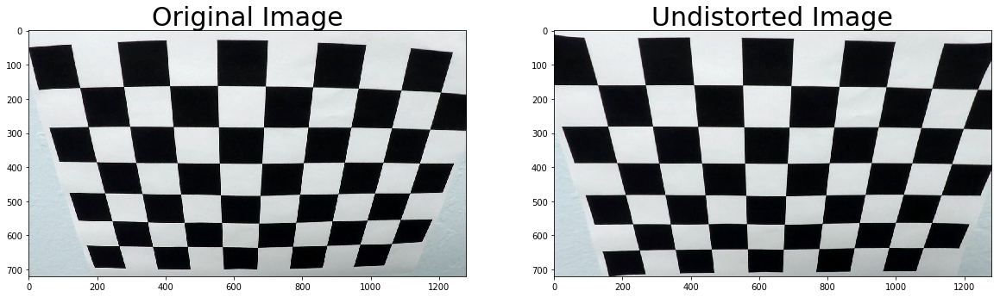

In [35]:
#result of undistorted image
img = cv2.imread('./camera_cal/calibration2.jpg')
dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('./camera_cal/calibration2_undist.jpg',dst)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
f.savefig("undistort.png")

## 2. Apply a distortion correction to raw images.

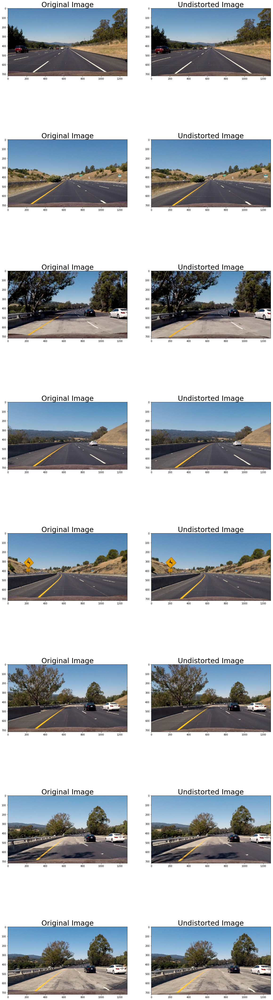

In [3]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]

# load test image path
images = glob.glob('./test_images/straight_lines*.jpg') + glob.glob('./test_images/test*.jpg')
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
for i, fname in enumerate(images):
    # original image
    img = mpimg.imread(fname)
    
    # undistort the test image
    undist_img = cv2.undistort(img, mtx, dist, None, mtx)
    # hold undistort image
    if i == 0:
        undist_images = np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))
    else:
        undist_images = np.concatenate([undist_images,np.reshape(undist_img,(1,undist_img.shape[0],undist_img.shape[1],undist_img.shape[2]))],axis=0)
    #endif
    
    # plot
    
    axes[i][0].imshow(img)
    axes[i][0].set_title('Original Image', fontsize=30)
    axes[i][1].imshow(undist_img)
    axes[i][1].set_title('Undistorted Image', fontsize=30)
#endfor

f.savefig("undistort_series.png")

## 3.Use color transforms, gradients, etc., to create a thresholded binary image.

In [4]:
def mag_thresh(img, sobel_kernel=15, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=15, thresh=(0.8,1.2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def mag_and_dir_thresh(img, sobel_kernel=15, mag_th=(30,100), dir_th=(0.8,1.2)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Take the absolute value of the gradient direction,
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(absgraddir >= dir_th[0]) & (absgraddir <= dir_th[1]) & (gradmag >= mag_th[0]) & (gradmag <= mag_th[1])] = 1
    return binary_output

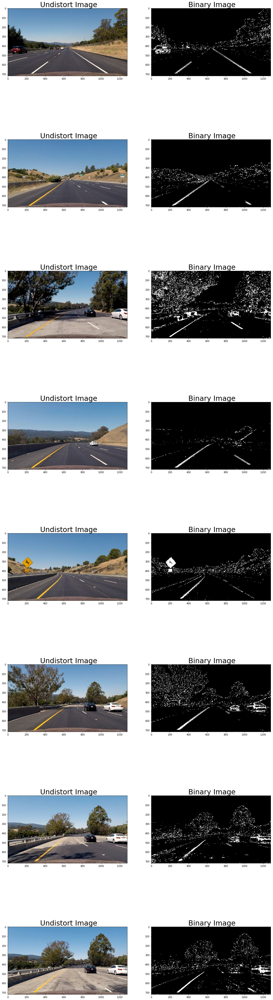

In [5]:
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # gradient threshold
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1
    # hold binary image
    if i == 0:
        threshold_binary_images = np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))
    else:
        threshold_binary_images = np.concatenate([threshold_binary_images,np.reshape(threshold_binary_img,(1,threshold_binary_img.shape[0],threshold_binary_img.shape[1]))],axis=0)
    #endif

    axes[i][0].imshow(undist)
    axes[i][0].set_title(' Undistort Image', fontsize=30)
    axes[i][1].imshow(threshold_binary_img,cmap='gray')
    axes[i][1].set_title(' Binary Image', fontsize=30)
f.savefig("binarize.png")

## 4. Apply a perspective transform to rectify binary image ("birds-eye view").

I use first image to find four points lying along the lines that, after perspective transform, make the lines look straight and vertical from a bird's eye view perspective.

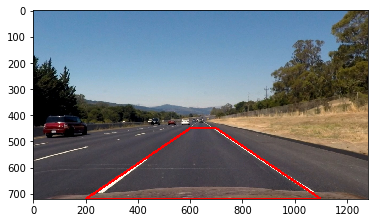

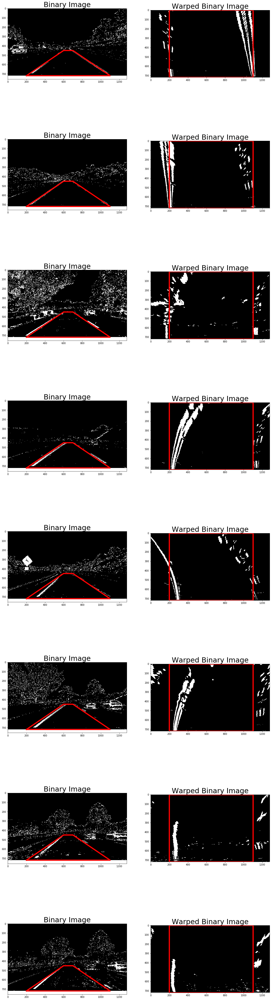

In [6]:
# choice 4 points lying along the lines in original(undistort) image.
# I use following 4 points.
#(720,200),(720,1100),(450,600),(450,700) 
#:(image.shape[0],200/1280*image_shape[1]),(image.shape[0],1100/1280*image_shape[1]),(450/720*image.shape[0],600/1280*image_shape[1]),(450/720*image.shape[0],700/1280*image_shape[1])
from PIL import Image
from PIL import ImageDraw
undist = np.reshape(undist_images[0,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
lined_image = Image.new('RGB',(undist.shape[1] ,undist.shape[0]))
undist_image = Image.fromarray(undist)
lined_image.paste(undist_image,(0,0))
d = ImageDraw.Draw(lined_image)
d.line(((200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0]),(200/1280*undist.shape[1],undist.shape[0])),fill=(255,0,0),width=10)
plt.imshow(lined_image)
plt.savefig("cut_reference_area.png")

# set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)
img_size = (threshold_binary_images.shape[2],threshold_binary_images.shape[1])
for i in range(threshold_binary_images.shape[0]):
    threshold_binary_img = np.reshape(threshold_binary_images[i],(threshold_binary_images.shape[1],threshold_binary_images.shape[2]))
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)
    # hold warped-binary image
    if i == 0:
        warped_binary_images = np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))
    else:
        warped_binary_images = np.concatenate([warped_binary_images,np.reshape(warped_binary_img,(1,warped_binary_img.shape[0],warped_binary_img.shape[1]))],axis=0)
    #endif
    # Plot the result
    axes[i][0].imshow(threshold_binary_img, cmap='gray')
    axes[i][0].plot(src_x, src_y, color='red', linewidth=5)
    axes[i][0].set_title('Binary Image', fontsize=30)
    axes[i][1].imshow(warped_binary_img, cmap='gray')
    axes[i][1].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][1].set_ylim([warped_binary_img.shape[0], 0])
    axes[i][1].set_title('Warped Binary Image', fontsize=30)
f.savefig("warped_binary_image.png")

## 5. Detect lane pixels and fit to find the lane boundary.

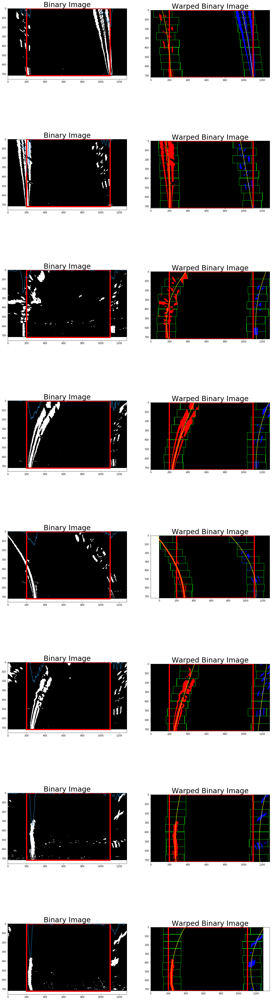

In [7]:
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)

# fitting result memory
fitting_result_array_real = np.zeros((warped_binary_images.shape[0],6)) #[left_fit[0]~[2],right_fit[0]~[2]]
fitting_result_array_img = np.zeros((warped_binary_images.shape[0],6))
f, axes = plt.subplots(nrows=len(images), ncols=2, figsize=(20,10*len(images)))
# Identify the x and y positions of all nonzero (i.e. activated) pixels in the image
for i in range(warped_binary_images.shape[0]):
    warped_binary_img = np.reshape(warped_binary_images[i],(warped_binary_images.shape[1],warped_binary_images.shape[2]))
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped_binary_img,warped_binary_img,warped_binary_img))
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        ### TO-DO: Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),
        (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),
        (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### TO-DO: Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        ### TO-DO: If you found > minpix pixels, recenter next window ###
        ### (`right` or `leftx_current`) on their mean position ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    fitting_result_array_img[i,:3]= left_fit
    fitting_result_array_img[i,3:] = right_fit
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Visualization
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]
    # Plot the result
    
    axes[i][0].imshow(warped_binary_img, cmap='gray')
    axes[i][0].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][0].plot(histogram)
    axes[i][0].set_title('Binary Image', fontsize=30)
    axes[i][1].imshow(out_img)
    axes[i][1].plot(dst_x, dst_y, color='red', linewidth=5)
    axes[i][1].set_ylim([out_img.shape[0], 0])
    axes[i][1].set_title('Warped Binary Image', fontsize=30)
    # Plots the left and right polynomials on the lane lines
    axes[i][1].plot(left_fitx, ploty, color='yellow')
    axes[i][1].plot(right_fitx, ploty, color='yellow')
    
    # from pixel world to real world
    ym_per_pix = 30/720  #[m/pixel] in y dimension
    xm_per_pix = 3.7/700 #[m/pixel] in x dimension
    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    fitting_result_array_real[i,:3]= left_fit_real
    fitting_result_array_real[i,3:] = right_fit_real
f.savefig("find_lane_points.png")

## 6. Determine the curvature of the lane and vehicle position with respect to center.

In [8]:
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension

ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
print(ploty.shape)
ploty_inverse = np.linspace(719, 0, num=720)
fitting_result_array = fitting_result_array_real
print(fitting_result_array)

#the bottom of the image
y_eval = np.max(ploty)

for i in range(fitting_result_array.shape[0]):
    # Implement the calculation of R_curve (radius of curvature) (ref. formula) 
    left_curverad = ((1 + (2*fitting_result_array[i,0]*y_eval*ym_per_pix + fitting_result_array[i,1])**2)**1.5) / np.absolute(2*fitting_result_array[i,0])
    right_curverad = ((1 + (2*fitting_result_array[i,3]*y_eval*ym_per_pix + fitting_result_array[i,4])**2)**1.5) / np.absolute(2*fitting_result_array[i,3])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = fitting_result_array[i,0]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,1]*(y_eval*ym_per_pix) + fitting_result_array[i,2]
    right_bottom_x = fitting_result_array[i,3]*(y_eval*ym_per_pix)**2 + fitting_result_array[i,4]*(y_eval*ym_per_pix) + fitting_result_array[i,5]
    vehicle_position = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right
    print(vehicle_position)
    print((left_bottom_x+right_bottom_x)/2)

(720,)
[[-4.70692512e-04  3.01423386e-02  6.61786890e-01 -1.31883239e-04
   2.45833548e-02  5.20884900e+00]
 [-3.45105112e-04  1.68804442e-02  8.85678228e-01 -8.15096371e-05
   2.53391594e-02  5.09745726e+00]
 [ 2.21265878e-03 -9.98662347e-02  2.01371140e+00  1.07928273e-03
  -5.03860834e-02  6.55656699e+00]
 [ 6.11200783e-04 -6.06879792e-02  2.49276286e+00  9.31249291e-04
  -5.19677186e-02  6.71344647e+00]
 [-1.72231287e-03  1.09064288e-01 -1.82807069e-01 -2.23631572e-03
   1.19198519e-01  4.34361023e+00]
 [ 2.75353600e-04 -4.75060629e-02  2.50128559e+00  3.49060039e-05
  -1.78505480e-02  6.60350228e+00]
 [ 6.94501658e-04 -2.90150277e-02  1.68584499e+00  7.09323187e-04
  -3.16413314e-02  6.52089815e+00]
 [ 1.50152704e-03 -6.94870342e-02  2.05106854e+00  1.97338092e-03
  -7.91979359e-02  6.81509336e+00]]
1062.2706125719317 m 3792.8149078670413 m
0.10179969460837901
3.484656837465522
1448.865275034191 m 6138.0944322265805 m
0.04968134319322415
3.432538486050367
226.33522329590338 m 463.

## 7. Warp the detected lane boundaries back onto the original image.

1062.2706125719367 m 3792.814907865787 m
1.1423537719129562 m 5.826959903018075 m
1.0076821675149568 m 5.5474958119636995 m
1448.865275034172 m 6138.094432228042 m
1.0816557660368762 m 5.783421206063856 m
1.0611001065706644 m 5.4587279947588385 m
226.33522329590465 m 463.41236816061166 m
1.007750546142834 m 6.015742036536744 m
1.0142646983439132 m 6.043989983532859 m
818.7726317439244 m 536.9249720241038 m
1.2232059095340317 m 5.99237808612471 m
1.720845942566549 m 6.14396281193101 m
290.3222997265914 m 223.65543105263666 m
1.5387984241905286 m 5.9075019334697085 m
1.0644403764330763 m 5.627330391341214 m
1818.4664549351896 m 14329.519771745076 m
1.3252134543612832 m 6.100057805950351 m
1.8514669379715354 m 6.343947990792603 m
720.1120630154483 m 705.0219833122704 m
1.4399195645292866 m 6.209595385863057 m
1.4070531671691202 m 6.206092068568565 m
333.2038480006177 m 253.951758242488 m
1.3169759350076335 m 6.213567999309979 m
1.3471164544144774 m 6.071552479317845 m


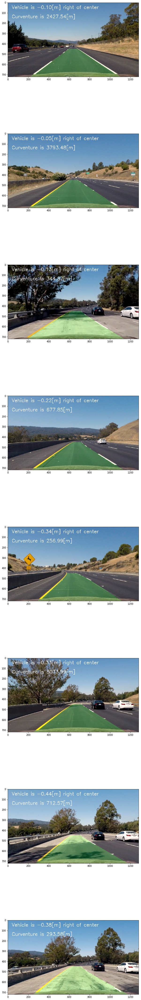

In [150]:
fitting_result_array = fitting_result_array_img
f, axes = plt.subplots(nrows=len(images), ncols=1, figsize=(10,10*len(images)))
for i in range(undist_images.shape[0]):
    undist = np.reshape(undist_images[i,:,:,:],(undist_images.shape[1],undist_images.shape[2],undist_images.shape[3]))
    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)
    left_fitx = fitting_result_array[i,0]*ploty**2 +  fitting_result_array[i,1] * ploty+ fitting_result_array[i,2]
    right_fitx = fitting_result_array[i,3]*ploty_inverse**2 +  fitting_result_array[i,4] * ploty_inverse+ fitting_result_array[i,5]
    #point = np.append(point,(right_fitx,ploty))
    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
    
    left_fit_real = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_real = np.polyfit(ploty_inverse*ym_per_pix, right_fitx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
    right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
    right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
    print(left_bottom_x, 'm', right_bottom_x, 'm')
    left_middle_x = left_fit_real[0]*(y_eval/2*ym_per_pix)**2 + left_fit_real[1]*(y_eval/2*ym_per_pix) +left_fit_real[2]
    right_middle_x = right_fit_real[0]*(y_eval/2*ym_per_pix)**2 + right_fit_real[1]*(y_eval/2*ym_per_pix)+right_fit_real[2]
    print(left_middle_x, 'm', right_middle_x, 'm')
    line_base_pos = (img_size[0]/2*xm_per_pix-(left_bottom_x+right_bottom_x)/2)#from center to the right
    text = "Vehicle is " + "{:.2f}".format(line_base_pos) + "[m] right of center"
    lane_area_overrayed_img = cv2.putText(lane_area_overrayed_img, text, (40,60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    text = "Curventure is " + "{:.2f}".format((right_curverad+left_curverad)/2) + "[m]"
    lane_area_overrayed_img = cv2.putText(lane_area_overrayed_img, text, (40,150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
    axes[i].imshow(lane_area_overrayed_img)
f.savefig("warped_lane_area.png")



## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### First trial
No time scale modification.

In [11]:
# load the data of calibration
dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]
# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50
# from pixel world to real world
ym_per_pix = 30/720  #[m/pixel] in y dimension
xm_per_pix = 3.7/700 #[m/pixel] in x dimension
# Set height of windows - based on nwindows above and image shape
window_height = np.int(warped_binary_img.shape[0]//nwindows)
# set the number to check class variables over the last (const_num) iteration
n = 10

# for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
src = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(700/1280*undist.shape[1],450/720*undist.shape[0]),(600/1280*undist.shape[1],450/720*undist.shape[0])])
dst = np.float32([(200/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],undist.shape[0]),(1100/1280*undist.shape[1],0),(200/1280*undist.shape[1],0)])

src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

M = cv2.getPerspectiveTransform(src, dst)
M_inv = cv2.getPerspectiveTransform(dst, src)

#the bottom of the image
ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
y_eval = np.max(ploty)



def process_image(image):
    img_size = (image.shape[1],image.shape[0])

    ## undistort image
    undist = cv2.undistort(image, mtx, dist, None, mtx)

    ## threshold and generate binary image
    mag_and_dir_binary = mag_and_dir_thresh(undist)
    # color threshold
    # Convert to HLS color space and separate the V channel
    s_thresh = (170, 255)
    hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
    # conbine gradient and color threshold
    threshold_binary_img = np.zeros_like(mag_and_dir_binary)
    threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

    ## perspective transform
    warped_binary_img = cv2.warpPerspective(threshold_binary_img, M, img_size, flags=cv2.INTER_LINEAR)

    ## Detect lane pixels and fit to find the lane boundary
    # calculate histgram
    bottom_half_binary_img =  warped_binary_img[warped_binary_img.shape[0]//2:,:]
    histogram = np.sum(bottom_half_binary_img,axis=0)
    # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
    midpoint = np.int(histogram.shape[0]//2)
    # set the first position of search window.
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    nonzero = warped_binary_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
        win_y_high = warped_binary_img.shape[0] - window*window_height
        # Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)

        # If you found > minpix pixels, recenter next window #
        # (`right` or `leftx_current`) on their mean position #
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
    #endfor
    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # it a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
    ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # for overray lane area
    lane_area = np.zeros_like(undist)
    warped_area = cv2.warpPerspective(lane_area, M, img_size, flags=cv2.INTER_LINEAR)

    pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
    pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
    pts = np.concatenate((pts_left, pts_right),axis=1)
    lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
    unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, M_inv, img_size, flags=cv2.INTER_LINEAR)
    lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)


    left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
    right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
    print(left_curverad, 'm', right_curverad, 'm')
    left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
    right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
    line_base_pos = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right
    print(left_bottom_x, 'm', right_bottom_x, 'm')
    left_top_x = left_fit_real[2]
    right_top_x = right_fit_real[2]
    print(left_top_x, 'm', right_top_x, 'm')
    return lane_area_overrayed_img

In [12]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)

project_clip = clip.fl_image(process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

287.6682408070555 m 934.9425637771836 m
1.5046248302268705 m 6.334104358217044 m
-0.15453868267925766 m 4.608006225405514 m
Moviepy - Building video project_videos_output.mp4.
Moviepy - Writing video project_videos_output.mp4



t:   0%|          | 2/1260 [00:00<02:19,  9.05it/s, now=None]

287.6682408070555 m 934.9425637771836 m
1.5046248302268705 m 6.334104358217044 m
-0.15453868267925766 m 4.608006225405514 m


t:   0%|          | 4/1260 [00:00<03:32,  5.90it/s, now=None]

280.9049787817959 m 11494.900512319835 m
1.5106098500810627 m 6.390531156607369 m
-0.16648393386906174 m 4.600328647753969 m
276.35454196850253 m 52729.185974775006 m
1.5189687960315397 m 6.380315861212862 m
-0.1872370339310252 m 4.531708541167372 m


t:   0%|          | 6/1260 [00:01<03:36,  5.79it/s, now=None]

257.1683173459466 m 1018.6089608056245 m
1.504888908433484 m 6.322494505407354 m
-0.20890149534395205 m 4.485891909277788 m
276.3482129681578 m 798.1763630595566 m
1.5343470144462055 m 6.301045777926285 m
-0.20749072686102132 m 4.44414098226722 m


t:   1%|          | 8/1260 [00:01<03:36,  5.77it/s, now=None]

267.26871562217343 m 763.6349174240485 m
1.544591248806036 m 6.294366176950403 m
-0.2280263977229639 m 4.2179000243810805 m
287.435981687369 m 471.4486363294642 m
1.559518338396848 m 6.2380918321461705 m
-0.22289241196954743 m 4.217089701676481 m


t:   1%|          | 10/1260 [00:01<03:37,  5.75it/s, now=None]

284.0450013415763 m 301.8741777652342 m
1.572990282781697 m 6.07336662699304 m
-0.23696972291911558 m 4.1880559789601515 m
298.491333708855 m 317.0298603663905 m
1.5767819174349593 m 6.121742504186272 m
-0.2455100425374038 m 4.240772749119173 m


t:   1%|          | 12/1260 [00:02<03:38,  5.72it/s, now=None]

312.7836655436362 m 7168.183289056988 m
1.5803686741002312 m 6.440551529542272 m
-0.2606223469923966 m 4.333811907414389 m
318.06819248121417 m 986.0137315443823 m
1.5816084809322073 m 6.332058297512891 m
-0.2698056500653503 m 4.215579629435922 m


t:   1%|          | 14/1260 [00:02<03:41,  5.63it/s, now=None]

361.4648774849605 m 878.5158504122064 m
1.5768932503437212 m 6.33047103585146 m
-0.278504464517996 m 4.377147286278371 m
359.17316474875315 m 732.322318125689 m
1.5748914683490869 m 6.311756525316365 m
-0.2944991913657911 m 4.333306075104703 m


t:   1%|▏         | 16/1260 [00:02<03:40,  5.65it/s, now=None]

358.9298483454958 m 3614.9892246763193 m
1.570374872082963 m 6.370528184593603 m
-0.29793108886578323 m 4.475866707130348 m
337.9858518241819 m 2498.9457783576677 m
1.5611073370447839 m 6.3316454652570275 m
-0.29495278351434184 m 4.227611956666456 m


t:   1%|▏         | 18/1260 [00:03<03:40,  5.64it/s, now=None]

331.5893697456654 m 1156.1941957461834 m
1.5646898977575878 m 6.2804382051477745 m
-0.2911106114836576 m 4.134058087402197 m
333.94772022593116 m 1602.5595669555396 m
1.563585453063161 m 6.256507685164806 m
-0.3001131230361132 m 4.196578320771234 m


t:   2%|▏         | 20/1260 [00:03<03:38,  5.68it/s, now=None]

349.15005921984823 m 496.2573547132316 m
1.5672148373905166 m 6.205120494732402 m
-0.2816088578189073 m 3.854217919779535 m
374.1460719991033 m 649.9958020349773 m
1.5612358137110283 m 6.392124853583082 m
-0.28052638639375005 m 4.454335129199744 m


t:   2%|▏         | 22/1260 [00:03<03:38,  5.65it/s, now=None]

396.73000534217675 m 239.3635142646665 m
1.5543946023466844 m 5.82722691893234 m
-0.28037574712009544 m 4.002053120217706 m
412.38644233522274 m 305.6369840801947 m
1.5462866899643983 m 5.976967818804498 m
-0.2865277793544299 m 4.146911797858005 m


t:   2%|▏         | 24/1260 [00:04<03:37,  5.67it/s, now=None]

448.24625594677474 m 308.88639457729863 m
1.53305133693891 m 6.033114109710392 m
-0.2858992483209644 m 4.2177274067082715 m
480.8156902516415 m 713.2348815319571 m
1.5177436023898006 m 6.222969519731868 m
-0.2796349400063964 m 4.269539235573983 m


t:   2%|▏         | 26/1260 [00:04<03:38,  5.66it/s, now=None]

417.31800473426364 m 702.6917155828698 m
1.4981740996901325 m 6.2280448795684915 m
-0.29368322430421084 m 4.262354125280914 m
386.1456817925958 m 454.1189156449685 m
1.484330488404097 m 6.171982135706054 m
-0.30567021938003397 m 4.176330204121381 m


t:   2%|▏         | 28/1260 [00:04<03:35,  5.71it/s, now=None]

388.7823784080953 m 730.3452619081152 m
1.462923480198027 m 6.239491583860296 m
-0.31267304833563037 m 4.345913405733765 m
373.7270111480934 m 976.7885947912412 m
1.4384174440921276 m 6.255178784716321 m
-0.31518614517107985 m 4.381409069825275 m


t:   2%|▏         | 30/1260 [00:05<03:34,  5.73it/s, now=None]

380.5611011716106 m 928.7003423193788 m
1.4181593799477241 m 6.265186943225121 m
-0.32475274095089957 m 4.506186065650678 m
373.6259829148107 m 752.9595063690806 m
1.4200413713921791 m 6.27640590794387 m
-0.2952636754646002 m 4.342169666467667 m


t:   3%|▎         | 32/1260 [00:05<03:34,  5.72it/s, now=None]

339.91110303167676 m 729.562815602148 m
1.4217963373809055 m 6.241742031457836 m
-0.3080803035895169 m 4.345756874482517 m
311.74859266566057 m 1021.6219186741486 m
1.4254665544435776 m 6.251385018290417 m
-0.32808003202385155 m 4.277007039796908 m


t:   3%|▎         | 34/1260 [00:05<03:32,  5.76it/s, now=None]

272.36875699426304 m 1106.2340919137555 m
1.4176634020378733 m 6.233147971978614 m
-0.35461533983807275 m 4.187638552307321 m
266.43495289642465 m 294.56544664492264 m
1.4084743043883055 m 5.993753688265452 m
-0.3685250371544595 m 4.097869905528641 m


t:   3%|▎         | 36/1260 [00:06<03:33,  5.73it/s, now=None]

258.8475347834397 m 230.16679972681433 m
1.4238940021894202 m 5.90026631130625 m
-0.3942731201856828 m 4.055772160679126 m
239.75104195380482 m 428.3063573799804 m
1.4233554746816346 m 6.139191876883719 m
-0.4468035674710747 m 4.073234802122302 m


t:   3%|▎         | 38/1260 [00:06<03:32,  5.76it/s, now=None]

228.38609931960355 m 376.3044657682766 m
1.4363789401799525 m 6.148788869113025 m
-0.4775100198567069 m 3.9740720496403386 m
228.4075595338979 m 296.2252395162329 m
1.4472412387032476 m 6.101373004341338 m
-0.48683424087506383 m 3.9041866168922237 m


t:   3%|▎         | 40/1260 [00:07<03:31,  5.77it/s, now=None]

220.29811961839374 m 297.05890384953005 m
1.4546707356703208 m 6.109502647545956 m
-0.5242592608625068 m 3.9093976722952855 m
214.53227817428262 m 2142.0579912627923 m
1.458824664776592 m 6.278679153788087 m
-0.5502818486412085 m 4.031359228305365 m


t:   3%|▎         | 42/1260 [00:07<03:30,  5.79it/s, now=None]

214.47696653548468 m 888.3775722365567 m
1.4585802255628009 m 6.2572630478057345 m
-0.575596669568542 m 3.9617004369756 m
216.49444875637246 m 537.4321079864253 m
1.4670722755187986 m 6.227130425918363 m
-0.5866613408781018 m 3.909488443870123 m


t:   3%|▎         | 44/1260 [00:07<03:33,  5.69it/s, now=None]

212.99015304258845 m 532.3876825365131 m
1.4685657643233343 m 6.2242319270214574 m
-0.6140134627018048 m 3.9540123468758104 m
219.58709037507995 m 1163.3833083897907 m
1.4904779743247665 m 6.239761951559332 m
-0.628015260582386 m 4.1216841975622724 m


t:   4%|▎         | 46/1260 [00:08<03:32,  5.73it/s, now=None]

228.54872976774072 m 1264.1362878887066 m
1.4959162742722316 m 6.255725849079686 m
-0.625508609982343 m 4.148169426140454 m
228.91161916845752 m 801.9520006321762 m
1.4975715899258395 m 6.241135664428956 m
-0.6480566008132076 m 4.154298003922657 m


t:   4%|▍         | 48/1260 [00:08<03:31,  5.74it/s, now=None]

238.22590261482594 m 514.7069830595093 m
1.4979113221259879 m 6.1138271658135945 m
-0.6210399813332032 m 4.252857889159878 m
247.75230153715134 m 236.30485553798349 m
1.4992344221761051 m 5.985974203235917 m
-0.6134159152751657 m 4.013997140397985 m


t:   4%|▍         | 50/1260 [00:08<03:31,  5.73it/s, now=None]

249.7319293438065 m 384.0492051860683 m
1.5055059642689652 m 6.169751538260095 m
-0.6206470244139222 m 3.99243578113533 m
270.35834458455895 m 543.382565889405 m
1.5064398682239688 m 6.257256875172254 m
-0.6021051950432421 m 4.09136016460885 m


t:   4%|▍         | 52/1260 [00:09<03:30,  5.73it/s, now=None]

292.7046805369733 m 400.0652111639141 m
1.5206256190310836 m 6.2325858074437 m
-0.580555425715469 m 3.9875115567150043 m
292.634522317293 m 317.46781004053946 m
1.5199923328250384 m 6.180391747859238 m
-0.5893485324606833 m 3.9953175498742888 m


t:   4%|▍         | 54/1260 [00:09<03:31,  5.71it/s, now=None]

305.5068830761143 m 1706.255699181158 m
1.5206098800326955 m 6.3201551323317195 m
-0.5460296325432145 m 4.044174175740032 m
313.3614294309254 m 544.6271049456942 m
1.5242548571359162 m 6.265762463212157 m
-0.5500098272552607 m 3.8316244070582046 m


t:   4%|▍         | 56/1260 [00:09<03:30,  5.71it/s, now=None]

328.4385916875194 m 328.16374609861055 m
1.5186596294297874 m 6.213128752034615 m
-0.4954521349163938 m 3.7165475969421835 m
371.0043978046654 m 384.2815609739607 m
1.523856944875065 m 6.211635738700212 m
-0.4453518793718941 m 3.81744975705016 m


t:   5%|▍         | 58/1260 [00:10<03:33,  5.63it/s, now=None]

411.1624057545461 m 497.1847963840053 m
1.5238519874646936 m 6.209917266146409 m
-0.4154734006993343 m 3.9163152379910873 m
414.5754953509342 m 368.2275843131404 m
1.5209675060758756 m 6.161417780995292 m
-0.40015284264906287 m 3.717000156763475 m


t:   5%|▍         | 60/1260 [00:10<03:31,  5.68it/s, now=None]

426.8701843179066 m 387.78345008115446 m
1.5153095691281886 m 6.125019474778343 m
-0.40230550636579826 m 3.8895577585388126 m
430.9549909805289 m 277.99751331460055 m
1.516164080550654 m 5.89388057770419 m
-0.35542459958471934 m 3.792413575877048 m


t:   5%|▍         | 62/1260 [00:10<03:31,  5.67it/s, now=None]

487.69836928768564 m 470.04952268593036 m
1.521700785736929 m 6.174540570527798 m
-0.25214759668287234 m 3.611922855001796 m
381.3234042867227 m 401.34028794075107 m
1.496236595182384 m 6.10996252569778 m
-0.33783098501363973 m 3.656636433332 m


t:   5%|▌         | 64/1260 [00:11<03:29,  5.71it/s, now=None]

378.7143926103614 m 639.6497311493014 m
1.4913370386101807 m 6.171599925943652 m
-0.3181115682212537 m 3.7014939842186667 m
521.294708482463 m 517.4321107626633 m
1.492535848579413 m 6.135267757837578 m
-0.1585462034172737 m 3.8077757244303974 m


t:   5%|▌         | 66/1260 [00:11<03:27,  5.75it/s, now=None]

522.2216467893222 m 979.0810307544052 m
1.4795857322123782 m 6.198508304206861 m
-0.1143908621033005 m 3.716444677497166 m
443.13022130582794 m 1329.932996157458 m
1.4516616044876167 m 6.192591724210287 m
-0.1679710018360508 m 3.9002403851627676 m


t:   5%|▌         | 68/1260 [00:11<03:32,  5.60it/s, now=None]

492.612101425525 m 1113.8331741238246 m
1.4407199112054412 m 6.167421622986988 m
-0.04779553363574994 m 3.9309212951506227 m
377.49185233378415 m 1102.1597477146472 m
1.413998978443192 m 6.1408786221844585 m
-0.16968878410748264 m 3.9852513752817353 m


t:   6%|▌         | 70/1260 [00:12<03:29,  5.69it/s, now=None]

416.74462651915775 m 1258.5199883973498 m
1.4214277856354356 m 6.150614210564207 m
-0.14192754522807652 m 3.8251933020974094 m
363.17013828824196 m 663.841245722953 m
1.4132253719793537 m 6.106950516278738 m
-0.1866058655132164 m 3.700401158702888 m


t:   6%|▌         | 72/1260 [00:12<03:28,  5.69it/s, now=None]

331.26453537337284 m 369.99279784210233 m
1.3974978910616618 m 5.897840227141153 m
-0.2811405621698381 m 3.7706219809975017 m
330.94259049928627 m 284.4440562092953 m
1.4015321783620176 m 5.7132850565913325 m
-0.29330077036592483 m 3.8402201552386446 m


t:   6%|▌         | 74/1260 [00:12<03:27,  5.72it/s, now=None]

390.5308294712978 m 324.9164156370434 m
1.414063395535373 m 5.84618984612488 m
-0.26182543814353254 m 3.9076520493255336 m
391.3432858917085 m 497.3626417825342 m
1.4089037048450195 m 6.008701126747479 m
-0.2818710507698505 m 3.8628128590998205 m


t:   6%|▌         | 76/1260 [00:13<03:27,  5.72it/s, now=None]

407.288467167772 m 514.6398546153556 m
1.410135724555282 m 6.028309870864822 m
-0.2832271708228701 m 3.847625924423439 m
496.43937226371554 m 518.5766776844147 m
1.406113045534171 m 6.0222908727451845 m
-0.2237192153346491 m 3.9773801241751228 m


t:   6%|▌         | 78/1260 [00:13<03:27,  5.69it/s, now=None]

516.4114127152318 m 997.0346316649252 m
1.4154950598509615 m 6.071867592344477 m
-0.23783395312214603 m 4.059996837141317 m
563.8790289500869 m 10022.086753524842 m
1.3967611011155028 m 6.1282554310851545 m
-0.2515962987639617 m 4.24693195125313 m


t:   6%|▋         | 80/1260 [00:14<03:26,  5.70it/s, now=None]

708.6432514638186 m 1106.661777889798 m
1.3917586844684513 m 6.105853997194048 m
-0.18559938065138298 m 4.153821281340488 m
647.7175485028833 m 831.712759768833 m
1.3626547469979537 m 6.086396744019811 m
-0.197123660994361 m 4.201551033148757 m


t:   7%|▋         | 82/1260 [00:14<03:26,  5.70it/s, now=None]

578.5491138173227 m 734.6317827917396 m
1.3421492197734208 m 6.070471954440777 m
-0.2066885446507423 m 4.236203898056076 m
596.6617078865869 m 1204.4234964918803 m
1.345522903191934 m 6.073503182060803 m
-0.1668986371039739 m 4.208118958073141 m


t:   7%|▋         | 84/1260 [00:14<03:27,  5.68it/s, now=None]

577.8196525350921 m 1596.349024006994 m
1.319060391853343 m 6.090395061926502 m
-0.1527745681224001 m 4.1921216292038785 m
494.64171311356046 m 364.8438378253738 m
1.3011085945727232 m 5.963431700878733 m
-0.215680901536727 m 3.9734733381718588 m


t:   7%|▋         | 86/1260 [00:15<03:25,  5.71it/s, now=None]

521.4581585905058 m 289.0765057958268 m
1.281737326018285 m 5.876356220341929 m
-0.24054571010027673 m 4.08105797110911 m
526.501287236117 m 352.46250781554727 m
1.2748863045199759 m 5.959663449550493 m
-0.2153154398777723 m 4.164478364646502 m


t:   7%|▋         | 88/1260 [00:15<03:25,  5.71it/s, now=None]

457.2652395891772 m 2192.0805130204417 m
1.2642107845290655 m 6.18265620494663 m
-0.25536874768599477 m 4.251863405637948 m
383.20666086961535 m 880.8386296939244 m
1.2609896436527566 m 6.111152513736219 m
-0.22166716542846968 m 4.131309966715499 m


t:   7%|▋         | 90/1260 [00:15<03:24,  5.71it/s, now=None]

360.0063253020068 m 854.5729164453631 m
1.263121014063274 m 6.082291098415027 m
-0.20610210877530752 m 4.112253999232858 m
332.17854403198527 m 2597.475310193058 m
1.261656517230123 m 6.1231412054445045 m
-0.19969081813116943 m 4.0758400578084935 m


t:   7%|▋         | 92/1260 [00:16<03:26,  5.67it/s, now=None]

294.8755630938415 m 1965.6760628868549 m
1.266661614728145 m 6.097981522368902 m
-0.2015440717011387 m 3.97705624340543 m
308.0011382976651 m 953.8994966723011 m
1.2677916623826675 m 6.076172147847497 m
-0.19155105469520942 m 4.034382081408299 m


t:   7%|▋         | 94/1260 [00:16<03:25,  5.66it/s, now=None]

294.6790041897695 m 1090.6053826259945 m
1.2661154117858247 m 6.072985122627468 m
-0.2155796913068624 m 4.100596158741717 m
299.62910838974517 m 3038.230069377245 m
1.2894143375397735 m 6.079170507191317 m
-0.1971827293415059 m 4.087531181525152 m


t:   8%|▊         | 96/1260 [00:16<03:26,  5.64it/s, now=None]

297.44133949357564 m 56759.13475628552 m
1.3029317700656082 m 6.066794247936738 m
-0.19305398358605377 m 4.197683315037799 m
293.70377614647947 m 96730.14317216145 m
1.2971964723728708 m 6.031478371996095 m
-0.1952622301786304 m 4.294415689084301 m


t:   8%|▊         | 98/1260 [00:17<03:24,  5.67it/s, now=None]

295.75239048413886 m 3844.222060293538 m
1.305275248688351 m 6.0601514224061965 m
-0.19690691245954087 m 4.237693886815583 m
293.88621043905533 m 646.4214305242525 m
1.3124426855594067 m 5.973913434312101 m
-0.2129630661358494 m 4.023899711252437 m


t:   8%|▊         | 100/1260 [00:17<03:23,  5.70it/s, now=None]

326.5907233182795 m 1269.3659545906867 m
1.3249339064174883 m 6.068580677073688 m
-0.2006318498195653 m 4.132258956729203 m
319.0751002442996 m 424.7002354950188 m
1.334906887201136 m 5.959621526293206 m
-0.20968649421384397 m 3.955531276542433 m


t:   8%|▊         | 102/1260 [00:17<03:22,  5.72it/s, now=None]

327.23256564519073 m 387.09715492239684 m
1.3387259225782784 m 5.954914370908686 m
-0.22608309402755833 m 4.007694076320071 m
311.8126573216173 m 424.7864595434383 m
1.3402402246074376 m 5.9795016303731 m
-0.23141226976932397 m 4.018266123218942 m


t:   8%|▊         | 104/1260 [00:18<03:22,  5.71it/s, now=None]

327.79648998819613 m 667.6214782428066 m
1.3491427084050216 m 6.045118971377425 m
-0.18864360834081073 m 3.954064127418864 m
337.6100422894996 m 672.821082131988 m
1.3575503948580954 m 6.044615094871752 m
-0.18476860202182233 m 4.032191413634397 m


t:   8%|▊         | 106/1260 [00:18<03:22,  5.71it/s, now=None]

305.1354535680486 m 514.482940403798 m
1.3512316867161016 m 6.029976714848325 m
-0.20981875988415524 m 4.011629016306774 m
318.65941143395713 m 677.0755798701705 m
1.3472393416282442 m 6.052748003751342 m
-0.22069016859472423 m 4.229345672457118 m


t:   9%|▊         | 108/1260 [00:18<03:21,  5.71it/s, now=None]

325.40427387549437 m 1223.4696072166216 m
1.3585924757799834 m 6.086352325985901 m
-0.21997331152795727 m 4.307490119065822 m
328.5525742314913 m 747.8776845582008 m
1.3540866093738997 m 6.101544203077848 m
-0.21208069415748612 m 4.237893457245971 m


t:   9%|▊         | 110/1260 [00:19<03:22,  5.67it/s, now=None]

298.304166092623 m 522.4333449553891 m
1.3597000801799741 m 6.0294034623719455 m
-0.23206030188992902 m 4.215192869308282 m
299.37293222247257 m 308.7980448879475 m
1.367586410733835 m 5.921651085378842 m
-0.2316375746349926 m 4.098872964587614 m


t:   9%|▉         | 112/1260 [00:19<03:21,  5.70it/s, now=None]

287.39130655785 m 303.6653695893161 m
1.3637562457234103 m 5.930276364535291 m
-0.24544985612232836 m 4.160565801827708 m
278.9722544689341 m 880.5916855989475 m
1.3742119251777836 m 6.152368788332126 m
-0.256573407690251 m 4.226378141002307 m


t:   9%|▉         | 114/1260 [00:20<03:20,  5.71it/s, now=None]

292.29795925053025 m 562.7894730296982 m
1.3681743455501783 m 6.126831215278789 m
-0.25998630079256757 m 4.309866990277799 m
278.24830346131733 m 356.28277364637034 m
1.382867506929395 m 6.068785100372493 m
-0.27355727541861374 m 4.118275939313428 m


t:   9%|▉         | 116/1260 [00:20<03:19,  5.73it/s, now=None]

267.3202506966395 m 384.64801516249605 m
1.382765905830071 m 6.083852399708981 m
-0.2861445949596534 m 4.175298175249545 m
247.21843218533604 m 865.9449669569491 m
1.386368803194943 m 6.181328583875535 m
-0.31233291011986947 m 4.1136967207843185 m


t:   9%|▉         | 118/1260 [00:20<03:22,  5.65it/s, now=None]

251.73624161008865 m 854.852434964486 m
1.3981782983694429 m 6.160086768585334 m
-0.31110031246625963 m 4.166594792230028 m
256.3196855926759 m 462.2623082915197 m
1.4020168610440429 m 6.130553331163892 m
-0.31388815135934245 m 4.070130193746369 m


t:  10%|▉         | 120/1260 [00:21<03:21,  5.66it/s, now=None]

264.7552514548771 m 394.79557510588364 m
1.421231515372332 m 6.121086420876338 m
-0.30881317059831004 m 3.9962417647750166 m
262.11565027166006 m 364.1809003002972 m
1.4264481388183687 m 6.130539628841814 m
-0.31133408697148085 m 3.773617231109265 m


t:  10%|▉         | 122/1260 [00:21<03:20,  5.69it/s, now=None]

250.8963406817782 m 464.6339445754022 m
1.4375803563053844 m 6.118757861762983 m
-0.32476273539202033 m 3.9509294775959134 m
255.81035715922607 m 339.09465854967635 m
1.4459904953920026 m 6.074005491334745 m
-0.3250551771441904 m 3.9027019459437056 m


t:  10%|▉         | 124/1260 [00:21<03:19,  5.69it/s, now=None]

252.29975026407206 m 335.105329274843 m
1.4544722960339054 m 6.0396437786865285 m
-0.3327420646209549 m 3.9933677301624155 m
243.1379908232906 m 576.2723261952433 m
1.463030389103052 m 6.232249653319469 m
-0.345197058298063 m 3.7780824929751495 m


t:  10%|█         | 126/1260 [00:22<03:18,  5.70it/s, now=None]

243.4325891683281 m 329.6485548152326 m
1.4715250313572061 m 6.098501658886916 m
-0.34803583554151873 m 3.738688365850873 m
237.91111526590117 m 367.8700757496964 m
1.4794127546159095 m 6.136234556407336 m
-0.3623521782714226 m 3.7477379821582217 m


t:  10%|█         | 128/1260 [00:22<03:17,  5.74it/s, now=None]

259.32315522579256 m 299.49752037324134 m
1.486082807543293 m 6.10143113055601 m
-0.3466875762580139 m 3.8437992367391476 m
261.9932133921607 m 586.0715349552498 m
1.4920786798567298 m 6.221800974134586 m
-0.3470602640001995 m 3.82110732136058 m


t:  10%|█         | 130/1260 [00:22<03:18,  5.69it/s, now=None]

269.3891964103781 m 446.1160620439351 m
1.4973499676769066 m 6.192994713092196 m
-0.33864410707979037 m 3.8852194861450835 m
259.1006524242895 m 632.5573651993355 m
1.5099654043840725 m 6.200713713786497 m
-0.34502292709251897 m 3.946429288896432 m


t:  10%|█         | 132/1260 [00:23<03:20,  5.64it/s, now=None]

261.96452802762275 m 710.0070806904638 m
1.5056170281515338 m 6.195018107738846 m
-0.3450702334740165 m 4.035889003823561 m
273.28559355780106 m 766.4928912355402 m
1.5219836229813524 m 6.197000034918688 m
-0.3295616042484433 m 3.9385686684426093 m


t:  11%|█         | 134/1260 [00:23<03:17,  5.70it/s, now=None]

275.68094239121683 m 450.46142035839307 m
1.5333231820857764 m 6.156685161342963 m
-0.3203258511538484 m 3.7654522508448154 m
281.15283409846234 m 292.46102662520826 m
1.5373582838564213 m 5.980906914664758 m
-0.3025235726401393 m 3.8082615780300175 m


t:  11%|█         | 136/1260 [00:23<03:15,  5.74it/s, now=None]

282.57288371092653 m 378.5484983895557 m
1.5475639963513572 m 6.055341453722919 m
-0.2886915736841185 m 3.9226361097602367 m
292.04374740911084 m 669.9047991263224 m
1.5569959829138782 m 6.26111367081187 m
-0.2690879915253828 m 3.8833940882224707 m


t:  11%|█         | 138/1260 [00:24<03:18,  5.66it/s, now=None]

307.1119089108195 m 654.3502220737921 m
1.560999722059459 m 6.260069667364602 m
-0.24932304679818026 m 3.9415172469381665 m
321.8642067627813 m 476.2101721540235 m
1.5580561959211034 m 6.218153177387725 m
-0.23473037030255503 m 3.985935363514815 m


t:  11%|█         | 140/1260 [00:24<03:16,  5.71it/s, now=None]

335.4753574988618 m 385.0201133789888 m
1.5460904607428447 m 6.193626107983081 m
-0.22101654011458877 m 4.05595714384876 m
337.12649967084224 m 480.03891072979934 m
1.5357462480292832 m 6.237321668401359 m
-0.2108142569647167 m 4.1488659985694705 m


t:  11%|█▏        | 142/1260 [00:24<03:17,  5.67it/s, now=None]

373.41055996457175 m 1448.608831911482 m
1.5290860996374325 m 6.359020688986741 m
-0.1930541515786114 m 4.1841207267090805 m
368.7847343844643 m 1327.3821962757193 m
1.5241813550960366 m 6.324053508839009 m
-0.18383562201313242 m 4.253669815206795 m


t:  11%|█▏        | 144/1260 [00:25<03:16,  5.67it/s, now=None]

380.3736907541274 m 1531.9208019594844 m
1.5253532417740643 m 6.306229922356839 m
-0.16602065783051712 m 4.339960157862199 m
375.14910835192137 m 857.7368303339756 m
1.5320619038489414 m 6.263588240004212 m
-0.14271169748559345 m 4.193963115108526 m


t:  12%|█▏        | 146/1260 [00:25<03:16,  5.66it/s, now=None]

372.7202534909256 m 1987.1638219262256 m
1.522407609119439 m 6.251112265080236 m
-0.13714785267610066 m 4.267884546338426 m
368.61366796092415 m 1227.698628852462 m
1.5178425393969175 m 6.175302919264309 m
-0.13639556775672568 m 4.306569404006504 m


t:  12%|█▏        | 148/1260 [00:25<03:15,  5.69it/s, now=None]

345.22149120504923 m 6817.606300271261 m
1.508739977790967 m 6.242290760716169 m
-0.13271830659647224 m 4.358559330770377 m
367.04494391022735 m 3514.2190124434655 m
1.5095487217207988 m 6.206384911396068 m
-0.10270523003382903 m 4.486366326397254 m


t:  12%|█▏        | 150/1260 [00:26<03:13,  5.73it/s, now=None]

321.3444781554159 m 457.68655270616495 m
1.5171213345993888 m 6.153221167113564 m
-0.11380451332119002 m 3.8777873053386225 m
336.2196946451587 m 581.3052083252638 m
1.5227150284771438 m 6.3518468199450275 m
-0.09219902723062381 m 4.598975363396355 m


t:  12%|█▏        | 152/1260 [00:26<03:14,  5.70it/s, now=None]

377.7745874014326 m 1684.1501999228637 m
1.526781862493125 m 6.274807779794092 m
-0.0763211537769133 m 4.551617854538342 m
387.6393141427317 m 2185.152299137518 m
1.5235193260070061 m 6.2363457653779335 m
-0.08206561724790745 m 4.37105950785911 m


t:  12%|█▏        | 154/1260 [00:27<03:14,  5.69it/s, now=None]

381.166902491421 m 1522.5917232507288 m
1.501253936990207 m 6.260625611394531 m
-0.09228882978729674 m 4.213431243362471 m
365.26101884289955 m 894.0284223433148 m
1.5005159394371441 m 6.2260428471497296 m
-0.0955213611072445 m 4.119261136780544 m


t:  12%|█▏        | 156/1260 [00:27<03:12,  5.73it/s, now=None]

362.8330826761519 m 1369.9353395620428 m
1.4817953345869639 m 6.251164644055093 m
-0.1306123239791209 m 4.2796527060458605 m
394.91466025881533 m 1073.6365856512864 m
1.4921143787399098 m 6.242689332331256 m
-0.14359011934174418 m 4.30365536806389 m


t:  13%|█▎        | 158/1260 [00:27<03:11,  5.74it/s, now=None]

391.8711906726519 m 2528.895484779839 m
1.4818046651111827 m 6.241220442660444 m
-0.1530750148893089 m 4.331886616129322 m
390.59915290140873 m 5962.411973469195 m
1.4742425908166001 m 6.245376759400784 m
-0.1675974922545848 m 4.3193368689088665 m


t:  13%|█▎        | 160/1260 [00:28<03:10,  5.78it/s, now=None]

360.0153062091685 m 1408.1473060058029 m
1.470045132347363 m 6.190643107227773 m
-0.1826793466923186 m 4.245835204474301 m
380.01244457499183 m 1352.2581136055821 m
1.4647668964347986 m 6.306585800956098 m
-0.19950924332383319 m 4.4578126664243065 m


t:  13%|█▎        | 162/1260 [00:28<03:12,  5.69it/s, now=None]

354.2515672868672 m 1197.2488510552416 m
1.4508812149686625 m 6.3359548521017865 m
-0.20805397896406957 m 4.387133483068261 m
349.5072673039879 m 824.2754978686434 m
1.4421715301601794 m 6.231264967083936 m
-0.25331929645810247 m 4.068211033353232 m


t:  13%|█▎        | 164/1260 [00:28<03:12,  5.70it/s, now=None]

351.89999583223175 m 630.7511480666963 m
1.4371911307704055 m 6.18920400638278 m
-0.28589320446899763 m 4.088929176828754 m
379.9544994850521 m 631.3455227643419 m
1.437771187113282 m 6.201260593189154 m
-0.2957012712483155 m 4.165638046931741 m


t:  13%|█▎        | 166/1260 [00:29<03:14,  5.64it/s, now=None]

329.19148150719985 m 3575.2445784641213 m
1.4253639944214012 m 6.315083004302144 m
-0.3422936832330029 m 4.260199826058061 m
332.2947380759897 m 1537.2197727475289 m
1.428732688105498 m 6.250030929785559 m
-0.3098745295534592 m 3.985012823254192 m


t:  13%|█▎        | 168/1260 [00:29<03:11,  5.71it/s, now=None]

342.0164157902239 m 1637.6275948369137 m
1.4246914055146094 m 6.22931480074174 m
-0.3229101614554967 m 4.09448087211333 m
327.5784903734349 m 1302.3602324284782 m
1.4181958448386611 m 6.207628849865809 m
-0.30498934909397735 m 4.0281456249669985 m


t:  13%|█▎        | 170/1260 [00:29<03:10,  5.74it/s, now=None]

467.6473757614552 m 802.2041581619119 m
1.4435353205518064 m 6.204752283563462 m
-0.19475918880249815 m 3.9231629252599847 m
389.66667305641073 m 954.1709831991079 m
1.4261569882207938 m 6.198195873562065 m
-0.3247933406384419 m 4.030860572974188 m


t:  14%|█▎        | 172/1260 [00:30<03:09,  5.73it/s, now=None]

393.2790036406892 m 1480.5280302020983 m
1.4077158509209524 m 6.187677150282898 m
-0.3536747167761497 m 4.235036299158672 m
367.17403051964925 m 931.0958526225658 m
1.4030007319140636 m 6.126463442258255 m
-0.4282725935271617 m 4.282725399011521 m


t:  14%|█▍        | 174/1260 [00:30<03:09,  5.74it/s, now=None]

347.76362429714254 m 48415.02824388454 m
1.3948954512652334 m 6.170717228184079 m
-0.4738717485277693 m 4.478433740165432 m
376.23239363740674 m 280.552980170835 m
1.3994373245290188 m 6.006732996581663 m
-0.4397467044782153 m 3.7213308225228694 m


t:  14%|█▍        | 176/1260 [00:30<03:08,  5.74it/s, now=None]

389.7374403492173 m 254.3484480145187 m
1.4075073701174179 m 5.991739207840687 m
-0.4142073888481058 m 3.549175353778441 m
401.76684106652203 m 265.28319830552186 m
1.4078463071154177 m 5.990370870092232 m
-0.39319827314289785 m 3.5835362281327128 m


t:  14%|█▍        | 178/1260 [00:31<03:08,  5.75it/s, now=None]

381.6690859534279 m 255.10691629994108 m
1.3913238723497718 m 6.024996471211069 m
-0.40150559271523456 m 3.4279701488910796 m
426.77345924114996 m 302.32951153076397 m
1.3859583342073016 m 6.073133707403123 m
-0.40606060623307544 m 3.5717060035626496 m


t:  14%|█▍        | 180/1260 [00:31<03:09,  5.71it/s, now=None]

406.80028775386836 m 281.508714070871 m
1.3712613855161935 m 6.092518747566329 m
-0.40640213612761683 m 3.5914584353607553 m
363.43526969570803 m 301.77451604385794 m
1.3498633861832434 m 6.116687140321032 m
-0.4369599136159988 m 3.70401175033946 m


t:  14%|█▍        | 182/1260 [00:31<03:09,  5.68it/s, now=None]

383.7398559911393 m 295.2596428255263 m
1.3547131830038557 m 6.132661354140573 m
-0.4031151879057311 m 3.775778694225459 m
320.557321073522 m 405.3799362457458 m
1.3380492821550336 m 6.155303738426062 m
-0.4234095973728174 m 3.8144001709138204 m


t:  15%|█▍        | 184/1260 [00:32<03:09,  5.67it/s, now=None]

323.60864141141616 m 265.60325479474585 m
1.3245709407835304 m 6.045572489903594 m
-0.4081806583974854 m 3.726248906802552 m
279.5805264281514 m 366.0609061098325 m
1.3139584418897958 m 6.132049082775086 m
-0.45097028152902213 m 3.816896579589713 m


t:  15%|█▍        | 186/1260 [00:32<03:07,  5.71it/s, now=None]

250.88289908668193 m 261.4029068751805 m
1.306699977798755 m 6.059568090384088 m
-0.48925573324451815 m 3.59967416774427 m
234.0295993138855 m 232.41254799502036 m
1.3067678240757863 m 6.101983832457602 m
-0.5193377238997443 m 3.29366650473218 m


t:  15%|█▍        | 188/1260 [00:33<03:07,  5.73it/s, now=None]

210.49031023999845 m 112.99927238082664 m
1.316441252426342 m 6.749936504602344 m
-0.5456771574443586 m 5.524183664006114 m
201.12669253799442 m 119.81579460540303 m
1.3152854364725353 m 6.620128912252083 m
-0.5750906540956713 m 5.591693269216971 m


t:  15%|█▌        | 190/1260 [00:33<03:06,  5.73it/s, now=None]

195.36023724607696 m 264.77247956816143 m
1.3283084148940398 m 6.149609103060658 m
-0.5972514363019742 m 3.1155999458260095 m
196.33224166944706 m 367.42581473900316 m
1.3369903963176082 m 6.201302824434444 m
-0.5911138942076207 m 3.282752933957874 m


t:  15%|█▌        | 192/1260 [00:33<03:06,  5.73it/s, now=None]

196.6005161319274 m 92.81700889542896 m
1.3558531613263076 m 4.992529192837331 m
-0.6019420846852315 m 2.739021542767293 m
196.79889729048102 m 516.3704244392433 m
1.378872962217138 m 6.197338885756332 m
-0.5992248972168663 m 3.475267028893023 m


t:  15%|█▌        | 194/1260 [00:34<03:05,  5.73it/s, now=None]

215.1324313687839 m 300.13421325091 m
1.412031608089602 m 6.178369689582766 m
-0.5523150764757118 m 3.2291969103104656 m
220.47728310000718 m 602.6974933975731 m
1.4405641644061502 m 6.194526956097325 m
-0.5365846876315002 m 3.451032321855098 m


t:  16%|█▌        | 196/1260 [00:34<03:04,  5.77it/s, now=None]

226.99466414656243 m 374.375716468276 m
1.4563919741099605 m 6.083178296496008 m
-0.5243335239123468 m 3.440082464755968 m
227.99592637847533 m 386.84504941446164 m
1.4605268956889805 m 6.097276772102285 m
-0.5294374490650641 m 3.5335953006088068 m


t:  16%|█▌        | 198/1260 [00:34<03:05,  5.73it/s, now=None]

259.7523644806696 m 249.96779791698012 m
1.447625345518572 m 5.957559514626602 m
-0.49165167974343627 m 3.6337098323464994 m
288.26593534440406 m 575.1919523035446 m
1.4341841784890357 m 6.231217104641584 m
-0.4868740537256214 m 3.8789295653863465 m


t:  16%|█▌        | 200/1260 [00:35<03:04,  5.75it/s, now=None]

336.5393780242476 m 594.2015744393301 m
1.4220810546244247 m 6.25095985388703 m
-0.4755600329391209 m 4.061759301621977 m
364.62153527518814 m 508.76236680520094 m
1.4036178244445363 m 6.233788843543413 m
-0.5008491113228346 m 4.216156298110089 m


t:  16%|█▌        | 202/1260 [00:35<03:04,  5.72it/s, now=None]

358.2591844524911 m 590.0884611234133 m
1.3983688975107484 m 6.245247573491644 m
-0.5100967276328537 m 4.25642773509424 m
348.2746099644974 m 366.0139454149674 m
1.3681037484137417 m 6.197457148460429 m
-0.5298505843842533 m 4.15172551533025 m


t:  16%|█▌        | 204/1260 [00:35<03:05,  5.70it/s, now=None]

340.57139852455106 m 534.9678642314447 m
1.3638147151947155 m 6.231151358788265 m
-0.5230846979472742 m 4.101709883304044 m
293.9296599510735 m 543.4714901935254 m
1.341018120315597 m 6.245059920547308 m
-0.5544107935726565 m 3.9380814467388046 m


t:  16%|█▋        | 206/1260 [00:36<03:04,  5.71it/s, now=None]

315.8046491710868 m 707.1100980628296 m
1.3506997325785197 m 6.235888515630362 m
-0.5369208699108007 m 4.086568096942914 m
329.72369410398585 m 434.5116414647116 m
1.3671798966798292 m 6.18508149074284 m
-0.48959572483251945 m 3.9271896342721697 m


t:  17%|█▋        | 208/1260 [00:36<03:03,  5.74it/s, now=None]

315.92009844100824 m 1167.8680713085528 m
1.3679214870235643 m 6.201214585937146 m
-0.49620451845645847 m 4.069666302845488 m
289.20714413915226 m 4514.03178377767 m
1.3754167633024181 m 6.25455822673838 m
-0.49276592547024906 m 4.002438238030418 m


t:  17%|█▋        | 210/1260 [00:36<03:03,  5.71it/s, now=None]

278.6810476021291 m 888.8654946517041 m
1.3819178558577907 m 6.176074992316936 m
-0.49944154659100204 m 3.8599713169977785 m
276.28116675041895 m 1100.2570137266684 m
1.3788976872504046 m 6.1998012213944715 m
-0.5250195414237822 m 3.98968373782483 m


t:  17%|█▋        | 212/1260 [00:37<03:03,  5.71it/s, now=None]

295.09921482793607 m 1395.7108842611074 m
1.3776938711572293 m 6.283024141322727 m
-0.5110287616354524 m 3.919615496883513 m
300.46556352020104 m 841.1798117936022 m
1.3668942878697332 m 6.287348230638126 m
-0.5351437653271763 m 3.914781021412856 m


t:  17%|█▋        | 214/1260 [00:37<03:03,  5.71it/s, now=None]

298.9647823688028 m 606.012785450747 m
1.3698163705783024 m 6.232646990264552 m
-0.5466565389527724 m 3.8825329197694507 m
285.1276818998451 m 446.6139027868666 m
1.3545652955350944 m 6.178845808193352 m
-0.5592451494995114 m 3.9141956547799923 m


t:  17%|█▋        | 216/1260 [00:37<03:03,  5.69it/s, now=None]

272.50209068838274 m 1994.2426312104203 m
1.3524049426672806 m 6.268452823652003 m
-0.5899134390822646 m 3.9741100720340072 m
257.4910520141657 m 1149.1752332976864 m
1.3364602162308552 m 6.233255434302604 m
-0.6294603696983104 m 3.8773847942470834 m


t:  17%|█▋        | 218/1260 [00:38<03:01,  5.73it/s, now=None]

244.12586726393383 m 849.0085346486916 m
1.3292585638266274 m 6.194331985766608 m
-0.6836560066595232 m 3.892415350459687 m
281.96141210726995 m 646.1046270430786 m
1.355674438390512 m 6.151538618452622 m
-0.6202248808519109 m 3.8640064768761984 m


t:  17%|█▋        | 220/1260 [00:38<03:02,  5.71it/s, now=None]

299.46129436266654 m 1521.5247242494108 m
1.3500110706772608 m 6.154729666234372 m
-0.6166807027224834 m 4.044634120931375 m
277.13208447882687 m 916.3774265306077 m
1.3487459666052675 m 6.113780319358724 m
-0.6397332719503874 m 3.850643990314562 m


t:  18%|█▊        | 222/1260 [00:38<03:03,  5.67it/s, now=None]

288.11364163250846 m 403.3967093829389 m
1.3431621205577375 m 6.018675998280922 m
-0.6640982827143734 m 3.783584906621682 m
307.65084204884226 m 2301.3319861451373 m
1.3533484672541771 m 6.149032434285763 m
-0.6503434983195682 m 4.1201772159204095 m


t:  18%|█▊        | 224/1260 [00:39<03:04,  5.62it/s, now=None]

322.6771821003074 m 13379.198638849184 m
1.3576926648549825 m 6.189625394328093 m
-0.6330871334361627 m 4.015021493219665 m
354.11139049942557 m 716.0501601630202 m
1.3670463759257854 m 6.120268367721638 m
-0.616414704389063 m 3.8265104970096377 m


t:  18%|█▊        | 226/1260 [00:39<03:03,  5.64it/s, now=None]

333.9033497780435 m 491.57167452939274 m
1.373422845253517 m 6.0452738362945695 m
-0.612119799280971 m 3.7258407963554636 m
354.99419746310866 m 403.56194135612554 m
1.365173023899382 m 6.019333907028384 m
-0.5945082935022031 m 3.7571128741230657 m


t:  18%|█▊        | 228/1260 [00:40<03:01,  5.70it/s, now=None]

363.9694524224324 m 1114.6254413566892 m
1.3621682129925876 m 6.103024879918399 m
-0.5327022020907951 m 3.7422197444386867 m
385.0091742852223 m 751.5583360966032 m
1.356566936706045 m 6.078007978186568 m
-0.5130585238854624 m 3.7393621648254336 m


t:  18%|█▊        | 230/1260 [00:40<03:02,  5.63it/s, now=None]

377.7547360087937 m 573.8080316333203 m
1.3329150836074726 m 6.055175012826107 m
-0.5422548734046269 m 3.7666545659645476 m
430.240125688741 m 859.5407973345568 m
1.3433566953625538 m 6.04928322133024 m
-0.47847990755837105 m 3.9361520794265 m


t:  18%|█▊        | 232/1260 [00:40<03:03,  5.60it/s, now=None]

484.6117332618773 m 2085.553893866215 m
1.3333317412015497 m 6.07083486748599 m
-0.4743207373648512 m 3.987633428761804 m
409.31391740873494 m 255.70716438701578 m
1.3200784645524548 m 5.71833826864354 m
-0.5657129288700989 m 3.6239611967734815 m


t:  19%|█▊        | 234/1260 [00:41<03:02,  5.63it/s, now=None]

461.3962175356543 m 66339.64141500542 m
1.3116444919329986 m 6.0545833185213915 m
-0.5650884308837364 m 4.206529849328284 m
366.09552233110264 m 1010.0618724328001 m
1.2888777303477053 m 5.973066169096841 m
-0.7004393295617201 m 4.066411896704744 m


t:  19%|█▊        | 236/1260 [00:41<02:59,  5.69it/s, now=None]

369.4625710492802 m 1567.4714354562286 m
1.2842184337713314 m 6.044512785136968 m
-0.724561498425309 m 3.9747716426144586 m
373.2623768722914 m 434.11305965584415 m
1.2706570544624158 m 5.96258491347089 m
-0.7119583407147269 m 3.65543982672433 m


t:  19%|█▉        | 238/1260 [00:41<03:00,  5.67it/s, now=None]

401.1879366203565 m 307.87865351337695 m
1.2810029843902755 m 5.877769403365389 m
-0.6435765103656216 m 3.5008158360621673 m
406.3937815498344 m 952.9973298070881 m
1.2666991217213717 m 5.975576398958945 m
-0.6343977288813399 m 3.9273310527490755 m


t:  19%|█▉        | 240/1260 [00:42<02:59,  5.67it/s, now=None]

452.7104768206114 m 525.8673181589998 m
1.2607186067029028 m 5.988492624728832 m
-0.532300643414268 m 3.4686366278208114 m
455.2080491360289 m 336.8841000860871 m
1.2350935400021026 m 5.933393445326688 m
-0.435510000694333 m 3.3629905878190898 m


t:  19%|█▉        | 242/1260 [00:42<03:00,  5.65it/s, now=None]

421.3435736563288 m 389.54701440304854 m
1.2142280689391365 m 5.956317538416733 m
-0.452392439866235 m 3.481119679572589 m
389.1059515494432 m 463.2616056492065 m
1.2214014386917764 m 5.956007155846947 m
-0.5183138236667829 m 3.6130410011564655 m


t:  19%|█▉        | 244/1260 [00:42<03:00,  5.62it/s, now=None]

405.62702930627955 m 717.7749447914705 m
1.1959088905829354 m 5.99074631401087 m
-0.49171255922977614 m 3.7124040066872412 m
380.4723816090631 m 753.1239057854428 m
1.198889139630391 m 5.984181909398946 m
-0.4797982247036548 m 3.659992697368118 m


t:  20%|█▉        | 246/1260 [00:43<02:59,  5.66it/s, now=None]

339.0157521406811 m 681.1032152250594 m
1.180737752151125 m 5.9420460451368635 m
-0.5596577046378642 m 3.745002755413414 m
275.32126547022756 m 413.3433167118532 m
1.1701727671082538 m 5.85728206213045 m
-0.7034223968219896 m 3.6326511253396085 m


t:  20%|█▉        | 248/1260 [00:43<02:57,  5.70it/s, now=None]

276.1888647669488 m 1053.0750253139574 m
1.16945961964189 m 6.028721520756816 m
-0.6854373236759236 m 3.605536059085558 m
263.2358439538104 m 605.6076888368851 m
1.1576371908317746 m 5.973786237904984 m
-0.7414750023522808 m 3.581722329396157 m


t:  20%|█▉        | 250/1260 [00:43<02:56,  5.73it/s, now=None]

265.35256758124046 m 562.6518484465482 m
1.1734311641186241 m 5.927084624199175 m
-0.7070672094749237 m 3.5957339361851273 m
320.5886911182075 m 1648.2345710353395 m
1.1759791028203481 m 5.985375416142585 m
-0.5995913433299008 m 3.9340979410920673 m


t:  20%|██        | 252/1260 [00:44<02:55,  5.74it/s, now=None]

315.96164425002627 m 531.5225567235263 m
1.179264855008887 m 5.987060709550041 m
-0.6049607414407361 m 3.399560637983362 m
378.33476758886115 m 434.468119439555 m
1.1799121793218517 m 5.949486765700845 m
-0.4897252895482615 m 3.4549477751162336 m


t:  20%|██        | 254/1260 [00:44<02:59,  5.61it/s, now=None]

354.07400270697457 m 303.7966939433152 m
1.164321977621753 m 5.889535580779073 m
-0.5146742601387809 m 3.3921268335901966 m
366.1044460841002 m 439.1336019415939 m
1.1730399985349882 m 5.934681430975973 m
-0.47541275244898296 m 3.623702509150331 m


t:  20%|██        | 256/1260 [00:44<02:58,  5.63it/s, now=None]

394.24456870805767 m 506.25326027797746 m
1.1701308956222878 m 5.95115310714147 m
-0.44466360466741783 m 3.6200374258200494 m
376.20402559940624 m 636.4269770732308 m
1.1757312237513045 m 5.856908064998502 m
-0.4053695381723405 m 3.7952212807265564 m


t:  20%|██        | 258/1260 [00:45<02:56,  5.69it/s, now=None]

311.0256672571852 m 2488.566685772612 m
1.1628781891226359 m 5.968873272394932 m
-0.524776743702306 m 3.940915562730768 m
318.4456773026228 m 323.10960866400643 m
1.1710174620414402 m 5.74163177472483 m
-0.4668723904539427 m 3.702828943951356 m


t:  21%|██        | 260/1260 [00:45<02:55,  5.69it/s, now=None]

322.07878761475655 m 273.4764434044395 m
1.1759517525401946 m 5.767651283890244 m
-0.42034688340140847 m 3.480064812191295 m
297.4874295611971 m 359.8435165017758 m
1.1737085318945382 m 5.858216890888732 m
-0.5028459312360992 m 3.605193756972562 m


t:  21%|██        | 262/1260 [00:46<02:54,  5.71it/s, now=None]

337.45610485117584 m 390.8928101357234 m
1.1942809408693802 m 5.8738684571654005 m
-0.36902087196600897 m 3.648138747374049 m
345.7777800376481 m 481.820004782896 m
1.1865357204574156 m 5.931057810905075 m
-0.3710477012866867 m 3.8292597730234608 m


t:  21%|██        | 264/1260 [00:46<02:53,  5.73it/s, now=None]

343.1044253359374 m 502.6199991847714 m
1.1926655653495029 m 5.967545701994405 m
-0.3409187496139774 m 3.781656772864305 m
330.0736744576039 m 588.5014029818401 m
1.1916767520505362 m 6.000709945068127 m
-0.3731167947789772 m 3.7746548937811824 m


t:  21%|██        | 266/1260 [00:46<02:56,  5.64it/s, now=None]

323.70668952021856 m 718.133959890703 m
1.1701545385966658 m 6.009192847507492 m
-0.3380294911110504 m 3.9119069684543732 m
412.6550014236724 m 500.7803789707817 m
1.2016412217352512 m 5.971997538116822 m
-0.23039810718182077 m 3.9432314641379764 m


t:  21%|██▏       | 268/1260 [00:47<02:55,  5.66it/s, now=None]

452.43899091308145 m 647.586229546744 m
1.1903069115068825 m 5.995578405157071 m
-0.19534737060813717 m 4.126920762025818 m
418.044681352107 m 1137.6969338262932 m
1.187783165855373 m 6.019371097907118 m
-0.16294284889180954 m 4.128004232034981 m


t:  21%|██▏       | 270/1260 [00:47<02:55,  5.64it/s, now=None]

358.24962894265377 m 922.943156536372 m
1.1758740930671143 m 5.987851741767452 m
-0.25607024580390997 m 4.173771217113796 m
254.29684813144897 m 1481.9859840662252 m
1.1409834309115536 m 6.033014277768454 m
-0.5379401120841611 m 4.331156758669352 m


t:  22%|██▏       | 272/1260 [00:47<02:58,  5.54it/s, now=None]

347.79335689780254 m 429.27324208888854 m
1.175013416761419 m 6.300971697399776 m
-0.31874294500325545 m 4.6776110041737615 m
391.7696928641395 m 2220.5750166831094 m
1.1913787086419898 m 6.176348165873556 m
-0.21451762784851544 m 4.079427224817178 m


t:  22%|██▏       | 274/1260 [00:48<02:55,  5.61it/s, now=None]

345.21097766570625 m 534.6099481612463 m
1.1994439668722496 m 6.182777862063528 m
-0.22282078672130298 m 4.6080902798248395 m
389.6238721537401 m 1003.8066271900778 m
1.213853672206576 m 6.058652831547912 m
-0.1385503210750479 m 4.104195720400401 m


t:  22%|██▏       | 276/1260 [00:48<02:53,  5.66it/s, now=None]

311.18582191541043 m 1925.5123782294972 m
1.2098848499112698 m 6.1957271826045055 m
-0.20284915755525063 m 3.9948855810532526 m
311.8081719269338 m 2253.0726743078194 m
1.211325763012021 m 6.110549414991381 m
-0.212696588720528 m 4.036921363058605 m


t:  22%|██▏       | 278/1260 [00:48<02:53,  5.67it/s, now=None]

309.02163215583795 m 1256.1552045338544 m
1.2031602454732289 m 6.093545406221728 m
-0.21895334426227311 m 4.108176100927987 m
383.35738259590204 m 5720.027556022432 m
1.2306532369729106 m 6.099165404421224 m
-0.09028044416243569 m 4.248021512556305 m


t:  22%|██▏       | 280/1260 [00:49<02:52,  5.68it/s, now=None]

286.3413299827906 m 3684.911471089776 m
1.2087980796448736 m 6.077575513973514 m
-0.2896521355341667 m 4.35699261082654 m
315.6519569496631 m 1724.9845051884004 m
1.2308068933986234 m 6.085080407614376 m
-0.1611170354210727 m 4.414878623826966 m


t:  22%|██▏       | 282/1260 [00:49<02:51,  5.70it/s, now=None]

275.17618851216156 m 8898.110015697997 m
1.2221364522703682 m 6.075136134195842 m
-0.23378287631810427 m 4.359317361907503 m
289.95356853208784 m 5756.69058444274 m
1.2324837419063854 m 6.083258618531035 m
-0.18900067542813984 m 4.369260693898354 m


t:  23%|██▎       | 284/1260 [00:49<02:52,  5.66it/s, now=None]

281.81148243935166 m 689.0590354506197 m
1.245325447657859 m 5.995103248811802 m
-0.1822475929249611 m 4.149710699744439 m
335.6201817472311 m 671.4294152283009 m
1.2674879686196914 m 6.04438409724581 m
-0.09309083276828571 m 4.178667864878104 m


t:  23%|██▎       | 286/1260 [00:50<02:51,  5.66it/s, now=None]

330.89513947102427 m 1422.8230823710478 m
1.2732145517457534 m 6.095744766531641 m
-0.059467458821522684 m 4.297798331600964 m
463.07103576356974 m 2904.913505684437 m
1.2962666876579338 m 6.090484878557839 m
0.11879552485916485 m 4.527729067227828 m


t:  23%|██▎       | 288/1260 [00:50<02:52,  5.62it/s, now=None]

491.26844679209927 m 2044.599575795907 m
1.2988796875862738 m 6.119501727538641 m
0.12225713632405663 m 4.534726384167954 m
487.4493836657722 m 2652.15205340441 m
1.2990877163087933 m 6.1533270553473445 m
0.1646254457613404 m 4.50407189229427 m


t:  23%|██▎       | 290/1260 [00:50<02:54,  5.55it/s, now=None]

331.87672242151314 m 7593.975501942171 m
1.2503593850533388 m 6.189075877336087 m
0.02175097252459245 m 4.612175866003784 m
385.7931323249701 m 4205.396556181059 m
1.295628969317086 m 6.136363118146313 m
0.14780691743455318 m 4.637559024196233 m


t:  23%|██▎       | 292/1260 [00:51<02:55,  5.52it/s, now=None]

351.94431387534036 m 691.1822770696219 m
1.283928776816148 m 6.112463436110185 m
0.11729984487345105 m 4.447409003828946 m
461.10103820700755 m 19588.95427071021 m
1.3247416888514398 m 6.144530761055698 m
0.29713598048274914 m 4.614711112477507 m


t:  23%|██▎       | 294/1260 [00:51<02:54,  5.55it/s, now=None]

639.4208845789395 m 11432.755503698476 m
1.3605507572251745 m 6.124679346073893 m
0.42035619316057643 m 4.653209411007534 m
724.2387310890927 m 2162.34116043764 m
1.377179012179924 m 6.1630112417244085 m
0.4227301331118268 m 4.539072107368421 m


t:  23%|██▎       | 296/1260 [00:52<02:53,  5.56it/s, now=None]

957.0854940732825 m 661.6753607720366 m
1.4034621338076336 m 6.11076589398697 m
0.4975683584293854 m 4.324232054804088 m
1198.9257029936894 m 1269.458650962685 m
1.4133256607501505 m 6.161947200570471 m
0.5080948816594453 m 4.4431426703901264 m


t:  24%|██▎       | 298/1260 [00:52<02:53,  5.54it/s, now=None]

1226.2578403030207 m 5044.163021985073 m
1.4167603324558875 m 6.17088136997438 m
0.5273994726124352 m 4.682550595447789 m
1438.1398647681674 m 3749.4207252125348 m
1.4124588109261733 m 6.197310898122666 m
0.5444725541142101 m 4.638790470859225 m


t:  24%|██▍       | 300/1260 [00:52<02:53,  5.53it/s, now=None]

836.4780296658405 m 2073.268158689972 m
1.3774722496145038 m 6.227760672349531 m
0.4744386608313899 m 4.656980750937666 m
921.1349539232513 m 1356.3292900852553 m
1.375958123544986 m 6.246640766618228 m
0.48460025443985966 m 4.629460711080196 m


t:  24%|██▍       | 302/1260 [00:53<02:53,  5.51it/s, now=None]

918.2512849438418 m 2590.5813201833157 m
1.3626826815304418 m 6.218688559273208 m
0.4637356161577567 m 4.689290903815075 m
779.3232703025334 m 660.3034041452365 m
1.360858103277403 m 6.133814048756706 m
0.436663845002862 m 4.452784826195962 m


t:  24%|██▍       | 304/1260 [00:53<02:57,  5.40it/s, now=None]

967.266704498455 m 1131.9736584793955 m
1.3646793733182219 m 6.157699183432618 m
0.40492397606700403 m 4.622882528785044 m
901.8374728324168 m 4504.967470734419 m
1.3526678766878224 m 6.175276114493609 m
0.4094272560608296 m 4.76213162369076 m


t:  24%|██▍       | 306/1260 [00:53<02:53,  5.51it/s, now=None]

797.1387650382482 m 2383.492829837092 m
1.339728043052103 m 6.173234035810768 m
0.4086654120485267 m 4.8052124458068315 m
956.9765338298203 m 841.2158648492194 m
1.3482514831864116 m 6.3060094923069006 m
0.4030929475826816 m 4.882278789965102 m


t:  24%|██▍       | 308/1260 [00:54<02:54,  5.45it/s, now=None]

843.1133938035432 m 2021.2008732294332 m
1.3477933890171692 m 6.257088173844887 m
0.48900068982662587 m 4.6883425328846435 m
771.6096454206704 m 500.0498310520402 m
1.3288424939240648 m 6.431787916597727 m
0.4648129658463841 m 4.84033199710217 m


t:  25%|██▍       | 310/1260 [00:54<02:53,  5.46it/s, now=None]

2023.67010528699 m 849.3097095560845 m
1.3939174263119245 m 6.281107025811467 m
0.6768400372435318 m 4.758967455985731 m
3234.4336517981224 m 2782.5410606379205 m
1.3976143907421332 m 6.199158310977737 m
0.727118675414851 m 4.76739871352471 m


t:  25%|██▍       | 312/1260 [00:55<02:53,  5.46it/s, now=None]

4943.013326581104 m 1549.0669017690243 m
1.410099857018742 m 6.220171684765061 m
0.7855736400945208 m 4.781758436715507 m
3560.669756602846 m 3734.680013944497 m
1.40707712287263 m 6.170105886207361 m
0.852971618147584 m 4.571932006834345 m


t:  25%|██▍       | 314/1260 [00:55<02:53,  5.46it/s, now=None]

4129.913260077547 m 9981.35013397428 m
1.4031387571783016 m 6.1708849254798945 m
0.8983534733056621 m 4.704863722897364 m
7885.994631059758 m 1340.0888302153762 m
1.429668274656215 m 6.115381373244226 m
1.008181396843567 m 4.530866135725072 m


t:  25%|██▌       | 316/1260 [00:55<02:53,  5.43it/s, now=None]

5430.121716313484 m 27875.792648178533 m
1.430380192893155 m 6.135656008437179 m
0.9942085313568574 m 4.691223544542608 m
7809.808247718213 m 1658.1286210912 m
1.4235718417418197 m 6.102493186311266 m
1.036296376132974 m 4.63487211288199 m


t:  25%|██▌       | 318/1260 [00:56<02:52,  5.46it/s, now=None]

6718.547194279821 m 949.0764998384619 m
1.416054231226513 m 5.973483770423503 m
1.034045555182536 m 4.749455497761762 m
10257.579664344723 m 461.80852597187686 m
1.4236797963335757 m 5.895881822802711 m
1.0281756942625475 m 4.705873719740775 m


t:  25%|██▌       | 320/1260 [00:56<02:52,  5.45it/s, now=None]

4779.016899338632 m 4293.987257596808 m
1.423700898693379 m 6.0673993676685125 m
1.1162472309649543 m 4.790921391503175 m
41006.543256088946 m 120105.57201819353 m
1.4308751199286267 m 6.092115597208946 m
1.13681048201753 m 4.896475170205523 m


t:  26%|██▌       | 322/1260 [00:56<02:51,  5.46it/s, now=None]

5959.583717755431 m 1004.3630981308979 m
1.4484575158778896 m 6.031245355050347 m
1.213073189145017 m 4.718320961759588 m
3739.470911474998 m 1005.8749581350197 m
1.4511167903079123 m 6.040479540951182 m
1.2106422387771998 m 4.794140923023861 m


t:  26%|██▌       | 324/1260 [00:57<02:51,  5.46it/s, now=None]

4480.358457110328 m 813.2624940517402 m
1.4461768390677858 m 6.06675658406073 m
1.2117340816650852 m 4.689671184155275 m
4527.3345952456775 m 1301.5329758795936 m
1.4447499055008832 m 6.083340242729512 m
1.2346710510273309 m 4.802027718443081 m


t:  26%|██▌       | 326/1260 [00:57<02:51,  5.45it/s, now=None]

7459.2761709799315 m 1253.5808560463072 m
1.428429400348726 m 6.09726427392893 m
1.1711799390901183 m 4.9084755383041525 m
3730.5833006470125 m 1737.3073948722904 m
1.4032585022232378 m 6.109099919372326 m
1.1589841377401733 m 4.931301981825076 m


t:  26%|██▌       | 328/1260 [00:57<02:50,  5.45it/s, now=None]

25992.766661969144 m 2906.6596991468386 m
1.420417044484668 m 6.114689261961881 m
1.2071389326063378 m 4.932708993599048 m
19270.58319623354 m 3219.3886253436094 m
1.4114427627209478 m 6.138988428542647 m
1.1779871043727037 m 5.113492696606651 m


t:  26%|██▌       | 330/1260 [00:58<02:50,  5.46it/s, now=None]

288715.7389530264 m 23102.269014814294 m
1.3996115332880272 m 6.134601873762537 m
1.1757191705525316 m 5.059632081223543 m
5956.491908586854 m 870.8204848397554 m
1.3936177228525646 m 6.317843769729252 m
1.1245738124760771 m 5.250996663308035 m


t:  26%|██▋       | 332/1260 [00:58<02:51,  5.42it/s, now=None]

4110.346793191448 m 1255.0994764721315 m
1.376169810323069 m 6.123652148361328 m
1.1424038772381178 m 4.976823803601227 m
53402.567376318475 m 1569.823617851808 m
1.388002328526249 m 6.115604918865671 m
1.2112814438767845 m 4.985065567294753 m


t:  27%|██▋       | 334/1260 [00:59<02:49,  5.45it/s, now=None]

9358.30406246655 m 1017.4132343331431 m
1.3977119669759257 m 6.075894685812612 m
1.2888543974077982 m 4.8393719448214645 m
12434.369918910596 m 1396.0234401155599 m
1.4004265874209485 m 6.132100846158154 m
1.3285592420121772 m 4.700665647440203 m


t:  27%|██▋       | 336/1260 [00:59<02:49,  5.44it/s, now=None]

2425.4624180235837 m 4163.845343795354 m
1.3768933030874757 m 6.153738328670725 m
1.2882541946707986 m 4.8134033438597745 m
2972.7541165124603 m 15807.532201262695 m
1.387538775906519 m 6.141562766480587 m
1.2904454494548847 m 4.928128125319451 m


t:  27%|██▋       | 338/1260 [00:59<02:48,  5.46it/s, now=None]

8374.394718949265 m 917.3278523011618 m
1.385027694225634 m 6.1229724117839375 m
1.2371788875362282 m 4.914959450932675 m
4931.386557128255 m 3122.0644091700046 m
1.3786756323154035 m 6.156930160690781 m
1.2359984906334476 m 5.067571826887981 m


t:  27%|██▋       | 340/1260 [01:00<02:48,  5.45it/s, now=None]

2173.1272039449836 m 2811.0647513824038 m
1.3739912030102568 m 6.170272151403694 m
1.2027506779808357 m 5.1668241671383 m
2137.4484314662377 m 6618.8051275527 m
1.3795651805285767 m 6.154222556103756 m
1.2085907807500997 m 5.138536685255264 m


t:  27%|██▋       | 342/1260 [01:00<02:48,  5.45it/s, now=None]

1532.4292034947457 m 1058.35140265578 m
1.383048958204987 m 6.0844567197598876 m
1.229068750234609 m 4.94916963589017 m
3008.867506800905 m 476.99144581661193 m
1.402298827810959 m 5.915752918348918 m
1.2809851553924942 m 4.901100845585853 m


t:  27%|██▋       | 344/1260 [01:00<02:47,  5.46it/s, now=None]

2147.118756491137 m 1007.7152323097483 m
1.413888287385579 m 5.995419753288923 m
1.336428597171192 m 4.950280572107361 m
1852.541047366274 m 882.3418185377013 m
1.4122349429350096 m 6.005584895975831 m
1.265432436364708 m 4.983341262016025 m


t:  27%|██▋       | 346/1260 [01:01<02:47,  5.46it/s, now=None]

1506.852763109283 m 1435.117345279399 m
1.4040985668097434 m 6.052354951904661 m
1.1988238322968234 m 5.06469459158239 m
1345.1631466603355 m 3688.9070623869634 m
1.3953028722130043 m 6.118623365590905 m
1.1763067495658723 m 5.231915818368924 m


t:  28%|██▊       | 348/1260 [01:01<02:46,  5.47it/s, now=None]

1362.4125153515045 m 1408.9486175568138 m
1.3898805384569006 m 6.186645856055949 m
1.129564505932994 m 5.257396328193934 m
8015.578656444873 m 4509.674135923289 m
1.4282222653720393 m 6.1360908414767685 m
1.2415464322391365 m 5.079674144799554 m


t:  28%|██▊       | 350/1260 [01:01<02:48,  5.41it/s, now=None]

10673.445264282287 m 2034.5426588487896 m
1.430833578880748 m 6.133675550988754 m
1.1756084698025313 m 5.132617294818367 m
5674.986860379614 m 1923.0584118222364 m
1.425676048840493 m 6.137349589424058 m
1.212001810752223 m 5.0893896241485805 m


t:  28%|██▊       | 352/1260 [01:02<02:47,  5.43it/s, now=None]

39681.36177681748 m 2588.0592942665457 m
1.4328184437525127 m 6.136278134021228 m
1.19297339621851 m 5.212237810614026 m
17920.265246838546 m 4795.110914552825 m
1.4327749537600387 m 6.154876470226819 m
1.2105096236940607 m 5.237208722030313 m


t:  28%|██▊       | 354/1260 [01:02<02:47,  5.41it/s, now=None]

8308.662929036605 m 2865.0022760097427 m
1.433145044187381 m 6.141278052515057 m
1.2078377147612698 m 5.301820465878605 m
7203.631141683568 m 3578.51845979413 m
1.4219313863855416 m 6.134152303366762 m
1.1601935744949092 m 5.397132409672258 m


t:  28%|██▊       | 356/1260 [01:03<02:46,  5.44it/s, now=None]

3737.8782063617737 m 1933.5500048665217 m
1.42627888754531 m 6.10572303994863 m
1.2038295459284316 m 5.229804671942453 m
2697.0536054853887 m 1281.355322987884 m
1.4222298984275652 m 6.104994304841112 m
1.209938254767455 m 5.197369410354358 m


t:  28%|██▊       | 358/1260 [01:03<02:47,  5.38it/s, now=None]

2004.759083590833 m 1104.5929980210517 m
1.4315928771158128 m 6.093617271688743 m
1.2332350766443705 m 5.185325058464739 m
1817.971925537185 m 1223.1756069968915 m
1.4430399577500967 m 6.0808249282487115 m
1.308920052137925 m 5.169261900691021 m


t:  28%|██▊       | 359/1260 [01:03<02:47,  5.38it/s, now=None]

1564.523269011942 m 1939.9512279613832 m
1.4424245647597866 m 6.110226749654891 m
1.3069998517492016 m 5.237977211709567 m
3966.5789966520338 m 628.3070590007341 m
1.4306488297513724 m 6.096251802043305 m
1.3300526534100836 m 4.886472837708393 m


t:  29%|██▊       | 362/1260 [01:04<02:51,  5.24it/s, now=None]

2633.5162884109786 m 667.8348444643104 m
1.4387163295880347 m 6.115651445756491 m
1.3174112523882142 m 4.952315053966108 m
3573.0826731127486 m 1498.7706888054086 m
1.432376351112203 m 6.15103503648549 m
1.3067687962662624 m 5.078289929555748 m


t:  29%|██▉       | 364/1260 [01:04<02:51,  5.22it/s, now=None]

3288.0751177716193 m 4686.572923067592 m
1.444390712150042 m 6.151156442364171 m
1.3538925584807284 m 5.179417553554247 m
1913.639603583271 m 15112.259947196873 m
1.464889373368785 m 6.1424028521739675 m
1.3672221765465455 m 5.236332804634615 m


t:  29%|██▉       | 366/1260 [01:04<02:50,  5.24it/s, now=None]

1158.3243804973865 m 1090.1251329064953 m
1.4927974844610066 m 6.101536219520175 m
1.5067209148077136 m 4.939092327578226 m
1277.8715827581993 m 713.3876326989061 m
1.4865932335106113 m 6.036145829245244 m
1.4676106069617463 m 4.973791974074793 m


t:  29%|██▉       | 368/1260 [01:05<02:50,  5.24it/s, now=None]

1156.8803899625016 m 571.4366819018577 m
1.4869843765768784 m 5.9926860777393305 m
1.4950876699851605 m 4.963181324782205 m
1136.6317841046653 m 2333.318620707523 m
1.4804419993837619 m 6.087617682065677 m
1.4729400983124663 m 5.195348525147575 m


t:  29%|██▉       | 370/1260 [01:05<02:47,  5.30it/s, now=None]

1103.746978272811 m 1839.5964697340644 m
1.4740058789507582 m 6.095947313997277 m
1.4464357978408837 m 5.222731556794631 m
1147.305407658381 m 1042.7257382118926 m
1.4658650745244892 m 6.098512692041814 m
1.5067429657888844 m 5.0060992036846175 m


t:  30%|██▉       | 372/1260 [01:06<02:46,  5.33it/s, now=None]

1366.8043063717384 m 2909.2340510327704 m
1.4399404166755012 m 6.153648137232516 m
1.4677292008087903 m 5.103012536599199 m
1867.74538641028 m 1106.417685191039 m
1.4164562241001135 m 6.121239441084271 m
1.4634152872766872 m 5.045265640481929 m


t:  30%|██▉       | 374/1260 [01:06<02:51,  5.16it/s, now=None]

2734.2386571109714 m 714.2353321606397 m
1.3903653895011014 m 6.120502915382094 m
1.4047473668992558 m 4.983817274162269 m
4501.630110342701 m 910.0231641667673 m
1.3674505726726038 m 6.128285385549351 m
1.3738651588251123 m 5.097637774713415 m


t:  30%|██▉       | 376/1260 [01:06<02:49,  5.21it/s, now=None]

9700.644733728494 m 1612.0703877998724 m
1.3504380211111484 m 6.163739097154379 m
1.3657877859068726 m 5.2505340553757085 m
3588.4440090441476 m 943.9279025241121 m
1.3354657796797906 m 6.155552025449547 m
1.364383519951866 m 5.328456600911387 m


t:  30%|███       | 378/1260 [01:07<02:47,  5.27it/s, now=None]

1797.9325914083843 m 1851.324314408365 m
1.328724616011812 m 6.069143488209508 m
1.410165752110902 m 4.967380967516011 m
1309.4255958837093 m 1674.463662223043 m
1.3134401763091885 m 6.035103388574937 m
1.3700272675666914 m 5.051896265312924 m


t:  30%|███       | 380/1260 [01:07<02:46,  5.27it/s, now=None]

1332.4074641438142 m 1243.4777309047786 m
1.3241542977613023 m 5.980721495020527 m
1.375041328664039 m 5.058183899007249 m
1522.575264143314 m 2731.432847283411 m
1.327057375281573 m 6.036819046633667 m
1.3443882355649515 m 5.154000931812128 m


t:  30%|███       | 382/1260 [01:08<02:44,  5.34it/s, now=None]

1344.1903265617452 m 1549.8106740257335 m
1.327061043960369 m 6.132510312781401 m
1.3033208794995432 m 5.297145482459781 m
1166.4273706348542 m 1389.1728125553263 m
1.3184910434224932 m 6.165550727947805 m
1.270189807206508 m 5.289963953070203 m


t:  30%|███       | 384/1260 [01:08<02:44,  5.34it/s, now=None]

1153.3543638437898 m 523.609367152889 m
1.3207424888843913 m 6.232632500555708 m
1.250147205312824 m 5.45268894926951 m
1186.6249107999802 m 2546.592140080421 m
1.3383499382413286 m 6.129670744675206 m
1.2517746176247808 m 5.261944532700768 m


t:  31%|███       | 386/1260 [01:08<02:44,  5.31it/s, now=None]

1221.9815840588828 m 5455.993614460723 m
1.347871168309477 m 6.0938130833385795 m
1.2478615552853554 m 5.212104429389148 m
1233.353985183847 m 2453.0221418770675 m
1.3554461332960748 m 6.1053120917942625 m
1.2273862693864526 m 5.167830995324845 m


t:  31%|███       | 387/1260 [01:08<02:44,  5.31it/s, now=None]

1510.4105133132741 m 1730.0855031706183 m
1.3692856138373264 m 6.10932322060408 m
1.198198855772984 m 5.136538680394331 m
1522.3310581970222 m 2624.532329793476 m
1.3673245017133597 m 6.133286941399621 m

t:  31%|███       | 389/1260 [01:09<02:44,  5.28it/s, now=None]


1.1314491576608936 m 5.374961090477731 m
1520.8097005746142 m 2813.9677473311253 m
1.3723511915355677 m 6.113153021188483 m
1.1543917068171055 m 5.198101715676947 m


t:  31%|███       | 391/1260 [01:09<02:45,  5.24it/s, now=None]

1465.3008440647602 m 2992.112067344358 m
1.369825244023518 m 6.074037823448209 m
1.0963894312307734 m 5.287539153083926 m
2379.4913928083492 m 4774.051294401152 m
1.380469650502594 m 6.10520910778442 m
1.081977754381184 m 5.377421701238719 m


t:  31%|███       | 393/1260 [01:10<02:46,  5.20it/s, now=None]

1658.8214727256723 m 840.3008396993821 m
1.3743776693328462 m 6.236869464341764 m
1.0303273449692607 m 5.381310397539481 m
1972.5835339666596 m 602.9897503770038 m
1.377061994887025 m 6.255367509447531 m
0.9904664371645397 m 5.443125978982304 m


t:  31%|███▏      | 394/1260 [01:10<02:47,  5.16it/s, now=None]

2388.0366373491893 m 517.5275672259928 m
1.3896821820620857 m 6.228534790608738 m
1.0311818378263757 m 5.447779504396833 m


t:  31%|███▏      | 395/1260 [01:10<03:01,  4.76it/s, now=None]

2409.5718823073184 m 610.1504733661029 m
1.3780212952545343 m 6.207363180121627 m
0.9851972861700217 m 5.433255333908829 m


t:  32%|███▏      | 397/1260 [01:11<03:00,  4.77it/s, now=None]

3823.2610581396593 m 420.54265571208606 m
1.3837662114245606 m 6.240961603147112 m
1.0053499247391644 m 5.461047733757685 m
2605.5093097783542 m 563.493386133573 m
1.3704882088746029 m 6.169883564802879 m
0.9752524502593597 m 5.458458485445519 m


t:  32%|███▏      | 399/1260 [01:11<02:51,  5.01it/s, now=None]

3157.0566753270086 m 574.0870894091781 m
1.3643401449031396 m 6.167537358063862 m
0.9482588869423588 m 5.483022021429555 m
4082.21064085863 m 1211.7937295736326 m
1.3724632345751089 m 6.122584305922483 m
0.9385840862178119 m 5.370939984328257 m


t:  32%|███▏      | 401/1260 [01:11<02:45,  5.18it/s, now=None]

2912.0080860939547 m 850.2899388342462 m
1.3587194208976217 m 6.1235519392072 m
0.9046194114093051 m 5.454636663352038 m
7535.602066796219 m 4570.482514424274 m
1.3683267692263148 m 6.070130910013557 m
0.9307547019540233 m 5.2207498365154885 m


t:  32%|███▏      | 403/1260 [01:12<02:43,  5.24it/s, now=None]

2451.5140931292553 m 1475.9660248388104 m
1.3455771831560406 m 6.004655917391605 m
0.8862666584810696 m 5.245476224595251 m
1893.9554204870212 m 771.3120310751981 m
1.332349962993792 m 5.934991723002803 m
0.8670659278519227 m 5.1882391198122475 m


t:  32%|███▏      | 405/1260 [01:12<02:39,  5.35it/s, now=None]

1543.7740786550758 m 24530.689872488787 m
1.3273298840280259 m 6.03313725973586 m
0.8774519969113268 m 5.281420674771556 m
4488.7210315585635 m 5167.847291274258 m
1.3409433833923137 m 6.059983823804193 m
0.8902946031561396 m 5.247147749332734 m


t:  32%|███▏      | 407/1260 [01:12<02:39,  5.34it/s, now=None]

8355.832584973405 m 576.7932276929364 m
1.3405110029077167 m 6.187981502077291 m
0.9486250859647151 m 5.390880859431445 m
22966.158268450774 m 539.7478961070708 m
1.3344269566120663 m 6.182061192395558 m
0.9367927399938363 m 5.4688741070229945 m


t:  32%|███▏      | 409/1260 [01:13<02:41,  5.27it/s, now=None]

136318.74994951906 m 509.7865200980516 m
1.3140306776674708 m 6.156764301875479 m
0.9357163202784525 m 5.547898106516553 m
25522.23905049318 m 467.4942503801313 m
1.3144702537870074 m 6.161715488762682 m
0.9398795311171252 m 5.479992695673239 m


t:  33%|███▎      | 411/1260 [01:13<02:38,  5.35it/s, now=None]

11971.261565618983 m 511.7316696670172 m
1.2965547592529054 m 6.125656959521248 m
0.9280534777319495 m 5.516589885012097 m
2636.4734125762307 m 1182.784193885538 m
1.286762849537752 m 6.063560444130973 m
0.907258587524065 m 5.355752409132872 m


t:  33%|███▎      | 413/1260 [01:13<02:36,  5.43it/s, now=None]

2412.6554675344055 m 985.0597803009774 m
1.2738551507500213 m 6.062320361859117 m
0.8991428644065679 m 5.394177926020476 m
1521.9561500719642 m 16542.638502885045 m
1.2563768332397927 m 6.014834317267427 m
0.8726096652570469 m 5.219637589551646 m


t:  33%|███▎      | 415/1260 [01:14<02:36,  5.41it/s, now=None]

1542.578874598656 m 456.8131194927615 m
1.2484796873592963 m 5.808762949863174 m
0.8752071947551164 m 5.008442570656793 m
1036.3499105145615 m 1096.4581398478886 m
1.2307587124076649 m 5.925237162037945 m
0.8432268876942024 m 5.107625466066629 m


t:  33%|███▎      | 417/1260 [01:14<02:39,  5.28it/s, now=None]

1002.359638685077 m 750.1701153046369 m
1.237123542035453 m 6.112148109820925 m
0.8870876804195148 m 5.233292403190783 m
1116.833581768463 m 1164.4727245513093 m
1.2284488926941708 m 6.056761586397234 m
0.8357057449063128 m 5.322546274340993 m


t:  33%|███▎      | 419/1260 [01:15<02:40,  5.25it/s, now=None]

1273.3024381733171 m 657.4061664269002 m
1.2336736622821025 m 6.105247859386614 m
0.8735704566561112 m 5.302774464497448 m
1333.98563583268 m 501.2010261898442 m
1.226572760879082 m 6.12944606222234 m
0.8565457976218758 m 5.3955170367212615 m


t:  33%|███▎      | 421/1260 [01:15<02:36,  5.35it/s, now=None]

1412.9917801668432 m 708.3090474592325 m
1.2257165909037093 m 6.082040466821969 m
0.8367650139693937 m 5.35650569800134 m
1523.7239350344316 m 581.4266368946963 m
1.2386486072586766 m 6.081499776888894 m
0.8796038323788604 m 5.324741898549807 m


t:  34%|███▎      | 423/1260 [01:15<02:35,  5.37it/s, now=None]

1797.838272174278 m 824.6468945819129 m
1.2395444175916814 m 6.043785517879071 m
0.8892430524475181 m 5.286089490171865 m
2251.2999402888427 m 3356.9298465790757 m
1.2568778429311473 m 5.99478515519678 m
0.9489928898904607 m 5.09305661630971 m


t:  34%|███▎      | 425/1260 [01:16<02:34,  5.40it/s, now=None]

2668.417234101155 m 3410.201435915437 m
1.251379195998299 m 5.979595553858816 m
0.9130887619137147 m 5.166408719087414 m
2818.697342743191 m 2983.5396802857335 m
1.240029248410972 m 5.943185323164436 m
0.9089172800436982 m 5.088565238600905 m


t:  34%|███▍      | 427/1260 [01:16<02:36,  5.34it/s, now=None]

2639.3837341523 m 883.7065980889474 m
1.236389839587668 m 5.835644096278913 m
0.8916842648016042 m 5.008632779150305 m
2496.0359171494038 m 597.4170117776399 m
1.2218337486875073 m 5.7876541459101585 m
0.8088904818683197 m 5.0362693489910715 m


t:  34%|███▍      | 429/1260 [01:16<02:36,  5.32it/s, now=None]

4147.665404716204 m 1193.7019988529219 m
1.2306096934520632 m 6.022748118651932 m
0.8455917620419895 m 5.204517700493741 m
5424.304477758783 m 844.6640718863686 m
1.227209072536597 m 6.027045416525119 m
0.8504336431061339 m 5.273857146600824 m


t:  34%|███▍      | 430/1260 [01:17<02:35,  5.33it/s, now=None]

11287.789148325905 m 721.9285404384897 m
1.2319225961898779 m 6.029876801361125 m
0.8683604891478246 m 5.249054965017338 m


t:  34%|███▍      | 431/1260 [01:17<02:38,  5.22it/s, now=None]

20990.561333834812 m 589.5611101674052 m
1.219281701426654 m 6.0292137429511286 m
0.8786729595926783 m 5.294649626315918 m


t:  34%|███▍      | 433/1260 [01:17<02:42,  5.10it/s, now=None]

55014.62573586337 m 716.5218005997384 m
1.2044322843210344 m 6.013863375941207 m
0.8149142703734662 m 5.307658146751656 m
48113.78322086259 m 759.7892269647423 m
1.202601893583636 m 5.994279470855862 m
0.837408212156774 m 5.28862385675863 m


t:  34%|███▍      | 434/1260 [01:17<02:40,  5.16it/s, now=None]

53642.32849161235 m 584.0466997755892 m
1.182093745383262 m 6.004855116232744 m
0.7652310021872527 m 5.449045421590803 m


t:  35%|███▍      | 436/1260 [01:18<02:41,  5.11it/s, now=None]

6966.800596567344 m 1879.2638162060534 m
1.1957643615716662 m 5.952184826497601 m
0.8214056520762448 m 5.255879954618868 m
5335.332578862289 m 2122.329221533792 m
1.1921430605456536 m 5.945078550252077 m
0.8365686444491639 m 5.241153460662356 m


t:  35%|███▍      | 438/1260 [01:18<02:38,  5.20it/s, now=None]

3405.831696850949 m 1283.2288346702962 m
1.193959537887817 m 5.883905693458698 m
0.8884786591818377 m 5.052265559176752 m
2788.0259256612844 m 3145.702131292118 m
1.1982171455232642 m 5.926015879875842 m
0.9830358955884234 m 5.101725008539688 m


t:  35%|███▍      | 440/1260 [01:19<02:35,  5.28it/s, now=None]

2868.4340004821906 m 2983.3712616464086 m
1.1804595312138626 m 5.938466519683086 m
0.9394674532660288 m 5.153971745410321 m
2463.2515420701816 m 908.6642503741548 m
1.1878963923838968 m 6.030115226861643 m
1.0385272995803279 m 5.074276868062627 m


t:  35%|███▌      | 442/1260 [01:19<02:33,  5.33it/s, now=None]

2334.492005661821 m 3885.775378449273 m
1.1884465999552327 m 5.864028155310573 m
1.1270655278138944 m 4.972402792192913 m
2529.947475427552 m 3259.788060817928 m
1.178370034694666 m 5.8769371988877035 m
1.0896072819748237 m 4.990601929274403 m


t:  35%|███▌      | 444/1260 [01:19<02:32,  5.34it/s, now=None]

4159.290266543228 m 6178.700808845458 m
1.1552189984033057 m 5.90356809426183 m
1.0777792654922058 m 5.058773055765561 m
2998.1309369991964 m 1110.2258529623932 m
1.1404564504793266 m 5.979415311198418 m
0.9535135658198639 m 5.221453290861742 m


t:  35%|███▌      | 446/1260 [01:20<02:34,  5.26it/s, now=None]

3576.928765226301 m 932.1629556125472 m
1.1247851127344666 m 5.9716495453417595 m
0.979802263819772 m 5.240171469204383 m
4348.782620649435 m 2070.6620320757306 m
1.1064109661059978 m 5.941739908935385 m
0.9430950504642465 m 5.203245461187407 m


t:  36%|███▌      | 448/1260 [01:20<02:32,  5.33it/s, now=None]

4844.014309835458 m 4609.123743998064 m
1.1070262824508663 m 5.907694044443744 m
0.9724142828518724 m 5.091830174981448 m
5673.021719758185 m 2196.341397482727 m
1.087845371030773 m 5.897197618051711 m
1.001551181609708 m 4.917218131133484 m


t:  36%|███▌      | 450/1260 [01:21<02:34,  5.26it/s, now=None]

2873.980466606661 m 4453.6379449252245 m
1.0689465927283457 m 5.886451697962913 m
0.9790475870566961 m 5.043740464609107 m
3401.6043633418008 m 1086.3004612154637 m
1.074777314426661 m 5.9636662623201 m
1.0296989028313344 m 5.101145696352323 m


t:  36%|███▌      | 452/1260 [01:21<02:34,  5.24it/s, now=None]

3151.501396679832 m 968.6712882721692 m
1.0671747585278162 m 5.988453600896553 m
1.015020258314867 m 5.1014179123044165 m
3471.7318955027217 m 1157.6604293006055 m
1.0629391824519707 m 5.968840478812334 m
1.0554979908545437 m 5.082274263384236 m


t:  36%|███▌      | 454/1260 [01:21<02:31,  5.32it/s, now=None]

3833.1508861691796 m 1515.6709911543342 m
1.064415810936235 m 5.945715682334461 m
1.0578070586323045 m 5.10992155847384 m
2655.576654636413 m 1188.1198208304386 m
1.0500385527983727 m 5.967671152169752 m
1.0232426124018703 m 5.184790822187637 m


t:  36%|███▌      | 456/1260 [01:22<02:34,  5.19it/s, now=None]

1837.2608801039405 m 2877.7476578295873 m
1.056354658951853 m 5.942946192373392 m
1.0811254204750724 m 5.023249159369643 m
1673.1465530288742 m 1586364.1831472209 m
1.055593924280912 m 5.925607778558443 m
1.0972254131858186 m 5.000420141070462 m


t:  36%|███▋      | 458/1260 [01:22<02:30,  5.31it/s, now=None]

1465.7228191129966 m 3192.637635571156 m
1.0578528179591977 m 5.914263871077639 m
1.091747046552606 m 4.995755104994895 m
1299.8080333574019 m 1033.7497203111725 m
1.0717738231219869 m 5.893402106301293 m
1.085031164597491 m 4.931681871149145 m


t:  37%|███▋      | 460/1260 [01:22<02:31,  5.29it/s, now=None]

1225.3574555490136 m 1428.7247560753344 m
1.08039805197942 m 5.914956443087522 m
1.0822891074464833 m 4.95837829147832 m
1204.110571155314 m 3418.3072534718276 m
1.097943895816405 m 5.93873579714591 m
1.1462204367036508 m 5.0132132863900924 m


t:  37%|███▋      | 462/1260 [01:23<02:29,  5.35it/s, now=None]

1160.8572204634186 m 1522.6145830440912 m
1.0963297032318882 m 5.941183329374072 m
1.1164814829272927 m 5.1451174305555725 m
1190.4619977711336 m 886.5868650954784 m
1.1046513056561476 m 6.023735454438835 m
1.109815953870776 m 5.17903144142576 m


t:  37%|███▋      | 464/1260 [01:23<02:28,  5.36it/s, now=None]

1202.8480251583173 m 611.0014039693124 m
1.097689801538488 m 6.074286030743785 m
1.0608413017099496 m 5.292337893048635 m
1160.5512690603707 m 661.9905201956431 m
1.0931096768548134 m 6.082723467598147 m
1.0030323903664844 m 5.320950362272812 m


t:  37%|███▋      | 466/1260 [01:24<02:28,  5.35it/s, now=None]

1234.9793459251237 m 546.2874103787256 m
1.1122080069905476 m 6.050255047122844 m
1.0689775509903559 m 5.350994729670128 m
1412.9952851018734 m 919.1623664956579 m
1.1200368610299727 m 5.981210903106145 m
1.0704284620632631 m 5.29443872193213 m


t:  37%|███▋      | 468/1260 [01:24<02:28,  5.34it/s, now=None]

1811.6075799097116 m 1682.7288676073651 m
1.1407896232447368 m 5.952588194471535 m
1.128122053614932 m 5.176160492115055 m
1720.5963401084566 m 1507.882882949737 m
1.1412475498228765 m 5.9492855161640446 m
1.1028474088769369 m 5.213334260790652 m


t:  37%|███▋      | 470/1260 [01:24<02:28,  5.33it/s, now=None]

2091.077399568804 m 4759.879379477686 m
1.153858925770943 m 5.902416413846138 m
1.1067711964524618 m 5.1313772789401915 m
2650.5415401435284 m 2130.5413944007623 m
1.171763527193375 m 5.903959011798223 m
1.1045882465358057 m 5.057236408777247 m


t:  37%|███▋      | 472/1260 [01:25<02:26,  5.37it/s, now=None]

3290.7915474650385 m 1586.0339760922582 m
1.1714293544869372 m 5.896113833099227 m
1.019039930020439 m 5.152625065586255 m
6099.163212711766 m 2709.398039251918 m
1.1836665576366778 m 5.889295208889599 m
1.089142381611978 m 5.121560758211361 m


t:  38%|███▊      | 474/1260 [01:25<02:25,  5.39it/s, now=None]

16465.43764678533 m 3941.1277586294623 m
1.1898873859990864 m 5.865696954980487 m
1.0654003851603824 m 5.199393237515151 m
101771.45682960204 m 361088.46805696754 m
1.1996728454328418 m 5.8363001301153625 m
1.0698704782423667 m 5.282181681605378 m


t:  38%|███▊      | 476/1260 [01:25<02:25,  5.37it/s, now=None]

82265.63862663101 m 1153.4299718725172 m
1.206509303098685 m 5.940352159405554 m
1.0868628859387353 m 5.277185833407427 m
4411.810625389287 m 936.1683651209454 m
1.2090356063585084 m 5.965470874799197 m
1.0288803006704477 m 5.395710412685863 m


t:  38%|███▊      | 478/1260 [01:26<02:26,  5.35it/s, now=None]

3793.422812060175 m 1031.5770103477605 m
1.214008514543357 m 5.948810342483435 m
1.0546290370198983 m 5.388493743983906 m
3301.1340444310067 m 982.608380476499 m
1.2066199883498072 m 5.964988042915048 m
1.0094714216837848 m 5.451784945301654 m


t:  38%|███▊      | 480/1260 [01:26<02:25,  5.35it/s, now=None]

3363.515719894737 m 1699.6156988792143 m
1.201573033890353 m 5.94058550513054 m
0.9829728504986464 m 5.4635193805064075 m
3442.4813159438795 m 1120.0025067360389 m
1.2005884622840817 m 5.96294574244102 m
0.968509510688338 m 5.5057009450427215 m


t:  38%|███▊      | 482/1260 [01:27<02:24,  5.37it/s, now=None]

4602.639140259393 m 1390.5941295046055 m
1.1804821268541987 m 5.96653859720567 m
0.9221497215776032 m 5.554519060781142 m
2677.940763254761 m 1190.2972955836112 m
1.1959270149719192 m 5.962586432926599 m
0.9821779674215811 m 5.558607708823591 m


t:  38%|███▊      | 484/1260 [01:27<02:25,  5.33it/s, now=None]

2700.406717356931 m 1409.463573320931 m
1.1837037354574838 m 5.96332283301904 m
0.9392721106491733 m 5.612810532295385 m
2487.2212990756643 m 2061.5672900417 m
1.1751332938490804 m 5.964818686998872 m
0.9228203405102702 m 5.585108279983897 m


t:  39%|███▊      | 486/1260 [01:27<02:23,  5.39it/s, now=None]

2858.5341416241504 m 803.8709883984274 m
1.1737115907469398 m 5.8626538833839765 m
0.9671300385704641 m 5.364345391089941 m
2081.9285446182944 m 371.553722683215 m
1.1750916184582774 m 5.680039534665556 m
0.9874758141491587 m 5.228623762779961 m


t:  39%|███▊      | 488/1260 [01:28<02:22,  5.43it/s, now=None]

5420.427234486121 m 1294.9002213851977 m
1.1655911082132977 m 5.878007213363982 m
1.0390650585283177 m 5.331933888269922 m
4249.667064522663 m 3780.0036282279575 m
1.1688388586281562 m 5.969552930625684 m
1.0651807379528837 m 5.304354780123269 m


t:  39%|███▉      | 490/1260 [01:28<02:23,  5.38it/s, now=None]

6563.793119706334 m 1142.0021394978953 m
1.1711206484444263 m 6.025483554856104 m
1.129928164790591 m 5.384915499440445 m
17863.81012156409 m 2850.5436099232693 m
1.1679891974396917 m 5.927690631390743 m
1.1550361782542262 m 5.226344557675709 m


t:  39%|███▉      | 492/1260 [01:28<02:23,  5.34it/s, now=None]

44507.858875734724 m 927.7567656493177 m
1.1751060771681765 m 6.0207776483111335 m
1.1503622806591778 m 5.39138664746554 m
8967.211901028691 m 2842.6706503900796 m
1.183507255613301 m 5.979232166841454 m
1.1896217494402404 m 5.278325521050273 m


t:  39%|███▉      | 494/1260 [01:29<02:21,  5.40it/s, now=None]

404635.03076924104 m 1925.351572928893 m
1.1775668657163174 m 5.990134009599272 m
1.111150325810718 m 5.369177848221569 m
14329.003402301572 m 1656.0428190468624 m
1.1862703411054507 m 5.944654428665655 m
1.1153166892045363 m 5.242648867420524 m


t:  39%|███▉      | 496/1260 [01:29<02:20,  5.42it/s, now=None]

8945.948638321972 m 12428.88076108712 m
1.1831461343306273 m 5.972977082589583 m
1.0507018778229835 m 5.411156843547908 m
3923.2885604302905 m 2037.9526037862004 m
1.1894133513894365 m 5.953665873305109 m
1.0353132229346302 m 5.334653228756232 m


t:  40%|███▉      | 498/1260 [01:29<02:20,  5.44it/s, now=None]

43222.93446334341 m 639.8152087323843 m
1.1792541102703207 m 5.8900681506473855 m
1.0092848844073656 m 5.142365752752265 m
3371.0709630585184 m 624.0379432054159 m
1.1593399881352706 m 5.826153959253421 m
0.9855181113660606 m 5.1884223454433815 m


t:  40%|███▉      | 500/1260 [01:30<02:19,  5.44it/s, now=None]

1450.7874511065638 m 1794.6866322864005 m
1.1463276447494053 m 6.01759509385229 m
0.9616485662461736 m 5.3479950711620425 m
1469.223511231166 m 1606.3434354636513 m
1.1358847226060624 m 6.037217428498204 m
0.9183867224271864 m 5.369262050134862 m


t:  40%|███▉      | 502/1260 [01:30<02:20,  5.40it/s, now=None]

1594.63881252486 m 2379.7955295447937 m
1.1304353049960347 m 6.047096841522012 m
0.852898380981207 m 5.378353078641973 m
3135.5542813864226 m 34672.03302667564 m
1.144357058378253 m 6.027124196836979 m
0.8355570344590967 m 5.426068830574211 m


t:  40%|████      | 504/1260 [01:31<02:19,  5.41it/s, now=None]

9059.796734836158 m 6411.232919789485 m
1.157109554476734 m 6.052945977943853 m
0.7900703886755619 m 5.509140571616984 m
1166.3344255641516 m 812.2842950770911 m
1.127806735116649 m 6.09145253620382 m
0.7697123475639874 m 5.61914306120632 m


t:  40%|████      | 506/1260 [01:31<02:18,  5.45it/s, now=None]

1200.6161594762846 m 968.1145009766585 m
1.1273652820897793 m 6.083496576675375 m
0.7685328426495336 m 5.586541432684693 m
1947.1767927871144 m 812.176210389347 m
1.1546759693749487 m 6.085166427981313 m
0.7903456977681818 m 5.607758249471705 m


t:  40%|████      | 508/1260 [01:31<02:17,  5.45it/s, now=None]

2185.9076273834507 m 896.1057621330465 m
1.161874910843407 m 6.071088034512741 m
0.802208736260545 m 5.594440925202889 m
2914.4884727268413 m 1221.8472389046633 m
1.1623648653121927 m 6.065358233235656 m
0.7733889467003418 m 5.5762567455784255 m


t:  40%|████      | 510/1260 [01:32<02:17,  5.46it/s, now=None]

5830.153647135699 m 1336.7415981501506 m
1.1738533196858658 m 6.04129701827962 m
0.8043802563163217 m 5.5418750812569835 m
4951.301465238445 m 1144.561872418815 m
1.1610157243304915 m 5.87882837383187 m
0.7712636656426863 m 5.445427024360317 m


t:  41%|████      | 512/1260 [01:32<02:17,  5.46it/s, now=None]

9269.931867971965 m 303.27714505803226 m
1.182381879564775 m 5.717138669889364 m
0.8132945428095794 m 5.074819561826117 m
9251.11270494345 m 335.8880140483972 m
1.1674175874148893 m 5.767806033145039 m
0.7918637877814674 m 5.07373444983217 m


t:  41%|████      | 514/1260 [01:32<02:16,  5.45it/s, now=None]

6809.259856946848 m 1187.1292285188142 m
1.165658775758927 m 5.9425556357076275 m
0.808846256306905 m 5.236159191143236 m
7995.742787354402 m 2159.487309925787 m
1.1884532034186042 m 6.028948258204075 m
0.9106761830892024 m 5.245660341050676 m


t:  41%|████      | 516/1260 [01:33<02:16,  5.45it/s, now=None]

11384.355691605173 m 960.8660864463174 m
1.1841866121582054 m 6.050669312770832 m
0.848155257181978 m 5.359492112872945 m
72810.34572571011 m 1278.442491153031 m
1.1807090455784286 m 6.021726223228383 m
0.8572701202595411 m 5.329416271729139 m


t:  41%|████      | 518/1260 [01:33<02:16,  5.45it/s, now=None]

14465.53231694384 m 965.0626159981631 m
1.166806569375782 m 6.03567414008725 m
0.8269528287196712 m 5.38320543650686 m
8861.727998470058 m 866.0856301491265 m
1.1704921053045436 m 6.034195831145037 m
0.76213400337732 m 5.455660044018718 m


t:  41%|████▏     | 520/1260 [01:34<02:15,  5.46it/s, now=None]

2129.2322370540114 m 1214.443966056508 m
1.1586133892675354 m 6.015033755766709 m
0.733204288448146 m 5.4195632511662755 m
2113.2470076690793 m 1062.1307830858873 m
1.149279771315388 m 6.027238889496479 m
0.7340234075798774 m 5.504381750125799 m


t:  41%|████▏     | 522/1260 [01:34<02:13,  5.53it/s, now=None]

1851.6998674459621 m 766.6654486516759 m
1.167233816788111 m 6.0438076507782235 m
0.7464245039233707 m 5.5191826187279345 m
1444.7874871738509 m 383.52409596968334 m
1.1628449181692264 m 6.233396518398235 m
0.7355229710436344 m 5.6174596169212405 m


t:  42%|████▏     | 524/1260 [01:34<02:12,  5.55it/s, now=None]

1060.833408703689 m 447.19683899682803 m
1.1494470401189694 m 6.173720345678087 m
0.7305128357082835 m 5.623496116290654 m
1279.8006881937083 m 518.5984793586673 m
1.167531370975744 m 6.135881822955974 m
0.7787563204830267 m 5.609012682914066 m


t:  42%|████▏     | 526/1260 [01:35<02:11,  5.56it/s, now=None]

2099.3760270777802 m 660.9969030101474 m
1.179682829471109 m 6.066779809224837 m
0.8830604870934851 m 5.598656863072218 m
1282.0142220205585 m 606.3745284701596 m
1.1805516161101117 m 5.842514409051347 m
0.8429588645109929 m 5.2448664876097135 m


t:  42%|████▏     | 528/1260 [01:35<02:14,  5.44it/s, now=None]

2253.7953951056243 m 720.8498180856188 m
1.1756679667110246 m 6.023507449393943 m
0.8419560521338264 m 5.733513754735293 m
486.83705162979606 m 1022.6883696685682 m
1.108811428031163 m 5.911807947781386 m
0.5416098578077883 m 5.449058723530394 m


t:  42%|████▏     | 530/1260 [01:35<02:13,  5.45it/s, now=None]

738.9518817490684 m 1379.0283241891748 m
1.1316071216899422 m 5.9517445675113505 m
0.5490628883556117 m 5.5533459259630735 m
1563.373399476067 m 843.1959174004977 m
1.1941900699562626 m 5.956632793430717 m
0.9589809343456946 m 5.389946604175913 m


t:  42%|████▏     | 532/1260 [01:36<02:15,  5.37it/s, now=None]

457.86676822570905 m 5529.070285466835 m
1.1355424625751127 m 5.975349556138269 m
0.5310552386500111 m 5.414839753016146 m
313.70998787390033 m 1132.7356070917824 m
1.294751617004869 m 5.992353286610108 m
1.6204511849285108 m 5.53529846483344 m


t:  42%|████▏     | 534/1260 [01:36<02:11,  5.51it/s, now=None]

283.93769608721846 m 689.9580321957877 m
1.308759283714473 m 6.0099117192197955 m
1.8619427280636611 m 5.465336815715569 m
290.5547557891799 m 389.09368244866755 m
1.1514681955711668 m 6.1686021009933585 m
0.37982435604674986 m 5.503623885133248 m


t:  43%|████▎     | 536/1260 [01:36<02:09,  5.57it/s, now=None]

258.89022059473564 m 821.418955252889 m
1.3384457953254656 m 6.012422414610612 m
1.8910898978834827 m 5.472467912063845 m
239.3704672417602 m 528.1003194606998 m
1.3203191083206023 m 6.107544075284885 m
1.9741981337889725 m 5.586515317694742 m


t:  43%|████▎     | 538/1260 [01:37<02:09,  5.59it/s, now=None]

220.05573158651723 m 306.63552718462057 m
1.3445384926596708 m 6.23704228448141 m
1.985069721961156 m 5.769386981707488 m
235.60893187618734 m 327.01667835727056 m
1.32435517121402 m 6.18897016541108 m
1.963214520489735 m 5.822461303280683 m


t:  43%|████▎     | 540/1260 [01:37<02:08,  5.62it/s, now=None]

157.67536409316847 m 330.23424107704534 m
1.10083760395421 m 6.193847021617526 m
-0.5741699527800032 m 5.909928072005798 m
208.94508235431016 m 491.61087051309613 m
1.3400693801837273 m 6.105365446048786 m
2.127924054818148 m 5.812028752988959 m


t:  43%|████▎     | 542/1260 [01:38<02:08,  5.59it/s, now=None]

232.0779104833878 m 615.7036096960237 m
1.3051559378997437 m 6.062928314666095 m
2.1345305292038255 m 5.773175570099256 m
145.2197716181229 m 1572.6749302319959 m
1.3804988048211926 m 6.003917717638073 m
2.6870173553394414 m 5.626373614749494 m


t:  43%|████▎     | 543/1260 [01:38<02:08,  5.58it/s, now=None]

127.59926816406538 m 2389.2923315498865 m
1.4034296754548428 m 6.000167767279737 m
3.0161497451761474 m 5.583622490727298 m


t:  43%|████▎     | 545/1260 [01:38<02:12,  5.40it/s, now=None]

126.78067681271047 m 1911.0643462552823 m
1.3806681639820217 m 6.012685945267641 m
3.1032648669778213 m 5.611476514733533 m
118.17011649177788 m 5676.052317950797 m
1.3952313092766393 m 5.989239439921478 m
3.293404197909981 m 5.5013710692391635 m


t:  43%|████▎     | 547/1260 [01:38<02:10,  5.45it/s, now=None]

163.1071258822972 m 1693.765920869319 m
1.3501704974582975 m 6.037017861148561 m
2.6548653819393757 m 5.612685155189405 m
134.27285751082684 m 716.1501424571408 m
1.3711143299841835 m 6.110513863076399 m
3.0570030497903904 m 5.66594710632904 m


t:  44%|████▎     | 549/1260 [01:39<02:09,  5.50it/s, now=None]

220.6816196730612 m 673.8648916712531 m
1.3360131625825065 m 6.127833715296445 m
2.2479266682334167 m 5.720505597023197 m
437.95792179905715 m 566.5019472716294 m
1.2763565937494799 m 6.167669730575415 m
1.6783575465681009 m 5.738690843750937 m


t:  44%|████▎     | 551/1260 [01:39<02:08,  5.51it/s, now=None]

434.41676486478144 m 628.6481323237731 m
1.1474424097236668 m 6.138941326224868 m
0.5581784086585976 m 5.757614140564963 m
609.4267358125006 m 644.3424927329216 m
1.1830235456851756 m 6.1460655908023885 m
0.4971061373262995 m 5.918673268883109 m


t:  44%|████▍     | 553/1260 [01:40<02:07,  5.56it/s, now=None]

360.40988173665295 m 549.693540534895 m
1.1120340685299301 m 6.155487734235829 m
0.33002892060994254 m 5.942780942081668 m
512.4146948236644 m 482.0933582018572 m
1.1505147810080647 m 6.162509603120392 m
0.43997977712185843 m 6.055631142956177 m


t:  44%|████▍     | 555/1260 [01:40<02:07,  5.55it/s, now=None]

803.2151910795699 m 526.8104828789207 m
1.1711416889828192 m 6.1509863286232225 m
0.5714689149847128 m 6.03802346609916 m
2912.040211305361 m 720.7411950236916 m
1.1989474102660536 m 6.111809365042695 m
0.6722432895320831 m 6.007032189113525 m


t:  44%|████▍     | 557/1260 [01:40<02:08,  5.45it/s, now=None]

1898.3005689563597 m 831.8156031371203 m
1.188296240163889 m 5.938430480188477 m
0.9651681265006594 m 5.65511308826266 m
1052.269892079821 m 3522.63396648193 m
1.1948174336302162 m 5.985851666304484 m
1.1527320632324811 m 5.678816512781987 m


t:  44%|████▍     | 559/1260 [01:41<02:07,  5.50it/s, now=None]

726.6961201574699 m 1041.9146741512309 m
1.1882515781314877 m 6.023770148303862 m
1.3603220626187273 m 5.832740961942734 m
312.36257468035626 m 766.3712754393224 m
1.178826913481448 m 6.053923109269169 m
1.8835772967072204 m 5.918258578261566 m


t:  45%|████▍     | 561/1260 [01:41<02:06,  5.52it/s, now=None]

1522.2880197788254 m 10950.619952880568 m
1.107412954983684 m 6.050181256105772 m
0.9867256883950873 m 6.043333694158307 m
4011.699819271384 m 420.60443239452974 m
1.0706528042477346 m 6.244307655435487 m
0.48306159956313505 m 6.795779509064212 m


t:  45%|████▍     | 563/1260 [01:41<02:06,  5.50it/s, now=None]

750.9065169669469 m 684.8982527390777 m
1.0169978589093918 m 6.198917187945655 m
-0.019399608387991287 m 6.7992140465012145 m
2786.067977172982 m 162272.73160942024 m
1.0279321204266605 m 6.2053611570472 m
0.08973948079521075 m 6.677134075831946 m


t:  45%|████▍     | 565/1260 [01:42<02:08,  5.41it/s, now=None]

274.74608817576404 m 1127.420838495814 m
0.9841100434116316 m 6.21542641936641 m
-0.43795629273955095 m 6.438622658714422 m
1204.1698639133535 m 387.3618393638312 m
1.0587178690038979 m 6.260657386555808 m
1.1862910733806216 m 6.3453858482975605 m


t:  45%|████▌     | 567/1260 [01:42<02:06,  5.46it/s, now=None]

179.9519100339435 m 423.22683233722785 m
1.030675671759085 m 6.108152243853765 m
-0.6398528079943702 m 6.235943334487075 m
173.69735696736038 m 2386.8408566476432 m
1.0882999765611756 m 5.986633253460222 m
-0.7424927541805224 m 5.602410280345826 m


t:  45%|████▌     | 569/1260 [01:42<02:04,  5.55it/s, now=None]

1284.7660308053617 m 1433.8786466517652 m
1.1625993534199242 m 5.928075779713815 m
0.8573786219514115 m 5.523566827436586 m
5293.287315915256 m 669.6521067289335 m
1.2151117122176545 m 5.914403201797716 m
0.8772501513148795 m 5.386456622380958 m


t:  45%|████▌     | 571/1260 [01:43<02:04,  5.53it/s, now=None]

5262.4373245738425 m 536.3943408846086 m
1.1910017908356205 m 5.941605804144385 m
0.7609491693486475 m 5.433288812914595 m
3829.990646837335 m 888.800208988289 m
1.1900302379353551 m 6.008603436628659 m
0.7176018596967294 m 5.643341800272945 m


t:  45%|████▌     | 573/1260 [01:43<02:08,  5.35it/s, now=None]

279.21726492318214 m 753.3938177040561 m
1.1991046030256853 m 6.008690714862114 m
1.887180858290305 m 5.784019143594212 m
306.3272112744073 m 908.7855393285201 m
1.172253937161655 m 6.043180869213851 m
1.964906309486704 m 5.81158735983436 m


t:  46%|████▌     | 575/1260 [01:44<02:06,  5.41it/s, now=None]

294.98244769519545 m 1514.0239003462013 m
1.148749997244804 m 6.078598406175553 m
2.0347641266467464 m 5.951833516241075 m
2850.9022076927818 m 1028.903704490152 m
1.1245948371379324 m 6.110388658874567 m
0.9106264525188114 m 5.830692022403351 m


t:  46%|████▌     | 577/1260 [01:44<02:05,  5.45it/s, now=None]

501.8059716265499 m 780.2505433135819 m
1.1194946829996044 m 6.104205496133493 m
0.4322551991660353 m 5.797681340126197 m
863.9288422888635 m 2834.7337730783784 m
1.1651277819586283 m 6.200805059657988 m
0.5373687457458949 m 5.740168622941529 m


t:  46%|████▌     | 579/1260 [01:44<02:06,  5.40it/s, now=None]

3365.472522906362 m 1583.8220104585605 m
1.2156364376029891 m 6.166426809157198 m
0.6088464100329679 m 5.667937513149992 m
3918.5939104145996 m 1488.318043463111 m
1.2437150332031626 m 6.15089438131923 m
0.7184552417487583 m 5.580307042031311 m


t:  46%|████▌     | 581/1260 [01:45<02:07,  5.31it/s, now=None]

1495.0743702511018 m 3353.760321645305 m
1.2038833847782238 m 6.225313767850912 m
0.7303121670744804 m 5.523756137985366 m
2321.6829036640434 m 1374.4779575392483 m
1.2236435365393294 m 6.132150293429013 m
0.6811884954677908 m 5.515596058446407 m


t:  46%|████▋     | 583/1260 [01:45<02:04,  5.42it/s, now=None]

1010.8860765599975 m 2809.5735730351157 m
1.2040483383004528 m 6.175277254017535 m
0.6425788328740136 m 5.534254712889936 m
940.8362227681264 m 2385.671191340494 m
1.2022250582253016 m 6.167922395472968 m
0.5672791522125771 m 5.531129988756014 m


t:  46%|████▋     | 585/1260 [01:45<02:01,  5.55it/s, now=None]

726.9630245641903 m 832.1565166872397 m
1.202767368977786 m 6.225048787191819 m
0.5391891603479223 m 5.624818717550465 m
490.8629269859046 m 1174.9310286853258 m
1.1850735063881856 m 6.220616601991322 m
0.46422459845394143 m 5.454283197246112 m


t:  47%|████▋     | 587/1260 [01:46<02:02,  5.49it/s, now=None]

443.8159016205309 m 454.8003942012924 m
1.156855466307463 m 6.209582128886109 m
0.3483222705231008 m 5.734444834302238 m
590.5792417945185 m 31519.704456544416 m
1.2125384712868397 m 6.160139026897539 m
0.3877024126878241 m 5.440861385139874 m


t:  47%|████▋     | 589/1260 [01:46<02:03,  5.45it/s, now=None]

466.3190158504581 m 684.3940623453574 m
1.1798564893447185 m 6.1242952942169495 m
0.26647688241831674 m 5.661524795721282 m
1580.1201509989023 m 3081.924531772347 m
1.2444138440587047 m 6.055786299817743 m
0.38193614285538224 m 5.48720977453082 m


t:  47%|████▋     | 591/1260 [01:46<02:01,  5.51it/s, now=None]

600.6215122150985 m 2683.457233188363 m
1.2180056320543917 m 5.973229305663294 m
0.20588840026554056 m 5.445551804611622 m
645.7669623339092 m 2103.0311493960894 m
1.1904507210399697 m 6.006385783493111 m
0.11979738054515954 m 5.734774597588489 m


t:  47%|████▋     | 593/1260 [01:47<02:01,  5.49it/s, now=None]

328.1510583951363 m 936.5563639296378 m
1.2507446782677245 m 5.895849063698937 m
1.062818297388285 m 5.653894776817834 m
1789.637521103498 m 5775.817278428792 m
1.230327158147873 m 5.975430170813406 m
0.2152472944472192 m 5.721283411684562 m


t:  47%|████▋     | 595/1260 [01:47<01:59,  5.58it/s, now=None]

1617.4714811130928 m 1209.9915867893096 m
1.080657714449542 m 6.032208300935233 m
0.9789391442854645 m 5.576731844219747 m
417.4596453437715 m 2117.332441175572 m
1.0090134163130458 m 6.010427922211759 m
0.8032599627976491 m 5.680183690175098 m


t:  47%|████▋     | 597/1260 [01:48<01:58,  5.59it/s, now=None]

567.3585212792966 m 2566.4458917328548 m
1.0314929607464467 m 6.0140135020356755 m
0.8186956579440062 m 5.6382344769687585 m
680.8879929921593 m 1384.8471424371933 m
1.035158976615354 m 5.993158459875334 m
0.7830564619492095 m 5.692201351126352 m


t:  48%|████▊     | 599/1260 [01:48<02:00,  5.47it/s, now=None]

645.929427526344 m 1197.388404211373 m
1.037218838427135 m 6.004033642680069 m
0.6868519225358749 m 5.704934005851934 m
2358.6588250788627 m 4619.8450541926095 m
1.0449185662716403 m 6.031660838707888 m
0.7419701514240364 m 5.7730612198224245 m


t:  48%|████▊     | 601/1260 [01:48<02:03,  5.33it/s, now=None]

33212.77071993719 m 1792.1035245868252 m
1.0459232025135394 m 6.1160562605368085 m
0.7598119486112888 m 5.835660965806104 m
729.8734404673415 m 506.6960692615859 m
1.0957790450455158 m 6.235696148080914 m
0.9051753774514212 m 5.996850481197912 m


t:  48%|████▊     | 603/1260 [01:49<02:02,  5.36it/s, now=None]

1053.6249574008384 m 788.8105324463194 m
1.0646655077764469 m 6.251874701660378 m
0.7792707740564012 m 5.934675727164604 m
713.6433639201117 m 566.320141307166 m
1.072403689431806 m 6.327488519161213 m
0.7690588667162919 m 6.061680111487212 m


t:  48%|████▊     | 605/1260 [01:49<02:01,  5.38it/s, now=None]

571.064454427766 m 406.8613533641292 m
1.0755747539745069 m 6.366427345096328 m
0.8521327337995044 m 6.080952942653295 m
647.6499872756516 m 233.75468732338322 m
1.063167380744619 m 6.373449604210478 m
0.9349954918180339 m 6.450894134238664 m


t:  48%|████▊     | 607/1260 [01:49<02:01,  5.40it/s, now=None]

366.7302064918984 m 470.53769264094643 m
1.085158303794161 m 6.18528021552611 m
1.2419669746357136 m 6.1625912333764346 m
306.2018127184821 m 434.6207712450309 m
1.0888404481981588 m 6.13521835209617 m
1.5470013528989792 m 6.070574859726396 m


t:  48%|████▊     | 609/1260 [01:50<02:00,  5.41it/s, now=None]

272.02468488436296 m 259.1625504316428 m
1.0858499532293027 m 6.1432276796868255 m
1.7572450928344316 m 6.206506486384456 m
229.87649615720088 m 249.2447772549176 m
1.0713206105256559 m 6.139192927592198 m
1.8122074730708566 m 6.290997021551976 m


t:  48%|████▊     | 611/1260 [01:50<01:58,  5.47it/s, now=None]

235.03252954577198 m 250.70359413586698 m
1.0490987606385365 m 6.155834322286378 m
1.7643246044411374 m 6.3011937913246845 m
222.96192910849354 m 284.3552657127895 m
1.050757418108987 m 6.103888606641222 m
1.7633348359982648 m 6.320829656701064 m


t:  49%|████▊     | 613/1260 [01:51<01:58,  5.48it/s, now=None]

373.8967212179916 m 307.5026060424611 m
0.958920342133968 m 6.08798152044386 m
1.4670856242866612 m 6.276097302465567 m
192.20502144995103 m 337.5102133723099 m
1.0964447378139635 m 6.044558604551279 m
1.9585064049794123 m 6.186317556848244 m


t:  49%|████▉     | 615/1260 [01:51<01:59,  5.39it/s, now=None]

191.57899100645548 m 301.86781267023633 m
1.0693755629300523 m 6.100985842424179 m
2.0329700785474922 m 6.194380667737254 m
200.54620938641395 m 279.1369450023817 m
1.0385358371325966 m 6.0766140865299505 m
2.1078664327229917 m 6.225103381971199 m


t:  49%|████▉     | 617/1260 [01:51<02:00,  5.35it/s, now=None]

216.7900122988716 m 297.4592496382246 m
0.9940968257975067 m 6.060301688341621 m
2.068777245033064 m 6.264318878632749 m
284.237444281331 m 308.04651175924926 m
0.9247856046710357 m 5.955882613685805 m
2.0404264605664135 m 6.314724313580716 m


t:  49%|████▉     | 619/1260 [01:52<01:58,  5.42it/s, now=None]

232.38434136366064 m 709.1213013145434 m
0.9413059306781462 m 5.6453211559792615 m
2.3500910509281443 m 6.200603585848332 m
239.12041461417022 m 356.2187811826989 m
0.9330431849222076 m 5.791398652762687 m
2.3495849109863087 m 6.354891694886519 m


t:  49%|████▉     | 621/1260 [01:52<01:57,  5.46it/s, now=None]

269.3006430232583 m 364.40482680063593 m
0.9094216052497122 m 5.742827907262378 m
2.5174051380353935 m 6.335680619362888 m
244.7691673191458 m 305.7826020262195 m
0.9173329720033578 m 5.786291076395501 m
2.5930428386481745 m 6.485271350436425 m


t:  49%|████▉     | 623/1260 [01:52<01:58,  5.37it/s, now=None]

234.74995354344173 m 310.4286350819525 m
0.9234573780244877 m 5.773067034650799 m
2.7448162194340346 m 6.530946797359998 m
314.6908645274853 m 414.0880723178732 m
0.8962830781452349 m 5.762510428252988 m
2.4828397224327543 m 6.548037226643673 m


t:  50%|████▉     | 624/1260 [01:53<02:00,  5.29it/s, now=None]

380.15769776085324 m 426.88220382995416 m
0.9029751619114199 m 5.778052264309506 m
2.415651889378276 m 6.6133870511390445 m
316.0603200685976 m 509.32055946258004 m
0.93658769386055 m 5.785687472102968 m
2.5728943066977408 m 6.5792697230466635 m


t:  50%|████▉     | 627/1260 [01:53<01:59,  5.31it/s, now=None]

328.09226960174715 m 392.9486011943359 m
0.9762351693068452 m 5.803796535616268 m
2.922576153836978 m 6.538396407650878 m
289.77224501824446 m 506.8752237468664 m
1.02051616895577 m 5.801889654985214 m
3.0565990556254947 m 6.488063182261421 m


t:  50%|████▉     | 629/1260 [01:54<01:59,  5.29it/s, now=None]

322.58580338412094 m 493.6063104033258 m
1.0192152308848743 m 5.817156682905121 m
3.022082256749015 m 6.536543416606973 m
346.03017029050494 m 378.30938057494734 m
1.0452647148306906 m 5.846423857230419 m
3.1823661885435213 m 6.5528503885975455 m


t:  50%|█████     | 631/1260 [01:54<01:56,  5.41it/s, now=None]

449.58652918149085 m 271.4760013513633 m
1.021181788807918 m 5.984075087780429 m
3.005768325625196 m 6.749437313055677 m
603.3901812213762 m 459.22043786863514 m
0.9761674684829735 m 5.92888719047836 m
2.6331059235152 m 6.7629439884831815 m


t:  50%|█████     | 633/1260 [01:54<01:56,  5.40it/s, now=None]

584.745982788227 m 1168.6096430368286 m
0.951474393155261 m 5.847640991743473 m
2.4271631425725406 m 6.789707687235033 m
673.4400842463198 m 15612.376113328794 m
0.9302740278520631 m 5.807774070118498 m
2.2330003464647628 m 6.784548005329646 m


t:  50%|█████     | 635/1260 [01:55<01:55,  5.42it/s, now=None]

718.1445773050169 m 687.7779336844005 m
0.9212319436956011 m 5.940171640404293 m
2.2055005475781058 m 6.851736157864121 m
1022.6457207881351 m 804.0211612578921 m
0.9132162667549921 m 5.904727244039808 m
2.291738385976498 m 6.72369975016396 m


t:  51%|█████     | 637/1260 [01:55<01:54,  5.42it/s, now=None]

1426.3202933424475 m 371.68461136976754 m
0.9327829300961934 m 5.9353574313147615 m
2.4898369331218357 m 6.783962865719712 m
771.4175868872309 m 316.17153368973663 m
0.9998174649480642 m 5.9164078499399935 m
2.7991833857216566 m 6.742876227337206 m


t:  51%|█████     | 639/1260 [01:55<01:53,  5.47it/s, now=None]

768.0310685745274 m 253.11005761133697 m
1.0641331267448715 m 5.920750947645901 m
3.074382780092729 m 6.722717237234205 m
879.6031465989317 m 287.25301358454254 m
1.0776213144166769 m 5.912215102098622 m
3.0598070905157426 m 6.642706419042529 m


t:  51%|█████     | 641/1260 [01:56<01:53,  5.45it/s, now=None]

812.6353321904306 m 289.38778559234765 m
1.0822906524800038 m 5.945517868510514 m
2.97934598096664 m 6.7176663106232635 m
1255.422695754178 m 399.2419863066208 m
1.071084084907768 m 5.9742849185108895 m
2.6677129641488033 m 6.66541721981834 m


t:  51%|█████     | 643/1260 [01:56<01:53,  5.45it/s, now=None]

807.9384334441295 m 793.6543601570842 m
1.087862697470901 m 5.926742207671469 m
2.4701450747607177 m 6.722522702276033 m
928.5357043591459 m 1343.415900978193 m
1.094020912175492 m 5.880375749445845 m
2.378648916730199 m 6.715488921668697 m


t:  51%|█████     | 645/1260 [01:56<01:53,  5.44it/s, now=None]

999.5462837949111 m 1143.5395599548642 m
1.1130145218111855 m 5.864980554181255 m
2.4314817713228862 m 6.758878339078401 m
1337.2208427538221 m 594.2369752819087 m
1.12718987668303 m 5.937471297711309 m
2.506005126474328 m 6.749936310351178 m


t:  51%|█████▏    | 647/1260 [01:57<01:51,  5.48it/s, now=None]

912.3358925855234 m 459.80856017202166 m
1.161946151767021 m 5.968082203207614 m
2.5976589551402403 m 6.803649901704838 m
935.487183397793 m 371.35602988864895 m
1.186320558444278 m 5.9984815305274735 m
2.6798545496577946 m 6.796584526160814 m


t:  52%|█████▏    | 649/1260 [01:57<01:51,  5.48it/s, now=None]

933.6307437921905 m 396.3914743283758 m
1.1956607210006296 m 5.988354941420738 m
2.649236613459526 m 6.79769922952132 m
949.255462157124 m 422.7162050782505 m
1.2047481594174463 m 5.981136215547718 m
2.615018395111972 m 6.797882213577221 m


t:  52%|█████▏    | 651/1260 [01:58<01:51,  5.46it/s, now=None]

1008.8547740482252 m 381.264685194451 m
1.2146844736200482 m 5.9941045069015475 m
2.5874876581891284 m 6.798264477832495 m
1049.9999390692512 m 419.35668496143086 m
1.2170249600129996 m 6.006026754158571 m
2.4994242586597273 m 6.770522291115051 m


t:  52%|█████▏    | 653/1260 [01:58<01:50,  5.49it/s, now=None]

761.4130397887224 m 472.9623372123925 m
1.2490842825994197 m 6.000706379232343 m
2.5357372123095443 m 6.67705494847569 m
625.7462449776916 m 507.6430588987579 m
1.262288655855766 m 5.99459113782293 m
2.5793424378035237 m 6.651221201484378 m


t:  52%|█████▏    | 655/1260 [01:58<01:50,  5.48it/s, now=None]

742.8184750872864 m 377.5136923809015 m
1.2659614772186298 m 5.997035803937097 m
2.5546329908154197 m 6.750144607193987 m
748.3306358163461 m 433.0199403682552 m
1.2728221109010054 m 5.943028023698009 m
2.5564314934569503 m 6.75698082548028 m


t:  52%|█████▏    | 657/1260 [01:59<01:49,  5.49it/s, now=None]

567.9787447925034 m 569.2984023584655 m
1.3016166854425184 m 5.901817069093497 m
2.6353724893136303 m 6.697656719657744 m
562.8539038474149 m 453.48764517143974 m
1.3051725510660415 m 5.958757948640491 m
2.635488228582726 m 6.712894709007728 m


t:  52%|█████▏    | 659/1260 [01:59<01:51,  5.41it/s, now=None]

559.0078532712903 m 650.89623264766 m
1.3151261998848323 m 5.90883783022424 m
2.629301243127267 m 6.667393472786947 m
590.7071981315646 m 437.4547287906856 m
1.3208324217241312 m 5.976303441868508 m
2.668145380099493 m 6.691697423573327 m


t:  52%|█████▏    | 661/1260 [01:59<01:49,  5.46it/s, now=None]

569.6995244994326 m 534.6195555501749 m
1.3157854388406072 m 5.957707910538494 m
2.6229053417795756 m 6.665541253039206 m
544.7542159837541 m 636.3292868484195 m
1.314974742462391 m 5.949020843123632 m
2.658855834110801 m 6.592558623581855 m


t:  53%|█████▎    | 663/1260 [02:00<01:49,  5.44it/s, now=None]

579.1101381527502 m 696.7771507863315 m
1.3108525692893132 m 5.974359923109372 m
2.5702563480976974 m 6.563777506098967 m
564.914002731965 m 679.5039012097379 m
1.3086001310501716 m 5.992816350180524 m
2.5334417032460643 m 6.591202127591874 m


t:  53%|█████▎    | 665/1260 [02:00<01:49,  5.42it/s, now=None]

499.55862392425735 m 778.640396880829 m
1.316683331472563 m 5.992853368320667 m
2.569898265656816 m 6.566489550286897 m
585.7968726167295 m 637.18548872306 m
1.2978357777015472 m 6.014789580775685 m
2.5268778708049626 m 6.573979181385898 m


t:  53%|█████▎    | 667/1260 [02:00<01:48,  5.47it/s, now=None]

659.9505077490885 m 464.240634071808 m
1.2870776582112093 m 6.046409471353787 m
2.5606092420572066 m 6.568947278174056 m
702.5588680961454 m 405.18958647510755 m
1.282766882406807 m 6.019821067432625 m
2.5941013660674646 m 6.690754693761071 m


t:  53%|█████▎    | 668/1260 [02:01<01:49,  5.41it/s, now=None]

690.1079787763689 m 357.8427868582058 m
1.2830762528893966 m 6.047506872779724 m
2.629901328245101 m 6.693198443583796 m


t:  53%|█████▎    | 670/1260 [02:01<01:53,  5.20it/s, now=None]

715.3470208635806 m 465.003986159995 m
1.2791462625613503 m 6.023903840000644 m
2.5761044722447126 m 6.670153201338482 m
951.8158582967146 m 574.2381249647636 m
1.2627074076919862 m 6.042642995986679 m
2.5112173691233632 m 6.565590197309253 m


t:  53%|█████▎    | 672/1260 [02:01<01:52,  5.21it/s, now=None]

971.0349392986665 m 610.3401852434323 m
1.2667013653590202 m 6.02507294744153 m
2.4830028195357805 m 6.582962951805726 m
1035.0162823234236 m 626.0451167054537 m
1.2698622187858546 m 6.0360519086635245 m
2.4553364177969534 m 6.579748356630312 m


t:  53%|█████▎    | 674/1260 [02:02<01:51,  5.26it/s, now=None]

778.8935255101707 m 543.0436147713787 m
1.2887755586035408 m 6.054386038906473 m
2.5757328761364486 m 6.552371325320193 m
766.5646085491833 m 605.4465075122359 m
1.2917864750295058 m 6.056351855152002 m
2.5505324073687254 m 6.537507773081684 m


t:  54%|█████▎    | 676/1260 [02:02<01:51,  5.24it/s, now=None]

735.4713398457911 m 560.3349937320721 m
1.2946673498921903 m 6.062453147170475 m
2.589219752297968 m 6.538960343216732 m
891.2052627793634 m 527.5666843721182 m
1.2981608797556472 m 6.069791660572732 m
2.551135234349727 m 6.541441052363629 m


t:  54%|█████▍    | 678/1260 [02:03<01:51,  5.20it/s, now=None]

722.9063467213891 m 512.8855827208063 m
1.314293624030007 m 6.071822900968567 m
2.6203036322683313 m 6.516679864391702 m
892.9037543936778 m 433.0859517355345 m
1.314453865098795 m 6.096801003516673 m
2.5802810654585855 m 6.512876677060002 m


t:  54%|█████▍    | 680/1260 [02:03<01:49,  5.28it/s, now=None]

1038.4233998908858 m 438.235335053988 m
1.31187811896854 m 6.094222472619882 m
2.518773247384457 m 6.556338887451239 m
988.3804811700666 m 294.8882420937264 m
1.32167884026387 m 6.175599268130158 m
2.547715597399633 m 6.678497779923567 m


t:  54%|█████▍    | 682/1260 [02:03<01:47,  5.40it/s, now=None]

746.3890416338277 m 270.6267193368253 m
1.346206741418513 m 6.206988382309809 m
2.5490795468676883 m 6.704639175571691 m
1015.9615493263403 m 331.557854696072 m
1.3348836051441508 m 6.125207415473845 m
2.501256674495401 m 6.648872313934963 m


t:  54%|█████▍    | 684/1260 [02:04<01:46,  5.42it/s, now=None]

1245.2225041752781 m 308.70531916716493 m
1.3336395968388066 m 6.140845901357997 m
2.4408771973439713 m 6.702883291741841 m
975.9255261534332 m 347.58269247385255 m
1.3459285699888373 m 6.108062152114036 m
2.4510198106436363 m 6.664320264948337 m


t:  54%|█████▍    | 686/1260 [02:04<01:45,  5.46it/s, now=None]

892.9447538342171 m 369.3825166738251 m
1.3472160373328106 m 6.121955950946949 m
2.4314697748883853 m 6.617367297178176 m
772.0263361200227 m 395.8558898982319 m
1.3590586921508496 m 6.1126182188134965 m
2.4515182030381886 m 6.589779020292183 m


t:  55%|█████▍    | 688/1260 [02:04<01:45,  5.44it/s, now=None]

670.1130334471918 m 426.0271790940994 m
1.3677648209532853 m 6.108117815063237 m
2.522536659372643 m 6.469301307161302 m
542.2032474113608 m 394.9117674512431 m
1.3879244113300508 m 6.096097393647653 m
2.5487399882451407 m 6.544534400608859 m


t:  55%|█████▍    | 690/1260 [02:05<01:44,  5.43it/s, now=None]

559.5636830308264 m 435.5078938344199 m
1.3810844028321356 m 6.0929443654172015 m
2.5099083052940356 m 6.51792210308613 m
515.469668983195 m 505.67758791941543 m
1.3835392536336923 m 6.090639723837328 m
2.4533489353964995 m 6.525386783397908 m


t:  55%|█████▍    | 692/1260 [02:05<01:47,  5.28it/s, now=None]

574.8314380966538 m 415.9374489676779 m
1.3667532759484122 m 6.117800269223564 m
2.46003984805126 m 6.5045501366563405 m
524.8669202510142 m 342.8175434029897 m
1.3857780279379424 m 6.125425059215538 m
2.4719619816581266 m 6.62956693608633 m


t:  55%|█████▌    | 694/1260 [02:06<01:48,  5.21it/s, now=None]

460.17841357104913 m 285.7074651607878 m
1.3985984740871609 m 6.178378236633662 m
2.5534425635196785 m 6.668211968674277 m
447.78234085691 m 275.2230035608846 m
1.3967560491884325 m 6.162600159600178 m
2.5634093661629156 m 6.709831894523489 m


t:  55%|█████▌    | 696/1260 [02:06<01:46,  5.31it/s, now=None]

501.4062207122576 m 323.76512197593837 m
1.3763536559691616 m 6.115879526237411 m
2.528588996604435 m 6.658270740437573 m
546.8286845456469 m 336.7132165992362 m
1.36968738039584 m 6.093076937040102 m
2.49939568834571 m 6.644833015643049 m


t:  55%|█████▌    | 698/1260 [02:06<01:44,  5.40it/s, now=None]

579.1786503761109 m 375.20475715399755 m
1.3525868622946424 m 6.0821893853024855 m
2.492839658143853 m 6.6030278514445735 m
494.21842332097464 m 396.84176931920143 m
1.3656072612823844 m 6.075243756884532 m
2.5799971622398936 m 6.532219581661413 m


t:  56%|█████▌    | 700/1260 [02:07<01:42,  5.44it/s, now=None]

470.6767945393507 m 367.12458610109474 m
1.365227459667891 m 6.083029816912397 m
2.629642080310478 m 6.536705513953575 m
545.4667429921865 m 369.4211175755488 m
1.3513726185848582 m 6.082937676139394 m
2.616525874989377 m 6.529166769929641 m


t:  56%|█████▌    | 702/1260 [02:07<01:42,  5.46it/s, now=None]

516.3111773946428 m 328.10128801081765 m
1.356773453017217 m 6.077908565349883 m
2.695452024904463 m 6.531586185837059 m
473.98909454453036 m 322.21854398996686 m
1.364187026259727 m 6.07639955325366 m
2.744069366461687 m 6.508524228015888 m


t:  56%|█████▌    | 704/1260 [02:07<01:41,  5.50it/s, now=None]

513.8275494265158 m 320.7760207825219 m
1.3520538753569735 m 6.074450073763309 m
2.6765150541504834 m 6.561186425017072 m
542.1520177797245 m 259.77977448716047 m
1.3355669582935086 m 6.1356657539350365 m
2.686608497727069 m 6.629253000609476 m


t:  56%|█████▌    | 706/1260 [02:08<01:41,  5.46it/s, now=None]

561.9312338698583 m 235.62695613025974 m
1.3266533007826156 m 6.197803146645256 m
2.695640611824324 m 6.671050628888006 m
541.9189386491599 m 274.4205690025483 m
1.3250337825038936 m 6.106977561711647 m
2.7278854944626096 m 6.656218621816055 m


t:  56%|█████▌    | 708/1260 [02:08<01:41,  5.46it/s, now=None]

561.0040278636354 m 287.15546491975147 m
1.3161776267379706 m 6.094647987667043 m
2.7026529113998214 m 6.641681396322721 m
534.1188654368497 m 279.50392912826715 m
1.3171009726808232 m 6.095011242293673 m
2.693713995084626 m 6.69357911909962 m


t:  56%|█████▋    | 710/1260 [02:09<01:40,  5.47it/s, now=None]

598.9644327855176 m 317.26400639895206 m
1.2998320052660466 m 6.069909573075998 m
2.6721992011361873 m 6.622232972944708 m
481.3730506901671 m 352.08546934692055 m
1.3203202066384847 m 6.049386533807856 m
2.748289878913742 m 6.535622106678887 m


t:  57%|█████▋    | 712/1260 [02:09<01:40,  5.45it/s, now=None]

597.0504815084269 m 318.7095971059397 m
1.3007742984959823 m 6.068006538843576 m
2.702637422883122 m 6.532903963945483 m
609.3750408089188 m 335.2540749461211 m
1.302054211324629 m 6.057569818441626 m
2.691461156271039 m 6.552984512952747 m


t:  57%|█████▋    | 714/1260 [02:09<01:40,  5.42it/s, now=None]

507.80321667402376 m 374.7478210577089 m
1.32244089560231 m 6.046920414997995 m
2.689267659523588 m 6.519628734432337 m
545.4068382579227 m 356.3008099527679 m
1.3143135978841713 m 6.048052126632277 m
2.6558260837969607 m 6.549239375099367 m


t:  57%|█████▋    | 716/1260 [02:10<01:40,  5.39it/s, now=None]

547.3750341265452 m 309.9302465119881 m
1.3233309092268062 m 6.048257790997487 m
2.699166250292883 m 6.591128801123968 m
638.9145042398784 m 274.494105778594 m
1.3129555031429367 m 6.055360070554981 m
2.7209608831973 m 6.661087157244358 m


t:  57%|█████▋    | 718/1260 [02:10<01:39,  5.42it/s, now=None]

607.2147360430664 m 256.16254831998157 m
1.3248059888413808 m 6.109677001428457 m
2.720325018904446 m 6.696869731568566 m
562.954496132725 m 279.103453502119 m
1.3305746745092415 m 6.070891022705343 m
2.6961283392055266 m 6.747381350924957 m


t:  57%|█████▋    | 720/1260 [02:10<01:40,  5.39it/s, now=None]

586.3436780465619 m 296.7704339523152 m
1.3304774869457956 m 6.069747670666435 m
2.6532977033254324 m 6.766084406661412 m
646.2339942106854 m 322.24072389474446 m
1.3334284552192057 m 6.054752321777498 m
2.6325062877068635 m 6.750151972523045 m


t:  57%|█████▋    | 722/1260 [02:11<01:39,  5.41it/s, now=None]

708.2337800773088 m 376.9082663036064 m
1.3256184870289875 m 6.044017137535785 m
2.601161887017461 m 6.71575965690092 m
840.1370378997893 m 393.7523625120478 m
1.3205828795257832 m 6.051494869531602 m
2.5757803880345262 m 6.7212762967942785 m


t:  57%|█████▋    | 724/1260 [02:11<01:38,  5.43it/s, now=None]

1023.5109444453745 m 460.36613335565806 m
1.3147450306835167 m 6.032689192281144 m
2.5414914391143566 m 6.7197905354432095 m
663.7186074550552 m 459.38217973929414 m
1.341252695870638 m 6.0637513553605675 m
2.6258292889654022 m 6.7012926143164675 m


t:  58%|█████▊    | 726/1260 [02:11<01:39,  5.39it/s, now=None]

703.760216802805 m 489.2175945775468 m
1.3417696064262707 m 6.062428150554675 m
2.6139182294758236 m 6.708895353266893 m
730.4632985855848 m 552.9636206670265 m
1.3449372751956523 m 6.069777077999391 m
2.5512836435856405 m 6.732761063614838 m


t:  58%|█████▊    | 728/1260 [02:12<01:39,  5.35it/s, now=None]

651.0169114632965 m 542.6544486065907 m
1.3636608876022003 m 6.061307282051636 m
2.6105618425701755 m 6.754783421873537 m
619.5067478089138 m 550.9079266656829 m
1.363389647093003 m 6.0805585861692215 m
2.6796623895454097 m 6.704778730126716 m


t:  58%|█████▊    | 730/1260 [02:12<01:38,  5.36it/s, now=None]

551.4367271604784 m 866.5804720181379 m
1.3800494285497074 m 5.959593570694642 m
2.724424684645421 m 6.7561832066302125 m
589.8653909678245 m 559.2293413818804 m
1.3780135472893553 m 6.0103402001632205 m
2.7440843707161418 m 6.8478440627867645 m


t:  58%|█████▊    | 732/1260 [02:13<01:39,  5.32it/s, now=None]

711.587446315268 m 434.77064371320944 m
1.368176762527539 m 6.083746270619326 m
2.7271794306551773 m 6.890583750568619 m
694.8386533542308 m 639.1925782803219 m
1.3771072584360617 m 6.047561131675215 m
2.778595241051176 m 6.775167049025851 m


t:  58%|█████▊    | 734/1260 [02:13<01:38,  5.35it/s, now=None]

681.0153785268088 m 441.92556367581886 m
1.3872462163104997 m 6.083804685863554 m
2.850569105412884 m 6.825989010882788 m
623.4555668833883 m 368.4837385344941 m
1.4027068436326897 m 6.1063640991849795 m
2.926419540851995 m 6.842730402130821 m


t:  58%|█████▊    | 736/1260 [02:13<01:38,  5.34it/s, now=None]

542.9405037535348 m 378.39921682963205 m
1.4124750960425878 m 6.107542928458004 m
2.9773962459144867 m 6.8496848598694005 m
571.5987549567374 m 390.14747531827794 m
1.4123733788326076 m 6.119607355422116 m
2.9567804654191354 m 6.837168316721378 m


t:  59%|█████▊    | 738/1260 [02:14<01:38,  5.31it/s, now=None]

512.9407691492132 m 385.9931979932899 m
1.4338718308757263 m 6.119441542264041 m
2.9976018426874114 m 6.86680129614898 m
630.7003664253282 m 449.32156549668747 m
1.4228394491177743 m 6.105549940205249 m
2.9340311099963343 m 6.846148045258662 m


t:  59%|█████▊    | 740/1260 [02:14<01:37,  5.33it/s, now=None]

555.0266984021839 m 442.33829087474203 m
1.4362398219691723 m 6.117407227611093 m
3.013466372539453 m 6.780210030744407 m
602.6179909863536 m 501.04178444862515 m
1.442310288140519 m 6.083168415158226 m
2.94482101092724 m 6.877636237607724 m


t:  59%|█████▉    | 742/1260 [02:14<01:37,  5.32it/s, now=None]

668.2550855640047 m 714.2488019795301 m
1.444667010854999 m 5.981719415241332 m
2.9762612170545912 m 6.834457902500981 m
663.8988319820226 m 464.4714410851713 m
1.4475836982011396 m 6.068050836796757 m
2.9901730963589666 m 6.873749985126195 m


t:  59%|█████▉    | 744/1260 [02:15<01:35,  5.38it/s, now=None]

619.237878228649 m 438.29737227742527 m
1.466026677776361 m 6.084250885754693 m
3.0369335900420658 m 6.894687624061163 m
625.8532241683332 m 323.8051130615185 m
1.473296695227249 m 6.151295039339274 m
3.0374181260406226 m 6.979036059474541 m


t:  59%|█████▉    | 746/1260 [02:15<01:35,  5.41it/s, now=None]

630.98943389733 m 418.0624091904111 m
1.4793474232562858 m 6.113160869157911 m
3.052775492120173 m 6.876779528881671 m
674.1085948787731 m 425.2195426147673 m
1.4776872457364962 m 6.132833522890819 m
3.0150501604367044 m 6.863456036335114 m


t:  59%|█████▉    | 748/1260 [02:16<01:34,  5.40it/s, now=None]

756.2041912116767 m 421.62289440087994 m
1.4713002270262636 m 6.147495089379378 m
2.984733638314956 m 6.8984044542505725 m
815.3509518450654 m 452.50168985801224 m
1.4772417263865676 m 6.163256307005644 m
2.961495873569422 m 6.886579631826056 m


t:  60%|█████▉    | 750/1260 [02:16<01:34,  5.40it/s, now=None]

866.2776676736646 m 438.65727039728887 m
1.4824801692302683 m 6.1848566595860275 m
2.9230165155040226 m 6.912024897642898 m
871.5983472420929 m 517.6995499752535 m
1.490581917261979 m 6.179646391482143 m
2.9080066267552938 m 6.91131793796229 m


t:  60%|█████▉    | 752/1260 [02:16<01:34,  5.36it/s, now=None]

914.0987399902774 m 516.5176050505291 m
1.499077085309199 m 6.18058933354764 m
2.9295416509199916 m 6.912774754102143 m
908.6598541170707 m 612.6643083611219 m
1.5109529418126586 m 6.14893001255066 m
2.9476833010927317 m 6.921719121995629 m


t:  60%|█████▉    | 754/1260 [02:17<01:33,  5.41it/s, now=None]

954.9785602251316 m 1386.801745361451 m
1.5183688761743526 m 6.069594151422535 m
2.919787447616139 m 6.857198942135853 m
942.560725657643 m 1155.4183335689297 m
1.530225915448717 m 6.106492764741026 m
2.9616634904021977 m 6.87373703647152 m


t:  60%|██████    | 756/1260 [02:17<01:32,  5.45it/s, now=None]

767.8968902335096 m 10289.63505070387 m
1.5639608943854577 m 6.051857675469491 m
3.058370995886096 m 6.793546347667844 m
821.7035562863504 m 1740.4489307709218 m
1.575141686337481 m 6.097230173802171 m
3.065954818245165 m 6.904540013568201 m


t:  60%|██████    | 758/1260 [02:17<01:31,  5.47it/s, now=None]

820.3794668457236 m 1237.636256498349 m
1.5828174739756267 m 6.159513955504432 m
3.02214768731407 m 6.912943344346641 m
881.4445566443909 m 2642.5963605848324 m
1.5917212759325556 m 6.166791000845986 m
2.9840485600977082 m 6.84766594139321 m


t:  60%|██████    | 760/1260 [02:18<01:32,  5.39it/s, now=None]

717.5080499403772 m 892.9882154576406 m
1.605556203737056 m 6.215210319331135 m
3.001342400213801 m 6.981751188639032 m
677.3744149917017 m 1029.5697783714334 m
1.6199845745386017 m 6.2343783792165945 m
2.9940738893518404 m 6.966166537246615 m


t:  60%|██████    | 762/1260 [02:18<01:31,  5.44it/s, now=None]

697.7197584381169 m 1165.6734800936463 m
1.6319211485255876 m 6.252307898976759 m
2.970002739974607 m 6.9029644029467985 m
583.2295231182302 m 1339.1025088023484 m
1.6472164301287235 m 6.252132283773935 m
3.0089829206222745 m 6.854783980474624 m


t:  61%|██████    | 764/1260 [02:19<01:30,  5.45it/s, now=None]

525.8623555691406 m 1587.8569208166164 m
1.6575022097675143 m 6.257601829553377 m
2.971665266817887 m 6.870037118370332 m
532.5931111092888 m 1507.723115344542 m
1.6534464488899305 m 6.2523638487484785 m
2.9665335997118527 m 6.84181593701081 m


t:  61%|██████    | 766/1260 [02:19<01:30,  5.49it/s, now=None]

487.1721056098465 m 16806.876831693167 m
1.661047480327976 m 6.19018798864283 m
2.9780108611531784 m 6.787895736551514 m
511.77191740588097 m 25813.15742998459 m
1.6539926902288615 m 6.2147793253364805 m
2.955633256878604 m 6.741587675944606 m


t:  61%|██████    | 768/1260 [02:19<01:29,  5.47it/s, now=None]

519.6465638408004 m 1882.8050483571078 m
1.6580335109480375 m 6.2411619830364025 m
2.9772307849396586 m 6.805436009352605 m
486.5142795726654 m 1332.8252448536305 m
1.6627145518971767 m 6.2816888316211195 m
2.9771964966306417 m 6.787723428360966 m


t:  61%|██████    | 770/1260 [02:20<01:29,  5.47it/s, now=None]

535.8800662998286 m 4794.0684573697545 m
1.6500016891953555 m 6.237683627972547 m
2.987210316525761 m 6.751985046114832 m
576.5151117531741 m 1810.3296522263709 m
1.6518310677801813 m 6.27178086200593 m
3.0093173791575176 m 6.77756292955765 m


t:  61%|██████▏   | 772/1260 [02:20<01:30,  5.42it/s, now=None]

573.1643876848952 m 1181.2397186429334 m
1.647890158850121 m 6.298485060302449 m
3.0502518622541412 m 6.811361570027055 m
542.7646773912368 m 1084.7514496141882 m
1.650847595859616 m 6.333241897911849 m
3.0605661051632 m 6.80705140551798 m


t:  61%|██████▏   | 774/1260 [02:20<01:29,  5.42it/s, now=None]

576.3039197346433 m 1230.5807282179326 m
1.6387021021701949 m 6.360970647929833 m
3.0024438332761707 m 6.787152268713809 m
636.9612678156599 m 1371.9483564074374 m
1.6286754007878774 m 6.360198477153607 m
2.951332384595488 m 6.782715474481544 m


t:  62%|██████▏   | 776/1260 [02:21<01:29,  5.42it/s, now=None]

636.0306363411262 m 1142.6283463855268 m
1.6302113269384804 m 6.372900748290662 m
2.965814583417001 m 6.76792182105943 m
668.5082464113851 m 1543.3978778900273 m
1.624616387568333 m 6.36145722704179 m
2.948261188729822 m 6.703092398257612 m


t:  62%|██████▏   | 778/1260 [02:21<01:28,  5.44it/s, now=None]

666.5818723013477 m 991.8184661984558 m
1.6302582699757262 m 6.3771490217997755 m
2.9806245495727524 m 6.703409584657851 m
698.510116132934 m 584.8168586738283 m
1.6270721514643278 m 6.4087516020875 m
2.998311302463153 m 6.803593814465598 m


t:  62%|██████▏   | 780/1260 [02:21<01:28,  5.45it/s, now=None]

644.5626495867223 m 856.5021482004635 m
1.6369925902815046 m 6.332773033799247 m
3.0523375436573343 m 6.754025077605669 m
729.1365580944858 m 651.877814908005 m
1.624373705351986 m 6.372576345219382 m
3.0419868908666214 m 6.750445721451866 m


t:  62%|██████▏   | 782/1260 [02:22<01:28,  5.39it/s, now=None]

709.2751570607437 m 902.0611763445494 m
1.628985530965405 m 6.352126714931326 m
3.021410242351588 m 6.704106598251408 m
726.0324746280263 m 713.5298767067621 m
1.6328154040672378 m 6.405523598230745 m
2.9664832449170615 m 6.703549444443266 m


t:  62%|██████▏   | 784/1260 [02:22<01:29,  5.34it/s, now=None]

744.0069296691013 m 847.24730338528 m
1.6233511772362088 m 6.4052539697351 m
2.871090077519961 m 6.72289139042382 m
732.0337183169967 m 778.1293046424075 m
1.624861124471643 m 6.40781185189314 m
2.8752524545003966 m 6.685209278111445 m


t:  62%|██████▏   | 786/1260 [02:23<01:28,  5.36it/s, now=None]

716.465793330222 m 728.4599826686929 m
1.6295657689740441 m 6.418365128380693 m
2.8275947047661223 m 6.6714840458893745 m
699.069985468322 m 888.8511817021932 m
1.6291641273387318 m 6.402810547600608 m
2.789458720209114 m 6.650044383829182 m


t:  63%|██████▎   | 788/1260 [02:23<01:27,  5.40it/s, now=None]

710.8922228030285 m 713.8584438385548 m
1.6435518369389595 m 6.40618316974426 m
2.7911530681884456 m 6.640002035504809 m
701.8692795479276 m 817.8571570814006 m
1.6411393941598393 m 6.386686127384642 m
2.787865953444185 m 6.603666508568701 m


t:  63%|██████▎   | 790/1260 [02:23<01:26,  5.41it/s, now=None]

757.1375149134128 m 1401.0153157756629 m
1.644860697510854 m 6.28163024692662 m
2.7847405490757664 m 6.586678013736372 m
753.5505363721968 m 5867.044902382539 m
1.6529895916721964 m 6.214610545335516 m
2.808085812960767 m 6.538224202081344 m


t:  63%|██████▎   | 792/1260 [02:24<01:26,  5.40it/s, now=None]

834.0349208149504 m 4853.008164729871 m
1.6475923891558035 m 6.236949691085985 m
2.8125743815207414 m 6.5100733693244965 m
794.6325198042807 m 5858.741681416185 m
1.6631008706263235 m 6.264563870718028 m
2.7866841834714475 m 6.484777879669686 m


t:  63%|██████▎   | 794/1260 [02:24<01:28,  5.29it/s, now=None]

791.935603968318 m 14236.47531446518 m
1.663028782684128 m 6.276459549439314 m
2.7316132645053064 m 6.468153326542764 m
793.7989704654323 m 1572.3597379100324 m
1.6693990485462327 m 6.31486807906706 m
2.7507171435746134 m 6.469479492889286 m


t:  63%|██████▎   | 796/1260 [02:24<01:26,  5.36it/s, now=None]

863.1604186551015 m 1473.5347152473332 m
1.6618236332412073 m 6.317460443707367 m
2.7256900918621825 m 6.4755460516802605 m
815.9705773612753 m 1141.586178101684 m
1.675098294878929 m 6.322095557977699 m
2.736505716117501 m 6.450583924474647 m


t:  63%|██████▎   | 798/1260 [02:25<01:25,  5.41it/s, now=None]

924.0204305769436 m 751.8418200715622 m
1.6755115961316989 m 6.334986244231241 m
2.7239487097696635 m 6.442091742433918 m
1094.1143182310389 m 563.8595720868565 m
1.6738489561403584 m 6.34438169637658 m
2.6502913602996245 m 6.502472607530911 m


t:  63%|██████▎   | 800/1260 [02:25<01:25,  5.40it/s, now=None]

887.8235090709675 m 566.6056331010284 m
1.6914766565053119 m 6.322850210186963 m
2.6437841835877935 m 6.514939435953045 m
804.5052790903808 m 1018.3547137895275 m
1.695795173832631 m 6.278925912476964 m
2.5576930984841684 m 6.446915687018163 m


t:  64%|██████▎   | 802/1260 [02:26<01:24,  5.44it/s, now=None]

909.3044147845643 m 1806.2992774736583 m
1.6871918484467874 m 6.217379640236357 m
2.4736544827197102 m 6.456843506852961 m
768.3213563527031 m 1191.5621050860814 m
1.694641637945228 m 6.276195946138343 m
2.4451467762423875 m 6.418775892531978 m


t:  64%|██████▍   | 804/1260 [02:26<01:24,  5.41it/s, now=None]

759.7389151177897 m 1449.7224896288385 m
1.6908062421332026 m 6.27003684544868 m
2.391375503877835 m 6.417886580075389 m
670.3192653127813 m 848.2988322699848 m
1.6955404793359337 m 6.325187317468284 m
2.408941810275626 m 6.420455824586156 m


t:  64%|██████▍   | 806/1260 [02:26<01:24,  5.40it/s, now=None]

518.3550359049461 m 608.2669711929628 m
1.7132683398031932 m 6.34938871215983 m
2.5415118270456163 m 6.353369825491804 m
552.5142344664655 m 670.9773008928182 m
1.707971313211382 m 6.321890561588676 m
2.587080162756107 m 6.24795788840476 m


t:  64%|██████▍   | 808/1260 [02:27<01:23,  5.41it/s, now=None]

431.78053145111915 m 602.4645768546085 m
1.7292173781664413 m 6.332655665933419 m
2.624722107985198 m 6.238234776209171 m
472.35728475104116 m 548.6372911110902 m
1.7168028439423384 m 6.3394973214117165 m
2.5611256991538482 m 6.251745428263797 m


t:  64%|██████▍   | 810/1260 [02:27<01:23,  5.38it/s, now=None]

406.18477401227227 m 561.2654236873982 m
1.7300820541599546 m 6.323477276676691 m
2.627348968273707 m 6.212037612368637 m
425.64998825500464 m 647.1006586574179 m
1.7198123993204102 m 6.326301468558703 m
2.520317262575724 m 6.210846103016748 m


t:  64%|██████▍   | 812/1260 [02:27<01:23,  5.39it/s, now=None]

478.165626657118 m 456.3674465908259 m
1.6982414651745286 m 6.33607226034385 m
2.4275160221391774 m 6.392425177217821 m
440.0150633184917 m 536.2867013550299 m
1.6916151193004698 m 6.319891842838589 m
2.4201157263113466 m 6.362383760546891 m


t:  65%|██████▍   | 814/1260 [02:28<01:22,  5.41it/s, now=None]

454.9314422528465 m 392.98807111674876 m
1.673482342687153 m 6.420838140002255 m
2.3155978187006334 m 6.484295054430667 m
444.1700021443104 m 389.94433411348933 m
1.661494940551342 m 6.421289100984179 m
2.289210157922349 m 6.475490061536014 m


t:  65%|██████▍   | 816/1260 [02:28<01:22,  5.39it/s, now=None]

451.72973736557157 m 531.0126415952064 m
1.6373512941566752 m 6.372985099467676 m
2.2653718892498413 m 6.370200105163379 m
478.3676400617319 m 349.07744073085297 m
1.6136718526496665 m 6.414648839373598 m
2.2544672086257296 m 6.4737030872234405 m


t:  65%|██████▍   | 818/1260 [02:29<01:22,  5.36it/s, now=None]

450.5870902338067 m 277.8865112142532 m
1.610612406487649 m 6.415418348005764 m
2.3587390340559717 m 6.511058692161754 m
499.7481190375099 m 301.77891068386236 m
1.5868037477858539 m 6.3599320417868075 m
2.435067133091392 m 6.3629196672931245 m


t:  65%|██████▌   | 820/1260 [02:29<01:22,  5.34it/s, now=None]

482.20746381531774 m 303.3491674980058 m
1.5748257131431 m 6.343356663311419 m
2.4705938507911456 m 6.348331354303102 m
617.7528070408343 m 325.2408130432105 m
1.5441918798562566 m 6.328825291394192 m
2.3733150085851453 m 6.358314831183408 m


t:  65%|██████▌   | 822/1260 [02:29<01:21,  5.40it/s, now=None]

633.7398229374953 m 344.0327224503723 m
1.5305257395604697 m 6.29838725662616 m
2.349338164186209 m 6.36439512000469 m
634.031238313 m 379.4050603450001 m
1.52124678684494 m 6.27476108173431 m
2.2842997691050564 m 6.388755919088203 m


t:  65%|██████▌   | 824/1260 [02:30<01:20,  5.42it/s, now=None]

558.2565168015204 m 350.05978413720436 m
1.5188668943247323 m 6.276561576946121 m
2.2158465830030636 m 6.447841124665621 m
631.1621755323413 m 385.95870032162554 m
1.499997842703658 m 6.216020921756397 m
2.166637370900693 m 6.51601345086326 m


t:  66%|██████▌   | 826/1260 [02:30<01:20,  5.37it/s, now=None]

852.4319811411319 m 378.89998808951566 m
1.4726957040761448 m 6.200936659179318 m
2.117817489035387 m 6.536617562464398 m
713.6331957465053 m 365.82322608888904 m
1.470911992809592 m 6.17608531740477 m
2.168634275725856 m 6.572149869460417 m


t:  66%|██████▌   | 828/1260 [02:30<01:20,  5.38it/s, now=None]

633.7579064857393 m 280.35096780792907 m
1.4846230331316201 m 6.221621457149088 m
2.220844895890749 m 6.6027885018949775 m
733.9765254876596 m 255.79209994028128 m
1.470672957311302 m 6.203662578387921 m
2.203313515139377 m 6.696119963613074 m


t:  66%|██████▌   | 830/1260 [02:31<01:19,  5.42it/s, now=None]

674.3851449066867 m 294.47439167000647 m
1.4750128429593459 m 6.17218054559196 m
2.2234129390192914 m 6.596198019620543 m
538.1021385482178 m 316.3023654778028 m
1.4876754608785574 m 6.151602180751505 m
2.288360926768643 m 6.5535322890172845 m


t:  66%|██████▌   | 832/1260 [02:31<01:19,  5.39it/s, now=None]

506.7107786602276 m 335.40700125017446 m
1.4847078313856104 m 6.1412352445471186 m
2.280696472597591 m 6.532478293763034 m
517.8666072096759 m 356.6939973496919 m
1.4730460481198469 m 6.1310797924586495 m
2.2573628748858225 m 6.528493368071913 m


t:  66%|██████▌   | 834/1260 [02:32<01:19,  5.38it/s, now=None]

472.104062728524 m 371.7550592670621 m
1.467810332956319 m 6.103052395124221 m
2.252053626491157 m 6.582231464588054 m
443.415319494571 m 383.5628641171769 m
1.4741660669528276 m 6.087052613770867 m
2.259527252229918 m 6.571100827215584 m


t:  66%|██████▋   | 836/1260 [02:32<01:19,  5.35it/s, now=None]

465.71094860630285 m 450.3124113992982 m
1.450233088280291 m 6.07379826336129 m
2.165523979401727 m 6.51655157443216 m
413.9297142516974 m 406.2911457785987 m
1.4412040807698785 m 6.0527217178081685 m
2.1860808554404456 m 6.584894487116477 m


t:  67%|██████▋   | 838/1260 [02:32<01:19,  5.34it/s, now=None]

407.3702239064179 m 314.2344207379895 m
1.427147858507093 m 6.126014891131106 m
2.1125761559662726 m 6.700963649366735 m
459.99968786083383 m 473.2354950246125 m
1.3895967442732777 m 6.029361744618504 m
2.019770345440177 m 6.667102569350114 m


t:  67%|██████▋   | 840/1260 [02:33<01:18,  5.35it/s, now=None]

592.9327837195244 m 401.8735619823056 m
1.3449954016431807 m 6.0694187589608966 m
1.9938636915540433 m 6.618213035348378 m
487.79171355565853 m 612.2922355056097 m
1.3548955063659178 m 5.995827423200988 m
2.0430562412805133 m 6.527366176295654 m


t:  67%|██████▋   | 842/1260 [02:33<01:18,  5.32it/s, now=None]

544.4663569779073 m 396.75728426133503 m
1.322551268948144 m 6.028930061205173 m
2.0512478036563184 m 6.617571473603569 m
555.6839061990154 m 451.5456200633287 m
1.2995943634333282 m 6.022104221217113 m
2.0328240526733214 m 6.585436451813091 m


t:  67%|██████▋   | 844/1260 [02:33<01:18,  5.31it/s, now=None]

569.0691592672331 m 517.0375768825394 m
1.2749297836862157 m 6.024861538858071 m
1.926871576266142 m 6.589997013254081 m
523.4445879426418 m 489.5085286198078 m
1.2671107524969312 m 6.022894230382721 m
1.931235174631969 m 6.596295956337416 m


t:  67%|██████▋   | 846/1260 [02:34<01:17,  5.35it/s, now=None]

537.1660212630874 m 581.7864970380506 m
1.2443022600307794 m 6.01723192148558 m
1.8854295218859956 m 6.55230660792416 m
510.7994890473588 m 596.8422987229256 m
1.2313993392047868 m 5.994618359541615 m
1.9166135282801096 m 6.561860920803661 m


t:  67%|██████▋   | 848/1260 [02:34<01:17,  5.31it/s, now=None]

526.8429291107935 m 571.1861580037845 m
1.2218348603388294 m 5.963844027301213 m
1.9882564992802856 m 6.553157124032017 m
512.3457686751674 m 439.8041095391667 m
1.2020962602347154 m 6.014316168898171 m
2.013398543323639 m 6.583274431226242 m


t:  67%|██████▋   | 850/1260 [02:35<01:17,  5.32it/s, now=None]

595.9057067382839 m 517.9718440610957 m
1.170232708843824 m 5.986837775812775 m
1.9315917997327836 m 6.61951392419702 m
608.8844502502402 m 590.1447002541283 m
1.1596763837095763 m 5.933510069888966 m
1.9340996603715512 m 6.717065506583012 m


t:  68%|██████▊   | 852/1260 [02:35<01:16,  5.32it/s, now=None]

798.6800888735557 m 559.9339428194148 m
1.1286220474098017 m 5.957402614140601 m
1.9348228279299013 m 6.704586697033971 m
1021.350369560739 m 694.7296899069353 m
1.115395342750793 m 5.95138728163483 m
1.9475901112924676 m 6.647137958252199 m


t:  68%|██████▊   | 854/1260 [02:35<01:16,  5.28it/s, now=None]

855.7555647686995 m 1030.331454518254 m
1.1169084660611766 m 5.945556975161682 m
1.9758384853747375 m 6.638598887984188 m
792.6573297835839 m 520.4121634395369 m
1.1248238794586478 m 5.998857322667965 m
2.0553650546863915 m 6.723274462126606 m


t:  68%|██████▊   | 856/1260 [02:36<01:18,  5.14it/s, now=None]

1286.8693557624058 m 538.6498801395635 m
1.1057035825378068 m 6.017473174730008 m
1.9511016664399599 m 6.751721688879354 m
1169.605471228214 m 543.2604458288105 m
1.1087656291375994 m 6.029510919466752 m
1.9424285665984087 m 6.738863769349879 m


t:  68%|██████▊   | 857/1260 [02:36<01:19,  5.07it/s, now=None]

983.9762478310543 m 552.620580413009 m
1.1206751751374264 m 6.031416394016921 m
2.0052439951106615 m 6.730499999487386 m


t:  68%|██████▊   | 858/1260 [02:36<01:22,  4.86it/s, now=None]

948.523569296727 m 664.9334593825475 m
1.127308016609779 m 6.018994946218008 m
1.9997155200914354 m 6.691099961958805 m


t:  68%|██████▊   | 860/1260 [02:37<01:19,  5.01it/s, now=None]

918.6400773331513 m 676.9552867083357 m
1.146445335613158 m 5.969504595909266 m
2.023200803274116 m 6.69716466214902 m
954.0659290693746 m 531.237085025432 m
1.1526395112800747 m 6.010085511306116 m
2.0434071959539963 m 6.660577159583951 m


t:  68%|██████▊   | 862/1260 [02:37<01:18,  5.07it/s, now=None]

922.6823883826314 m 463.99918266113 m
1.154647904070184 m 5.997542026112582 m
2.0339415931304634 m 6.742360129959433 m
948.8531192844397 m 753.2560125534486 m
1.1665560753608408 m 5.92430210465154 m
2.042362464863048 m 6.660261148095518 m


t:  69%|██████▊   | 864/1260 [02:37<01:17,  5.14it/s, now=None]

1082.0154471529981 m 518.3068737814905 m
1.1681225759422802 m 5.989925408812199 m
1.9683882387599358 m 6.704474437568061 m
1320.961580760707 m 491.7579929024128 m
1.1625728688681207 m 5.984563504704629 m
1.9322343160753268 m 6.767080205412415 m


t:  69%|██████▊   | 866/1260 [02:38<01:15,  5.24it/s, now=None]

1181.7546772535493 m 665.1103953912859 m
1.1792528813494052 m 5.9760361817792305 m
1.855983971542488 m 6.730164642147656 m
1114.7756429736037 m 586.7876523990042 m
1.178388476194829 m 6.006412085255603 m
1.7963450096889837 m 6.774736062348214 m


t:  69%|██████▉   | 868/1260 [02:38<01:14,  5.23it/s, now=None]

938.5919751540141 m 511.3168893130363 m
1.1973126073971039 m 6.015026914294271 m
1.8478021927396813 m 6.789989863377493 m
965.9570161897427 m 568.4870828144243 m
1.194985937896223 m 6.0233461735278535 m
1.7489362185210302 m 6.8022697360823585 m


t:  69%|██████▉   | 870/1260 [02:38<01:13,  5.31it/s, now=None]

1072.167401428317 m 564.8681874670468 m
1.1852015260689794 m 6.016645304911144 m
1.7652101274904346 m 6.782700700262559 m
842.8175882373511 m 616.5317527373727 m
1.191277314594498 m 5.994368319432451 m
1.8514493078445244 m 6.751044957526871 m


t:  69%|██████▉   | 872/1260 [02:39<01:12,  5.37it/s, now=None]

867.3515308493195 m 1080.6515403203855 m
1.1753583315635083 m 5.909336026882206 m
1.826631863150048 m 6.725244281023642 m
1319.6270911692616 m 1330.274597548488 m
1.1578717434912222 m 5.880721400551248 m
1.80152617887177 m 6.693288800601299 m


t:  69%|██████▉   | 874/1260 [02:39<01:11,  5.40it/s, now=None]

1082.418322277708 m 2033.5292549165215 m
1.1595995968477424 m 5.898683960418607 m
1.7434695243704406 m 6.70808746970371 m
745.59195962584 m 3761.875362885145 m
1.1750948702615263 m 5.86917237026351 m
1.8063768727454166 m 6.737941333668022 m


t:  70%|██████▉   | 876/1260 [02:40<01:11,  5.41it/s, now=None]

744.850651864939 m 1645.180581984647 m
1.1716702433786361 m 5.937174782475628 m
1.7383662607611694 m 6.745044956405081 m
609.8531810454758 m 21008.317837789666 m
1.178193100553877 m 5.9037258414646745 m
1.8088793420060798 m 6.672070913100132 m


t:  70%|██████▉   | 878/1260 [02:40<01:11,  5.34it/s, now=None]

610.3149570166441 m 6455.243719306081 m
1.18237979618217 m 5.916143888314946 m
1.8896338902280532 m 6.71041704236867 m
573.7195354727445 m 1409.3853182851628 m
1.177231523959955 m 5.9735597547780666 m
1.8799047527727086 m 6.788570858500772 m


t:  70%|██████▉   | 880/1260 [02:40<01:10,  5.38it/s, now=None]

616.260919771928 m 2086.253491895222 m
1.165877178269485 m 5.995487245458179 m
1.8653942905935939 m 6.731473593012406 m
620.1671979355474 m 815.6282663380648 m
1.1704559136166401 m 6.019396780195816 m
1.9079571085593128 m 6.836004522267072 m


t:  70%|██████▉   | 881/1260 [02:40<01:11,  5.32it/s, now=None]

655.4952973209571 m 927.3388522163162 m
1.1628767525423553 m 6.027619316464628 m
1.9119928280632308 m 6.777963266613829 m
698.6236265779403 m 997.1566296883341 m
1.1457135678755912 m 6.036119343608491 m


t:  70%|███████   | 883/1260 [02:41<01:12,  5.22it/s, now=None]

1.9520775240555417 m 6.70074163676247 m
728.7076115191096 m 893.3638925240481 m
1.132303991538293 m 6.052825181662639 m
1.8723323936361302 m 6.747360128246698 m


t:  70%|███████   | 885/1260 [02:41<01:10,  5.34it/s, now=None]

744.0541928245768 m 2737.8704466278073 m
1.1262838397117423 m 5.95503553797497 m
1.9193518514071932 m 6.659374108986004 m
799.0813361796755 m 1835.9880715137774 m
1.122207406544609 m 5.965965921166368 m
1.9819876212148098 m 6.649456076855847 m


t:  70%|███████   | 887/1260 [02:42<01:09,  5.36it/s, now=None]

854.3818304073219 m 24642.47578512315 m
1.120130257924084 m 5.915552613622131 m
2.0122579260320457 m 6.630873366522997 m
1535.0122573183323 m 1069.5739808126903 m
1.1064292837972152 m 5.987739482249754 m
2.0620240565051344 m 6.591751776892076 m


t:  71%|███████   | 889/1260 [02:42<01:09,  5.34it/s, now=None]

1605.6821170097678 m 3085.5056787416706 m
1.113490685192679 m 5.963349534303229 m
2.0238736739460017 m 6.53994706482507 m
1685.887970475827 m 948.3300129058716 m
1.1159499015128662 m 6.007364982941032 m
2.067254291108523 m 6.562906092583663 m


t:  71%|███████   | 891/1260 [02:42<01:08,  5.37it/s, now=None]

2329.395051185946 m 747.8291947643805 m
1.1253020728750034 m 6.03564079421881 m
2.0529444555167857 m 6.523485746584734 m
2497.2110749227727 m 790.4391426680946 m
1.12865062279361 m 6.04373595214595 m
1.9745937160613034 m 6.563823245523486 m


t:  71%|███████   | 893/1260 [02:43<01:08,  5.37it/s, now=None]

1678.6305648561888 m 707.9573539245511 m
1.1404606074371708 m 6.055615908202564 m
1.9746709453471671 m 6.580726860446647 m
1482.8775633192354 m 817.7997061235455 m
1.150576826097637 m 6.068663028539595 m
1.9374036864769824 m 6.5507706796145975 m


t:  71%|███████   | 895/1260 [02:43<01:07,  5.39it/s, now=None]

1641.7413516059858 m 971.5552081072045 m
1.1590525445924493 m 6.0166261989803 m
1.9489310321423063 m 6.604172010433719 m
1302.1241311337 m 1829.0475737571064 m
1.1908842576494798 m 5.920287949411533 m
1.965636571849069 m 6.587427226534298 m


t:  71%|███████   | 897/1260 [02:43<01:07,  5.37it/s, now=None]

1295.34106068552 m 632.1221731544891 m
1.2061306026060241 m 6.038950865332788 m
2.017906999434155 m 6.627430031016331 m
1222.526578259171 m 745.6056956841438 m
1.2242146950795163 m 5.984188810754335 m
2.059413377477122 m 6.703712017178962 m


t:  71%|███████▏  | 899/1260 [02:44<01:07,  5.36it/s, now=None]

1026.4691090778774 m 715.146348735526 m
1.2375068120079764 m 6.027711879308546 m
2.0320998057076607 m 6.697533908804006 m
1475.5614500560243 m 860.6069172101243 m
1.2285965300232666 m 6.016613672327224 m
1.9960074060404012 m 6.67167926598307 m


t:  72%|███████▏  | 901/1260 [02:44<01:06,  5.37it/s, now=None]

1404.4565278759426 m 1110.2466659861516 m
1.2348097714499198 m 6.015477405695752 m
1.9688350628174054 m 6.647898632538048 m
1292.941563112312 m 651.5905552184656 m
1.244324328610146 m 6.054803129956621 m
2.023072022333475 m 6.667993442338755 m


t:  72%|███████▏  | 903/1260 [02:45<01:06,  5.36it/s, now=None]

1214.081510440831 m 467.7633283309076 m
1.2591797681426347 m 6.078434956261381 m
2.0730374762869714 m 6.706170115079816 m
1234.2513648156057 m 513.5539487672269 m
1.2656434463528528 m 6.083324463700253 m
1.9949700357877536 m 6.70821221877328 m


t:  72%|███████▏  | 905/1260 [02:45<01:06,  5.37it/s, now=None]

1123.5958778324184 m 519.9023283356004 m
1.269053826778362 m 6.0818228970658055 m
1.9881968177902225 m 6.692440208603707 m
964.5056748805042 m 517.2884088003719 m
1.2640647334374715 m 6.087880674020597 m
1.9585202508572783 m 6.719494823192141 m


t:  72%|███████▏  | 907/1260 [02:45<01:06,  5.33it/s, now=None]

1005.1015965824674 m 510.28358928831045 m
1.2635864932950611 m 6.100262343758855 m
1.898665004440931 m 6.706948156157886 m
910.0849812423121 m 551.9408344466922 m
1.2770293700109243 m 6.074094661327126 m
1.9184047026331135 m 6.705791681130318 m


t:  72%|███████▏  | 909/1260 [02:46<01:05,  5.38it/s, now=None]

850.5607022676531 m 455.35685490364637 m
1.2828805211849879 m 6.118961347521914 m
1.8666691093443706 m 6.7244445421973635 m
944.3869481879755 m 821.7719165912658 m
1.2715587712729053 m 5.969258574966826 m
1.9126042716765876 m 6.724468650921837 m


t:  72%|███████▏  | 911/1260 [02:46<01:04,  5.42it/s, now=None]

1154.8957440791185 m 488.90643086183513 m
1.266751922742022 m 6.048648488999728 m
1.869371294193284 m 6.739010520003587 m
987.7840879354364 m 537.5718753341532 m
1.2676905609413287 m 6.009043487806537 m
1.9473100097853457 m 6.735185298636932 m


t:  72%|███████▏  | 913/1260 [02:46<01:03,  5.44it/s, now=None]

700.0913074538449 m 500.84261051486146 m
1.2902748339373846 m 6.021757433321471 m
1.9954853158720536 m 6.745126217788002 m
576.5293272146884 m 529.7757446456757 m
1.2943559742089579 m 6.036972743600533 m
1.9878060966348232 m 6.7579734728054435 m


t:  73%|███████▎  | 915/1260 [02:47<01:03,  5.45it/s, now=None]

672.5972888795245 m 511.1030084735791 m
1.281194039120046 m 6.032498214559153 m
2.006919296251472 m 6.7136923276523985 m
636.913970264337 m 494.6286235040634 m
1.286288293746268 m 6.041270034196832 m
1.9977752406776947 m 6.68064584333327 m


t:  73%|███████▎  | 917/1260 [02:47<01:04,  5.31it/s, now=None]

571.0714888653213 m 502.79576285008176 m
1.2821176045287 m 6.044639733444577 m
1.9994686095470322 m 6.694531810932658 m
522.3061273028034 m 564.4555186958697 m
1.2905138438600872 m 6.0262675553150675 m
2.043928744207611 m 6.670284641816978 m


t:  73%|███████▎  | 919/1260 [02:48<01:04,  5.29it/s, now=None]

506.9314445156843 m 760.2888462588685 m
1.2809285596010715 m 5.993315379923966 m
2.0019242137931728 m 6.651174268226941 m
489.8853057377512 m 1014.1073909596225 m
1.267128649705389 m 5.912937956404109 m
2.0654065861280513 m 6.640175440810171 m


t:  73%|███████▎  | 921/1260 [02:48<01:04,  5.27it/s, now=None]

497.161541346788 m 4136.5341668302435 m
1.2490159892665256 m 5.858496375999818 m
2.0495466956236954 m 6.620510222139322 m
506.1268664898592 m 5817.449536431107 m
1.228419718510526 m 5.8319749277013795 m
2.1160543057259305 m 6.6360205586569165 m


t:  73%|███████▎  | 923/1260 [02:48<01:03,  5.29it/s, now=None]

553.8716952854171 m 1265.3368238535165 m
1.2068133691701732 m 5.913244566456362 m
2.144696991414053 m 6.608541275446319 m
727.5679216600398 m 2157.5464369879824 m
1.1639197065267357 m 5.902523349942032 m
2.1076080944391697 m 6.582827747325535 m


t:  73%|███████▎  | 925/1260 [02:49<01:02,  5.32it/s, now=None]

754.1275862305126 m 1300.9451421623965 m
1.1528565360289456 m 5.950401767525596 m
2.1299608196793693 m 6.550922362654776 m
810.1022498994529 m 640.3901175602582 m
1.1457201300394961 m 5.996508666626921 m
2.1153788717684017 m 6.6570319792903 m


t:  74%|███████▎  | 927/1260 [02:49<01:02,  5.32it/s, now=None]

969.5364941809435 m 440.74320430981237 m
1.1434717153805778 m 6.022435289076843 m
2.1638603759417046 m 6.671991901949538 m
879.9540615000554 m 420.80920480872055 m
1.155734148921359 m 6.009483920649353 m
2.2046444362203763 m 6.699668890164928 m


t:  74%|███████▎  | 929/1260 [02:49<01:01,  5.37it/s, now=None]

921.4030364481356 m 487.3686417216802 m
1.1452246627736817 m 6.010905326642597 m
2.1480303349965095 m 6.694055618262481 m
969.5091208491207 m 521.0925678600155 m
1.1427968496410932 m 6.00189662155741 m
2.1376405187600365 m 6.689991535298021 m


t:  74%|███████▍  | 931/1260 [02:50<01:01,  5.35it/s, now=None]

940.7849872435044 m 531.8435424468413 m
1.1487483906362672 m 6.013821181342012 m
2.096250944325499 m 6.677921366795819 m
891.5321997298809 m 467.3030624435348 m
1.1514076039574437 m 6.026108052946813 m
2.1409775002995617 m 6.7075764394323825 m


t:  74%|███████▍  | 933/1260 [02:50<01:01,  5.33it/s, now=None]

1024.3669559472678 m 476.5494611076979 m
1.1515927659010248 m 6.0073265493735875 m
2.1461891544824394 m 6.739646001721424 m
975.7230124402142 m 400.51522860793193 m
1.1594697350925498 m 6.037291190044706 m
2.1491770754753157 m 6.808183697186809 m


t:  74%|███████▍  | 935/1260 [02:51<01:00,  5.39it/s, now=None]

920.5044455699727 m 491.6939532729752 m
1.1766226649284608 m 6.00914494770368 m
2.1958235227919807 m 6.745405223170827 m
1026.7929609955556 m 432.2272041300362 m
1.1775416803388277 m 6.0482836717923485 m
2.1453256440589095 m 6.793321186446214 m


t:  74%|███████▍  | 937/1260 [02:51<00:59,  5.39it/s, now=None]

994.5544090948968 m 435.1418361803033 m
1.184428523147963 m 6.0449553309536075 m
2.2019476325738503 m 6.7636813070263235 m
880.4528202087699 m 413.0517496006003 m
1.205532262500038 m 6.0602856348926055 m
2.23711513560263 m 6.741829168685057 m


t:  75%|███████▍  | 939/1260 [02:51<00:59,  5.38it/s, now=None]

632.0906193266599 m 428.47412102379417 m
1.2308139449320463 m 6.061560597432654 m
2.2926774024612198 m 6.781460836130978 m
632.783520491786 m 427.16193324219756 m
1.2425888489592054 m 6.057425284860539 m
2.310598020961457 m 6.781166307703785 m


t:  75%|███████▍  | 941/1260 [02:52<00:59,  5.40it/s, now=None]

686.3490604952567 m 407.27256116397695 m
1.237420884574789 m 6.052670243074681 m
2.284305036109451 m 6.78482945743531 m
473.8203290991252 m 449.46424338971633 m
1.2720399681093586 m 6.024698023161672 m
2.383780254095876 m 6.782939938025794 m


t:  75%|███████▍  | 943/1260 [02:52<00:58,  5.40it/s, now=None]

428.1778910576322 m 578.3321794914878 m
1.2879926219546043 m 5.952813422136235 m
2.4057419292718576 m 6.740069941763266 m
486.3841817145572 m 1406.4022387072375 m
1.2710713707146115 m 5.848947786524099 m
2.331718001760387 m 6.715222603444292 m


t:  75%|███████▌  | 945/1260 [02:52<00:57,  5.44it/s, now=None]

417.93664896748606 m 1067.079924241222 m
1.2927102729108377 m 5.855741016412902 m
2.409918300838142 m 6.7717864168634545 m
690.949584344256 m 685.0205603857562 m
1.2280214068007913 m 5.92639937928098 m
2.1995599287943004 m 6.860133474257925 m


t:  75%|███████▌  | 947/1260 [02:53<00:57,  5.46it/s, now=None]

556.1888634102862 m 829.8635660225409 m
1.2455509030233383 m 5.912599075642605 m
2.311183980819532 m 6.807844458608746 m
541.9888344613826 m 1176.8874451776157 m
1.2500428385355222 m 5.909753373180055 m
2.3204784486736165 m 6.759161615877313 m


t:  75%|███████▌  | 949/1260 [02:53<00:57,  5.45it/s, now=None]

500.11304434132444 m 1344.0597505031833 m
1.2441338113826221 m 5.94799131981739 m
2.3013170467052553 m 6.744912311221999 m
483.770741908131 m 685.8579333839532 m
1.2523400942288163 m 5.990058660550467 m
2.3833388831875557 m 6.771031898895174 m


t:  75%|███████▌  | 951/1260 [02:54<00:56,  5.48it/s, now=None]

537.7738234536356 m 791.7495984458501 m
1.235206515217506 m 6.0091160937146 m
2.3224457071715725 m 6.762143133671504 m
546.2336994647416 m 784.8588635439007 m
1.2339961355579505 m 6.015888679763542 m
2.3273222779194724 m 6.749554762661463 m


t:  76%|███████▌  | 953/1260 [02:54<00:55,  5.49it/s, now=None]

388.6535592891599 m 910.094558573031 m
1.2685237483541605 m 6.012556091106193 m
2.4106094610396345 m 6.757696951450258 m
457.44518469937617 m 1324.436254180088 m
1.2414394217952651 m 6.018043316811677 m
2.2695485805655524 m 6.74978639055627 m


t:  76%|███████▌  | 955/1260 [02:54<00:55,  5.49it/s, now=None]

394.46548348214236 m 12592.620593450562 m
1.2626634755425044 m 5.907639542877895 m
2.425098550168192 m 6.679306951901262 m
668.5865943124428 m 2107.363553851953 m
1.2194294298785278 m 5.9864564891531735 m
2.1939179512102847 m 6.71840387485002 m


t:  76%|███████▌  | 957/1260 [02:55<00:54,  5.54it/s, now=None]

905.4410191869763 m 8202.82087641737 m
1.2071369309094915 m 5.927706981119805 m
2.1926562377068946 m 6.696490803730611 m
905.8747153150154 m 781.7127601442944 m
1.2247261546577515 m 6.043798710995318 m
2.2350138211096984 m 6.76664017588613 m


t:  76%|███████▌  | 959/1260 [02:55<00:54,  5.52it/s, now=None]

1005.0130351651587 m 8004.369773515897 m
1.216685797703506 m 5.95971221050858 m
2.2025020821089845 m 6.731901516129248 m
754.2275018090196 m 17641.60315003486 m
1.24696675979856 m 5.999827709950537 m
2.3251242768551226 m 6.671066255698953 m


t:  76%|███████▌  | 960/1260 [02:55<00:59,  5.05it/s, now=None]

614.9782869834077 m 7518.595954181642 m
1.264663214192793 m 6.044690828090242 m
2.340355335437429 m 6.71699432416829 m


t:  76%|███████▋  | 961/1260 [02:55<01:02,  4.76it/s, now=None]

922.0224800889473 m 1406.2277512312705 m
1.2459728847846006 m 6.08491874729268 m
2.4046734184459364 m 6.719248424827894 m


t:  76%|███████▋  | 962/1260 [02:56<01:05,  4.55it/s, now=None]

820.4802230178633 m 1428.5568019874722 m
1.2810361641921069 m 6.1083035485645905 m
2.412327703531364 m 6.696121201164504 m


t:  76%|███████▋  | 963/1260 [02:56<01:06,  4.45it/s, now=None]

715.4300507789798 m 1975.4428280359868 m
1.2992976404229253 m 6.129498544727966 m
2.430925016016402 m 6.65682247684067 m


t:  77%|███████▋  | 964/1260 [02:56<01:07,  4.40it/s, now=None]

923.2537578529458 m 1068.5369043659355 m
1.3039524781198304 m 6.144223118985414 m
2.441199303285028 m 6.70596671641919 m


t:  77%|███████▋  | 966/1260 [02:57<01:01,  4.77it/s, now=None]

831.5841831034771 m 2022.9231316447488 m
1.3304890739886097 m 6.139849033257113 m
2.390584647996677 m 6.6707571676553705 m
1166.466660925987 m 4310.342507265384 m
1.309123268349374 m 6.061280366096235 m
2.4490872362342593 m 6.566476578935033 m


t:  77%|███████▋  | 967/1260 [02:57<01:00,  4.82it/s, now=None]

1974.4327221002102 m 3992.0213405281197 m
1.3176869863122278 m 6.079279567227584 m
2.4118080403779665 m 6.648951904613284 m


t:  77%|███████▋  | 968/1260 [02:57<01:03,  4.63it/s, now=None]

1834.5517833862832 m 6007.831926641809 m
1.3254567594335576 m 6.083633331886099 m
2.399503669087275 m 6.556969094811328 m


t:  77%|███████▋  | 969/1260 [02:57<01:04,  4.52it/s, now=None]

1719.975437572907 m 609.256003088757 m
1.340866834950459 m 5.98531751217861 m
2.431140183256412 m 6.390080348646995 m


t:  77%|███████▋  | 970/1260 [02:57<01:04,  4.47it/s, now=None]

1770.9587444011381 m 425.3177800718425 m
1.3491575695282214 m 5.969239132838099 m
2.376210435488353 m 6.295676673996302 m


t:  77%|███████▋  | 971/1260 [02:58<01:05,  4.42it/s, now=None]

12259.512766282402 m 482.94864010194885 m
1.332672046785611 m 6.047202958564626 m
2.2082746584826087 m 6.299841944587218 m


t:  77%|███████▋  | 973/1260 [02:58<01:01,  4.67it/s, now=None]

6871.776027914342 m 524.5201155971197 m
1.344611502412929 m 6.089162030483648 m
2.12816786245219 m 6.282241104030182 m
2165.0139644350697 m 513.7293684653567 m
1.338014382888149 m 6.139233598941675 m
2.0398554525729113 m 6.191606876932539 m


t:  77%|███████▋  | 975/1260 [02:58<00:56,  5.05it/s, now=None]

6203.508873326189 m 447.6941509046842 m
1.3702959782626283 m 6.145440585910575 m
2.0813382069421036 m 6.058458357891344 m
5952.920192522267 m 430.0599716206918 m
1.384227306975871 m 6.155148470111911 m
1.9853601122421325 m 6.012905415757119 m


t:  78%|███████▊  | 977/1260 [02:59<00:53,  5.30it/s, now=None]

5876.436249540236 m 1645.2115822083163 m
1.3979053602196794 m 6.171806586862475 m
2.073793593522209 m 6.291006222777715 m
682.9963704898274 m 146.30569999541552 m
1.4379340985349374 m 5.614438402981202 m
2.3615457799238175 m 5.492101216791352 m


t:  78%|███████▊  | 979/1260 [02:59<00:52,  5.35it/s, now=None]

662.7019280220486 m 112.71711361053336 m
1.4518992997459865 m 5.491855468866655 m
2.2996369755486405 m 5.125842261555381 m
420.73391742213835 m 270.59222685813825 m
1.4826717760035952 m 6.477108572014396 m
2.570254998908406 m 6.586333019839115 m


t:  78%|███████▊  | 981/1260 [03:00<00:50,  5.50it/s, now=None]

363.80421922046395 m 157.8579687990101 m
1.4936011158462492 m 5.867263991402145 m
2.6587453255760027 m 5.118162617612039 m
381.5403410935907 m 102.21725371583997 m
1.5008532344234364 m 5.781707678762542 m
2.586505298583895 m 4.304135885739005 m


t:  78%|███████▊  | 983/1260 [03:00<00:50,  5.47it/s, now=None]

373.7377176227845 m 97.62888684630585 m
1.5250357500385265 m 5.80432539970091 m
2.5845126449648217 m 4.144411137774425 m
430.62989460794313 m 205.10025008982183 m
1.5175759141553906 m 6.432382501141468 m
2.451587623128752 m 6.74426476989938 m


t:  78%|███████▊  | 985/1260 [03:00<00:49,  5.53it/s, now=None]

454.3144801568245 m 137.1572713878163 m
1.5212019219432071 m 6.081340182696811 m
2.4127515447779126 m 4.3223862673344735 m
789.0312482453202 m 172.87582032692794 m
1.5096326867416194 m 6.157144373751506 m
2.0302807066757373 m 4.674477080705301 m


t:  78%|███████▊  | 987/1260 [03:01<00:49,  5.55it/s, now=None]

831.9318514881033 m 252.85405308880223 m
1.5032902083556534 m 6.301429784860441 m
2.0255700773841006 m 6.7774098337567885 m
2487.2747734187346 m 406.8094243503821 m
1.487897711945031 m 6.247575851395776 m
1.7572889273715784 m 6.6850133489167884 m


t:  78%|███████▊  | 989/1260 [03:01<00:48,  5.63it/s, now=None]

17506.743010936065 m 390.84946799539927 m
1.4868908438940964 m 6.2161535199485165 m
1.5860145730778217 m 6.677680878230875 m
1236.9170776551446 m 1589.08998877379 m
1.522514122177319 m 6.058934613651423 m
1.7586759398958407 m 6.482235973501852 m


t:  79%|███████▊  | 991/1260 [03:01<00:47,  5.70it/s, now=None]

8478.403542979986 m 3321.1287816485046 m
1.4662114345286272 m 6.0312904829831515 m
1.4751950384543218 m 6.513568070448638 m
434.5669377311851 m 1787.0375622418846 m
1.354602147310271 m 5.967823984364414 m
0.9674385223668945 m 6.483967885205532 m


t:  79%|███████▉  | 993/1260 [03:02<00:46,  5.73it/s, now=None]

1997.5810266198314 m 1447.5420213857194 m
1.423532555444036 m 6.070973271863299 m
1.5823703499721207 m 6.504373217757947 m
824.1589318897138 m 831.8334046567895 m
1.4322333066786772 m 6.171095556693446 m
1.633756477931333 m 6.557207612364178 m


t:  79%|███████▉  | 995/1260 [03:02<00:46,  5.73it/s, now=None]

1372.582195955539 m 491.6057288570076 m
1.426464857896385 m 6.197164463406839 m
1.5152386787231489 m 6.556013802227279 m
1338.3527690779024 m 391.2182717846731 m
1.4221835892925228 m 6.211765429651669 m
1.488230440443309 m 6.5897809798722875 m


t:  79%|███████▉  | 997/1260 [03:02<00:45,  5.73it/s, now=None]

442.4930947981539 m 287.79640058463303 m
1.435888579495786 m 6.2178908153298975 m
1.8916645050121663 m 6.667876113670334 m
301.48193823133613 m 265.6895898247798 m
1.4535686583211433 m 6.205991053669794 m
2.117126960682516 m 6.688902423996323 m


t:  79%|███████▉  | 999/1260 [03:03<00:45,  5.72it/s, now=None]

191.2565196114821 m 289.29889406899395 m
1.4662111607954755 m 6.203459830435972 m
2.5121967080388656 m 6.707504985749641 m
187.0555870601114 m 278.1684085178111 m
1.4258475406570983 m 6.177734889792697 m
2.5896884670528024 m 6.72382751047139 m


t:  79%|███████▉  | 1001/1260 [03:03<00:45,  5.75it/s, now=None]

215.32886804466813 m 310.15679141785876 m
1.365055306695795 m 6.165111497159569 m
2.368469349250378 m 6.729602796608414 m
269.0106479578417 m 260.9961116093906 m
1.3180173332198453 m 6.175366773731118 m
2.16769038879059 m 6.8265184867865765 m


t:  80%|███████▉  | 1003/1260 [03:03<00:44,  5.74it/s, now=None]

311.9156626480015 m 191.76396419899677 m
1.2596651727752586 m 6.3750192203858855 m
2.035073242526161 m 6.9576144120797645 m
534.6658964530816 m 272.76025989429246 m
1.186613629033728 m 6.287046312381006 m
1.4770948594451019 m 6.903112541227758 m


t:  80%|███████▉  | 1005/1260 [03:04<00:44,  5.76it/s, now=None]

809.5036203724387 m 409.04004597374256 m
1.1200527162211955 m 6.214273787602054 m
1.1790168292023568 m 6.867717749782321 m
633.9421229306877 m 519.0599315252992 m
1.0905443302211109 m 6.25789012332678 m
1.0423905482426228 m 6.842045557090339 m


t:  80%|███████▉  | 1007/1260 [03:04<00:45,  5.61it/s, now=None]

510.0204313467872 m 292.3532187472899 m
1.093534711761992 m 6.379546065946653 m
1.221876562858151 m 7.0073538711502765 m
695.2872107984259 m 425.0485814031155 m
1.145699067538259 m 6.142846489628203 m
1.6795740134844659 m 6.718580034721949 m


t:  80%|████████  | 1009/1260 [03:04<00:44,  5.68it/s, now=None]

656.0407464058534 m 463.2087479438949 m
1.143092315412546 m 6.149682059398758 m
1.6880061547365037 m 6.750394354401808 m
450.076606204777 m 334.44688917930705 m
1.1629520326248706 m 6.139399869869221 m
2.1259644510327034 m 6.676187028652792 m


t:  80%|████████  | 1011/1260 [03:05<00:43,  5.68it/s, now=None]

508.3142178713501 m 326.569702559666 m
1.148593859885414 m 6.135461815661065 m
1.984112597530228 m 6.714840576796654 m
549.2870604853902 m 385.68368312073 m
1.1102014895359291 m 6.099171421419843 m
1.8062459864866944 m 6.707240736002538 m


t:  80%|████████  | 1013/1260 [03:05<00:43,  5.69it/s, now=None]

706.9984682809288 m 274.1964988819481 m
1.0924625729322934 m 6.097591543247147 m
1.7365969202013365 m 6.8474516493411475 m
2637.8518376973434 m 455.74788802664466 m
1.0313257159496212 m 6.072958925515777 m
0.924946526242292 m 6.746369590884532 m


t:  81%|████████  | 1015/1260 [03:06<00:42,  5.71it/s, now=None]

1145.343553860846 m 405.1708093237578 m
1.0049110573324103 m 6.051216358755776 m
0.7044524650327603 m 6.78870535812368 m
1945.7072270110634 m 301.38635576575405 m
1.0210102848809344 m 6.078807297103565 m
0.7873290286122296 m 6.9158108568668135 m


t:  81%|████████  | 1017/1260 [03:06<00:42,  5.70it/s, now=None]

1447.1366332264095 m 248.90025914267304 m
1.0093172701237398 m 6.128390844660888 m
0.6276037223841342 m 7.008584772450355 m
669.1580838691839 m 296.74192615166555 m
1.0412233672807791 m 6.046949251329471 m
1.274284029197235 m 6.984740189913369 m


t:  81%|████████  | 1019/1260 [03:06<00:42,  5.65it/s, now=None]

1080.3523645999094 m 760.6138637680986 m
0.9950135922549487 m 5.642492023801 m
1.2757132250061956 m 6.578926728762675 m
1124.3852206707534 m 2098.097342028941 m
0.9966385821034767 m 5.719281346017502 m
1.2935333466283898 m 6.663180791668706 m


t:  81%|████████  | 1021/1260 [03:07<00:42,  5.63it/s, now=None]

1534.3213685235717 m 1736.8518713972462 m
0.9759260950384092 m 5.862929110073445 m
1.3363298000655761 m 6.654176315423111 m
1087.181518320153 m 1969.0274558996832 m
0.9067265331823775 m 5.842464156682957 m
1.1479331087935734 m 6.59047668459172 m


t:  81%|████████  | 1023/1260 [03:07<00:42,  5.59it/s, now=None]

1933.4298994668222 m 453.2291148260984 m
0.9952348220690597 m 5.990237518485863 m
1.3351008237838862 m 6.725338710619367 m
808.5182707255279 m 530.3785854720613 m
1.0096559516736656 m 5.99714545574653 m
1.2979574619340142 m 6.729304870452239 m


t:  81%|████████▏ | 1025/1260 [03:07<00:42,  5.56it/s, now=None]

390.8572164412904 m 481.8418422871146 m
1.0142456328484584 m 6.012859651453973 m
1.4015685581185622 m 6.78764259440932 m
562.7566089197632 m 521.1055111473371 m
0.9683131750602967 m 6.0166792655578565 m
1.2617403384457184 m 6.775446659520441 m


t:  82%|████████▏ | 1027/1260 [03:08<00:41,  5.56it/s, now=None]

370.23842307423894 m 580.9537850288791 m
0.9800513624027398 m 6.034407395660283 m
1.3099620436759973 m 6.730901492586286 m
258.9066871961864 m 614.9394015639712 m
1.0008141356205396 m 5.9587921409808216 m
1.789691683230306 m 6.661453114506511 m


t:  82%|████████▏ | 1029/1260 [03:08<00:41,  5.51it/s, now=None]

516.4683033664334 m 835.0703336490468 m
0.923895189956431 m 5.861984473616586 m
1.6596754245530823 m 6.586689381743879 m
619.3414469477491 m 757.0846405050585 m
0.9150738039477722 m 5.888955357695484 m
1.7851400018763317 m 6.46141571305454 m


t:  82%|████████▏ | 1031/1260 [03:08<00:41,  5.53it/s, now=None]

607.9271053822107 m 489.76289867784965 m
0.9170351740640867 m 5.937866673047155 m
1.8348145965973814 m 6.5242203893285104 m
575.9994112700244 m 662.3270464287663 m
0.8918224325052401 m 5.935218032707179 m
1.808181892911206 m 6.451504359867211 m


t:  82%|████████▏ | 1033/1260 [03:09<00:41,  5.42it/s, now=None]

385.1760031548996 m 297.73681480344413 m
0.9232920566033811 m 6.027223624254598 m
2.0484583143019552 m 6.610410102774422 m
355.0072144800748 m 251.93800351993977 m
0.9349254795568662 m 6.0444859592460825 m
1.9869648510297038 m 6.737572429810344 m


t:  82%|████████▏ | 1034/1260 [03:09<00:42,  5.35it/s, now=None]

257.62442913523233 m 317.8028744106688 m
0.9655147350140934 m 6.035144482188948 m
2.033647036147189 m 6.662883956805274 m


t:  82%|████████▏ | 1036/1260 [03:09<00:43,  5.19it/s, now=None]

260.6292018697544 m 307.701683139181 m
0.9599001429362004 m 6.0191642519603805 m
2.1907989673297177 m 6.634208889944804 m
185.73918440890145 m 269.65942024291473 m
1.0265478380179567 m 6.033312111088356 m
2.5061751176620293 m 6.688669349873784 m


t:  82%|████████▏ | 1038/1260 [03:10<00:42,  5.21it/s, now=None]

288.8680262703953 m 195.4287545284934 m
0.9525767574642656 m 6.088570460216357 m
2.455885161718736 m 6.702081909775127 m
261.04909495254066 m 137.2907230785597 m
0.9451062014229152 m 6.112521072170114 m
2.4804010182026524 m 6.881471965948284 m


t:  82%|████████▏ | 1039/1260 [03:10<00:44,  4.99it/s, now=None]

256.8905737387332 m 57.6254879910057 m
0.9237955535386309 m 4.079679161999166 m
2.397682574568982 m 0.13925247272289704 m


t:  83%|████████▎ | 1040/1260 [03:10<00:46,  4.77it/s, now=None]

326.5557305940289 m 152.00247485539936 m
0.9260321011528461 m 4.234553051103772 m
2.487369313205624 m 3.107858204218798 m


t:  83%|████████▎ | 1041/1260 [03:10<00:46,  4.69it/s, now=None]

349.7760311675879 m 283.36433814478596 m
0.9632275341575711 m 4.8296086553380295 m
2.3288036202135998 m 5.870733099868713 m


t:  83%|████████▎ | 1043/1260 [03:11<00:44,  4.85it/s, now=None]

327.9052156253225 m 221.22937912562347 m
0.8596802432995851 m 4.551532970891946 m
2.3459258064423563 m 3.61155703980608 m
387.2985840535857 m 105.24464671889476 m
0.8241443166108093 m 4.357407661707491 m
2.4124571652688904 m 1.6152503025062996 m


t:  83%|████████▎ | 1045/1260 [03:11<00:42,  5.01it/s, now=None]

460.34269666200436 m 312.34835818506883 m
0.8178441326156998 m 5.888825936063908 m
2.275219378629823 m 6.810332629927729 m
501.6511407996647 m 409.2048438007816 m
0.8304726394710646 m 5.759573487928538 m
2.2733369829621237 m 6.774203143124866 m


t:  83%|████████▎ | 1047/1260 [03:12<00:41,  5.08it/s, now=None]

573.1488388094081 m 299.1396178282153 m
0.8149371027194414 m 5.923227153783992 m
1.9791160811808775 m 7.021097157211583 m
381.7384074149795 m 452.1551611111636 m
0.9273392762731094 m 5.748247045474054 m
2.3249454763643063 m 6.759097274313501 m


t:  83%|████████▎ | 1049/1260 [03:12<00:41,  5.09it/s, now=None]

333.61497485790824 m 570.8907411658805 m
1.0256680830256348 m 5.712699720039246 m
2.304280431696258 m 6.765669450147231 m
384.5786551642845 m 502.1267082981937 m
0.9754996763250028 m 5.842357308365285 m
1.9417307092739342 m 6.855356881881789 m


t:  83%|████████▎ | 1051/1260 [03:12<00:40,  5.16it/s, now=None]

414.6347098344186 m 686.6947628324888 m
0.9525065219119124 m 5.792196297344573 m
1.8776869946546577 m 6.843919726503116 m
425.7949836814585 m 837.0856770190848 m
0.9193193753229134 m 5.805404106687648 m
1.797043045666437 m 6.811643994272532 m


t:  84%|████████▎ | 1053/1260 [03:13<00:39,  5.22it/s, now=None]

539.1821994406715 m 8808.323399195806 m
0.8638871391040572 m 5.734289876754246 m
1.9673417059190181 m 6.701879129735692 m
789.8996150038934 m 2455.7387896183063 m
0.7965436862834363 m 5.726471578756332 m
1.9464996710383493 m 6.642791904785325 m


t:  84%|████████▎ | 1055/1260 [03:13<00:38,  5.35it/s, now=None]

631.8213216711584 m 633.0551469479858 m
0.8411008560636406 m 6.044969735447286 m
1.8983537969606536 m 6.777580454681261 m
1120.9091232211 m 4221.911367313931 m
0.82974392756699 m 5.830022745577247 m
2.196201209686634 m 6.555212568848319 m


t:  84%|████████▍ | 1057/1260 [03:13<00:37,  5.39it/s, now=None]

1756.8094133007933 m 589.1287328617778 m
0.8375594901012333 m 5.923251419706282 m
2.3504329402558364 m 6.697073205790411 m
1600.6496845133413 m 465.4956536765072 m
0.8844735218070563 m 5.944101424472697 m
2.436233219493931 m 6.688610915991677 m


t:  84%|████████▍ | 1059/1260 [03:14<00:37,  5.41it/s, now=None]

1529.2252614341035 m 394.930548581566 m
0.9220199009251349 m 5.938216452478121 m
2.5736826497165786 m 6.70209766682474 m
1518.4929010276041 m 447.78567313563224 m
0.9517519047331051 m 5.939522760835654 m
2.584311465645273 m 6.623301026136963 m


t:  84%|████████▍ | 1061/1260 [03:14<00:37,  5.32it/s, now=None]

1686.5310084919784 m 296.5524772868697 m
0.9951744289510673 m 5.962262030616753 m
2.6992453136851107 m 6.724666782378947 m
1944.781285892323 m 206.12376906114184 m
1.0497831431021867 m 6.099776895158586 m
2.7693581135177068 m 6.79676485215651 m


t:  84%|████████▍ | 1063/1260 [03:15<00:36,  5.35it/s, now=None]

995.3172028293492 m 239.09465856670002 m
1.117163889162966 m 5.9858571643893885 m
2.9630163207350684 m 6.719872063096419 m
988.3156775231383 m 245.85603545811193 m
1.1517800016094548 m 5.985841793868644 m
2.917828528402883 m 6.712647013332221 m


t:  85%|████████▍ | 1065/1260 [03:15<00:36,  5.38it/s, now=None]

1081.672227687301 m 393.3641306909945 m
1.1417181075870866 m 5.959969165218755 m
2.605797171229623 m 6.690789039839331 m
1259.6188308205085 m 481.4995430009512 m
1.1468584928096406 m 5.960609262298029 m
2.409097379319519 m 6.7297554721039585 m


t:  85%|████████▍ | 1067/1260 [03:15<00:36,  5.36it/s, now=None]

1546.490972314679 m 685.0593100854735 m
1.1313927876784866 m 5.963229316541823 m
2.1679907651047876 m 6.788368214706208 m
1483.5048255022346 m 664.3418096807785 m
1.125057848469772 m 6.002637141661157 m
2.0532036894078938 m 6.850455701143565 m


t:  85%|████████▍ | 1069/1260 [03:16<00:35,  5.37it/s, now=None]

1215.4286592246988 m 664.3900935251979 m
1.1487464244508163 m 6.008737380722585 m
2.098662823782222 m 6.820901320706059 m
1140.7947267260176 m 668.6887923410738 m
1.1604843252601977 m 6.0308364178728 m
2.0661974236641645 m 6.821273553959681 m


t:  85%|████████▌ | 1071/1260 [03:16<00:35,  5.39it/s, now=None]

1149.223712501 m 639.8910857621648 m
1.1770450344504078 m 6.031843765084341 m
2.1536889148950547 m 6.7760450006242205 m
876.8242037585302 m 700.3298225148208 m
1.195190924669216 m 6.025829323701303 m
2.221176312266011 m 6.748556998384956 m


t:  85%|████████▌ | 1073/1260 [03:16<00:34,  5.39it/s, now=None]

966.2121202025209 m 856.4197652133995 m
1.1872767243960047 m 6.010835237906424 m
2.123046759513016 m 6.768393669515034 m
839.128542209696 m 1309.8651652219535 m
1.208535566261009 m 5.729171155764146 m
2.1994107488793575 m 6.675814976773526 m


t:  85%|████████▌ | 1075/1260 [03:17<00:34,  5.41it/s, now=None]

882.9059421165305 m 8299.845045053875 m
1.2102735883175941 m 5.861095374446345 m
2.168585148157129 m 6.711091979976019 m
904.6032300080242 m 1917.1300496814954 m
1.2142192223960198 m 5.819038618529242 m
2.21779833554328 m 6.6818164201344805 m


t:  85%|████████▌ | 1077/1260 [03:17<00:33,  5.39it/s, now=None]

939.5399586823054 m 5758.757832349401 m
1.2260659146612285 m 5.8948872284338 m
2.259347631844109 m 6.737887326033017 m
1016.8643295525314 m 5443.618107198555 m
1.2305280656457043 m 5.930265096113368 m
2.2132985517581742 m 6.756074130589377 m


t:  86%|████████▌ | 1079/1260 [03:18<00:34,  5.25it/s, now=None]

1091.175663927825 m 739.1616652300065 m
1.260253001879238 m 5.991649173269099 m
2.36704299749803 m 6.796332214704394 m
904.4812612643763 m 1046.7227551686562 m
1.2913777692135775 m 6.003386212258551 m
2.4226370519674285 m 6.715021077954423 m


t:  86%|████████▌ | 1081/1260 [03:18<00:33,  5.34it/s, now=None]

888.6707870867581 m 927.31973030801 m
1.3001608734124652 m 6.039755644718551 m
2.3941401171766636 m 6.757790687276103 m
811.1504159680438 m 698.8656115672114 m
1.3204881197582319 m 6.068773147534882 m
2.3718994550896637 m 6.84159874576589 m


t:  86%|████████▌ | 1083/1260 [03:18<00:34,  5.09it/s, now=None]

902.8569681549789 m 3219.186913213853 m
1.315219621423623 m 6.078235249582568 m
2.2142808802508926 m 6.763435607998806 m
772.1919487315498 m 1506.7303385593082 m
1.326083402203997 m 6.084489905543745 m
2.2900322575643846 m 6.8055912991366725 m


t:  86%|████████▌ | 1085/1260 [03:19<00:34,  5.10it/s, now=None]

878.273646710067 m 1574.0577996978623 m
1.321532694157416 m 6.082621863141196 m
2.2656740909450193 m 6.778571052176243 m
806.8448962184107 m 926.9254825110032 m
1.321761020649956 m 6.129245302057163 m
2.246694375132977 m 6.857756789827559 m


t:  86%|████████▋ | 1087/1260 [03:19<00:33,  5.21it/s, now=None]

824.6053439978268 m 562.2938632179539 m
1.3222062963989707 m 6.1847287343747315 m
2.2797270403905365 m 6.8834724275993135 m
843.9714499027007 m 632.595976665466 m
1.3091502891381648 m 6.20283206540074 m
2.170907922388243 m 6.892586611501887 m


t:  86%|████████▋ | 1089/1260 [03:20<00:32,  5.25it/s, now=None]

892.1465152643672 m 1186.507264433989 m
1.305292084394737 m 6.118669389053142 m
2.2423503383823915 m 6.8275921080035955 m
857.9438084170572 m 6335.3532626990645 m
1.3148366182541218 m 6.061562110780428 m
2.2833722635996208 m 6.76109428887498 m


t:  87%|████████▋ | 1091/1260 [03:20<00:31,  5.36it/s, now=None]

1042.2149002835376 m 1179.3673228962903 m
1.303204558018975 m 6.108941440913708 m
2.2741654481209572 m 6.822912764577149 m
1163.7031520639146 m 710.0109652696038 m
1.3158254527928464 m 6.119620871269185 m
2.326344353181908 m 6.806344460616522 m


t:  87%|████████▋ | 1092/1260 [03:20<00:31,  5.34it/s, now=None]

1009.6525505340427 m 783.3954915407633 m
1.32544893942606 m 6.131655813537258 m
2.2483851857027863 m 6.798034910811559 m


t:  87%|████████▋ | 1094/1260 [03:20<00:31,  5.29it/s, now=None]

1192.306525397239 m 905.1673592435442 m
1.3228766605403117 m 6.137178266643892 m
2.1808796809490896 m 6.743369049331081 m
1207.6336594492504 m 766.9771470429263 m
1.3298165355691423 m 6.148654031466088 m
2.1409899094511835 m 6.762944280101978 m


t:  87%|████████▋ | 1096/1260 [03:21<00:30,  5.32it/s, now=None]

1342.1980538064051 m 802.4318464040568 m
1.3367332005554549 m 6.135624116844342 m
2.037116895828223 m 6.788427756350647 m
1058.3727361585409 m 4131.432214377105 m
1.3595274848334447 m 5.9205154082577 m
2.1540172135776214 m 6.584291146387684 m


t:  87%|████████▋ | 1098/1260 [03:21<00:30,  5.29it/s, now=None]

1192.1974044079818 m 1865.3733797286832 m
1.3606323414788213 m 5.879930943259801 m
2.1556127740853492 m 6.602202891312777 m
2025.9059442199493 m 52642.006907526375 m
1.3563868335401745 m 5.926967168291194 m
2.1243979175439875 m 6.643437249992283 m


t:  87%|████████▋ | 1100/1260 [03:22<00:30,  5.30it/s, now=None]

1267.2268079937812 m 1202.8091486293088 m
1.3782549480826884 m 6.030121195022445 m
2.185533813048813 m 6.645285815944999 m
1513.225140294787 m 9039.794489555754 m
1.3808406352759923 m 5.992364610428034 m
2.1289141578616024 m 6.572040704928511 m


t:  87%|████████▋ | 1101/1260 [03:22<00:30,  5.28it/s, now=None]

1215.3042849335293 m 9319.600856565237 m
1.404673324961455 m 6.0241317205470235 m
2.1754450464584494 m 6.526077137865588 m


t:  88%|████████▊ | 1103/1260 [03:22<00:30,  5.13it/s, now=None]

1024.7993627485505 m 1411.879916843379 m
1.4180799988784158 m 6.094759454011079 m
2.232688415474317 m 6.5818412358103275 m
951.4592520295794 m 3808.928717200695 m
1.4213317611268392 m 6.121449446628334 m
2.0548432307415303 m 6.5911423549388095 m


t:  88%|████████▊ | 1104/1260 [03:22<00:31,  4.97it/s, now=None]

1012.4425005990402 m 1618.9312086217874 m
1.4205678022495984 m 6.16441032500769 m
2.113791507254554 m 6.659675160572959 m


t:  88%|████████▊ | 1105/1260 [03:23<00:31,  4.92it/s, now=None]

799.4141421360417 m 1798.744341294601 m
1.45273406571983 m 6.181994644532019 m
2.0958524148524136 m 6.682412201182732 m


t:  88%|████████▊ | 1106/1260 [03:23<00:32,  4.74it/s, now=None]

795.076988799815 m 1654.0815833369325 m
1.4632260713433056 m 6.198795470171962 m
2.0926019499971362 m 6.669130206900292 m


t:  88%|████████▊ | 1108/1260 [03:23<00:31,  4.88it/s, now=None]

695.4975393283557 m 718.076943381548 m
1.4838915911097388 m 6.220624234443649 m
2.2140495082399747 m 6.687565143373973 m
705.6513157901597 m 494.6767145508066 m
1.4801336458068854 m 6.362300987881165 m
2.084756364851854 m 6.754233249637716 m


t:  88%|████████▊ | 1110/1260 [03:24<00:29,  5.04it/s, now=None]

658.633431255082 m 753.1553690669004 m
1.4849369443666092 m 6.226493652945143 m
2.1789443760995995 m 6.715397194901638 m
654.2676414605447 m 917.6647452115748 m
1.4868924504624004 m 6.225806671589924 m
2.1099001594718545 m 6.74350206389066 m


t:  88%|████████▊ | 1111/1260 [03:24<00:29,  5.03it/s, now=None]

678.2000540847891 m 674.4301669208085 m
1.4731585044283941 m 6.247429570527235 m
2.1224907941102455 m 6.728312607833041 m


t:  88%|████████▊ | 1113/1260 [03:24<00:29,  5.03it/s, now=None]

832.6159808674095 m 486.19511272606655 m
1.4594746079487166 m 6.243128296092096 m
2.180140421645001 m 6.759382377724783 m
825.3806548742464 m 575.2300283563604 m
1.4488211574201444 m 6.230338221532691 m
2.1032883724519134 m 6.7399967227048005 m


t:  88%|████████▊ | 1114/1260 [03:24<00:29,  4.91it/s, now=None]

883.1840028467283 m 419.93552198209505 m
1.4512952273231505 m 6.243379386942825 m
2.1323561501075043 m 6.717867294636865 m


t:  89%|████████▊ | 1116/1260 [03:25<00:29,  4.91it/s, now=None]

964.4214608022346 m 404.00496145143234 m
1.4406233315413202 m 6.228460598026255 m
2.0690162399845677 m 6.752321171818743 m
972.8460537923344 m 369.373205786781 m
1.4344834343947932 m 6.22465460190724 m
1.9756878920094993 m 6.815791229026817 m


t:  89%|████████▊ | 1118/1260 [03:25<00:28,  5.01it/s, now=None]

931.274834241387 m 390.2247272559772 m
1.4460485019443603 m 6.169960020063989 m
2.112133891310411 m 6.719802740227682 m
859.0879806580397 m 425.2660771076086 m
1.4591286775536765 m 6.1114574837645 m
2.1309188638345082 m 6.670425427229324 m


t:  89%|████████▉ | 1120/1260 [03:26<00:27,  5.16it/s, now=None]

797.4468354665353 m 675.9493161529106 m
1.4643731850727089 m 5.984029159000981 m
2.1284230585971593 m 6.616906185302548 m
779.4457937041218 m 688.0645139421356 m
1.4630431521568705 m 5.979707939753719 m
2.0816236803345287 m 6.680158161571931 m


t:  89%|████████▉ | 1121/1260 [03:26<00:26,  5.22it/s, now=None]

797.0698518906646 m 1824.7712035172397 m
1.4519966725047486 m 5.927255995546554 m
1.995986945065503 m 6.702356872315292 m
787.5932691942187 m 892.7616590087398 m
1.4496419007021564 m 6.011919658223626 m
1.932949905525352 m 6.740122767134311 m


t:  89%|████████▉ | 1124/1260 [03:26<00:25,  5.25it/s, now=None]

808.5915777747122 m 1796.779771951275 m
1.4442568575015553 m 5.997375861060799 m
1.8386351502008809 m 6.73804090545963 m
754.6058374606258 m 17397.204423776697 m
1.4397887027913912 m 6.007987071992132 m
1.7451245049582247 m 6.731272298015198 m


t:  89%|████████▉ | 1126/1260 [03:27<00:25,  5.32it/s, now=None]

755.0529737344555 m 1416.031072190646 m
1.448049692646399 m 6.060438549976755 m
1.8382225330851867 m 6.756072591493581 m
708.2938680324049 m 13741.803359102043 m
1.4431051426344985 m 6.083079928153848 m
1.7663312995989573 m 6.6836383858558674 m


t:  90%|████████▉ | 1128/1260 [03:27<00:24,  5.38it/s, now=None]

697.260717196887 m 3445.646098973289 m
1.4380195549431485 m 6.112795878715454 m
1.804031747808064 m 6.65848921260164 m
639.7148381838864 m 845.5234474123574 m
1.4431295911327933 m 6.121119796510785 m
1.8866726575419326 m 6.773848572224703 m


t:  90%|████████▉ | 1130/1260 [03:27<00:23,  5.42it/s, now=None]

562.5116442801955 m 1335.4840517632135 m
1.4427070651080884 m 6.11367190024987 m
1.8543216335672552 m 6.772129000820116 m
504.40554925967047 m 825.1110914058168 m
1.4520559014874186 m 6.09978609193567 m
2.016404785659372 m 6.7263472057523295 m


t:  90%|████████▉ | 1131/1260 [03:28<00:23,  5.41it/s, now=None]

507.72913922124377 m 2977.549336876815 m
1.4348915334307324 m 6.003173813676369 m
2.0968497819924092 m 6.644439082143144 m


t:  90%|████████▉ | 1132/1260 [03:28<00:25,  5.09it/s, now=None]

520.7201843830497 m 23061.310999475612 m
1.421771144793388 m 5.963522827282168 m
2.089948927142831 m 6.675733009162273 m


t:  90%|█████████ | 1134/1260 [03:28<00:24,  5.09it/s, now=None]

619.6665354339236 m 1140.4455527682646 m
1.3972365385160592 m 6.026177615474544 m
2.207477457107627 m 6.637227631878738 m
655.2352318353624 m 1958.8549312407454 m
1.37191468832254 m 6.02997530316628 m
2.068679695694724 m 6.6835286565506165 m


t:  90%|█████████ | 1136/1260 [03:29<00:23,  5.19it/s, now=None]

720.1129269110116 m 2488.4453514228117 m
1.3563801840226382 m 6.024254110684211 m
2.0802476867464903 m 6.612913543443704 m
841.7415215456842 m 907.3907953673476 m
1.34228449046506 m 6.068696434800728 m
2.049795123982384 m 6.661121407742448 m


t:  90%|█████████ | 1138/1260 [03:29<00:23,  5.29it/s, now=None]

807.2271617839623 m 606.8983664363236 m
1.3477808258958413 m 6.106020715972303 m
2.081673463906052 m 6.667032516418247 m
792.8809753656333 m 604.213145856758 m
1.359213686209404 m 6.109290602266968 m
2.1544030502441487 m 6.540395286208748 m


t:  90%|█████████ | 1140/1260 [03:29<00:22,  5.29it/s, now=None]

865.1110055023049 m 708.9627225119353 m
1.3600771052076754 m 6.107117740256334 m
2.1036893712277442 m 6.5461741038783385 m
808.5006155232662 m 729.848309320318 m
1.3589846760851292 m 6.068133631078087 m
2.125437638259692 m 6.620051751776357 m


t:  91%|█████████ | 1142/1260 [03:30<00:22,  5.29it/s, now=None]

780.5144126264082 m 581.7490938665042 m
1.3709409316277497 m 6.080672922080663 m
2.1404157002576785 m 6.587634601536998 m
782.0919182640673 m 1077.4963987632252 m
1.370082506484752 m 6.02646417063732 m
2.0288072523478093 m 6.604244493681932 m


t:  91%|█████████ | 1143/1260 [03:30<00:22,  5.20it/s, now=None]

713.4380231775402 m 855.9302997248394 m
1.380678401788386 m 6.023201670715462 m
2.0468796972297074 m 6.6536137438640806 m


t:  91%|█████████ | 1144/1260 [03:30<00:22,  5.13it/s, now=None]

855.1912340231662 m 842.4822047105495 m
1.3746890866177925 m 6.043266681242896 m
2.0145078024643976 m 6.614656093766577 m
702.7249204349127 m 660.2065721799477 m
1.3883735852865082 m 6.0853013502428235 m
2.0448295065053537 m 6.618029307884316 m


t:  91%|█████████ | 1147/1260 [03:31<00:21,  5.20it/s, now=None]

664.4963571657485 m 522.738995144713 m
1.4037899322208387 m 6.0963926684848655 m
2.1567809143604877 m 6.571458313035187 m
691.4816773351334 m 524.4314841097515 m
1.4095278993488132 m 6.114014275174947 m
2.043681742621286 m 6.630575136065247 m


t:  91%|█████████ | 1149/1260 [03:31<00:21,  5.21it/s, now=None]

600.4071541313391 m 498.8125936473581 m
1.416980787542208 m 6.133600869369408 m
2.089031844029058 m 6.573453591171355 m
671.2636537629313 m 449.0239785513115 m
1.4056502393542165 m 6.12802708330589 m
2.1070087720068735 m 6.596542399240627 m


t:  91%|█████████▏| 1150/1260 [03:31<00:21,  5.18it/s, now=None]

621.5123782438826 m 536.3003872814219 m
1.408224401191149 m 6.13848917245724 m
1.9940363887638046 m 6.60567546983121 m
642.7412864366482 m 484.41327005053915 m
1.3957702481817704 m 6.123971111118141 m
2.0623984288725143 m 6.599421039752446 m


t:  92%|█████████▏| 1153/1260 [03:32<00:20,  5.20it/s, now=None]

620.3325682775551 m 556.0621476412127 m
1.4008896390944316 m 6.0693451707002835 m
2.04191577644664 m 6.653669281632445 m
636.2769004529287 m 728.5044452127963 m
1.3912165069410398 m 6.002034463995284 m
2.0332716059503326 m 6.620561728155825 m


t:  92%|█████████▏| 1155/1260 [03:32<00:20,  5.23it/s, now=None]

657.7291705087175 m 516.0389975827218 m
1.3838870989591059 m 6.0586496970760075 m
2.049889855501473 m 6.648105444160299 m
605.8857228536185 m 1527.659452350197 m
1.377294499520141 m 5.954952126558838 m
1.9431670066864557 m 6.671084027934203 m


t:  92%|█████████▏| 1157/1260 [03:33<00:19,  5.21it/s, now=None]

634.7735165504893 m 674.0998768366899 m
1.3634647367764798 m 6.037554350203514 m
1.985247463978132 m 6.693975726121376 m
645.8240757358907 m 641.5891251269501 m
1.3578135692681532 m 6.044726297165312 m
1.9744183635918648 m 6.749102484957348 m


t:  92%|█████████▏| 1159/1260 [03:33<00:19,  5.25it/s, now=None]

636.7584342233439 m 1195.714802116794 m
1.3406821652043122 m 6.038316772006439 m
1.8728308014865007 m 6.768613821727293 m
554.2820639992192 m 624.8826622792901 m
1.3477780460534956 m 6.090687460871966 m
1.9784554822155813 m 6.8018858160359095 m


t:  92%|█████████▏| 1160/1260 [03:33<00:18,  5.27it/s, now=None]

566.9505445638642 m 653.2858435030116 m
1.3401211215530466 m 6.110277763589996 m
1.9803865655482864 m 6.752970660750076 m
539.8349682177874 m 484.9684842997249 m
1.3351236464559102 m 6.112872661056844 m
2.0884557702720628 m 6.817354135427071 m


t:  92%|█████████▏| 1162/1260 [03:34<00:18,  5.20it/s, now=None]

544.1951927110615 m 462.509359297528 m
1.327922756268666 m 6.099009162460711 m
2.2230594585367807 m 6.766421315645379 m


t:  92%|█████████▏| 1163/1260 [03:34<00:19,  5.04it/s, now=None]

526.7252290488696 m 488.3217345771792 m
1.3216025273161611 m 6.102316439214124 m
2.1777195874181103 m 6.77622989553077 m
540.7325297409849 m 695.4318478758757 m
1.3197888748400217 m 5.989638691402579 m
2.2598961977792147 m 6.738921823175148 m


t:  92%|█████████▏| 1165/1260 [03:34<00:18,  5.03it/s, now=None]

561.3715554292374 m 960.9627794268129 m
1.3045982983834175 m 5.932266479912163 m
2.2772386932557573 m 6.744769996903384 m
589.9109951251063 m 867.6783715568744 m
1.2852762757222034 m 5.986893896189319 m
2.161132246260165 m 6.807445918912381 m


t:  93%|█████████▎| 1167/1260 [03:35<00:18,  5.07it/s, now=None]

612.6670368307401 m 1624.311894077488 m
1.2804584433749313 m 5.947349258947016 m
2.192728847158179 m 6.771970150349435 m


t:  93%|█████████▎| 1168/1260 [03:35<00:18,  4.95it/s, now=None]

682.1413199915781 m 1124.4024309174702 m
1.2656513864449273 m 5.98920954434513 m
2.1672164611464577 m 6.792899516249002 m


t:  93%|█████████▎| 1169/1260 [03:35<00:20,  4.54it/s, now=None]

836.3898847087834 m 2709.92762687682 m
1.2420067194182856 m 5.974005600428822 m
2.1518576445480413 m 6.735029851780436 m
974.3287390347775 m 540.0367660576521 m
1.2391271041033598 m 6.041611102269881 m
2.219448659740396 m 6.86998168176096 m


t:  93%|█████████▎| 1172/1260 [03:36<00:18,  4.87it/s, now=None]

1094.711416077315 m 464.9922331416309 m
1.240587736033761 m 6.069793165087917 m
2.1889462096671317 m 6.919121312986406 m
1047.1777046187988 m 479.6902704040968 m
1.2526695871038696 m 6.063913354596203 m
2.2776713973972527 m 6.862723504012607 m


t:  93%|█████████▎| 1173/1260 [03:36<00:17,  5.00it/s, now=None]

1019.9314275306726 m 560.6060508553952 m
1.2559825347024303 m 6.053948627294124 m
2.296925524116933 m 6.796724649129277 m


t:  93%|█████████▎| 1174/1260 [03:36<00:17,  4.91it/s, now=None]

1139.4751123668696 m 692.5915339314835 m
1.2508035675116058 m 6.0442076947283425 m
2.255358732416413 m 6.820326560738066 m


t:  93%|█████████▎| 1176/1260 [03:37<00:16,  4.99it/s, now=None]

977.3077135870973 m 1319.7611902845042 m
1.2813720590373452 m 5.921989399709387 m
2.344565427564056 m 6.7422703408788704 m
1092.684970521436 m 9202.713123742647 m
1.2856403479163219 m 5.845098390083609 m
2.3083332633895646 m 6.7753222746622885 m


t:  93%|█████████▎| 1177/1260 [03:37<00:16,  5.05it/s, now=None]

1161.4171493905624 m 2173.130263341759 m
1.2929667099041453 m 5.922325920591359 m
2.267746989713485 m 6.79644810740318 m


t:  94%|█████████▎| 1179/1260 [03:37<00:16,  4.99it/s, now=None]

1073.9043165286746 m 15587.989300746638 m
1.3189122812388687 m 5.897569843437931 m
2.319741493653885 m 6.748924935124109 m
1093.4922051346337 m 1944.2994175783342 m
1.3255328178319317 m 5.996741758759815 m
2.233433370312758 m 6.834002735091222 m


t:  94%|█████████▎| 1180/1260 [03:37<00:15,  5.04it/s, now=None]

1098.6324764796877 m 7347.698516873653 m
1.3350124549091367 m 5.963413538621862 m
2.289061539776453 m 6.766483145399391 m
1315.4585178817415 m 1089.9841486273601 m
1.3416186234036747 m 6.044724451831193 m
2.268863448316418 m 6.877241189294412 m


t:  94%|█████████▍| 1182/1260 [03:38<00:15,  5.00it/s, now=None]

1108.8563223554443 m 885.8898381865778 m
1.363572556821926 m 6.092568094571978 m
2.2299602866120583 m 6.927616570091904 m


t:  94%|█████████▍| 1184/1260 [03:38<00:15,  5.00it/s, now=None]

932.512748069431 m 1387.071359750742 m
1.3890393956349651 m 6.109240318914746 m
2.3045889601431138 m 6.797121258432645 m
930.1663254677644 m 3739.757217545409 m
1.4046036658504262 m 6.120101381235399 m
2.2726378036521386 m 6.740392226189112 m


t:  94%|█████████▍| 1186/1260 [03:39<00:14,  5.12it/s, now=None]

936.5995900773289 m 1266.1272761146136 m
1.4101523664858027 m 6.139330817164055 m
2.3156797933861526 m 6.82481833898002 m
809.2643354003641 m 818.411845607882 m
1.433363971464171 m 6.13523596489198 m
2.431808567421553 m 6.820921458263388 m


t:  94%|█████████▍| 1188/1260 [03:39<00:13,  5.16it/s, now=None]

766.1547299810804 m 2050.9553541248297 m
1.4427158553666684 m 6.075469412734674 m
2.3751477411718955 m 6.828250104604362 m
702.413705757852 m 729.8687007665383 m
1.4549734972555772 m 6.175916423773792 m
2.4075322140529454 m 6.857922056060961 m


t:  94%|█████████▍| 1189/1260 [03:39<00:14,  5.01it/s, now=None]

742.3243632147158 m 738.5422908862791 m
1.45298509272635 m 6.171041374071001 m
2.414240424655105 m 6.864768833982592 m


t:  94%|█████████▍| 1190/1260 [03:39<00:14,  4.87it/s, now=None]

735.4942967229354 m 585.7973742293391 m
1.4515870182442177 m 6.2215178067991745 m
2.3212641800245986 m 6.909312959827544 m


t:  95%|█████████▍| 1191/1260 [03:40<00:14,  4.75it/s, now=None]

686.163224053559 m 4318.037486995003 m
1.4597397177490716 m 6.105181170025478 m
2.394760832027557 m 6.754251085091444 m


t:  95%|█████████▍| 1192/1260 [03:40<00:14,  4.76it/s, now=None]

788.6971607547991 m 3089.433153284113 m
1.4505204638886227 m 6.118785837844402 m
2.37264818066257 m 6.774755685189275 m


t:  95%|█████████▍| 1193/1260 [03:40<00:14,  4.57it/s, now=None]

641.0772454084783 m 659.6890671121583 m
1.4639849744369449 m 6.177824098515172 m
2.4708000263623333 m 6.842682809775804 m


t:  95%|█████████▍| 1195/1260 [03:40<00:13,  4.66it/s, now=None]

657.21514098422 m 467.65369674923943 m
1.4721954477840007 m 6.195567505331839 m
2.504612831554009 m 6.883097814799425 m
705.6938034769329 m 623.0091872054558 m
1.4599036653091493 m 6.190590311381608 m
2.4285562967604157 m 6.831204211987396 m


t:  95%|█████████▌| 1197/1260 [03:41<00:12,  4.97it/s, now=None]

671.0066722451152 m 510.13388965924895 m
1.4626501246993475 m 6.186127528652245 m
2.5224606562332954 m 6.808437558252726 m
706.7499851177821 m 502.4222858507158 m
1.4619783545859866 m 6.148794720600221 m
2.5466732762789284 m 6.814155928522585 m


t:  95%|█████████▌| 1199/1260 [03:41<00:12,  5.05it/s, now=None]

790.8313677025084 m 491.07699577238964 m
1.450815060407351 m 6.185481615106219 m
2.4698362709096564 m 6.843378428477006 m
778.8517647470168 m 509.8228297772196 m
1.456025532227066 m 6.216593355033727 m
2.3868725501990005 m 6.855853738965229 m


t:  95%|█████████▌| 1201/1260 [03:42<00:11,  5.20it/s, now=None]

683.9025021331591 m 637.2020003191005 m
1.4519719431933409 m 6.272724992489662 m
2.237066716232418 m 6.848042868859536 m
684.1506239862331 m 1041.890806150677 m
1.440184765277141 m 6.2756750706454945 m
2.1208647952466437 m 6.839849602175104 m


t:  95%|█████████▌| 1203/1260 [03:42<00:11,  5.15it/s, now=None]

830.8620029732903 m 455.5634787094862 m
1.4310435357929294 m 6.327734844913284 m
2.1936467421386383 m 6.98675556659732 m
784.4946999640568 m 435.0336248797641 m
1.4318953634613343 m 6.346876203814798 m
2.1912692032239236 m 7.019203494663516 m


t:  96%|█████████▌| 1205/1260 [03:42<00:10,  5.10it/s, now=None]

954.7558155790919 m 571.7310170064379 m
1.4219585663193115 m 6.310078925812035 m
2.2550663881676853 m 6.975767685836687 m
896.432247599748 m 866.1959129192411 m
1.4424568828467845 m 6.28431275079773 m
2.365155321874308 m 6.896329767612575 m


t:  96%|█████████▌| 1207/1260 [03:43<00:10,  5.21it/s, now=None]

904.734968518959 m 769.6492651841241 m
1.4605517439019668 m 6.282760310732496 m
2.4227578919679775 m 6.933391974234572 m
724.7355589011206 m 555.8101428172154 m
1.4900858926491467 m 6.278334946841554 m
2.624588090762285 m 6.947166085977676 m


t:  96%|█████████▌| 1209/1260 [03:43<00:09,  5.32it/s, now=None]

684.437679227361 m 431.5652084066633 m
1.5022957190056343 m 6.252943703568831 m
2.7249056521026347 m 7.038955387082342 m
706.2158853091953 m 913.3739863197048 m
1.5069965931210971 m 6.131985768786198 m
2.6893706612656905 m 6.952599133703351 m


t:  96%|█████████▌| 1210/1260 [03:43<00:09,  5.27it/s, now=None]

665.558999908418 m 673.2672012124846 m
1.5230528282004325 m 6.1553439680930735 m
2.8178754780411 m 6.9020854772716405 m


t:  96%|█████████▌| 1211/1260 [03:44<00:09,  5.05it/s, now=None]

653.2579525216494 m 543.7269159768005 m
1.5298582921164638 m 6.199531284754056 m
2.7776381252143523 m 6.972911394292637 m


t:  96%|█████████▌| 1212/1260 [03:44<00:09,  4.99it/s, now=None]

686.2599091319145 m 569.802342306658 m
1.5292723553272738 m 6.204297805980756 m
2.7788251734916956 m 6.961287921045248 m


t:  96%|█████████▋| 1213/1260 [03:44<00:09,  4.90it/s, now=None]

768.9227015420751 m 993.9587616764182 m
1.5219225244275434 m 6.157581819167966 m
2.735544066244111 m 6.904977404898088 m


t:  96%|█████████▋| 1215/1260 [03:44<00:08,  5.04it/s, now=None]

796.0790071710742 m 669.7658024984498 m
1.5186552804677254 m 6.236382905836042 m
2.5967219612099957 m 7.0133235037269195 m
772.6381770557721 m 724.3671812898226 m
1.5257595078124506 m 6.233768516834182 m
2.633209364247717 m 7.00750328903377 m


t:  97%|█████████▋| 1217/1260 [03:45<00:08,  5.12it/s, now=None]

827.4452025420377 m 2154.183533559343 m
1.5269337656783444 m 6.201626055444509 m
2.6341468556390097 m 6.893115473819815 m
962.724164392168 m 1893.041657665902 m
1.5170360367809972 m 6.230468533861278 m
2.537462547554299 m 6.92074702823161 m


t:  97%|█████████▋| 1218/1260 [03:45<00:08,  5.19it/s, now=None]

914.9621753568363 m 86056.67798780405 m
1.5242668534430666 m 6.223418923264962 m
2.606780068802748 m 6.809298036321183 m
865.6768357041358 m 3305.981990466151 

t:  97%|█████████▋| 1219/1260 [03:45<00:08,  5.11it/s, now=None]

m
1.5275669119546127 m 6.21281536912443 m
2.580708666025272 m 6.787567926077619 m


t:  97%|█████████▋| 1220/1260 [03:45<00:07,  5.05it/s, now=None]

860.5940721863266 m 659.9417053579392 m
1.5357144396140838 m 6.148284060164232 m
2.5652989312445857 m 6.56824854921848 m


t:  97%|█████████▋| 1221/1260 [03:46<00:08,  4.75it/s, now=None]

922.5406033419416 m 505.63999251579185 m
1.538508225562563 m 6.037388938334029 m
2.626393901782329 m 6.5570182827481185 m
797.8628930550763 m 492.21878256866563 m
1.5553521487802957 m 6.124240055659475 m
2.585149312113093 m 6.47882696442806 m


t:  97%|█████████▋| 1223/1260 [03:46<00:07,  4.92it/s, now=None]

759.3564909196376 m 1475.1355618183254 m
1.5721987265248347 m 6.266780881575944 m
2.653217579799837 m 6.898894826216558 m


t:  97%|█████████▋| 1224/1260 [03:46<00:07,  4.90it/s, now=None]

1124.62234410841 m 789.9734130074321 m
1.554525416307605 m 6.260859693871419 m
2.696547992888029 m 6.963067338989175 m
933.1969120077127 m 747.0394220387248 m
1.5753443109670435 m 6.292873658166654 m
2.674740544786884 m 6.95572167887634 m


t:  97%|█████████▋| 1227/1260 [03:47<00:06,  5.15it/s, now=None]

1061.017253665787 m 1654.816812222229 m
1.587383874771712 m 6.253727104297003 m
2.7020809170769913 m 6.834344881830559 m
734.8439697008464 m 968.9770968503012 m
1.6182195047148373 m 6.301528508459001 m
2.6312540178010533 m 6.91443589446901 m


t:  97%|█████████▋| 1228/1260 [03:47<00:06,  5.07it/s, now=None]

798.6798670639744 m 802.0014156083392 m
1.607815565594036 m 6.324417532797673 m
2.4895037996910743 m 6.961555337404327 m


t:  98%|█████████▊| 1230/1260 [03:47<00:06,  4.98it/s, now=None]

834.0298031075131 m 951.8826108366695 m
1.605079398536804 m 6.322493790179088 m
2.4301359088982353 m 6.90846708176066 m
904.3054372918334 m 1362.3223130638105 m
1.5961430303535393 m 6.314934920380361 m
2.3131701023177422 m 6.906553097787267 m


t:  98%|█████████▊| 1232/1260 [03:48<00:05,  5.00it/s, now=None]

1069.3047584794815 m 3338.701928087488 m
1.5960737531502949 m 6.241367328286582 m
2.2788575146954244 m 6.74245391418404 m
1025.2371384484104 m 703.0321164976225 m
1.6046957479453394 m 6.118939008918632 m
2.308319387349323 m 6.579904994661032 m


t:  98%|█████████▊| 1233/1260 [03:48<00:05,  5.14it/s, now=None]

1017.8028915274275 m 3201.663415715791 m
1.6118243144516766 m 6.262227518689568 m
2.289190832893071 m 6.776155435461647 m


t:  98%|█████████▊| 1234/1260 [03:48<00:05,  5.01it/s, now=None]

961.8361788190418 m 7797.106580549597 m
1.6308713070498029 m 6.236382249274251 m
2.3712313540637355 m 6.691319114496696 m


t:  98%|█████████▊| 1235/1260 [03:48<00:05,  4.89it/s, now=None]

2122.9367144976527 m 7527.172133267747 m
1.601754087262913 m 6.254336714193175 m
2.2875152000031957 m 6.6740821655126075 m


t:  98%|█████████▊| 1237/1260 [03:49<00:04,  5.00it/s, now=None]

2902.5350807276404 m 7907.374787886244 m
1.6001500519248264 m 6.27407701553747 m
2.2087758409790488 m 6.640537602900497 m
3485.424413384209 m 27872.420668763265 m
1.6095723875600605 m 6.301311371700086 m
2.176912609467789 m 6.62009182567044 m


t:  98%|█████████▊| 1238/1260 [03:49<00:04,  5.00it/s, now=None]

7986.682137095123 m 497765.5708323701 m
1.6097164995422055 m 6.340996651492494 m
2.063238687992766 m 6.634977285632979 m


t:  98%|█████████▊| 1239/1260 [03:49<00:04,  4.85it/s, now=None]

3539.7911341886424 m 2486.4496771825866 m
1.6262985667871037 m 6.3755929987944615 m
2.051328469745398 m 6.652465508751773 m


t:  98%|█████████▊| 1241/1260 [03:50<00:03,  5.03it/s, now=None]

2637.028946837875 m 2964.3537940846686 m
1.6461335786913547 m 6.341024338471925 m
2.0855250486064887 m 6.549106084582583 m
1993.977847539718 m 5424.436511414211 m
1.6573108258568334 m 6.358381569903457 m
2.0623506934656906 m 6.563669648098273 m


t:  99%|█████████▊| 1243/1260 [03:50<00:03,  5.26it/s, now=None]

1758.2926191385584 m 1787.2806598004572 m
1.6659513514203599 m 6.328723440555793 m
2.0889803145112618 m 6.441609029601089 m
1258.8428363642383 m 1484.5252981280685 m
1.6859084994661448 m 6.322391623296338 m
2.110889376500935 m 6.373347876612738 m


t:  99%|█████████▊| 1244/1260 [03:50<00:03,  5.19it/s, now=None]

1219.5350798322886 m 1393.4010738257407 m
1.6879262648611033 m 6.352488806734005 m
2.0041572094091324 m 6.383171505385102 m


t:  99%|█████████▉| 1245/1260 [03:50<00:03,  4.71it/s, now=None]

2186.3414678905788 m 2192.2191794430764 m
1.6762916110741695 m 6.3688034277739325 m
1.9859823236842302 m 6.3488685852676525 m


t:  99%|█████████▉| 1246/1260 [03:51<00:02,  4.71it/s, now=None]

6883.520499558688 m 1338.0728373665463 m
1.6648117318303426 m 6.354804196264298 m
1.888535750182095 m 6.331233215019217 m


t:  99%|█████████▉| 1248/1260 [03:51<00:02,  4.88it/s, now=None]

6569.219262258046 m 1046.6861548071893 m
1.6515307142351237 m 6.3611453882834965 m
1.8021956514732673 m 6.30258807871658 m
4003.3562811592624 m 508.78599371043333 m
1.6727064893800465 m 6.508613183604778 m
1.855437580476179 m 6.489072684875603 m


t:  99%|█████████▉| 1250/1260 [03:51<00:01,  5.19it/s, now=None]

2398.231507060664 m 447.5244145702115 m
1.6684994934787076 m 6.536625937960704 m
1.7594682937919743 m 6.52268368216418 m
9105.064459794628 m 927.0746082022391 m
1.687727760852634 m 6.486477792739837 m
1.7965453873417567 m 6.302395708172736 m


t:  99%|█████████▉| 1251/1260 [03:52<00:01,  5.28it/s, now=None]

19681.42305574181 m 5505.2444840601365 m
1.7019797011653384 m 6.412529023439662 m
1.8138041303254404 m 6.166542253837986 m


t:  99%|█████████▉| 1253/1260 [03:52<00:01,  5.21it/s, now=None]

87033.16762416267 m 1310.8468722459843 m
1.6867115977083273 m 6.44569089820078 m
1.7186790025896708 m 6.3365618333431035 m
21181.224479823788 m 934.7179902108956 m
1.6919900169316464 m 6.339885298414763 m
1.6637598380405079 m 6.0628238511027295 m


t: 100%|█████████▉| 1255/1260 [03:52<00:00,  5.29it/s, now=None]

3920.4118370811952 m 370.18102556820764 m
1.694287808719023 m 6.146310721746873 m
1.6574025129367929 m 5.873215161399171 m
2395.1112623245044 m 437.73569327963133 m
1.6880030384576918 m 6.210912517155913 m
1.6072057784541134 m 5.925392621008785 m


t: 100%|█████████▉| 1257/1260 [03:53<00:00,  5.37it/s, now=None]

16835.29815913795 m 798.1385251231783 m
1.665219240331238 m 6.319238195030484 m
1.5665736832127741 m 5.888804004689569 m
10666.53129148308 m 2773.8789238360696 m
1.6543098389626043 m 6.410391274026768 m
1.509544954963763 m 5.927801738567211 m


t: 100%|█████████▉| 1259/1260 [03:53<00:00,  5.42it/s, now=None]

4477.015276457101 m 1276.7305599302056 m
1.62706262572167 m 6.497194357247002 m
1.4421927550042875 m 5.9393022858729 m
31503.652983665706 m 424.7979277323137 m
1.6400425781230439 m 6.556497412732244 m
1.446697608199635 m 6.033290289264602 m


3380.3229908008598 m 431.68063723989417 m
1.6392896926694642 m 6.555319868803806 m
1.374260685013804 m 6.041960950753528 m
6092.491097043045 m 438.5985768470355 m
1.6171910418062847 m 6.526371029089809 m
1.313979565493693 m 6.012343658756218 m


Moviepy - Done !
Moviepy - video ready project_videos_output.mp4
CPU times: user 9min 6s, sys: 3.99 s, total: 9min 10s
Wall time: 3min 54s


In [13]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

### Last trial
With time scale modification.
This is for submitte

In [145]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline




# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # set the number to check class variables over the last (const_num) iteration
        self.N = 5
        # was the line detected in the last iteration?
        self.detected = np.array([])  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = np.zeros((720,2))
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.zeros((2,3))
        #polynomial coefficients over the last n iterations
        self.recent_fit = []
        #polynomial coefficients for the most recent fit
        self.current_fit =  np.zeros((2,3))
        #radius of curvature of the line over the last n iterations
        self.recent_radius_of_curvature = np.zeros((1,2))
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        img_size = (720,1280)
        
        # load the data of calibration
        dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
        self.mtx, self.dist = dist_pickle["mtx"], dist_pickle["dist"]
        
        # Set height of windows - based on nwindows above and image shape
        # for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
        src = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(700/1280*img_size[1],450/720*img_size[0]),(600/1280*img_size[1],450/720*img_size[0])])
        dst = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],0),(200/1280*img_size[1],0)])

        

        src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
        src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
        dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
        dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

        self.M = cv2.getPerspectiveTransform(src, dst)
        self.M_inv = cv2.getPerspectiveTransform(dst, src)

        
        
        
        
    def detection_update(self,detect):
        self.detected = np.append(self.detected,detect)
        if len(self.detected) > self.N :
            self.detected = self.detected[1:]
        
    
    def fitx_update(self,left_fitx,right_fitx):
        fit_x = np.concatenate((np.reshape(left_fitx,(1,len(left_fitx),1)),np.reshape(right_fitx,(1,len(right_fitx),1))),axis=2)
        if len(self.recent_xfitted)==0:
            self.recent_xfitted = fit_x
        else:
            self.recent_xfitted = np.concatenate((self.recent_xfitted,fit_x),axis=0)
        if len(self.recent_xfitted) > self.N:
            self.recent_xfitted = self.recent_xfitted[1:]
        #endif
        self.bestx = np.mean(self.recent_xfitted,axis=0).reshape(len(right_fitx),2)
    
    def fit_update(self,left_fit,right_fit):
        self.current_fit[0,:] = left_fit
        self.current_fit[1,:] = right_fit
        if len(self.recent_fit)==0:
            self.recent_fit = np.reshape(self.current_fit,(1,2,3))
        else:
            self.recent_fit = np.concatenate((self.recent_fit,np.reshape(self.current_fit,(1,2,3))),axis=0)
        if len(self.recent_fit) > self.N:
            self.recent_fit = self.recent_fit[1:]
        #endif
        self.best_fit = np.mean(self.recent_fit,axis=0)
                                         
    def curventure_update(self,curventure):
        if len(self.recent_radius_of_curvature)<=0:
            self.recent_radius_of_curvature = np.array(curventure).reshape((1,2))
        else:
            self.recent_radius_of_curvature = np.concatenate((self.recent_radius_of_curvature,np.array(curventure).reshape((1,2))),axis=0)
        if len(self.recent_radius_of_curvature) > self.N:
            self.recent_radius_of_curvature = self.recent_radius_of_curvature[1:]

    def process_image(self,image):
        img_size = (image.shape[1],image.shape[0])
        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 60
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # from pixel world to real world
        ym_per_pix = 30/720  #[m/pixel] in y dimension
        xm_per_pix = 3.7/700 #[m/pixel] in x dimension
        ## undistort image
        undist = cv2.undistort(image, self.mtx, self.dist, None, self.mtx)

        ## threshold and generate binary image
        mag_and_dir_binary = mag_and_dir_thresh(undist)
        # color threshold
        # Convert to HLS color space and separate the V channel
        s_thresh = (170, 255)
        hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
        # conbine gradient and color threshold
        threshold_binary_img = np.zeros_like(mag_and_dir_binary)
        threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

        ## perspective transform
        warped_binary_img = cv2.warpPerspective(threshold_binary_img, self.M, img_size, flags=cv2.INTER_LINEAR)
        window_height = np.int(warped_binary_img.shape[0]//nwindows)
        #the bottom of the image
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        y_eval = np.max(ploty)
        nonzero = warped_binary_img.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        if ((len(self.detected)==0)|(self.detected.any()==False)):
            ## Detect lane pixels and fit to find the lane boundary
            # calculate histgram
            bottom_binary_img =  warped_binary_img[warped_binary_img.shape[0]//3*2:,:]
            histogram = np.sum(bottom_binary_img,axis=0)
            # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
            midpoint = np.int(histogram.shape[0]//2)
            # set the first position of search window.
            leftx_base = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint
            # Current positions to be updated later for each window in nwindows
            leftx_current = leftx_base
            rightx_current = rightx_base
        else:
            if self.detected[-1]:
                leftx_current = self.current_fit[0,0]*(y_eval)**2 + self.current_fit[0,1]*(y_eval) + self.current_fit[0,2]
                rightx_current = self.current_fit[1,0]*(y_eval)**2 + self.current_fit[1,1]*(y_eval) + self.current_fit[1,2]
            else:
                leftx_current = self.best_fit[0,0]*(y_eval)**2 + self.best_fit[0,1]*(y_eval) + self.best_fit[0,2]
                rightx_current = self.best_fit[1,0]*(y_eval)**2 + self.best_fit[1,1]*(y_eval) + self.best_fit[1,2]
            #endif


        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
            win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
            win_y_high = warped_binary_img.shape[0] - window*window_height
            # Find the four below boundaries of the window ###
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window ###
            if ((self.current_fit==0).any()|(self.detected.any()==False)):
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            else:
                good_left_inds = ((nonzerox > (self.current_fit[0,0]*(nonzeroy**2) + self.current_fit[0,1]*nonzeroy + 
                        self.current_fit[0,2] - margin)) & (nonzerox < (self.current_fit[0,0]*(nonzeroy**2) + 
                        self.current_fit[0,1]*nonzeroy + self.current_fit[0,2] + margin))).nonzero()[0]
                good_right_inds= ((nonzerox > (self.current_fit[1,0]*(nonzeroy**2) + self.current_fit[1,1]*nonzeroy + 
                        self.current_fit[1,2] - margin)) & (nonzerox < (self.current_fit[1,0]*(nonzeroy**2) + 
                        self.current_fit[1,1]*nonzeroy + self.current_fit[1,2] + margin))).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window #
            # (`right` or `leftx_current`) on their mean position #
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #endfor
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # it a second order polynomial to each using `np.polyfit`
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        # for overray lane area
        lane_area = np.zeros_like(undist)
        warped_area = cv2.warpPerspective(lane_area, self.M, img_size, flags=cv2.INTER_LINEAR)

        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
        right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
        print(left_curverad, 'm', right_curverad, 'm')
        left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
        right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
        print(left_bottom_x, 'm', right_bottom_x, 'm')
        left_middle_x = left_fit_real[0]*(y_eval/2*ym_per_pix)**2 + left_fit_real[1]*(y_eval/2*ym_per_pix) +left_fit_real[2]
        right_middle_x = right_fit_real[0]*(y_eval/2*ym_per_pix)**2 + right_fit_real[1]*(y_eval/2*ym_per_pix)+right_fit_real[2]
        print(left_middle_x, 'm', right_middle_x, 'm')
        

        
        # the width between the lines is about 4.5[m], so ,if it isn't,it seems that lane lines are not detected.
        if ((np.abs(4.5-np.abs(left_bottom_x-right_bottom_x))<=1.0)&(np.abs(4.5-np.abs(left_middle_x-right_middle_x))<=1.0)):
            self.detection_update(True)
            self.fit_update(left_fit,right_fit)
            self.fitx_update(left_fitx,right_fitx)
            self.curventure_update([left_curverad,right_curverad])
            pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        else:
            self.detection_update(False)
            print("detection_false")
            if self.bestx.any()==0:
                self.bestx[:,0] = left_fitx
                self.bestx[:,1] = right_fitx
            #endif
            pts_left = np.reshape(np.transpose(np.stack((self.bestx[:,0], ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((self.bestx[:,1], ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        self.line_base_pos = (img_size[0]/2*xm_per_pix-(left_bottom_x+right_bottom_x)/2)#from center to the right
        text = "Vehicle is " + "{:.2f}".format(self.line_base_pos) + "[m] right of center"
        lane_area_overrayed_img = cv2.putText(lane_area_overrayed_img, text, (40,60), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
        text = "Curventure is " + "{:.2f}".format(np.mean(self.recent_radius_of_curvature[-1])) + "[m]"
        lane_area_overrayed_img = cv2.putText(lane_area_overrayed_img, text, (40,150), cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255,255,255), 2, cv2.LINE_AA)
        return lane_area_overrayed_img

In [146]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'project_videos_output_with_N_5.mp4'
file_name = "project_video.mp4"
clip = VideoFileClip(file_name)
finding_lane_line = Line()
project_clip = clip.fl_image(finding_lane_line.process_image)

%time project_clip.write_videofile(project_output, audio=False)

                                                              




                                                





                                             







                                      


                                                     
                                                           






                                         



                                                  

t:   1%|          | 3/485 [1:58:42<00:45, 10.50it/s, now=None]




t:   8%|▊         | 37/485 [1:51:13<00:42, 10.42it/s, now=None]





t:  15%|█▌        | 75/485 [1:50:09<00:47,  8.63it/s, now=None]







t:   1%|          | 3/485 [1:44:57<00:49,  9.66it/s, now=None]


t:   1%|          | 3/485 [1:57:47<00:42, 11.39it/s, now=None]






t:   1%|          | 3/485 [1:45:26<00:51,  9.41it/s, now=None]



t:   1%|          | 3/485 [1:53:39<00:52,  9.21it/s, now=None]

                                                              




                              

315.19288687839133 m 397.0955872456833 m
1.51072139887396 m 6.201353402141538 m
1.060095801329468 m 5.809079884120565 m
Moviepy - Building video project_videos_output_with_N_5.mp4.
Moviepy - Writing video project_videos_output_with_N_5.mp4












t:   0%|          | 2/1260 [00:00<01:59, 10.51it/s, now=None]

302.99158762121056 m 552.3377477662857 m
1.5095469022444106 m 6.280718728174805 m
1.0519297006928285 m 5.704018003762272 m











t:   0%|          | 3/1260 [00:00<02:40,  7.84it/s, now=None]








t:   0%|          | 4/1260 [00:00<02:44,  7.64it/s, now=None]

285.46422724834963 m 555.4767377638408 m
1.512191586062588 m 6.284146272323775 m
1.0620953163204299 m 5.6727399675597825 m
282.72490314767333 m 692.2597396681292 m
1.5161287107680068 m 6.3126542238526895 m
1.0665489341235255 m 5.619010243959799 m











t:   0%|          | 5/1260 [00:00<02:45,  7.57it/s, now=None]








t:   0%|          | 6/1260 [00:00<02:45,  7.57it/s, now=None]

275.4697379051954 m 593.1576675346278 m
1.5218875713602487 m 6.314282874768458 m
1.070844252141731 m 5.59637447926097 m
277.28714785390576 m 690.6757186231519 m
1.5271462685946198 m 6.3146961746346815 m
1.062542445278861 m 5.557997495254975 m











t:   1%|          | 7/1260 [00:00<02:45,  7.56it/s, now=None]








t:   1%|          | 8/1260 [00:01<02:44,  7.59it/s, now=None]

278.49254386061494 m 992.4601825567077 m
1.5432105102954494 m 6.312695205644841 m
1.0639580439193594 m 5.4946490674338815 m
290.42790820031445 m 4665.627268663738 m
1.5533128466056965 m 6.328899746070151 m
1.0544070357524786 m 5.482152494442408 m











t:   1%|          | 9/1260 [00:01<02:45,  7.58it/s, now=None]








t:   1%|          | 10/1260 [00:01<02:43,  7.63it/s, now=None]

292.8774916142916 m 592.7011806216418 m
1.5734771742440192 m 6.182902501395407 m
1.054618991590453 m 5.48771558275499 m
307.77506071016126 m 338.35465021903593 m
1.5722530978477463 m 6.122294052336089 m
1.0303980470824288 m 5.526983226577845 m











t:   1%|          | 11/1260 [00:01<02:44,  7.57it/s, now=None]








t:   1%|          | 12/1260 [00:01<02:44,  7.59it/s, now=None]

327.56528232082144 m 444.01297727877864 m
1.5773786488067196 m 6.214776012506797 m
1.0075774638377282 m 5.508773660848184 m
339.66142455215703 m 544.3231883715613 m
1.582409066678494 m 6.246461131343567 m
0.9977253710643271 m 5.487789678712378 m











t:   1%|          | 13/1260 [00:01<02:44,  7.56it/s, now=None]








t:   1%|          | 14/1260 [00:01<02:45,  7.53it/s, now=None]

366.5758238066291 m 596.4087571203205 m
1.5730915610626104 m 6.314191973544598 m
0.949622333909893 m 5.524080949404902 m
374.4429055227248 m 583.8270206513077 m
1.574123455891529 m 6.291888016989846 m
0.9412222001244299 m 5.539689288951702 m











t:   1%|          | 15/1260 [00:01<02:45,  7.53it/s, now=None]








t:   1%|▏         | 16/1260 [00:02<02:43,  7.60it/s, now=None]

382.0908407560866 m 503.1759438118944 m
1.5775128122412883 m 6.2638671302935585 m
0.936075084698442 m 5.5368161480568645 m
372.6968429536379 m 433.6947922371345 m
1.578953508955755 m 6.248554905223903 m
0.9538013460417083 m 5.487067579872704 m











t:   1%|▏         | 17/1260 [00:02<02:42,  7.64it/s, now=None]








t:   1%|▏         | 18/1260 [00:02<02:41,  7.71it/s, now=None]

365.2916783310102 m 527.4865607164137 m
1.5768514069058093 m 6.254290487208235 m
0.9635806605205806 m 5.410736330161611 m
373.52274582059295 m 492.9294293673726 m
1.5716193040189064 m 6.25576112006463 m
0.9486121091708157 m 5.3644592061565675 m











t:   2%|▏         | 19/1260 [00:02<02:41,  7.68it/s, now=None]








t:   2%|▏         | 20/1260 [00:02<02:40,  7.71it/s, now=None]

357.47998755965284 m 441.0169340482519 m
1.5623604033489205 m 6.228289143544924 m
0.956385377286474 m 5.340197186637237 m
401.0724668845105 m 438.34003735078073 m
1.5635741481805208 m 6.182159374097981 m
0.9245103070973101 m 5.34077179547344 m











t:   2%|▏         | 21/1260 [00:02<02:41,  7.69it/s, now=None]








t:   2%|▏         | 22/1260 [00:02<02:40,  7.71it/s, now=None]

434.5711933921857 m 317.1839008266499 m
1.5577004730278472 m 6.08935322858339 m
0.9031829753615574 m 5.384133670085241 m
463.7671214674627 m 196.57973733446636 m
1.553051250024581 m 5.867036287292988 m
0.8839601588886379 m 5.46194401311618 m











t:   2%|▏         | 23/1260 [00:03<02:41,  7.65it/s, now=None]








t:   2%|▏         | 24/1260 [00:03<02:42,  7.62it/s, now=None]

487.31319541212684 m 192.6434910433496 m
1.5346564091882084 m 5.9191042357929895 m
0.8609893434153202 m 5.492054825247567 m
499.93550734430306 m 177.54866247483525 m
1.5172313643511055 m 5.932449716576361 m
0.8421957075589569 m 5.536204771372896 m











t:   2%|▏         | 25/1260 [00:03<02:43,  7.56it/s, now=None]








t:   2%|▏         | 26/1260 [00:03<02:42,  7.60it/s, now=None]

453.0933461292349 m 205.2310759121819 m
1.499668955124199 m 6.00846279140881 m
0.8579914345930533 m 5.513547625107936 m
410.7706401837778 m 264.68044034245384 m
1.4836621587559327 m 6.1135360430460794 m
0.86738121823816 m 5.470720536041638 m











t:   2%|▏         | 27/1260 [00:03<02:43,  7.54it/s, now=None]








t:   2%|▏         | 28/1260 [00:03<02:42,  7.57it/s, now=None]

416.6814788264113 m 291.691995101728 m
1.4653550722772237 m 6.161836249073748 m
0.8535913717938335 m 5.477958067198598 m
430.21075620386176 m 362.1051241359617 m
1.458845502869015 m 6.2255830673891115 m
0.8473581135937538 m 5.472302949592157 m











t:   2%|▏         | 29/1260 [00:03<02:47,  7.36it/s, now=None]








t:   2%|▏         | 30/1260 [00:03<02:48,  7.28it/s, now=None]

438.82860194619985 m 493.2082665283455 m
1.443671739544683 m 6.277595355759335 m
0.8260715735318831 m 5.441030605650362 m
445.8810768546407 m 878.5810284877252 m
1.4412159662707351 m 6.296111360980996 m
0.8454645103581866 m 5.416861189867457 m











t:   2%|▏         | 31/1260 [00:04<02:52,  7.14it/s, now=None]








t:   3%|▎         | 32/1260 [00:04<02:49,  7.25it/s, now=None]

368.5090497362341 m 1179.1630845484085 m
1.4236073305418553 m 6.275429310970987 m
0.870493696921033 m 5.412409397403697 m
322.62266962891795 m 2868.553720763471 m
1.4225209051039296 m 6.281417940794258 m
0.8976923744226651 m 5.382621310064662 m











t:   3%|▎         | 33/1260 [00:04<02:46,  7.36it/s, now=None]








t:   3%|▎         | 34/1260 [00:04<02:43,  7.48it/s, now=None]

279.9269006907454 m 971.9428810491983 m
1.4145705937784445 m 6.24657063539465 m
0.9343529039949976 m 5.3589510077552465 m
278.57249609937116 m 372.56875210787047 m
1.4096480062827823 m 6.098709933775711 m
0.9274869828632497 m 5.436067977146617 m











t:   3%|▎         | 35/1260 [00:04<02:42,  7.54it/s, now=None]








t:   3%|▎         | 36/1260 [00:04<02:41,  7.56it/s, now=None]

272.53819081072925 m 211.78019599812862 m
1.4214229587331546 m 5.891376334023799 m
0.9373804283058407 m 5.478936929101732 m
253.6161843742039 m 251.2021302630809 m
1.422269651502363 m 5.99550765486201 m
0.950200307311363 m 5.459244361948062 m











t:   3%|▎         | 37/1260 [00:04<02:41,  7.59it/s, now=None]








t:   3%|▎         | 38/1260 [00:05<02:41,  7.59it/s, now=None]

236.7912550356307 m 297.4117464194276 m
1.4335793643868895 m 6.08808905295025 m
0.9609800424536541 m 5.422145759134606 m
232.59490198746764 m 336.71630417341555 m
1.4448651599116995 m 6.143875370006526 m
0.9626071259837036 m 5.403423711652721 m











t:   3%|▎         | 39/1260 [00:05<02:40,  7.62it/s, now=None]








t:   3%|▎         | 40/1260 [00:05<02:39,  7.65it/s, now=None]

227.1482382333403 m 321.00099849543267 m
1.455054547709786 m 6.143183238283659 m
0.9663064047502127 m 5.38593980473899 m
224.081268987532 m 312.5829125128435 m
1.4636336624711983 m 6.1496327647526785 m
0.9691211883749371 m 5.349861362586662 m











t:   3%|▎         | 41/1260 [00:05<02:38,  7.68it/s, now=None]








t:   3%|▎         | 42/1260 [00:05<02:38,  7.70it/s, now=None]

224.78647929186363 m 350.14486720654355 m
1.468677056063274 m 6.187851278079169 m
0.953990966182875 m 5.343307799998552 m
226.48546225591022 m 453.1528420406147 m
1.4763924410114402 m 6.224108724425699 m
0.9507122825448349 m 5.315596780529285 m











t:   3%|▎         | 43/1260 [00:05<02:37,  7.74it/s, now=None]








t:   3%|▎         | 44/1260 [00:05<02:45,  7.36it/s, now=None]

228.71759889695605 m 828.5962387765106 m
1.486508748034216 m 6.2559846863289685 m
0.9441589637261326 m 5.2691304708989914 m
222.66832970841335 m 797.5214831702694 m
1.4863755780262358 m 6.267995558078818 m
0.9364837844903524 m 5.276279363410854 m











t:   4%|▎         | 45/1260 [00:05<02:42,  7.46it/s, now=None]








t:   4%|▎         | 46/1260 [00:06<02:39,  7.59it/s, now=None]

232.662500559058 m 1066.5763961578923 m
1.4895843268577862 m 6.266821678143267 m
0.9223818357555797 m 5.318676405036231 m
234.58174646673976 m 1198.4830421232284 m
1.4933842170762843 m 6.277069460710638 m
0.9101064883202937 m 5.36904489823152 m











t:   4%|▎         | 47/1260 [00:06<02:38,  7.67it/s, now=None]








t:   4%|▍         | 48/1260 [00:06<02:37,  7.69it/s, now=None]

243.48570728843796 m 396.8571649354049 m
1.4934591130478838 m 6.131763046030165 m
0.9037998975538055 m 5.408248165393566 m
248.4750004913352 m 222.8892266822761 m
1.492530669008302 m 5.975546210902385 m
0.889186382229353 m 5.474399993765603 m











t:   4%|▍         | 49/1260 [00:06<02:38,  7.62it/s, now=None]








t:   4%|▍         | 50/1260 [00:06<02:40,  7.53it/s, now=None]

250.28171029217054 m 276.21800708035977 m
1.499468892574211 m 6.0983151137838085 m
0.886413145901807 m 5.438849728318897 m
278.2449078040337 m 296.7698303817314 m
1.5045584120397228 m 6.158637961666461 m
0.8580639452662289 m 5.456169902171531 m











t:   4%|▍         | 51/1260 [00:06<02:47,  7.24it/s, now=None]








t:   4%|▍         | 52/1260 [00:06<02:45,  7.28it/s, now=None]

293.07092632342307 m 367.51305245832583 m
1.5142287154483047 m 6.229995160624623 m
0.8469993652264681 m 5.43335238292109 m
303.52608855591717 m 362.82718471100367 m
1.5175890904510754 m 6.225991860079928 m
0.8414261311716087 m 5.438116959108696 m











t:   4%|▍         | 53/1260 [00:07<02:43,  7.39it/s, now=None]








t:   4%|▍         | 54/1260 [00:07<02:40,  7.54it/s, now=None]

317.97004938196403 m 296.7820594061866 m
1.5275513707710535 m 6.191829215377586 m
0.8457004071613581 m 5.419063474269866 m
339.3220004362262 m 297.32358874562516 m
1.531971946499782 m 6.199274482610596 m
0.8376575773684664 m 5.394730134206359 m











t:   4%|▍         | 55/1260 [00:07<02:37,  7.64it/s, now=None]








t:   4%|▍         | 56/1260 [00:07<02:36,  7.70it/s, now=None]

361.0604061208128 m 319.0851030492593 m
1.5317584160053628 m 6.216238783977126 m
0.8368649327217981 m 5.353072833190893 m
387.0350182959886 m 387.57078730429595 m
1.5252675298583638 m 6.238765144863161 m
0.8297957062308348 m 5.310450645712425 m











t:   5%|▍         | 57/1260 [00:07<02:37,  7.65it/s, now=None]








t:   5%|▍         | 58/1260 [00:07<02:37,  7.62it/s, now=None]

452.2031601209968 m 454.53858839217435 m
1.5229739586813147 m 6.239294327592178 m
0.821422051681379 m 5.290769705093732 m
436.21551514406934 m 398.95934340412555 m
1.5203311207025108 m 6.20178927090927 m
0.8193098491613867 m 5.280263012789635 m











t:   5%|▍         | 59/1260 [00:07<02:42,  7.39it/s, now=None]








t:   5%|▍         | 60/1260 [00:07<02:41,  7.42it/s, now=None]

481.5143620389296 m 281.8956521589078 m
1.5209598347675746 m 6.070189115805917 m
0.8014744818785912 m 5.316193489752792 m
474.8689185748182 m 286.2165650619262 m
1.5161385191384462 m 6.032449428803909 m
0.830380981432677 m 5.278827615462429 m











t:   5%|▍         | 61/1260 [00:08<02:40,  7.47it/s, now=None]








t:   5%|▍         | 62/1260 [00:08<02:40,  7.48it/s, now=None]

561.4394821675842 m 341.2494057685611 m
1.5264114830258637 m 6.091008328195247 m
0.8520249130330914 m 5.209412365515627 m
438.2338033221255 m 401.62262628733913 m
1.5030535553099484 m 6.133707912980286 m
0.8568721138935265 m 5.184289939934879 m











t:   5%|▌         | 63/1260 [00:08<02:39,  7.49it/s, now=None]








t:   5%|▌         | 64/1260 [00:08<02:38,  7.56it/s, now=None]

446.7328109581486 m 488.5758473229008 m
1.4997143717964763 m 6.158640600088358 m
0.8668345477448888 m 5.149058084879785 m
546.1648977830209 m 531.9019957723447 m
1.494111908606899 m 6.181849558673193 m
0.8730325506713074 m 5.155565122540221 m











t:   5%|▌         | 65/1260 [00:08<02:39,  7.48it/s, now=None]








t:   5%|▌         | 66/1260 [00:08<02:47,  7.12it/s, now=None]

517.6093730597239 m 396.91789436865525 m
1.4829181556968682 m 6.146522757784651 m
0.8845446664590486 m 5.150286798113109 m
506.774426130681 m 458.344740398866 m
1.4646424628264667 m 6.156900893133072 m
0.88546155448248 m 5.146090717318525 m











t:   5%|▌         | 67/1260 [00:08<02:47,  7.13it/s, now=None]








t:   5%|▌         | 68/1260 [00:09<02:43,  7.30it/s, now=None]

518.5859370234288 m 450.9987623626036 m
1.457942657050887 m 6.136098957766452 m
0.9021461493505084 m 5.146427716308268 m
538.9632684461664 m 491.8886998097527 m
1.4456080329888417 m 6.135018587736903 m
0.9065697161409145 m 5.122740141022864 m











t:   5%|▌         | 69/1260 [00:09<02:41,  7.36it/s, now=None]








t:   6%|▌         | 70/1260 [00:09<02:40,  7.44it/s, now=None]

412.3318155666688 m 629.1470648724613 m
1.41482355332054 m 6.161928288490315 m
0.8956812132637291 m 5.102626500246786 m
341.7359329707298 m 559.7819767423855 m
1.4068989394235802 m 6.114006518110948 m
0.9053719743218405 m 5.094399680922045 m











t:   6%|▌         | 71/1260 [00:09<02:41,  7.37it/s, now=None]








t:   6%|▌         | 72/1260 [00:09<02:38,  7.48it/s, now=None]

348.24166663896256 m 1032.1598841046869 m
1.39630352076074 m 6.187232081911523 m
0.8877165155584359 m 5.071649833094741 m
341.72554828599823 m 6439.730726738445 m
1.4007990445605467 m 6.330489971177579 m
0.8829607591567983 m 5.038760618419138 m











t:   6%|▌         | 73/1260 [00:09<02:40,  7.41it/s, now=None]








t:   6%|▌         | 74/1260 [00:09<02:39,  7.43it/s, now=None]

400.11465231336297 m 1119.65719839707 m
1.4112660095583673 m 6.3834318129798895 m
0.851005260095143 m 5.020093715753674 m
411.214337186172 m 665.7727355053296 m
1.4108484459641057 m 6.409774328911045 m
0.8287000864727482 m 5.006354151241846 m











t:   6%|▌         | 75/1260 [00:09<02:39,  7.43it/s, now=None]








t:   6%|▌         | 76/1260 [00:10<02:38,  7.45it/s, now=None]

439.26325341409495 m 831.2022042092202 m
1.4117455270930555 m 6.345758273171489 m
0.8262596341734323 m 5.000484674748307 m
500.3139629032634 m 1032.4018817743333 m
1.4038215474532638 m 6.306969647328259 m
0.8088445316984104 m 5.018536674701996 m











t:   6%|▌         | 77/1260 [00:10<02:40,  7.38it/s, now=None]








t:   6%|▌         | 78/1260 [00:10<02:40,  7.36it/s, now=None]

559.7029039866921 m 520.852488734407 m
1.418388420882755 m 6.319736882348536 m
0.7927191512731372 m 4.996722424312011 m
636.8436435823706 m 485.4456967036783 m
1.4039721677813495 m 6.3122909658756665 m
0.7580545234775431 m 5.019495902013855 m











t:   6%|▋         | 79/1260 [00:10<02:41,  7.32it/s, now=None]








t:   6%|▋         | 80/1260 [00:10<02:41,  7.29it/s, now=None]

749.1540010837674 m 757.8406098245896 m
1.4046779819597175 m 6.233792458821927 m
0.7479544089694684 m 5.086193874686862 m
866.2010499384413 m 1024.9354740698925 m
1.3841539442598378 m 6.179447835452006 m
0.7459729543323119 m 5.119372417436518 m











t:   6%|▋         | 81/1260 [00:10<02:44,  7.17it/s, now=None]








t:   7%|▋         | 82/1260 [00:10<02:43,  7.19it/s, now=None]

691.4149365293523 m 867.3009373016475 m
1.3608298239233851 m 6.141716232705766 m
0.7455297420031606 m 5.144428004228862 m
652.0742440967115 m 947.1452866760781 m
1.342132167839307 m 6.1154956679322945 m
0.7653542032309402 m 5.15779335555844 m











t:   7%|▋         | 83/1260 [00:11<02:43,  7.21it/s, now=None]








t:   7%|▋         | 84/1260 [00:11<02:43,  7.19it/s, now=None]

642.4164234689059 m 1262.6539436502794 m
1.3201667896375366 m 6.103464422614625 m
0.7613688134817155 m 5.186730580906301 m
522.0298329198998 m 940.9726107209538 m
1.2981103349069467 m 6.137050545244401 m
0.7580553036106569 m 5.205355263110356 m











t:   7%|▋         | 85/1260 [00:11<02:44,  7.14it/s, now=None]








t:   7%|▋         | 86/1260 [00:11<02:44,  7.16it/s, now=None]

593.8692257780623 m 268.4070844439422 m
1.2796200488493616 m 6.462416607173809 m
0.7305275369861 m 5.19202278288952 m
558.9479658437178 m 298.97016785958004 m
1.2716486821950885 m 6.447438747896708 m
0.7337464970900723 m 5.196531879109614 m











t:   7%|▋         | 87/1260 [00:11<02:43,  7.18it/s, now=None]








t:   7%|▋         | 88/1260 [00:11<02:43,  7.19it/s, now=None]

497.27671036306157 m 677.1325716432277 m
1.2657562948593573 m 6.347575014927959 m
0.7320855515845842 m 5.2290545151095955 m
420.2520867684169 m 6856.175748541863 m
1.2642946234501433 m 6.215069354204183 m
0.7927632841856039 m 5.220979973482445 m











t:   7%|▋         | 89/1260 [00:11<02:43,  7.17it/s, now=None]








t:   7%|▋         | 90/1260 [00:12<02:44,  7.10it/s, now=None]

380.5719771098666 m 1517.945579497739 m
1.2636306032890898 m 6.138523338865362 m
0.826216913563553 m 5.209366979474928 m
353.85665282033597 m 1745.2652026703588 m
1.265428088269025 m 6.128537739562697 m
0.8524801969297026 m 5.18329687578861 m











t:   7%|▋         | 91/1260 [00:12<02:43,  7.14it/s, now=None]








t:   7%|▋         | 92/1260 [00:12<02:43,  7.16it/s, now=None]

315.5639139921736 m 1429.5592238093084 m
1.2740530772120695 m 6.092831542397383 m
0.8988760832455158 m 5.135817308058785 m
322.40422333680135 m 1890.1879778516643 m
1.273333133525139 m 6.112779806701637 m
0.8924234820407905 m 5.137335122641615 m











t:   7%|▋         | 93/1260 [00:12<02:43,  7.15it/s, now=None]








t:   7%|▋         | 94/1260 [00:12<02:41,  7.24it/s, now=None]

316.95016480267003 m 4419.89174726463 m
1.276675578859302 m 6.102106666152926 m
0.9006846448081547 m 5.153415886788031 m
314.8391530402772 m 2227.194626646279 m
1.288360500149004 m 6.073421465561449 m
0.910400806843999 m 5.170889948834985 m











t:   8%|▊         | 95/1260 [00:12<02:40,  7.28it/s, now=None]








t:   8%|▊         | 96/1260 [00:12<02:39,  7.31it/s, now=None]

307.2423203076934 m 737.9153058982988 m
1.2999517878370745 m 6.0284605840169 m
0.922724267426548 m 5.182187615474959 m
310.1971117976517 m 379.93714303740654 m
1.2985669286110524 m 5.95241187618468 m
0.9163880303972094 m 5.238773352640159 m











t:   8%|▊         | 97/1260 [00:13<02:38,  7.32it/s, now=None]








t:   8%|▊         | 98/1260 [00:13<02:38,  7.34it/s, now=None]

313.495650302879 m 286.29129546905847 m
1.3075521641028922 m 5.795137509685785 m
0.9145735976980103 m 5.249566638260189 m
312.6170300748974 m 300.6082941546817 m
1.3122894351650816 m 5.821995364168884 m
0.917135898707226 m 5.262494493029508 m











t:   8%|▊         | 99/1260 [00:13<02:38,  7.30it/s, now=None]








t:   8%|▊         | 100/1260 [00:13<02:38,  7.32it/s, now=None]

328.4812559153229 m 351.97953249997744 m
1.3212629338574498 m 5.917007092198308 m
0.8968661319381991 m 5.296191095627517 m
329.264421149085 m 330.1833011337369 m
1.3310602990064297 m 5.908623418548022 m
0.9042811253757064 m 5.2844799271806195 m











t:   8%|▊         | 101/1260 [00:13<02:38,  7.31it/s, now=None]








t:   8%|▊         | 102/1260 [00:13<02:38,  7.30it/s, now=None]

332.13078945176596 m 355.531212809632 m
1.3342704964091352 m 5.964256196555643 m
0.8950186406555142 m 5.291049546801556 m
330.3363873892738 m 338.2660472343949 m
1.3445554012558139 m 5.972199952588063 m
0.8989961554967223 m 5.288405656333862 m











t:   8%|▊         | 103/1260 [00:13<02:37,  7.33it/s, now=None]








t:   8%|▊         | 104/1260 [00:13<02:38,  7.31it/s, now=None]

338.0790387422749 m 355.257427781415 m
1.3561655579237437 m 5.980077868684184 m
0.9096403065379866 m 5.272624771061654 m
357.4764555729874 m 476.68802915499947 m
1.3662407282916789 m 6.036878016889564 m
0.9079917968064306 m 5.228316921508821 m











t:   8%|▊         | 105/1260 [00:14<02:39,  7.25it/s, now=None]








t:   8%|▊         | 106/1260 [00:14<02:38,  7.27it/s, now=None]

352.38548699132986 m 750.7992724001148 m
1.3734067380970567 m 6.057483347983554 m
0.9158130860230618 m 5.212237449004129 m
365.6512004731435 m 4452.04300691969 m
1.367502434156793 m 6.1000154971755185 m
0.9016416262513653 m 5.21800731554208 m











t:   8%|▊         | 107/1260 [00:14<02:39,  7.25it/s, now=None]








t:   9%|▊         | 108/1260 [00:14<02:38,  7.29it/s, now=None]

352.39542098040863 m 2304.773957325659 m
1.3615827569045715 m 6.118192617999035 m
0.8980984075581104 m 5.225855255306594 m
346.3665626894437 m 13329.237566156737 m
1.3518226116462613 m 6.128430229952151 m
0.9021123497334256 m 5.252053791382016 m











t:   9%|▊         | 109/1260 [00:14<02:38,  7.27it/s, now=None]








t:   9%|▊         | 110/1260 [00:14<02:37,  7.31it/s, now=None]

309.88366595531096 m 1237.3297703471465 m
1.358846698221818 m 6.172607518236349 m
0.9296522790782796 m 5.261080184657272 m
321.437844125937 m 2374.414959380516 m
1.3703813110856042 m 6.122815900530035 m
0.9265638483407248 m 5.303845328734228 m











t:   9%|▉         | 111/1260 [00:14<02:37,  7.30it/s, now=None]








t:   9%|▉         | 112/1260 [00:15<02:37,  7.29it/s, now=None]

293.4524590837409 m 487.471358269112 m
1.3565004530363065 m 6.079300337379851 m
0.9426816749905476 m 5.3709930573217575 m
294.4504941420084 m 289.48126226112237 m
1.37505058106357 m 5.963394056224819 m
0.9471497492437385 m 5.446260782627499 m











t:   9%|▉         | 113/1260 [00:15<02:37,  7.26it/s, now=None]








t:   9%|▉         | 114/1260 [00:15<02:36,  7.32it/s, now=None]

302.09580078213264 m 303.1553121355096 m
1.3661920857809928 m 6.035336698224514 m
0.9275644806260964 m 5.48948115875707 m
294.3667135610113 m 278.4007556852447 m
1.3827638696560047 m 6.019994041385873 m
0.9445511441121562 m 5.483245078545493 m











t:   9%|▉         | 115/1260 [00:15<02:35,  7.35it/s, now=None]








t:   9%|▉         | 116/1260 [00:15<02:34,  7.41it/s, now=None]

273.23625872139866 m 265.4176619524794 m
1.3817585365967169 m 6.028073813309453 m
0.9610909650307472 m 5.496618286891376 m
259.7201704387949 m 309.2844393995407 m
1.3912947134520741 m 6.073352349648372 m
0.9782434359701209 m 5.449882991956104 m











t:   9%|▉         | 117/1260 [00:15<02:35,  7.37it/s, now=None]








t:   9%|▉         | 118/1260 [00:15<02:34,  7.39it/s, now=None]

265.29321139776135 m 341.02193065870915 m
1.4049940534965955 m 6.099457090269654 m
0.9775775631087267 m 5.420751172412794 m
281.8289163920306 m 403.4498989729489 m
1.417674494465172 m 6.130151929035032 m
0.9623475924948124 m 5.380763010225801 m











t:   9%|▉         | 119/1260 [00:16<02:34,  7.39it/s, now=None]








t:  10%|▉         | 120/1260 [00:16<02:33,  7.44it/s, now=None]

273.42703572931777 m 507.1497327686742 m
1.418794031570907 m 6.147458871044749 m
0.9716243603821195 m 5.321841672530224 m
271.67225904966017 m 398.53132868483465 m
1.42454462052552 m 6.129522942577653 m
0.9755451387968517 m 5.316982343876459 m











t:  10%|▉         | 121/1260 [00:16<02:33,  7.41it/s, now=None]








t:  10%|▉         | 122/1260 [00:16<02:33,  7.41it/s, now=None]

255.98781074609673 m 383.945774833575 m
1.4347649483739737 m 6.131164788325233 m
0.9964622784572357 m 5.287752179414588 m
268.850796557612 m 428.4213963974431 m
1.4457156300356906 m 6.20149978914397 m
0.9865091321519603 m 5.298826210711207 m











t:  10%|▉         | 123/1260 [00:16<02:33,  7.41it/s, now=None]








t:  10%|▉         | 124/1260 [00:16<02:31,  7.49it/s, now=None]

261.17702287530125 m 445.06999240381907 m
1.4526065115907127 m 6.211559145929147 m
0.9951359073302152 m 5.304814204150026 m
249.99914528128667 m 337.7017485476323 m
1.4596052449591914 m 6.117991374521784 m
1.011159429998091 m 5.289386100284847 m











t:  10%|▉         | 125/1260 [00:16<02:32,  7.44it/s, now=None]








t:  10%|█         | 126/1260 [00:16<02:31,  7.47it/s, now=None]

245.49078230473788 m 275.63252464928155 m
1.4660409859414616 m 6.078433455990002 m
1.0176392317075025 m 5.307416281328952 m
248.4476747351148 m 288.5038049553074 m
1.4799505947418 m 6.105742652420455 m
1.0192075582336433 m 5.294201917419656 m











t:  10%|█         | 127/1260 [00:17<02:31,  7.47it/s, now=None]








t:  10%|█         | 128/1260 [00:17<02:30,  7.51it/s, now=None]

268.325866984057 m 418.19465041656696 m
1.485931724742723 m 6.21000622328326 m
0.9922342358195885 m 5.272017557736388 m
273.6852798041506 m 483.0078912851226 m
1.499188549258105 m 6.221858803677073 m
0.9920840496429916 m 5.249774055409993 m











t:  10%|█         | 129/1260 [00:17<02:31,  7.45it/s, now=None]








t:  10%|█         | 130/1260 [00:17<02:31,  7.44it/s, now=None]

281.8685714278984 m 619.1029428422269 m
1.5050785260451647 m 6.243729844174331 m
0.9854279607038907 m 5.248046723563571 m
277.3650011741071 m 547.8746704052276 m
1.5188360369327971 m 6.212092317503972 m
1.0058011824250888 m 5.222236592884304 m











t:  10%|█         | 131/1260 [00:17<02:32,  7.41it/s, now=None]








t:  10%|█         | 132/1260 [00:17<02:30,  7.48it/s, now=None]

278.01122737462055 m 412.7389349170482 m
1.5129781548115788 m 6.186489835528039 m
0.9969434202482066 m 5.2516275968745925 m
278.7978153206808 m 432.3467558368361 m
1.5146507531710531 m 6.194759728578433 m
0.9994793727886386 m 5.2500124480604065 m











t:  11%|█         | 133/1260 [00:17<02:30,  7.47it/s, now=None]








t:  11%|█         | 134/1260 [00:18<02:29,  7.52it/s, now=None]

281.6688091013057 m 447.1973980861954 m
1.530714842107609 m 6.178772062032057 m
1.0069391072808664 m 5.236304883572562 m
284.10412904827183 m 431.5478390266316 m
1.5334576779694955 m 6.1926850487820575 m
1.0104135903531732 m 5.262296200501202 m











t:  11%|█         | 135/1260 [00:18<02:29,  7.50it/s, now=None]








t:  11%|█         | 136/1260 [00:18<02:29,  7.50it/s, now=None]

287.97210807452603 m 432.806997239705 m
1.5441658605656952 m 6.189500512661759 m
1.0194245304917844 m 5.2529664572894115 m
298.6892078328125 m 772.8870386904116 m
1.5528611180223422 m 6.314534119135585 m
1.0188074487859966 m 5.250401757935007 m











t:  11%|█         | 137/1260 [00:18<02:29,  7.50it/s, now=None]








t:  11%|█         | 138/1260 [00:18<02:29,  7.49it/s, now=None]

315.6740773047019 m 5431.140259912488 m
1.557501998451154 m 6.416357561101983 m
1.012831144074861 m 5.2431420868247205 m
328.26757480667493 m 2471.052745715431 m
1.5563601781161924 m 6.4656019768219 m
1.0037755047221284 m 5.222738321323493 m











t:  11%|█         | 139/1260 [00:18<02:32,  7.36it/s, now=None]








t:  11%|█         | 140/1260 [00:18<02:32,  7.34it/s, now=None]

350.14731026254583 m 1045.371150574366 m
1.5491985047972336 m 6.519931329893259 m
0.9856370925298623 m 5.211167873637885 m
352.07727275199295 m 819.4993854125538 m
1.5425697075702225 m 6.528372420661737 m
0.987388694672251 m 5.1949388210672875 m











t:  11%|█         | 141/1260 [00:18<02:33,  7.28it/s, now=None]








t:  11%|█▏        | 142/1260 [00:19<02:32,  7.31it/s, now=None]

390.92860177522164 m 1095.061891152199 m
1.5405054229227342 m 6.505245934612751 m
0.9586298280558585 m 5.2076711990334275 m
405.3015079893725 m 2649.0306981798576 m
1.5416600537064822 m 6.393252902290309 m
0.9617106203904723 m 5.242237789973094 m











t:  11%|█▏        | 143/1260 [00:19<02:33,  7.29it/s, now=None]








t:  11%|█▏        | 144/1260 [00:19<02:32,  7.31it/s, now=None]

423.2048941362315 m 671.9304229317669 m
1.541389214431653 m 6.325357580069124 m
0.961331468712342 m 5.252980476566718 m
389.38696829912857 m 367.5319446295162 m
1.5315963832133985 m 6.263296915891092 m
0.9818342048271969 m 5.278234041241006 m











t:  12%|█▏        | 145/1260 [00:19<02:33,  7.25it/s, now=None]








t:  12%|█▏        | 146/1260 [00:19<02:33,  7.26it/s, now=None]

399.5038303049922 m 287.5035467680706 m
1.5241426830203584 m 6.231569769965564 m
0.9793725430150865 m 5.3077200855379605 m
387.4662428087903 m 278.5673420099417 m
1.5167963306024212 m 6.236460632554563 m
0.9831212692645194 m 5.2927009039278765 m











t:  12%|█▏        | 147/1260 [00:19<02:32,  7.28it/s, now=None]








t:  12%|█▏        | 148/1260 [00:19<02:32,  7.31it/s, now=None]

361.8060960665098 m 257.71247937999476 m
1.5093324441892457 m 6.172754339844559 m
1.0009710788967792 m 5.271958036321353 m
368.0244232438702 m 272.83316605463904 m
1.5060035447325155 m 6.229766599979926 m
0.99981560705986 m 5.259261007405742 m











t:  12%|█▏        | 149/1260 [00:20<02:33,  7.25it/s, now=None]








t:  12%|█▏        | 150/1260 [00:20<02:32,  7.29it/s, now=None]

340.5615104157463 m 256.3556855762962 m
1.5172596604531199 m 6.138878684090335 m
1.035659679303879 m 5.228508052894821 m
349.9683898748362 m 242.78536988966712 m
1.5208351234864321 m 6.151318422132025 m
1.0431727944595224 m 5.223949590169494 m











t:  12%|█▏        | 151/1260 [00:20<02:34,  7.16it/s, now=None]








t:  12%|█▏        | 152/1260 [00:20<02:36,  7.10it/s, now=None]

391.79858379692774 m 233.60316265909424 m
1.524281149758614 m 6.18933999544957 m
1.0114599276361107 m 5.225750953219975 m
406.1683092642666 m 254.6053315088108 m
1.5252923086447825 m 6.205935771712852 m
1.0020811935243539 m 5.2105464051136785 m











t:  12%|█▏        | 153/1260 [00:20<02:36,  7.07it/s, now=None]








t:  12%|█▏        | 154/1260 [00:20<02:34,  7.17it/s, now=None]

431.3577240334591 m 264.8175613373113 m
1.5148889333599218 m 6.207955320968669 m
0.9835478153766045 m 5.228566488933385 m
402.9123008919239 m 231.8807481032125 m
1.5124779369746364 m 6.164795213386185 m
0.9941873401107979 m 5.246452875918833 m











t:  12%|█▏        | 155/1260 [00:20<02:32,  7.22it/s, now=None]








t:  12%|█▏        | 156/1260 [00:21<02:36,  7.06it/s, now=None]

413.63732321420747 m 243.42946618398383 m
1.5014732050709454 m 6.195126151600158 m
0.9687018844277925 m 5.27382445412756 m
420.1422713094365 m 253.6454342261925 m
1.488203657018293 m 6.215706367143213 m
0.9500277497788111 m 5.291763440953577 m











t:  12%|█▏        | 157/1260 [00:21<02:40,  6.85it/s, now=None]








t:  13%|█▎        | 158/1260 [00:21<02:39,  6.93it/s, now=None]

416.80467359052807 m 253.13293672941478 m
1.4825032222335508 m 6.21881287611897 m
0.9383997438935627 m 5.296247504358675 m
420.5346719672481 m 247.2522895076911 m
1.4769315503827072 m 6.211208638579482 m
0.9257045120424144 m 5.287261504179808 m











t:  13%|█▎        | 159/1260 [00:21<02:35,  7.09it/s, now=None]








t:  13%|█▎        | 160/1260 [00:21<02:34,  7.14it/s, now=None]

388.1789852505894 m 250.01859038149462 m
1.4719392094179047 m 6.1705016365000755 m
0.9402367088648457 m 5.250595422262407 m
400.0882450117577 m 232.503990094534 m
1.4636042636974003 m 6.139260907772147 m
0.9177889892792084 m 5.239999972909262 m











t:  13%|█▎        | 161/1260 [00:21<02:32,  7.22it/s, now=None]








t:  13%|█▎        | 162/1260 [00:21<02:31,  7.26it/s, now=None]

392.2383119438388 m 184.54600374161672 m
1.4546548462618625 m 6.020339547151313 m
0.9195603794723752 m 5.250391709699921 m
366.20524343465 m 204.1749033326035 m
1.4416625480369398 m 6.113975630932197 m
0.9044118254596851 m 5.245013718575454 m











t:  13%|█▎        | 163/1260 [00:22<02:31,  7.23it/s, now=None]








t:  13%|█▎        | 164/1260 [00:22<02:30,  7.29it/s, now=None]

353.4243888666801 m 221.57080385890816 m
1.4339561108819086 m 6.152429824906003 m
0.8844155714404431 m 5.232057016370606 m
391.10367305762617 m 232.56178547704886 m
1.4385851103330336 m 6.194985084201716 m
0.8530490535248072 m 5.242653589973954 m











t:  13%|█▎        | 165/1260 [00:22<02:29,  7.33it/s, now=None]








t:  13%|█▎        | 166/1260 [00:22<02:27,  7.39it/s, now=None]

360.15279844872197 m 198.60531433924655 m
1.4327965570673011 m 6.137008358624489 m
0.8706785146191536 m 5.238357760049865 m
364.6547626565401 m 186.04352773762753 m
1.43997603729876 m 6.109933787266208 m
0.8830909632357413 m 5.230277019242379 m











t:  13%|█▎        | 167/1260 [00:22<02:28,  7.38it/s, now=None]








t:  13%|█▎        | 168/1260 [00:22<02:26,  7.47it/s, now=None]

386.25953550588616 m 178.00684618621736 m
1.4406165303771403 m 6.117078717884127 m
0.8645124949960805 m 5.2271122674524 m
428.4714653060587 m 173.62736369929388 m
1.4436782508924455 m 6.131448936319354 m
0.8888051344885203 m 5.2056361161758895 m











t:  13%|█▎        | 169/1260 [00:22<02:26,  7.45it/s, now=None]








t:  13%|█▎        | 170/1260 [00:23<02:26,  7.45it/s, now=None]

485.129485568574 m 189.8345935080273 m
1.4416404527624758 m 6.1641972842121895 m
0.8519745401256034 m 5.183218101366215 m
405.78532712136996 m 198.2973682305784 m
1.4254053604585142 m 6.172685188101408 m
0.8294881368650878 m 5.182827366105307 m











t:  14%|█▎        | 171/1260 [00:23<02:26,  7.44it/s, now=None]








t:  14%|█▎        | 172/1260 [00:23<02:25,  7.50it/s, now=None]

410.25603566769786 m 199.10290616400934 m
1.4085371803524178 m 6.15990790627136 m
0.7986577981323115 m 5.223385588888624 m
387.8732251469517 m 160.3826148613622 m
1.40365557754915 m 6.03077987023545 m
0.776051169146091 m 5.2384337760572155 m











t:  14%|█▎        | 173/1260 [00:23<02:26,  7.42it/s, now=None]








t:  14%|█▍        | 174/1260 [00:23<02:25,  7.46it/s, now=None]

352.0109998956659 m 153.9486378257834 m
1.3932064863866738 m 5.994187093355254 m
0.7734959257287142 m 5.211818048531457 m
383.9679443502924 m 161.49366949370767 m
1.3965761498741116 m 6.017013748350562 m
0.7685545606296478 m 5.1795951983133115 m











t:  14%|█▍        | 175/1260 [00:23<02:26,  7.42it/s, now=None]








t:  14%|█▍        | 176/1260 [00:23<02:25,  7.43it/s, now=None]

401.45330964313615 m 155.15897124743836 m
1.4073765866237766 m 5.9603571379588 m
0.7704754736033412 m 5.139433751644912 m
415.48309466711294 m 145.95547581545844 m
1.4065219677142557 m 5.941133981764311 m
0.7803378634067919 m 5.115796337213418 m











t:  14%|█▍        | 177/1260 [00:23<02:27,  7.33it/s, now=None]








t:  14%|█▍        | 178/1260 [00:24<02:27,  7.34it/s, now=None]

402.66543884133637 m 153.11437248234412 m
1.3971375261731764 m 5.990555831851898 m
0.7769861533678608 m 5.080382790010475 m
457.0638436951682 m 177.5280427201771 m
1.3914206522468617 m 6.085014444338303 m
0.7428291412583254 m 5.062315557636884 m











t:  14%|█▍        | 179/1260 [00:24<02:26,  7.37it/s, now=None]








t:  14%|█▍        | 180/1260 [00:24<02:26,  7.37it/s, now=None]

466.49924114734955 m 188.985937143647 m
1.385890372274233 m 6.117229663683142 m
0.7455383667000146 m 5.069761452743367 m
452.7773593076672 m 185.08391526811937 m
1.377952147463501 m 6.1225685644678265 m
0.7461783528269249 m 5.09870479735617 m











t:  14%|█▍        | 181/1260 [00:24<02:27,  7.33it/s, now=None]








t:  14%|█▍        | 182/1260 [00:24<02:26,  7.34it/s, now=None]

415.33617693226114 m 190.47641799628215 m
1.3535800012097525 m 6.150905195080995 m
0.7579535405996318 m 5.132801382746542 m
336.5825650652638 m 176.08316833127017 m
1.3349217976369667 m 6.138380857070065 m
0.7987484522094301 m 5.151893772281081 m











t:  15%|█▍        | 183/1260 [00:24<02:26,  7.35it/s, now=None]








t:  15%|█▍        | 184/1260 [00:24<02:26,  7.34it/s, now=None]

342.3105781829299 m 182.6763181368044 m
1.3230849623954533 m 6.179893717563713 m
0.7918729190030174 m 5.1465177623635885 m
295.7868628683761 m 158.60949196156636 m
1.3126497005151263 m 6.139282850744765 m
0.8225328069595932 m 5.172066176295003 m











t:  15%|█▍        | 185/1260 [00:25<02:25,  7.37it/s, now=None]








t:  15%|█▍        | 186/1260 [00:25<02:25,  7.39it/s, now=None]

263.30091639669115 m 126.88393123470055 m
1.3076397249651541 m 5.947274429081011 m
0.846423661560126 m 5.175398346497746 m
238.57349149535935 m 118.65468891190832 m
1.3011742400164354 m 5.909276876138803 m
0.8660603929521198 m 5.190764539436927 m











t:  15%|█▍        | 187/1260 [00:25<02:24,  7.45it/s, now=None]








t:  15%|█▍        | 188/1260 [00:25<02:23,  7.48it/s, now=None]

214.42618441051505 m 130.7677511083066 m
1.3133889118755477 m 5.941345150384793 m
0.910197289247611 m 5.142663056594927 m
209.31538336544867 m 131.64646739605314 m
1.3182708654746969 m 5.983053169116369 m
0.9164125802492576 m 5.130724595504644 m











t:  15%|█▌        | 189/1260 [00:25<02:25,  7.35it/s, now=None]








t:  15%|█▌        | 190/1260 [00:25<02:23,  7.44it/s, now=None]

199.41456255950405 m 163.82105635643083 m
1.3279837473805656 m 6.074477931652655 m
0.9355289948142129 m 5.069852833129811 m
202.8018755518483 m 193.49737135095032 m
1.3458666365555134 m 6.1584723093283245 m
0.9365191022137831 m 5.032619811029217 m











t:  15%|█▌        | 191/1260 [00:25<02:22,  7.49it/s, now=None]








t:  15%|█▌        | 192/1260 [00:25<02:20,  7.58it/s, now=None]

211.1262576459615 m 221.8887448988005 m
1.3717714928881133 m 6.178997226524228 m
0.9359059005873697 m 5.008404621627163 m
218.84839513615276 m 260.584891001268 m
1.4008106244137257 m 6.187933422704847 m
0.9433243706106464 m 4.989218990770249 m











t:  15%|█▌        | 193/1260 [00:26<02:21,  7.56it/s, now=None]








t:  15%|█▌        | 194/1260 [00:26<02:20,  7.60it/s, now=None]

227.9550342475247 m 287.4854844355322 m
1.4123864281734297 m 6.206371967086596 m
0.9411393597457592 m 4.991668200936223 m
226.76464616051246 m 306.68300118604816 m
1.4364454194768839 m 6.20067483970577 m
0.9543375296258407 m 4.986215616095249 m











t:  15%|█▌        | 195/1260 [00:26<02:20,  7.60it/s, now=None]








t:  16%|█▌        | 196/1260 [00:26<02:18,  7.66it/s, now=None]

236.47806811685945 m 310.3691089950121 m
1.4557901250360104 m 6.2048513302460275 m
0.9511709114045813 m 4.986872878575962 m
229.22824862624304 m 359.69401644661025 m
1.4539101381953552 m 6.234181793768258 m
0.9543019039947319 m 4.981190200737722 m











t:  16%|█▌        | 197/1260 [00:26<02:19,  7.62it/s, now=None]








t:  16%|█▌        | 198/1260 [00:26<02:19,  7.61it/s, now=None]

270.50633237209865 m 486.3456612394083 m
1.4480783246088007 m 6.407928387404354 m
0.8987511436474638 m 5.005643140114309 m
305.6044957054358 m 340.751110356297 m
1.4340180892320853 m 6.343426362688559 m
0.8528439279748032 m 5.110532156018641 m











t:  16%|█▌        | 199/1260 [00:26<02:20,  7.55it/s, now=None]








t:  16%|█▌        | 200/1260 [00:27<02:20,  7.57it/s, now=None]

340.00880219932753 m 308.6868370404401 m
1.4180258733681004 m 6.347951556295369 m
0.8009916724309427 m 5.220399848297719 m
367.7253735135234 m 282.39159086282893 m
1.4004162939572873 m 6.319408004098692 m
0.7538058265375239 m 5.320115152957307 m











t:  16%|█▌        | 201/1260 [00:27<02:21,  7.47it/s, now=None]








t:  16%|█▌        | 202/1260 [00:27<02:22,  7.44it/s, now=None]

377.65047825592825 m 282.4209181553552 m
1.3996643704667298 m 6.275376338168223 m
0.7473457961920018 m 5.319681408500643 m
376.6784444224675 m 309.6904334349895 m
1.3829461587712055 m 6.289201701452722 m
0.728260982721486 m 5.324920848356654 m











t:  16%|█▌        | 203/1260 [00:27<02:22,  7.40it/s, now=None]








t:  16%|█▌        | 204/1260 [00:27<02:23,  7.37it/s, now=None]

390.18377443343184 m 328.01102404015734 m
1.3835837151058175 m 6.25879274639488 m
0.7362103767885937 m 5.298858715640044 m
340.1396681742645 m 278.48874193448717 m
1.369494733762219 m 6.203005883670764 m
0.7571915049708969 m 5.302241184133707 m











t:  16%|█▋        | 205/1260 [00:27<02:25,  7.27it/s, now=None]








t:  16%|█▋        | 206/1260 [00:27<02:24,  7.28it/s, now=None]

358.2615996007182 m 258.49662217828705 m
1.3656851665627865 m 6.1934902000752015 m
0.7408891005851193 m 5.300445124788518 m
335.6567872977232 m 214.34490507538266 m
1.363037329064734 m 6.155629996115991 m
0.7730192487604053 m 5.291882547696631 m











t:  16%|█▋        | 207/1260 [00:27<02:24,  7.28it/s, now=None]








t:  17%|█▋        | 208/1260 [00:28<02:23,  7.31it/s, now=None]

342.9622016118282 m 200.77053240464105 m
1.3679262176703548 m 6.1407624219508286 m
0.7814658271520631 m 5.2764736783110155 m
309.9061344339515 m 228.2662806854383 m
1.3790470869783904 m 6.145110347955686 m
0.8155649083072538 m 5.230803916249527 m











t:  17%|█▋        | 209/1260 [00:28<02:24,  7.27it/s, now=None]








t:  17%|█▋        | 210/1260 [00:28<02:23,  7.32it/s, now=None]

288.76519485355686 m 276.6627007443174 m
1.3791542230719567 m 6.079759497079111 m
0.8360110572990356 m 5.168490265801308 m
300.4939857528388 m 359.12978066144757 m
1.3847893849700963 m 6.198433116070076 m
0.8151170581592931 m 5.156152783378311 m











t:  17%|█▋        | 211/1260 [00:28<02:23,  7.33it/s, now=None]








t:  17%|█▋        | 212/1260 [00:28<02:22,  7.36it/s, now=None]

298.10888088751267 m 752.4276288461689 m
1.3742464874676985 m 6.376344041788665 m
0.8073811772385854 m 5.114015790337453 m
314.49745394150347 m 1238.4808827547288 m
1.3651077183006983 m 6.46500945111911 m
0.778900754149741 m 5.109520920590137 m











t:  17%|█▋        | 213/1260 [00:28<02:25,  7.22it/s, now=None]








t:  17%|█▋        | 214/1260 [00:28<02:23,  7.27it/s, now=None]

307.2414624416911 m 15821.947506250764 m
1.3675987235023896 m 6.488079743769811 m
0.7808065698474084 m 5.061562364661942 m
296.98005507585776 m 1015.4311455479981 m
1.3607169396660717 m 6.530280717237543 m
0.7814855253399943 m 5.020511147411212 m











t:  17%|█▋        | 215/1260 [00:29<02:22,  7.31it/s, now=None]








t:  17%|█▋        | 216/1260 [00:29<02:22,  7.33it/s, now=None]

288.658744273838 m 3734.410870317604 m
1.3609875793145076 m 6.406247370861253 m
0.7786095445958627 m 5.032524796518533 m
296.57867225284514 m 5738.347494598626 m
1.3624068088305745 m 6.333266079404925 m
0.7722843162515319 m 5.008926411466975 m











t:  17%|█▋        | 217/1260 [00:29<02:23,  7.28it/s, now=None]








t:  17%|█▋        | 218/1260 [00:29<02:22,  7.29it/s, now=None]

275.7956269370617 m 6080.0648276066495 m
1.3506288932567272 m 6.265350310600485 m
0.7629729128667018 m 5.010542349620782 m
289.6247981423124 m 7716.558071115409 m
1.3524764266943325 m 6.227521141710361 m
0.7564473864948186 m 4.998263765782564 m











t:  17%|█▋        | 219/1260 [00:29<02:22,  7.30it/s, now=None]








t:  17%|█▋        | 220/1260 [00:29<02:22,  7.32it/s, now=None]

305.1821726963201 m 846.5664883736259 m
1.347338618796397 m 6.1753887679783 m
0.7281343687007121 m 5.0390334273845445 m
285.5543686082925 m 543.0201111786794 m
1.3457010027289011 m 6.1642354651635465 m
0.7485707484184073 m 5.061571029044973 m











t:  18%|█▊        | 221/1260 [00:29<02:22,  7.30it/s, now=None]








t:  18%|█▊        | 222/1260 [00:30<02:21,  7.34it/s, now=None]

301.787554754149 m 615.409322147772 m
1.341952203069828 m 6.245509423824384 m
0.7206848671553817 m 5.059981735706023 m
307.8935088483264 m 1210.7796640333463 m
1.3482575971211443 m 6.36368855943747 m
0.7082924250126025 m 5.034640160519722 m











t:  18%|█▊        | 223/1260 [00:30<02:22,  7.30it/s, now=None]








t:  18%|█▊        | 224/1260 [00:30<02:21,  7.32it/s, now=None]

322.6213969489761 m 1639.3449297294483 m
1.3522126836444275 m 6.368361500561168 m
0.6996773756560901 m 5.0113069172104145 m
371.31598967046483 m 4429.585879656058 m
1.367899733956527 m 6.370601264334832 m
0.6778611413745836 m 4.995290223871506 m











t:  18%|█▊        | 225/1260 [00:30<02:22,  7.26it/s, now=None]








t:  18%|█▊        | 226/1260 [00:30<02:22,  7.25it/s, now=None]

354.87296153071964 m 2394.400227745289 m
1.3754801963187786 m 6.330157405262829 m
0.7017607391927316 m 4.943213376944824 m
358.50477586021634 m 1026.0009651934213 m
1.3671608739941035 m 6.354689555222769 m
0.6945920444470124 m 4.903390754292917 m











t:  18%|█▊        | 227/1260 [00:30<02:23,  7.22it/s, now=None]








t:  18%|█▊        | 228/1260 [00:30<02:21,  7.27it/s, now=None]

405.9431606603063 m 1165.1511902057648 m
1.3713078567450787 m 6.270596536268235 m
0.7153051258923087 m 4.88711283058098 m
412.5455079696261 m 2647.471071077955 m
1.3620533119528122 m 6.203267150140757 m
0.7029506688058047 m 4.897106416082003 m











t:  18%|█▊        | 229/1260 [00:31<02:22,  7.23it/s, now=None]








t:  18%|█▊        | 230/1260 [00:31<02:22,  7.24it/s, now=None]

500.9213074424851 m 2230.0771686000194 m
1.3628339171535393 m 6.139878959751175 m
0.6826189519614498 m 4.9301115251588055 m
440.69936252338374 m 474.50745436304123 m
1.3395548824920496 m 6.06433219672629 m
0.6841670689607673 m 4.974992812474278 m











t:  18%|█▊        | 231/1260 [00:31<02:23,  7.18it/s, now=None]








t:  18%|█▊        | 232/1260 [00:31<02:23,  7.19it/s, now=None]

507.25942224795773 m 307.64113246652886 m
1.3308142071900402 m 6.038747664244727 m
0.6483164949135864 m 5.018657920445068 m
429.63369100057236 m 297.57808964402557 m
1.3202186928548147 m 6.047839976032725 m
0.638913366492569 m 5.015968319121015 m











t:  18%|█▊        | 233/1260 [00:31<02:25,  7.05it/s, now=None]








t:  19%|█▊        | 234/1260 [00:31<02:25,  7.05it/s, now=None]

445.2675630681487 m 249.66479569833936 m
1.308860651075135 m 6.026852140890292 m
0.6015299785983308 m 5.042681217982999 m
358.99227990711523 m 247.71413513280822 m
1.2862713122090872 m 5.995318567791257 m
0.5857363873487469 m 5.023278419290474 m











t:  19%|█▊        | 235/1260 [00:31<02:26,  7.01it/s, now=None]








t:  19%|█▊        | 236/1260 [00:31<02:25,  7.02it/s, now=None]

390.0497535359509 m 245.1716956887062 m
1.2848255336001047 m 5.975841992872466 m
0.5712727466932632 m 5.008872652980596 m
384.8277095400897 m 281.9960253410301 m
1.2674980828313003 m 6.030122567168535 m
0.5704627877759778 m 4.973691907173061 m











t:  19%|█▉        | 237/1260 [00:32<02:27,  6.92it/s, now=None]








t:  19%|█▉        | 238/1260 [00:32<02:25,  7.01it/s, now=None]

398.69892831173223 m 239.90252802439892 m
1.2759216678797332 m 5.917457039313652 m
0.5842632964900154 m 4.960457682007239 m
401.6279158491465 m 212.6789870638435 m
1.2666641613642786 m 5.8800498962125785 m
0.5775922347730948 m 4.976594765648951 m











t:  19%|█▉        | 239/1260 [00:32<02:24,  7.07it/s, now=None]








t:  19%|█▉        | 240/1260 [00:32<02:23,  7.11it/s, now=None]

497.8321401012662 m 173.74532159359836 m
1.2708713640367733 m 5.839128547020443 m
0.5935101190223239 m 4.993664362546109 m
488.410549390571 m 184.79046948404786 m
1.2520292065275456 m 5.879383952668856 m
0.6229590248126509 m 4.9667812896509655 m











t:  19%|█▉        | 241/1260 [00:32<02:24,  7.04it/s, now=None]








t:  19%|█▉        | 242/1260 [00:32<02:25,  7.01it/s, now=None]

544.9779505007141 m 203.0604935916777 m
1.240977835359739 m 5.9251327641807565 m
0.6312294234203686 m 4.947510160625635 m
412.65648590155735 m 209.6624819109566 m
1.219767739330646 m 5.935265038588735 m
0.6286560278372476 m 4.93420002610821 m











t:  19%|█▉        | 243/1260 [00:32<02:26,  6.96it/s, now=None]








t:  19%|█▉        | 244/1260 [00:33<02:25,  6.97it/s, now=None]

443.5011551200504 m 194.09477769943294 m
1.1950089454943795 m 5.951211489209301 m
0.6198044654354051 m 4.968291324875182 m
378.4198270860892 m 187.33768359074412 m
1.1923994291474038 m 5.919571110844677 m
0.6445470491556597 m 4.961313311970462 m











t:  19%|█▉        | 245/1260 [00:33<02:26,  6.94it/s, now=None]








t:  20%|█▉        | 246/1260 [00:33<02:24,  7.03it/s, now=None]

353.6393209040637 m 172.3114074923992 m
1.179606621660324 m 5.879201623360836 m
0.6264010159630213 m 4.961635380249457 m
294.8082337853675 m 140.53392713461486 m
1.1708375972137852 m 5.669966602378352 m
0.6314849804817716 m 4.957423843657482 m











t:  20%|█▉        | 247/1260 [00:33<02:23,  7.07it/s, now=None]








t:  20%|█▉        | 248/1260 [00:33<02:22,  7.10it/s, now=None]

267.21279104622596 m 123.84080666707801 m
1.1630083116530254 m 5.58370692096964 m
0.6312354737325816 m 4.97783160063617 m
260.6699170047199 m 127.14140250186293 m
1.1509731393638956 m 5.6614355208800635 m
0.6226016256444871 m 4.986954638203327 m











t:  20%|█▉        | 249/1260 [00:33<02:21,  7.16it/s, now=None]








t:  20%|█▉        | 250/1260 [00:33<02:19,  7.22it/s, now=None]

259.6458118311493 m 127.25013220626137 m
1.1654801074822023 m 5.667872911937841 m
0.6439009386708077 m 4.981345725524813 m
367.38773777874275 m 136.4805919069927 m
1.1826029070050808 m 5.759154734630372 m
0.6359819634281199 m 4.973105417737252 m











t:  20%|█▉        | 251/1260 [00:34<02:19,  7.24it/s, now=None]








t:  20%|██        | 252/1260 [00:34<02:19,  7.24it/s, now=None]

333.9800562116734 m 134.07595208244413 m
1.1827381429718828 m 5.780507868021011 m
0.6305276930789715 m 4.965760811333456 m
452.6409308833491 m 154.35932119566073 m
1.1907896718551578 m 5.860326289768732 m
0.6359177005388591 m 4.94498016300833 m











t:  20%|██        | 253/1260 [00:34<02:21,  7.10it/s, now=None]








t:  20%|██        | 254/1260 [00:34<02:22,  7.07it/s, now=None]

430.68612652305666 m 171.8048467870997 m
1.183752342983818 m 5.900496109697981 m
0.6331862678935474 m 4.938756970261652 m
373.71176018034026 m 181.79173026922334 m
1.171826418816408 m 5.909153908851231 m
0.638177752102107 m 4.924617855517175 m











t:  20%|██        | 255/1260 [00:34<02:23,  7.01it/s, now=None]








t:  20%|██        | 256/1260 [00:34<02:22,  7.02it/s, now=None]

396.0514041180342 m 196.46940507277938 m
1.1681650141478603 m 5.933117576527555 m
0.6307465144535314 m 4.9447732683627725 m
380.6837315737894 m 186.08661280064513 m
1.172981684676095 m 5.906981736204792 m
0.6682173169162822 m 4.937718026291917 m











t:  20%|██        | 257/1260 [00:34<02:23,  6.99it/s, now=None]








t:  20%|██        | 258/1260 [00:35<02:23,  6.99it/s, now=None]

321.9869776611532 m 186.868196669168 m
1.1596974576171348 m 5.901021128690446 m
0.6667363565038568 m 4.939403210264824 m
330.24658575246224 m 164.45016224188504 m
1.1685409504902848 m 5.788073392849338 m
0.6896093024626477 m 4.936596978010028 m











t:  21%|██        | 259/1260 [00:35<02:23,  6.97it/s, now=None]








t:  21%|██        | 260/1260 [00:35<02:22,  7.01it/s, now=None]

357.3419182792613 m 179.9885018459129 m
1.1750739770601166 m 5.83766489316843 m
0.7214673326001165 m 4.918183837141978 m
308.69208060756915 m 213.4770544290183 m
1.1704526623643279 m 5.925546922619327 m
0.7056818287243497 m 4.920420904421518 m











t:  21%|██        | 261/1260 [00:35<02:23,  6.98it/s, now=None]








t:  21%|██        | 262/1260 [00:35<02:22,  7.02it/s, now=None]

311.73544414640713 m 216.70546132032013 m
1.1848750051049777 m 5.938646761756802 m
0.7333706485128023 m 4.911135722656109 m
417.2868104253071 m 267.47713549971576 m
1.1987699140084969 m 6.008521491845084 m
0.7238095512488831 m 4.941227596133111 m











t:  21%|██        | 263/1260 [00:35<02:21,  7.05it/s, now=None]








t:  21%|██        | 264/1260 [00:35<02:20,  7.08it/s, now=None]

453.6473477095221 m 298.3449794824759 m
1.211122775986213 m 6.032925784362185 m
0.7404845969239935 m 4.942911003447517 m
363.68085053948926 m 297.8111290626127 m
1.2018128030730169 m 6.011961387156433 m
0.7300771488324043 m 4.96550843095052 m











t:  21%|██        | 265/1260 [00:36<02:22,  7.00it/s, now=None]








t:  21%|██        | 266/1260 [00:36<02:21,  7.03it/s, now=None]

364.11901478342287 m 281.5482383062401 m
1.1914569658773693 m 5.992991334289702 m
0.7449993982767391 m 5.006450820020471 m
365.5142975031433 m 262.68388379142294 m
1.1882185340841989 m 5.975112376244334 m
0.7414042593925794 m 5.029280485559211 m











t:  21%|██        | 267/1260 [00:36<02:21,  7.00it/s, now=None]








t:  21%|██▏       | 268/1260 [00:36<02:22,  6.98it/s, now=None]

443.2384766924403 m 286.3872191113084 m
1.184220193265007 m 5.995920475025136 m
0.7326905401775488 m 5.083446055415624 m
379.8449140296679 m 249.00136362021476 m
1.1753945879843506 m 5.9863114414193905 m
0.7649001013147398 m 5.119484066573719 m











t:  21%|██▏       | 269/1260 [00:36<02:24,  6.85it/s, now=None]








t:  21%|██▏       | 270/1260 [00:36<02:24,  6.84it/s, now=None]

331.78906422230386 m 252.4875393473022 m
1.1639044038695787 m 6.004326535902523 m
0.7593635223426598 m 5.15203634639327 m
257.45969025215345 m 263.3862675735242 m
1.1349810010076697 m 6.029547608534028 m
0.7334974616002917 m 5.193339692253014 m











t:  22%|██▏       | 271/1260 [00:36<02:24,  6.86it/s, now=None]








t:  22%|██▏       | 272/1260 [00:37<02:23,  6.90it/s, now=None]

233.25890445453703 m 288.4239256323627 m
1.1309740260893302 m 6.066542597943154 m
0.7317515561980601 m 5.178712647192893 m
310.1010174740337 m 385.7003199581188 m
1.1698690654866581 m 6.137268372670745 m
0.7561471409167169 m 5.132141208537465 m











t:  22%|██▏       | 273/1260 [00:37<02:23,  6.89it/s, now=None]








t:  22%|██▏       | 274/1260 [00:37<02:22,  6.94it/s, now=None]

285.61004945184726 m 306.1574177961377 m
1.18225546593348 m 6.029827748544796 m
0.7933038523104212 m 5.1155787475637835 m
405.48591268021295 m 310.7971532617475 m
1.2167031116845144 m 6.055048723372647 m
0.8090139288316979 m 5.105256910140296 m











t:  22%|██▏       | 275/1260 [00:37<02:21,  6.96it/s, now=None]








t:  22%|██▏       | 276/1260 [00:37<02:21,  6.96it/s, now=None]

338.5363708372356 m 258.34369612731933 m
1.2152889908631792 m 5.984184035557937 m
0.8551067038626865 m 5.115402039078923 m
314.5390469647047 m 259.2629757923458 m
1.215366717163935 m 6.008821035459133 m
0.8485404403446477 m 5.121569004886629 m











t:  22%|██▏       | 277/1260 [00:37<02:21,  6.94it/s, now=None]








t:  22%|██▏       | 278/1260 [00:37<02:21,  6.95it/s, now=None]

396.13068654882306 m 307.6019990638208 m
1.2278196966338004 m 6.059686510049696 m
0.8474388402873371 m 5.123739354355788 m
394.65880472904655 m 288.14809890379144 m
1.22737034475681 m 6.046717058558268 m
0.8518475395037908 m 5.1502573037791075 m











t:  22%|██▏       | 279/1260 [00:38<02:20,  6.97it/s, now=None]








t:  22%|██▏       | 280/1260 [00:38<02:20,  6.99it/s, now=None]

304.5068505653557 m 324.28547849110737 m
1.2072176981804157 m 6.0621753013572 m
0.8399061953453508 m 5.169946295254921 m
370.9120997066965 m 301.9579408665568 m
1.235934510073487 m 6.046270696983254 m
0.8822077756086385 m 5.180411198538088 m











t:  22%|██▏       | 281/1260 [00:38<02:20,  6.98it/s, now=None]








t:  22%|██▏       | 282/1260 [00:38<02:19,  7.03it/s, now=None]

269.8785909491629 m 292.14369065396517 m
1.2173451258758443 m 6.030815419226945 m
0.8793135987711963 m 5.186122325006551 m
345.8589917425887 m 226.09146720351174 m
1.241735014308657 m 5.9287031650801705 m
0.8985713513478559 m 5.209311794971267 m











t:  22%|██▏       | 283/1260 [00:38<02:18,  7.03it/s, now=None]








t:  23%|██▎       | 284/1260 [00:38<02:18,  7.06it/s, now=None]

306.85747281601596 m 206.52743301720255 m
1.2458216312928985 m 5.875885242611437 m
0.9208099815875235 m 5.213576989360357 m
322.76357999494445 m 251.9703551727928 m
1.2563359820077267 m 5.997092283163271 m
0.9131013997403913 m 5.226978354874099 m











t:  23%|██▎       | 285/1260 [00:38<02:19,  7.00it/s, now=None]








t:  23%|██▎       | 286/1260 [00:39<02:19,  7.00it/s, now=None]

306.56094690610945 m 246.63064007839537 m
1.2624044253426174 m 5.988079387081456 m
0.9344947035750473 m 5.241053988555427 m
494.04107186276684 m 284.72733523399506 m
1.2986262663933463 m 6.035459734186556 m
0.9386815767434836 m 5.268756033548122 m











t:  23%|██▎       | 287/1260 [00:39<02:20,  6.90it/s, now=None]








t:  23%|██▎       | 288/1260 [00:39<02:23,  6.78it/s, now=None]

440.7465587977228 m 293.4359178454648 m
1.2857558673606884 m 6.057936297629938 m
0.9332350121341699 m 5.312854367029385 m
341.12424466042194 m 304.7082904439973 m
1.2660303867406522 m 6.073528039597165 m
0.9546259018673331 m 5.340236928970246 m











t:  23%|██▎       | 289/1260 [00:39<02:25,  6.68it/s, now=None]








t:  23%|██▎       | 290/1260 [00:39<02:25,  6.66it/s, now=None]

368.0688383005068 m 355.2697397812825 m
1.2674864233261915 m 6.12066477754768 m
0.9597223956824266 m 5.354741264645425 m
404.7012145781526 m 302.0567277708069 m
1.2959495294014551 m 6.096644386282593 m
0.9970193908946539 m 5.391360022940516 m











t:  23%|██▎       | 291/1260 [00:39<02:27,  6.57it/s, now=None]








t:  23%|██▎       | 292/1260 [00:40<02:27,  6.58it/s, now=None]

402.5167911305302 m 277.86115900091414 m
1.2899109514092684 m 6.10446474136438 m
1.004666857654263 m 5.4313126338327615 m
347.43323633359444 m 327.845511435468 m
1.2947717494557651 m 6.105962398766037 m
1.0466037914741617 m 5.3981872722393955 m











t:  23%|██▎       | 293/1260 [00:40<02:27,  6.56it/s, now=None]








t:  23%|██▎       | 294/1260 [00:40<02:29,  6.47it/s, now=None]

364.610390961773 m 346.1103795399182 m
1.3123368227676933 m 6.098988231998288 m
1.0609632756725254 m 5.389054918254609 m
363.67535496506434 m 298.0244218410817 m
1.3210911188126417 m 6.0569606330977255 m
1.052220521522052 m 5.390459884164908 m











t:  23%|██▎       | 295/1260 [00:40<02:29,  6.44it/s, now=None]








t:  23%|██▎       | 296/1260 [00:40<02:29,  6.44it/s, now=None]

446.276257705432 m 273.29424925075097 m
1.3535387314690086 m 6.027304979185827 m
1.0628626229023688 m 5.38845373325127 m
518.4295832864503 m 355.5369803101822 m
1.3644814020890823 m 6.124408214219065 m
1.0548487395862611 m 5.369541249173682 m











t:  24%|██▎       | 297/1260 [00:40<02:31,  6.36it/s, now=None]








t:  24%|██▎       | 298/1260 [00:41<02:32,  6.29it/s, now=None]

499.64768440439815 m 368.3066336091647 m
1.364467282923762 m 6.11994894676081 m
1.0659373096660465 m 5.354506856398361 m
659.3903354866491 m 576.997366597839 m
1.3755967604450507 m 6.19639503208419 m
1.05514571441613 m 5.330036880277565 m











t:  24%|██▎       | 299/1260 [00:41<02:36,  6.14it/s, now=None]








t:  24%|██▍       | 300/1260 [00:41<02:36,  6.13it/s, now=None]

709.7773846378097 m 724.2270302298041 m
1.3700132925185626 m 6.213092749976245 m
1.0506108665268181 m 5.316476954183727 m
832.501285832436 m 958.5030390472441 m
1.3752833417809285 m 6.207067108491083 m
1.0371754359122511 m 5.312693684811585 m











t:  24%|██▍       | 301/1260 [00:41<02:38,  6.06it/s, now=None]








t:  24%|██▍       | 302/1260 [00:41<02:38,  6.06it/s, now=None]

875.4796244280135 m 834.46311802899 m
1.3677969834938535 m 6.196119751111358 m
1.0218411752595289 m 5.342510870806793 m
787.9572313109585 m 668.886170504228 m
1.359470205604623 m 6.176094707420227 m
1.0248622275438284 m 5.354156946660988 m











t:  24%|██▍       | 303/1260 [00:41<02:41,  5.94it/s, now=None]








t:  24%|██▍       | 304/1260 [00:42<02:41,  5.93it/s, now=None]

894.7851702579994 m 676.8064924290219 m
1.3562053519013209 m 6.178283826567481 m
0.9906309635895347 m 5.392093582090961 m
857.2856709759643 m 467.6698967914968 m
1.3486600251491203 m 6.1656092207744395 m
0.9907521285384282 m 5.432514328234374 m











t:  24%|██▍       | 305/1260 [00:42<02:40,  5.94it/s, now=None]








t:  24%|██▍       | 306/1260 [00:42<02:39,  5.99it/s, now=None]

760.7395973931261 m 484.5633751577661 m
1.340005583552692 m 6.179057841476039 m
0.9953371402546098 m 5.417635432633034 m
880.2949885630038 m 1470.3452078489272 m
1.346605930690493 m 6.3624873412231615 m
0.97773198616184 m 5.419829210937586 m











t:  24%|██▍       | 307/1260 [00:42<02:39,  5.98it/s, now=None]








t:  24%|██▍       | 308/1260 [00:42<02:39,  5.97it/s, now=None]

659.2071067175464 m 1532.0774847595583 m
1.3389120767275209 m 6.270132292407085 m
1.0276196480823387 m 5.390627925310981 m
615.1134110571174 m 2584.142745452292 m
1.3129406991788177 m 6.32646836963959 m
1.0316710150340183 m 5.406982254020967 m











t:  25%|██▍       | 309/1260 [00:42<02:39,  5.95it/s, now=None]








t:  25%|██▍       | 310/1260 [00:43<02:39,  5.95it/s, now=None]

625.0854444175983 m 655.716069795871 m
1.3460957915061447 m 6.154725304362244 m
1.0878723601829081 m 5.41670745018914 m
632.1127595665458 m 568.7694994564257 m
1.3394499467570506 m 6.157596977109053 m
1.1004348115583618 m 5.4393791544648336 m











t:  25%|██▍       | 311/1260 [00:43<02:40,  5.90it/s, now=None]








t:  25%|██▍       | 312/1260 [00:43<02:40,  5.92it/s, now=None]

704.7266218698387 m 511.61523597702785 m
1.354794687217145 m 6.138039029528032 m
1.121564791644781 m 5.44787234101423 m
764.4725089624541 m 540.804031679305 m
1.3723990944590292 m 6.124376821206289 m
1.1525595671031545 m 5.43017981737176 m











t:  25%|██▍       | 313/1260 [00:43<02:40,  5.89it/s, now=None]








t:  25%|██▍       | 314/1260 [00:43<02:40,  5.91it/s, now=None]

846.5675407783206 m 590.2150829800644 m
1.3751530669336942 m 6.142621810985335 m
1.1674049175893533 m 5.422321559319149 m
1027.1353239362354 m 531.4653256698078 m
1.4077350426353372 m 6.105708278361899 m
1.2115837496350566 m 5.405387444753568 m











t:  25%|██▌       | 315/1260 [00:43<02:40,  5.88it/s, now=None]








t:  25%|██▌       | 316/1260 [00:44<02:40,  5.89it/s, now=None]

1107.2529204027353 m 505.9917166943409 m
1.4013314123383183 m 6.113983291840183 m
1.2201280791170692 m 5.420429715432776 m
1212.2312102821527 m 533.1431122417557 m
1.3949492336007725 m 6.116555716522466 m
1.2300927552342178 m 5.42472632291118 m











t:  25%|██▌       | 317/1260 [00:44<02:41,  5.85it/s, now=None]








t:  25%|██▌       | 318/1260 [00:44<02:41,  5.82it/s, now=None]

1328.057345243667 m 474.4637351223709 m
1.3903535968255147 m 6.0981103620009725 m
1.22964736093037 m 5.451297202208467 m
1382.258988994961 m 430.9331747398461 m
1.3915785825412172 m 6.057929824204467 m
1.2324493062761743 m 5.48416931350062 m











t:  25%|██▌       | 319/1260 [00:44<02:41,  5.83it/s, now=None]








t:  25%|██▌       | 320/1260 [00:44<02:42,  5.80it/s, now=None]

1061.7750489214238 m 338.71915619017784 m
1.3983354502234913 m 5.929001439365997 m
1.2766377087284153 m 5.480869469237753 m
1251.5329807792107 m 387.91017773251093 m
1.3988649823379 m 6.00643639357444 m
1.2781686616097823 m 5.4950642065403335 m











t:  25%|██▌       | 321/1260 [00:44<02:42,  5.79it/s, now=None]








t:  26%|██▌       | 322/1260 [00:45<02:42,  5.76it/s, now=None]

1350.9391851336957 m 421.8819032493093 m
1.413490446071917 m 6.006392471789581 m
1.3037901533605987 m 5.483058276606665 m
1689.1028978793922 m 414.8410118932792 m
1.407889843542924 m 6.028207945951841 m
1.3001468006919363 m 5.515153742915013 m











t:  26%|██▌       | 323/1260 [00:45<02:44,  5.71it/s, now=None]








t:  26%|██▌       | 324/1260 [00:45<02:44,  5.71it/s, now=None]

2264.833678828676 m 394.7748032692851 m
1.4166657426360842 m 6.034837035911048 m
1.299883662411245 m 5.532090233785235 m
2463.4291187643776 m 483.5728556121719 m
1.4197417784207937 m 6.060668531135773 m
1.3065082457485595 m 5.528204280397659 m











t:  26%|██▌       | 325/1260 [00:45<02:44,  5.70it/s, now=None]








t:  26%|██▌       | 326/1260 [00:45<02:43,  5.70it/s, now=None]

14466.332065360179 m 562.4955771040266 m
1.4202956839977912 m 6.0973358273731115 m
1.2722723968056675 m 5.563534264938318 m
2562.794561955402 m 550.0106473986897 m
1.4039771287818175 m 6.105954451221633 m
1.293820321663079 m 5.566648384708266 m











t:  26%|██▌       | 327/1260 [00:45<02:43,  5.69it/s, now=None]








t:  26%|██▌       | 328/1260 [00:46<02:43,  5.70it/s, now=None]

3353.1243360912576 m 565.075408964438 m
1.4060674088565857 m 6.11395000518131 m
1.2922458011489046 m 5.5625650578615815 m
6620.094235190777 m 544.4485338009846 m
1.3989208243155042 m 6.1300263541110365 m
1.2733841612045005 m 5.579889333157353 m











t:  26%|██▌       | 329/1260 [00:46<02:43,  5.71it/s, now=None]








t:  26%|██▌       | 330/1260 [00:46<02:43,  5.68it/s, now=None]

4600.653271424151 m 536.6958543341947 m
1.3902969006757993 m 6.137766172480083 m
1.2736240743890688 m 5.589201445184611 m
3836.439602011935 m 578.9277534506792 m
1.3894414055590834 m 6.1773065797862365 m
1.2301504893887678 m 5.652351578884917 m











t:  26%|██▋       | 331/1260 [00:46<02:43,  5.68it/s, now=None]








t:  26%|██▋       | 332/1260 [00:46<02:43,  5.67it/s, now=None]

4169.2530789320135 m 472.24466900709666 m
1.3783211446785983 m 6.099177614785535 m
1.26565290421666 m 5.632860769129072 m
2188.4596776696985 m 510.9507803704726 m
1.3699493013014217 m 6.1032192275724935 m
1.2875853280155374 m 5.622702689861773 m











t:  26%|██▋       | 333/1260 [00:47<02:42,  5.70it/s, now=None]








t:  27%|██▋       | 334/1260 [00:47<02:42,  5.71it/s, now=None]

1327.3186026754845 m 372.62632004808825 m
1.3788846281783111 m 6.000337537583871 m
1.3362579737782614 m 5.615510299016435 m
1384.697517616868 m 456.4354239751866 m
1.379664611859075 m 6.0313912364028255 m
1.3575300253065652 m 5.586092690251641 m











t:  27%|██▋       | 335/1260 [00:47<02:42,  5.69it/s, now=None]








t:  27%|██▋       | 336/1260 [00:47<02:43,  5.66it/s, now=None]

1568.0786444177131 m 441.390891529384 m
1.3790528200148513 m 6.054927458446994 m
1.356282322700835 m 5.568479731663694 m
1681.9139390786324 m 647.6391006013062 m
1.3846110793882125 m 6.117197987085483 m
1.3575045434001145 m 5.541125019712898 m











t:  27%|██▋       | 337/1260 [00:47<02:42,  5.69it/s, now=None]








t:  27%|██▋       | 338/1260 [00:47<02:43,  5.65it/s, now=None]

5242.903463418823 m 1063.9671177397145 m
1.3787224783857774 m 6.180515946673923 m
1.3157994821951655 m 5.569180942938998 m
5769.03637312129 m 815.3922474144799 m
1.38609971115025 m 6.1736871753136295 m
1.3126546927636042 m 5.602693326712753 m











t:  27%|██▋       | 339/1260 [00:48<02:42,  5.65it/s, now=None]








t:  27%|██▋       | 340/1260 [00:48<02:41,  5.68it/s, now=None]

2745.244704520081 m 690.1733518755295 m
1.3759055254915205 m 6.167350973168112 m
1.318043582805807 m 5.6185982373614385 m
1400.558443719512 m 908.1958678616204 m
1.3643351086734774 m 6.17458870586608 m
1.331657169556132 m 5.612119035328859 m











t:  27%|██▋       | 341/1260 [00:48<02:42,  5.66it/s, now=None]








t:  27%|██▋       | 342/1260 [00:48<02:41,  5.70it/s, now=None]

955.0813069831449 m 907.9394846605871 m
1.3654443749128808 m 6.153659609436192 m
1.3628645615870674 m 5.587153658825633 m
785.9039876940934 m 815.750832891294 m
1.3580579616495057 m 6.123669148218605 m
1.3752866311856744 m 5.579355882976267 m











t:  27%|██▋       | 343/1260 [00:48<02:41,  5.69it/s, now=None]








t:  27%|██▋       | 344/1260 [00:48<02:40,  5.70it/s, now=None]

668.8356422257071 m 371.4588147007083 m
1.3705296122642787 m 5.937377475067622 m
1.4207888777043838 m 5.592393117239084 m
760.5569900095745 m 572.818975383451 m
1.3715928689892538 m 6.0574245686204975 m
1.395159915138241 m 5.585775419244226 m











t:  27%|██▋       | 345/1260 [00:49<02:38,  5.78it/s, now=None]








t:  27%|██▋       | 346/1260 [00:49<02:37,  5.82it/s, now=None]

785.6764881882615 m 809.0940271739037 m
1.3713462330437496 m 6.1231720243282854 m
1.3735293795550172 m 5.578929442521574 m
823.9723785115723 m 947.9705204239465 m
1.3743278649243016 m 6.1362578212483525 m
1.3607645699647568 m 5.58812905517309 m











t:  28%|██▊       | 347/1260 [00:49<02:38,  5.77it/s, now=None]








t:  28%|██▊       | 348/1260 [00:49<02:37,  5.79it/s, now=None]

950.1124988982773 m 1185.98130295592 m
1.3787518659330102 m 6.159829871957063 m
1.3298713461051894 m 5.613050268341936 m
915.4588199316082 m 583.7510942426594 m
1.3933402762743907 m 6.098569839798851 m
1.3437482369650025 m 5.643229544278054 m











t:  28%|██▊       | 349/1260 [00:49<02:38,  5.75it/s, now=None]








t:  28%|██▊       | 350/1260 [00:49<02:37,  5.77it/s, now=None]

1195.2820317885758 m 595.0141265054029 m
1.400715602872693 m 6.126168034338101 m
1.314212745581822 m 5.674915706039366 m
1044.1080546863293 m 662.2106864762915 m
1.3978489273617303 m 6.136557986305368 m
1.3289281871013778 m 5.6661385749919235 m











t:  28%|██▊       | 351/1260 [00:50<02:37,  5.76it/s, now=None]








t:  28%|██▊       | 352/1260 [00:50<02:37,  5.78it/s, now=None]

1325.0882233378913 m 661.6214427292756 m
1.3941202331662297 m 6.1496694664379055 m
1.3068032705776362 m 5.689314065585508 m
1312.2867667431428 m 892.3749047827995 m
1.395248268876462 m 6.172652522094245 m
1.3066285207620592 m 5.652678339007862 m











t:  28%|██▊       | 353/1260 [00:50<02:36,  5.80it/s, now=None]








t:  28%|██▊       | 354/1260 [00:50<02:35,  5.84it/s, now=None]

1378.8910975030021 m 1337.113062951245 m
1.3935107650284855 m 6.176162460492963 m
1.3011594247140472 m 5.6555698861101025 m
1852.7587206439564 m 1508.601493336604 m
1.3850374271001455 m 6.208253728929742 m
1.2746470957192724 m 5.6897689872365875 m











t:  28%|██▊       | 355/1260 [00:50<02:34,  5.85it/s, now=None]








t:  28%|██▊       | 356/1260 [00:51<02:34,  5.86it/s, now=None]

1604.0791980646313 m 1692.2115696653773 m
1.3873671616122922 m 6.316587258963147 m
1.2784703823233825 m 5.647257716383783 m
1682.1614397169265 m 1501.5951725023979 m
1.37895202043824 m 6.305510648722757 m
1.2721531728333368 m 5.6516654543043225 m











t:  28%|██▊       | 357/1260 [00:51<02:33,  5.88it/s, now=None]








t:  28%|██▊       | 358/1260 [00:51<02:32,  5.93it/s, now=None]

1658.609587505003 m 6952.6152719720285 m
1.384040766207825 m 6.252039011421668 m
1.2753138671378683 m 5.66709155880812 m
2457.0235880077043 m 934.888113055869 m
1.4144928063278306 m 6.1277148408633115 m
1.2984883970117351 m 5.68387363375007 m











t:  28%|██▊       | 359/1260 [00:51<02:34,  5.83it/s, now=None]








t:  29%|██▊       | 360/1260 [00:51<02:33,  5.87it/s, now=None]

2558.9865177504275 m 647.6835078756726 m
1.407505987192854 m 6.124578823213842 m
1.2985572755271142 m 5.695697005010834 m
3069.366669983475 m 539.9090944822709 m
1.4280162051498027 m 6.104088221564048 m
1.3257199169378535 m 5.686082970946469 m











t:  29%|██▊       | 361/1260 [00:51<02:34,  5.81it/s, now=None]








t:  29%|██▊       | 362/1260 [00:52<02:37,  5.72it/s, now=None]

7574.995891584593 m 613.9811514389785 m
1.428544931747882 m 6.1348848649665495 m
1.3211789133716247 m 5.6879415053846225 m
11641.387264879464 m 731.8222222559806 m
1.442391776638458 m 6.153334489035211 m
1.316327073161615 m 5.679937018915547 m











t:  29%|██▉       | 363/1260 [00:52<02:36,  5.72it/s, now=None]








t:  29%|██▉       | 364/1260 [00:52<02:36,  5.74it/s, now=None]

12294.282978091032 m 1245.3752035695618 m
1.447688840241102 m 6.160490092238167 m
1.3367713558230991 m 5.638910372142273 m
116357.13902814516 m 1742.6102015782653 m
1.4420425193029147 m 6.1816631856883495 m
1.3452906703564431 m 5.6386222064349765 m











t:  29%|██▉       | 365/1260 [00:52<02:35,  5.76it/s, now=None]








t:  29%|██▉       | 366/1260 [00:52<02:34,  5.80it/s, now=None]

10408.373568396222 m 926.5895219496541 m
1.465844706682327 m 6.118661766281224 m
1.3828882943138225 m 5.639584440938417 m
7861.078081496601 m 711.1266840838965 m
1.4542485966363887 m 6.115802929843391 m
1.3809081453738692 m 5.639219165914566 m











t:  29%|██▉       | 367/1260 [00:52<02:34,  5.77it/s, now=None]








t:  29%|██▉       | 368/1260 [00:53<02:34,  5.78it/s, now=None]

5984.975049747773 m 698.832906672249 m
1.457398160489896 m 6.123037661707134 m
1.3842265841076666 m 5.640504270873819 m
4352.30097146799 m 855.1477980972389 m
1.4467577295921858 m 6.165871952068385 m
1.3715788678312473 m 5.64117926941805 m











t:  29%|██▉       | 369/1260 [00:53<02:34,  5.77it/s, now=None]








t:  29%|██▉       | 370/1260 [00:53<02:32,  5.82it/s, now=None]

2690.3103366527007 m 1651.2603729793498 m
1.4453221926889166 m 6.21016037045022 m
1.352592680271672 m 5.631151011813202 m
5122.953686842306 m 887.0325094286237 m
1.4411399150665238 m 6.133646286106623 m
1.3778037179960076 m 5.642815598289706 m











t:  29%|██▉       | 371/1260 [00:53<02:34,  5.77it/s, now=None]








t:  30%|██▉       | 372/1260 [00:53<02:33,  5.77it/s, now=None]

3076.3199472561996 m 1152.422611895279 m
1.4257150236416616 m 6.1578158493296655 m
1.3594264775303782 m 5.662883508650669 m
5565.16620768156 m 927.9262451072842 m
1.405349247211523 m 6.154053693325549 m
1.364738943747038 m 5.6581232985362515 m











t:  30%|██▉       | 373/1260 [00:53<02:34,  5.76it/s, now=None]








t:  30%|██▉       | 374/1260 [00:54<02:34,  5.74it/s, now=None]

3780.936136462433 m 1158.5746074922279 m
1.3902194268319101 m 6.166109116316703 m
1.3412277030356183 m 5.673952233244821 m
4370.134217489512 m 1301.304393809231 m
1.3737782120903612 m 6.171308680334336 m
1.327355543021147 m 5.677028168099545 m











t:  30%|██▉       | 375/1260 [00:54<02:34,  5.74it/s, now=None]








t:  30%|██▉       | 376/1260 [00:54<02:32,  5.79it/s, now=None]

2705.0087495901025 m 2428.719196471875 m
1.3377838861405582 m 6.166993550063488 m
1.3529082561924026 m 5.640859191730104 m
1525.9617454339884 m 83463.11469011179 m
1.3189329512455226 m 6.17262641893357 m
1.3649517497527515 m 5.61653228850731 m











t:  30%|██▉       | 377/1260 [00:54<02:31,  5.84it/s, now=None]








t:  30%|███       | 378/1260 [00:54<02:30,  5.84it/s, now=None]

940.6340456957375 m 1663.720444992986 m
1.3103701313543104 m 6.152449031642611 m
1.411420316442618 m 5.5905649403917845 m
875.5192667208034 m 571.5718018183927 m
1.296540242345487 m 6.2882852445107105 m
1.4122222865847318 m 5.582443359715878 m











t:  30%|███       | 379/1260 [00:54<02:30,  5.84it/s, now=None]








t:  30%|███       | 380/1260 [00:55<02:29,  5.87it/s, now=None]

726.5979654287804 m 581.0554406924524 m
1.2939493567068485 m 6.227944445059675 m
1.4262519594101608 m 5.581492087271384 m
862.5718737002245 m 534.3358460914898 m
1.3024272843860396 m 6.271618527647674 m
1.4037098044636807 m 5.596179744239011 m











t:  30%|███       | 381/1260 [00:55<02:30,  5.83it/s, now=None]








t:  30%|███       | 382/1260 [00:55<02:29,  5.87it/s, now=None]

981.8831125085577 m 396.8052414486256 m
1.3119268557645976 m 6.31702544248314 m
1.3900927271846077 m 5.588151561484847 m
975.7508807734304 m 316.84631928287473 m
1.3088052161043866 m 6.36405889720511 m
1.3822260746093606 m 5.572668955377415 m











t:  30%|███       | 383/1260 [00:55<02:29,  5.87it/s, now=None]








t:  30%|███       | 384/1260 [00:55<02:29,  5.88it/s, now=None]

1030.8351751923747 m 234.9608324768917 m
1.3185650449435882 m 6.39985088542916 m
1.3686959218598915 m 5.535122698989104 m
971.0406095494137 m 220.24232955093794 m
1.3328168672155525 m 6.358348447173489 m
1.3771767415329281 m 5.5153324821762855 m











t:  31%|███       | 385/1260 [00:56<02:29,  5.87it/s, now=None]








t:  31%|███       | 386/1260 [00:56<02:28,  5.90it/s, now=None]

937.1642055630654 m 247.63197411880057 m
1.3400792502215881 m 6.286223616766562 m
1.3776258537063282 m 5.53661411045939 m
986.2826459269686 m 265.90747539869614 m
1.3469391356856188 m 6.247178782711111 m
1.3734259604135852 m 5.557189757903746 m











t:  31%|███       | 387/1260 [00:56<02:28,  5.88it/s, now=None]








t:  31%|███       | 388/1260 [00:56<02:27,  5.90it/s, now=None]

1285.2707318619432 m 294.3476229466886 m
1.3559522920009828 m 6.2151658844434605 m
1.344001917679013 m 5.580640327798141 m
1780.2365006082914 m 292.2205839989676 m
1.365015106770957 m 6.21110357694559 m
1.3071470180455975 m 5.62369443092582 m











t:  31%|███       | 389/1260 [00:56<02:27,  5.89it/s, now=None]








t:  31%|███       | 390/1260 [00:56<02:26,  5.95it/s, now=None]

1306.2642652578927 m 307.44768002586915 m
1.3637809694459648 m 6.2030958641020595 m
1.3203719909993057 m 5.648075801263782 m
1875.4160572738533 m 304.22817753194755 m
1.3755899886300758 m 6.2572824587000495 m
1.2866938246534136 m 5.673980322613559 m











t:  31%|███       | 391/1260 [00:57<02:27,  5.91it/s, now=None]








t:  31%|███       | 392/1260 [00:57<02:26,  5.93it/s, now=None]

2369.459574968415 m 456.5250606107961 m
1.3734450256455557 m 6.235939431097563 m
1.2651007659251134 m 5.729587538018787 m
2062.9380093308732 m 1702.208545518994 m
1.3752903309744442 m 6.127895206278659 m
1.2543810673128288 m 5.752097290505138 m











t:  31%|███       | 393/1260 [00:57<02:26,  5.91it/s, now=None]








t:  31%|███▏      | 394/1260 [00:57<02:26,  5.90it/s, now=None]

2847.2437404446114 m 950.1727509931727 m
1.3779496980134698 m 6.173215228752158 m
1.2269264301068383 m 5.733536773348586 m
1843.5013688764645 m 818.6641823281251 m
1.381880712313783 m 6.16551577839944 m
1.243767225347387 m 5.695339532647704 m











t:  31%|███▏      | 395/1260 [00:57<02:28,  5.84it/s, now=None]








t:  31%|███▏      | 396/1260 [00:57<02:27,  5.86it/s, now=None]

3136.8992096209763 m 575.4003884588332 m
1.382673269399504 m 6.195409388973816 m
1.2153417478937287 m 5.682096725066173 m
2541.9306428900645 m 534.1531485930673 m
1.3792946062212001 m 6.186092179869918 m
1.213019455301721 m 5.655769569884773 m











t:  32%|███▏      | 397/1260 [00:58<02:27,  5.84it/s, now=None]








t:  32%|███▏      | 398/1260 [00:58<02:28,  5.82it/s, now=None]

2839.212990072631 m 493.59233078086294 m
1.3739376729558996 m 6.169743223523105 m
1.2012866542727079 m 5.659212677540848 m
5983.318422114888 m 488.5848354931707 m
1.3741672548395027 m 6.161723901590762 m
1.1749337172129066 m 5.6830079273213645 m











t:  32%|███▏      | 399/1260 [00:58<02:28,  5.80it/s, now=None]








t:  32%|███▏      | 400/1260 [00:58<02:27,  5.84it/s, now=None]

4031.2005151014614 m 640.694623436532 m
1.3651891190123946 m 6.137218213367956 m
1.1688853829445032 m 5.696643815471725 m
3498.9962920137928 m 611.0319815012573 m
1.3573576387032131 m 6.127389563569682 m
1.1537006211468945 m 5.723304206381755 m











t:  32%|███▏      | 401/1260 [00:58<02:27,  5.83it/s, now=None]








t:  32%|███▏      | 402/1260 [00:58<02:26,  5.87it/s, now=None]

2150.684450463882 m 549.8547673419545 m
1.3485462455510633 m 6.127638437998073 m
1.160596770596242 m 5.721513950488481 m
2636.8673385033944 m 437.7143721904589 m
1.3438780170030042 m 6.165439671393256 m
1.1449907176007215 m 5.728241351844709 m











t:  32%|███▏      | 403/1260 [00:59<02:25,  5.88it/s, now=None]








t:  32%|███▏      | 404/1260 [00:59<02:24,  5.92it/s, now=None]

2233.8524741932283 m 848.6861636920887 m
1.33517581539511 m 6.07210817955758 m
1.1411927072349453 m 5.758518397307823 m
1231.218941357823 m 1562.5798894290463 m
1.3211297266251747 m 5.934663650611515 m
1.1594703170422953 m 5.773789023433555 m











t:  32%|███▏      | 405/1260 [00:59<02:26,  5.85it/s, now=None]








t:  32%|███▏      | 406/1260 [00:59<02:24,  5.91it/s, now=None]

1350.2982646631215 m 591.2301099176583 m
1.3131032686577686 m 5.918299335528403 m
1.1372399078732405 m 5.792098856883031 m
1128.0773021443708 m 16452.339632635627 m
1.3062316463027839 m 6.04430811297764 m
1.1529242075963437 m 5.7227273095841475 m











t:  32%|███▏      | 407/1260 [00:59<02:25,  5.86it/s, now=None]








t:  32%|███▏      | 408/1260 [00:59<02:26,  5.83it/s, now=None]

1951.8420759173755 m 760.1133228516868 m
1.3109697923698072 m 6.133509416250936 m
1.1235602960327893 m 5.680260355128736 m
1960.711943455766 m 544.0109678236308 m
1.2970801229964302 m 6.1449509266665885 m
1.1177127692486108 m 5.660588899836495 m











t:  32%|███▏      | 409/1260 [01:00<02:26,  5.79it/s, now=None]








t:  33%|███▎      | 410/1260 [01:00<02:27,  5.76it/s, now=None]

3136.481500568228 m 676.082699018857 m
1.3020977672143546 m 6.104668777811522 m
1.1124748852654347 m 5.668499811494142 m
8571.649176540766 m 647.6843638095288 m
1.3037535859330738 m 6.092706566508378 m
1.1033378546300117 m 5.67614216486679 m











t:  33%|███▎      | 411/1260 [01:00<02:28,  5.73it/s, now=None]








t:  33%|███▎      | 412/1260 [01:00<02:27,  5.76it/s, now=None]

3570.909665178351 m 645.478106188467 m
1.2930421029111008 m 6.075779480249656 m
1.1162308186297858 m 5.654043603407922 m
3135.534742951396 m 665.3322931440222 m
1.2720949543711761 m 6.066961519694693 m
1.115777067012163 m 5.671935027655424 m











t:  33%|███▎      | 413/1260 [01:00<02:28,  5.71it/s, now=None]








t:  33%|███▎      | 414/1260 [01:00<02:26,  5.77it/s, now=None]

3032.6572289068013 m 658.7529971595231 m
1.2686888568204198 m 6.053520678869912 m
1.1138140103586383 m 5.681675717452106 m
2255.7539990211963 m 632.785143571941 m
1.2532807585604817 m 6.042514234528161 m
1.1187450773509042 m 5.684274331381925 m











t:  33%|███▎      | 415/1260 [01:01<02:25,  5.79it/s, now=None]








t:  33%|███▎      | 416/1260 [01:01<02:25,  5.81it/s, now=None]

1343.7324203251108 m 884.8284146802825 m
1.2349814945536663 m 5.998851209632153 m
1.1280084302730864 m 5.697100704608009 m
645.538144133795 m 45739.029622460635 m
1.2085610972806378 m 5.920525474587912 m
1.1671169119353286 m 5.661098918943905 m











t:  33%|███▎      | 417/1260 [01:01<02:25,  5.79it/s, now=None]








t:  33%|███▎      | 418/1260 [01:01<02:24,  5.81it/s, now=None]

704.3674424683458 m 8130.275894611084 m
1.194412998641508 m 5.993121820285994 m
1.1339941338908424 m 5.65917387897644 m
634.4131429325457 m 1382.7606103592116 m
1.1972076350463992 m 6.0363712861895245 m
1.1398226522017454 m 5.6202639594431085 m











t:  33%|███▎      | 419/1260 [01:01<02:26,  5.75it/s, now=None]








t:  33%|███▎      | 420/1260 [01:02<02:27,  5.68it/s, now=None]

723.7322835164676 m 670.5256892231099 m
1.20170521180157 m 6.087071177578961 m
1.120443170347861 m 5.59289421636523 m
817.6347813781393 m 612.4409113258125 m
1.207842698034964 m 6.081099285387738 m
1.1032007812862554 m 5.59611847058662 m











t:  33%|███▎      | 421/1260 [01:02<02:26,  5.73it/s, now=None]








t:  33%|███▎      | 422/1260 [01:02<02:26,  5.74it/s, now=None]

763.9404345761029 m 607.6023248518526 m
1.2172663852051504 m 6.060747073518113 m
1.124312072166528 m 5.565583264980725 m
795.8276239467342 m 609.8697445554287 m
1.2154345790986896 m 6.043056010870254 m
1.120621206391182 m 5.575279337167704 m











t:  34%|███▎      | 423/1260 [01:02<02:26,  5.73it/s, now=None]








t:  34%|███▎      | 424/1260 [01:02<02:25,  5.73it/s, now=None]

760.3149476125759 m 592.9120067329055 m
1.2206761316623096 m 6.021147160587219 m
1.1420459994503949 m 5.546019449893898 m
914.5126895188715 m 709.0661945227639 m
1.211711289939889 m 6.0097403865911305 m
1.1193478615262686 m 5.568708120025376 m











t:  34%|███▎      | 425/1260 [01:02<02:25,  5.76it/s, now=None]








t:  34%|███▍      | 426/1260 [01:03<02:24,  5.76it/s, now=None]

945.798235265183 m 1091.3982878069626 m
1.2009469627258995 m 5.984810492434484 m
1.113615908183686 m 5.581918035973481 m
1059.8666996591114 m 668.0947536748162 m
1.2010029296701619 m 5.748147610634072 m
1.1070615164889634 m 5.620322058650192 m











t:  34%|███▍      | 427/1260 [01:03<02:24,  5.75it/s, now=None]








t:  34%|███▍      | 428/1260 [01:03<02:25,  5.71it/s, now=None]

2177.389621940141 m 349.7652144326251 m
1.196482925568425 m 5.659332444646494 m
1.0698622355136191 m 5.658235543314604 m
5381.8022907142185 m 428.20287783796687 m
1.2189710415639237 m 5.748552696933078 m
1.060721205151431 m 5.648124183326507 m











t:  34%|███▍      | 429/1260 [01:03<02:26,  5.68it/s, now=None]








t:  34%|███▍      | 430/1260 [01:03<02:26,  5.65it/s, now=None]

33552.957598889116 m 791.8214763004171 m
1.2213872797631296 m 5.847702037875385 m
1.0533731526516201 m 5.6164469374175585 m
29007.383099405346 m 3090.2635320837567 m
1.221873728839555 m 5.940851638388088 m
1.0549031760168623 m 5.568919334526045 m











t:  34%|███▍      | 431/1260 [01:03<02:27,  5.61it/s, now=None]








t:  34%|███▍      | 432/1260 [01:04<02:27,  5.61it/s, now=None]

154651.7191761808 m 669.031576037288 m
1.2115486169308978 m 6.005421270431052 m
1.051693254844501 m 5.515573803242761 m
2998.8979226256256 m 589.6044368739349 m
1.2056142903095752 m 6.019494564062358 m
1.0192117416704425 m 5.532888915788913 m











t:  34%|███▍      | 433/1260 [01:04<02:28,  5.56it/s, now=None]








t:  34%|███▍      | 434/1260 [01:04<02:27,  5.61it/s, now=None]

2086.1316590169295 m 676.5233584698187 m
1.2130388531401493 m 5.979317799503356 m
1.0123645662967748 m 5.547513699962434 m
1842.5703915511363 m 548.8432861179667 m
1.1896916325514413 m 6.000278970214113 m
0.9854434361041222 m 5.55966849567825 m











t:  35%|███▍      | 435/1260 [01:04<02:27,  5.59it/s, now=None]








t:  35%|███▍      | 436/1260 [01:04<02:28,  5.56it/s, now=None]

1625.623939075714 m 825.1014361672799 m
1.1990964022378685 m 5.96376609634529 m
0.9824544513301524 m 5.584855148933553 m
1585.0590494793598 m 749.3017140734621 m
1.195423714943678 m 5.962422917629866 m
0.9831368389532376 m 5.587050907771046 m











t:  35%|███▍      | 437/1260 [01:05<02:28,  5.52it/s, now=None]








t:  35%|███▍      | 438/1260 [01:05<02:28,  5.55it/s, now=None]

2338.557366303795 m 620.6209883967331 m
1.1874944509509366 m 5.957998350670508 m
0.998640387578529 m 5.581773458823142 m
12208.633948837158 m 3192.811066890948 m
1.1772350020033593 m 5.829996550503791 m
1.0356666689258656 m 5.565473035753276 m











t:  35%|███▍      | 439/1260 [01:05<02:28,  5.52it/s, now=None]








t:  35%|███▍      | 440/1260 [01:05<02:28,  5.53it/s, now=None]

46274.6108246925 m 1364.0788579323423 m
1.1528948437563609 m 5.804910843651704 m
1.018817788480573 m 5.583466797942615 m
3299.3675452288358 m 7967.784515462022 m
1.1632383139906746 m 5.8710383221894995 m
1.0507606740984947 m 5.5402870821959675 m











t:  35%|███▌      | 441/1260 [01:05<02:27,  5.54it/s, now=None]








t:  35%|███▌      | 442/1260 [01:05<02:27,  5.55it/s, now=None]

1973.0398417759936 m 7231.6266083493565 m
1.1623372390901232 m 5.901095581799575 m
1.0875380875398613 m 5.489909962002745 m
1985.6123860728865 m 2373.957903508607 m
1.1404716929192191 m 5.932478668694382 m
1.0823725937402195 m 5.474929106026475 m











t:  35%|███▌      | 443/1260 [01:06<02:28,  5.51it/s, now=None]








t:  35%|███▌      | 444/1260 [01:06<02:27,  5.52it/s, now=None]

2178.64068776856 m 1248.8184890443488 m
1.132148025791266 m 5.952228277379671 m
1.0772510958111061 m 5.465865082795553 m
13094.162382955294 m 466.72500090953173 m
1.1071570396972046 m 6.057880303764099 m
1.033375507313417 m 5.448100994202716 m











t:  35%|███▌      | 445/1260 [01:06<02:28,  5.49it/s, now=None]








t:  35%|███▌      | 446/1260 [01:06<02:28,  5.47it/s, now=None]

5637.759033868013 m 409.6517979539432 m
1.1184014793517398 m 6.037459385871868 m
1.0159815675352084 m 5.430519904007489 m
2527.778375288977 m 428.84654509882756 m
1.1068454236180667 m 6.000078373234919 m
0.9939273120011227 m 5.440927711950699 m











t:  35%|███▌      | 447/1260 [01:06<02:29,  5.44it/s, now=None]








t:  36%|███▌      | 448/1260 [01:07<02:28,  5.46it/s, now=None]

3118.448120483982 m 460.301078385123 m
1.104500433295767 m 5.977191233561731 m
0.9992175621095781 m 5.460335598635108 m
4812.361043361571 m 764.6580324809172 m
1.094026360706225 m 5.933089410216759 m
1.0352302803748106 m 5.495427721384842 m











t:  36%|███▌      | 449/1260 [01:07<02:27,  5.49it/s, now=None]








t:  36%|███▌      | 450/1260 [01:07<02:26,  5.54it/s, now=None]

1771.988305113589 m 9429.944481801895 m
1.0587561578758329 m 5.899330955811198 m
1.0400870454208455 m 5.522384018959052 m
1277.517121952891 m 2113.443916393835 m
1.0577126997690027 m 5.815413090202375 m
1.061479727311926 m 5.515227802063863 m











t:  36%|███▌      | 451/1260 [01:07<02:26,  5.54it/s, now=None]








t:  36%|███▌      | 452/1260 [01:07<02:27,  5.49it/s, now=None]

1098.498395611313 m 13699.979907895211 m
1.0403502623242016 m 5.872304295641745 m
1.0658802520547694 m 5.502330180833481 m
1218.1333736633844 m 1264.840034899467 m
1.046826026544174 m 5.944575163424305 m
1.0712788310936507 m 5.471067351011932 m











t:  36%|███▌      | 453/1260 [01:07<02:26,  5.50it/s, now=None]








t:  36%|███▌      | 454/1260 [01:08<02:27,  5.45it/s, now=None]

1252.996689582464 m 700.8330013254275 m
1.0435263652238855 m 6.007459525291411 m
1.0729880998568402 m 5.464045582733011 m
1353.4771076280806 m 590.7424444088796 m
1.0369627866788897 m 6.039290442141659 m
1.0621975502368657 m 5.476386125869306 m











t:  36%|███▌      | 455/1260 [01:08<02:27,  5.47it/s, now=None]








t:  36%|███▌      | 456/1260 [01:08<02:25,  5.51it/s, now=None]

1061.377282582897 m 688.6994188051965 m
1.0531450130016786 m 5.992709753656289 m
1.1038007736575106 m 5.4685523283799835 m
934.7596582126005 m 741.2876243944847 m
1.0451374494422243 m 5.9747464522787395 m
1.1237733115785042 m 5.484395918798424 m











t:  36%|███▋      | 457/1260 [01:08<02:25,  5.52it/s, now=None]








t:  36%|███▋      | 458/1260 [01:08<02:24,  5.53it/s, now=None]

969.969830304683 m 1288.4168776221645 m
1.0500548102862441 m 5.948757598649319 m
1.1318068389642393 m 5.5125175242521935 m
936.3232671093771 m 6576.500168020063 m
1.0649356799127554 m 5.92360973585779 m
1.1477058500510893 m 5.527421217846854 m











t:  36%|███▋      | 459/1260 [01:09<02:25,  5.51it/s, now=None]








t:  37%|███▋      | 460/1260 [01:09<02:23,  5.57it/s, now=None]

902.693184780375 m 1913.5428605249456 m
1.0649186664105117 m 5.921819443383013 m
1.1563602625536065 m 5.544293868134417 m
730.989171052785 m 1618.8754283062628 m
1.0744953134359907 m 5.905433476490019 m
1.1975665692617872 m 5.517040751742897 m











t:  37%|███▋      | 461/1260 [01:09<02:23,  5.58it/s, now=None]








t:  37%|███▋      | 462/1260 [01:09<02:23,  5.57it/s, now=None]

747.4646600327961 m 1926.3477326429218 m
1.0667612574727552 m 5.910895875049517 m
1.195032317427661 m 5.512380858205539 m
772.8951170008967 m 2946.6588966031973 m
1.0753976204119642 m 5.911573540217763 m
1.194412940035611 m 5.504432633413424 m











t:  37%|███▋      | 463/1260 [01:09<02:23,  5.56it/s, now=None]








t:  37%|███▋      | 464/1260 [01:09<02:22,  5.60it/s, now=None]

1052.4827870962654 m 8093.455760353504 m
1.0808525554394681 m 5.981640277129486 m
1.1639500011308952 m 5.515764301191174 m
1734.1654071493283 m 1361.6982154684008 m
1.0894929749144941 m 6.067902368198441 m
1.1341318899339548 m 5.520785610482163 m











t:  37%|███▋      | 465/1260 [01:10<02:23,  5.55it/s, now=None]








t:  37%|███▋      | 466/1260 [01:10<02:22,  5.56it/s, now=None]

1139.0260349395164 m 894.1918994586083 m
1.1036321044724524 m 6.034950658197503 m
1.1668732270709719 m 5.508258041565934 m
1129.6444798706993 m 701.0060119415454 m
1.1048704305417776 m 6.028935107906726 m
1.165940894429128 m 5.51400990094625 m











t:  37%|███▋      | 467/1260 [01:10<02:22,  5.56it/s, now=None]








t:  37%|███▋      | 468/1260 [01:10<02:22,  5.57it/s, now=None]

912.0627554699224 m 665.9325590181079 m
1.1146460773072078 m 6.014297712107267 m
1.1886444772285751 m 5.50027951854265 m
960.901381776707 m 942.8866329457578 m
1.1133851282032827 m 5.978999447253965 m
1.182245925206165 m 5.511447041201534 m











t:  37%|███▋      | 469/1260 [01:10<02:23,  5.51it/s, now=None]








t:  37%|███▋      | 470/1260 [01:11<02:23,  5.52it/s, now=None]

1051.581816511036 m 3488.9500879058987 m
1.1284974038202369 m 5.93387007207552 m
1.1799695631823979 m 5.534039672225515 m
1199.7350161436618 m 2164.963624092228 m
1.1430840260979445 m 5.909045114793364 m
1.1762290837684013 m 5.550579989117307 m











t:  37%|███▋      | 471/1260 [01:11<02:22,  5.53it/s, now=None]








t:  37%|███▋      | 472/1260 [01:11<02:23,  5.49it/s, now=None]

2240.965701157707 m 3525.926812183021 m
1.138528872101559 m 5.933684279074522 m
1.1401781327484297 m 5.560917073453039 m
2376.753870076208 m 1874.1406362486168 m
1.1616185661947143 m 5.908839565824846 m
1.1468850843196468 m 5.543612205974297 m











t:  38%|███▊      | 473/1260 [01:11<02:21,  5.55it/s, now=None]








t:  38%|███▊      | 474/1260 [01:11<02:21,  5.54it/s, now=None]

4868.586362279964 m 4286.334715108868 m
1.167373518162421 m 5.929802994562585 m
1.1331919810021196 m 5.524580411251364 m
61406.28070706073 m 5292.224403329833 m
1.183858033668378 m 5.933790923135603 m
1.1295043107983702 m 5.521148673115555 m











t:  38%|███▊      | 475/1260 [01:11<02:23,  5.47it/s, now=None]








t:  38%|███▊      | 476/1260 [01:12<02:21,  5.55it/s, now=None]

32177.226175620428 m 81359.5435116135 m
1.1968976521848145 m 5.923391790159148 m
1.1385841155118037 m 5.501812338734578 m
2483.949321827845 m 3398.405449904521 m
1.1930325574739702 m 5.918451029819392 m
1.10589460780276 m 5.555373934059057 m











t:  38%|███▊      | 477/1260 [01:12<02:20,  5.59it/s, now=None]








t:  38%|███▊      | 478/1260 [01:12<02:17,  5.67it/s, now=None]

1311.5214041969018 m 1493.1111517482946 m
1.2232665969001841 m 5.980526964780412 m
1.0954912851301188 m 5.5237940132631715 m
1095.6388810869464 m 950.6501872907501 m
1.2138402097885501 m 6.007447335751731 m
1.0740327729951862 m 5.548170143650345 m











t:  38%|███▊      | 479/1260 [01:12<02:18,  5.65it/s, now=None]








t:  38%|███▊      | 480/1260 [01:12<02:16,  5.71it/s, now=None]

955.7667117820923 m 1319.9259694080456 m
1.2180556290780167 m 5.991235887843042 m
1.0603397053000916 m 5.5729703041109575 m
905.5820888188807 m 1396.3289765853262 m
1.2174022405653409 m 5.980249280382606 m
1.048096718031658 m 5.584716810222007 m











t:  38%|███▊      | 481/1260 [01:12<02:17,  5.67it/s, now=None]








t:  38%|███▊      | 482/1260 [01:13<02:17,  5.67it/s, now=None]

938.2255905103457 m 1593.8970947782204 m
1.204252569838637 m 5.976038809833398 m
1.0298774227864524 m 5.636244491790068 m
877.2185271014356 m 7608.014223872593 m
1.2184219416280602 m 5.9542976681414626 m
1.0347526587113798 m 5.648739083909692 m











t:  38%|███▊      | 483/1260 [01:13<02:17,  5.65it/s, now=None]








t:  38%|███▊      | 484/1260 [01:13<02:15,  5.71it/s, now=None]

939.0328624850625 m 13378.050763656562 m
1.1897811097348612 m 5.96201725833296 m
1.0178235769811195 m 5.672784593303284 m
884.7989629461541 m 1470.6017992251839 m
1.1828069347738213 m 5.9533884808305695 m
1.00159595019854 m 5.717280598194751 m











t:  38%|███▊      | 485/1260 [01:13<02:16,  5.68it/s, now=None]








t:  39%|███▊      | 486/1260 [01:13<02:16,  5.69it/s, now=None]

904.3923620027101 m 869.315076396001 m
1.1948402773640394 m 5.947962771399691 m
1.0139582065194293 m 5.708870239695759 m
885.8790305069043 m 922.452163708796 m
1.1896463051735144 m 5.961818385858535 m
1.0176897800352465 m 5.701866432803998 m











t:  39%|███▊      | 487/1260 [01:14<02:17,  5.62it/s, now=None]








t:  39%|███▊      | 488/1260 [01:14<02:17,  5.60it/s, now=None]

1266.0123068253563 m 2925.5863732473094 m
1.1893254996090121 m 6.008553907224241 m
1.0520406896992016 m 5.647068791029479 m
1708.0192697631621 m 2621.202715266205 m
1.1793512966245343 m 6.0775183212953925 m
1.0720830512701458 m 5.615073372088436 m











t:  39%|███▉      | 489/1260 [01:14<02:17,  5.61it/s, now=None]








t:  39%|███▉      | 490/1260 [01:14<02:17,  5.60it/s, now=None]

3555.923948700643 m 1488.5809811341442 m
1.1824538450891162 m 6.057820703379873 m
1.108182653922953 m 5.582938341450299 m
8645.237412850101 m 1732.8825171873345 m
1.1726642862818495 m 6.031496497219166 m
1.1417071814956787 m 5.572026493093458 m











t:  39%|███▉      | 491/1260 [01:14<02:18,  5.56it/s, now=None]








t:  39%|███▉      | 492/1260 [01:14<02:18,  5.54it/s, now=None]

6111.774448496267 m 1344.9243018034642 m
1.1683179994049628 m 6.0297606586439905 m
1.1440429609234526 m 5.572149254277105 m
3196.561995076643 m 4002.4235285388545 m
1.1703925212625748 m 5.981492902771559 m
1.1596433787551645 m 5.595739248433826 m











t:  39%|███▉      | 493/1260 [01:15<02:18,  5.54it/s, now=None]








t:  39%|███▉      | 494/1260 [01:15<02:18,  5.55it/s, now=None]

62451.708997733236 m 2126.043782217742 m
1.1744123733627907 m 5.965124679742294 m
1.1356894512648588 m 5.627652615794114 m
4545.842899174502 m 616.57351076601 m
1.1835632345005818 m 5.9414879144444175 m
1.1302782951671713 m 5.665407117634636 m











t:  39%|███▉      | 495/1260 [01:15<02:16,  5.61it/s, now=None]








t:  39%|███▉      | 496/1260 [01:15<02:14,  5.67it/s, now=None]

1445.7588091462833 m 783.3071225360363 m
1.1902054976277863 m 5.97001696716738 m
1.1000203160524968 m 5.665756762919623 m
1102.646381663731 m 802.2009805510056 m
1.1938717379534338 m 5.97719716427556 m
1.08250009983772 m 5.683960180794078 m











t:  39%|███▉      | 497/1260 [01:15<02:15,  5.63it/s, now=None]








t:  40%|███▉      | 498/1260 [01:15<02:14,  5.69it/s, now=None]

1126.6645599008602 m 1036.211128054661 m
1.2003789340890418 m 5.989697070343963 m
1.080620715146721 m 5.657162551520406 m
1255.488433532286 m 736.6730023949036 m
1.1946454982748547 m 5.952402536885533 m
1.080961347732883 m 5.649991004374857 m











t:  40%|███▉      | 499/1260 [01:16<02:12,  5.74it/s, now=None]








t:  40%|███▉      | 500/1260 [01:16<02:11,  5.78it/s, now=None]

1802.514202684754 m 1135.326780631117 m
1.194268358773697 m 5.963810211262255 m
1.0988722126883241 m 5.622521117341639 m
4004.914319292789 m 9208.885096349697 m
1.1591584199820002 m 6.038991264317652 m
1.0901993920928272 m 5.624979915592362 m











t:  40%|███▉      | 501/1260 [01:16<02:10,  5.81it/s, now=None]








t:  40%|███▉      | 502/1260 [01:16<02:09,  5.83it/s, now=None]

4981.796112038152 m 5490.945479565206 m
1.1453219990986963 m 6.071490910175234 m
1.0606831129763439 m 5.633667179103085 m
2686.286128397031 m 2312.799499377665 m
1.1527223337320371 m 6.100435435001209 m
1.029032108089266 m 5.659072409713192 m











t:  40%|███▉      | 503/1260 [01:16<02:10,  5.79it/s, now=None]








t:  40%|████      | 504/1260 [01:17<02:10,  5.79it/s, now=None]

2018.2564759573363 m 3235.676951601558 m
1.1549282636814335 m 6.098502262674817 m
0.9961266019399927 m 5.714031378773822 m
1596.915495898337 m 10904.567351091137 m
1.190363961804807 m 6.055007449029666 m
1.0094088441343416 m 5.72347531085315 m











t:  40%|████      | 505/1260 [01:17<02:08,  5.85it/s, now=None]








t:  40%|████      | 506/1260 [01:17<02:07,  5.92it/s, now=None]

1183.5921540274435 m 3301.171624217616 m
1.197237322631087 m 6.049443728023851 m
1.007906089083338 m 5.732443023399215 m
1210.6564167362237 m 6448.899479721179 m
1.1947405870515129 m 6.06028176959401 m
1.0097009645607056 m 5.73456920935009 m











t:  40%|████      | 507/1260 [01:17<02:06,  5.95it/s, now=None]








t:  40%|████      | 508/1260 [01:17<02:04,  6.02it/s, now=None]

1124.1299332045455 m 28704.063128923826 m
1.2027492767389476 m 6.061359720218178 m
1.0106528220171043 m 5.722176644676871 m
1037.738669926758 m 5487.170264643533 m
1.1913812896634197 m 6.063453021883413 m
0.9978812247330129 m 5.736689974034187 m











t:  40%|████      | 509/1260 [01:17<02:04,  6.02it/s, now=None]








t:  40%|████      | 510/1260 [01:18<02:03,  6.06it/s, now=None]

1040.6095441255552 m 1262.6910417304466 m
1.1972013809398228 m 6.016542880607593 m
0.9994706281402661 m 5.726128111387755 m
996.5562329405119 m 576.7644188964457 m
1.1828734106174776 m 5.942393894814261 m
0.9852986275830998 m 5.7392386979210235 m











t:  41%|████      | 511/1260 [01:18<02:04,  6.03it/s, now=None]








t:  41%|████      | 512/1260 [01:18<02:04,  6.01it/s, now=None]

1246.748289231966 m 636.8124091462594 m
1.1826398748540363 m 5.958441180031231 m
0.9889351009131712 m 5.700232777682848 m
1497.8028566002886 m 692.443820997482 m
1.176612765558135 m 5.973835469000511 m
0.9886485654688512 m 5.670000071067422 m











t:  41%|████      | 513/1260 [01:18<02:04,  5.99it/s, now=None]








t:  41%|████      | 514/1260 [01:18<02:05,  5.96it/s, now=None]

1951.3987967414323 m 813.0967474841079 m
1.1791577985815165 m 5.979937632130525 m
0.9923760214666248 m 5.639905281950476 m
4085.318986385511 m 1272.1248502812032 m
1.1953585229964496 m 5.972779240731092 m
1.0152475745176306 m 5.606249821555473 m











t:  41%|████      | 515/1260 [01:18<02:06,  5.88it/s, now=None]








t:  41%|████      | 516/1260 [01:19<02:06,  5.90it/s, now=None]

2417.2995140204107 m 3394.0071808615876 m
1.2017066801173582 m 6.044198412373214 m
0.9885565210976611 m 5.568297742799252 m
4241.60574241653 m 1723.1286870326828 m
1.2012156574218302 m 6.043559803087009 m
0.9920981122201982 m 5.550950808527101 m











t:  41%|████      | 517/1260 [01:19<02:06,  5.89it/s, now=None]








t:  41%|████      | 518/1260 [01:19<02:04,  5.97it/s, now=None]

2819.629885502597 m 983.7475014074822 m
1.1942078298711603 m 6.047078491074908 m
0.9761478441902866 m 5.540667577860162 m
2057.2967122652053 m 1428.1865357216318 m
1.192760475238549 m 6.033311970344516 m
0.9569147866408887 m 5.553366029900447 m











t:  41%|████      | 519/1260 [01:19<02:03,  6.02it/s, now=None]








t:  41%|████▏     | 520/1260 [01:19<02:01,  6.10it/s, now=None]

4555.985069199113 m 752.2306901051351 m
1.1843992137209862 m 6.034722608094568 m
0.9666463045231545 m 5.5408571031720655 m
2863.3747253509573 m 677.8469416612793 m
1.1870172749088228 m 6.052343241721426 m
0.9544419548992296 m 5.56976938228628 m











t:  41%|████▏     | 521/1260 [01:19<01:58,  6.22it/s, now=None]








t:  41%|████▏     | 522/1260 [01:19<01:56,  6.36it/s, now=None]

2021.2243316910499 m 512.473628117192 m
1.1760613985588304 m 6.0710988551770555 m
0.9821394260620026 m 5.5822791987076945 m
1691.3050684729637 m 330.86673852518584 m
1.183425205791346 m 6.256544908118155 m
0.9750006681016017 m 5.597039245059918 m











t:  42%|████▏     | 523/1260 [01:20<01:54,  6.42it/s, now=None]








t:  42%|████▏     | 524/1260 [01:20<01:52,  6.54it/s, now=None]

2098.2878510120686 m 283.86342625946816 m
1.1979957672392723 m 6.338648630928972 m
0.9707998558026529 m 5.61584885667194 m
2089.9610795645485 m 350.3211887382615 m
1.2053240632317226 m 6.245061179966747 m
0.987656721509907 m 5.63095352307586 m











t:  42%|████▏     | 525/1260 [01:20<01:50,  6.64it/s, now=None]








t:  42%|████▏     | 526/1260 [01:20<01:49,  6.72it/s, now=None]

1081.4541070948117 m 536.8883511081158 m
1.1888644039873895 m 6.105536403492368 m
1.0120824280178797 m 5.666589409947797 m
824.3525775744603 m 843.096097115663 m
1.1813898670784742 m 6.031465366742235 m
1.047309137129984 m 5.68384373742997 m











t:  42%|████▏     | 527/1260 [01:20<01:49,  6.71it/s, now=None]








t:  42%|████▏     | 528/1260 [01:20<01:48,  6.73it/s, now=None]

635.6420627073263 m 772.1024171053252 m
1.1402914899206515 m 6.038677362919899 m
1.033508487296342 m 5.727739909475322 m
583.0709142090005 m 951.7223833568115 m
1.127626609533178 m 6.019670541884965 m
1.0172264170524496 m 5.7616031696106145 m











t:  42%|████▏     | 529/1260 [01:21<01:48,  6.75it/s, now=None]








t:  42%|████▏     | 530/1260 [01:21<01:46,  6.83it/s, now=None]

519.7740023976032 m 1052.653315382349 m
1.1137646157130607 m 6.021286641741625 m
0.9799017966645547 m 5.810003572913671 m
523.2972541549136 m 997.5625652990842 m
1.1267837964508012 m 6.015916069704769 m
0.9926992017226974 m 5.798069726872603 m











t:  42%|████▏     | 531/1260 [01:21<01:46,  6.85it/s, now=None]








t:  42%|████▏     | 532/1260 [01:21<01:44,  6.95it/s, now=None]

441.1345463357314 m 1967.520782144477 m
1.1356304992313426 m 5.977629860789531 m
1.0431566920598816 m 5.767231228148371 m
450.90047968510066 m 1834.6396886835516 m
1.15223373537854 m 5.972504592843241 m
1.0693844558880499 m 5.721217954533211 m











t:  42%|████▏     | 533/1260 [01:21<01:43,  7.02it/s, now=None]








t:  42%|████▏     | 534/1260 [01:21<01:42,  7.07it/s, now=None]

271.4068369446239 m 1190.9811611948687 m
1.1419696740957033 m 5.95843902708618 m
1.1183403080003869 m 5.648500876981725 m
215.83953016705883 m 450.1492360148634 m
1.125321580934753 m 6.123867191946039 m
1.1134223410510404 m 5.60296600375994 m











t:  42%|████▏     | 535/1260 [01:21<01:42,  7.09it/s, now=None]








t:  43%|████▎     | 536/1260 [01:21<01:41,  7.14it/s, now=None]

202.45991407203402 m 319.0327054121005 m
1.1234526668141402 m 6.218956774892437 m
1.1074065489507203 m 5.577482535547401 m
228.1702344850746 m 246.82528287211926 m
1.139492896676412 m 6.325077043075957 m
1.0628814550416599 m 5.572104410499241 m











t:  43%|████▎     | 537/1260 [01:22<01:41,  7.15it/s, now=None]








t:  43%|████▎     | 538/1260 [01:22<01:40,  7.19it/s, now=None]

232.66499474645303 m 245.1882497892318 m
1.127047212377621 m 6.327336984617393 m
1.0495417456031437 m 5.623332442294299 m
224.81618627648237 m 261.42084545925775 m
1.138210247698007 m 6.271669921521433 m
1.040962051142714 m 5.6443775064017885 m











t:  43%|████▎     | 539/1260 [01:22<01:40,  7.16it/s, now=None]








t:  43%|████▎     | 540/1260 [01:22<01:40,  7.19it/s, now=None]

287.1284644646635 m 249.50122622488757 m
1.1580922528748643 m 6.269207022408482 m
1.0259106556966329 m 5.675655928785667 m
626.318553626398 m 308.812340422052 m
1.2168899751802735 m 6.168623766706495 m
1.058959748331651 m 5.704074271830887 m











t:  43%|████▎     | 541/1260 [01:22<01:40,  7.16it/s, now=None]








t:  43%|████▎     | 542/1260 [01:22<01:39,  7.23it/s, now=None]

933.5461505273084 m 280.535721100234 m
1.228327284968692 m 6.151638736247866 m
1.0666287259213898 m 5.705436549231809 m
17284.67824066035 m 328.20881852737983 m
1.2538588963000448 m 6.095646207523071 m
1.1103678406617703 m 5.716680355967993 m











t:  43%|████▎     | 543/1260 [01:22<01:39,  7.24it/s, now=None]








t:  43%|████▎     | 544/1260 [01:23<01:41,  7.03it/s, now=None]

11625.78484041711 m 492.5353701136435 m
1.259289435975109 m 6.037527905503026 m
1.116415088215828 m 5.735175604092616 m
7811.733757461352 m 1030.6524363831593 m
1.247165010296869 m 6.000481809790319 m
1.1032954802766144 m 5.763470771320252 m











t:  43%|████▎     | 545/1260 [01:23<01:40,  7.13it/s, now=None]








t:  43%|████▎     | 546/1260 [01:23<01:38,  7.25it/s, now=None]

10571.06819140326 m 1547.2539724698636 m
1.2632150398548316 m 5.9794965391648836 m
1.1156260570793322 m 5.743231829005346 m
2518.936972030507 m 2350.852521280083 m
1.2551956099499129 m 5.942519055489553 m
1.1223845698460728 m 5.767758692705623 m











t:  43%|████▎     | 547/1260 [01:23<01:37,  7.32it/s, now=None]








t:  43%|████▎     | 548/1260 [01:23<01:36,  7.37it/s, now=None]

2893.5765815301575 m 1135.6304372697311 m
1.2523322806668453 m 5.975258830265881 m
1.0963647577270648 m 5.7502726720439234 m
1575.4910678606211 m 1165.5076631305624 m
1.2432331387784306 m 5.981962666833196 m
1.0681419339247995 m 5.772266435422285 m











t:  44%|████▎     | 549/1260 [01:23<01:36,  7.36it/s, now=None]








t:  44%|████▎     | 550/1260 [01:23<01:36,  7.37it/s, now=None]

722.7657036470414 m 1098.9703128043816 m
1.228978196116958 m 6.006009470283816 m
1.038128281539207 m 5.788025043096608 m
669.735854214578 m 1065.469775577111 m
1.2126092930601913 m 6.012854609613022 m
1.0276292096956778 m 5.797207321158756 m











t:  44%|████▎     | 551/1260 [01:24<01:36,  7.35it/s, now=None]








t:  44%|████▍     | 552/1260 [01:24<01:36,  7.35it/s, now=None]

1664.7826677570724 m 868.2479798047674 m
1.2296953712727967 m 6.057093714297233 m
0.9589576059863625 m 5.860275135448381 m
1862.2854158379441 m 811.6866630801856 m
1.2440033545027909 m 6.071549302486845 m
0.9861898390846588 m 5.874585170337915 m











t:  44%|████▍     | 553/1260 [01:24<01:37,  7.25it/s, now=None]








t:  44%|████▍     | 554/1260 [01:24<01:37,  7.28it/s, now=None]

1541.850776270143 m 769.8696408322155 m
1.2302257179204759 m 6.0753896615833884 m
0.9675678032312587 m 5.910000032063661 m
748.6437751537399 m 714.1992250056798 m
1.2384315016749219 m 6.0873277555474035 m
0.987846772358638 m 5.910405434847203 m











t:  44%|████▍     | 555/1260 [01:24<01:36,  7.34it/s, now=None]








t:  44%|████▍     | 556/1260 [01:24<01:34,  7.48it/s, now=None]

1010.5917007910467 m 600.1828041370052 m
1.2241453034710346 m 6.09729731058094 m
0.9650228006385241 m 5.910787379133425 m
525.0357727837055 m 616.2109242661284 m
1.2414227814819134 m 6.103968284146022 m
1.011113457161223 m 5.903877542020812 m











t:  44%|████▍     | 557/1260 [01:24<01:33,  7.49it/s, now=None]








t:  44%|████▍     | 558/1260 [01:24<01:33,  7.50it/s, now=None]

375.01898283105703 m 648.9679819437513 m
1.2526731072943438 m 6.087968658123512 m
1.0785214125277882 m 5.869371822371784 m
253.33609008780437 m 793.0670468329267 m
1.25794251337581 m 6.067856864579971 m
1.1628509859325304 m 5.851989588801727 m











t:  44%|████▍     | 559/1260 [01:25<01:33,  7.51it/s, now=None]








t:  44%|████▍     | 560/1260 [01:25<01:33,  7.49it/s, now=None]

229.7997607211937 m 671.38461126686 m
1.239233296215266 m 6.084616857474261 m
1.1617559232797694 m 5.878297367698301 m
398.82168300878357 m 61027.49838008635 m
1.178277319572804 m 6.084638789168229 m
0.9836604655669482 m 6.008074354658016 m











t:  45%|████▍     | 561/1260 [01:25<01:33,  7.50it/s, now=None]








t:  45%|████▍     | 562/1260 [01:25<01:32,  7.55it/s, now=None]

754.8775082420797 m 1651.9142639050472 m
1.124101260763202 m 6.185266894399297 m
0.739789775497509 m 6.19924636976698 m
1201.904268917202 m 1451.8977788727816 m
1.0869319459395692 m 6.175453680889559 m
0.6611798538982632 m 6.314836086620926 m
detection_false











t:  45%|████▍     | 563/1260 [01:25<01:31,  7.65it/s, now=None]








t:  45%|████▍     | 564/1260 [01:25<01:31,  7.64it/s, now=None]

6215.1561726582295 m 1479.292979390224 m
1.0559316076999128 m 6.245980129350061 m
0.5858095510035863 m 6.357215314989416 m
detection_false
1049.0679720289277 m 1790.1932066362365 m
1.0520180980480043 m 6.168992530973653 m
0.7271864223132316 m 6.220576035834697 m











t:  45%|████▍     | 565/1260 [01:25<01:30,  7.64it/s, now=None]








t:  45%|████▍     | 566/1260 [01:26<01:30,  7.70it/s, now=None]

1851.4513454440937 m 713.547195816754 m
1.0729952991975478 m 6.1644593986811245 m
0.9753523358865134 m 6.094982219625419 m
448.9231250352801 m 428.83648217902754 m
1.0870407899608179 m 6.151301136027379 m
0.9071212082939923 m 5.979888151083646 m











t:  45%|████▌     | 567/1260 [01:26<01:28,  7.84it/s, now=None]








t:  45%|████▌     | 568/1260 [01:26<01:27,  7.88it/s, now=None]

270.98673079606976 m 367.18530557328575 m
1.1142480137632766 m 6.136085634026654 m
0.8875376092022247 m 5.876969922411675 m
189.46300956968156 m 392.1700551865233 m
1.1298680928136247 m 6.096959899579505 m
0.8324631472926189 m 5.832385983565433 m











t:  45%|████▌     | 569/1260 [01:26<01:27,  7.86it/s, now=None]








t:  45%|████▌     | 570/1260 [01:26<01:28,  7.76it/s, now=None]

228.87179461103403 m 1216.048701802354 m
1.1862534786598693 m 6.02229843784087 m
0.7760677015439544 m 5.843570356421587 m
226.7190780027975 m 1349.197865966192 m
1.1634353347731192 m 5.984335174635886 m
0.7561379457650439 m 5.908220838047442 m











t:  45%|████▌     | 571/1260 [01:26<01:29,  7.72it/s, now=None]








t:  45%|████▌     | 572/1260 [01:26<01:29,  7.72it/s, now=None]

260.86095682578036 m 1667.365249087347 m
1.2074860253538413 m 6.032992255937159 m
1.2015490413187797 m 5.953796233008713 m
376.11127303964815 m 5453.276700407476 m
1.1843887123007095 m 6.084925539627554 m
1.0956909237011705 m 5.994488338497047 m











t:  45%|████▌     | 573/1260 [01:26<01:29,  7.65it/s, now=None]








t:  46%|████▌     | 574/1260 [01:27<01:29,  7.68it/s, now=None]

592.4872262953833 m 1366.4768029496079 m
1.1633510534196523 m 6.062365586314305 m
1.1052801507301528 m 6.040042182485903 m
2045.8177573788419 m 7588.398909150189 m
1.1395294256024153 m 6.114231504904678 m
1.0327284768426488 m 6.046272072763962 m











t:  46%|████▌     | 575/1260 [01:27<01:28,  7.77it/s, now=None]








t:  46%|████▌     | 576/1260 [01:27<01:27,  7.82it/s, now=None]

789.2550247012534 m 3140.6530987735337 m
1.1335303795944642 m 6.133807447941518 m
0.985735846301701 m 6.053271392463155 m
396.7439964369443 m 5781.450960076656 m
1.1398580052962703 m 6.178522644282498 m
0.9189278849983218 m 6.032869430467637 m











t:  46%|████▌     | 577/1260 [01:27<01:28,  7.73it/s, now=None]








t:  46%|████▌     | 578/1260 [01:27<01:28,  7.71it/s, now=None]

576.0024244755996 m 13452.78696673568 m
1.1631342850116935 m 6.196667152019287 m
0.9706460317657135 m 6.010705410760122 m
1341.893127486054 m 13148.518236161337 m
1.2047510111073012 m 6.204634959867425 m
0.9556338038591107 m 5.967519431938238 m











t:  46%|████▌     | 579/1260 [01:27<01:27,  7.76it/s, now=None]








t:  46%|████▌     | 580/1260 [01:27<01:28,  7.71it/s, now=None]

4960.346858520957 m 2141.7229404401187 m
1.2451611191724274 m 6.215142105638511 m
0.9512117662761596 m 5.906663418157569 m
2851.1362705788224 m 1503.7054104851743 m
1.2168645026085319 m 6.203737052473076 m
0.9991038146313053 m 5.851758236049651 m











t:  46%|████▌     | 581/1260 [01:27<01:29,  7.55it/s, now=None]








t:  46%|████▌     | 582/1260 [01:28<01:30,  7.49it/s, now=None]

1526.3104438895205 m 1409.1160858607007 m
1.2130667849942998 m 6.183276278568269 m
1.0142502263209905 m 5.832934867569085 m
1172.9662734922458 m 799.7669314388023 m
1.2065755845140755 m 6.215453953051124 m
1.0122532449705932 m 5.806190434592051 m











t:  46%|████▋     | 583/1260 [01:28<01:30,  7.46it/s, now=None]








t:  46%|████▋     | 584/1260 [01:28<01:30,  7.48it/s, now=None]

911.4842399576906 m 545.5515614788654 m
1.2001319882802193 m 6.213842219960833 m
0.9990658598302453 m 5.787418338542826 m
594.7992635449089 m 550.0606802628956 m
1.1822138545070482 m 6.200625482471964 m
1.0381465430947672 m 5.773834160986391 m











t:  46%|████▋     | 585/1260 [01:28<01:30,  7.49it/s, now=None]








t:  47%|████▋     | 586/1260 [01:28<01:29,  7.50it/s, now=None]

470.6563817801842 m 407.78574504233853 m
1.1788488974256677 m 6.180128251945652 m
1.052309898333368 m 5.704821303564149 m
516.7535924312095 m 410.217991030335 m
1.1690977605541264 m 6.156742422643093 m
0.9785093042834443 m 5.718652289850098 m











t:  47%|████▋     | 587/1260 [01:28<01:28,  7.59it/s, now=None]








t:  47%|████▋     | 588/1260 [01:28<01:28,  7.61it/s, now=None]

585.1204561557306 m 576.9136638309615 m
1.2036652479190741 m 6.113385558613351 m
0.9856390805678258 m 5.722605888542318 m
492.0955472639669 m 426.07834414520374 m
1.1773179522148334 m 6.125578883349657 m
0.9493723949945432 m 5.727368525794942 m











t:  47%|████▋     | 589/1260 [01:29<01:28,  7.58it/s, now=None]








t:  47%|████▋     | 590/1260 [01:29<01:27,  7.62it/s, now=None]

589.783777808962 m 296.2246059401271 m
1.2051057466166555 m 6.165005884477742 m
0.9135284252930771 m 5.716141975869743 m
628.8566097253695 m 156.7164503694287 m
1.2149035485318176 m 6.4195642234728485 m
0.8826003445765389 m 5.686801259450049 m











t:  47%|████▋     | 591/1260 [01:29<01:26,  7.70it/s, now=None]








t:  47%|████▋     | 592/1260 [01:29<01:25,  7.80it/s, now=None]

901.4708474618317 m 130.11616088302793 m
1.205873142925666 m 6.515629989255704 m
0.7965633258330969 m 5.722622287028413 m
978.2924346522151 m 108.73029807529258 m
1.1852930664723205 m 6.58051063141325 m
0.7096294263490203 m 5.742038633087263 m











t:  47%|████▋     | 593/1260 [01:29<01:25,  7.78it/s, now=None]








t:  47%|████▋     | 594/1260 [01:29<01:25,  7.82it/s, now=None]

365.1833688386299 m 96.28573935305515 m
1.1210764463419696 m 6.566531561909018 m
0.7934247254943922 m 5.74381645399874 m
426.83319549689 m 89.26038720304294 m
1.1294919301292419 m 6.516264952840169 m
0.72328897272804 m 5.757344569943882 m











t:  47%|████▋     | 595/1260 [01:29<01:24,  7.91it/s, now=None]








t:  47%|████▋     | 596/1260 [01:29<01:22,  8.04it/s, now=None]

315.0563198508502 m 78.99617443702289 m
1.0921601331475759 m 6.484065994106455 m
0.7259165268323526 m 5.785971238433103 m
303.2545517639316 m 76.08390364025765 m
1.1060412900987415 m 6.386694310577723 m
0.6901456783694242 m 5.840792013708683 m











t:  47%|████▋     | 597/1260 [01:30<01:22,  8.07it/s, now=None]








t:  47%|████▋     | 598/1260 [01:30<01:22,  8.05it/s, now=None]

327.98632126909285 m 83.78395369877043 m
1.1134170812855637 m 6.271225864860783 m
0.6130368717882588 m 5.921256937586174 m
286.2562040888563 m 91.78978420117745 m
1.1085052597430454 m 6.178687392774038 m
0.5778977767449315 m 6.017818450294179 m











t:  48%|████▊     | 599/1260 [01:30<01:20,  8.17it/s, now=None]








t:  48%|████▊     | 600/1260 [01:30<01:20,  8.17it/s, now=None]

278.8642479866066 m 97.69945959941914 m
1.0934083378855637 m 6.126293064207896 m
0.5271089580919855 m 6.091423054251635 m
detection_false
642.5831304840673 m 91.18146330721324 m
1.0721472956994686 m 6.117029479439217 m
0.6925027301273445 m 6.161620233061509 m











t:  48%|████▊     | 601/1260 [01:30<01:21,  8.11it/s, now=None]








t:  48%|████▊     | 602/1260 [01:30<01:23,  7.87it/s, now=None]

758.5710509690377 m 92.23282451749928 m
1.0437020247356597 m 6.143923763108481 m
0.8099194853133547 m 6.215631004912543 m
584.3297730159169 m 377.9465717671951 m
0.9891720640740223 m 6.01917573162775 m
0.8399368235903416 m 6.0972012724397455 m











t:  48%|████▊     | 603/1260 [01:30<01:25,  7.69it/s, now=None]








t:  48%|████▊     | 604/1260 [01:30<01:26,  7.55it/s, now=None]

406.5544217937629 m 443.35957619127714 m
0.95493999446651 m 6.145437082006038 m
0.898387759410676 m 6.06413299524125 m
593.1653960573906 m 249.93524092848412 m
0.9726651569243283 m 6.342433003249583 m
0.8698745121959803 m 5.982432491714489 m











t:  48%|████▊     | 605/1260 [01:31<01:30,  7.26it/s, now=None]








t:  48%|████▊     | 606/1260 [01:31<01:30,  7.25it/s, now=None]

1393.407657037525 m 212.29236801977615 m
0.9967802305044029 m 6.3664473359610945 m
0.8341305566174904 m 5.951956896162771 m
8075.665996396711 m 190.63432041061128 m
1.0189772606908825 m 6.338096272272233 m
0.8596817821410198 m 5.902925654967679 m











t:  48%|████▊     | 607/1260 [01:31<01:29,  7.30it/s, now=None]








t:  48%|████▊     | 608/1260 [01:31<01:28,  7.35it/s, now=None]

1795.9770452895364 m 204.66688915943345 m
1.0372926844264294 m 6.21893735663086 m
0.9141929987204107 m 5.858643148808421 m
2097.013535758369 m 326.2426977571605 m
1.0286208416042453 m 6.083640376286336 m
0.9713350224696605 m 5.849131703248872 m











t:  48%|████▊     | 609/1260 [01:31<01:30,  7.16it/s, now=None]








t:  48%|████▊     | 610/1260 [01:31<01:32,  7.06it/s, now=None]

1072.927711051209 m 302.8630427971096 m
0.9975393292053468 m 6.076313750042383 m
0.9657307812124636 m 5.823650436028815 m
445.6610232939611 m 279.6522365279468 m
1.0113770656477876 m 6.078697143279005 m
0.9328170111117836 m 5.787885343293157 m











t:  48%|████▊     | 611/1260 [01:31<01:33,  6.95it/s, now=None]








t:  49%|████▊     | 612/1260 [01:32<01:35,  6.79it/s, now=None]

287.9089760224847 m 304.6040231106323 m
1.028218200635144 m 6.069588520481396 m
0.9085417969661069 m 5.812467979510482 m
223.84448477664128 m 306.88655811633555 m
1.0405308180839457 m 6.080167376695675 m
0.8849647164025619 m 5.827613724247524 m











t:  49%|████▊     | 613/1260 [01:32<01:37,  6.65it/s, now=None]








t:  49%|████▊     | 614/1260 [01:32<01:37,  6.62it/s, now=None]

187.5311894564701 m 343.0272083926974 m
1.0984795889938608 m 6.058232622830295 m
0.9038516393245568 m 5.803029731607116 m
174.58840268024494 m 346.89592736002083 m
1.0910011700299669 m 6.0482170714193275 m
0.9301176026431555 m 5.799818447554661 m











t:  49%|████▉     | 615/1260 [01:32<01:38,  6.53it/s, now=None]








t:  49%|████▉     | 616/1260 [01:32<01:39,  6.44it/s, now=None]

166.8524680556165 m 307.5562235049579 m
1.0866957455929027 m 6.052876666645311 m
0.9662951443409034 m 5.7777536889192325 m
172.141397899314 m 318.17809155183795 m
1.034850335103911 m 6.065696100503337 m
0.9933676581210817 m 5.784856917939487 m











t:  49%|████▉     | 617/1260 [01:32<01:41,  6.35it/s, now=None]








t:  49%|████▉     | 618/1260 [01:33<01:40,  6.38it/s, now=None]

163.88050550421696 m 359.48004793104144 m
1.049129503380533 m 5.922280448341453 m
1.033356822662396 m 5.770869212629957 m
156.73127901021178 m 438.9760226373709 m
1.0494572140562135 m 5.762477213473494 m
1.0970998955697753 m 5.773674929986216 m











t:  49%|████▉     | 619/1260 [01:33<01:42,  6.28it/s, now=None]








t:  49%|████▉     | 620/1260 [01:33<01:41,  6.33it/s, now=None]

158.86523735335734 m 459.58567486274086 m
1.0089093812524883 m 5.718799385053041 m
1.1376709319588263 m 5.792595425811008 m
160.7031730810466 m 337.3430719864061 m
1.0207612063969504 m 5.769303281579921 m
1.2209404220653943 m 5.739431195836228 m











t:  49%|████▉     | 621/1260 [01:33<01:43,  6.17it/s, now=None]








t:  49%|████▉     | 622/1260 [01:33<01:45,  6.04it/s, now=None]

158.62106133477707 m 328.84382484297464 m
1.0017756814756753 m 5.777881824392941 m
1.2614130268855501 m 5.789793515589908 m
157.4471843014875 m 378.3918502096514 m
0.9967417883988294 m 5.744659158752034 m
1.319437473576356 m 5.814339378516387 m











t:  49%|████▉     | 623/1260 [01:33<01:46,  6.00it/s, now=None]








t:  50%|████▉     | 624/1260 [01:34<01:46,  5.97it/s, now=None]

174.80630338725817 m 383.94704301296036 m
0.9476848703371754 m 5.772267087751217 m
1.3423751867518599 m 5.877655189084225 m
192.96276623261346 m 427.70833404566093 m
0.9543071545278812 m 5.7894012815019735 m
1.3698671095864952 m 5.935036556929974 m











t:  50%|████▉     | 625/1260 [01:34<01:47,  5.90it/s, now=None]








t:  50%|████▉     | 626/1260 [01:34<01:44,  6.08it/s, now=None]

194.0039159014332 m 506.3766857225871 m
0.9738788513933101 m 5.784246265884396 m
1.3991343713135982 m 5.979762424847992 m
252.84092923011863 m 534.7747006801557 m
1.0280821765505401 m 5.780632845889128 m
1.5041544613083908 m 5.91787798255861 m











t:  50%|████▉     | 627/1260 [01:34<01:42,  6.16it/s, now=None]








t:  50%|████▉     | 628/1260 [01:34<01:41,  6.22it/s, now=None]

316.4100130679496 m 362.1230598092679 m
1.0296076987053668 m 5.83298799280641 m
1.5748913563290237 m 5.920139722208862 m
300.65046126008065 m 369.4287556944575 m
1.039108882099203 m 5.8494175992618995 m
1.6114317142430605 m 5.9488488741224925 m











t:  50%|████▉     | 629/1260 [01:34<01:39,  6.33it/s, now=None]








t:  50%|█████     | 630/1260 [01:35<01:39,  6.32it/s, now=None]

371.3100477379637 m 347.40391800605187 m
1.0631274452344714 m 5.872893090104805 m
1.6986899153356052 m 5.9217037763297 m
459.0997867031451 m 231.23472175576617 m
1.0166651410810381 m 6.0620438403301815 m
1.733514567446995 m 5.946854550558501 m











t:  50%|█████     | 631/1260 [01:35<01:43,  6.10it/s, now=None]








t:  50%|█████     | 632/1260 [01:35<01:42,  6.15it/s, now=None]

301.9372066621968 m 297.5318056648047 m
0.9932450986687384 m 6.093535853301614 m
1.6599521407403826 m 6.0350505832688865 m
304.92058982925994 m 358.0616658135725 m
0.9583289271080551 m 6.094850600916972 m
1.5621994524309062 m 6.136021010039214 m











t:  50%|█████     | 633/1260 [01:35<01:42,  6.11it/s, now=None]








t:  50%|█████     | 634/1260 [01:35<01:43,  6.03it/s, now=None]

316.2862242998613 m 754.2880317796946 m
0.9392530100983008 m 5.996016402950854 m
1.4781146860827579 m 6.209795194547689 m
313.5495255239536 m 1400.129618123487 m
0.9419639046149686 m 5.906392459257353 m
1.4346212720264213 m 6.24709489479297 m











t:  50%|█████     | 635/1260 [01:35<01:45,  5.90it/s, now=None]








t:  50%|█████     | 636/1260 [01:36<01:45,  5.90it/s, now=None]

275.52020132754683 m 775.4967583069101 m
1.0057235426337203 m 5.90527671931685 m
1.4447713495991765 m 6.204165879974199 m
354.23408537049903 m 643.8883753693539 m
1.0359037271599707 m 5.868482698546098 m
1.521119867804018 m 6.144602347899314 m











t:  51%|█████     | 637/1260 [01:36<01:43,  6.01it/s, now=None]








t:  51%|█████     | 638/1260 [01:36<01:39,  6.26it/s, now=None]

468.6555786078466 m 539.7686960363599 m
1.061204746155128 m 5.871424559119314 m
1.6341213059177726 m 6.058108568888259 m
446.0029774141747 m 515.0478135315847 m
1.1156714318692864 m 5.86728170679935 m
1.784119498133286 m 5.967573371055862 m











t:  51%|█████     | 639/1260 [01:36<01:37,  6.35it/s, now=None]








t:  51%|█████     | 640/1260 [01:36<01:38,  6.32it/s, now=None]

648.6913251096822 m 268.6650958509464 m
1.1118256275938956 m 5.931548694181995 m
1.8616339957435069 m 5.894081373978159 m
772.0621296482414 m 330.35572780985257 m
1.0812747325811838 m 5.935561452343571 m
1.8718760099381349 m 5.965897612694002 m











t:  51%|█████     | 641/1260 [01:36<01:39,  6.21it/s, now=None]








t:  51%|█████     | 642/1260 [01:36<01:38,  6.25it/s, now=None]

339.1829060685313 m 363.33547983087504 m
1.12545324033047 m 5.993770660254696 m
1.789090203249486 m 6.041823601808304 m
369.6768134236347 m 581.8323687756662 m
1.0920539354888046 m 5.9656261421099925 m
1.6951308779676488 m 6.156120993480036 m











t:  51%|█████     | 643/1260 [01:37<01:39,  6.20it/s, now=None]








t:  51%|█████     | 644/1260 [01:37<01:40,  6.10it/s, now=None]

383.1896477975415 m 787.8001991707603 m
1.1073856383933545 m 5.963211550355724 m
1.6421880779444886 m 6.205962371967757 m
292.456508883327 m 1048.5650271832087 m
1.1928785092744385 m 5.881896248309554 m
1.6255991690829652 m 6.22524417972901 m











t:  51%|█████     | 645/1260 [01:37<01:42,  6.02it/s, now=None]








t:  51%|█████▏    | 646/1260 [01:37<01:42,  5.99it/s, now=None]

277.7131603800048 m 14330.597383346074 m
1.2440954718073214 m 5.808754880012843 m
1.6619488071494342 m 6.2151566482759275 m
287.7578597073479 m 550.2621401075049 m
1.2537956672971815 m 5.960274913886253 m
1.7020472747124464 m 6.161067191585377 m











t:  51%|█████▏    | 647/1260 [01:37<01:42,  5.99it/s, now=None]








t:  51%|█████▏    | 648/1260 [01:37<01:41,  6.01it/s, now=None]

323.8044281533936 m 409.2134277997558 m
1.2679119163458297 m 5.9862553141996155 m
1.7552649800323095 m 6.120560197365425 m
298.88970772181625 m 471.29710676383837 m
1.2783188685418474 m 5.978016729210725 m
1.7626287093575241 m 6.124328640459403 m











t:  52%|█████▏    | 649/1260 [01:38<01:42,  5.98it/s, now=None]








t:  52%|█████▏    | 650/1260 [01:38<01:42,  5.97it/s, now=None]

272.18687019581887 m 467.94620601656845 m
1.2896618436126583 m 5.984147363888884 m
1.7629009815901844 m 6.133367434093017 m
249.67016736436085 m 455.2295570953574 m
1.3099505603077877 m 5.97914029197275 m
1.761281948521503 m 6.129655818765735 m











t:  52%|█████▏    | 651/1260 [01:38<01:42,  5.97it/s, now=None]








t:  52%|█████▏    | 652/1260 [01:38<01:42,  5.92it/s, now=None]

255.32036543380215 m 499.6239181123308 m
1.2978272011626848 m 5.996373070995763 m
1.7434594809995863 m 6.14593961726794 m
227.61116478462995 m 499.1002787593888 m
1.336304129835366 m 6.001636840003002 m
1.7292154484742235 m 6.127403650341775 m











t:  52%|█████▏    | 653/1260 [01:38<01:42,  5.95it/s, now=None]








t:  52%|█████▏    | 654/1260 [01:38<01:41,  5.97it/s, now=None]

214.92316238248904 m 500.5633386758069 m
1.3549062668113758 m 6.000871531045961 m
1.7177873890844735 m 6.116203185820121 m
203.6706254532255 m 497.8476461813357 m
1.3822968947497718 m 5.965126305077301 m
1.7196577747516142 m 6.111432220293958 m











t:  52%|█████▏    | 655/1260 [01:39<01:41,  5.96it/s, now=None]








t:  52%|█████▏    | 656/1260 [01:39<01:41,  5.97it/s, now=None]

203.74034285952442 m 625.4668519502092 m
1.3866824096692634 m 5.89425545543817 m
1.7283665347113129 m 6.108740983172567 m
203.76379755006093 m 520.6963813724836 m
1.3998226620673964 m 5.9213700728231 m
1.7354938495083343 m 6.112904052420371 m











t:  52%|█████▏    | 657/1260 [01:39<01:41,  5.96it/s, now=None]








t:  52%|█████▏    | 658/1260 [01:39<01:40,  5.96it/s, now=None]

208.64290253117093 m 693.1036506884028 m
1.4025448882298566 m 5.912725651330497 m
1.7373719749966094 m 6.120289657573767 m
206.3795224128919 m 732.9011044339898 m
1.4155153748051124 m 5.913986935087991 m
1.7396747841651012 m 6.126702927095467 m











t:  52%|█████▏    | 659/1260 [01:39<01:41,  5.89it/s, now=None]








t:  52%|█████▏    | 660/1260 [01:40<01:42,  5.87it/s, now=None]

204.58217123134372 m 440.44351603819723 m
1.4364580161353482 m 5.982948692865205 m
1.7556276996915088 m 6.08945650768083 m
218.09237276566864 m 652.0166885808889 m
1.4002184710392709 m 5.943691166893214 m
1.753558360164471 m 6.120936203759743 m











t:  52%|█████▏    | 661/1260 [01:40<01:43,  5.80it/s, now=None]








t:  53%|█████▎    | 662/1260 [01:40<01:42,  5.82it/s, now=None]

211.3237949143002 m 596.5789312205044 m
1.414102715291202 m 5.958592560718395 m
1.7483264342683116 m 6.109515497366994 m
216.41297880191559 m 652.9846596936851 m
1.400697304921211 m 5.972766765112038 m
1.730759045639089 m 6.128688430512114 m











t:  53%|█████▎    | 663/1260 [01:40<01:43,  5.75it/s, now=None]








t:  53%|█████▎    | 664/1260 [01:40<01:43,  5.75it/s, now=None]

222.0142217189401 m 669.228451148527 m
1.3900082208870912 m 5.996445855293809 m
1.7057162839519076 m 6.135593444180859 m
221.61880921548533 m 766.3578248904895 m
1.3950414278295478 m 5.997805636177647 m
1.692261931584709 m 6.149245076508054 m











t:  53%|█████▎    | 665/1260 [01:40<01:43,  5.76it/s, now=None]








t:  53%|█████▎    | 666/1260 [01:41<01:44,  5.69it/s, now=None]

221.3163887675278 m 811.6370122219361 m
1.3937457892773435 m 6.005132337721415 m
1.6849400483519337 m 6.147753646479295 m
215.82991140925594 m 784.8406652150496 m
1.4072613082638696 m 6.008591658508011 m
1.694639287038128 m 6.120940774216724 m











t:  53%|█████▎    | 667/1260 [01:41<01:44,  5.67it/s, now=None]








t:  53%|█████▎    | 668/1260 [01:41<01:44,  5.65it/s, now=None]

221.64669621746992 m 402.9668676199891 m
1.404895108846508 m 6.040871011399934 m
1.71655785918697 m 6.0823114969054455 m
228.71524951403228 m 331.24813983957796 m
1.3976596406694237 m 6.110489552492195 m
1.7355382430134183 m 6.055784434847355 m











t:  53%|█████▎    | 669/1260 [01:41<01:43,  5.71it/s, now=None]








t:  53%|█████▎    | 670/1260 [01:41<01:42,  5.76it/s, now=None]

247.20019768607364 m 488.9384996659984 m
1.3664321800986805 m 6.024049606338678 m
1.731961619767706 m 6.111955923544592 m
268.06233130399346 m 639.9716064517106 m
1.3562991658309118 m 6.019235166172358 m
1.73277017860794 m 6.12699654672333 m











t:  53%|█████▎    | 671/1260 [01:41<01:43,  5.71it/s, now=None]








t:  53%|█████▎    | 672/1260 [01:42<01:43,  5.70it/s, now=None]

270.9694387959663 m 774.092304213136 m
1.3598927157337668 m 6.01125702913737 m
1.7246908228117162 m 6.13695398007965 m
279.24612229118185 m 820.9974389828723 m
1.3587312659711999 m 6.030695014168907 m
1.7185707530708454 m 6.145787905389208 m











t:  53%|█████▎    | 673/1260 [01:42<01:43,  5.65it/s, now=None]








t:  53%|█████▎    | 674/1260 [01:42<01:43,  5.66it/s, now=None]

286.34606718746375 m 622.8256720875278 m
1.3752501225260179 m 6.042884300644497 m
1.7413049032932282 m 6.121947656168276 m
299.16925970502683 m 679.6357787558203 m
1.3613751871351376 m 6.0458574700381185 m
1.7426764845361953 m 6.135691520535756 m











t:  54%|█████▎    | 675/1260 [01:42<01:44,  5.59it/s, now=None]








t:  54%|█████▎    | 676/1260 [01:42<01:45,  5.56it/s, now=None]

286.29940457578977 m 616.7571362143887 m
1.3783685031169026 m 6.061435711450963 m
1.749098134515746 m 6.118745669434795 m
315.8013816893346 m 589.92536458817 m
1.3699523433592053 m 6.073477206165713 m
1.7603007559009387 m 6.104482608471795 m











t:  54%|█████▎    | 677/1260 [01:43<01:44,  5.60it/s, now=None]








t:  54%|█████▍    | 678/1260 [01:43<01:43,  5.65it/s, now=None]

302.93048558909965 m 560.0928352260843 m
1.38890940014267 m 6.08115843849027 m
1.7701537956558997 m 6.084521580644976 m
279.9965309750033 m 547.8079577765261 m
1.4067495619060593 m 6.0815474460848735 m
1.7764513065033656 m 6.0829601244376015 m











t:  54%|█████▍    | 679/1260 [01:43<01:42,  5.69it/s, now=None]








t:  54%|█████▍    | 680/1260 [01:43<01:41,  5.72it/s, now=None]

258.4406151190815 m 432.1101647326435 m
1.4168970208647838 m 6.111090198873628 m
1.765494899809643 m 6.086205515173098 m
247.5017199867629 m 443.3149443919307 m
1.4336789273985882 m 6.087623225383966 m
1.7709443200694355 m 6.081870655039656 m











t:  54%|█████▍    | 681/1260 [01:43<01:39,  5.80it/s, now=None]








t:  54%|█████▍    | 682/1260 [01:43<01:39,  5.80it/s, now=None]

235.70416895453016 m 357.1659470190636 m
1.4429310944288956 m 6.13971285191282 m
1.762443631858949 m 6.076462823113745 m
227.00609347567865 m 295.42924907345196 m
1.455345096706165 m 6.177769494362562 m
1.7640017689526795 m 6.05839009986153 m











t:  54%|█████▍    | 683/1260 [01:44<01:39,  5.81it/s, now=None]








t:  54%|█████▍    | 684/1260 [01:44<01:39,  5.81it/s, now=None]

230.15006518182156 m 316.1930393478524 m
1.4515101714258294 m 6.163014608730343 m
1.7597031322685093 m 6.061119057491591 m
235.81895822158023 m 337.76221001733245 m
1.4480101813529445 m 6.138101977751463 m
1.7563479725789612 m 6.068321303694214 m











t:  54%|█████▍    | 685/1260 [01:44<01:38,  5.83it/s, now=None]








t:  54%|█████▍    | 686/1260 [01:44<01:38,  5.84it/s, now=None]

243.80556643558228 m 395.95226294406217 m
1.4369373904846472 m 6.108262541515444 m
1.7435254268326428 m 6.095724412271898 m
229.85980886653914 m 388.48393432006037 m
1.4571324786323694 m 6.114402194866132 m
1.732238215517925 m 6.088929517092142 m











t:  55%|█████▍    | 687/1260 [01:44<01:38,  5.80it/s, now=None]








t:  55%|█████▍    | 688/1260 [01:44<01:40,  5.69it/s, now=None]

212.5632377220958 m 411.34853857203854 m
1.4866644817915327 m 6.101928352594838 m
1.737328970380176 m 6.056523459182766 m
202.19585534508346 m 448.0060621219215 m
1.4908634159732315 m 6.087700929988401 m
1.73100693085958 m 6.062386688066326 m











t:  55%|█████▍    | 689/1260 [01:45<01:40,  5.71it/s, now=None]








t:  55%|█████▍    | 690/1260 [01:45<01:38,  5.76it/s, now=None]

208.11739715374256 m 499.87737125676 m
1.4732579740313856 m 6.090863210266162 m
1.7261217342283466 m 6.068181278894042 m
224.06935404022443 m 611.6944474646591 m
1.448388167449019 m 6.101628459873084 m
1.6996814398626006 m 6.095682754544374 m











t:  55%|█████▍    | 691/1260 [01:45<01:38,  5.76it/s, now=None]








t:  55%|█████▍    | 692/1260 [01:45<01:39,  5.73it/s, now=None]

206.94849516457487 m 567.9518908041496 m
1.477209953131808 m 6.097465208968295 m
1.6855408476472755 m 6.081100225339101 m
202.4136584958514 m 359.8844892865512 m
1.4865197997646913 m 6.147145977174074 m
1.680966598759407 m 6.0621046177472 m











t:  55%|█████▌    | 693/1260 [01:45<01:38,  5.76it/s, now=None]








t:  55%|█████▌    | 694/1260 [01:45<01:38,  5.72it/s, now=None]

202.84879797290523 m 261.9769361954966 m
1.4950948813398024 m 6.2455652655396445 m
1.692359600273785 m 6.028795173505566 m
204.2066142767367 m 284.56378725945643 m
1.4848139131862794 m 6.183609203135081 m
1.6954128788098775 m 6.038006444589037 m











t:  55%|█████▌    | 695/1260 [01:46<01:39,  5.65it/s, now=None]








t:  55%|█████▌    | 696/1260 [01:46<01:39,  5.68it/s, now=None]

202.5747417533171 m 346.44707762530305 m
1.47611886350166 m 6.114778275436471 m
1.6912931578722388 m 6.063869343822931 m
201.40751700826215 m 311.14974924899144 m
1.4794563218280992 m 6.137536746575407 m
1.6896043006518653 m 6.034553783090109 m











t:  55%|█████▌    | 697/1260 [01:46<01:39,  5.67it/s, now=None]








t:  55%|█████▌    | 698/1260 [01:46<01:38,  5.70it/s, now=None]

196.7239873768287 m 336.6818043049771 m
1.474610903084412 m 6.121617964108378 m
1.6829054492063213 m 6.053570494588386 m
188.29166001929772 m 341.0320518850293 m
1.4950227048824107 m 6.1012979301700065 m
1.6891345752960112 m 6.033494805890899 m











t:  55%|█████▌    | 699/1260 [01:46<01:38,  5.69it/s, now=None]








t:  56%|█████▌    | 700/1260 [01:47<01:38,  5.67it/s, now=None]

195.5163553583603 m 385.66932930269496 m
1.4787516592040766 m 6.081346320638399 m
1.711443997212705 m 6.024234721009423 m
191.7660605122108 m 409.6973367163914 m
1.4795510100432763 m 6.074886800262911 m
1.7267896671666798 m 6.020753860932916 m











t:  56%|█████▌    | 701/1260 [01:47<01:38,  5.67it/s, now=None]








t:  56%|█████▌    | 702/1260 [01:47<01:38,  5.66it/s, now=None]

179.04646109293887 m 348.1249762031971 m
1.5044280236957004 m 6.085097907025495 m
1.7434769805443688 m 5.975337471741562 m
177.92474970342658 m 339.89159136569316 m
1.4937933963098313 m 6.078902471970112 m
1.7623416893803994 m 5.969011146582572 m











t:  56%|█████▌    | 703/1260 [01:47<01:37,  5.73it/s, now=None]








t:  56%|█████▌    | 704/1260 [01:47<01:37,  5.70it/s, now=None]

190.07673454034156 m 328.690917769719 m
1.4573709123051275 m 6.094002314090753 m
1.7659674645358538 m 5.9716060466957686 m
198.13863819795952 m 262.23766019057683 m
1.43697150570764 m 6.168043650352372 m
1.7716554185835178 m 5.9663069099228005 m











t:  56%|█████▌    | 705/1260 [01:47<01:36,  5.75it/s, now=None]








t:  56%|█████▌    | 706/1260 [01:48<01:36,  5.76it/s, now=None]

201.5698282292845 m 232.4282893001442 m
1.4281801648465953 m 6.225612359284134 m
1.7785282956886397 m 5.970579043680973 m
195.68134714832593 m 256.0666075205183 m
1.4313545447606422 m 6.14384802034051 m
1.7848576267648684 m 5.975541056830772 m











t:  56%|█████▌    | 707/1260 [01:48<01:35,  5.79it/s, now=None]








t:  56%|█████▌    | 708/1260 [01:48<01:36,  5.74it/s, now=None]

206.03805180966367 m 250.9878079591832 m
1.4130938988437722 m 6.158829165367478 m
1.7820942958809671 m 5.966947778808811 m
205.9893692923668 m 265.29893039652046 m
1.4099442113280616 m 6.131998472663451 m
1.7695736351335576 m 5.99503902264556 m











t:  56%|█████▋    | 709/1260 [01:48<01:36,  5.72it/s, now=None]








t:  56%|█████▋    | 710/1260 [01:48<01:36,  5.70it/s, now=None]

211.32164556295137 m 312.67141998650766 m
1.3970989464026968 m 6.087451692786454 m
1.770281914128652 m 5.998856240385519 m
215.9092313947755 m 328.8632303833119 m
1.3979878397527674 m 6.061149634044389 m
1.778172242453675 m 5.990284230827629 m











t:  56%|█████▋    | 711/1260 [01:48<01:36,  5.68it/s, now=None]








t:  57%|█████▋    | 712/1260 [01:49<01:36,  5.66it/s, now=None]

209.62184381870983 m 343.9472182915935 m
1.4104359198260217 m 6.05883225311314 m
1.776909152640492 m 5.9802700553287025 m
209.97018464705974 m 338.69860822226747 m
1.4148491210156964 m 6.062194050617368 m
1.7741601838632675 m 5.979787533290069 m











t:  57%|█████▋    | 713/1260 [01:49<01:36,  5.68it/s, now=None]








t:  57%|█████▋    | 714/1260 [01:49<01:35,  5.71it/s, now=None]

209.32679491041603 m 338.4340231607146 m
1.4119782116228272 m 6.062459727059306 m
1.7584617030913527 m 5.982960914821954 m
213.25671943933872 m 401.16734189405423 m
1.4064694300395355 m 6.045506276955167 m
1.74824963728988 m 6.015383580091818 m











t:  57%|█████▋    | 715/1260 [01:49<01:35,  5.72it/s, now=None]








t:  57%|█████▋    | 716/1260 [01:49<01:34,  5.73it/s, now=None]

204.29412603798255 m 319.0425951132605 m
1.435305678373481 m 6.060890637782817 m
1.7581317998950028 m 5.971029173697422 m
204.8498970033613 m 264.4776657366174 m
1.4402014332604014 m 6.086670206453194 m
1.7849984699707075 m 5.955757886804419 m











t:  57%|█████▋    | 717/1260 [01:49<01:34,  5.76it/s, now=None]








t:  57%|█████▋    | 718/1260 [01:50<01:33,  5.81it/s, now=None]

206.82951017886364 m 251.28049509705687 m
1.4356738994063631 m 6.133903815225142 m
1.793527753151019 m 5.973766986930233 m
213.47142273086038 m 269.22348907161467 m
1.4181723787173701 m 6.111271944536243 m
1.7874439581196617 m 6.011188781314479 m











t:  57%|█████▋    | 719/1260 [01:50<01:33,  5.81it/s, now=None]








t:  57%|█████▋    | 720/1260 [01:50<01:33,  5.75it/s, now=None]

215.81271680598192 m 345.6095990203626 m
1.4196882435141829 m 6.04756308324801 m
1.7766371152293106 m 6.060452674523788 m
212.46407298943802 m 396.49967028168385 m
1.4356913538724188 m 6.029896475814885 m
1.7776199393062515 m 6.085896024925671 m











t:  57%|█████▋    | 721/1260 [01:50<01:33,  5.78it/s, now=None]








t:  57%|█████▋    | 722/1260 [01:50<01:33,  5.76it/s, now=None]

221.20626090142497 m 447.7482560071121 m
1.425695746512408 m 6.023659099550048 m
1.7746044900326963 m 6.114071902892798 m
222.07709950424686 m 406.3093909170517 m
1.4345257766489818 m 6.047849923815178 m
1.7772785096498873 m 6.117938915622412 m











t:  57%|█████▋    | 723/1260 [01:51<01:33,  5.75it/s, now=None]








t:  57%|█████▋    | 724/1260 [01:51<01:33,  5.70it/s, now=None]

228.33322321589762 m 572.5796145139741 m
1.4289147645036415 m 6.022836574845628 m
1.781405164582749 m 6.152042296666771 m
223.42995786695175 m 586.932467290341 m
1.4398848290024704 m 6.0449300988704096 m
1.7842529533096887 m 6.168846826586058 m











t:  58%|█████▊    | 725/1260 [01:51<01:33,  5.70it/s, now=None]








t:  58%|█████▊    | 726/1260 [01:51<01:33,  5.69it/s, now=None]

223.39168414767653 m 523.7589665927563 m
1.4406702896233305 m 6.065284820318413 m
1.786298835707117 m 6.166932296327962 m
231.25411256385956 m 622.961621058782 m
1.4286627000518954 m 6.076482442035797 m
1.7756802086631003 m 6.2102485399022065 m











t:  58%|█████▊    | 727/1260 [01:51<01:33,  5.69it/s, now=None]








t:  58%|█████▊    | 728/1260 [01:51<01:33,  5.66it/s, now=None]

219.46852376029221 m 584.3650943365809 m
1.4622725723473082 m 6.07486584381466 m
1.7779765990451235 m 6.210773691395699 m
214.75163872320107 m 638.4351644931658 m
1.4679811549987658 m 6.0699063810241665 m
1.7971378739018857 m 6.224612884309448 m











t:  58%|█████▊    | 729/1260 [01:52<01:33,  5.71it/s, now=None]








t:  58%|█████▊    | 730/1260 [01:52<01:33,  5.65it/s, now=None]

203.42006426745857 m 799.5177614341312 m
1.4881754596841699 m 5.999609780473394 m
1.8120206868745308 m 6.228689323636561 m
206.26023601823783 m 792.5215779116703 m
1.4871894179129646 m 5.982266632421867 m
1.8325254178650114 m 6.245363585505847 m











t:  58%|█████▊    | 731/1260 [01:52<01:32,  5.70it/s, now=None]








t:  58%|█████▊    | 732/1260 [01:52<01:32,  5.70it/s, now=None]

206.85828118864288 m 740.1445749582062 m
1.492384306851791 m 6.018414138214295 m
1.843161776919643 m 6.266483085103459 m
197.46447005671092 m 672.7021548805528 m
1.5190376294824532 m 6.045624671528294 m
1.8599763829918101 m 6.253641837025083 m











t:  58%|█████▊    | 733/1260 [01:52<01:32,  5.70it/s, now=None]








t:  58%|█████▊    | 734/1260 [01:52<01:32,  5.71it/s, now=None]

191.72266857382917 m 537.2499996676481 m
1.5391702498245157 m 6.074490792897995 m
1.884934775805934 m 6.224143236574663 m
199.10366753297774 m 409.37335103011844 m
1.5411797756653063 m 6.110055887375172 m
1.9214575331148536 m 6.185892132575409 m











t:  58%|█████▊    | 735/1260 [01:53<01:31,  5.73it/s, now=None]








t:  58%|█████▊    | 736/1260 [01:53<01:32,  5.64it/s, now=None]

202.08204633260647 m 382.8380028097495 m
1.5315679950687962 m 6.118072474021561 m
1.9421253856506346 m 6.182737378983321 m
201.32847491689256 m 452.3312764665499 m
1.5255733071439117 m 6.113045345016201 m
1.9519663298057681 m 6.211100819194601 m











t:  58%|█████▊    | 737/1260 [01:53<01:33,  5.61it/s, now=None]








t:  59%|█████▊    | 738/1260 [01:53<01:32,  5.62it/s, now=None]

201.00032902888094 m 433.41124089433276 m
1.5327763778457437 m 6.12148921933858 m
1.9631997976608044 m 6.214584305784449 m
202.77137879397003 m 492.8835850716743 m
1.5347094696102723 m 6.11694375336106 m
1.9652149020003562 m 6.232909847958145 m











t:  59%|█████▊    | 739/1260 [01:53<01:32,  5.63it/s, now=None]








t:  59%|█████▊    | 740/1260 [01:54<01:31,  5.68it/s, now=None]

203.09526712357638 m 443.7099865189423 m
1.54810248324159 m 6.122506733804562 m
1.9782041437535631 m 6.226265141930159 m
204.97048931105797 m 496.4869215780964 m
1.545217527563537 m 6.113745551866504 m
1.9744121379848512 m 6.261561209430664 m











t:  59%|█████▉    | 741/1260 [01:54<01:31,  5.67it/s, now=None]








t:  59%|█████▉    | 742/1260 [01:54<01:31,  5.69it/s, now=None]

204.53430550185334 m 926.6056385451319 m
1.5678946932026077 m 5.973508533573359 m
1.9924943147827539 m 6.272303074250852 m
207.79854304311377 m 448.95646630735666 m
1.563779964595191 m 6.076574773744583 m
2.0072213079446306 m 6.251287689229089 m











t:  59%|█████▉    | 743/1260 [01:54<01:31,  5.67it/s, now=None]








t:  59%|█████▉    | 744/1260 [01:54<01:31,  5.61it/s, now=None]

211.1582515084866 m 368.79389030509117 m
1.576710669748533 m 6.1289969644190005 m
2.025787763708918 m 6.234424596548815 m
213.26048747532798 m 314.0254039775895 m
1.5837986417619674 m 6.175836173069667 m
2.0369937052008904 m 6.224944081889607 m











t:  59%|█████▉    | 745/1260 [01:54<01:31,  5.63it/s, now=None]








t:  59%|█████▉    | 746/1260 [01:55<01:31,  5.64it/s, now=None]

215.06885509642362 m 452.55707000710555 m
1.588596316129192 m 6.117341592565172 m
2.048774249632454 m 6.240910907449907 m
216.64547592451478 m 433.85189860696994 m
1.588743675226243 m 6.130739095476993 m
2.0418094966411324 m 6.255294550024055 m











t:  59%|█████▉    | 747/1260 [01:55<01:30,  5.69it/s, now=None]








t:  59%|█████▉    | 748/1260 [01:55<01:29,  5.70it/s, now=None]

222.82557872364333 m 454.4167288589163 m
1.5867526283071958 m 6.145483176112877 m
2.037823569002406 m 6.273622444223824 m
218.32263244142723 m 485.7932268781396 m
1.603916708958876 m 6.164873928333272 m
2.0346098235036694 m 6.288996382511197 m











t:  59%|█████▉    | 749/1260 [01:55<01:30,  5.63it/s, now=None]








t:  60%|█████▉    | 750/1260 [01:55<01:30,  5.65it/s, now=None]

220.96096848291995 m 473.33611789616646 m
1.6080472760903874 m 6.190523982998395 m
2.0246399211353703 m 6.306938815843419 m
230.4342248890651 m 525.4448821628445 m
1.6107655769897937 m 6.191985023126988 m
2.022143719401726 m 6.345388109684754 m











t:  60%|█████▉    | 751/1260 [01:55<01:29,  5.68it/s, now=None]








t:  60%|█████▉    | 752/1260 [01:56<01:28,  5.73it/s, now=None]

216.65093297669648 m 528.6516657353818 m
1.642802080117204 m 6.202310753610256 m
2.025165226478647 m 6.3418010051577545 m
217.2169076339545 m 620.8067017496339 m
1.6539253245778314 m 6.174273232698591 m
2.0408037742714193 m 6.363581935458513 m











t:  60%|█████▉    | 753/1260 [01:56<01:27,  5.78it/s, now=None]








t:  60%|█████▉    | 754/1260 [01:56<01:26,  5.87it/s, now=None]

224.15847497973854 m 1532.9545817111662 m
1.6486888182697772 m 6.079433037923409 m
2.0482965413258865 m 6.398029841930267 m
229.3138470545599 m 1037.8341879741274 m
1.656060441528988 m 6.135600080501141 m
2.0716790092063895 m 6.396593975155863 m











t:  60%|█████▉    | 755/1260 [01:56<01:25,  5.89it/s, now=None]








t:  60%|██████    | 756/1260 [01:56<01:25,  5.88it/s, now=None]

257.9257837109255 m 2122.455289647211 m
1.662290134910059 m 6.096440974542086 m
2.1151240816373837 m 6.409712755445106 m
267.40552746119874 m 1075.4116128211658 m
1.6722392365482286 m 6.137975130170091 m
2.1353437295585165 m 6.4291413086719436 m











t:  60%|██████    | 757/1260 [01:56<01:25,  5.88it/s, now=None]








t:  60%|██████    | 758/1260 [01:57<01:24,  5.92it/s, now=None]

239.17309826120518 m 1628.6129863473834 m
1.69394257613901 m 6.1705921890987545 m
2.1224164098559797 m 6.448226043954526 m
233.94543197852144 m 2445.6400549240775 m
1.7028879168350883 m 6.180798849452002 m
2.121137266254401 m 6.469526135751985 m











t:  60%|██████    | 759/1260 [01:57<01:25,  5.86it/s, now=None]








t:  60%|██████    | 760/1260 [01:57<01:24,  5.91it/s, now=None]

221.0351389958159 m 1421.5924692771414 m
1.7149529248994506 m 6.215156835190444 m
2.1150883085695855 m 6.472182128857618 m
215.59344808616518 m 1529.7435997505665 m
1.728987983650291 m 6.234142586505615 m
2.107515175484217 m 6.495630664067668 m











t:  60%|██████    | 761/1260 [01:57<01:24,  5.91it/s, now=None]








t:  60%|██████    | 762/1260 [01:57<01:23,  5.95it/s, now=None]

218.6615408093866 m 2414.0884679613746 m
1.7319957540319333 m 6.248024642913555 m
2.1101522467907032 m 6.498912865447152 m
210.72838221956073 m 2238.972505040628 m
1.7440651975167163 m 6.260272186289003 m
2.104491542011874 m 6.494604560823894 m











t:  61%|██████    | 763/1260 [01:57<01:23,  5.97it/s, now=None]








t:  61%|██████    | 764/1260 [01:58<01:23,  5.97it/s, now=None]

213.79834866890926 m 2415.740162432415 m
1.7390903828147803 m 6.275543380898945 m
2.085859528920599 m 6.504273189878562 m
206.6108726947195 m 1968.1240371740507 m
1.7493792764967915 m 6.274332552452649 m
2.0745169467842945 m 6.490561506331952 m











t:  61%|██████    | 765/1260 [01:58<01:22,  5.97it/s, now=None]








t:  61%|██████    | 766/1260 [01:58<01:22,  5.99it/s, now=None]

206.39154097438356 m 1574.3168068973741 m
1.7498100384523583 m 6.280685039341259 m
2.0673542255151416 m 6.479158881731326 m
200.57550715185343 m 1960.3277645483258 m
1.7611643614433534 m 6.273158947162682 m
2.049516914439231 m 6.484056861415805 m











t:  61%|██████    | 767/1260 [01:58<01:22,  5.96it/s, now=None]








t:  61%|██████    | 768/1260 [01:58<01:22,  5.96it/s, now=None]

195.98391936240287 m 3657.1639242947213 m
1.7786770798985652 m 6.245409225826597 m
2.049949423503111 m 6.4788693489142855 m
192.02649519162725 m 1185.6258829755266 m
1.77959227677268 m 6.301995802462474 m
2.0432485126559414 m 6.458011288048725 m











t:  61%|██████    | 769/1260 [01:58<01:23,  5.90it/s, now=None]








t:  61%|██████    | 770/1260 [01:59<01:23,  5.89it/s, now=None]

195.45102858444818 m 1307.2384141033908 m
1.7775588013831913 m 6.303433282729007 m
2.0559691936376487 m 6.449201155247785 m
197.73743655091303 m 1789.669880279493 m
1.78563968510853 m 6.283260369945734 m
2.081020618886738 m 6.470646147469771 m











t:  61%|██████    | 771/1260 [01:59<01:23,  5.85it/s, now=None]








t:  61%|██████▏   | 772/1260 [01:59<01:24,  5.81it/s, now=None]

195.85255873365767 m 1634.2072421560952 m
1.7883420061017619 m 6.294548207599217 m
2.0927902266964216 m 6.480489018986958 m
193.95520917697198 m 1512.2394219480989 m
1.784611858420699 m 6.328467033171773 m
2.097481312232764 m 6.486833455138338 m











t:  61%|██████▏   | 773/1260 [01:59<01:23,  5.81it/s, now=None]








t:  61%|██████▏   | 774/1260 [01:59<01:23,  5.85it/s, now=None]

213.2818978696824 m 1346.3053177564518 m
1.7425002890101484 m 6.362948387870813 m
2.0952404438139913 m 6.498745879993415 m
221.58291428215261 m 1712.8542738350307 m
1.7294725060471676 m 6.373969656746657 m
2.082986256836064 m 6.508900776044338 m











t:  62%|██████▏   | 775/1260 [02:00<01:22,  5.86it/s, now=None]








t:  62%|██████▏   | 776/1260 [02:00<01:22,  5.89it/s, now=None]

215.42561500028526 m 1108.0888327685643 m
1.7435186951490378 m 6.400662064256616 m
2.0763922887177433 m 6.486222482042352 m
213.32395409008635 m 1053.2146584318134 m
1.7455316397224014 m 6.408083371550006 m
2.066591336048912 m 6.479763591156354 m











t:  62%|██████▏   | 777/1260 [02:00<01:22,  5.89it/s, now=None]








t:  62%|██████▏   | 778/1260 [02:00<01:22,  5.88it/s, now=None]

218.7421385010462 m 832.2409317107713 m
1.7497587640062378 m 6.415010106676748 m
2.08176475014693 m 6.441573465175256 m
225.9942242318465 m 626.0873161849992 m
1.74295918723942 m 6.446851652402904 m
2.097482009996426 m 6.417994310058357 m











t:  62%|██████▏   | 779/1260 [02:00<01:22,  5.80it/s, now=None]








t:  62%|██████▏   | 780/1260 [02:00<01:24,  5.71it/s, now=None]

242.87459798523074 m 829.0745755383693 m
1.7333563115244572 m 6.353616115453447 m
2.1238591030930194 m 6.420463441420692 m
253.49429460231116 m 804.204446224574 m
1.7239609175458923 m 6.370776916941347 m
2.1335025574075224 m 6.413253485233935 m











t:  62%|██████▏   | 781/1260 [02:01<01:23,  5.71it/s, now=None]








t:  62%|██████▏   | 782/1260 [02:01<01:23,  5.71it/s, now=None]

263.4523562377555 m 810.4709773997677 m
1.7146538635524113 m 6.384446376354804 m
2.133172800063678 m 6.410432323177713 m
277.77977237454894 m 843.1254589512153 m
1.7062685599651455 m 6.401264877587689 m
2.123306326774882 m 6.4202726651781905 m











t:  62%|██████▏   | 783/1260 [02:01<01:22,  5.78it/s, now=None]








t:  62%|██████▏   | 784/1260 [02:01<01:22,  5.74it/s, now=None]

301.55998703187 m 845.7520406981481 m
1.6793614142547213 m 6.416114113635816 m
2.0901166835424845 m 6.4436486259081756 m
313.33406538966074 m 771.7207436373076 m
1.6816308407531075 m 6.412688637692758 m
2.0790318795484897 m 6.414921059212005 m











t:  62%|██████▏   | 785/1260 [02:01<01:22,  5.75it/s, now=None]








t:  62%|██████▏   | 786/1260 [02:01<01:21,  5.80it/s, now=None]

311.7953130669191 m 882.4283059013394 m
1.6902774148974902 m 6.420681752555217 m
2.053929717256394 m 6.416684529454751 m
323.60652919289714 m 733.1591761174682 m
1.6807049090374468 m 6.43181611653152 m
2.029007070159256 m 6.410229212279178 m











t:  62%|██████▏   | 787/1260 [02:02<01:21,  5.79it/s, now=None]








t:  63%|██████▎   | 788/1260 [02:02<01:21,  5.80it/s, now=None]

313.6989674328721 m 787.7585680666419 m
1.7077728366317033 m 6.432042809186955 m
2.023398090693073 m 6.385663547522494 m
327.4809511279884 m 663.7275476537473 m
1.6973818023291458 m 6.438235423569063 m
2.024169949844596 m 6.368999959273701 m











t:  63%|██████▎   | 789/1260 [02:02<01:20,  5.82it/s, now=None]








t:  63%|██████▎   | 790/1260 [02:02<01:21,  5.76it/s, now=None]

334.78423437939347 m 626.1428349275388 m
1.7031143724412552 m 6.407551679214636 m
2.0333269702342243 m 6.343953866407885 m
346.0081779071725 m 845.5440707264487 m
1.7144285234176901 m 6.33735858482328 m
2.0405640233162905 m 6.339320710356566 m











t:  63%|██████▎   | 791/1260 [02:02<01:21,  5.74it/s, now=None]








t:  63%|██████▎   | 792/1260 [02:02<01:22,  5.69it/s, now=None]

372.75735014771976 m 2395.3526503713656 m
1.7084125860210149 m 6.2720927350051445 m
2.0550356963530274 m 6.359028506380954 m
353.4515452057228 m 5367.006117203465 m
1.7248862333386725 m 6.271818072879404 m
2.0458418629899087 m 6.373798845504762 m











t:  63%|██████▎   | 793/1260 [02:03<01:21,  5.71it/s, now=None]








t:  63%|██████▎   | 794/1260 [02:03<01:22,  5.68it/s, now=None]

349.5254542468119 m 15071.70607061777 m
1.7209795492745081 m 6.2961819198165605 m
2.02884495486376 m 6.378035458809884 m
345.8512264790496 m 2948.6638512183595 m
1.7370396532135526 m 6.312414348708442 m
2.0288933152441944 m 6.355236048341456 m











t:  63%|██████▎   | 795/1260 [02:03<01:21,  5.72it/s, now=None]








t:  63%|██████▎   | 796/1260 [02:03<01:20,  5.77it/s, now=None]

320.788186539482 m 1810.4342764523753 m
1.7452187407106525 m 6.333207240267555 m
2.017143320426916 m 6.334268355263844 m
323.690021196826 m 1878.4306568088857 m
1.7517222888448576 m 6.321877267759987 m
2.025564554732945 m 6.309159402883 m











t:  63%|██████▎   | 797/1260 [02:03<01:21,  5.66it/s, now=None]








t:  63%|██████▎   | 798/1260 [02:04<01:21,  5.64it/s, now=None]

311.21392355637266 m 2035.0459962122666 m
1.7663746937963911 m 6.328183977853909 m
2.0286080116843204 m 6.284258530559383 m
284.3429316459108 m 852.4427557713623 m
1.7753880692915516 m 6.3539576085533405 m
2.011574238894143 m 6.244302121767166 m











t:  63%|██████▎   | 799/1260 [02:04<01:22,  5.58it/s, now=None]








t:  63%|██████▎   | 800/1260 [02:04<01:19,  5.76it/s, now=None]

274.6884063543962 m 911.232738003976 m
1.7819463540041436 m 6.342175589600718 m
1.99681354507366 m 6.2278677965612435 m
298.066734839857 m 719.3134539281955 m
1.7589318421177993 m 6.378306427272507 m
1.9659187187846494 m 6.225254803648328 m











t:  64%|██████▎   | 801/1260 [02:04<01:18,  5.85it/s, now=None]








t:  64%|██████▎   | 802/1260 [02:04<01:17,  5.91it/s, now=None]

310.440299852234 m 443.37021634342864 m
1.7510128333243273 m 6.45052199267012 m
1.940848047686557 m 6.206753092430213 m
298.22539454258634 m 439.8694980483251 m
1.7545931876516585 m 6.463743905971297 m
1.905079353499168 m 6.189862189166719 m











t:  64%|██████▎   | 803/1260 [02:04<01:17,  5.88it/s, now=None]








t:  64%|██████▍   | 804/1260 [02:05<01:18,  5.80it/s, now=None]

295.8716934641233 m 407.37148788726216 m
1.7549180356744343 m 6.467490585111317 m
1.8750419208162443 m 6.1819317555985505 m
307.05524998854065 m 447.3969692730925 m
1.7459127518945352 m 6.439751337474911 m
1.8678521869848175 m 6.182802531785988 m











t:  64%|██████▍   | 805/1260 [02:05<01:19,  5.75it/s, now=None]








t:  64%|██████▍   | 806/1260 [02:05<01:19,  5.70it/s, now=None]

322.16882558059234 m 580.5640041806136 m
1.7550735555827555 m 6.35625364169468 m
1.8860315664823746 m 6.190380593092053 m
400.6089750231796 m 957.7576473316315 m
1.737666912936167 m 6.288498365946385 m
1.9164129435710056 m 6.166149620501195 m











t:  64%|██████▍   | 807/1260 [02:05<01:20,  5.60it/s, now=None]








t:  64%|██████▍   | 808/1260 [02:05<01:21,  5.55it/s, now=None]

356.4713308841866 m 924.9075943526826 m
1.750040501488626 m 6.301711138726577 m
1.8979509078134318 m 6.150452192019001 m
320.5973673001258 m 876.4751734804954 m
1.7589061550550942 m 6.315281009052349 m
1.87454966445621 m 6.146150373292817 m











t:  64%|██████▍   | 809/1260 [02:05<01:20,  5.59it/s, now=None]








t:  64%|██████▍   | 810/1260 [02:06<01:19,  5.64it/s, now=None]

298.46839045796133 m 967.7681160514337 m
1.7698331168603487 m 6.317428532970981 m
1.8700107624718496 m 6.118823826018097 m
256.9197472211726 m 740.8205671817843 m
1.7759661190992106 m 6.351642135836755 m
1.830646520082508 m 6.108075882562113 m











t:  64%|██████▍   | 811/1260 [02:06<01:19,  5.64it/s, now=None]








t:  64%|██████▍   | 812/1260 [02:06<01:19,  5.65it/s, now=None]

238.97380298025018 m 603.1911967439374 m
1.7726093704235275 m 6.365269603897118 m
1.7966315573305005 m 6.119673996566037 m
244.45158764749527 m 412.47869937185726 m
1.7532716667202577 m 6.42717163650635 m
1.7767863742981216 m 6.121915729836264 m











t:  65%|██████▍   | 813/1260 [02:06<01:18,  5.71it/s, now=None]








t:  65%|██████▍   | 814/1260 [02:06<01:18,  5.72it/s, now=None]

274.2771821383663 m 306.1607003758847 m
1.7050037740622974 m 6.5717195263969055 m
1.745401342531985 m 6.135909980596173 m
255.4296079927606 m 331.91210894717176 m
1.7123307060313533 m 6.5193478265722105 m
1.707768860114396 m 6.144300018116521 m











t:  65%|██████▍   | 815/1260 [02:07<01:18,  5.67it/s, now=None]








t:  65%|██████▍   | 816/1260 [02:07<01:20,  5.54it/s, now=None]

265.1326052721204 m 451.3124371165882 m
1.6879036314892886 m 6.422979187164218 m
1.6869838698975703 m 6.159015281050582 m
267.1505554578529 m 365.930127028789 m
1.6750276837735358 m 6.427570245637485 m
1.6723816459660727 m 6.148893403031277 m











t:  65%|██████▍   | 817/1260 [02:07<01:20,  5.49it/s, now=None]








t:  65%|██████▍   | 818/1260 [02:07<01:19,  5.55it/s, now=None]

265.11659815088444 m 346.74577362217053 m
1.6846917357638664 m 6.368385812593436 m
1.6885614418882708 m 6.134247939732188 m
313.67783837465157 m 495.4318372737104 m
1.6564340143916199 m 6.286169479082225 m
1.729306320472007 m 6.109068739829137 m











t:  65%|██████▌   | 819/1260 [02:07<01:19,  5.53it/s, now=None]








t:  65%|██████▌   | 820/1260 [02:07<01:18,  5.58it/s, now=None]

361.60530233399123 m 496.66426346029994 m
1.6189857358249893 m 6.294056847046822 m
1.7481203537160228 m 6.075590687696836 m
374.0883357551749 m 346.40799354121003 m
1.5915351888970515 m 6.332774000157133 m
1.743891473112784 m 6.0280562880959785 m











t:  65%|██████▌   | 821/1260 [02:08<01:18,  5.63it/s, now=None]








t:  65%|██████▌   | 822/1260 [02:08<01:17,  5.68it/s, now=None]

364.0913692091777 m 365.93520938998466 m
1.5754472024270771 m 6.313312668417437 m
1.7333679566529363 m 6.028637286004081 m
293.22664589615897 m 394.85417296598234 m
1.5970158667774903 m 6.307234169624096 m
1.6908836957375168 m 6.033164750082095 m











t:  65%|██████▌   | 823/1260 [02:08<01:15,  5.77it/s, now=None]








t:  65%|██████▌   | 824/1260 [02:08<01:15,  5.81it/s, now=None]

281.442422083299 m 372.6685524195199 m
1.5740498139424541 m 6.316331704239443 m
1.6542965044221596 m 6.04777426143709 m
274.22939653704475 m 332.1815368610722 m
1.5736282180450487 m 6.3235096603518155 m
1.627072044257601 m 6.053219214037845 m











t:  65%|██████▌   | 825/1260 [02:08<01:14,  5.82it/s, now=None]








t:  66%|██████▌   | 826/1260 [02:08<01:14,  5.84it/s, now=None]

262.4692830435414 m 287.8722247856992 m
1.5779926834672342 m 6.32343498801998 m
1.6183786554434219 m 6.046166977743229 m
259.7487697886532 m 376.0629781573339 m
1.5704328216714942 m 6.203764536942678 m
1.617429472805113 m 6.068626874539728 m











t:  66%|██████▌   | 827/1260 [02:09<01:17,  5.57it/s, now=None]








t:  66%|██████▌   | 828/1260 [02:09<01:18,  5.48it/s, now=None]

265.8015271901245 m 300.67211936446586 m
1.5704425903453765 m 6.218845234608261 m
1.6300913348951052 m 6.034350798918538 m
272.8640175835263 m 252.9503042520261 m
1.5618526218584998 m 6.231516550712683 m
1.6375468609744734 m 6.012087894811618 m











t:  66%|██████▌   | 829/1260 [02:09<01:17,  5.53it/s, now=None]








t:  66%|██████▌   | 830/1260 [02:09<01:17,  5.56it/s, now=None]

283.8107600467185 m 303.2438849104808 m
1.5496500413194954 m 6.181277921353091 m
1.6482085852659034 m 6.027405041186522 m
254.40954978752953 m 316.47682710628106 m
1.5692458908285005 m 6.153846396559881 m
1.6378001556629807 m 6.022880166316014 m











t:  66%|██████▌   | 831/1260 [02:09<01:16,  5.58it/s, now=None]








t:  66%|██████▌   | 832/1260 [02:10<01:16,  5.60it/s, now=None]

243.32928494628098 m 338.5483395258301 m
1.5555536176205023 m 6.135578992011208 m
1.63217069097934 m 6.032225014798007 m
240.78898252550385 m 342.96596716818686 m
1.5487977073628325 m 6.135055003719489 m
1.626348683771502 m 6.033872327913415 m











t:  66%|██████▌   | 833/1260 [02:10<01:15,  5.67it/s, now=None]








t:  66%|██████▌   | 834/1260 [02:10<01:14,  5.69it/s, now=None]

233.64900001859374 m 358.8789653002493 m
1.543751131324429 m 6.118195505327137 m
1.6040666044536966 m 6.046489123139597 m
222.16101245222038 m 391.7615658162211 m
1.5455354039041063 m 6.0958427762589515 m
1.5871700180597412 m 6.047565569231411 m











t:  66%|██████▋   | 835/1260 [02:10<01:14,  5.70it/s, now=None]








t:  66%|██████▋   | 836/1260 [02:10<01:13,  5.73it/s, now=None]

233.92583572667473 m 471.9990452216297 m
1.5100143413419231 m 6.084241021242887 m
1.5573096930450834 m 6.062991402314651 m
224.11844429720506 m 477.62171214645554 m
1.4995825946806152 m 6.031996208736788 m
1.5317558930209962 m 6.063215979880873 m











t:  66%|██████▋   | 837/1260 [02:10<01:13,  5.77it/s, now=None]








t:  67%|██████▋   | 838/1260 [02:11<01:12,  5.81it/s, now=None]

233.21103176413354 m 323.8254706926308 m
1.4675977517080057 m 6.143804810444408 m
1.498960512697833 m 6.061642068086499 m
249.84362379643582 m 440.6931625300881 m
1.4311404292960743 m 6.078923261124158 m
1.467001749412955 m 6.095169200821692 m











t:  67%|██████▋   | 839/1260 [02:11<01:12,  5.77it/s, now=None]








t:  67%|██████▋   | 840/1260 [02:11<01:13,  5.72it/s, now=None]

214.83761720455644 m 673.2925784816821 m
1.459676376609759 m 5.994613684911884 m
1.4385471011936959 m 6.1146411597092785 m
212.2714582952536 m 600.3422247192835 m
1.4496569911745936 m 6.006754737776127 m
1.4347512257245616 m 6.088751010296929 m











t:  67%|██████▋   | 841/1260 [02:11<01:13,  5.69it/s, now=None]








t:  67%|██████▋   | 842/1260 [02:11<01:13,  5.66it/s, now=None]

216.89864480335993 m 472.6661269236588 m
1.4266591036194343 m 6.020985393331816 m
1.4405532292445449 m 6.05849643803182 m
223.53528586127436 m 538.1474727649248 m
1.39323226449892 m 6.015261750946294 m
1.4344824751780365 m 6.069710233181229 m











t:  67%|██████▋   | 843/1260 [02:11<01:13,  5.69it/s, now=None]








t:  67%|██████▋   | 844/1260 [02:12<01:13,  5.64it/s, now=None]

238.79895892316372 m 500.9970410064982 m
1.343799022832118 m 6.032874289048698 m
1.4066071479116715 m 6.097483918011869 m
239.09462573239753 m 516.0922227989106 m
1.3322835034261864 m 6.02721002739944 m
1.3765463344390403 m 6.094484303059544 m











t:  67%|██████▋   | 845/1260 [02:12<01:13,  5.64it/s, now=None]








t:  67%|██████▋   | 846/1260 [02:12<01:13,  5.64it/s, now=None]

251.07139126533642 m 552.7304688918322 m
1.3007896708688085 m 6.026856102485292 m
1.3581862228252983 m 6.097096235268028 m
247.57936100284002 m 599.3928269292671 m
1.2957912176383932 m 6.009028007282092 m
1.34185505440165 m 6.100420695416431 m











t:  67%|██████▋   | 847/1260 [02:12<01:14,  5.58it/s, now=None]








t:  67%|██████▋   | 848/1260 [02:12<01:14,  5.49it/s, now=None]

237.69358782391936 m 666.416702049994 m
1.3133774635082531 m 5.968250800737386 m
1.3465175258580784 m 6.083195027822187 m
243.8273352038253 m 777.9786237232196 m
1.2846876248995778 m 5.905227297878701 m
1.3480309784499687 m 6.083533148465979 m











t:  67%|██████▋   | 849/1260 [02:13<01:14,  5.50it/s, now=None]








t:  67%|██████▋   | 850/1260 [02:13<01:14,  5.49it/s, now=None]

257.1701443413039 m 562.2583954970743 m
1.2443492127258236 m 5.9867466083672385 m
1.3349042742964636 m 6.0959670452583286 m
259.990998368119 m 554.065625681101 m
1.237516019532121 m 5.981587425183869 m
1.3299503988538766 m 6.121934438850636 m











t:  68%|██████▊   | 851/1260 [02:13<01:15,  5.45it/s, now=None]








t:  68%|██████▊   | 852/1260 [02:13<01:14,  5.47it/s, now=None]

251.19109403213912 m 816.6914790382782 m
1.2415837347157288 m 5.931241329100636 m
1.332319370622409 m 6.157411927611875 m
259.4808348997831 m 1504.3453223469833 m
1.2441809937254955 m 5.906410912508277 m
1.353441440083956 m 6.176733711459012 m











t:  68%|██████▊   | 853/1260 [02:13<01:14,  5.47it/s, now=None]








t:  68%|██████▊   | 854/1260 [02:13<01:13,  5.49it/s, now=None]

271.160862348436 m 1523.1488615909263 m
1.2211375398599869 m 5.936889560080705 m
1.3668032033659958 m 6.191391454777495 m
293.3039163290683 m 905.923156633796 m
1.2141353803071766 m 5.971875715859932 m
1.3965779903611244 m 6.172804240663838 m











t:  68%|██████▊   | 855/1260 [02:14<01:13,  5.49it/s, now=None]








t:  68%|██████▊   | 856/1260 [02:14<01:13,  5.51it/s, now=None]

313.7082439998726 m 755.95455527236 m
1.1904743550931793 m 6.003550539775452 m
1.4070418506620366 m 6.194585601038699 m
341.1265580326852 m 673.9159519162473 m
1.1742997435044906 m 6.022810016253237 m
1.410348929360618 m 6.211116813264242 m











t:  68%|██████▊   | 857/1260 [02:14<01:13,  5.48it/s, now=None]








t:  68%|██████▊   | 858/1260 [02:14<01:14,  5.42it/s, now=None]

345.5473975619183 m 569.7686268583213 m
1.186200658796632 m 6.036722075330744 m
1.421558040083505 m 6.184022088951785 m
350.855677837359 m 640.432859835146 m
1.1904890196775144 m 6.027755385599904 m
1.4233116002862685 m 6.195550894701892 m











t:  68%|██████▊   | 859/1260 [02:14<01:14,  5.37it/s, now=None]








t:  68%|██████▊   | 860/1260 [02:15<01:14,  5.38it/s, now=None]

349.6658694200322 m 767.9183344491419 m
1.2041792122349932 m 5.980473932694581 m
1.4340587013723376 m 6.184006626421556 m
339.55591286852814 m 2304.725272997121 m
1.2236104132455163 m 5.834845802348325 m
1.44445817277192 m 6.190865350205713 m











t:  68%|██████▊   | 861/1260 [02:15<01:14,  5.35it/s, now=None]








t:  68%|██████▊   | 862/1260 [02:15<01:14,  5.38it/s, now=None]

372.05562021555085 m 784.7463244453359 m
1.204688787096636 m 5.922677528151099 m
1.4516000867649266 m 6.168488844611261 m
352.0257428193922 m 610.8584055642652 m
1.2303717266192684 m 5.960281623306221 m
1.4550345091046377 m 6.146985809961119 m











t:  68%|██████▊   | 863/1260 [02:15<01:13,  5.38it/s, now=None]








t:  69%|██████▊   | 864/1260 [02:15<01:13,  5.39it/s, now=None]

331.21655003602945 m 751.5573745537066 m
1.2401421426692991 m 5.951815960234181 m
1.4421675434335912 m 6.1692693097054665 m
320.01606683099084 m 539.7532003020809 m
1.2528610410892818 m 5.9873985652134545 m
1.4303955535913166 m 6.155988140845292 m











t:  69%|██████▊   | 865/1260 [02:16<01:12,  5.42it/s, now=None]








t:  69%|██████▊   | 866/1260 [02:16<01:12,  5.46it/s, now=None]

317.22523783871594 m 605.5801116220287 m
1.2579719047252276 m 5.987168361196456 m
1.4033961569312097 m 6.193030244028903 m
324.81331388431624 m 593.740850905434 m
1.2471981646003876 m 6.004907253766416 m
1.3740355757762708 m 6.217301916349582 m











t:  69%|██████▉   | 867/1260 [02:16<01:12,  5.45it/s, now=None]








t:  69%|██████▉   | 868/1260 [02:16<01:11,  5.50it/s, now=None]

304.34344104198743 m 690.3960927707008 m
1.2784122489497916 m 6.007115731126399 m
1.373360987374671 m 6.19336165142705 m
314.47932963732893 m 699.8330170974247 m
1.2548369728147708 m 6.021455770910478 m
1.3479012772402161 m 6.229501947452763 m











t:  69%|██████▉   | 869/1260 [02:16<01:11,  5.49it/s, now=None]








t:  69%|██████▉   | 870/1260 [02:16<01:10,  5.51it/s, now=None]

310.05061537204267 m 593.0114907814489 m
1.262333902393008 m 6.0215005654426434 m
1.3395099413950462 m 6.2200918146895745 m
324.7580102725157 m 585.3215409150439 m
1.2616794614090263 m 6.010472345141212 m
1.3509180596429906 m 6.202008973914099 m











t:  69%|██████▉   | 871/1260 [02:17<01:10,  5.50it/s, now=None]








t:  69%|██████▉   | 872/1260 [02:17<01:10,  5.54it/s, now=None]

319.39288647704507 m 1169.4019069803596 m
1.2459907741759537 m 5.913774405177275 m
1.3411737849255854 m 6.229843343062201 m
289.05835557001626 m 2330.55658356078 m
1.2689477747477635 m 5.8520538419747945 m
1.3391419292032434 m 6.227895843698309 m











t:  69%|██████▉   | 873/1260 [02:17<01:08,  5.62it/s, now=None]








t:  69%|██████▉   | 874/1260 [02:17<01:08,  5.64it/s, now=None]

273.5112159853883 m 1443.9257482140201 m
1.2560519368737888 m 5.921890204218312 m
1.313380499290306 m 6.257862899769812 m
254.0404759559551 m 2386.1920358273132 m
1.2673269997347008 m 5.899330771628448 m
1.307453396351842 m 6.264313504483707 m











t:  69%|██████▉   | 875/1260 [02:17<01:07,  5.67it/s, now=None]








t:  70%|██████▉   | 876/1260 [02:17<01:07,  5.67it/s, now=None]

271.9067046640043 m 2318.6387856775373 m
1.2387593149978504 m 5.934313028114281 m
1.292384866443677 m 6.290159651144323 m
269.95057504747854 m 478144.34636024095 m
1.2371464955425533 m 5.9111635819557975 m
1.2953704708164182 m 6.30602376944676 m











t:  70%|██████▉   | 877/1260 [02:18<01:07,  5.64it/s, now=None]








t:  70%|██████▉   | 878/1260 [02:18<01:07,  5.62it/s, now=None]

297.3924814849278 m 10176.16901522873 m
1.2439204572833635 m 5.920096136647541 m
1.3228981013166905 m 6.3060250651666605 m
301.8557492766812 m 2580.67885516171 m
1.2249593190600083 m 5.966765844097862 m
1.3206817088768557 m 6.3197339062115665 m











t:  70%|██████▉   | 879/1260 [02:18<01:07,  5.63it/s, now=None]








t:  70%|██████▉   | 880/1260 [02:18<01:07,  5.61it/s, now=None]

276.07136404669563 m 3868.8783059847083 m
1.2333367409210976 m 5.9878348552164695 m
1.3089997681432362 m 6.332212436095746 m
268.03902137471096 m 1657.7906812765045 m
1.2546041786085251 m 6.016162480168782 m
1.31659242054365 m 6.31054579298476 m











t:  70%|██████▉   | 881/1260 [02:18<01:07,  5.60it/s, now=None]








t:  70%|███████   | 882/1260 [02:19<01:08,  5.56it/s, now=None]

270.94442378802853 m 1208.568024599315 m
1.2485835052701932 m 6.029956609413635 m
1.3229807669705846 m 6.29593548909648 m
282.2142197889509 m 1053.5262461641655 m
1.242419505101325 m 6.0357387374423865 m
1.3337400210744532 m 6.282631764315309 m











t:  70%|███████   | 883/1260 [02:19<01:08,  5.54it/s, now=None]








t:  70%|███████   | 884/1260 [02:19<01:07,  5.54it/s, now=None]

301.8009001987146 m 4744.189518828934 m
1.1924104738126633 m 5.970462186823983 m
1.3276034107747858 m 6.315813996275398 m
310.8736299658676 m 3043.9035971301514 m
1.1918733181411947 m 5.955318738548777 m
1.3342642998276342 m 6.283924869446102 m











t:  70%|███████   | 885/1260 [02:19<01:07,  5.54it/s, now=None]








t:  70%|███████   | 886/1260 [02:19<01:08,  5.50it/s, now=None]

331.85155090135794 m 5460.926225397011 m
1.1993515892734743 m 5.9041761383043925 m
1.35482570607814 m 6.296502636384346 m
349.8066787851413 m 1315.8070172723562 m
1.1986850712545465 m 5.8575599693695315 m
1.3764291723793505 m 6.316937246456452 m











t:  70%|███████   | 887/1260 [02:19<01:08,  5.48it/s, now=None]








t:  70%|███████   | 888/1260 [02:20<01:08,  5.41it/s, now=None]

462.36485995779526 m 2786.518211604137 m
1.1951338569046306 m 5.901312366359381 m
1.4277684110549211 m 6.2765790036185 m
556.191889545724 m 7248.974197939517 m
1.1737501389346536 m 5.93548209358806 m
1.4462767158107812 m 6.272968560777764 m











t:  71%|███████   | 889/1260 [02:20<01:09,  5.31it/s, now=None]








t:  71%|███████   | 890/1260 [02:20<01:09,  5.32it/s, now=None]

756.3396727886077 m 1773.4256535450913 m
1.1608793419997099 m 5.992945544646071 m
1.4749593663108964 m 6.222642115939052 m
1042.3739919964391 m 1059.1925864267198 m
1.1577234014339577 m 6.021524648660609 m
1.4980340464303525 m 6.175707445072024 m











t:  71%|███████   | 891/1260 [02:20<01:09,  5.31it/s, now=None]








t:  71%|███████   | 892/1260 [02:20<01:09,  5.32it/s, now=None]

1079.2938105392957 m 769.2939953933272 m
1.1396798995023243 m 6.0495508746655915 m
1.4908992125778615 m 6.170067069840584 m
934.8135977956592 m 792.6196294026864 m
1.1480079933627665 m 6.056894841391013 m
1.485394035898102 m 6.183135936506855 m











t:  71%|███████   | 893/1260 [02:21<01:09,  5.29it/s, now=None]








t:  71%|███████   | 894/1260 [02:21<01:09,  5.29it/s, now=None]

662.9205921671479 m 751.3568082724842 m
1.1696786508290637 m 6.075380420149018 m
1.4659779012066099 m 6.196414651432592 m
577.7071456179915 m 911.9365880360012 m
1.2007950433071917 m 6.047671216706508 m
1.4663718502773746 m 6.194214088826139 m











t:  71%|███████   | 895/1260 [02:21<01:08,  5.29it/s, now=None]








t:  71%|███████   | 896/1260 [02:21<01:08,  5.32it/s, now=None]

535.3675560286617 m 2319.0032099489495 m
1.2223819214626044 m 5.932087668795367 m
1.470605630928124 m 6.203568986972312 m
562.493460757109 m 1502.0326386876507 m
1.2421616343819366 m 5.936933791574755 m
1.4917276392702399 m 6.199527811150005 m











t:  71%|███████   | 897/1260 [02:21<01:08,  5.33it/s, now=None]








t:  71%|███████▏  | 898/1260 [02:22<01:07,  5.34it/s, now=None]

595.3735054108704 m 741.3592556497179 m
1.2599143565363438 m 6.004516842071714 m
1.5114554147222596 m 6.195279706217523 m
535.3686833093944 m 803.1125451208582 m
1.2627721561218883 m 6.035143287019459 m
1.5037776794615159 m 6.216351244163398 m











t:  71%|███████▏  | 899/1260 [02:22<01:07,  5.34it/s, now=None]








t:  71%|███████▏  | 900/1260 [02:22<01:06,  5.38it/s, now=None]

500.2327314389756 m 1127.757639287132 m
1.279360650203283 m 6.002488225712781 m
1.5022885591368613 m 6.239461651029144 m
456.3050778581439 m 1571.0071212500673 m
1.2872997034292928 m 6.012956397646448 m
1.4930821337455566 m 6.241552830326501 m











t:  72%|███████▏  | 901/1260 [02:22<01:06,  5.41it/s, now=None]








t:  72%|███████▏  | 902/1260 [02:22<01:06,  5.42it/s, now=None]

437.26474881003855 m 731.5893519287091 m
1.3092934182888811 m 6.0502129196366585 m
1.5023474705912194 m 6.210894723877178 m
473.41539257598555 m 534.7090983172262 m
1.3230147894378956 m 6.066718440953046 m
1.5242428834553774 m 6.179274521331864 m











t:  72%|███████▏  | 903/1260 [02:22<01:05,  5.42it/s, now=None]








t:  72%|███████▏  | 904/1260 [02:23<01:05,  5.43it/s, now=None]

436.21263388949325 m 619.0800634734491 m
1.3130117233218637 m 6.083366160140875 m
1.5121768006934406 m 6.182959751312689 m
385.8635034749336 m 540.1019011616256 m
1.3235742376516793 m 6.0910492961303095 m
1.5026342220155844 m 6.184587857912512 m











t:  72%|███████▏  | 905/1260 [02:23<01:05,  5.45it/s, now=None]








t:  72%|███████▏  | 906/1260 [02:23<01:03,  5.54it/s, now=None]

355.5476986457956 m 498.9726543515714 m
1.3249029599559141 m 6.104240886028769 m
1.4800761628444952 m 6.201296113756112 m
365.4687580624909 m 566.9942696050366 m
1.3142492325881379 m 6.091997216645402 m
1.4596950024852573 m 6.223575655811739 m











t:  72%|███████▏  | 907/1260 [02:23<01:03,  5.52it/s, now=None]








t:  72%|███████▏  | 908/1260 [02:23<01:03,  5.57it/s, now=None]

362.2418512316734 m 705.8400843903988 m
1.3186478944098583 m 6.037129285240235 m
1.46130268621152 m 6.214925427535473 m
372.00245722535817 m 713.441954672906 m
1.3096620979653972 m 6.050074610473412 m
1.4430662352940313 m 6.217592044257068 m











t:  72%|███████▏  | 909/1260 [02:24<01:03,  5.52it/s, now=None]








t:  72%|███████▏  | 910/1260 [02:24<01:03,  5.53it/s, now=None]

349.0982158209565 m 956.2271303883527 m
1.3337740597627714 m 5.975877820770931 m
1.4468530040695562 m 6.217222157564165 m
388.1947023612226 m 698.3214441900958 m
1.318073865350763 m 6.002231363906099 m
1.452337686808009 m 6.207584118621549 m











t:  72%|███████▏  | 911/1260 [02:24<01:03,  5.50it/s, now=None]








t:  72%|███████▏  | 912/1260 [02:24<01:03,  5.51it/s, now=None]

444.52474934839313 m 705.0318601489466 m
1.3102563549626038 m 5.9960576821289076 m
1.4670022894759058 m 6.17942517819635 m
475.97905217561 m 459.950552968717 m
1.3025229056639893 m 6.04035241519378 m
1.4737684278457168 m 6.16098178759327 m











t:  72%|███████▏  | 913/1260 [02:24<01:02,  5.54it/s, now=None]








t:  73%|███████▎  | 914/1260 [02:24<01:02,  5.52it/s, now=None]

423.1298894220354 m 452.7102417097101 m
1.2921965346880886 m 6.055276113285981 m
1.4541579480093185 m 6.185673017438198 m
448.47834151918033 m 525.6997579629669 m
1.302479837992175 m 6.033530170440144 m
1.4615784392209967 m 6.161812686170741 m











t:  73%|███████▎  | 915/1260 [02:25<01:03,  5.47it/s, now=None]








t:  73%|███████▎  | 916/1260 [02:25<01:02,  5.47it/s, now=None]

449.85069184811744 m 544.903141296836 m
1.3000349952980894 m 6.039252620058489 m
1.4527763086428669 m 6.160913586080642 m
427.5654708943981 m 541.0012640860316 m
1.292854522750458 m 6.046479603793504 m
1.4335413987279564 m 6.171189159669934 m











t:  73%|███████▎  | 917/1260 [02:25<01:03,  5.44it/s, now=None]








t:  73%|███████▎  | 918/1260 [02:25<01:02,  5.47it/s, now=None]

407.6332624632208 m 587.0457745011654 m
1.311996998935244 m 6.039938347026597 m
1.4231049209657667 m 6.164126131271624 m
394.7634412221047 m 678.0464395028854 m
1.293440994877488 m 6.029542727505412 m
1.405295388961309 m 6.178533618093957 m











t:  73%|███████▎  | 919/1260 [02:25<01:02,  5.42it/s, now=None]








t:  73%|███████▎  | 920/1260 [02:26<01:02,  5.43it/s, now=None]

398.6515168300028 m 992.3927886438248 m
1.2935268861986184 m 5.943476047333485 m
1.3996740024585947 m 6.168982100337019 m
387.09209061459984 m 1088.185926661667 m
1.276362450393509 m 5.959683804362399 m
1.3824655088124322 m 6.183392895709862 m











t:  73%|███████▎  | 921/1260 [02:26<01:02,  5.43it/s, now=None]








t:  73%|███████▎  | 922/1260 [02:26<01:01,  5.48it/s, now=None]

442.606211113307 m 1202.9489424742028 m
1.2566209791042644 m 5.907312136809799 m
1.394703954727901 m 6.196347809528692 m
530.9326318009645 m 1570.7317743586182 m
1.2393737338604385 m 5.900174732247076 m
1.4133040831895007 m 6.1966955389334855 m











t:  73%|███████▎  | 923/1260 [02:26<01:01,  5.50it/s, now=None]








t:  73%|███████▎  | 924/1260 [02:26<01:00,  5.54it/s, now=None]

702.6560272798467 m 21866.67178841267 m
1.1916441672124127 m 5.888170510643348 m
1.4215950473316301 m 6.2017897834714555 m
797.3908509201889 m 699.0521094219032 m
1.177118811068957 m 5.978152623411451 m
1.433194619837453 m 6.170213435775394 m











t:  73%|███████▎  | 925/1260 [02:26<01:00,  5.53it/s, now=None]








t:  73%|███████▎  | 926/1260 [02:27<00:59,  5.60it/s, now=None]

906.6305740539154 m 646.096970478233 m
1.1641558794013136 m 6.002052484770726 m
1.4424388128126207 m 6.155930349944025 m
1287.8796052268208 m 491.038327404827 m
1.1596624270085183 m 6.0065804060535575 m
1.47686082631646 m 6.1266781383804485 m











t:  74%|███████▎  | 927/1260 [02:27<00:59,  5.58it/s, now=None]








t:  74%|███████▎  | 928/1260 [02:27<00:59,  5.55it/s, now=None]

2502.267291724584 m 426.75295943383657 m
1.1411687343395802 m 6.0152685306882585 m
1.5056539987255517 m 6.108622763642306 m
3831.277503043214 m 538.9410112958617 m
1.1162330361163675 m 6.008492777553921 m
1.5023586692014326 m 6.144006947970794 m











t:  74%|███████▎  | 929/1260 [02:27<01:00,  5.50it/s, now=None]








t:  74%|███████▍  | 930/1260 [02:27<00:59,  5.54it/s, now=None]

7747.7885623298 m 585.1219731489052 m
1.1092898286773782 m 6.006884414070337 m
1.5033745319827059 m 6.150309320587023 m
4219.560898947649 m 766.0740794142959 m
1.1141776061657582 m 5.96091250719599 m
1.4860407428269062 m 6.175170699419268 m











t:  74%|███████▍  | 931/1260 [02:28<00:59,  5.51it/s, now=None]








t:  74%|███████▍  | 932/1260 [02:28<00:59,  5.52it/s, now=None]

8985.090373100822 m 1222.8469705770135 m
1.1170118621219274 m 5.88271316953537 m
1.4978547090759102 m 6.186689187390812 m
10541.84233475747 m 664.1660397306546 m
1.1298702899248332 m 5.964711328983365 m
1.5076674133642791 m 6.170247731105092 m











t:  74%|███████▍  | 933/1260 [02:28<00:59,  5.48it/s, now=None]








t:  74%|███████▍  | 934/1260 [02:28<00:58,  5.55it/s, now=None]

19924.25312449196 m 572.7468066401034 m
1.1320323870529454 m 6.003256700364438 m
1.513651340583761 m 6.163036809342765 m
5738.936365348355 m 571.585412085161 m
1.157117826198789 m 6.007776094671659 m
1.5289557077737368 m 6.170530700941009 m











t:  74%|███████▍  | 935/1260 [02:28<00:58,  5.52it/s, now=None]








t:  74%|███████▍  | 936/1260 [02:28<00:58,  5.53it/s, now=None]

3957.7386587831666 m 506.6417762131782 m
1.1619690687350661 m 6.045211252858929 m
1.5216017227724674 m 6.174095097319601 m
1514.2065899942997 m 381.57218772018746 m
1.19751349341138 m 6.069362534921827 m
1.532883472735218 m 6.145500183334031 m











t:  74%|███████▍  | 937/1260 [02:29<00:58,  5.54it/s, now=None]








t:  74%|███████▍  | 938/1260 [02:29<00:58,  5.55it/s, now=None]

1804.3234566882325 m 413.1657159310603 m
1.2036144929008508 m 6.059128703426881 m
1.5557516274791827 m 6.145871273326445 m
1276.2341573534218 m 476.64454392396425 m
1.215341862845435 m 6.058785610754679 m
1.55286388155919 m 6.1743011588218835 m











t:  75%|███████▍  | 939/1260 [02:29<00:57,  5.54it/s, now=None]








t:  75%|███████▍  | 940/1260 [02:29<00:58,  5.52it/s, now=None]

1132.3997606194584 m 432.29798694068455 m
1.2309642019411395 m 6.067337191667805 m
1.564491907416139 m 6.165129691591854 m
1575.4509135914561 m 433.31259423734116 m
1.216804264767724 m 6.060153984084947 m
1.5673529030782765 m 6.168071070421535 m











t:  75%|███████▍  | 941/1260 [02:29<00:57,  5.52it/s, now=None]








t:  75%|███████▍  | 942/1260 [02:30<00:56,  5.61it/s, now=None]

2166.7188967020334 m 450.99552222038255 m
1.2116453357229324 m 6.044516110382271 m
1.576545744487322 m 6.163639500053082 m
1368.0132467864269 m 945.1529727004095 m
1.2266330346705443 m 5.880009582796252 m
1.5692199945801142 m 6.188952871904438 m











t:  75%|███████▍  | 943/1260 [02:30<00:56,  5.56it/s, now=None]








t:  75%|███████▍  | 944/1260 [02:30<00:56,  5.61it/s, now=None]

1256.5742274626432 m 2454.789493778473 m
1.217952118187287 m 5.8201882863748216 m
1.556749056059151 m 6.2211818750923005 m
1263.0783088834082 m 10003.421593800515 m
1.22841189456683 m 5.793319685730605 m
1.5686720279717858 m 6.2404296806888055 m











t:  75%|███████▌  | 945/1260 [02:30<00:57,  5.52it/s, now=None]








t:  75%|███████▌  | 946/1260 [02:30<00:56,  5.53it/s, now=None]

1127.100687930349 m 1642.0151945476164 m
1.2065032958141957 m 5.87263325576315 m
1.5373348055462077 m 6.261883868126988 m
1296.7295579147665 m 941.0700145393081 m
1.2162480016461907 m 5.916856200801387 m
1.5490752230236453 m 6.230795044198924 m











t:  75%|███████▌  | 947/1260 [02:30<00:56,  5.58it/s, now=None]








t:  75%|███████▌  | 948/1260 [02:31<00:55,  5.60it/s, now=None]

1202.2506773939215 m 1112.2076055453688 m
1.2234108760373459 m 5.917078724307742 m
1.547534086660276 m 6.2508704950964145 m
797.0634672562264 m 923.1981482701385 m
1.2271644041970413 m 5.9581071446592775 m
1.5216225746598206 m 6.26874218119931 m











t:  75%|███████▌  | 949/1260 [02:31<00:54,  5.69it/s, now=None]








t:  75%|███████▌  | 950/1260 [02:31<00:54,  5.73it/s, now=None]

732.7581628221969 m 850.099705495576 m
1.247541374975493 m 5.982426292233516 m
1.5405138607045243 m 6.243253594257171 m
631.5836230790505 m 903.1062008817687 m
1.2385613463749272 m 6.006533460483931 m
1.5333288823667774 m 6.26655248566409 m











t:  75%|███████▌  | 951/1260 [02:31<00:53,  5.73it/s, now=None]








t:  76%|███████▌  | 952/1260 [02:31<00:53,  5.78it/s, now=None]

719.4257908738828 m 882.1182794579596 m
1.227644840150127 m 6.017948685692256 m
1.5403293621433696 m 6.257192084302588 m
741.1773566896726 m 1009.0643753194202 m
1.2176159294207372 m 6.019683237350972 m
1.534408747841371 m 6.275033777190207 m











t:  76%|███████▌  | 953/1260 [02:31<00:52,  5.87it/s, now=None]








t:  76%|███████▌  | 954/1260 [02:32<00:51,  5.98it/s, now=None]

505.4141317535712 m 1168.2494767968997 m
1.2204159227416396 m 6.029983260670118 m
1.5055099495140674 m 6.3083735774589895 m
496.0704126639929 m 2293.570634217287 m
1.2413037986123943 m 5.951378703971698 m
1.526068827332464 m 6.287772170283267 m











t:  76%|███████▌  | 955/1260 [02:32<00:50,  6.00it/s, now=None]








t:  76%|███████▌  | 956/1260 [02:32<00:49,  6.09it/s, now=None]

525.0701189221231 m 1946.6727365677616 m
1.2258606192243333 m 5.99778549556585 m
1.5184743139452594 m 6.310905139082417 m
900.5708657353192 m 49949.88779006146 m
1.2063595310353252 m 5.959885235477969 m
1.5395937335051002 m 6.317405278337674 m











t:  76%|███████▌  | 957/1260 [02:32<00:50,  6.05it/s, now=None]








t:  76%|███████▌  | 958/1260 [02:32<00:49,  6.09it/s, now=None]

1509.3350127724882 m 3564.900722871439 m
1.2134787961103959 m 5.933665751009039 m
1.5646794846533738 m 6.330590352409655 m
1654.5981415068522 m 26575.93907323048 m
1.2121692975802216 m 5.978706927561916 m
1.5625419776846505 m 6.3567293824040885 m











t:  76%|███████▌  | 959/1260 [02:32<00:49,  6.11it/s, now=None]








t:  76%|███████▌  | 960/1260 [02:33<00:49,  6.09it/s, now=None]

1323.5849176015868 m 124003.98024640844 m
1.2374558297133842 m 5.996195144056529 m
1.595622760460503 m 6.345603279657897 m
1189.287759070141 m 9501.634932733468 m
1.2440616941816631 m 6.038367639148476 m
1.5962833353410932 m 6.383936738284289 m











t:  76%|███████▋  | 961/1260 [02:33<00:48,  6.15it/s, now=None]








t:  76%|███████▋  | 962/1260 [02:33<00:48,  6.11it/s, now=None]

1179.6951113218108 m 1994.5026232185292 m
1.266351972006592 m 6.079090072657142 m
1.6436732793283282 m 6.336992374958992 m
887.734012788809 m 1546.5590130066714 m
1.2943772126207376 m 6.111915027797224 m
1.662060447384015 m 6.345719761971246 m











t:  76%|███████▋  | 963/1260 [02:33<00:49,  6.05it/s, now=None]








t:  77%|███████▋  | 964/1260 [02:33<00:48,  6.07it/s, now=None]

916.3170201951987 m 1976.2436340334707 m
1.29670667884559 m 6.137986361209176 m
1.6755079310805603 m 6.354444865696343 m
891.3662891530472 m 1358.7941674565782 m
1.3166595276984414 m 6.156117150549083 m
1.7054598382344621 m 6.340569338765526 m











t:  77%|███████▋  | 965/1260 [02:33<00:48,  6.05it/s, now=None]








t:  77%|███████▋  | 966/1260 [02:34<00:48,  6.10it/s, now=None]

926.3512337142319 m 1449.4452459625106 m
1.3232234053270746 m 6.175089566362914 m
1.7007642116850694 m 6.358838195449099 m
1414.3476518950931 m 9752.226643839302 m
1.3141662991584624 m 6.103652541474277 m
1.7403148047196888 m 6.345966958073427 m











t:  77%|███████▋  | 967/1260 [02:34<00:47,  6.15it/s, now=None]








t:  77%|███████▋  | 968/1260 [02:34<00:47,  6.18it/s, now=None]

2513.2688494744193 m 1430.0593200391995 m
1.3184121118534269 m 6.153373869690648 m
1.7713926025749318 m 6.32257338525894 m
1528.3665608541407 m 804.3006486765935 m
1.3295311646891907 m 6.2117458160262995 m
1.7729513994022719 m 6.322656229978063 m











t:  77%|███████▋  | 969/1260 [02:34<00:46,  6.24it/s, now=None]








t:  77%|███████▋  | 970/1260 [02:34<00:46,  6.24it/s, now=None]

2544.0564302553307 m 1482.7484278758682 m
1.3343353329651626 m 6.157427505701316 m
1.799068292080832 m 6.3337655062401 m
1142.4921588428097 m 2706.2848589719415 m
1.3608171923859604 m 6.140023878554622 m
1.7722736113022761 m 6.355520436943213 m











t:  77%|███████▋  | 971/1260 [02:34<00:46,  6.25it/s, now=None]








t:  77%|███████▋  | 972/1260 [02:35<00:45,  6.34it/s, now=None]

1814.942843163906 m 1489.38637339201 m
1.3508231621679498 m 6.187279310674795 m
1.7384736030391057 m 6.37157982378541 m
13245.897358065784 m 1405.6050109532057 m
1.3446964269038202 m 6.209342465403063 m
1.7376526040648455 m 6.360465529050287 m











t:  77%|███████▋  | 973/1260 [02:35<00:44,  6.41it/s, now=None]








t:  77%|███████▋  | 974/1260 [02:35<00:43,  6.55it/s, now=None]

2591.9823480124414 m 1031.53026086241 m
1.3431793502456504 m 6.237839064796995 m
1.723401738552804 m 6.353260389560605 m
2003.8798370210366 m 663.6222794300942 m
1.35844869190335 m 6.243463674640881 m
1.72325277862207 m 6.323939031772448 m











t:  77%|███████▋  | 975/1260 [02:35<00:43,  6.62it/s, now=None]








t:  77%|███████▋  | 976/1260 [02:35<00:41,  6.77it/s, now=None]

4834.384085360465 m 839.6797611533644 m
1.3792057281790564 m 6.251721087283659 m
1.6889191982735836 m 6.340366959587435 m
4254.230081463623 m 594.3379245665448 m
1.3817628011872267 m 6.251634914178943 m
1.6972966356415047 m 6.317720791698319 m











t:  78%|███████▊  | 977/1260 [02:35<00:41,  6.90it/s, now=None]








t:  78%|███████▊  | 978/1260 [02:35<00:40,  7.04it/s, now=None]

1082.7679105437692 m 800.9329807948357 m
1.4229617346702366 m 6.184540627625989 m
1.7195351338028715 m 6.3095178236020715 m
1254.4570826824854 m 1224.3116649444742 m
1.4321143287441789 m 6.15606375432637 m
1.6884980884505443 m 6.320137712528941 m











t:  78%|███████▊  | 979/1260 [02:36<00:39,  7.12it/s, now=None]








t:  78%|███████▊  | 980/1260 [02:36<00:38,  7.22it/s, now=None]

669.0735436405184 m 2201.302316041651 m
1.4612495507000678 m 6.103839149842321 m
1.7419420151779748 m 6.311207475541266 m
519.9990822642685 m 1010.2037822668226 m
1.4816791863063465 m 6.146483349848625 m
1.7516171610070763 m 6.302547522522469 m











t:  78%|███████▊  | 981/1260 [02:36<00:37,  7.39it/s, now=None]








t:  78%|███████▊  | 982/1260 [02:36<00:37,  7.47it/s, now=None]

503.6637544486946 m 909.8809925423251 m
1.490133459496348 m 6.174106225481336 m
1.7416063095732048 m 6.29433255504415 m
646.2523222429943 m 550.8159973989912 m
1.4970308836768673 m 6.235162871663664 m
1.7309341933922728 m 6.24638470187466 m











t:  78%|███████▊  | 983/1260 [02:36<00:37,  7.47it/s, now=None]








t:  78%|███████▊  | 984/1260 [02:36<00:37,  7.46it/s, now=None]

704.5299091694164 m 389.09232900379675 m
1.5107249928821094 m 6.282245841261651 m
1.6895412306193691 m 6.213755024829073 m
571.8214938280462 m 347.9585543806962 m
1.5228451225180624 m 6.2910802898208456 m
1.6932592260552908 m 6.188172171813079 m











t:  78%|███████▊  | 985/1260 [02:36<00:36,  7.53it/s, now=None]








t:  78%|███████▊  | 986/1260 [02:36<00:36,  7.55it/s, now=None]

839.751738065851 m 381.25001417780476 m
1.5238465840076592 m 6.28551766163533 m
1.6100932257713076 m 6.223584193008266 m
1104.6802790080762 m 364.528353275118 m
1.5034369021579475 m 6.28305677122228 m
1.6017083681295174 m 6.207099219781971 m











t:  78%|███████▊  | 987/1260 [02:37<00:36,  7.50it/s, now=None]








t:  78%|███████▊  | 988/1260 [02:37<00:36,  7.49it/s, now=None]

2268.7163862560906 m 358.6701734791288 m
1.4997827517756765 m 6.282885957099493 m
1.5578486042063318 m 6.195387898848345 m
11323.071308868317 m 411.2567631748507 m
1.4853937500429772 m 6.261844414280686 m
1.5274871097198073 m 6.210921874767885 m











t:  78%|███████▊  | 989/1260 [02:37<00:35,  7.55it/s, now=None]








t:  79%|███████▊  | 990/1260 [02:37<00:35,  7.57it/s, now=None]

4172.866986855547 m 1193.3832487199445 m
1.4842842869100508 m 6.111990516318912 m
1.5283210168470187 m 6.207146778517656 m
2809.9101747360846 m 15461.122929897181 m
1.4592003167348413 m 5.989408489870715 m
1.458666453803014 m 6.239780232342005 m











t:  79%|███████▊  | 991/1260 [02:37<00:35,  7.51it/s, now=None]








t:  79%|███████▊  | 992/1260 [02:37<00:36,  7.44it/s, now=None]

18993.08674791088 m 2227.704498409126 m
1.4425709700718548 m 5.9321893489008275 m
1.4225957450013156 m 6.2727287413416795 m
861.3510841676364 m 2345.7997328051097 m
1.45302109118981 m 6.05793057726737 m
1.4258903998066306 m 6.24006493431856 m











t:  79%|███████▉  | 993/1260 [02:37<00:35,  7.44it/s, now=None]








t:  79%|███████▉  | 994/1260 [02:38<00:35,  7.52it/s, now=None]

641.2876812138467 m 1112.1161361422787 m
1.4459088820905934 m 6.127874031078235 m
1.377125465876913 m 6.238303509837005 m
1035.656589773634 m 528.3886073707649 m
1.4315286817386736 m 6.179103854484156 m
1.3711866278504574 m 6.162625117712784 m











t:  79%|███████▉  | 995/1260 [02:38<00:35,  7.55it/s, now=None]








t:  79%|███████▉  | 996/1260 [02:38<00:35,  7.50it/s, now=None]

972.2573915119938 m 447.83931690199904 m
1.4237984399701962 m 6.1770663888664785 m
1.3573672864610262 m 6.130827219412357 m
407.3718966895956 m 336.9604846004703 m
1.437858486573147 m 6.187191052818038 m
1.3948133852164204 m 6.077053645595066 m











t:  79%|███████▉  | 997/1260 [02:38<00:34,  7.57it/s, now=None]








t:  79%|███████▉  | 998/1260 [02:38<00:34,  7.67it/s, now=None]

288.03857753335376 m 280.3881878510047 m
1.45565623317045 m 6.209172729550468 m
1.3945314336217645 m 6.0338925905232355 m
185.97118647882863 m 295.63270954544527 m
1.468457929652847 m 6.204936062452281 m
1.3783627051694383 m 6.0700115374222126 m











t:  79%|███████▉  | 999/1260 [02:38<00:34,  7.53it/s, now=None]








t:  79%|███████▉  | 1000/1260 [02:38<00:34,  7.52it/s, now=None]

186.15972035415743 m 273.4954961857159 m
1.4265642741698192 m 6.180628910587276 m
1.3813310005720913 m 6.053410786118528 m
188.1373010935408 m 318.5493897368458 m
1.384135102948238 m 6.166417606988407 m
1.331735713012157 m 6.102235347882926 m











t:  79%|███████▉  | 1001/1260 [02:38<00:34,  7.61it/s, now=None]








t:  80%|███████▉  | 1002/1260 [02:39<00:33,  7.63it/s, now=None]

274.21343604969127 m 273.450277497811 m
1.3147190256935088 m 6.190807600483489 m
1.2992804918800447 m 6.087633694126486 m
317.04919127778663 m 197.2759373527874 m
1.2564569224991746 m 6.395906741622685 m
1.2621009994158188 m 6.091853215613466 m











t:  80%|███████▉  | 1003/1260 [02:39<00:33,  7.59it/s, now=None]








t:  80%|███████▉  | 1004/1260 [02:39<00:33,  7.54it/s, now=None]

443.94208858198436 m 256.7731409653674 m
1.1866352772903603 m 6.3572204579509535 m
1.1159544434432893 m 6.190092578752273 m
680.7895454545392 m 339.5892013748272 m
1.1176711113658446 m 6.322161190779332 m
0.9978945968197016 m 6.266147029528641 m











t:  80%|███████▉  | 1005/1260 [02:39<00:33,  7.55it/s, now=None]








t:  80%|███████▉  | 1006/1260 [02:39<00:33,  7.63it/s, now=None]

608.4789737140385 m 442.13516760622974 m
1.0860361987755172 m 6.32915685924987 m
0.8676216255729476 m 6.343369587272514 m
527.4789044869046 m 310.4837018348377 m
1.0812102609624958 m 6.394114080953507 m
0.9109008176036075 m 6.327376127566071 m











t:  80%|███████▉  | 1007/1260 [02:39<00:33,  7.60it/s, now=None]








t:  80%|████████  | 1008/1260 [02:39<00:33,  7.60it/s, now=None]

920.0341989125701 m 336.0884293091624 m
1.1330950979634324 m 6.1993235742323485 m
1.2069907761733736 m 6.202770959023657 m
799.6917947335257 m 554.513615696318 m
1.129126706755659 m 6.131688932925854 m
1.2156889459316793 m 6.229507550025969 m











t:  80%|████████  | 1009/1260 [02:39<00:32,  7.61it/s, now=None]








t:  80%|████████  | 1010/1260 [02:40<00:32,  7.73it/s, now=None]

491.4249345214124 m 480.70951128839135 m
1.1476325342817257 m 6.098693877356197 m
1.3778078893163441 m 6.122994996503614 m
502.4400904226292 m 372.15585281204415 m
1.144759341275274 m 6.1280236624793565 m
1.3243149752537349 m 6.098576835504071 m











t:  80%|████████  | 1011/1260 [02:40<00:32,  7.62it/s, now=None]








t:  80%|████████  | 1012/1260 [02:40<00:33,  7.51it/s, now=None]

579.8188906414961 m 359.7969965365807 m
1.100541941324781 m 6.111424461459887 m
1.2311135864949643 m 6.1231530619638 m
406.8246964521834 m 333.56170922574785 m
1.1043335834612533 m 6.080302503423717 m
1.2689443103512736 m 6.080873487009553 m











t:  80%|████████  | 1013/1260 [02:40<00:32,  7.61it/s, now=None]








t:  80%|████████  | 1014/1260 [02:40<00:32,  7.66it/s, now=None]

2355.7442394021787 m 443.20042478919015 m
1.0244986580369266 m 6.083103025857442 m
0.9993310954375497 m 6.168345221700418 m
1285.0888514863368 m 384.50357415657766 m
1.0000882529071966 m 6.070410913393565 m
0.9347314265777802 m 6.1492870621636735 m











t:  81%|████████  | 1015/1260 [02:40<00:32,  7.61it/s, now=None]








t:  81%|████████  | 1016/1260 [02:40<00:32,  7.60it/s, now=None]

2192.667016916295 m 317.5738696678095 m
1.0138686484982078 m 6.084573992612453 m
0.940232431447823 m 6.141062235519563 m
2222.578180702953 m 275.1609001553344 m
1.0055396104770165 m 6.1158154385289425 m
0.8870369405294316 m 6.135382689452422 m











t:  81%|████████  | 1017/1260 [02:41<00:31,  7.65it/s, now=None]








t:  81%|████████  | 1018/1260 [02:41<00:31,  7.65it/s, now=None]

3232.6998106794995 m 173.0375066149012 m
1.0248416846135022 m 6.279416977749348 m
0.9125083683483951 m 6.109128889275839 m
1350.2774101131354 m 147.62471570759166 m
1.033075446817674 m 6.298111730320259 m
0.898251884093622 m 6.109815146577173 m











t:  81%|████████  | 1019/1260 [02:41<00:31,  7.56it/s, now=None]








t:  81%|████████  | 1020/1260 [02:41<00:31,  7.53it/s, now=None]

1223.0707485959224 m 96.235464730965 m
1.0218807633165574 m 6.44455732312054 m
0.9511306773402357 m 6.062116700893251 m
1664.1862661631806 m 85.28501038587338 m
1.0094575555258913 m 6.480187038291719 m
0.9545226506768361 m 6.062943725393195 m











t:  81%|████████  | 1021/1260 [02:41<00:31,  7.56it/s, now=None]








t:  81%|████████  | 1022/1260 [02:41<00:31,  7.52it/s, now=None]

2388.2764079565386 m 115.37337901786309 m
0.9506844954044403 m 6.284788313112079 m
1.001369203527181 m 6.141668512293675 m
1466.0996677275684 m 147.3973298852958 m
1.020904074893733 m 6.140080570024194 m
1.01410889236739 m 6.111841517372623 m











t:  81%|████████  | 1023/1260 [02:41<00:31,  7.53it/s, now=None]








t:  81%|████████▏ | 1024/1260 [02:41<00:31,  7.41it/s, now=None]

1335.7870160170041 m 308.316263734111 m
0.9947644123498098 m 6.02899247085003 m
0.9851894505874793 m 6.161122653136399 m
2625.7723714146387 m 543.6057988942333 m
0.9317274653295582 m 6.0110296060735795 m
0.9654532220810603 m 6.17518648281523 m











t:  81%|████████▏ | 1025/1260 [02:42<00:31,  7.39it/s, now=None]








t:  81%|████████▏ | 1026/1260 [02:42<00:31,  7.35it/s, now=None]

795.8551838105988 m 571.9496786036412 m
0.9386722265797658 m 6.019563435628805 m
0.9192059809976096 m 6.186143209357777 m
567.9220040558038 m 625.9797466059382 m
0.9299526469606256 m 6.025137808844855 m
0.8732430218274609 m 6.219381301688942 m











t:  82%|████████▏ | 1027/1260 [02:42<00:31,  7.37it/s, now=None]








t:  82%|████████▏ | 1028/1260 [02:42<00:31,  7.40it/s, now=None]

440.99194617524773 m 382.4855784536671 m
0.9672315680416772 m 6.009640157385608 m
0.92263187752746 m 6.144174750212109 m
433.0065755968055 m 441.5936299970152 m
0.9617169660723186 m 5.934424103763128 m
0.9725492276541857 m 6.096102982906299 m











t:  82%|████████▏ | 1029/1260 [02:42<00:30,  7.48it/s, now=None]








t:  82%|████████▏ | 1030/1260 [02:42<00:30,  7.46it/s, now=None]

468.44070173396426 m 422.38783644363536 m
0.9637095196296617 m 5.952471373646663 m
1.048184949669239 m 6.037500319163596 m
573.3985420365298 m 380.9933572318054 m
0.9522567133862035 m 5.980106289125463 m
1.0913316611173882 m 5.996048465169684 m











t:  82%|████████▏ | 1031/1260 [02:42<00:30,  7.39it/s, now=None]








t:  82%|████████▏ | 1032/1260 [02:43<00:30,  7.39it/s, now=None]

551.0311336214372 m 463.0285146421701 m
0.9101024003087363 m 5.964880308464702 m
1.0963749160723921 m 6.028758630905472 m
597.8148726668413 m 267.7186488007017 m
0.9009715120775873 m 6.039918213939282 m
1.150921929497302 m 5.954725881212094 m











t:  82%|████████▏ | 1033/1260 [02:43<00:31,  7.27it/s, now=None]








t:  82%|████████▏ | 1034/1260 [02:43<00:31,  7.13it/s, now=None]

893.0480699908021 m 289.02631119486574 m
0.8433927566026334 m 6.022608240103169 m
1.1914319300779512 m 5.965041917593502 m
517.1061344738214 m 454.33477015249787 m
0.8256532034284101 m 5.996568151418553 m
1.1926369769840592 m 6.014316400622442 m











t:  82%|████████▏ | 1035/1260 [02:43<00:32,  6.90it/s, now=None]








t:  82%|████████▏ | 1036/1260 [02:43<00:33,  6.78it/s, now=None]

424.32201648909034 m 293.79289425329694 m
0.8603945018100796 m 6.012904317346004 m
1.2455798242796956 m 5.958820568102006 m
311.88774920543585 m 288.872322449544 m
0.9271881642166291 m 6.00546781710668 m
1.287444323057602 m 5.9541713040344595 m











t:  82%|████████▏ | 1037/1260 [02:43<00:33,  6.72it/s, now=None]








t:  82%|████████▏ | 1038/1260 [02:43<00:33,  6.54it/s, now=None]

330.75659643053854 m 260.8716456016513 m
0.9532631482042879 m 5.984133904172619 m
1.347460859058992 m 5.89700976640412 m
416.8694353132988 m 200.59413107736358 m
0.9230296942746288 m 6.009397779439011 m
1.3965435314581833 m 5.822990305387422 m











t:  82%|████████▏ | 1039/1260 [02:44<00:34,  6.33it/s, now=None]








t:  83%|████████▎ | 1040/1260 [02:44<00:35,  6.16it/s, now=None]

424.255544896856 m 153.55908349260073 m
0.9309258780825229 m 6.166086996363614 m
1.408061357658568 m 5.780818318312654 m
433.6273147431104 m 138.21583026347025 m
0.9512490358424874 m 6.12877296751846 m
1.4298637257199613 m 5.734092237205967 m











t:  83%|████████▎ | 1041/1260 [02:44<00:36,  6.01it/s, now=None]








t:  83%|████████▎ | 1042/1260 [02:44<00:37,  5.81it/s, now=None]

367.49049690987755 m 130.03107891889448 m
0.9767667679265617 m 6.1124915416637595 m
1.4273920779743199 m 5.746892272952213 m
305.49912622011965 m 127.02931295949486 m
0.9827440017252025 m 6.084357684755051 m
1.407855884460237 m 5.774119153007636 m











t:  83%|████████▎ | 1043/1260 [02:44<00:38,  5.62it/s, now=None]








t:  83%|████████▎ | 1044/1260 [02:45<00:39,  5.48it/s, now=None]

277.65933575188654 m 161.69432611795196 m
0.9690774574736098 m 5.883768363453939 m
1.4055270710060637 m 5.833053494021042 m
261.8211234943973 m 188.48708592557446 m
0.9745701851419619 m 5.8239023814102175 m
1.3791511951969224 m 5.852361848421348 m











t:  83%|████████▎ | 1045/1260 [02:45<00:40,  5.33it/s, now=None]

235.5713793314153 m 330.6766258230981 m
0.9885241946203516 m 5.686069163062158 m
1.3536301610478243 m 5.938749733048595 m
241.4988382683169 m 443.1460976103045 m
1.0003759745379954 m 5.6001739279450184 m
1.2726148220137095 m 6.029538692972312 m











t:  83%|████████▎ | 1046/1260 [02:45<00:40,  5.22it/s, now=None]








t:  83%|████████▎ | 1047/1260 [02:45<00:41,  5.08it/s, now=None]

239.6312965322013 m 4271.968394193958 m
0.9818233474067477 m 5.503309576061534 m
1.2837038204129794 m 6.075827960237128 m











t:  83%|████████▎ | 1048/1260 [02:45<00:42,  4.93it/s, now=None]

231.78464988800854 m 1656.2640487272297 m
0.9906863115748104 m 5.453515404303484 m
1.287676293315928 m 6.129629221812334 m
231.50918747165946 m 688.7355081721174 m
0.9822806077105581 m 5.390150147934503 m
1.211311632566234 m 6.226843473360136 m











t:  83%|████████▎ | 1049/1260 [02:46<00:42,  4.95it/s, now=None]








t:  83%|████████▎ | 1050/1260 [02:46<00:41,  5.01it/s, now=None]








t:  83%|████████▎ | 1051/1260 [02:46<00:41,  5.07it/s, now=None]

232.16534062294238 m 457.8540036922482 m
0.9675956875778506 m 5.355536876388176 m
1.1592308935981315 m 6.258431926419411 m
238.80567760079805 m 356.81512760772273 m
0.9459024814420351 m 5.347869085446647 m
1.1046746130989349 m 6.292739135234913 m











t:  83%|████████▎ | 1052/1260 [02:46<00:40,  5.13it/s, now=None]








t:  84%|████████▎ | 1053/1260 [02:46<00:40,  5.14it/s, now=None]

244.34811143381108 m 287.7333210867762 m
0.9423671927903643 m 5.320428019681637 m
1.1246338658531685 m 6.329175457064012 m
257.3129047644017 m 248.43734335550886 m
0.9221121298354149 m 5.335226383708056 m
1.15060265238025 m 6.372029437181726 m











t:  84%|████████▎ | 1054/1260 [02:47<00:39,  5.21it/s, now=None]








t:  84%|████████▎ | 1055/1260 [02:47<00:37,  5.46it/s, now=None]

253.7251144582013 m 216.26320398727094 m
0.9080105011836075 m 5.328819432817013 m
1.1511382148427058 m 6.423162968511747 m
378.5028686151605 m 625.2328805911176 m
0.9148125614282241 m 5.668635812622763 m
1.2644892017761746 m 6.293740010215885 m











t:  84%|████████▍ | 1056/1260 [02:47<00:36,  5.61it/s, now=None]








t:  84%|████████▍ | 1057/1260 [02:47<00:35,  5.69it/s, now=None]

629.3547572070022 m 1390.6927668474245 m
0.9109468430023466 m 5.87996130741286 m
1.3893655468864798 m 6.205027296952896 m
813.3636721383831 m 652.0406082836104 m
0.9310143043473409 m 5.90714603141507 m
1.4895863063392039 m 6.14783226228339 m











t:  84%|████████▍ | 1058/1260 [02:47<00:35,  5.72it/s, now=None]








t:  84%|████████▍ | 1059/1260 [02:47<00:35,  5.73it/s, now=None]

968.4552776304675 m 528.3972513748 m
0.959802753524702 m 5.9172098589537105 m
1.5783474000356637 m 6.097718592185267 m
1471.2932355973164 m 458.8153639139887 m
0.9673727346996011 m 5.938155404157059 m
1.635004938449688 m 6.0542809467702305 m











t:  84%|████████▍ | 1060/1260 [02:48<00:34,  5.84it/s, now=None]








t:  84%|████████▍ | 1061/1260 [02:48<00:33,  5.86it/s, now=None]

1107.156285187116 m 355.80013135937185 m
1.0317277829306946 m 5.950446739037611 m
1.704280578531554 m 5.994754784269404 m
1145.0066589379564 m 224.5705757176888 m
1.0835010913929803 m 6.095852551164132 m
1.7798549569143014 m 5.925608089591685 m











t:  84%|████████▍ | 1062/1260 [02:48<00:33,  5.91it/s, now=None]








t:  84%|████████▍ | 1063/1260 [02:48<00:33,  5.84it/s, now=None]

928.7210439668077 m 257.7932132095275 m
1.1419078357470105 m 5.976688058216572 m
1.8559617271889417 m 5.896423707434261 m
1001.7803596028847 m 234.1591077068579 m
1.1572296324352347 m 6.027403040863693 m
1.88217746166124 m 5.899003122009942 m











t:  84%|████████▍ | 1064/1260 [02:48<00:33,  5.78it/s, now=None]








t:  85%|████████▍ | 1065/1260 [02:48<00:33,  5.80it/s, now=None]

520.0262122727764 m 271.6055812588929 m
1.1518377226811647 m 6.070920112646346 m
1.80289436440409 m 5.979950120698515 m
404.1991036015034 m 284.6670372675967 m
1.1756790558514012 m 6.080956643612603 m
1.7202203512127874 m 6.040646022392817 m











t:  85%|████████▍ | 1066/1260 [02:49<00:32,  5.92it/s, now=None]








t:  85%|████████▍ | 1067/1260 [02:49<00:32,  5.94it/s, now=None]

397.7095473430169 m 330.18600857240943 m
1.1694391214654385 m 6.087841590750328 m
1.6152227575766762 m 6.125238068251557 m
410.3486947203276 m 314.374490511393 m
1.164471326881553 m 6.100580392281531 m
1.5389087006069788 m 6.174419429190493 m











t:  85%|████████▍ | 1068/1260 [02:49<00:32,  5.84it/s, now=None]








t:  85%|████████▍ | 1069/1260 [02:49<00:32,  5.79it/s, now=None]

350.3560610682654 m 555.7954779810385 m
1.2145845741840182 m 6.022528023946308 m
1.5079746915899246 m 6.248369482089458 m
344.36191020050296 m 687.1322600994031 m
1.2222556178521735 m 6.0313023841758975 m
1.4917704518100985 m 6.278198734702442 m











t:  85%|████████▍ | 1070/1260 [02:49<00:33,  5.71it/s, now=None]








t:  85%|████████▌ | 1071/1260 [02:49<00:33,  5.65it/s, now=None]

347.3148798894937 m 696.1669299641583 m
1.2562041518000284 m 6.034031783624402 m
1.518761357895832 m 6.245987054423619 m
372.54177370927977 m 715.0045775206869 m
1.251813892047124 m 6.033609889545279 m
1.537899686241857 m 6.234479568287272 m











t:  85%|████████▌ | 1072/1260 [02:50<00:33,  5.62it/s, now=None]








t:  85%|████████▌ | 1073/1260 [02:50<00:33,  5.60it/s, now=None]

371.92370237192085 m 911.3228313864935 m
1.231757238917022 m 6.02577439136458 m
1.5183629528148737 m 6.276830734711927 m
378.97843004583075 m 6719.226375253779 m
1.25954942967977 m 5.85925246050432 m
1.5373538612136894 m 6.268192881106331 m











t:  85%|████████▌ | 1074/1260 [02:50<00:33,  5.57it/s, now=None]








t:  85%|████████▌ | 1075/1260 [02:50<00:33,  5.56it/s, now=None]

416.8785114302569 m 4219.109140930492 m
1.2453868220982907 m 5.886371366118849 m
1.5423908717523933 m 6.280374900414069 m
413.0340496741233 m 3573.2828823242558 m
1.2637150903992045 m 5.849846060428438 m
1.5547740955084919 m 6.304850632352904 m











t:  85%|████████▌ | 1076/1260 [02:50<00:33,  5.52it/s, now=None]








t:  85%|████████▌ | 1077/1260 [02:51<00:33,  5.50it/s, now=None]

422.53356344989675 m 1305.2206905297319 m
1.2829607621598813 m 5.827009673725953 m
1.5729474097283769 m 6.341771096790816 m
407.5030476772134 m 1244.633588816037 m
1.2866284729555397 m 5.864864836897379 m
1.5743307278144363 m 6.364240673542513 m











t:  86%|████████▌ | 1078/1260 [02:51<00:33,  5.51it/s, now=None]








t:  86%|████████▌ | 1079/1260 [02:51<00:33,  5.48it/s, now=None]

577.2557621209589 m 1019.7877843381185 m
1.3151349475681382 m 5.878823622486384 m
1.6426841861226216 m 6.336050082494601 m
900.112363937734 m 2965.392093490806 m
1.3060616256055957 m 5.9831332647099575 m
1.6867502476530714 m 6.293153482613547 m











t:  86%|████████▌ | 1080/1260 [02:51<00:33,  5.45it/s, now=None]








t:  86%|████████▌ | 1081/1260 [02:51<00:32,  5.43it/s, now=None]

1048.8215330316411 m 1326.5331836685411 m
1.2962059661227476 m 6.030696462085034 m
1.6921577310795397 m 6.298710963182998 m
991.8281292212185 m 1404.9290288707275 m
1.308617811186248 m 6.062669212707644 m
1.6851460697760197 m 6.314051110388104 m











t:  86%|████████▌ | 1082/1260 [02:51<00:32,  5.44it/s, now=None]








t:  86%|████████▌ | 1083/1260 [02:52<00:32,  5.43it/s, now=None]

601.9687655278622 m 3772.607923123369 m
1.317418247831782 m 6.084141057165995 m
1.6360593384265738 m 6.393672134861939 m
549.3576704658111 m 3044.665275139076 m
1.3449467967053845 m 6.091751623602761 m
1.633924437218233 m 6.381545055986794 m











t:  86%|████████▌ | 1084/1260 [02:52<00:32,  5.43it/s, now=None]








t:  86%|████████▌ | 1085/1260 [02:52<00:32,  5.42it/s, now=None]

532.3682344098892 m 4502.788680419129 m
1.3507132898236276 m 6.042718023582177 m
1.6320700165291466 m 6.387170783247932 m
509.5840686130246 m 59426.85213248196 m
1.3406766963580878 m 6.0671760423643715 m
1.6258642507484886 m 6.397228307134467 m











t:  86%|████████▌ | 1086/1260 [02:52<00:31,  5.45it/s, now=None]








t:  86%|████████▋ | 1087/1260 [02:52<00:31,  5.55it/s, now=None]

500.26569859951184 m 670.239115493529 m
1.3552301570500114 m 6.192554848039675 m
1.632211413701496 m 6.351743370713601 m
509.18783553710773 m 697.5414119405601 m
1.3180546804715227 m 6.199183559693772 m
1.6136122076960575 m 6.386000110913558 m











t:  86%|████████▋ | 1088/1260 [02:53<00:31,  5.52it/s, now=None]








t:  86%|████████▋ | 1089/1260 [02:53<00:31,  5.50it/s, now=None]

479.1765661675691 m 810.869152711697 m
1.343574198478874 m 6.167140297936549 m
1.6182604545515773 m 6.364845167354729 m
498.52702672493245 m 1730.538243568312 m
1.3565106340914599 m 6.095734932212312 m
1.6318603340627056 m 6.392192371144333 m











t:  87%|████████▋ | 1090/1260 [02:53<00:31,  5.44it/s, now=None]








t:  87%|████████▋ | 1091/1260 [02:53<00:30,  5.50it/s, now=None]

550.5428631061451 m 3782.6308469312057 m
1.3460873201247883 m 6.086694154227698 m
1.642435146780084 m 6.396696041136099 m
660.1607641297207 m 25295.729744667038 m
1.357316800062311 m 6.083453175430952 m
1.6745569974805914 m 6.371292752444766 m











t:  87%|████████▋ | 1092/1260 [02:53<00:30,  5.55it/s, now=None]








t:  87%|████████▋ | 1093/1260 [02:53<00:29,  5.63it/s, now=None]

563.7472413278242 m 961.0001183125333 m
1.345997931722879 m 6.131295944061858 m
1.6594825461619491 m 6.34353102886967 m
540.6873905349171 m 1018.6156404299923 m
1.34878601048637 m 6.1418856104205934 m
1.6440069703647715 m 6.339962539921919 m











t:  87%|████████▋ | 1094/1260 [02:54<00:29,  5.61it/s, now=None]








t:  87%|████████▋ | 1095/1260 [02:54<00:29,  5.68it/s, now=None]

507.16743512030695 m 885.3374963790008 m
1.3592329582388465 m 6.154265334890838 m
1.6252085108370484 m 6.326571786929957 m
511.50777740868455 m 906.0009707919457 m
1.3595906525822663 m 6.150876339061753 m
1.596530326643206 m 6.334287493728798 m











t:  87%|████████▋ | 1096/1260 [02:54<00:29,  5.63it/s, now=None]








t:  87%|████████▋ | 1097/1260 [02:54<00:29,  5.57it/s, now=None]

511.2114366780189 m 3845.634077928595 m
1.399077923970112 m 5.913607213114967 m
1.6183041477752396 m 6.29713700663001 m
518.9894378893104 m 2764.350923584366 m
1.4074631465237821 m 5.912539970956137 m
1.63044616528001 m 6.294356592638889 m











t:  87%|████████▋ | 1098/1260 [02:54<00:29,  5.55it/s, now=None]








t:  87%|████████▋ | 1099/1260 [02:55<00:28,  5.57it/s, now=None]

612.6648628100934 m 3994.41846838124 m
1.4011534932322904 m 5.918823841311968 m
1.6530145738626212 m 6.294354865103397 m
696.1472201725569 m 75369.24455503923 m
1.3994493718520422 m 5.970134721597143 m
1.667634097349136 m 6.289765184555246 m











t:  87%|████████▋ | 1100/1260 [02:55<00:28,  5.58it/s, now=None]








t:  87%|████████▋ | 1101/1260 [02:55<00:28,  5.55it/s, now=None]

690.6621337318534 m 1783.8856524771438 m
1.4062895992762716 m 5.9691814284792875 m
1.665485409662409 m 6.328816882549478 m
740.4440168230454 m 8347.646865055036 m
1.4229721608168022 m 6.030650770918296 m
1.6801244554854833 m 6.296573359347935 m











t:  87%|████████▋ | 1102/1260 [02:55<00:28,  5.49it/s, now=None]








t:  88%|████████▊ | 1103/1260 [02:55<00:28,  5.58it/s, now=None]

811.9210692375677 m 1104.7368755765578 m
1.4297837388880361 m 6.099571053259607 m
1.6939007121042124 m 6.279342483684869 m
596.3911160039219 m 788.5563151002091 m
1.4150026956118629 m 6.1835047848628655 m
1.6417983495497626 m 6.305496378459393 m











t:  88%|████████▊ | 1104/1260 [02:55<00:28,  5.51it/s, now=None]








t:  88%|████████▊ | 1105/1260 [02:56<00:28,  5.52it/s, now=None]

544.6543730410389 m 1736.1307519526295 m
1.448640196085191 m 6.175225931485656 m
1.6449374470818863 m 6.350176094716247 m
533.3654723252951 m 4670.890914392241 m
1.454240715868529 m 6.186562791710261 m
1.6372083064507694 m 6.395576492038021 m











t:  88%|████████▊ | 1106/1260 [02:56<00:27,  5.57it/s, now=None]








t:  88%|████████▊ | 1107/1260 [02:56<00:27,  5.57it/s, now=None]

506.47312485715815 m 1513.0225709761116 m
1.4700131593423866 m 6.21897887705153 m
1.634304501094007 m 6.388401437798535 m
504.6933552875176 m 844.2893285386872 m
1.5109930451092097 m 6.2187588286713975 m
1.653051957555466 m 6.329171412232178 m











t:  88%|████████▊ | 1108/1260 [02:56<00:27,  5.60it/s, now=None]








t:  88%|████████▊ | 1109/1260 [02:56<00:27,  5.56it/s, now=None]

486.5436314539282 m 488.81277466141825 m
1.4821817348924835 m 6.3965968359065615 m
1.6282129055031436 m 6.346162562870464 m
431.1116177700494 m 589.5236709969047 m
1.51925381006762 m 6.283938931163624 m
1.6273020523211665 m 6.320726498311547 m











t:  88%|████████▊ | 1110/1260 [02:57<00:27,  5.54it/s, now=None]








t:  88%|████████▊ | 1111/1260 [02:57<00:26,  5.55it/s, now=None]

413.2463309961034 m 581.0656197263992 m
1.5109198265957533 m 6.323569146584229 m
1.6115483264383479 m 6.342034447245153 m
409.171519598987 m 1042.760719705674 m
1.5079547919838827 m 6.223977433068452 m
1.6104467587779991 m 6.363724397838758 m











t:  88%|████████▊ | 1112/1260 [02:57<00:26,  5.56it/s, now=None]








t:  88%|████████▊ | 1113/1260 [02:57<00:26,  5.56it/s, now=None]

447.23650287738843 m 4723.245426685359 m
1.5123057653687877 m 6.127967715059216 m
1.6382076817676996 m 6.3575910118404 m
441.15418892110256 m 13666.703443712046 m
1.482820208962313 m 6.164918380935399 m
1.6187933893224975 m 6.3589126850181765 m











t:  88%|████████▊ | 1114/1260 [02:57<00:26,  5.54it/s, now=None]








t:  88%|████████▊ | 1115/1260 [02:57<00:26,  5.57it/s, now=None]

468.7535481010701 m 2277.604307957725 m
1.4874352872980299 m 6.185275157405224 m
1.634181544753128 m 6.301570142028922 m
442.5229371790228 m 564.6983515553737 m
1.478248738725191 m 6.2247423515708284 m
1.6167274278094375 m 6.2637660802366675 m











t:  89%|████████▊ | 1116/1260 [02:58<00:25,  5.65it/s, now=None]








t:  89%|████████▊ | 1117/1260 [02:58<00:25,  5.63it/s, now=None]

451.4684079925956 m 435.056175563459 m
1.4586618548078527 m 6.233441834942608 m
1.5851570888049322 m 6.238142047219462 m
494.90068390777327 m 414.52235893006065 m
1.4866289300596782 m 6.201491633878981 m
1.61862330388564 m 6.166521303114578 m











t:  89%|████████▊ | 1118/1260 [02:58<00:25,  5.60it/s, now=None]








t:  89%|████████▉ | 1119/1260 [02:58<00:25,  5.61it/s, now=None]

526.5785486298039 m 482.11010280007235 m
1.489042185182516 m 6.119003863466356 m
1.6343555041696047 m 6.14529985658886 m
523.080654337271 m 1385.0351488135345 m
1.4849735685779044 m 5.916706195536599 m
1.6337291556293374 m 6.162155450366669 m











t:  89%|████████▉ | 1120/1260 [02:58<00:24,  5.65it/s, now=None]








t:  89%|████████▉ | 1121/1260 [02:58<00:24,  5.72it/s, now=None]

476.89687970974904 m 721.9186638633419 m
1.47875390208681 m 6.004322098724689 m
1.6164354362361872 m 6.162873559396197 m
444.93056202433104 m 549.1818443330568 m
1.4687261232146314 m 6.086502831442353 m
1.5849496076419078 m 6.175894212284143 m











t:  89%|████████▉ | 1122/1260 [02:59<00:24,  5.75it/s, now=None]








t:  89%|████████▉ | 1123/1260 [02:59<00:23,  5.79it/s, now=None]

427.28246673267853 m 619.0216877371627 m
1.4684096246666203 m 6.0756556218025155 m
1.5554722701572303 m 6.223358087359355 m
453.67797071133253 m 999.8439778512384 m
1.4543832166858328 m 6.056619266619595 m
1.5200911254228453 m 6.273470978728779 m











t:  89%|████████▉ | 1124/1260 [02:59<00:23,  5.84it/s, now=None]








t:  89%|████████▉ | 1125/1260 [02:59<00:23,  5.80it/s, now=None]

442.08663213144405 m 872.5892172229569 m
1.4448424945355767 m 6.1031856722989835 m
1.465698866398475 m 6.304835797011699 m
464.584009167086 m 27331.379541205424 m
1.4702514475447117 m 6.042956574458326 m
1.4770379379089815 m 6.342375259289223 m











t:  89%|████████▉ | 1126/1260 [02:59<00:23,  5.77it/s, now=None]








t:  89%|████████▉ | 1127/1260 [02:59<00:23,  5.77it/s, now=None]

466.0945543355764 m 50363.457886061195 m
1.4497934853003216 m 6.088527431390677 m
1.4540429140201567 m 6.380521046458568 m
449.0886142424975 m 93206.83988083445 m
1.4594889920599265 m 6.112217505217812 m
1.4448511557658232 m 6.379973228037453 m











t:  90%|████████▉ | 1128/1260 [03:00<00:23,  5.73it/s, now=None]








t:  90%|████████▉ | 1129/1260 [03:00<00:22,  5.72it/s, now=None]

480.46830689997984 m 1720.1836048818695 m
1.4670962674613408 m 6.115766662190442 m
1.456188069097161 m 6.341989543562855 m
455.1288312046187 m 5263.249137519343 m
1.4507824157949265 m 6.119488383097653 m
1.4373094098005057 m 6.3692105397497505 m











t:  90%|████████▉ | 1130/1260 [03:00<00:22,  5.71it/s, now=None]








t:  90%|████████▉ | 1131/1260 [03:00<00:22,  5.69it/s, now=None]

564.5499727804983 m 833.5969678087864 m
1.4557323481774396 m 6.131980040212868 m
1.4736043015869007 m 6.291941408440923 m
659.2967797294406 m 4336.100336092353 m
1.4370310027588995 m 6.002426568801469 m
1.5021163977553504 m 6.302028535504928 m











t:  90%|████████▉ | 1132/1260 [03:00<00:22,  5.66it/s, now=None]








t:  90%|████████▉ | 1133/1260 [03:01<00:22,  5.69it/s, now=None]

681.2401606866644 m 3877.2474431662995 m
1.417590653283002 m 6.019271921688764 m
1.5074904973898282 m 6.308747338328854 m
847.0763238148695 m 2844.5376496096887 m
1.4104801742983564 m 5.9366487107480745 m
1.5628268622713155 m 6.3084050816413155 m











t:  90%|█████████ | 1134/1260 [03:01<00:22,  5.63it/s, now=None]








t:  90%|█████████ | 1135/1260 [03:01<00:22,  5.59it/s, now=None]

721.7122224306036 m 137878.20180032167 m
1.3710411621910006 m 6.003833478654117 m
1.5278344102443766 m 6.326805984270106 m
718.9884764071942 m 3930.440552526195 m
1.3676451351553471 m 5.989094952453272 m
1.5273618952189725 m 6.3175579775844035 m











t:  90%|█████████ | 1136/1260 [03:01<00:22,  5.60it/s, now=None]








t:  90%|█████████ | 1137/1260 [03:01<00:22,  5.57it/s, now=None]

776.1955430119675 m 2045.0593129375918 m
1.3543546503078188 m 6.04941401505121 m
1.5304395838587637 m 6.279166629643612 m
928.0343998034356 m 804.4232950772235 m
1.3455951591452378 m 6.0934477898623065 m
1.5440976156455517 m 6.224998704955023 m











t:  90%|█████████ | 1138/1260 [03:01<00:22,  5.54it/s, now=None]








t:  90%|█████████ | 1139/1260 [03:02<00:21,  5.53it/s, now=None]

1257.2659530597973 m 657.6706326380878 m
1.347606783883244 m 6.105992656391475 m
1.583539452691859 m 6.182760482111379 m
1319.5251884741158 m 643.8924400322087 m
1.3384068566414278 m 6.113026487006381 m
1.5829024857688678 m 6.18923545176578 m











t:  90%|█████████ | 1140/1260 [03:02<00:21,  5.56it/s, now=None]








t:  91%|█████████ | 1141/1260 [03:02<00:21,  5.56it/s, now=None]

1530.392064469488 m 879.423185196257 m
1.3329040352678205 m 6.082969410568926 m
1.5890145375801399 m 6.205410195232101 m
1563.383765340754 m 918.9880541439493 m
1.3439588819342658 m 6.0296075074577296 m
1.5960299591883422 m 6.190882445104892 m











t:  91%|█████████ | 1142/1260 [03:02<00:21,  5.52it/s, now=None]








t:  91%|█████████ | 1143/1260 [03:02<00:21,  5.52it/s, now=None]

867.7469880476353 m 2478.525467159128 m
1.3497304938626375 m 5.991922475675214 m
1.552910877863318 m 6.227305175381648 m
736.7777089442612 m 3211.7350902484304 m
1.3709675818462357 m 5.954987614283742 m
1.5446306308152593 m 6.242863889930358 m











t:  91%|█████████ | 1144/1260 [03:03<00:21,  5.46it/s, now=None]








t:  91%|█████████ | 1145/1260 [03:03<00:21,  5.41it/s, now=None]

766.9083352454759 m 1805.6718150994689 m
1.3764236196229462 m 6.000235675284275 m
1.543799348150516 m 6.230877470451439 m
735.1948668251205 m 895.5947680252517 m
1.3846695999212848 m 6.059550307318503 m
1.5413141529185586 m 6.221160016351536 m











t:  91%|█████████ | 1146/1260 [03:03<00:21,  5.42it/s, now=None]








t:  91%|█████████ | 1147/1260 [03:03<00:20,  5.43it/s, now=None]

1172.3019350928687 m 737.1539183047964 m
1.3867212414672154 m 6.061306630301679 m
1.5866121926120915 m 6.185805535346313 m
884.3976060199057 m 475.49430387318995 m
1.3898658733189744 m 6.134101821241083 m
1.5594924825389698 m 6.161039647061814 m











t:  91%|█████████ | 1148/1260 [03:03<00:20,  5.44it/s, now=None]








t:  91%|█████████ | 1149/1260 [03:03<00:20,  5.43it/s, now=None]

828.604981225466 m 596.6254174903253 m
1.3942933745740702 m 6.123501614902459 m
1.550541902464977 m 6.155265849791543 m
983.7269298838012 m 460.6535281722594 m
1.3930936117136479 m 6.131576870593463 m
1.5619758916660769 m 6.122045716198296 m











t:  91%|█████████▏| 1150/1260 [03:04<00:20,  5.47it/s, now=None]








t:  91%|█████████▏| 1151/1260 [03:04<00:19,  5.46it/s, now=None]

637.6617857141692 m 529.8707164049141 m
1.3934134090536507 m 6.148670675178048 m
1.5179275694742267 m 6.1713866782210465 m
682.7601097200425 m 420.72229253511466 m
1.3977049228866782 m 6.145984713963372 m
1.5260804030171764 m 6.135889526258079 m











t:  91%|█████████▏| 1152/1260 [03:04<00:19,  5.46it/s, now=None]








t:  92%|█████████▏| 1153/1260 [03:04<00:19,  5.43it/s, now=None]

649.1727241746443 m 510.8438305764094 m
1.3949340962495227 m 6.107592208885427 m
1.51904402688919 m 6.146996225363381 m
635.3568158495035 m 1021.3757093230404 m
1.392554711198872 m 5.9733994708531775 m
1.5121775150265155 m 6.174222818277451 m











t:  92%|█████████▏| 1154/1260 [03:04<00:19,  5.43it/s, now=None]








t:  92%|█████████▏| 1155/1260 [03:05<00:19,  5.46it/s, now=None]

718.4886644632963 m 762.847257046628 m
1.3869890194261754 m 5.9766670525430445 m
1.5159418337464223 m 6.1823565739945785 m
554.5213296093038 m 749.8506867569542 m
1.3664143887938278 m 6.051080915202633 m
1.4758447731585305 m 6.21795255957805 m











t:  92%|█████████▏| 1156/1260 [03:05<00:18,  5.49it/s, now=None]








t:  92%|█████████▏| 1157/1260 [03:05<00:18,  5.46it/s, now=None]

623.0393125700823 m 963.0064565600794 m
1.3637815089846956 m 6.006215419303699 m
1.4814977569283319 m 6.234810696541033 m
708.1441646276475 m 1154.4299055333797 m
1.3491002999869481 m 6.006524269512942 m
1.4780331587405784 m 6.25869969932619 m











t:  92%|█████████▏| 1158/1260 [03:05<00:18,  5.47it/s, now=None]








t:  92%|█████████▏| 1159/1260 [03:05<00:18,  5.45it/s, now=None]

566.1310268689466 m 1072.9931998009554 m
1.3309521177313572 m 6.0534368230704105 m
1.4384939310048495 m 6.306774084009883 m
564.2149084164769 m 924.7790060737942 m
1.3501570109366468 m 6.0767560506534215 m
1.4348549794399235 m 6.285141043422218 m











t:  92%|█████████▏| 1160/1260 [03:05<00:18,  5.44it/s, now=None]








t:  92%|█████████▏| 1161/1260 [03:06<00:18,  5.41it/s, now=None]

598.720825362894 m 777.0179898951876 m
1.344122566180567 m 6.10117418949838 m
1.4284641612356894 m 6.2884579525848245 m
820.7983331467375 m 641.5947852500667 m
1.3284463350447062 m 6.111043809394321 m
1.4624120538923213 m 6.254669983191493 m











t:  92%|█████████▏| 1162/1260 [03:06<00:17,  5.54it/s, now=None]








t:  92%|█████████▏| 1163/1260 [03:06<00:17,  5.53it/s, now=None]

818.1908236254741 m 484.4516141896974 m
1.3375884692886244 m 6.1093038949203144 m
1.507086046684642 m 6.203082746569677 m
783.1697465181435 m 470.5812661833965 m
1.3118611205947226 m 6.116319182666211 m
1.5029368778607104 m 6.23198778198795 m











t:  92%|█████████▏| 1164/1260 [03:06<00:17,  5.54it/s, now=None]








t:  92%|█████████▏| 1165/1260 [03:06<00:17,  5.53it/s, now=None]

790.6764505150129 m 736.0566051072377 m
1.320149159399302 m 5.98280343261092 m
1.5334845899669975 m 6.219581848028848 m
855.6962956520402 m 1143.8263140414545 m
1.3000265905551154 m 5.918419663996682 m
1.551558237125247 m 6.240257600954433 m











t:  93%|█████████▎| 1166/1260 [03:07<00:17,  5.44it/s, now=None]








t:  93%|█████████▎| 1167/1260 [03:07<00:17,  5.45it/s, now=None]

686.3767594739601 m 762.7184704486352 m
1.27806792871317 m 6.027300277180947 m
1.5130150721195128 m 6.257758971036543 m
687.3211762780406 m 1720.4829481210652 m
1.2872846943149328 m 5.957270323068688 m
1.5160858770074372 m 6.300173307323304 m











t:  93%|█████████▎| 1168/1260 [03:07<00:17,  5.39it/s, now=None]








t:  93%|█████████▎| 1169/1260 [03:07<00:17,  5.32it/s, now=None]

728.9783531518443 m 1407.2742925096725 m
1.2747894902364687 m 5.98078972978652 m
1.5158733825198991 m 6.317994020136627 m
1028.6889907995546 m 1699.7907322636477 m
1.2460255358824404 m 5.988896799106957 m
1.5301972699668647 m 6.314904189018054 m











t:  93%|█████████▎| 1170/1260 [03:07<00:16,  5.34it/s, now=None]








t:  93%|█████████▎| 1171/1260 [03:08<00:16,  5.36it/s, now=None]

1422.5375408698155 m 865.6788722820717 m
1.2478403011955685 m 6.0184398532806345 m
1.5694212756066133 m 6.276671871321276 m
1940.2051020674317 m 556.969413051575 m
1.2302368476294587 m 6.064079053779717 m
1.5821390630548633 m 6.272447951789501 m











t:  93%|█████████▎| 1172/1260 [03:08<00:16,  5.43it/s, now=None]








t:  93%|█████████▎| 1173/1260 [03:08<00:15,  5.47it/s, now=None]

3789.308511213914 m 471.8323430530475 m
1.234788421130791 m 6.072362748101032 m
1.6223775191845502 m 6.237441648811348 m
5209.4693100736295 m 538.2993477309531 m
1.233313805040057 m 6.062653461680922 m
1.6435129862016615 m 6.249276825378626 m











t:  93%|█████████▎| 1174/1260 [03:08<00:15,  5.43it/s, now=None]








t:  93%|█████████▎| 1175/1260 [03:08<00:15,  5.45it/s, now=None]

2790.8557998287893 m 599.0722934066888 m
1.2304930381677148 m 6.064371921135899 m
1.631206853907626 m 6.271850035119288 m
3658.6790616261424 m 889.8175499370954 m
1.2556341489445177 m 5.974404649242921 m
1.6707415905300316 m 6.234730206406344 m











t:  93%|█████████▎| 1176/1260 [03:08<00:15,  5.45it/s, now=None]








t:  93%|█████████▎| 1177/1260 [03:09<00:15,  5.40it/s, now=None]

3227.531548396351 m 1354.1729110646925 m
1.262143136395371 m 5.943331024718756 m
1.673458937312399 m 6.275303707347904 m
2254.5802290412503 m 1344.7955127053956 m
1.279095897816827 m 5.971865847700508 m
1.665962472660291 m 6.305196277727479 m











t:  93%|█████████▎| 1178/1260 [03:09<00:15,  5.35it/s, now=None]








t:  94%|█████████▎| 1179/1260 [03:09<00:15,  5.35it/s, now=None]

2007.7757979217406 m 2246.9127151158823 m
1.3103460629035641 m 5.876874019191536 m
1.6845903618389244 m 6.353823156421815 m
1223.6835205097236 m 5521.007025687967 m
1.3203141164622378 m 5.9820208916615 m
1.6591049750846765 m 6.373262010911658 m











t:  94%|█████████▎| 1180/1260 [03:09<00:14,  5.38it/s, now=None]








t:  94%|█████████▎| 1181/1260 [03:09<00:14,  5.39it/s, now=None]

2072.3082859353262 m 7900.982916745117 m
1.3261609456434822 m 5.985141034068793 m
1.686267325852254 m 6.382226754132267 m
2832.518533845836 m 1803.3899384347726 m
1.3331352945697637 m 6.033712223890065 m
1.695184042540776 m 6.375252567461557 m











t:  94%|█████████▍| 1182/1260 [03:10<00:14,  5.39it/s, now=None]








t:  94%|█████████▍| 1183/1260 [03:10<00:14,  5.42it/s, now=None]

1875.7299301599903 m 2382.280077214499 m
1.3459274106831804 m 6.074067975648953 m
1.6806535773171323 m 6.407324819343434 m
3047.89814517779 m 1774.6309048009166 m
1.3615049972948936 m 6.10655931216239 m
1.706305416092985 m 6.402454152793995 m











t:  94%|█████████▍| 1184/1260 [03:10<00:13,  5.45it/s, now=None]








t:  94%|█████████▍| 1185/1260 [03:10<00:13,  5.50it/s, now=None]

1883.3933365714133 m 1650.9393786643295 m
1.3806486481743532 m 6.132540138238649 m
1.6952229481004326 m 6.415955223754601 m
2416.0705008378113 m 6623.177275076601 m
1.3957320621269345 m 6.137495509363727 m
1.711075898306875 m 6.410464988445444 m











t:  94%|█████████▍| 1186/1260 [03:10<00:13,  5.60it/s, now=None]








t:  94%|█████████▍| 1187/1260 [03:10<00:13,  5.61it/s, now=None]

2214.7876696940248 m 819.3104878093217 m
1.4273873223407252 m 6.162827365691039 m
1.7472461097059475 m 6.3600805304217785 m
1932.5328740754708 m 1409.238509117927 m
1.4219237301135164 m 6.114012852101589 m
1.7375771329763758 m 6.403664100815589 m











t:  94%|█████████▍| 1188/1260 [03:11<00:12,  5.66it/s, now=None]








t:  94%|█████████▍| 1189/1260 [03:11<00:12,  5.66it/s, now=None]

1677.9467814598174 m 837.9839248048132 m
1.4368213572278856 m 6.1848692432110965 m
1.7395067772687083 m 6.376051874645506 m
1189.077314175793 m 535.7964698623825 m
1.4545721882857041 m 6.225249517298249 m
1.7360587931391784 m 6.356421317759 m











t:  94%|█████████▍| 1190/1260 [03:11<00:12,  5.65it/s, now=None]








t:  95%|█████████▍| 1191/1260 [03:11<00:12,  5.63it/s, now=None]

951.5254022519089 m 657.1536453491819 m
1.444174691137077 m 6.225755034852226 m
1.710368429773951 m 6.391362452269227 m
910.0938411634436 m 1711.781464894657 m
1.4641725809125816 m 6.145367232793847 m
1.7204459684015598 m 6.392816729926774 m











t:  95%|█████████▍| 1192/1260 [03:11<00:12,  5.60it/s, now=None]








t:  95%|█████████▍| 1193/1260 [03:11<00:11,  5.61it/s, now=None]

1064.5578201859921 m 22320.54668714015 m
1.454235141238455 m 6.109327928421381 m
1.7286267409394676 m 6.42518276710104 m
1173.3537328969144 m 2093.203567858425 m
1.454598250589642 m 6.142698958863284 m
1.748921722891109 m 6.398148572148492 m











t:  95%|█████████▍| 1194/1260 [03:12<00:11,  5.66it/s, now=None]








t:  95%|█████████▍| 1195/1260 [03:12<00:11,  5.66it/s, now=None]

1266.6542813109581 m 903.4840395453699 m
1.4628253847449157 m 6.1735580165613175 m
1.7743550077580723 m 6.353744697633116 m
1243.5285973692478 m 739.565794028408 m
1.444215080918496 m 6.1975711143090875 m
1.7587738127958732 m 6.354439530986416 m











t:  95%|█████████▍| 1196/1260 [03:12<00:11,  5.69it/s, now=None]








t:  95%|█████████▌| 1197/1260 [03:12<00:11,  5.69it/s, now=None]

1044.6782429319514 m 547.2785135948218 m
1.4664263508864273 m 6.200239359246713 m
1.774294464305904 m 6.297299726550265 m
1071.2994261283866 m 501.5957669168602 m
1.4671883819338705 m 6.171861407162716 m
1.7965452695283668 m 6.275813066287096 m











t:  95%|█████████▌| 1198/1260 [03:12<00:11,  5.62it/s, now=None]








t:  95%|█████████▌| 1199/1260 [03:13<00:10,  5.64it/s, now=None]

1035.3161894311077 m 489.99831653164733 m
1.448415601941418 m 6.2061134374065885 m
1.7870605794239673 m 6.291598130981383 m
822.6612821366458 m 464.9864875465105 m
1.4480283837800574 m 6.265728417668127 m
1.7647034564388517 m 6.316608714598382 m











t:  95%|█████████▌| 1200/1260 [03:13<00:10,  5.70it/s, now=None]








t:  95%|█████████▌| 1201/1260 [03:13<00:10,  5.74it/s, now=None]

579.9599362143427 m 614.4185495463411 m
1.4324494263441663 m 6.2860772138730585 m
1.7153363188617343 m 6.398490652899944 m
402.47101268473256 m 952.8881624911297 m
1.4541172501295638 m 6.2955680132088565 m
1.6384363418961594 m 6.458530697704234 m











t:  95%|█████████▌| 1202/1260 [03:13<00:10,  5.69it/s, now=None]








t:  95%|█████████▌| 1203/1260 [03:13<00:09,  5.71it/s, now=None]

408.33114098628164 m 421.5028130184654 m
1.4765953917341548 m 6.35703227819178 m
1.650114801679061 m 6.415479169754909 m
419.42500729647776 m 449.35741431749557 m
1.4678297628100918 m 6.3589607432951185 m
1.6513839387676417 m 6.436813830344092 m











t:  96%|█████████▌| 1204/1260 [03:13<00:09,  5.71it/s, now=None]








t:  96%|█████████▌| 1205/1260 [03:14<00:09,  5.69it/s, now=None]

494.6600796279642 m 465.1543033065381 m
1.4733763110880387 m 6.343383761491797 m
1.6787304263750067 m 6.425208178389583 m
867.6719967237146 m 767.4578849765928 m
1.4622217492105543 m 6.294729545490401 m
1.7354649246662945 m 6.46253589324523 m











t:  96%|█████████▌| 1206/1260 [03:14<00:09,  5.71it/s, now=None]








t:  96%|█████████▌| 1207/1260 [03:14<00:09,  5.76it/s, now=None]

1292.4525792030888 m 760.2002268262376 m
1.4597693437959811 m 6.2960678680924635 m
1.779138321340158 m 6.4756439525553375 m
1054.8281524269605 m 934.264020277857 m
1.4992610307718313 m 6.286348244383794 m
1.8416177095866506 m 6.430100524839956 m











t:  96%|█████████▌| 1208/1260 [03:14<00:08,  5.87it/s, now=None]








t:  96%|█████████▌| 1209/1260 [03:14<00:08,  5.86it/s, now=None]

1030.0123713740832 m 446.41888138257616 m
1.5090543051809617 m 6.281372137173216 m
1.8920027491596252 m 6.400726155428277 m
1153.316995642615 m 1052.512287551897 m
1.4947655987858492 m 6.146520528320684 m
1.9095048812539512 m 6.42921909123983 m











t:  96%|█████████▌| 1210/1260 [03:14<00:08,  5.90it/s, now=None]








t:  96%|█████████▌| 1211/1260 [03:15<00:08,  5.85it/s, now=None]

858.7376156092869 m 598.9283085257198 m
1.5338819801230528 m 6.1961902776569815 m
1.9511807078731795 m 6.366206657006602 m
780.6525640224903 m 755.2963948222917 m
1.5306270757458242 m 6.176449707772001 m
1.9523310137790768 m 6.402639655014356 m











t:  96%|█████████▌| 1212/1260 [03:15<00:08,  5.85it/s, now=None]








t:  96%|█████████▋| 1213/1260 [03:15<00:08,  5.82it/s, now=None]

770.2902614857276 m 651.3648392056735 m
1.5354813627841684 m 6.200738898908151 m
1.9581067942916774 m 6.407653972039682 m
827.4012903578034 m 776.1346088779259 m
1.5266764559421513 m 6.190605028731065 m
1.9559127057450234 m 6.417677825712292 m











t:  96%|█████████▋| 1214/1260 [03:15<00:07,  5.79it/s, now=None]








t:  96%|█████████▋| 1215/1260 [03:15<00:07,  5.76it/s, now=None]

618.2882349778837 m 646.9592753419927 m
1.5249871916567097 m 6.249691493570598 m
1.911155169759067 m 6.465890839048072 m
576.1803512950895 m 693.7834167125403 m
1.5499972509001227 m 6.247931614492717 m
1.9049910170307116 m 6.4643264288460704 m











t:  97%|█████████▋| 1216/1260 [03:15<00:07,  5.75it/s, now=None]








t:  97%|█████████▋| 1217/1260 [03:16<00:07,  5.65it/s, now=None]

612.565551091529 m 1259.4281257859438 m
1.551394429809562 m 6.216624325602957 m
1.9079380292074368 m 6.4891531884611755 m
507.78642967833537 m 1527.2010171880875 m
1.5551161177494968 m 6.246646076936136 m
1.8746886730020398 m 6.515848272316291 m











t:  97%|█████████▋| 1218/1260 [03:16<00:07,  5.64it/s, now=None]








t:  97%|█████████▋| 1219/1260 [03:16<00:07,  5.66it/s, now=None]

603.2988230860822 m 7159.522406861852 m
1.5566263123918902 m 6.238536650807301 m
1.8994184531358882 m 6.5234806143541615 m
599.7944603805523 m 1652.6564050108193 m
1.5511847100935283 m 6.23124324984383 m
1.8922572867572436 m 6.5389497305325035 m











t:  97%|█████████▋| 1220/1260 [03:16<00:06,  5.73it/s, now=None]








t:  97%|█████████▋| 1221/1260 [03:16<00:06,  5.70it/s, now=None]

583.6681118486891 m 643.8047847619821 m
1.5556679693045217 m 6.172137607759447 m
1.8896162334472681 m 6.542793986855102 m
762.7491711638177 m 285.78455442068685 m
1.5583887971600436 m 5.950650140806471 m
1.9249257227944696 m 6.545443474616991 m











t:  97%|█████████▋| 1222/1260 [03:17<00:06,  5.72it/s, now=None]








t:  97%|█████████▋| 1223/1260 [03:17<00:06,  5.73it/s, now=None]

647.4311597149159 m 337.0476301435817 m
1.5676562107474032 m 6.062800196037417 m
1.9089530721254069 m 6.5608860287630515 m
795.3129749902008 m 2105.043457325367 m
1.5769869259026925 m 6.2677205323143115 m
1.9362978438858556 m 6.522247282842453 m











t:  97%|█████████▋| 1224/1260 [03:17<00:06,  5.77it/s, now=None]








t:  97%|█████████▋| 1225/1260 [03:17<00:06,  5.75it/s, now=None]

1065.9359475491065 m 722.3699801660781 m
1.5817793579400052 m 6.286111239831701 m
1.978999932371581 m 6.4783478825484675 m
1437.4895150945617 m 660.0549060836784 m
1.568126021307658 m 6.306988252851352 m
1.984593651289658 m 6.481081312747394 m











t:  97%|█████████▋| 1226/1260 [03:17<00:05,  5.74it/s, now=None]








t:  97%|█████████▋| 1227/1260 [03:17<00:05,  5.76it/s, now=None]

1926.3519945923213 m 961.3175519420861 m
1.5824043658398175 m 6.281411947400786 m
2.011129450250868 m 6.471691869761171 m
972.5997586553427 m 806.295905582558 m
1.5927146543785387 m 6.312466517451955 m
1.971770006231 m 6.4915670283708895 m











t:  97%|█████████▋| 1228/1260 [03:18<00:05,  5.80it/s, now=None]








t:  98%|█████████▊| 1229/1260 [03:18<00:05,  5.86it/s, now=None]

593.6013420867738 m 784.7076655066617 m
1.6027172633427669 m 6.341832174766867 m
1.9163754316769386 m 6.516494697665887 m
525.8287451584551 m 887.4127827488649 m
1.614420697409173 m 6.341334854143003 m
1.8819160697872932 m 6.511984984031804 m











t:  98%|█████████▊| 1230/1260 [03:18<00:05,  5.92it/s, now=None]








t:  98%|█████████▊| 1231/1260 [03:18<00:04,  5.98it/s, now=None]

553.4406924279106 m 928.4380941568869 m
1.5978503609275565 m 6.347107669746091 m
1.8425981835450858 m 6.533873566526339 m
575.5719919736771 m 3130.3866175798753 m
1.605329628700657 m 6.302005177709447 m
1.8280791579612896 m 6.526971465957121 m











t:  98%|█████████▊| 1232/1260 [03:18<00:04,  5.88it/s, now=None]








t:  98%|█████████▊| 1233/1260 [03:18<00:04,  5.87it/s, now=None]

540.9725702231591 m 362.0529821820714 m
1.6353279800267684 m 6.033361488692455 m
1.8233668590916565 m 6.535250894520031 m
576.5968058150197 m 4387.2314665141375 m
1.6335953414354154 m 6.269649348377334 m
1.8220200921254437 m 6.499754031722199 m











t:  98%|█████████▊| 1234/1260 [03:19<00:04,  5.76it/s, now=None]








t:  98%|█████████▊| 1235/1260 [03:19<00:04,  5.76it/s, now=None]

678.0148000265054 m 24392.20976522879 m
1.6498820898238749 m 6.240750955435617 m
1.8579435780371298 m 6.471245483362467 m
815.0265662814667 m 12237.094613538095 m
1.6352915178636211 m 6.2525418625604114 m
1.866771604184406 m 6.468525568653728 m











t:  98%|█████████▊| 1236/1260 [03:19<00:04,  5.81it/s, now=None]








t:  98%|█████████▊| 1237/1260 [03:19<00:03,  5.83it/s, now=None]

803.0743361525227 m 3730.3305271075674 m
1.6314410185773633 m 6.271883928628808 m
1.8507144522847612 m 6.487568299197113 m
904.0916738638037 m 227638.08197241978 m
1.6358522975202405 m 6.314854235421249 m
1.8425253288886498 m 6.47039238627999 m











t:  98%|█████████▊| 1238/1260 [03:19<00:03,  5.83it/s, now=None]








t:  98%|█████████▊| 1239/1260 [03:19<00:03,  5.86it/s, now=None]

1131.055340927414 m 5915.11112223393 m
1.619673668446706 m 6.3407109653522005 m
1.8199829937599539 m 6.495699291647466 m
1376.5264308597912 m 12460.907840929069 m
1.6242404569680682 m 6.375316984673181 m
1.804386173679504 m 6.491607200790241 m











t:  98%|█████████▊| 1240/1260 [03:20<00:03,  5.81it/s, now=None]








t:  98%|█████████▊| 1241/1260 [03:20<00:03,  5.84it/s, now=None]

1258.1901062965394 m 8869.778217716412 m
1.655751356123686 m 6.3681528400508896 m
1.8050347271513205 m 6.477724892121863 m
1098.2757179501468 m 3551.3772252648864 m
1.6614898420049122 m 6.3964360465096 m
1.7884139443984002 m 6.4817432122393095 m











t:  99%|█████████▊| 1242/1260 [03:20<00:03,  5.85it/s, now=None]








t:  99%|█████████▊| 1243/1260 [03:20<00:02,  5.82it/s, now=None]

1066.0365110887558 m 7864.924250948842 m
1.6750494095573663 m 6.38478139023521 m
1.793131001843216 m 6.455208028585691 m
1028.0252996944564 m 1904.309510302319 m
1.6827933836655278 m 6.356063784627549 m
1.794868574321961 m 6.437209603819219 m











t:  99%|█████████▊| 1244/1260 [03:20<00:02,  5.86it/s, now=None]








t:  99%|█████████▉| 1245/1260 [03:20<00:02,  5.84it/s, now=None]

726.2894315626521 m 1959.6434312096728 m
1.6937173879363843 m 6.38221244338219 m
1.7485314498877018 m 6.466884751569141 m
846.7413161284284 m 928.8984584610611 m
1.7044646199605684 m 6.319794186945713 m
1.7541616235462596 m 6.448046360707311 m











t:  99%|█████████▉| 1246/1260 [03:21<00:02,  5.86it/s, now=None]








t:  99%|█████████▉| 1247/1260 [03:21<00:02,  5.88it/s, now=None]

938.1731984158569 m 4482.337234437777 m
1.6977685303168972 m 6.412518236137762 m
1.7385743982531308 m 6.41909810103398 m
1182.7029531695418 m 2772.9198080597453 m
1.690072865075306 m 6.476555252830274 m
1.719989267434486 m 6.3968452612842785 m











t:  99%|█████████▉| 1248/1260 [03:21<00:02,  5.84it/s, now=None]








t:  99%|█████████▉| 1249/1260 [03:21<00:01,  5.79it/s, now=None]

97200.11932466594 m 1544.6813896798908 m
1.6866449490902156 m 6.414023503970494 m
1.7655062729131854 m 6.384169201723969 m
2221.9267302342137 m 745.2260581772366 m
1.6602308073857177 m 6.460477923578402 m
1.7514827840399814 m 6.381070614265005 m











t:  99%|█████████▉| 1250/1260 [03:21<00:01,  5.79it/s, now=None]








t:  99%|█████████▉| 1251/1260 [03:22<00:01,  5.83it/s, now=None]

2270.049188624838 m 579.8721041289555 m
1.6732603857769317 m 6.484818891884728 m
1.7459880110449142 m 6.351142687016141 m
1630.1646992373571 m 531.6517003411975 m
1.6729206894350608 m 6.469129543143328 m
1.74695703089397 m 6.308519451234333 m











t:  99%|█████████▉| 1252/1260 [03:22<00:01,  5.84it/s, now=None]








t:  99%|█████████▉| 1253/1260 [03:22<00:01,  5.86it/s, now=None]

3009.65712979908 m 455.30451258090227 m
1.665011763248367 m 6.494735081991928 m
1.6939869957596716 m 6.344502184655314 m
3281.255954110563 m 683.5086588855611 m
1.6677858262598302 m 6.460243412212743 m
1.6668934460912406 m 6.362193262512842 m











t: 100%|█████████▉| 1254/1260 [03:22<00:01,  5.86it/s, now=None]








t: 100%|█████████▉| 1255/1260 [03:22<00:00,  5.89it/s, now=None]

9143.534560249973 m 1145.256558114036 m
1.6707903430851379 m 6.371759512930621 m
1.6418849203151078 m 6.357867275540012 m
2075.313687918804 m 1781.1057048411158 m
1.6844560936911228 m 6.362650126321922 m
1.5884171957535844 m 6.378482973099326 m











t: 100%|█████████▉| 1256/1260 [03:22<00:00,  5.91it/s, now=None]








t: 100%|█████████▉| 1257/1260 [03:23<00:00,  5.87it/s, now=None]

2597.1031662340997 m 1838.6679656008375 m
1.6800143527725604 m 6.390169204956034 m
1.586748856441137 m 6.320263126588592 m
1757.3516675484632 m 2286.672646404 m
1.6755382924731403 m 6.3478539517631 m
1.5475476334407356 m 6.32064864901265 m











t: 100%|█████████▉| 1258/1260 [03:23<00:00,  5.82it/s, now=None]








t: 100%|█████████▉| 1259/1260 [03:23<00:00,  5.82it/s, now=None]

2079.5391974237746 m 19959.467840053207 m
1.660105967507218 m 6.392970334718519 m
1.5287453732204583 m 6.270263616492037 m
3676.483157190304 m 1912.319908130804 m
1.6509574939289482 m 6.412736221936359 m
1.5221224321588933 m 6.196781501696655 m











t: 100%|██████████| 1260/1260 [03:23<00:00,  5.83it/s, now=None]








                                                                

1313.1724323820426 m 687.4444531505491 m
1.6581001168685832 m 6.481737566665076 m
1.4608140927908733 m 6.157897849132189 m
1299.5816063217812 m 562.0079170439896 m
1.648679139446913 m 6.485302139383441 m
1.4289719038560917 m 6.1065054767298905 m


                                                              




                                                





                                             







                                      


                                                     
                                                           






                                         



                                                  

t:   1%|          | 3/485 [2:02:07<00:45, 10.50it/s, now=None]




t:   8%|▊         | 37/485 [1:54:37<00:42, 10.42it/s, now=None]





t:  15%|█▌        | 75/485 [1:53:33<00:47,  8.63it/s, now=None]







t:   1%|          | 3/485 [1:48:22<00:49,  9.66it/s, now=None]


t:   1%|          | 3/485 [2:01:12<00:42, 11.39it/s, now=None]






t:   1%|          | 3/485 [1:48:50<00:51,  9.41it/s, now=None]



t:   1%|          | 3/485 [1:57:03<00:52,  9.21it/s, now=None]

                                                              




                              

Moviepy - Done !
Moviepy - video ready project_videos_output_with_N_5.mp4
CPU times: user 6min 27s, sys: 3.58 s, total: 6min 30s
Wall time: 3min 24s


In [147]:
# N=5
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [14]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'challenge_videos_output_complete_ver_with_N_5.mp4'
file_name = "challenge_video.mp4"
clip = VideoFileClip(file_name)
finding_lane_line = Line()
project_clip = clip.fl_image(finding_lane_line.process_image)

%time project_clip.write_videofile(project_output, audio=False)

t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]

731.2907518462301 m 529.5938388697783 m
1.1002142042031706 m 5.489382810680291 m
0.2732648799311128 m 4.80833261412682 m
Moviepy - Building video harder_challenge_videos_output_complete_ver_with_N_5.mp4.
Moviepy - Writing video harder_challenge_videos_output_complete_ver_with_N_5.mp4



t:   0%|          | 2/1199 [00:00<02:02,  9.75it/s, now=None]

454.63967035102417 m 279.2803735387607 m
1.1364489390721721 m 5.5578938869624315 m
0.28828323692942703 m 5.016792785815394 m


t:   0%|          | 4/1199 [00:00<02:57,  6.73it/s, now=None]

716.7908055054437 m 242.61448846613513 m
1.1002931531633071 m 5.63363232965955 m
-0.05541148678768608 m 5.040016682653337 m
2053.5178195502835 m 232.92332346480862 m
1.0778478199711359 m 5.6717995304114135 m
-0.40160261809890163 m 5.038287996007338 m


t:   1%|          | 6/1199 [00:00<03:08,  6.35it/s, now=None]

422.1983642490144 m 236.00382124457872 m
1.0260686135400834 m 5.6824493139477665 m
-1.2104386801146576 m 5.004158668492393 m
392.0131124377707 m 221.35363307767219 m
1.0206170263858334 m 5.684727341193346 m
-1.308541924030281 m 5.074110925361409 m


t:   1%|          | 8/1199 [00:01<03:10,  6.25it/s, now=None]

409.68314487140435 m 204.8354854518419 m
1.0249842297865723 m 5.700885647401821 m
-1.342256527247724 m 5.126065708544006 m
438.33586162712817 m 193.20755356576723 m
1.036103977869745 m 5.695590813801731 m
-1.3064802646103173 m 5.188945615450303 m


t:   1%|          | 10/1199 [00:01<03:09,  6.29it/s, now=None]

349.03122032903644 m 168.242791874497 m
1.04716530706368 m 5.67496306505749 m
-1.4191714729838978 m 5.364030040457359 m
detection_false
243.91493577812136 m 160.9021686310608 m
1.0468535671278762 m 5.64791034463521 m
-1.7728568541019363 m 5.420061438633519 m
detection_false


t:   1%|          | 12/1199 [00:01<03:07,  6.35it/s, now=None]

213.80310206591025 m 166.07872757237305 m
1.0428822358522594 m 5.611708485866735 m
-1.9569756101151785 m 5.401883628657719 m
detection_false
260.48166055287896 m 152.92908330842715 m
1.0280156069193813 m 5.651288107133485 m
-1.7641533246605459 m 5.439888318824634 m
detection_false


t:   1%|          | 14/1199 [00:02<02:49,  7.01it/s, now=None]

273.4848376336697 m 153.33796713536287 m
1.0244765185086846 m 5.649273354234394 m
-1.7878530116574798 m 5.459424790909673 m
detection_false
394.37928331713 m 339.40874558629815 m
1.0271260340151087 m 5.5335501408072325 m
0.3921095042370306 m 4.9998271977027 m


t:   1%|▏         | 16/1199 [00:02<02:55,  6.74it/s, now=None]

290.8697975391205 m 211.73145924029492 m
1.0579429691075648 m 5.549806190401022 m
0.3957412839166878 m 5.285086072877216 m
252.55553386957294 m 190.17574314898025 m
1.073892982734366 m 5.526238821795912 m
0.46002923920961236 m 5.402655899062078 m


t:   2%|▏         | 18/1199 [00:02<03:05,  6.38it/s, now=None]

231.58535882218754 m 172.0177166845291 m
1.0726978995361267 m 5.5135783958018 m
0.5210812653904232 m 5.527731762907478 m
202.50022023941548 m 172.56161671723166 m
1.0881720997485094 m 5.478090038819241 m
0.6430435677210629 m 5.527109207895759 m


t:   2%|▏         | 20/1199 [00:03<03:02,  6.46it/s, now=None]

182.02538058048495 m 169.71942948175885 m
1.1013204415377862 m 5.4623913657689585 m
0.7251590030879473 m 5.526157637039511 m
162.72948819267435 m 170.67355591554318 m
1.113364257785853 m 5.444305726285592 m
0.8602315445574571 m 5.463894281799318 m


t:   2%|▏         | 22/1199 [00:03<03:04,  6.37it/s, now=None]

145.97741837071356 m 162.25639379483295 m
1.120052364478586 m 5.4383001247929705 m
1.0515873499711084 m 5.3832001908325395 m
139.81671046291297 m 151.80356731952034 m
1.092524766352177 m 5.451519979800774 m
1.171672429073155 m 5.323658150759425 m


t:   2%|▏         | 24/1199 [00:03<03:02,  6.43it/s, now=None]

129.68198643160463 m 130.75118377887227 m
1.0873531519997 m 5.504262428334008 m
1.2441481735572888 m 5.377607083706068 m
118.83885975120943 m 115.71208742676261 m
1.088987448530982 m 5.561707240926959 m
1.2509310618129224 m 5.401707014617443 m


t:   2%|▏         | 26/1199 [00:04<03:02,  6.42it/s, now=None]

119.6554872373901 m 108.59526463388423 m
1.0649081442002253 m 5.595803947480909 m
1.2052515418089544 m 5.434593073116144 m
120.22322236487534 m 102.66029428561993 m
1.0395167682007918 m 5.605880358425964 m
1.1724218708584915 m 5.477369721878976 m


t:   2%|▏         | 28/1199 [00:04<03:04,  6.35it/s, now=None]

121.19431339888514 m 99.7959896302973 m
1.0069909132380852 m 5.61817530098808 m
1.1958678223839385 m 5.4741451303471775 m
125.04378760408332 m 100.50691088075247 m
0.9772395441085193 m 5.636298717001319 m
1.1507213294258534 m 5.401638658957933 m


t:   3%|▎         | 30/1199 [00:04<03:05,  6.32it/s, now=None]

133.63847058327454 m 97.35621363928821 m
0.9450436038145931 m 5.661533079269171 m
1.0770207576610042 m 5.453420126897545 m
146.78243875889007 m 94.25269947193573 m
0.9099024215174769 m 5.682631300525067 m
0.9974964550768732 m 5.500598509829828 m


t:   3%|▎         | 32/1199 [00:04<03:04,  6.34it/s, now=None]

147.39568990264192 m 88.56393230763294 m
0.9107231438708788 m 5.7264006768541735 m
0.8957640521947493 m 5.6307237702144 m
165.60573579315752 m 86.30381864275851 m
0.8670502868763834 m 5.7766974686421015 m
0.834918273082903 m 5.638346499018043 m


t:   3%|▎         | 34/1199 [00:05<02:59,  6.49it/s, now=None]

167.69011295764966 m 86.93558915458509 m
0.8564169255049315 m 5.7790579389122945 m
0.7757042571523395 m 5.645836240807088 m
181.55053950207395 m 85.15430583359377 m
0.8292215649335273 m 5.79997165763919 m
0.7289167861641797 m 5.748719152625382 m


t:   3%|▎         | 36/1199 [00:05<02:59,  6.49it/s, now=None]

179.06308206333472 m 86.52181229621323 m
0.838562494960966 m 5.802166295415468 m
0.7238007320096473 m 5.779713907805587 m
153.52965544657167 m 99.50327331552843 m
0.883751687550992 m 5.762055254731359 m
0.8375601753867571 m 5.478281839789237 m


t:   3%|▎         | 38/1199 [00:05<03:02,  6.35it/s, now=None]

142.89507456616056 m 105.7674467353114 m
0.9280602497226335 m 5.753273453629216 m
0.9311227059251407 m 5.2793845207793515 m
134.3959519684342 m 92.67624214324046 m
0.9541776013068579 m 5.809412975268499 m
1.0346359191701804 m 5.449522344882664 m


t:   3%|▎         | 40/1199 [00:06<03:10,  6.10it/s, now=None]

128.05965303315995 m 83.31222571045281 m
1.0073573419216613 m 5.828425421286505 m
1.008113514670513 m 5.684756017962909 m
135.19228463624913 m 81.7728114792117 m
1.0095912457375846 m 5.816030308673041 m
0.9702137736942695 m 5.723127743677255 m


t:   4%|▎         | 42/1199 [00:06<03:12,  6.00it/s, now=None]

135.72938502675999 m 83.67683255767999 m
1.0100937097769274 m 5.791988835498414 m
1.077437003714166 m 5.660617408500881 m
137.58697716330624 m 92.22074635116088 m
1.0240642372899924 m 5.727825904944603 m
1.1437802666472054 m 5.458482082659017 m


t:   4%|▎         | 44/1199 [00:06<03:10,  6.07it/s, now=None]

128.73573675278905 m 93.5463745914309 m
1.0644573334387288 m 5.726562835858112 m
1.2029694537028541 m 5.430170389949413 m
121.49402569966234 m 100.65736102992194 m
1.0954342851466423 m 5.676345488720053 m
1.2505314262264782 m 5.3335966711992455 m


t:   4%|▍         | 46/1199 [00:07<03:02,  6.33it/s, now=None]

124.76219008921998 m 98.64053378450393 m
1.1071735710380475 m 5.666009926166927 m
1.2027494235472598 m 5.446798909969243 m
123.8665667637428 m 106.15062291391213 m
1.1254993224990721 m 5.621536165906571 m
1.2445139702394001 m 5.364605857044551 m


t:   4%|▍         | 48/1199 [00:07<03:01,  6.34it/s, now=None]

123.72342712389602 m 121.30492171290408 m
1.1394044594680033 m 5.586240662521577 m
1.2950139997415298 m 5.131462609803754 m
117.10490137186439 m 116.92458296420301 m
1.174871294842112 m 5.6079606212820075 m
1.3736029749671235 m 5.177116399686327 m


t:   4%|▍         | 50/1199 [00:07<02:59,  6.39it/s, now=None]

117.02564670015823 m 116.50683647941726 m
1.1836764711676262 m 5.605669833602169 m
1.426336730107076 m 5.1984317133001685 m
129.98872045068543 m 126.18650476977002 m
1.1436446825859456 m 5.582775367386706 m
1.386829006039251 m 5.089600535715268 m


t:   4%|▍         | 52/1199 [00:08<02:59,  6.38it/s, now=None]

143.41167929308477 m 154.20726522809687 m
1.1141301866923397 m 5.510172140334624 m
1.34570375096524 m 4.9486445327949 m
133.0978532905114 m 162.0237382873762 m
1.1349192531695624 m 5.526092474514143 m
1.4449016952502645 m 4.931441534985108 m


t:   5%|▍         | 54/1199 [00:08<02:56,  6.50it/s, now=None]

124.92831393681074 m 156.45497387566903 m
1.155566612929113 m 5.558510511317136 m
1.596886486496311 m 4.921223620804093 m
118.64938644755853 m 138.90088893004165 m
1.1699360935271894 m 5.616691215323602 m
1.74338132370726 m 4.938063392792631 m


t:   5%|▍         | 56/1199 [00:08<02:54,  6.54it/s, now=None]

124.24696700209607 m 133.85956118602064 m
1.1565951922727786 m 5.648836050015792 m
1.754461953831073 m 4.85587157599929 m
119.79453024608816 m 121.58137713324932 m
1.1787539680250259 m 5.688198800983198 m
1.8067097851939873 m 4.864984150140372 m


t:   5%|▍         | 58/1199 [00:09<02:56,  6.46it/s, now=None]

110.04400471550966 m 126.0882683702532 m
1.2202592753302002 m 5.668140026196086 m
1.9034042098080761 m 4.814445272213173 m
96.90249957774297 m 126.36226169687579 m
1.2861363301217736 m 5.664546594943641 m
1.9646060648920545 m 4.824802825999297 m


t:   5%|▌         | 60/1199 [00:09<02:56,  6.45it/s, now=None]

93.06642002984553 m 135.96854861042675 m
1.316489008714726 m 5.638320117653174 m
1.9380427112234453 m 4.740623820023201 m
86.51444493402775 m 117.74326291697953 m
1.3477671272447767 m 5.727984989226856 m
1.9921421613926942 m 4.818672500378093 m


t:   5%|▌         | 62/1199 [00:09<02:54,  6.51it/s, now=None]

83.08831164093586 m 102.83344101900605 m
1.3626200875712753 m 5.79816599246805 m
2.0246698068961715 m 4.949405890663807 m
78.58459999011707 m 93.48319509949069 m
1.3801399627743178 m 5.871827231187668 m
2.148103069487326 m 5.048498799084904 m


t:   5%|▌         | 64/1199 [00:10<02:51,  6.60it/s, now=None]

75.73743307251341 m 86.16264314956804 m
1.3869831146924008 m 5.9300201851142464 m
2.2953883083179183 m 5.137625759926085 m
73.60770345223901 m 80.20515337104366 m
1.3908198357613903 m 5.999207037268084 m
2.506448850854121 m 5.173685864333361 m


t:   6%|▌         | 66/1199 [00:10<02:51,  6.61it/s, now=None]

77.50359929955921 m 82.0617234235085 m
1.3666771750030242 m 5.993095919850005 m
2.542782461687126 m 5.038749123018997 m
detection_false
73.07708901422075 m 85.39332434618308 m
1.4140656399862457 m 5.928933940484525 m
2.5797697327967657 m 5.107733456118183 m


t:   6%|▌         | 68/1199 [00:10<02:49,  6.66it/s, now=None]

68.06521839194028 m 94.38369886335279 m
1.4436494136168943 m 5.867716447243289 m
2.8394356073616125 m 4.975142456933562 m
detection_false
68.36882248427234 m 93.73103664161044 m
1.4676515860968462 m 5.871740223947339 m
2.661141714193215 m 5.015634427628596 m
detection_false


t:   6%|▌         | 70/1199 [00:10<02:46,  6.78it/s, now=None]

63.89073786707156 m 92.66463958331748 m
1.48607461734978 m 5.8732119006533825 m
2.962208684003555 m 5.066985132403035 m
detection_false
72.0541668290068 m 89.70142641245845 m
1.4913611626676082 m 5.893559608317805 m
2.222487437838445 m 5.087819072909699 m


t:   6%|▌         | 72/1199 [00:11<02:43,  6.90it/s, now=None]

71.91084261669558 m 87.26132136759489 m
1.5146688313630765 m 5.91868564434203 m
2.035613886395086 m 5.158528508711003 m
72.3015568510979 m 94.53791626175169 m
1.5186932801552535 m 5.886529849651525 m
1.9569895242895337 m 5.061833898314294 m


t:   6%|▌         | 74/1199 [00:11<02:40,  7.02it/s, now=None]

71.16851262057858 m 100.88811939007844 m
1.544569811435858 m 5.881096108996353 m
1.8646158796611594 m 4.990119721151097 m
67.0221802253598 m 99.22024017390511 m
1.5872308537007402 m 5.907381843355297 m
1.9329606689659045 m 5.017822024306712 m


t:   6%|▋         | 76/1199 [00:11<02:38,  7.10it/s, now=None]

61.082721559236475 m 87.02443873234935 m
1.6680388840937144 m 6.004446310163678 m
2.0539315918327143 m 5.163318682076634 m
58.6211927072064 m 81.45160508460593 m
1.6952561037538354 m 6.076122989795924 m
2.1207495371378977 m 5.166944936738006 m


t:   7%|▋         | 78/1199 [00:12<02:39,  7.01it/s, now=None]

57.99032737229944 m 76.2241630987402 m
1.6768280387610575 m 6.147253724411769 m
2.2079985111680522 m 5.19957895769027 m
55.49670666051202 m 72.32495149464212 m
1.6905633986006752 m 6.1930159181347095 m
2.4095842073891234 m 5.332348779744993 m


t:   7%|▋         | 80/1199 [00:12<02:36,  7.14it/s, now=None]

54.528860756080704 m 68.45532532437815 m
1.7054392082996062 m 6.200201610769001 m
2.4106738998358326 m 5.642662648388115 m
52.500260337441446 m 74.27921311836675 m
1.7053846696998507 m 6.137443970794132 m
2.6302295037644283 m 5.519149724901934 m


t:   7%|▋         | 82/1199 [00:12<02:32,  7.31it/s, now=None]

51.45632053177484 m 72.46335917623385 m
1.6810502434244232 m 6.135203216778985 m
2.8285145752706478 m 5.723761474745579 m
51.063518795815064 m 70.86084339516816 m
1.680264316030899 m 6.154795279863269 m
2.8429770334224806 m 5.805816599997212 m


t:   7%|▋         | 84/1199 [00:12<02:31,  7.37it/s, now=None]

52.92180808634595 m 66.22069592727922 m
1.6430487757431962 m 6.195122432070228 m
2.6829716993418575 m 6.070463355442483 m
54.50517624357942 m 62.892142836184696 m
1.6093525363103014 m 6.2118092824657465 m
2.6055164677629756 m 6.327275294256694 m


t:   7%|▋         | 86/1199 [00:13<02:29,  7.43it/s, now=None]

51.1692435940471 m 73.24982017299956 m
1.6692285095186272 m 6.159056388316381 m
2.6853665642060816 m 5.684121611961933 m
49.57289765469124 m 80.74232000610947 m
1.6785162343748903 m 6.122917278922587 m
2.840214054195447 m 5.3557008902670304 m


t:   7%|▋         | 88/1199 [00:13<02:28,  7.50it/s, now=None]

52.16780066705841 m 81.95109780989951 m
1.614776782809983 m 6.105881094137966 m
2.712822565234644 m 5.327097650695617 m
52.32656001492593 m 80.38365983443346 m
1.5981677179273301 m 6.084692629588279 m
2.760355161982691 m 5.411362220845688 m


t:   8%|▊         | 90/1199 [00:13<02:23,  7.72it/s, now=None]

54.72375745470155 m 84.0187962934889 m
1.5566590834367395 m 6.018499284127312 m
2.755264964194136 m 5.410198944597473 m
56.17817938630538 m 85.61985853905061 m
1.546051802968385 m 5.949403216223731 m
2.6984287397164226 m 5.544239455767342 m


t:   8%|▊         | 92/1199 [00:13<02:20,  7.89it/s, now=None]

58.04206137028814 m 93.00561610546075 m
1.5179021103436532 m 5.913386777981266 m
2.77478348113183 m 5.276494876236138 m
51.36617852050489 m 90.70127588383416 m
1.5689503826736702 m 5.880295275207779 m
3.393745566879924 m 5.359188026721717 m
detection_false


t:   8%|▊         | 94/1199 [00:14<02:19,  7.94it/s, now=None]

60.277052599556484 m 100.98369830535626 m
1.5181322914088944 m 5.801541062224071 m
2.620708100948162 m 5.344842356751491 m
64.27872835692037 m 97.37586012484162 m
1.475395160591228 m 5.822316072134928 m
2.500840976303067 m 5.378266936954165 m


t:   8%|▊         | 96/1199 [00:14<02:16,  8.09it/s, now=None]

62.573744009309024 m 96.03990438522793 m
1.4516490144687202 m 5.819219669726414 m
2.5793419831841424 m 5.524188583313133 m
58.054330083808516 m 84.12461974264107 m
1.453779773115309 m 5.834341386800887 m
2.8282297730378256 m 5.974561724344427 m


t:   8%|▊         | 98/1199 [00:14<02:14,  8.17it/s, now=None]

52.80218864730814 m 77.92301721795405 m
1.49467135901872 m 5.82428049931393 m
3.033531706482564 m 6.33007363796777 m
50.82520089998447 m 74.86461173588803 m
1.4918519591515182 m 5.820733542911493 m
3.1404392116777644 m 6.493999859375435 m


t:   8%|▊         | 100/1199 [00:14<02:13,  8.21it/s, now=None]

49.126447091156734 m 69.65534698256583 m
1.492897980998595 m 5.8400989944630055 m
3.283597750748839 m 6.596869303805171 m
49.51148522572687 m 69.4542939597277 m
1.4716767855807875 m 5.815048456099723 m
3.2820817308126573 m 6.58526882643898 m


t:   9%|▊         | 102/1199 [00:15<02:14,  8.17it/s, now=None]

49.14323013798437 m 67.16826434421903 m
1.462955351392444 m 5.798859827435801 m
3.343937178802123 m 6.636208522141191 m
47.91442224880547 m 54.72667717257015 m
1.4792737747155194 m 5.88745831305759 m
3.441054871264626 m 7.027066466034156 m


t:   9%|▊         | 104/1199 [00:15<02:14,  8.14it/s, now=None]

144.95589111687386 m 46.61600651821317 m
1.4198631444631569 m 6.0006136331519135 m
-2.3113505708452027 m 7.233475462654238 m
detection_false
41.63359843477223 m 49.59555558580361 m
1.4685620417671705 m 5.9071380196045515 m
4.878193691619306 m 7.150462739345401 m
detection_false


t:   9%|▉         | 106/1199 [00:15<02:13,  8.20it/s, now=None]

41.27466150021923 m 42.887106543771694 m
1.4610605380455546 m 5.950136463928812 m
5.0249486896833275 m 8.229940535346064 m
41.535205305422124 m 36.95270987409525 m
1.4247711343108183 m 5.987243758391248 m
5.145752623857392 m 9.599999228008542 m


t:   9%|▉         | 108/1199 [00:15<02:17,  7.92it/s, now=None]

40.79914102344848 m 33.538013955873005 m
1.4174640553908615 m 6.035802927423772 m
5.3809931408474965 m 10.71091445534425 m
39.45759213115436 m 34.94943302615293 m
1.4340654130703552 m 6.060214251693447 m
5.657435472666961 m 9.88583922236736 m


t:   9%|▉         | 110/1199 [00:16<02:17,  7.90it/s, now=None]

40.24242404573212 m 34.27571606106324 m
1.4342251997648665 m 5.994928846359803 m
5.442723203320624 m 10.213089817561832 m
39.638727790870846 m 34.3348553107151 m
1.439592057995557 m 5.97802506596395 m
5.594885072649926 m 10.16487313611715 m


t:   9%|▉         | 112/1199 [00:16<02:20,  7.74it/s, now=None]

38.51448271150839 m 33.35744497099061 m
1.4475821380249663 m 6.0246054847190305 m
5.927057236633113 m 10.433319716902746 m
37.73217999781653 m 33.64181664469867 m
1.4597288536794117 m 6.08908977861015 m
6.11615249452527 m 10.20992103554306 m


t:  10%|▉         | 114/1199 [00:16<02:18,  7.84it/s, now=None]

41.746989600045524 m 33.53262858062723 m
1.4435277090855063 m 6.103604695088361 m
5.109076379427329 m 10.287319661784554 m
43.32572671471512 m 34.62741617021325 m
1.4284238630983683 m 6.022108193269073 m
4.863849822179594 m 10.016666142682585 m


t:  10%|▉         | 116/1199 [00:16<02:21,  7.67it/s, now=None]

44.41531452683626 m 35.07181253451272 m
1.4234512399222314 m 5.927217885489409 m
4.720809877062404 m 10.0877874211006 m
43.53212694517781 m 37.80019028761881 m
1.4378550640795549 m 5.8224013687752105 m
4.853835596804251 m 9.484785381280155 m


t:  10%|▉         | 118/1199 [00:17<02:16,  7.91it/s, now=None]

42.74676194845988 m 38.956576114602754 m
1.4598581810046154 m 5.772140230789253 m
4.9849124449700115 m 9.43872187610051 m
43.637578864155884 m 38.18684423249776 m
1.4577191273705425 m 5.764565220374374 m
4.843905917623824 m 9.910498169426095 m


t:  10%|█         | 120/1199 [00:17<02:19,  7.76it/s, now=None]

43.5750120932693 m 39.71092556397649 m
1.4749339455974786 m 5.74421957550719 m
4.827825997030758 m 9.777947696801338 m
44.90405990868648 m 39.22335143735157 m
1.484916053927603 m 5.745556276989253 m
4.613749667946105 m 10.167817121555077 m


t:  10%|█         | 122/1199 [00:17<02:22,  7.58it/s, now=None]

48.72216340698469 m 35.526666229231644 m
1.4603528855797174 m 5.769845324637966 m
4.16328022758655 m 11.458723332695849 m
detection_false
47.4072394386708 m 54.5078302651214 m
1.4722750848515709 m 5.694452896876701 m
4.446375063047455 m 7.867689128032023 m


t:  10%|█         | 124/1199 [00:17<02:25,  7.37it/s, now=None]

48.88491793414886 m 66.13195725527011 m
1.483794935135193 m 5.6887291642623445 m
4.409836971363386 m 6.786151394776958 m
detection_false
49.03851171604279 m 59.919232110241715 m
1.4757215932096859 m 5.721325997930617 m
4.479291280833342 m 7.450306301580396 m


t:  11%|█         | 126/1199 [00:18<02:26,  7.32it/s, now=None]

49.90599731505114 m 56.52021110046539 m
1.4729970660727538 m 5.789021564557169 m
4.686915119730168 m 7.727360296302134 m
50.41199041510481 m 70.42334184601131 m
1.4845401056907157 m 5.73064037017406 m
4.933078481459855 m 6.926064782808677 m
detection_false


t:  11%|█         | 128/1199 [00:18<02:24,  7.41it/s, now=None]

55.589628754594436 m 67.39020595091847 m
1.4539043076722038 m 5.748022329211852 m
4.463487668269524 m 7.279204227994811 m
63.08262571124569 m 83.49183809294976 m
1.4601251277386975 m 5.705190792466118 m
4.103633710768849 m 6.917402452630746 m


t:  11%|█         | 130/1199 [00:18<02:20,  7.60it/s, now=None]

72.79793760623413 m 96.45829758607508 m
1.4482014998994188 m 5.678017513250789 m
3.758692248139589 m 6.983102359310422 m
73.22122735825877 m 137.47098632013456 m
1.4493902143431407 m 5.629815739250997 m
4.045635259839387 m 6.6151044816122395 m


t:  11%|█         | 132/1199 [00:19<02:19,  7.64it/s, now=None]

68.28870371102428 m 241.54998774738678 m
1.4609053501871117 m 5.598376908789825 m
4.673864926159594 m 6.098667506620471 m
detection_false
73.03801356131261 m 266.24806430181866 m
1.4558671408994623 m 5.598073289537185 m
4.514657453907 m 6.216120541126569 m
detection_false


t:  11%|█         | 134/1199 [00:19<02:16,  7.81it/s, now=None]

67.58264102099359 m 227.32729260216252 m
1.4742202654470313 m 5.621108024652943 m
4.979722053862901 m 6.526606046191018 m
detection_false
73.71981075817254 m 266.3041876675095 m
1.4618708867794963 m 5.630789493553351 m
4.7161821182628625 m 6.422923271901175 m
detection_false


t:  11%|█▏        | 136/1199 [00:19<02:08,  8.25it/s, now=None]

100.64612797685106 m 460.04537729987345 m
1.4407831283566033 m 5.633517655238446 m
3.6399728621636926 m 5.960634751402186 m
detection_false
73.07744229545202 m 427.89645928236314 m
1.4418197796279646 m 5.55864250272339 m
5.880431732745568 m 5.6389942563086235 m
detection_false


t:  12%|█▏        | 138/1199 [00:19<01:59,  8.89it/s, now=None]

72.79565459665287 m 19.779245503387724 m
1.4473671921712024 m 5.732944806353732 m
6.04222978035005 m 25.604403206395563 m
detection_false
69.51099493809691 m 231.71014142991586 m
1.4333057037085037 m 5.589206171709744 m
6.430050991298813 m 5.300356488242931 m
detection_false


t:  12%|█▏        | 140/1199 [00:19<01:56,  9.07it/s, now=None]

67.34623537538472 m 180.7878058652192 m
1.440122954057367 m 5.600118969151907 m
6.754154416762797 m 5.027369342330573 m
detection_false
62.85541899285243 m 162.81257358645314 m
1.4490390956979748 m 5.598191987096364 m
7.286031417415635 m 5.171662696812466 m
detection_false


t:  12%|█▏        | 142/1199 [00:20<02:00,  8.80it/s, now=None]

65.54009112590458 m 131.27966813345006 m
1.4379591238656042 m 5.620739681155689 m
7.216836556979629 m 4.639042145986706 m
48.66288960778851 m 76.42905833733869 m
1.40372143758999 m 5.5779010387088075 m
9.606863397573203 m 3.5217008192029313 m


t:  12%|█▏        | 144/1199 [00:20<02:08,  8.23it/s, now=None]

37.5296768511368 m 57.838264237800345 m
1.3963771885812015 m 5.544075456449319 m
12.157816411415196 m 2.650823001273358 m
detection_false
40.28036477533347 m 56.747965553641755 m
1.380957909324204 m 5.559818668450536 m
11.671256454055724 m 2.6826352005975735 m
detection_false


t:  12%|█▏        | 146/1199 [00:20<02:09,  8.16it/s, now=None]

40.55899555093308 m 53.49608387092632 m
1.3685138891002975 m 5.579316436670865 m
11.760844847164329 m 2.364302508570221 m
detection_false
41.84853217933396 m 52.51172364637018 m
1.3485749977320314 m 5.623869073565019 m
11.65510828009755 m 2.0251659876930104 m
detection_false


t:  12%|█▏        | 148/1199 [00:20<02:03,  8.48it/s, now=None]

43.34728536777961 m 52.65919420652154 m
1.3134312867005296 m 5.657825282981194 m
11.568517408664132 m 2.046696269639498 m
detection_false
259.75294163116314 m 128.7522927921937 m
1.2689295876918385 m 5.8250727974746805 m
1.3349049860216533 m 4.188145451373386 m


t:  13%|█▎        | 150/1199 [00:21<02:05,  8.33it/s, now=None]

114.94973814918453 m 63.20596139100189 m
1.1534791533675954 m 5.799268392473632 m
0.5824123294206872 m 2.246015445002629 m
detection_false
84.81849295283037 m 96.07123831462249 m
1.1194418166304119 m 5.896224201584877 m
-0.39177268128463133 m 3.4199065269022477 m


t:  13%|█▎        | 152/1199 [00:21<02:09,  8.10it/s, now=None]

63.70850509243765 m 47.36848253388435 m
1.0522698117099174 m 5.824356304547315 m
-1.179185033482614 m 0.7820237475532958 m
detection_false
62.91770280787785 m 51.33022966425303 m
1.0381444450313269 m 5.863356761332087 m
-1.1424873239848226 m 1.3335996250739905 m
detection_false


t:  13%|█▎        | 154/1199 [00:21<02:06,  8.26it/s, now=None]

56.00748481976576 m 40.31495830647671 m
1.029231291288318 m 5.810428562881913 m
-1.8630436851131293 m 0.31744450169180044 m
detection_false
155.72721650432692 m 41.802158393947245 m
1.1084834679511806 m 5.85946597197905 m
7.302251868524066 m 0.3450674584977464 m
detection_false


t:  13%|█▎        | 156/1199 [00:21<02:07,  8.20it/s, now=None]

418.54155527762344 m 48.22957899682394 m
1.0894643584207815 m 5.941328930749455 m
5.958772838071704 m 0.7160646363821372 m
98.63387273680631 m 28.786354335473415 m
1.077134212052762 m 5.858049433174577 m
9.462486269421587 m -3.479768888900101 m
detection_false


t:  13%|█▎        | 158/1199 [00:22<02:04,  8.34it/s, now=None]

122.19025201754043 m 27.445385669348433 m
1.0657108670601279 m 5.832955325139126 m
8.891342947804784 m -3.7555360944165392 m
detection_false
127.39510937609774 m 31.16662824700411 m
1.0734970868511207 m 5.8853706309850615 m
8.86043829450209 m -1.9569164899891587 m
detection_false


t:  13%|█▎        | 160/1199 [00:22<02:05,  8.25it/s, now=None]

117.48396353655768 m 59.20143936855044 m
1.0876020776037674 m 6.098552244135638 m
9.139224088433929 m 1.56462166304544 m
detection_false
100.1090614500394 m 40.35438701039909 m
1.1036809917253816 m 6.039852192987699 m
9.740909729395481 m -0.6123534253808428 m
detection_false


t:  14%|█▎        | 162/1199 [00:22<01:56,  8.89it/s, now=None]

80.31406149448014 m 23.523598627364898 m
1.1352651224144477 m 3.378001804915389 m
-0.44952143863311916 m 17.694400212991525 m
detection_false
211.70401353710116 m 23.582441924931175 m
1.2051180362735598 m 3.467951840595113 m
6.459664154546045 m 17.674739483701885 m
detection_false


t:  14%|█▎        | 164/1199 [00:22<01:53,  9.09it/s, now=None]

931.9224478554307 m 31.35262249615016 m
1.239295708931761 m 3.4235045431101803 m
5.143448018509785 m 14.209081114923597 m
detection_false
753.9210007074578 m 28.740741780609085 m
1.1581755679804377 m 3.4753641267898043 m
4.326435846835585 m 14.949388987684737 m
detection_false


t:  14%|█▍        | 166/1199 [00:22<01:50,  9.37it/s, now=None]

239.49057514192089 m 24.863993239159903 m
1.1718053850684496 m 3.4374649755983455 m
3.219331272295301 m 16.8850881533869 m
detection_false
39.22414654958897 m 34.67564148036663 m
1.0907022466119045 m 3.4064609834795263 m
-5.589806465364971 m 12.976823251235116 m
detection_false


t:  14%|█▍        | 168/1199 [00:23<01:49,  9.40it/s, now=None]

31.4060852410107 m 69.16504693413086 m
1.0855837179746164 m 3.2935065835998145 m
-8.266672764873373 m 8.210851059376683 m
detection_false
66.57436239774712 m 62.78196796229125 m
1.1201508935678057 m 3.6386284529391113 m
-1.2979761316954819 m -1.0479728238369321 m
detection_false


t:  14%|█▍        | 170/1199 [00:23<01:48,  9.46it/s, now=None]

1735.5652897874597 m 61.98672855593537 m
1.1280310331661973 m 3.283540605109584 m
5.079034019506548 m -1.3482519987010404 m
detection_false
118.57641521485603 m 655.7705795107638 m
1.0959332655133427 m 3.457412699516821 m
1.5247539104399148 m 3.5059149355616794 m
detection_false


t:  14%|█▍        | 172/1199 [00:23<01:49,  9.39it/s, now=None]

2627.9602475047695 m 155.28999413984138 m
1.1299801973545662 m 6.230673109422867 m
4.7988423327515815 m 5.107409330962829 m
detection_false
47.871925678237865 m 1037.9589619028943 m
1.6707366205775198 m 6.275169935665914 m
-2.246076094363472 m 6.27108939796899 m
detection_false


t:  15%|█▍        | 174/1199 [00:23<01:46,  9.63it/s, now=None]

54.27069038186428 m 68.8474130966678 m
1.6938724796768594 m 3.5297494223265398 m
-1.9644677150763914 m 8.137799522717183 m
detection_false
189.50530076731226 m 40.03774845354102 m
1.1691046179684776 m 3.4904867048062993 m
3.051092791530632 m 11.291711338234217 m
detection_false


t:  15%|█▍        | 176/1199 [00:24<01:48,  9.45it/s, now=None]

56.96548971235987 m 37.73181214773151 m
1.5044534768529285 m 3.570476827328571 m
-2.4035472204103137 m 11.389165548575987 m
detection_false
38.39388354629143 m 32.66648445602776 m
1.18371164255597 m 3.6626218925842426 m
-5.750036893732252 m 12.782177562030158 m
detection_false


t:  15%|█▍        | 178/1199 [00:24<01:48,  9.40it/s, now=None]

21.412953035231308 m 72.74646534609971 m
1.1759093711981574 m 3.605539454988704 m
-15.027235461853211 m 7.686366588227683 m
detection_false
18.044710469693243 m 116.27100908640574 m
1.1557065569156677 m 4.035572149059503 m
-18.920314027811195 m 6.085898651909187 m
detection_false


t:  15%|█▌        | 180/1199 [00:24<01:46,  9.55it/s, now=None]

16.50896676972497 m 362.3679308778725 m
1.2060824603487035 m 3.9879283195923474 m
-21.324413277590335 m 2.7470834238199417 m
detection_false
12.472683380545856 m 496.02070957770997 m
1.156251161012186 m 3.9745242836182704 m
-30.741356369838776 m 4.558126446635747 m
detection_false


t:  15%|█▌        | 182/1199 [00:24<01:47,  9.49it/s, now=None]

12.44277209357845 m 458.0626856785663 m
1.1654336620973709 m 3.7105857289403206 m
-30.832317962733967 m 3.539574776636023 m
detection_false
13.320324607334982 m 19992.286294045658 m
1.189831422137658 m 3.686853552945788 m
-28.225167832039688 m 4.298968656775852 m
detection_false


t:  15%|█▌        | 184/1199 [00:24<01:46,  9.53it/s, now=None]

14.236341212609467 m 239.93440427571196 m
1.2089546267052498 m 3.4760835742971894 m
-25.905765891615957 m 3.5093986684939567 m
detection_false
34.53142410991555 m 1174.9608843172252 m
1.5410609665238386 m 4.078715413869817 m
-7.121793159715576 m 4.085736370241389 m
detection_false


t:  16%|█▌        | 186/1199 [00:25<01:47,  9.43it/s, now=None]

14.78144643419788 m 192.28259263030117 m
1.1798355168843315 m 3.4840072695274524 m
-24.873604776332563 m 3.424093124510864 m
detection_false
467.38117859908846 m 454.7772902378477 m
2.0758371266199056 m 3.8743274985377787 m
1.7691307827967584 m 3.0909949847790217 m
detection_false


t:  16%|█▌        | 188/1199 [00:25<01:46,  9.48it/s, now=None]

83.74421275542898 m 405.04547160921715 m
1.5551949614152552 m 3.458142347233525 m
-0.5676404547213512 m 2.9028015510532614 m
detection_false
547.5159629254795 m 405.73817390596355 m
1.956261812045935 m 3.60672624026666 m
2.150036625421804 m 3.636446453294545 m
detection_false


t:  16%|█▌        | 190/1199 [00:25<01:46,  9.48it/s, now=None]

296.8136365608533 m 192.90706804337842 m
1.9754005042247509 m 4.0646987939255155 m
1.4959547099480046 m 4.093539790393411 m
detection_false
13451.024021632013 m 2462.524782488242 m
1.5601937372892074 m 4.263531722542284 m
1.961157813059384 m 3.6581957692097435 m
detection_false


t:  16%|█▌        | 192/1199 [00:25<01:45,  9.54it/s, now=None]

718.4166545638469 m 800.0651819646727 m
1.6129787025054187 m 3.551309157452056 m
1.854014567589086 m 3.245343894918446 m
detection_false
2912.94878263427 m 756.6542893620499 m
1.9995736961468753 m 3.5993370828009468 m
1.5605522163625136 m 4.079418041300061 m
detection_false


t:  16%|█▌        | 194/1199 [00:25<01:45,  9.55it/s, now=None]

621.8732058460323 m 405.7906037945788 m
1.835320178847181 m 3.456628482152978 m
2.0646534456286227 m 3.7050738773101197 m
detection_false
331.65672977975123 m 363.42300207493133 m
2.020799250061483 m 2.8428641477246277 m
2.3992103510917957 m 3.734811876229761 m
detection_false


t:  16%|█▋        | 196/1199 [00:26<01:45,  9.55it/s, now=None]

730.6497974884502 m 547.313169696006 m
2.0084646146577443 m 3.082958846023849 m
1.7529205529681686 m 3.1239816640808273 m
detection_false
202.69190842143638 m 2870.63738143069 m
1.8743146866934866 m 3.023785048361652 m
0.37467636903885854 m 3.9406174395070344 m
detection_false


t:  17%|█▋        | 198/1199 [00:26<01:43,  9.66it/s, now=None]

293.6660500378809 m 677.3673823970234 m
1.794317796896455 m 3.5654695792371722 m
1.747580826198303 m 3.5243940077969325 m
detection_false
242.8053059323686 m 763.9967528853849 m
2.2353387746454914 m 3.521935404689151 m
2.662039051541281 m 3.3846401630792826 m
detection_false


t:  17%|█▋        | 200/1199 [00:26<01:45,  9.46it/s, now=None]

213.4567573916356 m 890.7122148306403 m
1.8270688143588252 m 2.9041206722190442 m
1.1473410172099114 m 3.8170142483172333 m
detection_false
87.03451090447386 m 174.32137301597544 m
1.5803136820488364 m 2.263518486822622 m
-0.7298051089933927 m 3.5587533267104585 m
detection_false


t:  17%|█▋        | 202/1199 [00:26<01:44,  9.55it/s, now=None]

489.0531744566142 m 35048.68441123117 m
1.674603857495642 m 3.4064238878584034 m
1.6282866053478795 m 3.472729651284702 m
detection_false
188.73779182202762 m 152.64604166511003 m
1.460699495733592 m 4.183289104225693 m
1.244012443807709 m 4.549756396271301 m
detection_false


t:  17%|█▋        | 204/1199 [00:26<01:46,  9.37it/s, now=None]

446.90327060744994 m 566.4765261213003 m
1.4685146584568964 m 4.740053119088203 m
1.5135221985419236 m 4.832509335884171 m
detection_false
347614.8772582462 m 765.07294971151 m
1.7447635465735445 m 6.596538324733421 m
2.3075158804334372 m 6.657119194205166 m


t:  17%|█▋        | 206/1199 [00:27<02:06,  7.82it/s, now=None]

472.82190340462085 m 768.223222194563 m
1.6367273395159438 m 6.610073539901576 m
2.0621003346941023 m 6.642482552642609 m
239.33149015020413 m 393.9543689190596 m
1.4932482739645467 m 6.669620048908982 m
1.9896440231756352 m 6.787638288954914 m


t:  17%|█▋        | 208/1199 [00:27<02:28,  6.69it/s, now=None]

203.53501413178697 m 2299.3581424688514 m
1.389937453474655 m 6.6359864321258275 m
2.0235773912242596 m 6.408980155083116 m
199.66330436595337 m 2268.7586326833966 m
1.3249187642514202 m 6.585617824899268 m
2.003910948581532 m 6.561803951560668 m


t:  18%|█▊        | 210/1199 [00:27<02:40,  6.15it/s, now=None]

149.8711007905712 m 7146.651015273997 m
1.1789966279576016 m 6.504964444289511 m
1.804009907024871 m 6.4174699303681635 m
187.57042430067668 m 553.9948728203747 m
1.177819918799777 m 6.315587359213117 m
2.0665548603915838 m 6.248635810021398 m


t:  18%|█▊        | 212/1199 [00:28<02:50,  5.80it/s, now=None]

158.4420130424278 m 292.56326544732525 m
1.0952003263814793 m 6.140519364636338 m
1.9307797765613426 m 6.045755349796508 m
142.62505888943886 m 232.7628580456329 m
1.0366344160549064 m 5.997088105947004 m
1.9293417356466143 m 6.047790899849482 m


t:  18%|█▊        | 214/1199 [00:28<02:56,  5.59it/s, now=None]

142.90533337951965 m 222.26101292493175 m
1.031131158133473 m 5.9069721684246055 m
1.9504950654231783 m 6.081441398746643 m
134.49795881351366 m 222.71621585005192 m
0.9932940494299862 m 5.834713649890901 m
1.892348289227643 m 6.129436107011232 m


t:  18%|█▊        | 216/1199 [00:29<02:57,  5.54it/s, now=None]

133.90031301552926 m 198.39455746947053 m
0.9905548818972858 m 5.7481836459065025 m
1.8095839860219254 m 6.0700325313430055 m
124.67610124421881 m 259.48947238419515 m
0.9636855879031028 m 5.739620699747009 m
1.6246538658666918 m 6.314799605829395 m


t:  18%|█▊        | 218/1199 [00:29<02:54,  5.62it/s, now=None]

117.14565332872975 m 252.01733078240622 m
0.9442301715702053 m 5.691390648498487 m
1.422438199242114 m 6.266864452179608 m
110.4571481233411 m 199.63840067619495 m
0.9201543867175399 m 5.605754191149654 m
1.2329364339966937 m 6.054837882356335 m


t:  18%|█▊        | 220/1199 [00:29<02:55,  5.59it/s, now=None]

104.80299888281833 m 184.0753217587322 m
0.8883331137851209 m 5.551436658454934 m
1.057677147355198 m 5.949452616835468 m
99.95224449878985 m 174.8154261285028 m
0.8593863842525724 m 5.509548069584385 m
0.9041296334990194 m 5.850652049230052 m


t:  19%|█▊        | 222/1199 [00:30<02:55,  5.57it/s, now=None]

99.79576655497225 m 191.06205698031965 m
0.8439503931514691 m 5.498436308113829 m
0.8343096771732288 m 5.903043059472631 m
96.92601373690614 m 204.62007503421304 m
0.8346426326885672 m 5.477630165681801 m
0.6858347292546478 m 5.980794274018409 m


t:  19%|█▊        | 224/1199 [00:30<02:59,  5.43it/s, now=None]

99.1826534780828 m 195.12491579469753 m
0.8408105307071766 m 5.437312032280905 m
0.6318394410300566 m 5.9914109934451245 m
97.2213919677999 m 187.16388497347873 m
0.8341615339901183 m 5.418391228974024 m
0.48265364746806183 m 5.961835041636868 m


t:  19%|█▉        | 226/1199 [00:30<03:01,  5.35it/s, now=None]

99.36035139012331 m 206.95342105135785 m
0.8336575916207335 m 5.424442459177522 m
0.4433970791293059 m 6.104222304010605 m
105.41243578402432 m 224.80790102393632 m
0.8477993829822341 m 5.425536990564339 m
0.5031220271872949 m 6.2309569302993 m


t:  19%|█▉        | 227/1199 [00:31<03:02,  5.33it/s, now=None]

109.88822674529737 m 214.66708800984722 m
0.8677956601583814 m 5.407588215293848 m
0.5739509507338871 m 6.2385836844527045 m
115.51706687828286 m 191.42983463180644 m
0.8740928113324241 m 5.370945146398664 m
0.7059148442735813 m 6.254590096374087 m


t:  19%|█▉        | 230/1199 [00:31<02:59,  5.40it/s, now=None]

116.57674430914565 m 162.28124834073634 m
0.872641302358435 m 5.324936228699398 m
0.7899683929035306 m 6.207461757150043 m
120.45083391304665 m 143.11050763480816 m
0.8822197167652276 m 5.3109355525755 m
0.8753011001523195 m 6.064688942835311 m


t:  19%|█▉        | 232/1199 [00:31<02:56,  5.47it/s, now=None]

124.3461181631957 m 126.72631141001567 m
0.8820670761020754 m 5.285065286456624 m
0.9713473988625799 m 5.988723503083394 m
126.9369816459948 m 139.70100496833527 m
0.866089106964745 m 5.347097930114817 m
1.066505675229812 m 6.064981476327546 m


t:  20%|█▉        | 234/1199 [00:32<02:54,  5.54it/s, now=None]

133.92927858729306 m 151.44328457222167 m
0.848597740590189 m 5.38423697499549 m
1.238539407071301 m 6.103061723649617 m
129.46017410651248 m 130.6502499652189 m
0.8075774331146988 m 5.358389205371582 m
1.276029669426222 m 5.9008383146097305 m


t:  20%|█▉        | 236/1199 [00:32<02:58,  5.40it/s, now=None]

109.82865196489544 m 143.83434857916586 m
0.7320746618275169 m 5.402213021290677 m
1.1242932536542039 m 5.979911204714047 m
100.4271313940301 m 118.63349843300209 m
0.6716393262094587 m 5.320194579704598 m
1.0885898243614138 m 5.7890793188439265 m


t:  20%|█▉        | 237/1199 [00:32<03:00,  5.32it/s, now=None]

96.9051042419898 m 108.64355752129683 m
0.646344811360988 m 5.27072945644551 m
1.1137847758913881 m 5.696781108267846 m


t:  20%|█▉        | 238/1199 [00:33<03:23,  4.71it/s, now=None]

89.68706444558146 m 131.17282080774123 m
0.6315638465710932 m 5.360430399695746 m
0.9838156485869335 m 5.794188009488665 m
84.45595804374187 m 165.29287705327334 m
0.6405446653737225 m 5.421900290544814 m
0.8313993728626013 m 5.992941321036386 m


t:  20%|██        | 241/1199 [00:33<03:13,  4.94it/s, now=None]

89.11226829348819 m 223.9992976363521 m
0.6897374779920958 m 5.45076651739088 m
0.9474231223463622 m 6.215183134408278 m
95.52072838061599 m 216.24316155266504 m
0.7383247531868786 m 5.375581114581575 m
1.0908654969694682 m 6.337855434714671 m


t:  20%|██        | 242/1199 [00:34<03:16,  4.87it/s, now=None]

102.15342963595417 m 251.7111608486615 m
0.772273295846504 m 5.363543913092387 m
1.2429901096348566 m 6.53972967737064 m


t:  20%|██        | 243/1199 [00:34<03:29,  4.57it/s, now=None]

112.48798784828683 m 245.87236869553706 m
0.8062991613676314 m 5.369812049433116 m
1.4498181854941197 m 6.363717346508371 m


t:  20%|██        | 244/1199 [00:34<03:31,  4.51it/s, now=None]

126.21631626101365 m 231.34800673152293 m
0.8344140016899666 m 5.350525370413161 m
1.6783287033543894 m 6.293811836144179 m


t:  20%|██        | 245/1199 [00:34<03:26,  4.63it/s, now=None]

145.1386103054511 m 255.18618217979284 m
0.8557580110961118 m 5.382657343759531 m
1.9312157138644217 m 6.2882241736316775 m


t:  21%|██        | 247/1199 [00:35<03:19,  4.76it/s, now=None]

172.36878277911748 m 272.9188113671329 m
0.8847493608000461 m 5.4069310356869815 m
2.168819719366186 m 6.282217033029983 m
195.9405310997773 m 345.73757628234114 m
0.8847911535713167 m 5.433743472330696 m
2.3215479629419793 m 6.375855497200239 m


t:  21%|██        | 248/1199 [00:35<03:19,  4.76it/s, now=None]

187.06396421492875 m 870.6697406616491 m
0.8672629508313467 m 5.470089884226121 m
2.327593101544175 m 6.630682296850658 m
152.00659551779648 m 657.0786541736817 m
0.8402439402808011 m 5.442052395295272 m
2.1941297766161547 m 6.512080079417824 m


t:  21%|██        | 250/1199 [00:35<03:15,  4.84it/s, now=None]

142.25748594384194 m 627.2718366132834 m
0.8314807847969514 m 5.440850725005795 m
2.2860413632388896 m 6.458959569675685 m
115.21029402327932 m 1286.8975422849053 m
0.8072574541481723 m 5.488973047696524 

t:  21%|██        | 252/1199 [00:36<03:11,  4.95it/s, now=None]

m
2.2231486554137803 m 6.57436178079353 m
104.64580306259637 m 1801.8662696178458 m
0.8104317343367886 m 5.534010062126645 m
2.2655929749329364 m 6.433092903224976 m


t:  21%|██        | 254/1199 [00:36<03:07,  5.03it/s, now=None]

102.78511353294257 m 18875.198328203853 m
0.8607826638081173 m 5.569014254704542 m
2.288229797872846 m 6.465450243740685 m
115.78790487984448 m 575.1700173796514 m
0.933217774417233 m 5.662305965407727 m
2.2710008454376527 m 6.5831506379030635 m


t:  21%|██▏       | 255/1199 [00:36<03:08,  5.02it/s, now=None]

124.40601490497846 m 671.0969059451662 m
0.9697016767511122 m 5.649147129273729 m
2.3824278082784347 m 6.545009585416444 m
141.15241074676652 m 1152.3021415948774 m
0.9721529917881784 m 5.625907125180297 m
2.4742406350418187 m 6.463420087386605 m


t:  22%|██▏       | 258/1199 [00:37<03:04,  5.10it/s, now=None]

105.60090693924687 m 1884.7964373985287 m
0.8450179958316966 m 5.6241916071838105 m
2.310449994977162 m 6.402186940458899 m
89.86189153396552 m 611.2765461331594 m
0.7528887264969941 m 5.6838920690923 m
2.1967052865603325 m 6.537191115718998 m


t:  22%|██▏       | 259/1199 [00:37<03:05,  5.07it/s, now=None]

92.981764636811 m 400.9189002789715 m
0.743769231592744 m 5.71444393097025 m
2.163401765365477 m 6.6684545329281155 m
99.1843421215487 m 525.0877126563208 m
0.7409094412319668 m 5.707678813099967 m
2.290383475356368 m 6.504014270212578 m


t:  22%|██▏       | 262/1199 [00:38<02:58,  5.25it/s, now=None]

117.73219803148487 m 475.18759335775945 m
0.7883776597789631 m 5.721862446783794 m
2.5503701733754904 m 6.531843484825172 m
145.0727013604451 m 362.81608206586037 m
0.8103418088353882 m 5.773165762607807 m
2.8403629381476847 m 6.5512425099932035 m


t:  22%|██▏       | 264/1199 [00:38<02:55,  5.34it/s, now=None]

146.1113735832267 m 454.3960523541753 m
0.8014616000969639 m 5.7414385080994474 m
2.808275546875006 m 6.521822323250677 m
137.13963815205523 m 572.3196525879716 m
0.8067252827000777 m 5.720291525749052 m
2.7285123348299924 m 6.476853702367916 m


t:  22%|██▏       | 266/1199 [00:38<02:46,  5.60it/s, now=None]

124.17507028277146 m 466.3999894419537 m
0.7853443111364791 m 5.730819757948154 m
2.652472757508037 m 6.517405418818554 m
145.7781944959166 m 494.79392250894824 m
0.801366166067143 m 5.716975474921898 m
2.842976921401644 m 6.461987403087218 m


t:  22%|██▏       | 268/1199 [00:39<02:40,  5.78it/s, now=None]

207.3500394160474 m 502.8868557808151 m
0.8812938971204654 m 5.697128899264687 m
3.026597902721323 m 6.4572983004540925 m
165.5364564325718 m 352.90339740655514 m
0.8339966170016129 m 5.705695858155466 m
2.8978565244529397 m 6.644015127598926 m


t:  23%|██▎       | 270/1199 [00:39<02:32,  6.08it/s, now=None]

164.09292742944504 m 660.8945595092813 m
0.8097595090758105 m 5.671881632911102 m
3.056337183841961 m 6.401119244874151 m
186.1730416962964 m 882.1315660797994 m
0.8275120607035427 m 5.667511816747631 m
3.355102056753682 m 6.2973557781326175 m


t:  23%|██▎       | 272/1199 [00:39<02:26,  6.31it/s, now=None]

229.46007770610626 m 624.387935407632 m
0.84323612090768 m 5.666785819465985 m
3.6017512214898337 m 6.4426178632923605 m
480.3749822073691 m 792.5676986799782 m
0.951823377764839 m 5.657557105894344 m
4.9288065069747375 m 6.368267866603433 m
detection_false


t:  23%|██▎       | 274/1199 [00:40<02:21,  6.54it/s, now=None]

288.1282550867483 m 582.324541029908 m
0.9616169381670385 m 5.6890178327568535 m
5.543142151285058 m 6.385989462996558 m
detection_false
79.99853730648891 m 502.8548716563722 m
1.023674741828648 m 5.685687397577001 m
8.440119185893707 m 6.505593341014772 m
detection_false


t:  23%|██▎       | 276/1199 [00:40<02:13,  6.92it/s, now=None]

280.211262964704 m 703.2190025582589 m
0.9855929266303924 m 5.678727373454912 m
5.548564401586946 m 6.451680601027995 m
detection_false
222.04856843487437 m 1513.124911985965 m
0.9184618107842022 m 5.661469604816391 m
3.287040642532923 m 6.307478535845775 m


t:  23%|██▎       | 278/1199 [00:40<02:09,  7.12it/s, now=None]

161.51935176407983 m 588.3880379849484 m
0.9596684989418547 m 5.700431638587946 m
2.6014179398321464 m 6.472856905830951 m
143.32562824291804 m 323.0531022505987 m
0.9768572867506098 m 5.763667948736678 m
2.3531742770371857 m 6.648640421125388 m


t:  23%|██▎       | 280/1199 [00:40<02:03,  7.45it/s, now=None]

124.33355996825945 m 244.70962750989858 m
0.923560803985255 m 5.802061969222528 m
2.2969782894612445 m 6.769943180495137 m
116.21015254879232 m 228.76350340308664 m
0.8970213471290824 m 5.82104087313234 m
2.3055579698527042 m 6.900627347154377 m


t:  24%|██▎       | 282/1199 [00:41<01:57,  7.78it/s, now=None]

121.37659534474949 m 148.97365446293412 m
0.8632696777205804 m 5.927314340632978 m
2.567256325612364 m 7.408095373162286 m
127.10870068539981 m 136.3316255116452 m
0.868620556470566 m 5.963539601743058 m
2.8382244170080213 m 7.682865774258532 m


t:  24%|██▎       | 284/1199 [00:41<01:53,  8.03it/s, now=None]

141.64667181675122 m 96.01669889252074 m
0.8952058318512832 m 6.048809314834387 m
3.1187717399139774 m 8.524872098652407 m
165.98070113118183 m 60.64557280428668 m
0.931350294838265 m 6.228302549898645 m
3.344935519442171 m 9.92170505888782 m
detection_false


t:  24%|██▍       | 286/1199 [00:41<01:52,  8.14it/s, now=None]

166.37824871106093 m 48.31236421960247 m
0.9102863543020736 m 6.22951016625084 m
3.375162670756862 m 11.229905369177988 m
detection_false
124.73162001521443 m 47.666689092338785 m
0.8689246695711419 m 6.146353375077652 m
2.937836649134114 m 11.57964074360055 m
detection_false


t:  24%|██▍       | 288/1199 [00:41<01:51,  8.17it/s, now=None]

182.65471149218692 m 71.15495416683368 m
0.9818961044333467 m 6.029128848407074 m
3.1691360997959244 m 9.603885002057577 m
228.50854059653707 m 76.54239706129844 m
1.0379662838011758 m 5.939270303824008 m
3.365272481656221 m 9.327190533957683 m


t:  24%|██▍       | 290/1199 [00:42<01:51,  8.19it/s, now=None]

286.805412469401 m 81.34410234907234 m
1.0527810249240126 m 5.8224408377604 m
3.646348549991378 m 9.438303649828445 m
1489.3162284225623 m 86.2873111570921 m
1.1114129079994477 m 5.740231637288068 m
4.002159691219732 m 9.571883452975236 m


t:  24%|██▍       | 292/1199 [00:42<01:50,  8.23it/s, now=None]

898.504159613388 m 76.62552552335742 m
1.1243099296885717 m 5.717330873217458 m
4.286979930989537 m 10.333099250952293 m
459.1840877502908 m 48.10091688264654 m
1.1161719951250562 m 5.751699982579771 m
4.452288072504502 m 13.188391109539701 m
detection_false


t:  25%|██▍       | 294/1199 [00:42<01:50,  8.18it/s, now=None]

255.82396080457235 m 33.57766756834681 m
1.1616988638469694 m 5.848956405050709 m
4.479892758944783 m 16.185010495746038 m
detection_false
342.2329633540306 m 17.555830946343406 m
1.1392046627304007 m 5.9955004860939916 m
4.278040360444746 m 26.920681607549778 m
detection_false


t:  25%|██▍       | 296/1199 [00:42<01:52,  8.01it/s, now=None]

218.30446693906086 m 25.97311281996534 m
1.2767680820722278 m 5.911688612772824 m
2.7985463637125116 m 19.34598881216179 m
detection_false
77.42698881199622 m 100.58015148359048 m
1.3019118817826616 m 5.797699708241104 m
5.891076243958767 m 8.533599450145733 m


t:  25%|██▍       | 298/1199 [00:43<01:59,  7.54it/s, now=None]

58.12216524322651 m 85.42764963673443 m
1.399779770685413 m 5.894262849191789 m
6.175885090403614 m 8.515924801378171 m
detection_false
60.16392114309021 m 111.37703531119311 m
1.4108260717129424 m 5.811308617672797 m
5.945224196436745 m 8.332785636364408 m
detection_false


t:  25%|██▌       | 300/1199 [00:43<01:58,  7.58it/s, now=None]

59.20156110916844 m 215.52864032266334 m
1.4227156489091044 m 5.701150050689407 m
6.0810837846993975 m 7.867670604702364 m
detection_false
61.18507219042613 m 418.7547383464264 m
1.4382787127659906 m 5.680090049034211 m
5.943065085463385 m 7.394749094975859 m
detection_false


t:  25%|██▌       | 302/1199 [00:43<01:53,  7.94it/s, now=None]

63.90936650967113 m 147.43211008111928 m
1.4242385191976856 m 5.784466199788344 m
5.833520527435862 m 7.75384649253189 m
detection_false
493.48448319881936 m 548.8007643711604 m
1.323955055048299 m 5.206091547873233 m
0.9986521527458241 m 4.778462398812017 m


t:  25%|██▌       | 304/1199 [00:43<02:04,  7.22it/s, now=None]

322.0966751168121 m 270.3548703480445 m
1.378932044482875 m 5.4285046486828055 m
1.1113683015830558 m 5.148180090687447 m
318.0658948921803 m 226.92837190673367 m
1.3891991223713174 m 5.548159349070462 m
1.137397853165566 m 5.444206135929985 m


t:  26%|██▌       | 306/1199 [00:44<02:02,  7.29it/s, now=None]

644.4847161634142 m 202.0972627017566 m
1.3796393399666744 m 5.590210526299979 m
0.7128278465877703 m 5.736561827279363 m
508.11743564988416 m 189.92146762377195 m
1.4386643138514352 m 5.584298280904157 m
0.6882167603274769 m 5.970434752682063 m


t:  26%|██▌       | 308/1199 [00:44<01:59,  7.48it/s, now=None]

258.4118467968174 m 197.1322517965795 m
1.5097270818616406 m 5.550178302011645 m
1.1284618755673557 m 6.10138537144407 m
150.53494708330797 m 222.65931657032453 m
1.5565427109347798 m 5.4907798051783825 m
1.9813445607201476 m 6.115937648784093 m


t:  26%|██▌       | 310/1199 [00:44<01:55,  7.70it/s, now=None]

160.9795753956941 m 224.0773156110006 m
1.5308922814943178 m 5.46395994995821 m
2.1352750385029835 m 6.194140738297739 m
182.57321528353543 m 249.38621359396402 m
1.5317866412054602 m 5.451319239861698 m
2.097704153972919 m 6.246394723268921 m


t:  26%|██▌       | 312/1199 [00:44<01:59,  7.44it/s, now=None]

187.21478480322406 m 280.0029182374796 m
1.5334970498624791 m 5.448135841853451 m
2.22074545984883 m 6.2736621073074925 m
190.45093369160134 m 557.1194529636209 m
1.5296569872090395 m 5.411445255582496 m
2.4345205760107334 m 5.890363204944866 m


t:  26%|██▌       | 314/1199 [00:45<02:02,  7.22it/s, now=None]

254.7115270310553 m 387.3617640643907 m
1.4705894677860218 m 5.4339937729604415 m
2.4899299776539334 m 6.2028495667060195 m
290.7777226157314 m 308.51961390793605 m
1.4619909084741987 m 5.485433975144157 m
2.569135375002557 m 6.4030150812622475 m


t:  26%|██▋       | 316/1199 [00:45<01:59,  7.38it/s, now=None]

334.68685843896657 m 465.24109794910515 m
1.4637933351412402 m 5.4473519455798725 m
2.526145199596779 m 6.391932350691404 m
414.24204790995725 m 353.4547739776755 m
1.436232380072779 m 5.4918745206185475 m
2.6075041672282198 m 6.591996434763695 m


t:  27%|██▋       | 318/1199 [00:45<01:54,  7.70it/s, now=None]

494.58998477126073 m 332.90998756193864 m
1.4544658228852034 m 5.519807690743655 m
2.4628398989799427 m 6.628685671166334 m
549.5824261557158 m 381.1164351626417 m
1.4262090663023943 m 5.409071247025074 m
2.5078218838495445 m 5.521700669696808 m


t:  27%|██▋       | 320/1199 [00:45<01:50,  7.93it/s, now=None]

23871.287505079665 m 307.98904033404204 m
1.3762581229155024 m 5.387674419031212 m
2.3886074888044 m 5.301578960355391 m
1559.7726193021572 m 703.0960147765597 m
1.3762721331141587 m 5.427826850946514 m
2.406677839215259 m 5.582839067307819 m


t:  27%|██▋       | 322/1199 [00:46<01:48,  8.06it/s, now=None]

576.2826437014693 m 602.6863307413296 m
1.3665021581747676 m 5.431075409481772 m
2.230591487781589 m 5.57929528704811 m
491.56194072767954 m 396.0337079644876 m
1.367310145186198 m 5.408842693257508 m
2.240220817950627 m 5.450016152646773 m


t:  27%|██▋       | 324/1199 [00:46<01:48,  8.03it/s, now=None]

431.61518258031754 m 387.8236964653345 m
1.3835101383837438 m 5.4897185265423465 m
2.266171043306568 m 6.6721432457508545 m
383.70574692825835 m 698.7557221631974 m
1.414591232555252 m 5.4738449647494996 m
2.2317295270760957 m 6.360157559672403 m


t:  27%|██▋       | 326/1199 [00:46<01:46,  8.16it/s, now=None]

315.99542443902396 m 591.2155370357383 m
1.435226772818801 m 5.490211985704211 m
2.1496769982561617 m 6.30259308568895 m
291.1545298447415 m 601.0947001034933 m
1.477870541494426 m 5.484194401413099 m
2.0682951743183398 m 6.279851739114759 m


t:  27%|██▋       | 328/1199 [00:46<01:45,  8.24it/s, now=None]

226.14947728354488 m 517.6829637898527 m
1.4594775553698656 m 5.4834140877227995 m
1.873482294465806 m 6.364609916275902 m
182.05659246649068 m 1126.1496603904804 m
1.4534617292123229 m 5.406692033226128 m
1.656151709294892 m 5.897612385529327 m


t:  28%|██▊       | 330/1199 [00:47<01:44,  8.28it/s, now=None]

151.28749304598065 m 1411.343657482093 m
1.4457283055364019 m 5.421171970191245 m
1.3386750600204165 m 5.914962002861579 m
140.73532609539183 m 193.94954563569883 m
1.4623818253387657 m 5.321057393605887 m
1.2143005271017142 m 5.180259908861914 m


t:  28%|██▊       | 332/1199 [00:47<01:45,  8.22it/s, now=None]

128.80294624777025 m 108.24682220014095 m
1.4566308112151438 m 5.253275902033335 m
1.0859239399514442 m 4.433951531318754 m
111.51335093235525 m 100.02482787510311 m
1.4619536902234715 m 5.348636855076784 m
0.7600330958520471 m 4.060290813211504 m


t:  28%|██▊       | 334/1199 [00:47<01:48,  8.01it/s, now=None]

95.90988087532342 m 92.41385888575537 m
1.4480299652540636 m 5.397521573674586 m
0.36470115292707406 m 3.6959406023157055 m
82.09582907766092 m 91.11274250463461 m
1.433038978305433 m 5.449034535650377 m
-0.19149812987540482 m 3.5334228493091855 m


t:  28%|██▊       | 336/1199 [00:47<01:50,  7.84it/s, now=None]

79.96138414943434 m 92.30677564403666 m
1.4106290626568714 m 5.506123810514059 m
-0.25405444082876594 m 3.3801903451999245 m
75.6409731874196 m 97.41513767088976 m
1.3703006688056183 m 5.580466373764953 m
-0.4431994251860435 m 3.3661518385845572 m


t:  28%|██▊       | 338/1199 [00:48<01:50,  7.77it/s, now=None]

69.87501017788357 m 92.5706498442792 m
1.3203657858270432 m 5.626286476964614 m
-0.7195842082711231 m 3.170079902566222 m
64.79148897715152 m 92.36873684013199 m
1.2658148095145583 m 5.690169293675155 m
-0.9681858982801028 m 3.022548427259758 m


t:  28%|██▊       | 340/1199 [00:48<01:50,  7.76it/s, now=None]

80.63959749603544 m 106.75792631893852 m
1.3055645259896496 m 5.859133920539291 m
-0.04625365553466487 m 3.068238486951087 m
80.36411175451582 m 131.58885307952204 m
1.2623143536078498 m 6.049523149067024 m
0.1002883016180347 m 3.105474304486225 m


t:  29%|██▊       | 342/1199 [00:48<01:52,  7.63it/s, now=None]

86.03544703306993 m 182.8907795458422 m
1.2327869780233516 m 6.242635509936052 m
0.4638645266947027 m 3.225983832729238 m
74.60182127947964 m 510.23110530312863 m
1.1557401561371998 m 6.448927072570786 m
0.07711993829834003 m 3.7765924587568667 m


t:  29%|██▊       | 344/1199 [00:48<01:54,  7.46it/s, now=None]

66.32224157119718 m 1746.2737529675987 m
1.085256625809642 m 6.605709027357518 m
-0.2879435923726405 m 4.109996553680834 m
detection_false
855.3477370078155 m 4617.159370625859 m
1.2793962875329803 m 6.601956848112766 m
4.7172969243025555 m 3.9196483066115966 m
detection_false


t:  29%|██▉       | 346/1199 [00:49<01:54,  7.46it/s, now=None]

1698.8836367763402 m 293.72007014827017 m
1.2485513094380636 m 6.495425732157944 m
4.231441342001565 m 3.1330998558778744 m
detection_false
72.44838909197227 m 1378.088813400513 m
1.0903212466951484 m 6.445254380719625 m
0.15341332949419975 m 4.188952919819596 m


t:  29%|██▉       | 348/1199 [00:49<01:53,  7.49it/s, now=None]

73.54915250302287 m 1431.5822367741628 m
1.0306062702192218 m 6.44435460383097 m
0.4301257534460269 m 4.294130172572523 m
68.2799888080844 m 14794.721653610868 m
0.9727404189715518 m 6.442833553950583 m
0.22277086624394668 m 4.429214499847385 m


t:  29%|██▉       | 350/1199 [00:49<01:53,  7.47it/s, now=None]

252.65417380266325 m 323.33437951388277 m
1.0938244601668021 m 6.544871743503078 m
3.496404702283766 m 4.68236865257059 m
detection_false
76.47288391509427 m 243.5816504210808 m
0.9525033251545512 m 6.597909840836392 m
0.7968423544114234 m 4.732859058246049 m
detection_false


t:  29%|██▉       | 352/1199 [00:50<01:50,  7.65it/s, now=None]

66.66841046594375 m 350.0778125492269 m
0.9214069030780719 m 6.567454194316327 m
0.1444786519479394 m 4.552825050940005 m
detection_false
67.74731810460409 m 226.24104061320023 m
0.917302730261941 m 6.5820009963810655 m
0.23153507962409225 m 4.88548597289929 m
detection_false


t:  30%|██▉       | 354/1199 [00:50<01:43,  8.14it/s, now=None]

201.15037845111505 m 269.66091944117926 m
1.0510357587560182 m 6.555117110169061 m
3.1725451768111226 m 4.793487776981624 m
detection_false
335.5844579945628 m 14411.140819781 m
1.2426299993179046 m 6.633259779642089 m
1.7851051278418217 m 6.312267990982188 m


t:  30%|██▉       | 356/1199 [00:50<01:49,  7.71it/s, now=None]

188.14192812301528 m 561.2241816317465 m
1.08345137499145 m 6.538247812413143 m
2.0980330689026916 m 6.186871185665394 m
129.06789294777923 m 400.59399645180036 m
1.011093810408032 m 6.5334930296012175 m
1.7784661122984025 m 6.082100440003993 m
detection_false


t:  30%|██▉       | 358/1199 [00:50<01:55,  7.31it/s, now=None]

232.8345329526348 m 395.2905688641147 m
1.1654748047458412 m 6.530032526328503 m
2.1440542802011167 m 6.002581417593431 m
158.3417500733312 m 485.7567079378553 m
1.1364673308268378 m 6.54156579909712 m
1.8073583426210258 m 6.005756039699916 m


t:  30%|███       | 360/1199 [00:51<01:56,  7.20it/s, now=None]

140.71309931299717 m 1725.9353078286651 m
1.1785994064417127 m 6.558852236835159 m
1.5661924993989473 m 6.205939264780481 m
96.59859272939939 m 1812.1726670490782 m
1.1547184186130521 m 6.55764519327821 m
0.8870484682595065 m 6.273654967970846 m


t:  30%|███       | 362/1199 [00:51<01:55,  7.24it/s, now=None]

88.04616808692539 m 9908.973386603482 m
1.1247958454721376 m 6.529506808758959 m
1.0487227538426123 m 6.106871227768776 m
77.62689324355034 m 24528.39087604904 m
1.0848216303469855 m 6.553007871034896 m
1.0103698417639202 m 6.058801631058421 m


t:  30%|███       | 364/1199 [00:51<02:01,  6.87it/s, now=None]

75.71098105729094 m 1223.298790859658 m
1.130478051736747 m 6.596840954080062 m
0.8203250824261771 m 6.178528610406091 m
75.77112487594395 m 2180.1883452057396 m
1.0948147130972308 m 6.57498525818977 m
0.9257729219599071 m 6.094272708487143 m


t:  31%|███       | 366/1199 [00:52<02:03,  6.76it/s, now=None]

73.86351925437323 m 2040.1989284338272 m
1.039488250850517 m 6.5689010967929455 m
0.9852480000436288 m 6.106688246028311 m
detection_false
74.9463278615047 m 931.464447456222 m
1.0629696302721308 m 6.587075679948925 m
0.9783860373370703 m 6.1832123478857755 m
detection_false


t:  31%|███       | 368/1199 [00:52<02:11,  6.33it/s, now=None]

70.76726406113521 m 703.3325856701755 m
1.0536572780315159 m 6.575178254386921 m
0.81886794635756 m 6.209976513495395 m
detection_false
79.66316976384616 m 1532.701460708099 m
1.1143768326191223 m 6.595936571509668 m
1.1286857368118295 m 6.128400499219953 m


t:  31%|███       | 369/1199 [00:52<02:19,  5.94it/s, now=None]

85.7807303001073 m 770.3215599511246 m
1.1691162510378164 m 6.608495692808678 m
1.2100777107463154 m 6.216391613630917 m


t:  31%|███       | 370/1199 [00:52<02:31,  5.48it/s, now=None]

87.80011441229884 m 741.4949732770284 m
1.192188310096708 m 6.595791108374231 m
1.2209617788455611 m 6.25778755839252 m


t:  31%|███       | 371/1199 [00:53<02:48,  4.92it/s, now=None]

88.5011159759008 m 801.4586894019659 m
1.190953005556626 m 6.59599433168074 m
1.2225463288653764 m 6.250709581801937 m


t:  31%|███       | 372/1199 [00:53<03:05,  4.45it/s, now=None]

88.6304929929254 m 781.6189666601331 m
1.1873239969823317 m 6.57281501300147 m
1.2361987156640766 m 6.261203619091632 m


t:  31%|███       | 373/1199 [00:53<03:18,  4.17it/s, now=None]

85.31058904181899 m 591.3305185294361 m
1.1769541115863675 m 6.5525174215123965 m
1.199782503345451 m 6.281141295887822 m


t:  31%|███       | 374/1199 [00:53<03:21,  4.09it/s, now=None]

85.28098955087798 m 556.7696291341555 m
1.181301388234601 m 6.532142926307198 m
1.210829941831342 m 6.290811432293162 m


t:  31%|███▏      | 375/1199 [00:54<03:25,  4.01it/s, now=None]

88.55672394352803 m 847.7102096641524 m
1.1830621814428683 m 6.534083608285139 m
1.29180248352431 m 6.230846314548631 m


t:  31%|███▏      | 376/1199 [00:54<03:31,  3.90it/s, now=None]

89.511708394608 m 1067.9334945320668 m
1.1486341766221935 m 6.566518722981395 m
1.3312032129625082 m 6.217020406275585 m


t:  31%|███▏      | 377/1199 [00:54<03:35,  3.81it/s, now=None]

91.06256729784113 m 919.6950397059037 m
1.1230408146999098 m 6.667918746682621 m
1.3423667218681752 m 6.219734802142749 m
detection_false


t:  32%|███▏      | 378/1199 [00:54<03:38,  3.76it/s, now=None]

89.34633225592863 m 3673.9945654057824 m
1.072914951300923 m 6.567890008554297 m
1.3466158166815434 m 6.158810998458215 m


t:  32%|███▏      | 379/1199 [00:55<03:41,  3.70it/s, now=None]

92.27892073611517 m 8826.844814485283 m
1.0279414979930956 m 6.459776409224408 m
1.3908485367242391 m 6.209475128374682 m


t:  32%|███▏      | 380/1199 [00:55<03:42,  3.68it/s, now=None]

97.98012258471648 m 1143.3571821013115 m
1.0201962347740106 m 6.254626321553666 m
1.466950323768603 m 6.1554927705028994 m


t:  32%|███▏      | 381/1199 [00:55<03:41,  3.69it/s, now=None]

97.47925968071166 m 419.5131227099413 m
0.9597026243083739 m 5.99311163012507 m
1.4763846925627888 m 6.039497970213424 m


t:  32%|███▏      | 382/1199 [00:55<03:41,  3.69it/s, now=None]

95.81275070127901 m 316.5535811370344 m
0.9073858882788333 m 5.869494231917878 m
1.4904314963001166 m 5.959531293973684 m


t:  32%|███▏      | 383/1199 [00:56<03:39,  3.72it/s, now=None]

96.89448558960746 m 272.8034311282588 m
0.8901574672822843 m 5.8107085056726335 m
1.483515139063865 m 5.888564047071495 m


t:  32%|███▏      | 384/1199 [00:56<03:38,  3.72it/s, now=None]

94.22933436139988 m 270.7324082872154 m
0.845914766904303 m 5.794310046886687 m
1.4415755640906818 m 5.860729721670352 m


t:  32%|███▏      | 385/1199 [00:56<03:38,  3.72it/s, now=None]

92.57148344677196 m 274.0444003009467 m
0.8127638367770273 m 5.792103922920576 m
1.4264959758619262 m 5.85025259774752 m


t:  32%|███▏      | 386/1199 [00:57<03:38,  3.72it/s, now=None]

97.97407823780756 m 289.847824092581 m
0.8344683687640904 m 5.790500905781299 m
1.4787458398158024 m 5.862857841552573 m


t:  32%|███▏      | 387/1199 [00:57<03:36,  3.75it/s, now=None]

102.30930690354609 m 340.0025037729309 m
0.8368295374531391 m 5.795728592401201 m
1.5285639626738918 m 5.925741842746261 m


t:  32%|███▏      | 388/1199 [00:57<03:36,  3.74it/s, now=None]

101.6831327841293 m 284.8822714232813 m
0.8204251541025749 m 5.725871438656339 m
1.5326081638052393 m 5.858808194191751 m


t:  32%|███▏      | 389/1199 [00:57<03:33,  3.79it/s, now=None]

98.88245267461997 m 236.99858735147782 m
0.8381812724644702 m 5.655793046574135 m
1.4773580130526094 m 5.760117256152749 m


t:  33%|███▎      | 390/1199 [00:58<03:30,  3.85it/s, now=None]

96.2027886124159 m 217.35029450043226 m
0.8681236751969856 m 5.601871129750337 m
1.4096543642944375 m 5.717614773456031 m


t:  33%|███▎      | 391/1199 [00:58<03:23,  3.98it/s, now=None]

88.62084779168066 m 252.499881678812 m
0.8811426408723575 m 5.591409576901706 m
1.2482257229113127 m 5.855193009402037 m


t:  33%|███▎      | 392/1199 [00:58<03:18,  4.06it/s, now=None]

86.75808684131891 m 256.07876146470574 m
0.9237297105346347 m 5.563870849494564 m
1.152796623979951 m 5.871615943253049 m


t:  33%|███▎      | 393/1199 [00:58<03:12,  4.19it/s, now=None]

83.0052801550977 m 239.75876257607138 m
0.9487391634478441 m 5.536851175309948 m
1.012815317472042 m 5.806382450518496 m


t:  33%|███▎      | 394/1199 [00:59<03:07,  4.29it/s, now=None]

81.24464038744135 m 197.73597953221108 m
0.9812906741684494 m 5.507844277017985 m
0.9177971781092963 m 5.5781455170808245 m


t:  33%|███▎      | 395/1199 [00:59<03:00,  4.45it/s, now=None]

79.07694660725846 m 161.0733257865387 m
1.0035708879251066 m 5.477612556914302 m
0.8074611035223141 m 5.2660809596584635 m


t:  33%|███▎      | 396/1199 [00:59<02:59,  4.48it/s, now=None]

77.28176902303228 m 148.54766745852126 m
1.0252641280745807 m 5.4605601272140945 m
0.7074106794569198 m 5.0962225397657726 m


t:  33%|███▎      | 397/1199 [00:59<02:55,  4.56it/s, now=None]

76.58204029881398 m 133.42401181188112 m
1.0358235866820273 m 5.410622921661044 m
0.6451184072250433 m 4.903883748989155 m


t:  33%|███▎      | 398/1199 [00:59<02:55,  4.57it/s, now=None]

77.22723359254387 m 136.11552745839217 m
1.050666698033202 m 5.4068889916977065 m
0.6290377353468909 m 4.882371148376747 m


t:  33%|███▎      | 399/1199 [01:00<02:56,  4.55it/s, now=None]

76.84494296873181 m 151.67763091125164 m
1.0507441011527239 m 5.418234060864794 m
0.605771523492693 m 5.034681834250982 m


t:  33%|███▎      | 400/1199 [01:00<02:58,  4.48it/s, now=None]

75.83665128529236 m 134.85913093904904 m
1.0119363679206685 m 5.372124138340563 m
0.5987692785898836 m 4.883420238883755 m


t:  33%|███▎      | 401/1199 [01:00<03:02,  4.36it/s, now=None]

75.14286512649092 m 138.3546312471058 m
0.9757000491275516 m 5.393985493632095 m
0.5958839414461483 m 4.879789487805134 m


t:  34%|███▎      | 402/1199 [01:00<03:10,  4.19it/s, now=None]

73.22323333092888 m 147.57520151212773 m
0.9514516861465847 m 5.4236627795068415 m
0.56256485400158 m 4.927213020851722 m


t:  34%|███▎      | 403/1199 [01:01<03:15,  4.08it/s, now=None]

70.27090460033743 m 158.46743665217596 m
0.9237428744013344 m 5.446191754623243 m
0.5042524891041841 m 5.002929833059136 m


t:  34%|███▎      | 404/1199 [01:01<03:19,  3.99it/s, now=None]

68.41793169355572 m 157.96015385545405 m
0.8905438152578293 m 5.449735348080383 m
0.47678554489903474 m 4.990100545553094 m


t:  34%|███▍      | 405/1199 [01:01<03:22,  3.92it/s, now=None]

66.97918122017593 m 161.0761726536957 m
0.8404394907363057 m 5.475777522720829 m
0.4653979287405523 m 4.962297870251123 m


t:  34%|███▍      | 406/1199 [01:01<03:28,  3.81it/s, now=None]

65.51006454773719 m 159.9898848398373 m
0.8231295325047703 m 5.490789842533682 m
0.4433454700895357 m 4.906231610409323 m


t:  34%|███▍      | 407/1199 [01:02<03:31,  3.75it/s, now=None]

64.21743617316085 m 171.87764433899042 m
0.7974407510112508 m 5.519485703438676 m
0.42537648029787023 m 4.955738638943429 m


t:  34%|███▍      | 408/1199 [01:02<03:34,  3.68it/s, now=None]

63.143371194118195 m 190.06812042756 m
0.7570616891937197 m 5.550022919910084 m
0.4119007957681561 m 5.048779450316161 m


t:  34%|███▍      | 409/1199 [01:02<03:37,  3.63it/s, now=None]

61.882022330821684 m 203.01091573387217 m
0.6793411133380332 m 5.562822182035157 m
0.40081914554254894 m 5.118751944380798 m


t:  34%|███▍      | 410/1199 [01:03<03:37,  3.63it/s, now=None]

60.735848089091064 m 191.51672023516113 m
0.6236766331659975 m 5.553319166827453 m
0.38267579573004434 m 5.07945289903996 m


t:  34%|███▍      | 411/1199 [01:03<03:34,  3.68it/s, now=None]

59.78203970539819 m 178.07822627181255 m
0.6105833067496576 m 5.552054803750667 m
0.3668880335253852 m 5.009591361587168 m


t:  34%|███▍      | 412/1199 [01:03<03:30,  3.74it/s, now=None]

58.75185615943294 m 164.0599461511777 m
0.6185372415085818 m 5.548005612540275 m
0.38051058841993946 m 4.944012095680656 m


t:  34%|███▍      | 413/1199 [01:03<03:26,  3.80it/s, now=None]

57.881796462021825 m 166.2402231701896 m
0.6299758055489928 m 5.580468186544301 m
0.4077772534232124 m 4.947946591432002 m


t:  35%|███▍      | 414/1199 [01:04<03:18,  3.95it/s, now=None]

55.415471257694776 m 169.0162295754981 m
0.6281847608467382 m 5.603140095546337 m
0.3901358872345805 m 4.975026520130915 m


t:  35%|███▍      | 415/1199 [01:04<03:09,  4.15it/s, now=None]

59.16677091296329 m 166.26810623674274 m
0.6104282986439163 m 5.607987732804152 m
0.7599767720081062 m 4.9819563038477686 m


t:  35%|███▍      | 416/1199 [01:04<03:03,  4.26it/s, now=None]

63.37900012239467 m 157.10793883620107 m
0.56375142592527 m 5.599846548716167 m
1.1645400235681311 m 4.965965630860503 m


t:  35%|███▍      | 417/1199 [01:04<02:59,  4.36it/s, now=None]

64.07549808197852 m 149.90946377801723 m
0.4913170002914551 m 5.605573883791823 m
1.3621698745342374 m 4.930293437852881 m


t:  35%|███▍      | 418/1199 [01:04<02:54,  4.49it/s, now=None]

64.72864885560153 m 148.33830366678836 m
0.4126612837425603 m 5.6205627898043415 m
1.5565287706317632 m 4.9348987028597335 m


t:  35%|███▍      | 419/1199 [01:05<02:49,  4.60it/s, now=None]

62.794491806453756 m 155.1088232548901 m
0.3764707462928205 m 5.644738623276416 m
1.605453810889579 m 4.998915834409343 m


t:  35%|███▌      | 420/1199 [01:05<02:50,  4.56it/s, now=None]

62.96736356546029 m 160.2306804728017 m
0.41857154087131576 m 5.654098473046525 m
1.6761086814448642 m 5.048244861011933 m


t:  35%|███▌      | 421/1199 [01:05<02:53,  4.47it/s, now=None]

61.175638590807154 m 168.57055674955308 m
0.46519312943912783 m 5.659358323659855 m
1.6513617482328786 m 5.136983617834181 m


t:  35%|███▌      | 422/1199 [01:05<02:54,  4.45it/s, now=None]

60.60361945858721 m 159.40272899574248 m
0.5089961812220611 m 5.645637894977282 m
1.6366405172835963 m 5.080050796625677 m


t:  35%|███▌      | 423/1199 [01:05<02:55,  4.43it/s, now=None]

59.55694328687889 m 149.20427644575577 m
0.5333036141431955 m 5.619713850162787 m
1.6180359508557918 m 5.031005316396432 m


t:  35%|███▌      | 424/1199 [01:06<02:53,  4.46it/s, now=None]

59.12936924093367 m 147.25402938418085 m
0.5454548761639588 m 5.620196952289291 m
1.6034796219828762 m 5.018989890303135 m


t:  35%|███▌      | 425/1199 [01:06<02:50,  4.55it/s, now=None]

57.444528892817836 m 156.95784434869773 m
0.5169032941150076 m 5.64875625383136 m
1.5512240820090644 m 5.101716438981925 m


t:  36%|███▌      | 426/1199 [01:06<02:48,  4.58it/s, now=None]

55.25834810947414 m 175.28204736056134 m
0.48924599849371364 m 5.680827665405257 m
1.469689541583137 m 5.255900840080313 m
54.63773340223232 m 204.90169071926758 m
0.4734533814995665 m 5.714418857671321 m
1.4225198311671925 m 5.4541675875648 m


t:  36%|███▌      | 429/1199 [01:07<02:33,  5.02it/s, now=None]

52.195697760694834 m 246.83536368363187 m
0.40610465917074756 m 5.7433084794260525 m
1.2817078800134054 m 5.646193764896959 m
50.204545196269315 m 343.62534002452657 m
0.34034850012942375 m 5.775661667351936 m
1.1312010671883614 m 5.877869469309301 m


t:  36%|███▌      | 431/1199 [01:07<02:24,  5.32it/s, now=None]

48.08245013175166 m 376.85726144983204 m
0.22336980023244002 m 5.774897199828155 m
0.9942131298143673 m 5.893192827117371 m
detection_false
48.505735952062885 m 411.79595488300043 m
0.2952197949818549 m 5.797464067005432 m
1.0297704487274375 m 5.886134284214589 m
detection_false


t:  36%|███▌      | 433/1199 [01:07<02:17,  5.56it/s, now=None]

48.75926955803064 m 490.50638608936475 m
0.2916875982963254 m 5.8512408209967814 m
1.0647084791005788 m 5.882799981693699 m
detection_false
48.35050030413101 m 609.8591026624125 m
0.28407558644661246 m 5.888136030396751 m
1.0433734858451185 m 5.911068982867327 m
detection_false


t:  36%|███▋      | 435/1199 [01:08<01:59,  6.41it/s, now=None]

48.71574047903243 m 482.65637505900105 m
0.31222734824818255 m 5.869930740358543 m
1.0714125849857796 m 5.897358178426825 m
detection_false
218.78683478992951 m 477.1783753277924 m
0.8518838618363429 m 6.696419988817329 m
0.9742187990219182 m 6.351988382269522 m
detection_false


t:  36%|███▋      | 437/1199 [01:08<01:38,  7.71it/s, now=None]

399.3331858924295 m 898.6504252039824 m
0.8546279658383314 m 6.6204986171948 m
0.5295270176698226 m 6.457610905322476 m
detection_false
389.7929334615896 m 5058.611093607707 m
0.8525011758357783 m 6.536423957221974 m
0.6031342237809342 m 6.525737423585714 m
detection_false


t:  37%|███▋      | 439/1199 [01:08<01:28,  8.56it/s, now=None]

215.68778633325485 m 1874.5688501860939 m
0.8427089762705832 m 6.613964643381727 m
0.8532494186961942 m 6.560624122147095 m
detection_false
601.1697223438528 m 848.1066086660346 m
0.8337505458966424 m 6.64336003462333 m
0.3122733243537109 m 6.485330832438788 m
detection_false


t:  37%|███▋      | 441/1199 [01:08<01:23,  9.09it/s, now=None]

1094.0484213210996 m 12633.050494825502 m
0.8294537388890924 m 6.625586638624701 m
0.7364049616682597 m 6.311817459976908 m
detection_false
1462.6653268315147 m 1498.283015312195 m
0.8307082768402949 m 6.619195455408204 m
0.9629355897233349 m 6.129621109441817 m
detection_false


t:  37%|███▋      | 443/1199 [01:09<01:20,  9.36it/s, now=None]

404.2302515540378 m 1168.0792765324939 m
0.8561008408438153 m 6.666628992740517 m
1.2288883402853044 m 6.490415740197228 m
detection_false
912.4876514605704 m 786.3675090908039 m
0.8746284710730793 m 5.3687504444863485 m
1.113264938775405 m 5.414814342142655 m


t:  37%|███▋      | 445/1199 [01:09<01:31,  8.23it/s, now=None]

500.9934012745632 m 1852.4207129737772 m
0.8782370854492659 m 5.30256213932283 m
1.0983810955398736 m 5.230664355454781 m
416.5111678274873 m 802.9049008348394 m
0.8741467023686298 m 5.347533595105156 m
1.0869668521789249 m 5.4120093581254425 m


t:  37%|███▋      | 447/1199 [01:09<01:36,  7.81it/s, now=None]

723.91021849866 m 474.48119931223147 m
0.8396630676929094 m 5.343897056295888 m
1.0606600136744304 m 5.512088545200404 m
458.31044592040354 m 1300.8518290350628 m
0.8522235802847123 m 5.3041281951467365 m
1.1464251463994988 m 5.3745587796869945 m


t:  37%|███▋      | 449/1199 [01:09<01:36,  7.80it/s, now=None]

334.0593339644409 m 1777.1076387854264 m
0.8688143977887743 m 5.3045285265507065 m
1.1974120147641774 m 5.491216736267499 m
369.4920858606897 m 1736.8993208726415 m
0.866726133150463 m 5.279906467236421 m
1.1510558734062717 m 5.371778795077095 m


t:  38%|███▊      | 451/1199 [01:10<01:36,  7.76it/s, now=None]

308.6082956196366 m 2777.9525481180935 m
0.8775517801072448 m 5.2949362705141585 m
1.2170294184026034 m 5.427393958026416 m
281.1774786108669 m 1245.2560714955064 m
0.8827467107393951 m 5.288175371651866 m
1.2048631211851468 m 5.441087199560155 m


t:  38%|███▊      | 453/1199 [01:10<01:34,  7.87it/s, now=None]

219.34193444905685 m 626.9862280944217 m
0.8995275639087641 m 5.27793673816287 m
1.3634085753098741 m 5.37501950365108 m
222.86106404526737 m 550.6587920579781 m
0.8904240042568545 m 5.279019977410767 m
1.4904610783872434 m 5.304873975473203 m


t:  38%|███▊      | 455/1199 [01:10<01:33,  7.96it/s, now=None]

182.99171395908795 m 978.5635372601974 m
0.916225119406411 m 5.293217333421826 m
1.4576139061537028 m 5.49994871372659 m
126.1281201924907 m 1929.6844513528483 m
0.9628646669647161 m 5.322460395986682 m
1.6507963556982261 m 5.359329952176945 m


t:  38%|███▊      | 457/1199 [01:10<01:33,  7.90it/s, now=None]

95.55399082664941 m 1877.8393134543596 m
1.0139145052258272 m 5.299841574435233 m
1.8395629142293082 m 5.468584836216148 m
83.19535037565504 m 393.85052599986335 m
1.0306740049777479 m 5.271612119921736 m
2.027683537373813 m 5.249881911527897 m


t:  38%|███▊      | 459/1199 [01:11<01:35,  7.74it/s, now=None]

95.79771561603954 m 488.23609288293926 m
0.9857927673752385 m 5.3124865681004465 m
1.8902640522328222 m 5.188919352115905 m
85.282778766471 m 377.9463311496842 m
1.0239228795535038 m 5.30076676338931 m
1.9539783786360492 m 5.12119887132346 m


t:  38%|███▊      | 461/1199 [01:11<01:38,  7.51it/s, now=None]

104.15352629848873 m 262.862333054555 m
0.9716670207213229 m 5.272737771910721 m
1.7468903557427864 m 5.036826193764181 m
102.53654494908272 m 356.47139733827515 m
0.9842641588159116 m 5.2749030734437135 m
1.7446504788949597 m 5.139069158766148 m


t:  39%|███▊      | 463/1199 [01:11<01:41,  7.24it/s, now=None]

99.41534130024394 m 814.4294896133875 m
0.993704254250418 m 5.306326358838028 m
1.7498423052482435 m 5.316340313373386 m
122.89088470102361 m 531.9838699463536 m
0.9413705214817201 m 5.273470583025059 m
1.6134770218615735 m 5.276008960429429 m


t:  39%|███▉      | 465/1199 [01:11<01:44,  7.04it/s, now=None]

130.21896091475912 m 429.7433694009692 m
0.92503128799778 m 5.251096380114805 m
1.6019575317572006 m 5.223844541306948 m
120.95231381280996 m 622.6020839005721 m
0.9347684907835097 m 5.2461316288695095 m
1.6202502285598823 m 5.376632049930607 m


t:  39%|███▉      | 467/1199 [01:12<01:45,  6.97it/s, now=None]

123.07211115336867 m 669.0973776960218 m
0.9260619356692421 m 5.2413265160694085 m
1.6233637889519306 m 5.300854001497409 m
125.5924954193218 m 468.9140528202289 m
0.9147496382964424 m 5.195790772754325 m
1.6346697933947496 m 5.357266220428453 m


t:  39%|███▉      | 469/1199 [01:12<01:43,  7.07it/s, now=None]

119.72124278581465 m 498.49346306326186 m
0.913780624478743 m 5.1671443685172 m
1.6824214727542741 m 5.484649280699467 m
113.24498406665157 m 2724.8125635452516 m
0.9080390898355122 m 5.211734641031628 m
1.744119677883859 m 5.465298790895554 m


t:  39%|███▉      | 471/1199 [01:12<01:43,  7.07it/s, now=None]

105.82803325748074 m 1242.2241159530136 m
0.9102581363898106 m 5.232711897329626 m
1.7400775882253348 m 5.587459195879543 m
98.42437210071469 m 236.92391466805338 m
0.8985863538380667 m 5.241771561341142 m
1.8123895162773311 m 6.319503283350294 m


t:  39%|███▉      | 473/1199 [01:13<01:38,  7.35it/s, now=None]

89.68903870608486 m 249.3829768558488 m
0.8881736638269631 m 5.19227949094484 m
1.9416769467089174 m 6.646971597641107 m
84.5358411647877 m 63.4814795937873 m
0.866745934406099 m 5.323804813019334 m
2.017642770458516 m 9.288965732467753 m
detection_false


t:  40%|███▉      | 475/1199 [01:13<01:41,  7.12it/s, now=None]

84.77149761386964 m 302.98185625259845 m
0.8417729327373493 m 5.176943281320717 m
2.0503450562042405 m 6.433041825993252 m
86.70437358458052 m 581.6885836348674 m
0.7927709585964466 m 5.133500439684664 m
2.0352297529302303 m 6.325487824028804 m


t:  40%|███▉      | 477/1199 [01:13<01:46,  6.79it/s, now=None]

82.02826548914756 m 1036.6885232101947 m
0.7702150053317771 m 5.11396903041858 m
2.0909740826639647 m 6.288893701800886 m
77.05245949976678 m 1556.5902644657142 m
0.7563647915478975 m 5.080226744374042 m
2.1394962267789395 m 6.290160939416418 m


t:  40%|███▉      | 479/1199 [01:13<01:43,  6.97it/s, now=None]

76.23877924261848 m 410.05689353564446 m
0.7344708055517879 m 5.117229386052186 m
2.1567388042800584 m 6.487482549207896 m
75.52203623008569 m 1353.1245792264683 m
0.7153948708938223 m 5.067248413357968 m
2.1973084501359392 m 6.318194056508557 m


t:  40%|████      | 481/1199 [01:14<01:40,  7.14it/s, now=None]

71.8880237277762 m 1348.1518696303187 m
0.7101317128876232 m 5.0528595565266174 m
2.2550960783604532 m 6.385840202190345 m
69.60233065671046 m 736.0305678227757 m
0.6977617509547493 m 5.082008534680634 m
2.364151896814169 m 6.418500900542621 m


t:  40%|████      | 483/1199 [01:14<01:38,  7.27it/s, now=None]

65.47926297022026 m 1070.5527957096945 m
0.6932497062019558 m 5.060179472194092 m
2.5771865440451074 m 6.372084228030699 m
59.53049037299227 m 741.6229632024356 m
0.6951050010760293 m 5.06842250939188 m
2.83879837522996 m 6.463120633609673 m


t:  40%|████      | 485/1199 [01:14<01:36,  7.41it/s, now=None]

55.43483506623288 m 341.0930348889943 m
0.7090752508056783 m 5.089829240970582 m
3.042207524500124 m 6.80241638207361 m
54.459404239341005 m 2044.9391624344657 m
0.7007199259650592 m 5.042941922762947 m
3.142150135364805 m 6.38786421322715 m


t:  41%|████      | 487/1199 [01:14<01:34,  7.55it/s, now=None]

50.201784652669154 m 414.5467974747454 m
0.7210997381457056 m 5.079469531267586 m
3.3304410564230236 m 6.691447598779657 m
48.950021776692665 m 209.13918944519597 m
0.7170517380204187 m 5.1087566041619095 m
3.448236663582489 m 7.091466196726038 m


t:  41%|████      | 489/1199 [01:15<01:33,  7.59it/s, now=None]

49.224675562014134 m 910.6839272139102 m
0.6935121957168944 m 4.981574657010085 m
3.509202985374414 m 6.150523763328045 m
49.074617262720096 m 341.4305474579221 m
0.6845825761616462 m 4.950350788748168 m
3.558587690211758 m 5.924100485146813 m
detection_false


t:  41%|████      | 491/1199 [01:15<01:34,  7.52it/s, now=None]

48.334407496929956 m 527.6352886294992 m
0.6789497405308609 m 4.983263784359244 m
3.6086311730888934 m 6.034760419127801 m
detection_false
48.23541324706538 m 2039.439324923871 m
0.6775494233912167 m 5.005349960317329 m
3.5838293488199793 m 6.280497409973423 m


t:  41%|████      | 493/1199 [01:15<01:34,  7.50it/s, now=None]

49.003131715409 m 3593.0033699758005 m
0.658401453894415 m 5.026917082747866 m
3.5853134272268345 m 6.408688058121481 m
50.22479918091432 m 783.6806072326644 m
0.6389314602682346 m 5.045897704150442 m
3.584972496200055 m 6.586063292794325 m


t:  41%|████▏     | 495/1199 [01:16<01:33,  7.56it/s, now=None]

50.25602261994252 m 197.8327881596196 m
0.6433658375859252 m 4.924766715062018 m
3.6118983218507434 m 5.576722133940241 m
detection_false
50.207106776116674 m 188.8654627238725 m
0.6471187369152891 m 4.9299327013135334 m
3.5945848533362406 m 5.505898639119831 m
detection_false


t:  41%|████▏     | 497/1199 [01:16<01:30,  7.77it/s, now=None]

49.64469324022142 m 225.5267383002549 m
0.6428065488193742 m 4.941681651746096 m
3.7167647028857527 m 5.634737184706415 m
detection_false
51.8485549748947 m 1433.9021007105366 m
0.6159880544886507 m 5.002581773921634 m
3.6540172710053964 m 6.231075747815175 m


t:  42%|████▏     | 499/1199 [01:16<01:28,  7.87it/s, now=None]

52.40910391105122 m 565.9961669759812 m
0.6131287113917838 m 5.035725895583915 m
3.6108009327584454 m 6.646288830143723 m
50.97073778604951 m 219.12928803365747 m
0.6204732267340778 m 5.062367690495288 m
3.694420609544198 m 7.162580007586569 m


t:  42%|████▏     | 501/1199 [01:16<01:29,  7.81it/s, now=None]

51.214709299828634 m 1311.090476285202 m
0.6141762048532935 m 4.980093797747171 m
3.788335639163129 m 6.500014836912786 m
56.02409234563286 m 2175.606928181693 m
0.5900498677113899 m 4.9509412699118025 m
3.487600547597792 m 6.316825972956079 m


t:  42%|████▏     | 503/1199 [01:17<01:29,  7.78it/s, now=None]

55.864672230944514 m 878.5247650960538 m
0.5855005741996706 m 4.969497679103644 m
3.5892337612267973 m 6.605650674425329 m
64.79428959872095 m 372.5139009413079 m
0.5235824229233446 m 4.9768827853856115 m
3.397106564924381 m 6.861237153522205 m


t:  42%|████▏     | 505/1199 [01:17<01:27,  7.91it/s, now=None]

55.7179689367933 m 843.5624254298975 m
0.5802860338836084 m 4.920982492554712 m
3.6192609843982795 m 6.675745584578926 m
54.94511546426463 m 2736.839284953094 m
0.5640618817608827 m 4.8831138502695435 m
3.814433787477566 m 6.425831652102921 m


t:  42%|████▏     | 507/1199 [01:17<01:26,  7.97it/s, now=None]

54.978373171503215 m 8557.65452647176 m
0.5387355352712628 m 4.887690569700711 m
4.048583742297536 m 6.441373704332123 m
detection_false
59.865153125987895 m 1394.4713571675802 m
0.5280243096521362 m 4.878926853812185 m
3.4804314899685833 m 6.358851743555052 m


t:  42%|████▏     | 509/1199 [01:17<01:27,  7.91it/s, now=None]

61.090222061666026 m 430.6169224877966 m
0.5196113198169532 m 4.828147775257474 m
3.3610613929251447 m 6.250005585443663 m
58.72966254285886 m 247.9840313565337 m
0.5390725402154399 m 4.777042143361036 m
3.432441831576369 m 6.201685390266613 m


t:  43%|████▎     | 511/1199 [01:18<01:26,  7.99it/s, now=None]

58.8384320841369 m 161.98419027533518 m
0.5423115434606496 m 4.714879181790728 m
3.5404714388609957 m 6.104267630695421 m
59.243703806467344 m 129.27253331678844 m
0.5341247115855929 m 4.675958364973107 m
3.7750126030784528 m 6.089082156808452 m
detection_false


t:  43%|████▎     | 513/1199 [01:18<01:23,  8.18it/s, now=None]

47.044483031497734 m 178.0765287002967 m
0.5525216815458354 m 4.708444942493395 m
5.542375334813098 m 6.270038178136689 m
detection_false
63.27788541667252 m 212.14300903588247 m
0.5379321750202464 m 4.744089345933889 m
3.3824359223399214 m 6.29524399502665 m


t:  43%|████▎     | 515/1199 [01:18<01:21,  8.34it/s, now=None]

58.63023767311565 m 119.14867966710646 m
0.5319649710802055 m 4.65657368026571 m
3.9006524362534676 m 5.909626832228457 m
detection_false
64.98250560143546 m 225.8798312724024 m
0.5180470473936594 m 4.751814744901605 m
3.3479958048493477 m 6.211283423874491 m


t:  43%|████▎     | 517/1199 [01:18<01:21,  8.38it/s, now=None]

70.54028186460295 m 308.78645001398604 m
0.5221769449254565 m 4.764979320087079 m
2.8194273161220056 m 6.446591265925377 m
79.21794291474271 m 2074.6186475350414 m
0.5157792772833032 m 4.827973980950896 m
2.2313774914089866 m 6.718694465688059 m


t:  43%|████▎     | 519/1199 [01:19<01:21,  8.38it/s, now=None]

77.04158646122633 m 442.43026550691866 m
0.5092506786875717 m 4.795892215699801 m
2.4699150033915673 m 6.477467214334887 m
87.00597952438233 m 816.35233975443 m
0.5122968802789798 m 4.843815458458858 m
1.9506811514800317 m 6.487735858300832 m


t:  43%|████▎     | 521/1199 [01:19<01:23,  8.11it/s, now=None]

85.038608590833 m 3190.0294581788567 m
0.5303406675980202 m 4.902449254325186 m
2.047471192540508 m 6.543474130214578 m
60.97928979648064 m 898.4858898441457 m
0.554955677849593 m 4.938335241903048 m
3.856718002551431 m 6.572678633380119 m


t:  44%|████▎     | 523/1199 [01:19<01:23,  8.08it/s, now=None]

64.62992130937795 m 212.01222458982812 m
0.5518863173523787 m 5.02462400016565 m
3.7008793375883995 m 7.0051667974267575 m
63.21508970202358 m 128.3986490004112 m
0.5799590704068747 m 5.082297511697963 m
3.8621394232108157 m 7.542021489799331 m


t:  44%|████▍     | 525/1199 [01:19<01:23,  8.07it/s, now=None]

59.21656704541789 m 84.90396679606495 m
0.6211421312395835 m 5.149967336617863 m
4.154128648781038 m 8.325322782606944 m
58.46833501046023 m 47.653187869422744 m
0.6607180995295714 m 5.402392303818937 m
4.213250380281138 m 9.82664202417453 m


t:  44%|████▍     | 527/1199 [01:20<01:25,  7.89it/s, now=None]

57.236635811353615 m 41.397445905196285 m
0.6940043910350573 m 5.475145841073976 m
4.375668404853848 m 10.49390718976033 m
54.39657141142502 m 36.15754579108451 m
0.748738474864262 m 5.530920266986612 m
4.642714232255973 m 11.585640105098388 m
detection_false


t:  44%|████▍     | 529/1199 [01:20<01:25,  7.84it/s, now=None]

54.794537719255885 m 485.7427404246236 m
0.8000996472095583 m 5.316211139246212 m
4.524223780833896 m 0.960685935220115 m
60.359258993128876 m 124.10340850676708 m
0.8490884858133785 m 5.28517420114698 m
3.8605149566989447 m -1.2861861110512265 m


t:  44%|████▍     | 531/1199 [01:20<01:29,  7.50it/s, now=None]

63.14483509645703 m 108.513010025442 m
0.8758004704088598 m 5.299910944547005 m
3.668926516554716 m -1.9580520151275642 m
61.06057216500818 m 94.47948771907855 m
0.9305320374627013 m 5.294088347546596 m
3.763194159559563 m -2.51198812573748 m


t:  44%|████▍     | 533/1199 [01:20<01:34,  7.06it/s, now=None]

75.21543968767338 m 86.29635076236339 m
0.9211823614749246 m 5.298811477834176 m
2.7853351088448495 m -2.9262522576840717 m
70.97169943343249 m 86.77480451416018 m
0.9730734568388031 m 5.317134821275623 m
2.918635650563371 m -2.972851757834483 m


t:  45%|████▍     | 535/1199 [01:21<01:35,  6.94it/s, now=None]

69.55675645215915 m 86.48286128453206 m
0.986416477892861 m 5.329591826472745 m
2.999976408247934 m -2.8538632813839566 m
69.62815200969256 m 88.61578097464228 m
0.9807778450175735 m 5.339360755681159 m
3.0341830596524484 m -2.627916244249305 m


t:  45%|████▍     | 537/1199 [01:21<01:35,  6.92it/s, now=None]

80.36341609400796 m 91.40852004311247 m
0.9347911272392597 m 5.342628980972073 m
2.6220001037079284 m -2.360826044435234 m
83.64920607216024 m 98.56479899213963 m
0.9270027283669386 m 5.353851677470392 m
2.542716868672547 m -2.000829121930428 m


t:  45%|████▍     | 539/1199 [01:21<01:36,  6.82it/s, now=None]

88.58989043219327 m 104.54022282136272 m
0.9361276014638009 m 5.352541486371415 m
2.392896727047312 m -1.731403153792552 m
98.72621668977474 m 122.47825053837683 m
0.9418202859481779 m 5.36744236031702 m
2.145592414928977 m -1.341936859849052 m


t:  45%|████▌     | 541/1199 [01:22<01:36,  6.83it/s, now=None]

100.55078588756031 m 129.40691488303239 m
0.9516007957940715 m 5.372408745807435 m
2.1824408609246433 m -1.1539575316310609 m
98.46316801244625 m 136.05353666022026 m
0.9571403476866673 m 5.3835285756999065 m
2.323636534906122 m -0.9193457611291359 m


t:  45%|████▌     | 543/1199 [01:22<01:34,  6.92it/s, now=None]

100.6391225647933 m 133.1200707680992 m
0.9494607732987022 m 5.37691758601359 m
2.4115212025863983 m -0.8154504234184511 m
95.60277821624811 m 133.03324084601525 m
0.953929373570416 m 5.378376142947789 m
2.6400636570417495 m -0.6205441282444382 m


t:  45%|████▌     | 545/1199 [01:22<01:33,  6.99it/s, now=None]

82.55707055096428 m 137.08593947422233 m
0.9774625411153672 m 5.391513875058592 m
3.1827227492298547 m -0.3871219091532751 m
82.52035470718862 m 135.48889866631473 m
0.9749768179748197 m 5.390706261099795 m
3.332969437266962 m -0.2508997219877991 m


t:  46%|████▌     | 547/1199 [01:22<01:32,  7.05it/s, now=None]

80.79109634681699 m 145.9799243018598 m
0.9838803137827039 m 5.396034516369798 m
3.571926492827698 m -0.00996744624263805 m
78.28103299575757 m 161.08803618508244 m
0.998894960687442 m 5.408656266967223 m
3.808244632203476 m 0.25733769999564965 m


t:  46%|████▌     | 549/1199 [01:23<01:30,  7.18it/s, now=None]

76.03550434273146 m 170.03204119967177 m
1.0165444706026756 m 5.423258745953884 m
4.0118320478776655 m 0.4499224197833787 m
71.56143424718576 m 181.04990856730413 m
1.0278023897911535 m 5.4327239594699295 m
4.4280015725641695 m 0.6678625571510394 m


t:  46%|████▌     | 551/1199 [01:23<01:28,  7.33it/s, now=None]

69.62879798204621 m 199.4141637057603 m
1.0289400878401809 m 5.449561802673234 m
4.714718063122748 m 0.922646958925663 m
67.19669123159512 m 211.34381207947033 m
1.027990005765366 m 5.47356633839353 m
5.013551642316355 m 1.1546200165511191 m


t:  46%|████▌     | 553/1199 [01:23<01:28,  7.33it/s, now=None]

68.52744312450254 m 205.6020805329951 m
1.021171023943392 m 5.484145713223276 m
4.998990631889372 m 1.3314350459412934 m
67.03723061014266 m 208.37414803514434 m
1.026716117152933 m 5.49831132994003 m
5.149852847706255 m 1.525932356379214 m


t:  46%|████▋     | 555/1199 [01:23<01:26,  7.45it/s, now=None]

65.35054288266194 m 204.70722490117618 m
1.0339007038676913 m 5.503148917362537 m
5.379188377688204 m 1.6496649425515035 m
63.89362800012269 m 246.06331354830945 m
1.0379585912736164 m 5.515806796778252 m
5.6275832454009 m 1.9953821123163504 m


t:  46%|████▋     | 557/1199 [01:24<01:24,  7.62it/s, now=None]

61.374542382880826 m 224.224402122747 m
1.0553398180678437 m 5.506331863061021 m
5.994194702194663 m 1.9757306207209675 m
55.91865930571249 m 208.66449713927568 m
1.0745940676052168 m 5.504543926830458 m
6.65281223216822 m 1.9638415769252693 m


t:  47%|████▋     | 559/1199 [01:24<01:21,  7.83it/s, now=None]

56.388472253114095 m 226.256982796918 m
1.0908500447896996 m 5.511482158303059 m
6.74634738468136 m 2.089288695517741 m
53.28562626137572 m 231.96695469107556 m
1.0996791891747533 m 5.523969932524116 m
7.289260208001749 m 2.181401340622357 m


t:  47%|████▋     | 561/1199 [01:24<01:19,  8.00it/s, now=None]

54.8370739233144 m 241.60627723395194 m
1.1025400487365173 m 5.537361236386529 m
7.2778465545338955 m 2.334045479545459 m
49.6366236206009 m 265.4708559686299 m
1.118570253870713 m 5.558015539885799 m
8.057866804442893 m 2.550597345781054 m


t:  47%|████▋     | 563/1199 [01:24<01:18,  8.08it/s, now=None]

41.35644518694459 m 261.3042302272125 m
1.1791313325368087 m 5.562089684707409 m
9.326389639395714 m 2.614426944478545 m
detection_false
39.33118589875433 m 267.51907883679644 m
1.2076135823353802 m 5.573440518696357 m
9.75221283980421 m 2.692529045198237 m
detection_false


t:  47%|████▋     | 565/1199 [01:25<01:17,  8.21it/s, now=None]

116.81603410455519 m 283.9008536006953 m
1.11961151545036 m 5.57562112374681 m
-2.622568659205446 m 2.7570177030847183 m
39.385025588771974 m 255.55203366313293 m
1.125979270091479 m 5.546912019253547 m
-9.269417052529155 m 2.794604196850278 m
detection_false


t:  47%|████▋     | 567/1199 [01:25<01:17,  8.21it/s, now=None]

37.93064076032107 m 285.8453379996308 m
1.1474155367491043 m 5.572758628379089 m
-9.534665692881907 m 2.7986045590836506 m
detection_false
81.68998902979558 m 282.1480102212746 m
1.2076357739464179 m 5.587823062661453 m
-4.604449753168179 m 2.8970423072373306 m
detection_false


t:  47%|████▋     | 569/1199 [01:25<01:14,  8.44it/s, now=None]

61.860787427212024 m 306.90361504166714 m
1.1997757739291135 m 5.623422527947762 m
-6.02852440696253 m 3.0025714403646604 m
detection_false
235.79702892164363 m 390.8349566370168 m
1.2553329909480562 m 5.650337816279702 m
-2.0251503190834845 m 3.3373981142277502 m


t:  48%|████▊     | 571/1199 [01:25<01:13,  8.51it/s, now=None]

48.5510413905443 m 357.6605092714458 m
1.1973605117126187 m 5.672543174246032 m
-8.042372427090854 m 3.5276784800197523 m
detection_false
45.74781254024281 m 440.11410868770156 m
1.1829228976144588 m 5.707930108387165 m
-8.44250076062401 m 3.8103026925165184 m
detection_false


t:  48%|████▊     | 573/1199 [01:26<01:12,  8.64it/s, now=None]

521.1735414414285 m 460.4204767135689 m
1.2205972110769017 m 5.741850652296027 m
-1.3304992957965343 m 3.79323252597962 m
144.79680907134366 m 370.8209773997217 m
1.317874148492359 m 5.738572489630522 m
0.9295836146038695 m 3.9593053689973208 m


t:  48%|████▊     | 575/1199 [01:26<01:13,  8.53it/s, now=None]

116.8364003447528 m 299.8124382827079 m
1.335843284211673 m 5.735893079767301 m
1.2895347051749653 m 4.028024894834673 m
131.38737903732937 m 324.49141122802683 m
1.3305506110113643 m 5.74801598483735 m
0.8387850057619848 m 4.300235733311011 m


t:  48%|████▊     | 577/1199 [01:26<01:13,  8.49it/s, now=None]

1779.7281152288233 m 1379.5101654819607 m
1.2511632836564865 m 5.794606886017142 m
-1.3090456883994686 m 4.974696565423715 m
187.05145495563525 m 1821.7109963135451 m
1.2868669171157983 m 5.805368206557317 m
0.33059573959976285 m 5.000334325188336 m


t:  48%|████▊     | 579/1199 [01:26<01:12,  8.51it/s, now=None]

255.70630315194 m 994.7158854891048 m
1.2574661215535814 m 5.802513882310795 m
-2.892701287031594 m 4.8742177764940005 m
detection_false
317.6568812728445 m 667.2087774276752 m
1.286589908457165 m 5.798128015217694 m
-0.3811298453710899 m 4.6849377150140885 m


t:  48%|████▊     | 581/1199 [01:27<01:12,  8.52it/s, now=None]

440.82409481015173 m 621.3777319105056 m
1.2961152285404385 m 5.803397943520018 m
-0.40754450052537544 m 4.55858312105129 m
380.64911933229257 m 697.1117418659312 m
1.3098108186971276 m 5.835266603465799 m
-0.30622605968168026 m 4.5029945585779645 m


t:  49%|████▊     | 583/1199 [01:27<01:15,  8.19it/s, now=None]

302.65899100350566 m 710.7560110546243 m
1.306927210217304 m 5.866899173127498 m
-0.1418766558998723 m 4.471544917384318 m
173.4812995447446 m 609.0883371914663 m
1.3104675299101445 m 5.884923087037259 m
0.7074628095125981 m 4.374528064448918 m


t:  49%|████▉     | 585/1199 [01:27<01:15,  8.17it/s, now=None]

365.02853869740306 m 957.5485702394822 m
1.2756682692081354 m 5.942996945346217 m
-0.06338247521098753 m 4.364584982980619 m
893.8712662737101 m 508.76667815125165 m
1.2510016700407907 m 5.9188942491836265 m
-1.1600977885651902 m 4.178143104788254 m


t:  49%|████▉     | 587/1199 [01:27<01:16,  8.01it/s, now=None]

118.09225434931693 m 400.64363969928115 m
1.2175448712133892 m 5.90544499083045 m
-3.4621294248486714 m 4.045550335434279 m
detection_false
2627.625675526999 m 488.7756605751269 m
1.3019507180587544 m 5.927804080879042 m
-0.8435566613246809 m 4.082179325545997 m


t:  49%|████▉     | 589/1199 [01:28<01:16,  8.01it/s, now=None]

217.3475784927348 m 599.951133340961 m
1.3614297297932776 m 5.941252133283668 m
0.2971342252455419 m 4.113129234467215 m
220.2054641015379 m 2831.8418746197585 m
1.341545274392189 m 5.964470240705779 m
0.5298639477604493 m 4.274974246348876 m


t:  49%|████▉     | 591/1199 [01:28<01:15,  8.03it/s, now=None]

115.78786665200406 m 432.8855898912647 m
1.3892368976888658 m 6.018124799994305 m
1.9158039736882047 m 4.683497304988967 m
156.5111214362294 m 291.93081209971257 m
1.4262980187299465 m 6.010323351085523 m
-3.2536002179196206 m 4.8632977522030485 m
detection_false


t:  49%|████▉     | 593/1199 [01:28<01:15,  8.02it/s, now=None]

423.36761589414954 m 267.0766939373967 m
1.4325253928252784 m 5.972849625652013 m
-1.7275873227367249 m 4.924631714533651 m
detection_false
159.2960502626599 m 235.42829517444542 m
1.4344885068869706 m 5.944120645289683 m
-3.1484911662173216 m 5.005762078817405 m
detection_false


t:  50%|████▉     | 595/1199 [01:28<01:12,  8.33it/s, now=None]

160.18918189656543 m 215.86762229189304 m
1.4263242936160214 m 5.927084763118334 m
-3.047155022521805 m 5.098467851441778 m
detection_false
35.714148114946155 m 239.498901698761 m
1.5075962491631483 m 5.916742348574754 m
9.558319838219331 m 5.04804264717365 m


t:  50%|████▉     | 597/1199 [01:29<01:13,  8.25it/s, now=None]

35.93678881587094 m 155.21114785752985 m
1.5065450924303452 m 5.937255430384981 m
9.49152635548662 m 5.620370929141359 m
37.75507315280643 m 129.25937627366264 m
1.4815498967039051 m 5.956807542850605 m
9.357213882158257 m 6.0262523169228555 m


t:  50%|████▉     | 599/1199 [01:29<01:12,  8.22it/s, now=None]

40.46000398844869 m 134.98790738443557 m
1.4279154218303312 m 5.951361574113153 m
9.182713484085928 m 6.132054230776222 m
40.042839800375 m 133.5040672221764 m
1.4717043257391271 m 5.953284684538298 m
9.180560465397656 m 6.295751316698437 m


t:  50%|█████     | 601/1199 [01:29<01:13,  8.12it/s, now=None]

41.77706102343835 m 131.7590530147316 m
1.4329615259122317 m 5.958265950148434 m
9.136614900806604 m 6.415176978829626 m
41.723160347465765 m 133.49820257010578 m
1.428435067890609 m 5.945059564011043 m
9.137070845199883 m 6.526519973486691 m


t:  50%|█████     | 603/1199 [01:29<01:14,  8.02it/s, now=None]

38.434273952950996 m 128.79625196027897 m
1.5364195605788016 m 5.95200088884239 m
9.29084988795028 m 6.665240226068895 m
37.46407367604411 m 125.84397311922407 m
1.5759494049429197 m 5.9200993783088975 m
9.246411810233067 m 6.805346211247358 m
detection_false


t:  50%|█████     | 605/1199 [01:30<01:13,  8.09it/s, now=None]

37.82986061213117 m 122.50306359370057 m
1.5609017049361729 m 5.884295343348311 m
9.303383714463726 m 6.971112671027702 m
detection_false
37.22899670642225 m 127.62507536016507 m
1.555560827590865 m 5.852739183812242 m
9.358961466636714 m 6.999604718034032 m
detection_false


t:  51%|█████     | 607/1199 [01:30<01:13,  8.09it/s, now=None]

39.587672548567745 m 129.04418986232392 m
1.4603714010170155 m 5.840222865518038 m
9.291483624038383 m 7.048506356129359 m
detection_false
38.483746412295844 m 121.64253651821033 m
1.5295964922241687 m 5.840566128734348 m
9.420133086945995 m 7.172743495209094 m
detection_false


t:  51%|█████     | 609/1199 [01:30<01:13,  8.01it/s, now=None]

780.1206426550093 m 138.28181621576488 m
1.2604150883481262 m 5.798943981870023 m
1.6604097545186163 m 7.1633504174655105 m
1052.1963049171086 m 119.97512034031267 m
1.3039851479251956 m 5.800099931748615 m
1.50350114514296 m 7.529538921117004 m


t:  51%|█████     | 611/1199 [01:30<01:18,  7.48it/s, now=None]

5698.867723654524 m 115.31188468518388 m
1.283521758033553 m 5.777266010779985 m
1.3406696415328898 m 7.672030235849648 m
2548.1363912433617 m 110.10399372342667 m
1.284932000601739 m 5.747422822453686 m
1.4010023965466099 m 7.853264692378969 m


t:  51%|█████     | 613/1199 [01:31<01:24,  6.96it/s, now=None]

400.208259087237 m 113.34065807631288 m
1.2597516010907812 m 5.693940950401721 m
0.9825842678614216 m 7.9197291053651915 m
detection_false
801.9931342985253 m 110.1123197130966 m
1.2928129277678346 m 5.693583410111315 m
1.3574664165714196 m 8.0284003200886 m
detection_false


t:  51%|█████▏    | 615/1199 [01:31<01:32,  6.35it/s, now=None]

883.1156896937014 m 137.72119608012355 m
1.2810236343830956 m 5.645993973203119 m
1.4185960282147656 m 7.734794561952142 m
688.4801347171928 m 169.21231818814334 m
1.2454495300269226 m 5.623697458712226 m
1.4505302897390162 m 7.5539963335263876 m


t:  51%|█████▏    | 617/1199 [01:31<01:40,  5.81it/s, now=None]

511.87528166958265 m 229.35758132534076 m
1.2989542364348345 m 5.609777271617576 m
2.2919965661268384 m 7.296192048393104 m
436.1933745592868 m 384.0361976969872 m
1.2810754174801053 m 5.583282922791627 m
2.4470924296127885 m 7.0046005843205785 m


t:  52%|█████▏    | 618/1199 [01:32<01:44,  5.59it/s, now=None]

435.96144678112086 m 507.64089055800383 m
1.272925680844888 m 5.598280143334008 m
2.5213958854044014 m 6.863569731555455 m


t:  52%|█████▏    | 619/1199 [01:32<01:49,  5.31it/s, now=None]

464.78502768194335 m 729.3075496763106 m
1.2721328635627358 m 5.5884555024598015 m
2.555347797625259 m 6.7426089407765595 m


t:  52%|█████▏    | 620/1199 [01:32<01:53,  5.11it/s, now=None]

498.3730577589605 m 1626.4977153077812 m
1.2949616296600346 m 5.5792320770234305 m
2.5852235734366187 m 6.5672976044582105 m


t:  52%|█████▏    | 621/1199 [01:32<01:57,  4.94it/s, now=None]

540.2812832134738 m 1784.0413877175665 m
1.3087001097443283 m 5.6211289098944945 m
2.6169652514316297 m 6.47970890448849 m


t:  52%|█████▏    | 622/1199 [01:32<01:59,  4.84it/s, now=None]

562.2604024425065 m 1827.968636149832 m
1.3317596038229134 m 5.641123884583146 m
2.662088406314569 m 6.418894261853247 m


t:  52%|█████▏    | 623/1199 [01:33<02:00,  4.78it/s, now=None]

715.8662813711359 m 1054.4095513357165 m
1.3202143186361741 m 5.675362378045874 m
2.674989501766531 m 6.406422996423696 m


t:  52%|█████▏    | 624/1199 [01:33<02:00,  4.79it/s, now=None]

1009.796719211943 m 1153.8560318088034 m
1.3194515630636066 m 5.669658089472793 m
2.689470954647831 m 6.340462549317169 m


t:  52%|█████▏    | 625/1199 [01:33<01:59,  4.82it/s, now=None]

1625.9758503876722 m 793.3122953662511 m
1.3385288622424967 m 5.560773408087564 m
2.6933772905861835 m 5.983893200719366 m


t:  52%|█████▏    | 626/1199 [01:33<02:00,  4.74it/s, now=None]

3202.641809758907 m 425.2336167004175 m
1.3342835389591208 m 5.532847340534497 m
2.7088345224687767 m 5.779750143380866 m


t:  52%|█████▏    | 627/1199 [01:33<02:03,  4.63it/s, now=None]

1176.2955424292716 m 393.7316323603662 m
1.3461948816582334 m 5.548085742775491 m
2.8290310443715905 m 5.736368720687819 m


t:  52%|█████▏    | 628/1199 [01:34<02:07,  4.47it/s, now=None]

727.1102976983208 m 308.7647670442304 m
1.3368620473649035 m 5.550854969611202 m
2.9482544929062904 m 5.612578675635491 m


t:  52%|█████▏    | 629/1199 [01:34<02:11,  4.32it/s, now=None]

600.2310491260139 m 325.133278521625 m
1.3403017534354276 m 5.607336345215315 m
3.0122935741861037 m 5.6200389722005655 m


t:  53%|█████▎    | 630/1199 [01:34<02:15,  4.20it/s, now=None]

488.1483409913956 m 356.1908275964551 m
1.350798175900512 m 5.67141030549949 m
3.0757073142766207 m 5.638081585931969 m


t:  53%|█████▎    | 631/1199 [01:34<02:21,  4.02it/s, now=None]

446.37911062355045 m 369.6446104362979 m
1.363836701499584 m 5.717290657420491 m
3.111825561543875 m 5.642651114073049 m


t:  53%|█████▎    | 632/1199 [01:35<02:26,  3.86it/s, now=None]

390.28759239276735 m 420.8461646450781 m
1.3874766983153048 m 5.780638770493898 m
3.1500370431640383 m 5.667553709170192 m


t:  53%|█████▎    | 633/1199 [01:35<02:31,  3.74it/s, now=None]

376.955923679359 m 424.89335407577977 m
1.3710305364831572 m 5.830282228297841 m
3.166414739273351 m 5.659193782487536 m
detection_false


t:  53%|█████▎    | 634/1199 [01:35<02:35,  3.63it/s, now=None]

404.66731727500746 m 461.32707414750536 m
1.3391901076093624 m 5.8742249743641075 m
3.1529188935162513 m 5.662425898488345 m


t:  53%|█████▎    | 635/1199 [01:36<02:38,  3.56it/s, now=None]

447.08551934217115 m 480.069401263786 m
1.291437313626602 m 5.9404874569765855 m
3.1483840367609646 m 5.65450753779155 m


t:  53%|█████▎    | 636/1199 [01:36<02:42,  3.46it/s, now=None]

521.954196798693 m 480.1535243684205 m
1.2495785721504016 m 5.993464158578101 m
3.143213980842111 m 5.643435429679805 m


t:  53%|█████▎    | 637/1199 [01:36<02:46,  3.37it/s, now=None]

550.2339064571775 m 449.5589824763756 m
1.2339186102973958 m 6.003207852436972 m
3.1412390843500884 m 5.631661794954218 m
detection_false


t:  53%|█████▎    | 638/1199 [01:37<02:51,  3.26it/s, now=None]

535.3455926433658 m 432.7217884638241 m
1.2390577399259235 m 5.973486401841325 m
3.1434816190228267 m 5.632588701806652 m
detection_false


t:  53%|█████▎    | 639/1199 [01:37<02:55,  3.19it/s, now=None]

411.60237864370487 m 408.9359217489439 m
1.3032914782508698 m 5.91977964730944 m
3.189113276268749 m 5.634609926130301 m
detection_false


t:  53%|█████▎    | 640/1199 [01:37<02:51,  3.26it/s, now=None]

375.6476782663835 m 432.35071394058014 m
1.3516127720573516 m 5.93918607091282 m
3.2083373791211667 m 5.646541229842219 m
detection_false


t:  54%|█████▎    | 642/1199 [01:38<02:16,  4.09it/s, now=None]

351.1079575687877 m 470.28372665116956 m
1.3779901146851687 m 5.9697604885198405 m
3.242117798757229 m 5.662517535214088 m
detection_false
920.415394294291 m 3583.701304615793 m
1.4530736724158158 m 5.75483804588589 m
1.7503008430253322 m 5.746461332648277 m


t:  54%|█████▎    | 643/1199 [01:38<02:20,  3.95it/s, now=None]

385.971776339302 m 1121.1275955363842 m
1.3982027627751688 m 5.780483160884157 m
1.5364440270799962 m 5.850776518582926 m


t:  54%|█████▎    | 644/1199 [01:38<02:22,  3.88it/s, now=None]

246.08229228944268 m 1910.9449815178073 m
1.3236566305815982 m 5.7510528386868724 m
1.3111357461852313 m 5.798011912296753 m


t:  54%|█████▍    | 645/1199 [01:38<02:25,  3.81it/s, now=None]

177.62601196936149 m 10320371.623929264 m
1.2575760120964998 m 5.715095770057437 m
1.0307572042293722 m 5.725817911349606 m


t:  54%|█████▍    | 646/1199 [01:39<02:30,  3.68it/s, now=None]

142.64356025123212 m 4826.871448852882 m
1.2044506480491979 m 5.69456595400351 m
0.7607666533993682 m 5.706019486073894 m


t:  54%|█████▍    | 647/1199 [01:39<02:32,  3.63it/s, now=None]

143.48922907590057 m 4464.589602128492 m
1.1931526647419504 m 5.691233826645085 m
0.7814675279118481 m 5.706899504834858 m


t:  54%|█████▍    | 648/1199 [01:39<02:32,  3.61it/s, now=None]

277.02365790433083 m 2903.48961227863 m
1.3073098253204603 m 5.6790037961945625 m
1.4775887725226613 m 5.69669079422287 m


t:  54%|█████▍    | 649/1199 [01:40<02:33,  3.57it/s, now=None]

314.8832180198975 m 1703.7850570989533 m
1.3433191086701026 m 5.657172702302422 m
1.564565333032197 m 5.671558000507041 m


t:  54%|█████▍    | 650/1199 [01:40<02:33,  3.58it/s, now=None]

390.314758139783 m 644.0245443181027 m
1.3717669742969032 m 5.601915749870038 m
1.7183266341354915 m 5.517916170823001 m


t:  54%|█████▍    | 651/1199 [01:40<02:30,  3.64it/s, now=None]

637.817345969672 m 372.70375554303024 m
1.4000251691966696 m 5.545266004504608 m
1.984144297020604 m 5.32435643802853 m


t:  54%|█████▍    | 652/1199 [01:40<02:27,  3.72it/s, now=None]

699.5378395943349 m 331.5139819345351 m
1.4044139577722319 m 5.530312269567295 m
2.069940012754655 m 5.259380012869808 m


t:  54%|█████▍    | 653/1199 [01:41<02:23,  3.81it/s, now=None]

454.12451058382567 m 310.3414594915301 m
1.3986806474270308 m 5.518637225372295 m
1.930939458221881 m 5.217686191696374 m


t:  55%|█████▍    | 654/1199 [01:41<02:21,  3.84it/s, now=None]

354.9063574847889 m 289.0285027707956 m
1.3942879163249224 m 5.509860878670729 m
1.800665932759122 m 5.164012814881349 m


t:  55%|█████▍    | 655/1199 [01:41<02:19,  3.89it/s, now=None]

274.98680963735836 m 267.51041976691863 m
1.382771674331602 m 5.500687938986902 m
1.6110234185520322 m 5.09932692987511 m


t:  55%|█████▍    | 656/1199 [01:41<02:17,  3.95it/s, now=None]

266.6300705005916 m 270.0683755981461 m
1.3844033822539072 m 5.494233297736347 m
1.59418166283672 m 5.120958433101609 m


t:  55%|█████▍    | 657/1199 [01:42<02:16,  3.97it/s, now=None]

242.33402463216393 m 250.41279975846322 m
1.3673843750007701 m 5.482897867355113 m
1.5563237306389701 m 5.061827116093547 m


t:  55%|█████▍    | 658/1199 [01:42<02:16,  3.96it/s, now=None]

205.7117572254406 m 237.83795351215608 m
1.3313791359827145 m 5.476478672808323 m
1.4577550440408915 m 5.021956600287097 m


t:  55%|█████▍    | 659/1199 [01:42<02:16,  3.95it/s, now=None]

280.84242472639585 m 199.17058361688706 m
1.35858330271105 m 5.4531700859903145 m
1.8279823453744193 m 4.852167601771667 m


t:  55%|█████▌    | 660/1199 [01:42<02:17,  3.91it/s, now=None]

548.5755686220018 m 198.09771839812197 m
1.3827867098732187 m 5.451915935685806 m
2.3000572031990205 m 4.856204905060978 m


t:  55%|█████▌    | 661/1199 [01:43<02:18,  3.90it/s, now=None]

780.3045014030245 m 209.70545678619462 m
1.3797602012065107 m 5.458154013385325 m
2.471277597360087 m 4.922001981139742 m
detection_false


t:  55%|█████▌    | 662/1199 [01:43<02:19,  3.84it/s, now=None]

1881.3635578448773 m 194.42466071103632 m
1.3916607494838065 m 5.446332539071189 m
2.6542239173665916 m 4.8442137978268285 m
detection_false


t:  55%|█████▌    | 663/1199 [01:43<02:21,  3.78it/s, now=None]

416.68276758503475 m 173.90129215521304 m
1.3474849696661073 m 5.428238287499646 m
2.1987942659746174 m 4.714423120159431 m


t:  55%|█████▌    | 664/1199 [01:43<02:22,  3.75it/s, now=None]

286.30025489136614 m 152.8433052753511 m
1.3156754145538931 m 5.407286891469745 m
1.9387767529898632 m 4.5442572098420495 m


t:  55%|█████▌    | 665/1199 [01:44<02:23,  3.71it/s, now=None]

284.8492271191526 m 136.91897529930446 m
1.3237083362973343 m 5.387069904857487 m
1.8989313137526018 m 4.379022152872355 m
detection_false


t:  56%|█████▌    | 666/1199 [01:44<02:28,  3.59it/s, now=None]

285.7907572203036 m 140.5140080806724 m
1.3313988591125998 m 5.384522704952644 m
1.8632143122229707 m 4.4365925376369955 m


t:  56%|█████▌    | 667/1199 [01:44<02:34,  3.45it/s, now=None]

176.43336022599522 m 137.18273034914165 m
1.289308605238617 m 5.3826060008559145 m
1.2848851994883803 m 4.406223278884159 m


t:  56%|█████▌    | 668/1199 [01:45<02:33,  3.46it/s, now=None]

126.86912133778078 m 118.49105372329815 m
1.260788907997458 m 5.358749999838495 m
0.6394456514319625 m 4.136292342004736 m


t:  56%|█████▌    | 669/1199 [01:45<02:32,  3.47it/s, now=None]

101.34845366392041 m 109.07468085694828 m
1.2448834000622733 m 5.351380841201308 m
0.017248095086759622 m 3.943919655976304 m


t:  56%|█████▌    | 670/1199 [01:45<02:31,  3.49it/s, now=None]

86.4493252557734 m 96.8742945628513 m
1.2397456436743903 m 5.3471965482750115 m
-0.5654415076187034 m 3.6078569065093893 m


t:  56%|█████▌    | 671/1199 [01:45<02:27,  3.57it/s, now=None]

83.25056651450238 m 93.5051859905844 m
1.2540692259755408 m 5.352582643378055 m
-0.8015197819030977 m 3.4780342252181007 m


t:  56%|█████▌    | 672/1199 [01:46<02:23,  3.66it/s, now=None]

76.00043489354147 m 86.93848845295335 m
1.2566807750098676 m 5.344619282367809 m
-1.2494190801408886 m 3.2499376613780715 m


t:  56%|█████▌    | 673/1199 [01:46<02:19,  3.77it/s, now=None]

63.50196486553396 m 89.07987179360597 m
1.2401952110750707 m 5.360116870328337 m
-2.160317698764229 m 3.2894001148220426 m


t:  56%|█████▌    | 674/1199 [01:46<02:14,  3.89it/s, now=None]

64.78683900780311 m 91.58559049834972 m
1.261183320129534 m 5.362123701289352 m
-2.1908029752761027 m 3.382122675042192 m


t:  56%|█████▋    | 675/1199 [01:46<02:09,  4.04it/s, now=None]

58.36607824211813 m 96.3273871488184 m
1.267574421025139 m 5.356560516706985 m
-2.91649091550431 m 3.566568485956658 m


t:  56%|█████▋    | 676/1199 [01:47<02:05,  4.17it/s, now=None]

52.45258815311622 m 117.48919802636317 m
1.2632882949669608 m 5.37699795658202 m
-3.6494431860992207 m 4.121292347514455 m
detection_false


t:  56%|█████▋    | 677/1199 [01:47<02:02,  4.26it/s, now=None]

44.32638038753311 m 88.86944595049468 m
1.2425620626134233 m 5.356506505082313 m
-4.916146372304512 m 3.2434768418668742 m
detection_false


t:  57%|█████▋    | 678/1199 [01:47<01:58,  4.39it/s, now=None]

44.00053283373608 m 93.75576027627481 m
1.2504401692847615 m 5.373832085889867 m
-5.075077954337512 m 3.3483218659929648 m
detection_false


t:  57%|█████▋    | 680/1199 [01:48<01:50,  4.69it/s, now=None]

48.259658000357064 m 78.60807347960576 m
1.2868694224703923 m 5.337696307726306 m
-4.558224130569666 m 2.714278297715961 m
detection_false
68.19088845292879 m 90.03616464946249 m
1.3516312238173818 m 5.348950521992585 m
-2.7106146422660338 m 3.295264670072441 m


t:  57%|█████▋    | 682/1199 [01:48<01:37,  5.28it/s, now=None]

54.61119917542695 m 169.80568343379863 m
1.3599100195766782 m 5.3586559452407165 m
-4.394654882786869 m 5.125218693169342 m
detection_false
54.82659515379907 m 109.31983892094932 m
1.3893262923347933 m 5.341277315763506 m
-4.377952202301088 m 4.064494792633224 m
detection_false


t:  57%|█████▋    | 684/1199 [01:48<01:30,  5.70it/s, now=None]

43.67961950623269 m 92.94255206173945 m
1.3539571481033743 m 5.337833892584468 m
-5.95885066732952 m 3.5102002735121296 m
detection_false
50.15181637470231 m 95.70146386214266 m
1.3371892772713547 m 5.349342592703183 m
-4.588772851990777 m 3.4901549549575774 m
detection_false


t:  57%|█████▋    | 686/1199 [01:48<01:17,  6.63it/s, now=None]

43.264920223829336 m 100.97958114908866 m
1.3070941641135088 m 5.3597015498590705 m
-5.534606712557069 m 3.609130200586332 m
detection_false
2211.604340318717 m 13195.138506433834 m
3.307397546754262 m 5.957071647558841 m
2.9049812791283363 m 6.181485928935386 m
detection_false


t:  57%|█████▋    | 688/1199 [01:49<01:05,  7.79it/s, now=None]

601.6471006331712 m 62.02045537816109 m
3.2988254942715787 m 5.379015024170324 m
2.4799166477717556 m 11.177563446846131 m
detection_false
134.40957750640587 m 446.49999950402906 m
1.4447742619147292 m 4.256162351589076 m
-1.1462738386944742 m 4.828019501328351 m
detection_false


t:  58%|█████▊    | 690/1199 [01:49<01:04,  7.85it/s, now=None]

533.1011419111856 m 1286.1525549871808 m
1.4816838337691745 m 6.556223454882238 m
0.8356646629553017 m 6.478331992222549 m
100.70482743343138 m 2103.287022077948 m
1.4451776046385252 m 6.526593021175321 m
-2.044993564451433 m 6.405061462232593 m
detection_false


t:  58%|█████▊    | 692/1199 [01:49<01:04,  7.83it/s, now=None]

379.9947608900771 m 19699.460753259435 m
1.4665570835858293 m 6.510567870442007 m
0.6456190261775402 m 6.398217999107384 m
1339.105861948556 m 1474.5832261321357 m
1.4795058699934058 m 6.4894263551483835 m
1.2828725283067848 m 6.20438371054243 m


t:  58%|█████▊    | 694/1199 [01:49<01:03,  7.94it/s, now=None]

89.10663496357618 m 6546.318809527736 m
1.4960004995652705 m 6.4977022011771055 m
6.043338642603559 m 6.1991136087805305 m
detection_false
138.58896039439654 m 1091.8045576380089 m
1.4804998133283074 m 6.497363601956341 m
4.331177697215517 m 6.27621889367174 m
detection_false


t:  58%|█████▊    | 696/1199 [01:50<01:02,  8.08it/s, now=None]

587.8913845615633 m 6192.126214828525 m
1.4666356673642489 m 6.479062126728148 m
2.35619480446657 m 6.25833036771211 m
156.18695373210448 m 2070.185417276969 m
1.4700218274670807 m 6.48488626215335 m
4.228425732194133 m 6.222184750127503 m
detection_false


t:  58%|█████▊    | 698/1199 [01:50<00:59,  8.38it/s, now=None]

85.77784596521039 m 4373.671441269269 m
1.4997863954356463 m 6.500164415691641 m
6.064976048960624 m 6.169280147493059 m
detection_false
140.74620575043002 m 854.7391054133479 m
1.4944650667657968 m 6.452939035952987 m
4.321517102901693 m 6.008424749211238 m
detection_false


t:  58%|█████▊    | 700/1199 [01:50<00:58,  8.52it/s, now=None]

77.95789310322259 m 191.57890558275054 m
1.4991207672681623 m 6.3130785274918 m
6.439697977995722 m 5.720375431017702 m
detection_false
1177.2303636434985 m 206.43421802363207 m
1.4686350579625134 m 6.276064361219525 m
2.1948948486529978 m 5.894435202002307 m


t:  59%|█████▊    | 702/1199 [01:50<00:56,  8.78it/s, now=None]

976.6105442070411 m 150.4804154889893 m
1.4487251373583365 m 6.224317667801347 m
1.8779857775371198 m 5.486672197576098 m
539.3004611050981 m 114.82783656778476 m
1.4566450596973417 m 6.168262369728506 m
1.6823596923883022 m 5.0105972573075395 m


t:  59%|█████▊    | 704/1199 [01:51<00:56,  8.69it/s, now=None]

282.3206379802236 m 102.07767776785819 m
1.4148695444233659 m 6.142898812624553 m
1.2522370369321574 m 4.627376051924732 m
608.6969534038546 m 91.55140696746052 m
1.47975479546055 m 6.137584213641967 m
1.4405696975373512 m 4.3185667197768804 m


t:  59%|█████▉    | 706/1199 [01:51<00:55,  8.93it/s, now=None]

1070.4382789376311 m 84.2632130604554 m
1.5054333259875603 m 6.059541183521996 m
1.437642404394636 m 4.445629997220716 m
241.86725910271085 m 70.9724143971478 m
1.5851752244877475 m 5.537261820411379 m
0.6912885298970053 m 4.493092397572076 m


t:  59%|█████▉    | 708/1199 [01:51<00:53,  9.18it/s, now=None]

145.90058956740808 m 61.00012036320024 m
1.5576556058908364 m 4.796043848016994 m
0.004633708715853814 m 4.420908628127834 m
detection_false
120.99425536882481 m 66.25331973054604 m
1.5707265671811226 m 4.901030541773171 m
-0.3651486168377293 m 4.678868347193462 m
detection_false


t:  59%|█████▉    | 710/1199 [01:51<00:53,  9.13it/s, now=None]

350.8390573617389 m 78.24999630433771 m
1.5844622375646815 m 5.394132229132785 m
0.962638443380275 m 4.763679199774565 m
1888.207415385742 m 80.01371361594987 m
1.6383223642650888 m 5.185153646499159 m
1.8158479050739424 m 4.906104831783863 m


t:  59%|█████▉    | 712/1199 [01:51<00:53,  9.16it/s, now=None]

317.2562499042735 m 76.60761111537897 m
1.7027055115666885 m 5.027978110389463 m
2.088791734485062 m 4.82508467098252 m
detection_false
2481.950829513674 m 78.57833303523348 m
1.6891887143839412 m 5.176653776846052 m
1.5902400708999642 m 4.799872084976486 m
detection_false


t:  60%|█████▉    | 714/1199 [01:52<00:54,  8.98it/s, now=None]

164.28785122078713 m 46.03072490936068 m
1.842698603682599 m 5.018208142308952 m
2.4779187572962984 m 2.4079094244004047 m
detection_false
2362.533849366441 m 76.1822384559107 m
1.7741812301913287 m 5.261536997936298 m
1.6759112107336087 m 4.718371199709941 m
detection_false


t:  60%|█████▉    | 716/1199 [01:52<00:52,  9.17it/s, now=None]

634.1506546591305 m 72.56634070637818 m
1.7577903028725241 m 5.247380419227476 m
1.505186855152024 m 4.521888424784785 m
detection_false
1484.4925432053594 m 246.93644911306285 m
2.795435716436772 m 6.409685390359332 m
3.6487132785567824 m 5.431564649458252 m
detection_false


t:  60%|█████▉    | 717/1199 [01:52<00:51,  9.39it/s, now=None]

1025.7308094022762 m 40.326916325082045 m
2.62474992770061 m 5.237083920224254 m
3.3852379090975204 m 0.8301613775508829 m
detection_false
128.28956730572688 m 125.62278822671786 m
1.8425199397350611 m 6.468558826468927 m
0.8504228231774699 m 4.209885139363244 m


t:  60%|██████    | 720/1199 [01:52<00:53,  9.01it/s, now=None]

57.327930566870315 m 111.41692762123334 m
1.6258994225354904 m 6.394452300271832 m
-1.2191397580720047 m 3.964558951891234 m
52.68451774072396 m 113.95709019118681 m
1.5858464320572663 m 6.50912016478696 m
-1.4830455126984072 m 3.7556890347955436 m


t:  60%|██████    | 722/1199 [01:53<00:58,  8.18it/s, now=None]

45.78722567382625 m 65.67301918902825 m
1.466827726523551 m 6.238150685380265 m
-2.2312890896446103 m 2.3025970602196635 m
42.593957450962726 m 71.27323298131712 m
1.402688008959951 m 6.2910410576064475 m
-2.766483119373168 m 2.4738830249404726 m


t:  60%|██████    | 724/1199 [01:53<00:59,  8.02it/s, now=None]

41.95888106440713 m 77.13977945282342 m
1.392350296465123 m 6.352557230068047 m
-3.002329788996045 m 2.5422124490576565 m
43.4705930831062 m 75.9286546892209 m
1.4054350431730342 m 6.3155751365370385 m
-2.887591781606314 m 2.4354102177405466 m


t:  61%|██████    | 726/1199 [01:53<00:59,  7.93it/s, now=None]

53.4338940191117 m 69.43611492203941 m
1.4503482036834812 m 6.213118212928257 m
-1.5911238417222004 m 2.1119141954160625 m
61.00400405126699 m 56.28164384853359 m
1.4450106101855396 m 5.957542912754529 m
-0.8889769860578303 m 1.4702440562262347 m
detection_false


t:  61%|██████    | 728/1199 [01:53<01:02,  7.55it/s, now=None]

62.895785447806475 m 51.130046802954745 m
1.4525336043098527 m 5.848676681295019 m
-0.8562001576020356 m 1.0790132968896462 m
detection_false
71.14429597532659 m 46.75544155084376 m
1.492578220764145 m 5.815610038744999 m
-0.46485240812833045 m 0.6331641152812388 m
detection_false


t:  61%|██████    | 730/1199 [01:54<01:03,  7.40it/s, now=None]

55.3731268218699 m 34.45776608136601 m
1.3644770689128853 m 5.493825863254559 m
-1.3718635099214482 m -1.377393001421774 m
detection_false
69.9721560371167 m 37.321763656337396 m
1.4896913930196929 m 5.598233025581279 m
-0.6828572101164977 m -0.5940616280419533 m
detection_false


t:  61%|██████    | 732/1199 [01:54<01:05,  7.09it/s, now=None]

307.18700167075787 m 2795.4362893246175 m
1.6145078542777507 m 6.4860226267874275 m
1.1800668076674297 m 6.521831930010162 m
251.72850043801674 m 821.6559726508422 m
1.6095680364090006 m 6.642613188742449 m
0.8764686136065434 m 6.534009760467494 m


t:  61%|██████    | 734/1199 [01:54<01:12,  6.45it/s, now=None]

217.85541519472352 m 620.8337997900496 m
1.5949242705568691 m 6.683349894619243 m
0.5542610186495027 m 6.442940511805021 m
225.44938683023193 m 895.6904144680403 m
1.582134540118873 m 6.6769460403633065 m
0.40717000630518413 m 6.196994938587722 m


t:  61%|██████▏   | 736/1199 [01:55<01:12,  6.36it/s, now=None]

212.60509207048682 m 13118.717818633098 m
1.5755747449306523 m 6.6461876820156665 m
0.10781881614197542 m 5.79987064135748 m
205.51541622122883 m 1427.8855321718297 m
1.5729758080131568 m 6.6711536987191655 m
-0.18188959254350887 m 5.41627434370679 m


t:  62%|██████▏   | 738/1199 [01:55<01:11,  6.43it/s, now=None]

215.28897836530484 m 870.6496242661423 m
1.5761169054596276 m 6.7034923431739255 m
-0.37110908448382185 m 5.0409028560698115 m
158.60029748147727 m 699.0360373185631 m
1.5562399411973922 m 6.7342679339202265 m
-1.0733230697998684 m 4.643132671796875 m


t:  62%|██████▏   | 740/1199 [01:55<01:11,  6.45it/s, now=None]

141.96433110871507 m 500.3540313845645 m
1.5614054727215676 m 6.745941811241626 m
-1.5656602571818434 m 4.199248812951744 m
118.12920138165653 m 425.6814534622391 m
1.5569156671293158 m 6.748093794228895 m
-2.229616023087557 m 3.8106213941106613 m


t:  62%|██████▏   | 742/1199 [01:55<01:08,  6.62it/s, now=None]

97.13436393908559 m 325.7776587054258 m
1.5270433254731253 m 6.733372209076636 m
-2.9852921428042802 m 3.351248513935034 m
99.30547555953184 m 354.4958435556622 m
1.5299270689313214 m 6.7305179779585504 m
-3.195797534162358 m 3.1347919853561637 m


t:  62%|██████▏   | 744/1199 [01:56<01:08,  6.65it/s, now=None]

100.31501153713268 m 388.9453448931847 m
1.51593503269569 m 6.724017178889541 m
-3.448206522339565 m 2.89973469705934 m
98.45237445282163 m 433.0538726902335 m
1.47759444636571 m 6.715890832259249 m
-3.7335031746977925 m 2.7032062783049575 m


t:  62%|██████▏   | 746/1199 [01:56<01:05,  6.87it/s, now=None]

75.46980202262097 m 518.2406137869848 m
1.4256854904257796 m 6.718723447511285 m
-4.909875492466241 m 2.4805260001726372 m
detection_false
71.30992635811616 m 3244.475593216776 m
1.395003379198121 m 6.761757715860523 m
-5.222962904719402 m 2.7573612152533515 m
detection_false


t:  62%|██████▏   | 748/1199 [01:56<01:03,  7.11it/s, now=None]

123.5777390353644 m 293.6395419990544 m
1.4240226061155115 m 6.6582424170119925 m
-3.2822230810863307 m 2.6221962125909606 m
209.7047954970259 m 167.33141834242952 m
1.4522974246691436 m 6.574504354458331 m
-2.7114462118488682 m 2.326498512693349 m


t:  63%|██████▎   | 750/1199 [01:57<01:03,  7.12it/s, now=None]

267.6810007803029 m 166.78032447524743 m
1.4605384434721804 m 6.574751205198876 m
-2.718315561740707 m 2.1653462210517254 m
232.3416022624544 m 237.3503616252536 m
1.4521354885328246 m 6.611449193324148 m
-3.034201323649173 m 2.121453783967859 m


t:  63%|██████▎   | 752/1199 [01:57<01:03,  7.06it/s, now=None]

278.62904114706214 m 667.5742023943968 m
1.4464216380911834 m 6.652230638172959 m
-2.899560064773219 m 2.1307037029480824 m
353.6240180201756 m 1460.799478374188 m
1.4388386082180706 m 6.681010358513737 m
-2.6520485724798557 m 2.1581456797009597 m


t:  63%|██████▎   | 754/1199 [01:57<01:04,  6.88it/s, now=None]

299.5627985863492 m 341.81629246750225 m
1.4120037141124309 m 6.6911109789161625 m
-2.7834773352123996 m 2.2274229873513516 m
244.56976191489318 m 218.2223382274371 m
1.3841356477035895 m 6.656073594238675 m
-2.9711737254470223 m 2.3132894776908244 m


t:  63%|██████▎   | 756/1199 [01:57<01:05,  6.77it/s, now=None]

160.85401572277738 m 166.95854194230384 m
1.3638570080814958 m 6.595642400056718 m
-3.6182877154296937 m 2.445620028410077 m
152.7526683690956 m 135.41868954340495 m
1.3615491286096706 m 6.573414215419204 m
-3.7591233853571655 m 2.5989478258851095 m


t:  63%|██████▎   | 758/1199 [01:58<01:06,  6.61it/s, now=None]

122.3110389641969 m 108.27522006643031 m
1.3532188796618634 m 6.605226129734572 m
-4.300583335911593 m 2.8354729161366676 m
detection_false
134.201879832188 m 104.48448481973345 m
1.358012066563128 m 6.625265439437598 m
-4.049586794792286 m 2.8819730068071423 m
detection_false


t:  63%|██████▎   | 760/1199 [01:58<01:05,  6.70it/s, now=None]

93.33442581687962 m 104.95197305835131 m
1.3274986629520908 m 6.548571599128758 m
-5.145236445411812 m 2.9292173280130718 m
detection_false
99.65942134113396 m 104.0185784933946 m
1.343841013202364 m 6.48287815781128 m
-4.983322815638466 m 3.0004545845532578 m
detection_false


t:  64%|██████▎   | 762/1199 [01:58<00:59,  7.37it/s, now=None]

137.03679281294436 m 103.2570974420327 m
1.3442658326361805 m 6.481794064381136 m
-3.982142198758835 m 3.017480119617553 m
detection_false
251.71051114955395 m 158.2540183564092 m
1.2794782593843226 m 5.357768685382677 m
1.2095380050011282 m 4.311681823659336 m


t:  64%|██████▎   | 764/1199 [01:59<01:03,  6.87it/s, now=None]

187.56747589828623 m 122.57968991537595 m
1.3016916358629969 m 5.516920622019413 m
1.4068384558765326 m 4.532534364763905 m
177.29680555682012 m 93.38737928603605 m
1.3024995493205436 m 5.662037247848986 m
1.4948748324668737 m 4.881287981783891 m


t:  64%|██████▍   | 766/1199 [01:59<01:04,  6.70it/s, now=None]

147.4674903628283 m 84.77477927696474 m
1.3239008967117092 m 5.710335917342429 m
1.6888791791463789 m 4.979948401182869 m
128.16415047052493 m 76.02130486346768 m
1.3360385256881004 m 5.776475967975685 m
1.8873031068178259 m 5.17653091321394 m


t:  64%|██████▍   | 768/1199 [01:59<01:06,  6.53it/s, now=None]

118.4932832628932 m 69.46598973494058 m
1.3371358462307184 m 5.843953811233998 m
2.051020384097366 m 5.356891558389331 m
112.3659100769082 m 64.95370454923014 m
1.3360913819604794 m 5.896623260736962 m
2.235504726774782 m 5.550052860460707 m


t:  64%|██████▍   | 770/1199 [02:00<01:05,  6.53it/s, now=None]

99.58539224112269 m 63.35645812698471 m
1.3511001474553286 m 5.90074743842566 m
2.553459516185897 m 5.63909022432303 m
91.26038993469405 m 62.2431200127534 m
1.358163390511697 m 5.900651321923803 m
2.8465888896588005 m 5.718700669471798 m


t:  64%|██████▍   | 772/1199 [02:00<01:07,  6.34it/s, now=None]

87.75453431814674 m 59.11036488638384 m
1.3593356591936332 m 5.904083750177664 m
3.0281237044671543 m 5.972861674027648 m
85.5191773351183 m 58.778547810602106 m
1.3490920931939292 m 5.891906956187274 m
3.2135246964801136 m 6.027039004442237 m


t:  65%|██████▍   | 774/1199 [02:00<01:06,  6.35it/s, now=None]

81.9984956458738 m 65.9671396410863 m
1.3503732029684987 m 5.783086592854436 m
3.413310920231764 m 5.633830583976877 m
detection_false
80.52541458015295 m 58.93811166435152 m
1.359708098407423 m 5.852710389347561 m
3.4686959618170805 m 6.106154295328998 m


t:  65%|██████▍   | 776/1199 [02:01<01:06,  6.39it/s, now=None]

78.67386326772021 m 65.44851513652493 m
1.352493824062381 m 5.745946783849892 m
3.6486029355895484 m 5.785641196847897 m
detection_false
70.94543667464454 m 69.98378934417042 m
1.4110004275286272 m 5.719298153155837 m
3.7602608357548126 m 5.535243241419383 m
detection_false


t:  65%|██████▍   | 778/1199 [02:01<01:05,  6.44it/s, now=None]

64.61885264143353 m 68.41166593311958 m
1.464811533198119 m 5.7482526830311755 m
3.958893076689869 m 5.604041906854308 m
detection_false
67.34399577214454 m 67.3969840696393 m
1.4422680761149338 m 5.778095824627854 m
3.925244767135355 m 5.615587052450256 m
detection_false


t:  65%|██████▌   | 780/1199 [02:01<00:58,  7.10it/s, now=None]

73.25274214228995 m 63.52673693221937 m
1.4313752760090042 m 5.826435950687653 m
3.5784020766024867 m 5.798430774057659 m
detection_false
676.797417915389 m 9167.25919366412 m
1.257928076726738 m 4.9699692072926664 m
0.3859693955535346 m 4.507641473573231 m


t:  65%|██████▌   | 782/1199 [02:01<01:02,  6.62it/s, now=None]

349.1738169116502 m 878.4627431829339 m
1.312645964653496 m 5.039885086081325 m
0.5278915539817235 m 4.713167623481626 m
244.84802342754986 m 335.8037396521754 m
1.3860068773790353 m 5.134871925191972 m
0.5514583173079334 m 5.060131486703183 m


t:  65%|██████▌   | 784/1199 [02:02<01:05,  6.37it/s, now=None]

553.9139564683254 m 229.9376012734105 m
1.3790261485421191 m 5.198587741138866 m
-0.278410590405881 m 5.342841387152898 m
237.6190570834146 m 209.80743934892365 m
1.4663933408094243 m 5.23053163971387 m
0.03380697646123882 m 5.463673085351081 m


t:  66%|██████▌   | 786/1199 [02:02<01:06,  6.23it/s, now=None]

207.09725892113588 m 394.9542591054092 m
1.4846107635741193 m 5.151310791774859 m
0.09704955479603822 m 5.065589349179443 m
205.7409179922128 m 360.21517755810004 m
1.4927276509939744 m 5.1803265357117265 m
0.04743500595263551 m 5.135590403351455 m


t:  66%|██████▌   | 788/1199 [02:02<01:08,  6.03it/s, now=None]

199.3121023876768 m 220.12510692491466 m
1.4999339487210646 m 5.280205116009169 m
0.08731768585526577 m 5.442896627030971 m
178.75418410459315 m 153.47276454162937 m
1.5166252008087617 m 5.353487067831352 m
0.2617752474449611 m 5.84719156481251 m


t:  66%|██████▌   | 790/1199 [02:03<01:07,  6.04it/s, now=None]

165.06503017444987 m 123.78946489593618 m
1.5195527798536097 m 5.402284594808831 m
0.42185128897099217 m 6.220457317675318 m
153.36554254178986 m 103.1911731123303 m
1.5320160328870764 m 5.442229164067087 m
0.5873819476223392 m 6.682884072606885 m


t:  66%|██████▌   | 792/1199 [02:03<01:06,  6.08it/s, now=None]

148.60673851624378 m 85.95370362947085 m
1.5448510948367282 m 5.4790714119329715 m
0.6879859575135493 m 7.251855301119968 m
detection_false
135.25541160694863 m 71.51158423164885 m
1.581215193329832 m 5.537062884892023 m
0.79469384127259 m 7.897471231478188 m
detection_false


t:  66%|██████▌   | 794/1199 [02:03<01:05,  6.18it/s, now=None]

134.33779388781812 m 72.5631210544886 m
1.5972152377959028 m 5.522445981047404 m
0.778222390561894 m 7.910048519503748 m
detection_false
143.89264571196566 m 98.16489599881075 m
1.5742891676523558 m 5.483747135838008 m
0.7362146999423018 m 6.7697079636615225 m


t:  66%|██████▋   | 796/1199 [02:04<01:06,  6.02it/s, now=None]

173.46782176643094 m 129.73209190345253 m
1.5542051827204895 m 5.478391425888132 m
0.541841993898937 m 5.962890533284559 m
146.94604888178807 m 111.06433653806174 m
1.581542706762193 m 5.573403550256193 m
0.9445494064964968 m 6.057205939122572 m


t:  67%|██████▋   | 798/1199 [02:04<01:06,  6.00it/s, now=None]

129.03504103227428 m 95.69681010390445 m
1.5987173589224897 m 5.605754684140972 m
1.3547485198269467 m 6.399929694216776 m
122.63359023726154 m 88.48535781578414 m
1.6049689299700398 m 5.5972396345926665 m
1.6075381568189322 m 6.734075186241962 m


t:  67%|██████▋   | 800/1199 [02:04<01:06,  6.01it/s, now=None]

116.70409865011494 m 85.6641571318457 m
1.6052198354967284 m 5.57051910223109 m
1.8950191851854157 m 6.994698445039098 m
112.68875111162262 m 83.17055299166553 m
1.6071499680429353 m 5.541321235410338 m
2.1565465501647054 m 7.292460808515598 m


t:  67%|██████▋   | 802/1199 [02:05<01:05,  6.11it/s, now=None]

121.22218963228794 m 81.15040864935462 m
1.5851338909174686 m 5.51336667604677 m
2.155897688908087 m 7.601191828955412 m
129.90517410445497 m 80.96539514969346 m
1.5623177308858378 m 5.481163464521576 m
2.2235723404933894 m 7.877091598130583 m


t:  67%|██████▋   | 804/1199 [02:05<01:04,  6.16it/s, now=None]

116.10513261180505 m 79.58515360523278 m
1.5668987766498277 m 5.453097088853976 m
2.70571100649164 m 8.196657833716712 m
128.26629182455272 m 73.88898925486495 m
1.5465138810507724 m 5.442655967386553 m
2.6774860635692357 m 8.731489605928907 m


t:  67%|██████▋   | 806/1199 [02:05<01:02,  6.32it/s, now=None]

116.09865568502106 m 64.28657259304573 m
1.5472215020104416 m 5.447633807688711 m
3.108072042605665 m 9.578446619603541 m
117.3620223354905 m 59.22086461972899 m
1.5313342973776893 m 5.440908635907801 m
3.2765303011051268 m 10.270621406528956 m
detection_false


t:  67%|██████▋   | 808/1199 [02:06<01:00,  6.44it/s, now=None]

125.44884339230649 m 53.32567263518075 m
1.5128893287895693 m 5.45413393508797 m
3.2260592226649787 m 10.941416266611338 m
detection_false
120.81715061330561 m 60.71383823464901 m
1.5074847848281645 m 5.42974731182871 m
3.407718242234454 m 10.290317957642003 m
detection_false


t:  68%|██████▊   | 810/1199 [02:06<00:58,  6.68it/s, now=None]

121.54150517466164 m 70.5187569368509 m
1.4995826017628695 m 5.41258541488698 m
3.5562033502495645 m 9.650288912486387 m
147.6269467302583 m 73.1970565463415 m
1.4740528535406878 m 5.3815916231245815 m
3.3915743582431244 m 10.051151068805632 m
detection_false


t:  68%|██████▊   | 812/1199 [02:06<00:55,  7.02it/s, now=None]

105.61801795286193 m 71.78754742653182 m
1.4985318250738322 m 5.386633993977435 m
4.354131865236144 m 10.15597648257925 m
104.81284787735211 m 73.48556171477765 m
1.516399011595083 m 5.361243577585603 m
4.637300100638199 m 10.593960219891079 m


t:  68%|██████▊   | 814/1199 [02:06<00:51,  7.50it/s, now=None]

102.67996743621948 m 75.161917311116 m
1.5430726331817874 m 5.3190801120795905 m
4.841716292932515 m 11.035088876105425 m
106.26095511394334 m 80.0915680256796 m
1.5378691348199665 m 5.290111547317541 m
4.987351213154546 m 11.086302202957313 m


t:  68%|██████▊   | 816/1199 [02:07<00:50,  7.58it/s, now=None]

121.3851730095458 m 110.2993295019403 m
1.5030400796419219 m 5.253227316092824 m
5.062294475473977 m 10.410302254282131 m
138.8001979627004 m 120.7776428160005 m
1.475773832049755 m 5.264645748138992 m
5.1111913722716285 m 10.388014659725574 m


t:  68%|██████▊   | 818/1199 [02:07<00:48,  7.84it/s, now=None]

164.72330154642304 m 86.43760411734802 m
1.4798510680595753 m 5.276002467087753 m
5.00941036169261 m 11.56695619511936 m
detection_false
142.65152069107734 m 67.07806873709954 m
1.4765632293155324 m 5.290957807153385 m
5.182309420465429 m 12.757605754891946 m
detection_false


t:  68%|██████▊   | 820/1199 [02:07<00:48,  7.88it/s, now=None]

150.03719283166214 m 64.45445837826459 m
1.4723979479253404 m 5.320625932855801 m
5.1119063642838185 m 12.901048721345699 m
detection_false
167.97104870295632 m 74.32854115752642 m
1.4207821953768525 m 5.297206112338415 m
5.150606787961085 m 12.469132962116236 m
detection_false


t:  68%|██████▊   | 821/1199 [02:07<00:46,  8.15it/s, now=None]

177.72545113337318 m 94.58579377022222 m
1.4702287230321964 m 5.271649932651361 m
5.184941735361845 m 11.847796265899747 m
detection_false
3037.2836249343395 m 2987.333543921757 m
2.7458266594233494 m 6.1183463238037845 m
2.9065589462674466 m 6.373135059710238 m
detection_false


t:  69%|██████▊   | 824/1199 [02:08<00:44,  8.51it/s, now=None]

220.05397368551826 m 799.103040082214 m
2.2129036850382575 m 6.356574244319619 m
3.581370623480265 m 6.442397071274609 m
259.97285844734284 m 347.4928115198329 m
2.204512331465274 m 6.283042866140509 m
3.448806545964994 m 6.165997922838363 m


t:  69%|██████▉   | 826/1199 [02:08<00:47,  7.91it/s, now=None]

248.19395138103926 m 508.25106577723363 m
2.228564932843008 m 6.311759418256696 m
3.471248499770496 m 6.315399809541941 m
316.1409584642902 m 615.4418076747605 m
2.2155489910760306 m 6.35279543828394 m
3.4364942829680367 m 6.328969371628697 m


t:  69%|██████▉   | 828/1199 [02:08<00:49,  7.57it/s, now=None]

2113.8543753649383 m 1009.7528967090454 m
2.1056409340436324 m 6.4382472000839535 m
3.1525196329729797 m 6.27986471825211 m
190.63889317759163 m 668.9273707590162 m
1.8897598675718488 m 6.4172869200257905 m
2.689863156261359 m 6.221620977732688 m


t:  69%|██████▉   | 830/1199 [02:09<00:52,  7.09it/s, now=None]

106.38763112904374 m 17987.619028102054 m
1.6685113486842078 m 6.516416425877327 m
2.250408008297075 m 6.425836991338284 m
82.04173390355227 m 1006.3599547041782 m
1.5570563345309127 m 6.546710908540978 m
1.877933219629884 m 6.5719218585428525 m


t:  69%|██████▉   | 832/1199 [02:09<00:55,  6.67it/s, now=None]

71.97938878462519 m 1076.1515929963239 m
1.521097884329708 m 6.5271940605673695 m
1.6410289348229534 m 6.535541571312207 m
66.9557760192409 m 5357.299802652141 m
1.5154989558803227 m 6.4744042098414285 m
1.4222619440665973 m 6.447847593666863 m


t:  70%|██████▉   | 834/1199 [02:09<00:57,  6.35it/s, now=None]

63.6474548650912 m 8982.217205997928 m
1.488468821194853 m 6.453654495973234 m
1.3392783106252353 m 6.424577908481424 m
66.14166918467146 m 1677.673153557399 m
1.4742915804204273 m 6.4947540863502216 m
1.6794167816451777 m 6.506948256532765 m


t:  70%|██████▉   | 836/1199 [02:09<00:59,  6.15it/s, now=None]

62.95883779922377 m 1335.3395955199016 m
1.4256680141409332 m 6.513642093322788 m
1.6150277213599886 m 6.503249621481126 m
63.68059166180231 m 811.4737032021494 m
1.4217373755217004 m 6.5223770666278185 m
1.6894650027654265 m 6.609170496304837 m


t:  70%|██████▉   | 838/1199 [02:10<00:59,  6.08it/s, now=None]

64.15734762308387 m 770.5134668791721 m
1.437435171533689 m 6.537163934563636 m
1.6251349317051937 m 6.587071954142156 m
65.22524631472625 m 588.9465876644159 m
1.4602534450680498 m 6.548852431044169 m
1.6004840535167233 m 6.66277610555064 m


t:  70%|███████   | 840/1199 [02:10<01:02,  5.77it/s, now=None]

64.66751881266129 m 669.0714077543806 m
1.4517883578230468 m 6.546450852539347 m
1.5801701365937597 m 6.61854198681692 m
65.7215128380716 m 1876.7734826777014 m
1.4579501541691857 m 6.519889349950111 m
1.6596185304937925 m 6.489966202184974 m


t:  70%|███████   | 841/1199 [02:10<01:04,  5.54it/s, now=None]

64.12993659738667 m 3803.5606936062013 m
1.4328288171392922 m 6.510548486023056 m
1.6159602355049307 m 6.466341334999385 m


t:  70%|███████   | 842/1199 [02:11<01:08,  5.24it/s, now=None]

63.09197280222907 m 8755.16553827237 m
1.414123267622527 m 6.508470858224309 m
1.5767555023193147 m 6.424643253621986 m


t:  70%|███████   | 843/1199 [02:11<01:10,  5.06it/s, now=None]

65.37475679727855 m 3754.410778429027 m
1.4266696109721664 m 6.500180833468035 m
1.7204803876713368 m 6.488817651364515 m


t:  70%|███████   | 844/1199 [02:11<01:13,  4.85it/s, now=None]

65.33746824900146 m 4297.58749200177 m
1.3943231555793179 m 6.507235116696092 m
1.7449280065886987 m 6.477154496468183 m


t:  70%|███████   | 845/1199 [02:11<01:15,  4.72it/s, now=None]

66.51555343254681 m 5739.255457663958 m
1.3730663027721361 m 6.44780029239937 m
1.8608213298930905 m 6.463242068359858 m


t:  71%|███████   | 846/1199 [02:12<01:18,  4.50it/s, now=None]

67.58164903391446 m 5632.831442078411 m
1.3667553055411774 m 6.451652225193267 m
1.9198417831817929 m 6.448908241009669 m


t:  71%|███████   | 847/1199 [02:12<01:21,  4.34it/s, now=None]

65.53740438653386 m 10082.174128596465 m
1.3315315150919231 m 6.494291308041988 m
1.8149847978343845 m 6.447906265540753 m


t:  71%|███████   | 848/1199 [02:12<01:25,  4.13it/s, now=None]

63.95989357950678 m 4408.765538615324 m
1.3157085795042878 m 6.491265323181366 m
1.7114859557636668 m 6.452121928712096 m


t:  71%|███████   | 849/1199 [02:12<01:27,  3.98it/s, now=None]

65.5987845455259 m 2347.9433022464486 m
1.3207168824039663 m 6.5009440614171 m
1.8537532073027667 m 6.455939186620015 m


t:  71%|███████   | 850/1199 [02:13<01:29,  3.92it/s, now=None]

66.90298806461269 m 1831.070206381415 m
1.3328764845841463 m 6.522696639058043 m
1.945861995188166 m 6.44455331130027 m


t:  71%|███████   | 851/1199 [02:13<01:31,  3.81it/s, now=None]

68.37852630440399 m 2834.0027531845844 m
1.322530177646735 m 6.522683558271719 m
2.1014634626868824 m 6.4172048070697425 m


t:  71%|███████   | 852/1199 [02:13<01:34,  3.68it/s, now=None]

67.12825543033668 m 3867.2839544929425 m
1.3053608910793164 m 6.492193131575578 m
2.0658956574434155 m 6.434565975893786 m


t:  71%|███████   | 853/1199 [02:13<01:36,  3.57it/s, now=None]

65.54056303156905 m 1157.0671876836434 m
1.2839015123514408 m 6.518114784998121 m
1.9964546490831092 m 6.512517255467397 m


t:  71%|███████   | 854/1199 [02:14<01:39,  3.46it/s, now=None]

65.60434874254642 m 707.9843193632415 m
1.2808824565501706 m 6.547882397337762 m
2.0027372455036763 m 6.57191715068919 m


t:  71%|███████▏  | 855/1199 [02:14<01:41,  3.37it/s, now=None]

68.55595752883931 m 544.5029316697462 m
1.32648916000589 m 6.566648894906693 m
2.100611311704121 m 6.611772271527346 m


t:  71%|███████▏  | 856/1199 [02:14<01:44,  3.28it/s, now=None]

73.38833653209053 m 479.8150619545394 m
1.3905870818453123 m 6.577264114729501 m
2.251140626941553 m 6.617381400371152 m


t:  71%|███████▏  | 857/1199 [02:15<01:45,  3.24it/s, now=None]

77.27090218876052 m 527.2167678755812 m
1.431355937302496 m 6.565960772667866 m
2.353695665160765 m 6.542326740173246 m


t:  72%|███████▏  | 858/1199 [02:15<01:46,  3.21it/s, now=None]

80.57672981606262 m 502.08046500518964 m
1.4608565003816434 m 6.57246161312285 m
2.4431807017656038 m 6.505977564305282 m


t:  72%|███████▏  | 859/1199 [02:15<01:47,  3.16it/s, now=None]

84.14919737875148 m 493.17238247057827 m
1.4904286002123102 m 6.570129524108394 m
2.538830491383665 m 6.4966416975798 m


t:  72%|███████▏  | 860/1199 [02:16<01:47,  3.15it/s, now=None]

86.79100205722328 m 446.39419636995854 m
1.515749211867044 m 6.574950413092424 m
2.607513045183889 m 6.513520631132539 m


t:  72%|███████▏  | 861/1199 [02:16<01:49,  3.10it/s, now=None]

87.26418787277676 m 394.2488700561337 m
1.5381340518357343 m 6.584841314896944 m
2.620219923450291 m 6.542068026420892 m


t:  72%|███████▏  | 862/1199 [02:16<01:50,  3.05it/s, now=None]

82.7207400127347 m 368.6913978277159 m
1.5427074168620374 m 6.595190767034964 m
2.4843147371236274 m 6.553711506229598 m


t:  72%|███████▏  | 863/1199 [02:17<01:51,  3.02it/s, now=None]

78.53366487533098 m 354.55995112959977 m
1.5386945374677263 m 6.59843407678385 m
2.3562690046253754 m 6.559368461507216 m


t:  72%|███████▏  | 864/1199 [02:17<01:52,  2.97it/s, now=None]

78.37766079897102 m 330.53470477815756 m
1.564258668949634 m 6.604665638450104 m
2.3440062795121612 m 6.585100847202305 m


t:  72%|███████▏  | 865/1199 [02:17<01:53,  2.95it/s, now=None]

81.47502581232166 m 295.60629554154053 m
1.60403073578864 m 6.620863496991104 m
2.4484174823440603 m 6.628866717779538 m


t:  72%|███████▏  | 866/1199 [02:18<01:53,  2.93it/s, now=None]

83.23553824823586 m 264.5638035563638 m
1.635697425380188 m 6.647759761251939 m
2.4960597338324244 m 6.667263414286649 m


t:  72%|███████▏  | 867/1199 [02:18<01:53,  2.93it/s, now=None]

85.87122667240742 m 230.01933514972416 m
1.6673867241754041 m 6.668461965577526 m
2.57684936908907 m 6.754827701593608 m


t:  72%|███████▏  | 868/1199 [02:18<01:52,  2.95it/s, now=None]

84.80765692003507 m 195.12032379494974 m
1.6875413290417645 m 6.71269569348243 m
2.538607172609862 m 6.86708474202089 m


t:  72%|███████▏  | 869/1199 [02:19<01:49,  3.01it/s, now=None]

82.84374443373609 m 173.71390650205058 m
1.6990661710319257 m 6.743581869655159 m
2.455717499626144 m 6.969458426523264 m


t:  73%|███████▎  | 870/1199 [02:19<01:47,  3.05it/s, now=None]

77.33503725670779 m 168.03950361291183 m
1.6815559492079206 m 6.74859270313022 m
2.24431450603372 m 6.998781716704057 m


t:  73%|███████▎  | 871/1199 [02:19<01:44,  3.13it/s, now=None]

72.76257196685063 m 169.13077777915476 m
1.661145939277862 m 6.737234407583343 m
2.0417087334560238 m 6.999324513839081 m


t:  73%|███████▎  | 872/1199 [02:20<01:38,  3.33it/s, now=None]

68.83493906816562 m 182.16150232500078 m
1.6510980305927931 m 6.706147909001142 m
1.7982527983671115 m 6.912018151401554 m


t:  73%|███████▎  | 873/1199 [02:20<01:34,  3.46it/s, now=None]

65.96539712041094 m 191.9381025044987 m
1.6399731231304062 m 6.663448853388758 m
1.6325671861151467 m 6.871760234997781 m


t:  73%|███████▎  | 874/1199 [02:20<01:30,  3.57it/s, now=None]

67.82725351995224 m 165.90277520123368 m
1.6497653231308393 m 6.659323566241865 m
1.8342560950159705 m 7.078172247159383 m


t:  73%|███████▎  | 875/1199 [02:20<01:29,  3.62it/s, now=None]

66.1130187804191 m 166.3275809290872 m
1.6306762494366123 m 6.642167652172665 m
1.8156643436296183 m 7.063236494734786 m


t:  73%|███████▎  | 876/1199 [02:21<01:28,  3.65it/s, now=None]

64.34715633756436 m 168.58191645187108 m
1.615684879777525 m 6.63338070276978 m
1.7603615639886567 m 7.025883157610519 m


t:  73%|███████▎  | 877/1199 [02:21<01:27,  3.67it/s, now=None]

64.29508503373935 m 169.92533925826538 m
1.6101472981373783 m 6.632231933928351 m
1.8052516877321363 m 7.005010950113272 m


t:  73%|███████▎  | 878/1199 [02:21<01:23,  3.84it/s, now=None]

65.68254617795627 m 338.22929731297006 m
1.6063798285280415 m 6.560433977395191 m
1.8842113573976536 m 6.422515419864132 m


t:  73%|███████▎  | 880/1199 [02:22<01:13,  4.34it/s, now=None]

62.01625348070857 m 787.1324163100104 m
1.5616461061622333 m 6.491802826434801 m
1.707137468570842 m 5.398807705439726 m
61.37061822142777 m 360.5567423501419 m
1.5464627378679345 m 6.494059139482429 m
1.6910368237899192 m 5.03927145458814 m


t:  74%|███████▎  | 882/1199 [02:22<01:01,  5.19it/s, now=None]

72.1688290989108 m 5453.04567141957 m
1.64388109374842 m 6.5324853709809 m
2.033918202963653 m 5.955090788105092 m
81.04729647098789 m 157.45093441833896 m
1.6965776585237538 m 6.587781226792219 m
2.2118367232015568 m 7.818890922698304 m


t:  74%|███████▎  | 884/1199 [02:22<00:52,  6.04it/s, now=None]

108.09949558160116 m 70.54833619844379 m
1.7362745506311432 m 6.6439206123132015 m
2.6232925451949023 m 10.122535534300837 m
detection_false
113.11655380968652 m 69.43156798889896 m
1.6884095487744548 m 6.635268136009228 m
2.6627673135132945 m 10.189935046872963 m
detection_false


t:  74%|███████▍  | 886/1199 [02:22<00:46,  6.73it/s, now=None]

92.37845801364787 m 61.70333681939595 m
1.6582634609947884 m 6.643368623131414 m
2.232756603640538 m 10.67576703801144 m
detection_false
90.09823912337096 m 66.33376650719575 m
1.6484036351409497 m 6.591126828779892 m
2.0962913336756133 m 10.503321242869239 m
detection_false


t:  74%|███████▍  | 888/1199 [02:23<00:41,  7.57it/s, now=None]

78.56897561241342 m 77.1936120323833 m
1.536245475825746 m 6.570139007891859 m
1.934482909228425 m 9.876999966664348 m
detection_false
296.45813161142934 m 226.82387605618248 m
1.547077244488595 m 5.881055370066925 m
2.259908191353373 m 8.45613817558406 m


t:  74%|███████▍  | 890/1199 [02:23<00:44,  6.97it/s, now=None]

177.75934292956785 m 400.6527775816703 m
1.5924509033645844 m 5.788758023269648 m
2.8756403189534385 m 8.239225047789857 m
135.49545619295588 m 469.68715536522296 m
1.600180358443962 m 5.762087035916228 m
3.37370773630862 m 8.180575066377182 m


t:  74%|███████▍  | 892/1199 [02:23<00:44,  6.89it/s, now=None]

113.33176037748373 m 1130.685737133148 m
1.5951314077696868 m 5.738287326140627 m
3.855266495446436 m 7.8008679780714 m
115.23359887678967 m 1057.3097394937076 m
1.5777564054812117 m 5.728374549189199 m
3.9121381317346464 m 7.827210346539404 m


t:  75%|███████▍  | 894/1199 [02:24<00:43,  6.96it/s, now=None]

104.2079325154099 m 2116.0199106551345 m
1.5786389362736406 m 5.704006212382349 m
4.181505282325391 m 7.424564375768423 m
89.74709630696205 m 964.9932636597965 m
1.5869081165907222 m 5.681942957226264 m
4.760375931482585 m 7.2250322674918 m
detection_false


t:  75%|███████▍  | 896/1199 [02:24<00:43,  7.03it/s, now=None]

103.3784492265035 m 887.6108668257192 m
1.5601476547996231 m 5.679464481539083 m
4.4010992468857815 m 7.22147232772788 m
105.27724569035487 m 479.4773051995809 m
1.546226463429985 m 5.668437179531387 m
4.405521399376655 m 7.006590312191046 m


t:  75%|███████▍  | 898/1199 [02:24<00:42,  7.15it/s, now=None]

118.41202670374702 m 503.2073039516773 m
1.5292731669462851 m 5.679192588711113 m
4.077796549525963 m 7.01769269408009 m
122.96165045439608 m 414.41421260840536 m
1.5154284540984704 m 5.680951833280152 m
4.003195719477701 m 6.903735962368171 m


t:  75%|███████▌  | 900/1199 [02:24<00:42,  7.11it/s, now=None]

115.42020520729307 m 543.7577510134379 m
1.5115680985924174 m 5.692667743023868 m
4.203539684136157 m 7.006726798269583 m
109.9415334494037 m 540.3544993029329 m
1.5033782469560029 m 5.704139510092403 m
4.337344859980624 m 6.987078443225745 m


t:  75%|███████▌  | 902/1199 [02:25<00:41,  7.19it/s, now=None]

98.1568682976407 m 564.912028340498 m
1.5105747256446822 m 5.710898445252626 m
4.729590581440409 m 6.957375783409459 m
detection_false
116.01593687973156 m 671.3310311367435 m
1.494864987565062 m 5.728265016327615 m
4.337269550193862 m 6.987880634673046 m


t:  75%|███████▌  | 904/1199 [02:25<00:41,  7.17it/s, now=None]

137.0267444513061 m 667.1627195488131 m
1.4608067566437644 m 5.747693685559454 m
3.983129455017314 m 6.9759114625068745 m
139.01136590569453 m 609.1783036708429 m
1.4369596681194396 m 5.761577948447984 m
3.921470306669236 m 6.957564937503614 m


t:  76%|███████▌  | 906/1199 [02:25<00:40,  7.30it/s, now=None]

220.26004317693852 m 654.7859874842089 m
1.391886415888946 m 5.78624500277267 m
3.2242013040208053 m 6.973326939665898 m
117.27248296795518 m 741.3596764711915 m
1.432270609423739 m 5.806755258020367 m
4.2508099447170595 m 6.992292141745387 m


t:  76%|███████▌  | 908/1199 [02:25<00:39,  7.30it/s, now=None]

98.3845227745736 m 815.0408800844527 m
1.4340456586720993 m 5.813717032967521 m
4.822714739503373 m 6.986126293720224 m
detection_false
259.01982227172675 m 1019.3532165257175 m
1.3553846143325194 m 5.82479194390815 m
3.1035864005604568 m 7.004892734399928 m


t:  76%|███████▌  | 910/1199 [02:26<00:38,  7.45it/s, now=None]

516.8203819263484 m 2158.5935365102873 m
1.3333791098531265 m 5.83343547879802 m
2.68849920160817 m 7.079676844196924 m
2528.028974212146 m 2763.1925151734126 m
1.3198526428013835 m 5.837286873786807 m
2.298388068661303 m 7.052856435097057 m


t:  76%|███████▌  | 912/1199 [02:26<00:38,  7.46it/s, now=None]

1860.5985472935818 m 4745.27801250537 m
1.3165519844081788 m 5.8481747076093935 m
2.1146118459525645 m 7.148765300720088 m
540.3574891793055 m 1984.758221624614 m
1.2954764738410924 m 5.852510861975689 m
1.8313997737963812 m 7.197187692939325 m


t:  76%|███████▌  | 914/1199 [02:26<00:37,  7.55it/s, now=None]

527.288998078688 m 1055.6983258930277 m
1.2930973057910327 m 5.850751634627878 m
1.834983085207244 m 7.2571006135939164 m
604.177038597014 m 415.93256555621537 m
1.296936321596308 m 5.8711855901817955 m
1.9211158642858843 m 7.523539455595882 m


t:  76%|███████▋  | 916/1199 [02:27<00:36,  7.75it/s, now=None]

855.9474546676882 m 383.01272481498654 m
1.2836700678298114 m 5.855110409327799 m
2.063654039970012 m 7.518611649619859 m
2407.606652475447 m 248.1840605463338 m
1.2771358303005773 m 5.875714774152961 m
2.317394593101049 m 7.758006506031638 m


t:  77%|███████▋  | 918/1199 [02:27<00:35,  7.94it/s, now=None]

446.47426178843426 m 184.33734738311955 m
1.3279901281735715 m 5.885490502024348 m
2.981470479542775 m 8.010278802904944 m
408.3554759730934 m 159.61722030796292 m
1.3213886393927035 m 5.882940571644385 m
3.1340840286062774 m 8.164830778001418 m


t:  77%|███████▋  | 920/1199 [02:27<00:33,  8.21it/s, now=None]

328.62782578478925 m 150.6165242894193 m
1.3290303723387225 m 5.856486672798913 m
3.4248633988247597 m 8.189008911109735 m
343.93535586472586 m 131.94763078719762 m
1.328943713505891 m 5.850067782052765 m
3.461500779567238 m 8.429047675005181 m


t:  77%|███████▋  | 922/1199 [02:27<00:33,  8.32it/s, now=None]

396.98492305651354 m 120.87838386818937 m
1.3210945839258987 m 5.848484546342264 m
3.3602209903166176 m 8.656162385134946 m
692.1344501952933 m 102.70850337773662 m
1.303580982897516 m 5.858648233586721 m
3.05729410062766 m 9.108650609603863 m


t:  77%|███████▋  | 924/1199 [02:27<00:32,  8.44it/s, now=None]

161.28096410168834 m 103.00636497949654 m
1.3826120677396676 m 5.853292214840542 m
4.186485722975003 m 9.337473469451233 m
210.55482668547248 m 95.47064258619471 m
1.3718748142153818 m 5.866157782514915 m
3.6416349012465212 m 9.58719384546372 m


t:  77%|███████▋  | 926/1199 [02:28<00:32,  8.49it/s, now=None]

170.50723035625091 m 100.91741864591035 m
1.3923859920000088 m 5.874818749199742 m
3.8642840402316483 m 9.445595869958371 m
182.69893350046505 m 93.13098554660142 m
1.3867786486378115 m 5.8842841563504305 m
3.7643072962479547 m 9.742844301100321 m


t:  77%|███████▋  | 928/1199 [02:28<00:31,  8.48it/s, now=None]

155.07151153188104 m 80.70007386093526 m
1.399925707044945 m 5.883649036886603 m
4.083641949516136 m 10.335523859760645 m
128.82834991013547 m 77.86314879169038 m
1.424355038697886 m 5.888742598296399 m
4.457610270380292 m 10.512804137635529 m


t:  78%|███████▊  | 930/1199 [02:28<00:31,  8.42it/s, now=None]

114.24333708867199 m 70.56135767465913 m
1.4252449608985804 m 5.889611817525918 m
4.8351593817023355 m 10.984972598447891 m
98.14923044812294 m 66.58452217398387 m
1.442402518049307 m 5.889724727388208 m
5.297023127035965 m 11.316091082047539 m


t:  78%|███████▊  | 932/1199 [02:28<00:31,  8.41it/s, now=None]

98.4683749681158 m 59.10890878695263 m
1.4449833683828093 m 5.897514888516618 m
5.348105665688949 m 11.97675429377866 m
detection_false
94.51660459691841 m 58.40477685599961 m
1.4347226624162515 m 5.887322946857456 m
5.632100071652418 m 12.144035747204978 m
detection_false


t:  78%|███████▊  | 934/1199 [02:29<00:31,  8.48it/s, now=None]

78.59903087268015 m 52.54707488085966 m
1.4704208086228983 m 5.89295593079761 m
6.240492466541142 m 12.832172788918504 m
detection_false
104.2238465127865 m 47.46891931526697 m
1.4564595488984189 m 5.892014098677789 m
5.307090702501425 m 13.577861594520966 m
detection_false


t:  78%|███████▊  | 935/1199 [02:29<00:31,  8.52it/s, now=None]

108.48424369597008 m 43.95432950942432 m
1.4919167486405094 m 5.892604012278152 m
5.054503539524822 m 14.223683179489367 m
detection_false
743.8017548888334 m 348.9604374375481 m
1.5377082630600547 m 5.7346885633099305 m
1.2078670262957216 m 5.621546422029146 m


t:  78%|███████▊  | 938/1199 [02:29<00:29,  8.75it/s, now=None]

324.5803825216273 m 49.378892994139626 m
1.5018818775742475 m 5.852855858427075 m
0.7498414800681567 m 13.566883346695185 m
detection_false
242.97012853943951 m 50.80200899421639 m
1.4851512378633003 m 5.840949632431984 m
0.4645087955143118 m 13.46032813717128 m
detection_false


t:  78%|███████▊  | 940/1199 [02:29<00:29,  8.76it/s, now=None]

594.4191794927339 m 46.33176632113992 m
1.5195301433217234 m 5.840393439057484 m
1.1817406779831696 m 14.231932782240794 m
detection_false
391.26573951145855 m 1870.5146860559548 m
1.5170894722526187 m 5.739753649552482 m
0.9169350043514305 m 6.839909339318442 m


t:  79%|███████▊  | 942/1199 [02:30<00:29,  8.67it/s, now=None]

302.0407043871442 m 390.5977263949868 m
1.5108087160464716 m 5.76018437788873 m
0.7021529525472434 m 7.4744123788523975 m
detection_false
1183.3893746984172 m 341.07126906009324 m
1.5532401398918836 m 5.772119582892573 m
1.3486087291341784 m 7.536389778784629 m


t:  79%|███████▊  | 944/1199 [02:30<00:29,  8.67it/s, now=None]

280.3871234369731 m 380.188294156622 m
1.4779274662507202 m 5.759087075277797 m
0.8066836753718174 m 7.483241881949002 m
detection_false
219.35910782004842 m 277.2422374797251 m
1.4583743962197078 m 5.786377944647611 m
0.5023775440591226 m 7.650279633632015 m
detection_false


t:  79%|███████▉  | 946/1199 [02:30<00:29,  8.63it/s, now=None]

428.7500998168428 m 381.258504064115 m
1.5032129427797294 m 5.772148438777461 m
1.045655849676186 m 7.447181375281583 m
240.21244343085218 m 243.70228541177727 m
1.4749954112619867 m 5.789420728860402 m
0.45353312452010597 m 7.787549353593297 m
detection_false


t:  79%|███████▉  | 948/1199 [02:30<00:29,  8.52it/s, now=None]

605.6330287930435 m 2007.4702112319003 m
1.4770429492206467 m 5.72876388372921 m
1.3184136861123228 m 7.09884471979248 m
209.80617073377337 m 250.6183787595899 m
1.4036817414890574 m 5.772357717928393 m
0.595839965376484 m 7.725339482176769 m
detection_false


t:  79%|███████▉  | 950/1199 [02:31<00:28,  8.59it/s, now=None]

247.11820435822352 m 346.89186921330986 m
1.4173776601423191 m 5.664452733446035 m
0.8186838856682525 m 6.302189534157434 m
121.0601402759134 m 1120.4927887002007 m
1.360907740018222 m 5.676508933725377 m
-0.35079001673708804 m 6.823961769481293 m
detection_false


t:  79%|███████▉  | 952/1199 [02:31<00:28,  8.67it/s, now=None]

101.50885342981817 m 266.420327592021 m
1.3616117547403674 m 5.644490480425969 m
-1.0332501390051534 m 6.186599766002655 m
detection_false
88.8971877841822 m 335.62284103849464 m
1.3485690751383161 m 5.640980867156371 m
-1.5249334240724146 m 6.352686169729 m
detection_false


t:  80%|███████▉  | 954/1199 [02:31<00:29,  8.32it/s, now=None]

350.42111238397985 m 279.36069667988266 m
1.3834303981307614 m 5.646630333964048 m
3.7462302459861445 m 6.162335989525409 m
detection_false
87.99382452272067 m 287.150337864184 m
1.3772506097556407 m 5.641876967103064 m
7.161323428875444 m 6.284810510618745 m
detection_false


t:  80%|███████▉  | 955/1199 [02:31<00:28,  8.70it/s, now=None]

465.6575931174173 m 2134.0771991184383 m
1.3678606734796332 m 5.73183179273043 m
3.3692517812222866 m 5.690478885574541 m
detection_false
70.26757394880096 m 200.61238500307272 m
1.3836370215156935 m 5.6966384940044446 m
7.932817883749969 m 4.391550720957155 m


t:  80%|███████▉  | 958/1199 [02:31<00:27,  8.81it/s, now=None]

82.01826618865269 m 174.60668096686902 m
1.3479828984327717 m 5.685685388211216 m
7.876564926233904 m 4.122130753086488 m
569.0728403624686 m 82.06328163369173 m
1.295924540360299 m 5.779012360491096 m
4.496365642955453 m 8.783085744044518 m


t:  80%|████████  | 960/1199 [02:32<00:27,  8.62it/s, now=None]

21.08256775406006 m 88.23111030340561 m
1.3737253971674974 m 5.771150719907662 m
22.22807358253772 m 8.256872256130787 m
detection_false
382.63979819951504 m 70.0693050100414 m
1.2415759731706126 m 5.780129268755564 m
5.6719448727957795 m 9.118641244492062 m


t:  80%|████████  | 962/1199 [02:32<00:27,  8.63it/s, now=None]

22.054637294846398 m 52.89548735897919 m
1.2879685611574594 m 5.802472355090252 m
22.644101752016365 m 10.280141325421004 m
detection_false
22.76741530423171 m 55.52694071659852 m
1.2520727737591812 m 5.901871520785809 m
22.67236467941453 m 9.93683194008018 m
detection_false


t:  80%|████████  | 964/1199 [02:32<00:26,  8.80it/s, now=None]

28.210152323690313 m 44.38184599147712 m
1.2101526351130723 m 5.990678752417542 m
19.887400883441682 m 11.272176833200675 m
detection_false
637.5400626268744 m 46.77276072491915 m
1.1128762934108236 m 6.033100327742872 m
5.819041975161671 m 10.876912925104318 m


t:  81%|████████  | 966/1199 [02:32<00:26,  8.91it/s, now=None]

191.0959437775703 m 48.878673255890305 m
1.0556143134585998 m 5.963337635577869 m
5.441759771533006 m 10.773862079626383 m
124.82965356171167 m 44.294990822102974 m
1.03750074750453 m 6.080811923852977 m
4.8902113686529285 m 11.148725251942992 m


t:  81%|████████  | 968/1199 [02:33<00:25,  9.05it/s, now=None]

106.05545617998219 m 43.25569507671355 m
1.0435509294183127 m 6.192857441878701 m
4.428881594460021 m 10.988457679831122 m
detection_false
27.3266935551499 m 50.946543684722826 m
1.1248135169039948 m 6.0412711435376725 m
23.655436919088363 m 10.016431351406702 m
detection_false


t:  81%|████████  | 970/1199 [02:33<00:24,  9.16it/s, now=None]

22.722342848680235 m 43.045523497544075 m
1.1203629594718905 m 5.950266243402352 m
27.310557584670615 m 11.733588467786076 m
detection_false
21.9223511875994 m 39.3309488461545 m
1.118363604280102 m 6.291566806624175 m
28.526212828516666 m 11.893911286633772 m
detection_false


t:  81%|████████  | 973/1199 [02:33<00:23,  9.55it/s, now=None]

67.5489377450112 m 48.61466978671761 m
1.0376395294267513 m 6.021409640366208 m
2.953434997908986 m 10.688673557326002 m
detection_false
32.58721553346819 m 988.0022473138913 m
1.1644673383990405 m 6.021007393874823 m
-7.043147773071336 m 6.026291826262263 m
detection_false
27.749647447810624 m 189.4605546643908 m
1.1271584519936564 m 6.210717503460987 m
-9.315579831060822 m 6.698626847052342 m
detection_false


t:  81%|████████▏ | 975/1199 [02:33<00:23,  9.53it/s, now=None]

57.64465107309846 m 101.77783680813158 m
1.2480702687445877 m 5.592133737672386 m
14.094260509287743 m 7.615725578073176 m
358.2072342827018 m 262.74055065064414 m
1.1622627992044272 m 5.404337159681141 m
8.484347571982726 m 6.203633922561762 m
detection_false


t:  81%|████████▏ | 977/1199 [02:33<00:23,  9.54it/s, now=None]

348.7493522560161 m 21.61200643615139 m
1.1961060524593492 m 3.225180114152737 m
8.217622384392147 m -11.038032177956582 m
detection_false
214.9984492670321 m 36.99405920062836 m
1.2812557927636021 m 6.248339518191253 m
9.970208740976291 m 12.22530755251195 m
detection_false


t:  82%|████████▏ | 979/1199 [02:34<00:23,  9.46it/s, now=None]

158.6493673769949 m 24.247591531262106 m
1.234713374207141 m 6.594842443609988 m
6.158236950275091 m 17.953883101068353 m
detection_false
219.00760003628847 m 36.74094047744506 m
1.2331022690232922 m 6.180843072597446 m
6.792555746802766 m 12.232770327705563 m


t:  82%|████████▏ | 981/1199 [02:34<00:23,  9.32it/s, now=None]

255.727296676968 m 71.16540549169493 m
1.3460875234509349 m 5.971980633645629 m
6.466736798770514 m 7.569988992463105 m
detection_false
208.84928780602831 m 65.8103811951732 m
1.3071612833319577 m 6.176235299593212 m
6.928130027586748 m 7.351951887924861 m
detection_false


t:  82%|████████▏ | 983/1199 [02:34<00:23,  9.12it/s, now=None]

172.1616642856064 m 17.474965318151916 m
1.3057445212243088 m 6.4114719765960295 m
6.459394178490688 m 26.518338855422225 m
detection_false
238.65001451446724 m 44.940222912990066 m
1.334281090247031 m 6.130866470581875 m
6.722608897684975 m 10.089287375631432 m


t:  82%|████████▏ | 985/1199 [02:34<00:22,  9.35it/s, now=None]

219.51117030458425 m 49.76402872179631 m
1.3810831306991433 m 6.01920377128523 m
6.551884720038956 m -6.092607759908049 m
detection_false
45.49273250882299 m 127.49336363295339 m
1.3373522834580307 m 6.263294433536365 m
-0.8856660085833041 m -3.035798931814628 m
detection_false


t:  82%|████████▏ | 987/1199 [02:35<00:22,  9.37it/s, now=None]

375.8840607019947 m 46.480124227246755 m
1.4219504019902898 m 6.312261319894995 m
9.026002474301647 m 8.78440231606891 m
detection_false
1178.6695474348412 m 19.29653176223206 m
1.4122051769830994 m 6.572165674362317 m
7.969385790575176 m 23.7724273109335 m
detection_false


t:  83%|████████▎ | 990/1199 [02:35<00:21,  9.65it/s, now=None]

238.90650425177688 m 13.945214105520522 m
1.4298118789195575 m 6.601198761583348 m
6.458690568310611 m 37.47917425662962 m
detection_false
63.42375873062926 m 1658.8350553013756 m
2.8011733418807117 m 3.530171403864842 m
-1.359433575005457 m 1.8082257286465715 m
detection_false
39.575826451373345 m 27.38942075603897 m
2.540408284918519 m 3.027039425523464 m
-4.868712311189326 m -9.624041414356041 m
detection_false


t:  83%|████████▎ | 992/1199 [02:35<00:21,  9.66it/s, now=None]

24.80060135347682 m 264.85367912153487 m
2.356486051783328 m 3.61384681044 m
-11.049275848789861 m 4.142183504713322 m
detection_false
21.29729034230736 m 670.3494382904267 m
2.1905124425020563 m 3.7336497593770663 m
-14.303357597214566 m 3.7129878009496613 m
detection_false


t:  83%|████████▎ | 994/1199 [02:35<00:20,  9.78it/s, now=None]

397.2243713519454 m 221.95179823857205 m
2.2283349944016964 m 3.7912435860528393 m
1.9096771324759112 m 3.8791207898488267 m
detection_false
459.0190719501821 m 598.3073788297097 m
2.6824220892074995 m 3.3944857775673802 m
2.3508489778497967 m 3.4431861959501524 m
detection_false
3262.174411194893 m 231.60219170921897 m
2.3766110005373844 m

t:  83%|████████▎ | 997/1199 [02:36<00:20,  9.92it/s, now=None]

 3.258339652855854 m
1.901584942931825 m 2.503465802902641 m
detection_false
187.63753369500802 m 6.102991731016051 m
2.1256325031949252 m 3.5581000817583828 m
1.768812741614471 m 79.74270771649458 m
detection_false
116.09526806156818 m 3.955305671930525 m
2.1314739421798237 m 3.622160781461531 m
0.768486944847055 m 155.4407338901352 m
detection_false


t:  83%|████████▎ | 999/1199 [02:36<00:20, 10.00it/s, now=None]

44.714868589955906 m 4.715895905850488 m
2.034430161928109 m 3.849291040791911 m
-0.573894141050967 m 129.34154600539665 m
detection_false
21.145201026422953 m 333.6061576868422 m
2.0110456145861413 m 3.5958020040940544 m
-12.690224668503859 m 3.607003387823566 m
detection_false
8.920471532357986 m 419.9145688864527 m
1.8759491845407013 m 3.5120505489851697 m
-52.98293490088014 m 2.973220108471218 m
detection_false


t:  83%|████████▎ | 1001/1199 [02:36<00:19, 10.15it/s, now=None]

3.3385210694345147 m 41.25097293687013 m
2.313328132253133 m 3.009819634539501 m
136.11506833597136 m -2.436622478209995 m
detection_false
259.2048978518103 m 107.2234957230479 m
2.849790210408385 m 3.2012433804694336 m
3.366299241233755 m 2.0492198696154036 m
detection_false
1318.4909004037727 m 905.9535451548587 m
2.7007178714357187 m 3.4490700172432596 m
2.536690955815956 m 3.967323056660167 m
detection_false


t:  84%|████████▍ | 1005/1199 [02:36<00:18, 10.22it/s, now=None]

647.0052860305834 m 113.59090869511039 m
2.9230498301887646 m 4.031582431978503 m
3.636408807523907 m 3.2107076567958326 m
detection_false
400.54777412377723 m 1664.0566977384874 m
3.071122634712589 m 3.5085708780792073 m
3.9527043498565693 m 3.7713953152217807 m
detection_false
1405.639753762929 m 674.4501590768842 m
2.7233131962348187 m 4.086957222086119 m
3.1107235900435684 m 3.1800077701009286 m
detection_false


t:  84%|████████▍ | 1009/1199 [02:37<00:18, 10.30it/s, now=None]

3966.5418573570323 m 237.14010955547633 m
2.4718707979945007 m 3.381918750014469 m
2.5325916491916454 m 2.3638211131462756 m
detection_false
454.57346620550055 m 11.564435703572272 m
2.6523279112971703 m 6.5868180127086475 m
2.707007415120294 m 41.82380137853102 m
detection_false
1119.7077925154767 m 362.2410401383952 m
2.6289994519817332 m 6.765224233931026 m
2.2058987821640814 m 6.693685611826128 m


t:  84%|████████▍ | 1011/1199 [02:37<00:18, 10.17it/s, now=None]

1107.3268490013197 m 56.19550282820882 m
2.652894364117425 m 6.545278533183145 m
2.1971839198860224 m 12.671921945796104 m
detection_false
312.55096718169995 m 12.826100219983863 m
2.73222235392608 m 6.587921727166545 m
2.8340669261125213 m 37.380164987785534 m
detection_false


t:  84%|████████▍ | 1013/1199 [02:37<00:18, 10.14it/s, now=None]

29.69755083031696 m 59.26761459089217 m
2.492706556540994 m 6.59043359937847 m
-6.124219075517353 m 12.505129458923637 m
detection_false
33.214416186000655 m 36.10572977471616 m
2.5988660991432955 m 6.568801363544042 m
-6.066120130084149 m 16.171771144506106 m
detection_false
214.07298059132108 m 140.54656740511035 m
2.7755632782523194 m 6.53371477601749 m
3.2902576124588725 m 8.72103450121204 m


t:  85%|████████▍ | 1015/1199 [02:37<00:18, 10.11it/s, now=None]

7.340154518967698 m 100.4240654395142 m
2.276158136602348 m 6.547642696349382 m
-69.17201977779801 m 8.964040421871498 m
detection_false
8.205934422307143 m 177.72180737522987 m
2.5610842552182405 m 6.698180398984805 m
-51.0732974216626 m 7.769672931041047 m
detection_false
2.2172378819756386 m 32.47071868783825 m
2.9248263934144916 m 6.489469947580437 m
240.94270825045592 m 17.176496438594683 m
detection_false


t:  85%|████████▍ | 1019/1199 [02:38<00:17, 10.09it/s, now=None]

11.648098106049064 m 9.016671400810663 m
2.683390728047158 m 6.445437520272783 m
44.84484498672344 m -41.35908129058862 m
detection_false
10.569844159884465 m 169.62063742917766 m
2.4763277008814626 m 6.449807843201823 m
-38.414183491108744 m 8.937513397554717 m
detection_false
92.50158672000586 m 127.14708721040091 m
3.2387081828592774 m 3.4109172997004538 m
0.3073959171861902 m 0.9166297777097584 m
detection_false


t:  85%|████████▌ | 1023/1199 [02:38<00:17, 10.26it/s, now=None]

64.19793521642195 m 430.717543721534 m
2.6678084450937614 m 3.396079079683439 m
-1.3718246365209912 m 2.426930888505761 m
detection_false
162.28311508401947 m 10.922391785982997 m
2.9147396373823335 m 2.9219495177201225 m
4.416612868292845 m -37.637048286060036 m
detection_false
51.73210011759717 m 141.2816536802198 m
2.480328447548529 m 5.097176310456392 m
-4.684092818183934 m 6.323707360486082 m
detection_false


t:  85%|████████▌ | 1025/1199 [02:38<00:16, 10.28it/s, now=None]

148.25544752170248 m 1056.978679284196 m
1.4487822595158646 m 3.745404115810597 m
0.8499911809492471 m 3.3941123788323795 m
detection_false
104.66509937903825 m 844.4752059639615 m
1.214334548645753 m 4.210149102328677 m
-1.0900956363243954 m 4.168304926305894 m
detection_false
189.36590777277164 m 363.77298189802394 m
1.0672222705717755 m 5.033367422427153 m
-0.9350448287491837 m 5.603005115642897 m
detection_false


t:  86%|████████▌ | 1027/1199 [02:38<00:16, 10.27it/s, now=None]

1140.5089466748054 m 279.26457511664944 m
3.2861033072292734 m 3.6713862138187867 m
3.5068342836296043 m 4.481936079755434 m
detection_false
456.89305104620826 m 7053.527140348042 m
3.1569210956796514 m 3.262387545958882 m
3.521537962900123 m 3.39752246859344 m
detection_false


t:  86%|████████▌ | 1029/1199 [02:39<00:16, 10.04it/s, now=None]

1053.4232302984017 m 734.9947810874205 m
2.5938700115873186 m 3.451121436910768 m
2.7520615088375533 m 3.4764403599082585 m
detection_false
492.2652414355918 m 1533.3708620250773 m
2.445732762109036 m 6.681098247297386 m
2.588370627325209 m 6.434210659893769 m


t:  86%|████████▌ | 1031/1199 [02:39<00:19,  8.65it/s, now=None]

242.30661477498768 m 2742.0716099491665 m
2.4071602571888118 m 6.512771510234183 m
3.2465597814660256 m 6.332648789326321 m


t:  86%|████████▌ | 1032/1199 [02:39<00:24,  6.91it/s, now=None]

183.35060083402425 m 6507.938960472299 m
2.5250367911652427 m 6.442549211973946 m
3.453408353720711 m 6.444585166112865 m


t:  86%|████████▌ | 1033/1199 [02:39<00:27,  5.94it/s, now=None]

172.9317844650225 m 834.048017358155 m
2.563033725635281 m 6.482945542137266 m
3.495632783866287 m 6.705295583853083 m


t:  86%|████████▌ | 1034/1199 [02:40<00:30,  5.38it/s, now=None]

209.33680907677714 m 450.7044939404883 m
2.595060958711566 m 6.606812353312062 m
3.217987417178157 m 6.797282454120443 m


t:  86%|████████▋ | 1035/1199 [02:40<00:31,  5.20it/s, now=None]

169.32377490579503 m 725.4743207097246 m
2.6723404034123726 m 6.534086455214581 m
3.3582320815125417 m 6.683571252836512 m


t:  86%|████████▋ | 1037/1199 [02:40<00:31,  5.12it/s, now=None]

131.20100392585505 m 499.54307940167956 m
2.7166825741391727 m 6.476039346428096 m
3.8083715470707906 m 6.987591554033902 m
70.08340113403362 m 1848.7083846227054 m
2.8136379966539975 m 6.380435982352275 m
5.799159468922495 m 6.745930755486938 m
detection_false


t:  87%|████████▋ | 1039/1199 [02:41<00:30,  5.26it/s, now=None]

88.93394956000289 m 7686.647782519104 m
2.778070190757828 m 6.397436815300702 m
4.871273034965044 m 6.488161225464704 m
detection_false
62.6600223146133 m 4840.257376793513 m
2.8694356731556825 m 6.3867362567390655 m
6.258740898407968 m 6.642533295073181 m
detection_false


t:  87%|████████▋ | 1041/1199 [02:41<00:28,  5.48it/s, now=None]

65.56479640807473 m 115.39903144053693 m
2.818641414110645 m 6.711572066037704 m
6.188514400953405 m 8.515387816742662 m
detection_false
119.04764852195622 m 436.06115755563866 m
2.722095212205024 m 6.5089723081313515 m
3.990637476042556 m 6.950175204619236 m


t:  87%|████████▋ | 1043/1199 [02:41<00:27,  5.71it/s, now=None]

95.00363756047314 m 1160.5751881470967 m
2.7975273151156568 m 6.474455303585095 m
4.480142088715173 m 6.588727401388296 m
detection_false
88.28996142424282 m 386.4069638671109 m
2.8142747571646476 m 6.507058111193071 m
4.68143173942487 m 7.0492752490169925 m
detection_false


t:  87%|████████▋ | 1045/1199 [02:42<00:26,  5.90it/s, now=None]

117.18673011603326 m 114.46344231053389 m
2.7585257103350616 m 6.532166988044066 m
3.861546145749304 m 9.215661950707956 m
120.74798684928197 m 107.42467812854048 m
2.787719017774107 m 6.526160035985486 m
3.6316954684140597 m 9.442190219436474 m


t:  87%|████████▋ | 1047/1199 [02:42<00:25,  6.04it/s, now=None]

176.0904705914826 m 184.3849936833879 m
2.78572529078484 m 6.494443381190742 m
2.726050921919507 m 8.157622173652983 m
57.49892824501421 m 140.7566333457917 m
2.805124338046112 m 6.497378266615938 m
7.34634664658755 m 8.748392681798041 m
detection_false


t:  87%|████████▋ | 1049/1199 [02:42<00:24,  6.22it/s, now=None]

884.713049043641 m 186.34593152622506 m
2.7674860116323 m 6.488164421489271 m
0.10946347415287094 m 8.168264307971972 m
detection_false
275.72855926363036 m 359.98026236724854 m
2.7524685127815074 m 6.485625607892752 m
2.3714775397100323 m 7.16901375264612 m


t:  88%|████████▊ | 1051/1199 [02:43<00:23,  6.36it/s, now=None]

117.18984262300108 m 2349.960261697825 m
2.7406558647655324 m 6.448900157442655 m
4.630695137520353 m 6.600762992957803 m
detection_false
27.12880164519416 m 391.59145478195086 m
2.7894756178872324 m 6.480682953472185 m
15.972306512616358 m 7.112759411922657 m
detection_false


t:  88%|████████▊ | 1053/1199 [02:43<00:22,  6.54it/s, now=None]

67.22864091672731 m 427.724377414767 m
2.7308712336474246 m 6.472958953311247 m
7.612940275154158 m 7.147488815638509 m
detection_false
56.861519771326975 m 270.3872398158223 m
2.6583746038420646 m 6.489863097067442 m
-4.554842732736381 m 7.471589392694618 m
detection_false


t:  88%|████████▊ | 1055/1199 [02:43<00:21,  6.59it/s, now=None]

472.98030821164843 m 237.39429536314847 m
2.699304427343805 m 6.480087373725001 m
2.7873511308986085 m 7.791379638774872 m
1716.8336456780312 m 418.1979251463988 m
2.6673562160643653 m 6.463679232424568 m
2.1623416745523016 m 7.219361747736459 m


t:  88%|████████▊ | 1057/1199 [02:43<00:21,  6.73it/s, now=None]

179.56070175856746 m 676.7603510408688 m
2.641341905625459 m 6.461443221506643 m
0.7001454074619262 m 6.876974909916778 m
91.07464615426943 m 1902.4830293352315 m
2.655616175114811 m 6.459066451992535 m
7.418779961042142 m 6.571219134833257 m
detection_false


t:  88%|████████▊ | 1059/1199 [02:44<00:20,  6.80it/s, now=None]

96.77927075564473 m 391.35958608083683 m
2.657462203610013 m 6.44982976745234 m
7.0203256681833714 m 7.425968814358237 m
detection_false
122.28256557514898 m 1100.0383633001043 m
2.6168810091410357 m 6.445555494481165 m
0.2186773258100535 m 6.106191757043479 m


t:  88%|████████▊ | 1061/1199 [02:44<00:20,  6.90it/s, now=None]

124.10258027266495 m 4140.607973885642 m
2.6286469882757175 m 6.432639461845999 m
0.048895420068944435 m 6.504613926068949 m
167.7542950275725 m 399.05734303655913 m
2.6195104196476082 m 6.424614359569581 m
1.1174509171856946 m 5.732125183393537 m


t:  89%|████████▊ | 1063/1199 [02:44<00:18,  7.23it/s, now=None]

74.65521249378968 m 1057.9757231973786 m
2.6255877033539132 m 6.432387806348276 m
-2.1111370760374353 m 6.191525211358336 m
detection_false
689.8300214255352 m 248.62321788094783 m
2.6242609110483723 m 6.414951514464619 m
3.386110344527721 m 5.254883040349542 m
detection_false


t:  89%|████████▉ | 1065/1199 [02:45<00:18,  7.36it/s, now=None]

75.59746305871325 m 411.4431493515008 m
2.6288832208821926 m 6.432752744767273 m
-1.5583546310916248 m 5.794226521322702 m
detection_false
247.85167589233174 m 1239.9072451701818 m
2.630084257749095 m 6.449963316272157 m
1.9828135718575024 m 6.210839529009261 m


t:  89%|████████▉ | 1067/1199 [02:45<00:17,  7.37it/s, now=None]

468.06030778481903 m 864.0993733290838 m
2.6348121560461895 m 6.469379926874346 m
2.568432588668611 m 6.949919448388249 m
435.24161799553957 m 1516.9121433136506 m
2.655251703031274 m 6.466920934791431 m
3.9852323294641607 m 6.72180123899406 m


t:  89%|████████▉ | 1069/1199 [02:45<00:17,  7.41it/s, now=None]

65.4369082280142 m 3987.062081151673 m
2.7041571574802763 m 6.4577790680897875 m
8.430949243740189 m 6.395986831168647 m
detection_false
577.8919141560053 m 3007.418508879278 m
2.6941178083866233 m 6.456484158874866 m
3.726431955825179 m 6.566804770964269 m


t:  89%|████████▉ | 1071/1199 [02:45<00:17,  7.13it/s, now=None]

266.2333758933678 m 500.30476984077507 m
2.748458048082888 m 6.380418496772062 m
3.9505875171620404 m 6.193752637391845 m
detection_false
1452.4236466100697 m 419.8906195099578 m
2.7055026838095957 m 6.430223585632866 m
3.574786422779798 m 5.91980913768768 m
detection_false


t:  89%|████████▉ | 1073/1199 [02:46<00:17,  7.13it/s, now=None]

908.3007983578457 m 406.3194430937861 m
2.720101110493454 m 6.465167880811359 m
3.4505342681233877 m 7.136411189171153 m
3720.1491937015608 m 1054.5540942113012 m
2.751933599873038 m 6.443775681527931 m
3.0958677241600285 m 6.735972983114857 m


t:  90%|████████▉ | 1075/1199 [02:46<00:17,  7.28it/s, now=None]

2400.5874044629686 m 1541.0007930640559 m
2.8108350485199014 m 6.4321138666782876 m
3.1067441021907367 m 6.65520872360596 m
279.7528082781353 m 1336.9080271123291 m
2.8358802545252386 m 6.4429260650672315 m
1.4475267564430163 m 6.553931526945238 m


t:  90%|████████▉ | 1077/1199 [02:46<00:17,  7.01it/s, now=None]

341.61610574492505 m 1379.9724369382839 m
2.8517573588549214 m 6.3933528151433405 m
2.033868149611561 m 6.639516125227038 m
802.0868794338444 m 3019.1469919390547 m
2.8753411504800592 m 6.302927142799039 m
2.5835218312451467 m 6.588978061709656 m
detection_false


t:  90%|████████▉ | 1079/1199 [02:47<00:17,  6.88it/s, now=None]

367.415522490136 m 2855.7362901792126 m
2.853464109143826 m 6.352113782103293 m
2.2040690777073553 m 6.527477122526565 m
detection_false
227.11454058107532 m 432.78160840959856 m
2.8563012073060254 m 6.3173086784705506 m
1.693239928383169 m 7.361061785697863 m
detection_false


t:  90%|█████████ | 1081/1199 [02:47<00:17,  6.88it/s, now=None]

340.84865349379214 m 3840.074742535106 m
2.8548592658528085 m 6.281962269461131 m
2.0227267456603526 m 6.728579778384514 m
detection_false
293.60135922951423 m 1326.6405786717098 m
2.8647418396784197 m 6.304738510913881 m
1.9026140623183472 m 6.456458978729863 m
detection_false


t:  90%|█████████ | 1083/1199 [02:47<00:15,  7.57it/s, now=None]

382.38811487015266 m 515.7454628825031 m
2.783425136895829 m 3.3908263779732093 m
3.4060276627631394 m 2.6120626571202745 m
detection_false
329.54046568947194 m 1647.8389262003261 m
2.9399457422891966 m 4.501920319651992 m
1.74473062802544 m 4.570406095069383 m
detection_false


t:  90%|█████████ | 1085/1199 [02:47<00:13,  8.27it/s, now=None]

482.80713859607187 m 370.2854442615998 m
2.657907980776418 m 4.000450399115662 m
3.3579519663420316 m 3.4862411353138163 m
detection_false
675.4319490657911 m 2783.653554409087 m
2.466695214266605 m 3.7735423733588824 m
2.658652751123127 m 3.705929985627311 m
detection_false


t:  91%|█████████ | 1087/1199 [02:48<00:12,  8.77it/s, now=None]

417.52780929546316 m 2165.817308675983 m
1.2302601352746547 m 4.607472051145878 m
0.46926764589225717 m 5.0471708797055115 m
detection_false
2096.5663692863936 m 651.0798891330985 m
1.0972973328885893 m 4.381787210354458 m
0.5338028542417984 m 4.962318421128018 m
detection_false


t:  91%|█████████ | 1089/1199 [02:48<00:12,  8.96it/s, now=None]

1634.229563498004 m 1323.3299603337014 m
0.8562488041150668 m 4.032256725314071 m
0.3143451002472045 m 4.204232361279125 m
detection_false
4559.540995890045 m 554.1626079109515 m
2.935041397836778 m 3.791625744498468 m
2.689217102881232 m 3.5152974714713734 m
detection_false


t:  91%|█████████ | 1091/1199 [02:48<00:12,  8.99it/s, now=None]

484.64857775535836 m 4294.229115971036 m
2.659595099202664 m 4.316204502144297 m
2.76529769169703 m 4.175238197971613 m
detection_false
1564.1218471042941 m 1247.4653910387838 m
2.6039572500714763 m 4.137461611405296 m
2.4139871271683813 m 4.382980802478531 m
detection_false


t:  91%|█████████ | 1093/1199 [02:48<00:11,  8.85it/s, now=None]

5778.699112385657 m 863.1817209860427 m
3.347353078020614 m 3.8266780054983025 m
3.657243768987988 m 3.6598099282934746 m
detection_false
721.5917652574907 m 1336.2576797144316 m
3.0445145046158593 m 3.854555358710215 m
3.0308999472182476 m 3.9815471419674835 m
detection_false


t:  91%|█████████▏| 1095/1199 [02:48<00:12,  8.66it/s, now=None]

687.1268314959437 m 2746.934968739229 m
2.8322409294764084 m 3.8098090237481133 m
2.741620936644943 m 3.6290821335537573 m
detection_false
1338.09865589163 m 2309.1609290300376 m
2.6467642211798523 m 3.685379815139656 m
3.125417562471086 m 4.01414637504827 m
detection_false


t:  91%|█████████▏| 1097/1199 [02:49<00:12,  8.50it/s, now=None]

14433.932112875147 m 7505.659307794407 m
3.2965713186783865 m 3.4115590254572923 m
3.6402700476073737 m 3.6700933661399873 m
detection_false
979.334036062784 m 704.7672698172836 m
3.104052461886936 m 3.330497412702038 m
3.103548853427373 m 3.141710972627629 m
detection_false


t:  92%|█████████▏| 1099/1199 [02:49<00:12,  8.29it/s, now=None]

715.5393158203823 m 5211.073120593767 m
2.521020388464005 m 3.3875723385242504 m
2.5121147799082277 m 3.198037525463798 m
detection_false
10181.359127872578 m 740.975436733426 m
2.2021336065506802 m 3.309775850118445 m
2.261335464570924 m 3.358980507297663 m
detection_false


t:  92%|█████████▏| 1101/1199 [02:49<00:11,  8.28it/s, now=None]

1128.3547081691331 m 827.0277762983857 m
2.4963623452970563 m 3.587293498713537 m
2.4116861572517783 m 3.89764481061561 m
detection_false
951.8631219115581 m 2975.2000457315794 m
1.9195799459804483 m 3.446510200418307 m
1.8825899824091046 m 3.3984818036874866 m
detection_false


t:  92%|█████████▏| 1103/1199 [02:49<00:11,  8.38it/s, now=None]

1143.5617151991348 m 543.7898122691316 m
2.523688502504344 m 3.3399752069402666 m
2.8465094579618033 m 2.7626970388639145 m
detection_false
781.9019604208311 m 2342.2098552908446 m
1.2949364004847075 m 3.6476750392234822 m
1.0344465545882036 m 3.3859291407811614 m
detection_false


t:  92%|█████████▏| 1105/1199 [02:50<00:11,  8.33it/s, now=None]

923.7202745106745 m 1882.1661988195788 m
1.3485342412674974 m 3.869926000514866 m
1.268390131168024 m 3.624240364405387 m
detection_false
2847.112504513334 m 943.9372284923109 m
1.0799879864768092 m 3.624228588038088 m
0.9261984596133086 m 3.546771793939833 m
detection_false


t:  92%|█████████▏| 1107/1199 [02:50<00:10,  8.40it/s, now=None]

1464.845730368537 m 966.8063383585209 m
0.8808565897466212 m 3.4372704909283374 m
0.6836637935304845 m 3.319398266159632 m
detection_false
1285.343167213302 m 1389.604085133814 m
2.2017282908202627 m 3.378466512803221 m
2.0098639561486116 m 3.187436748924332 m
detection_false


t:  92%|█████████▏| 1109/1199 [02:50<00:10,  8.64it/s, now=None]

1194.437442579636 m 1010.2989484939326 m
0.5083386336730868 m 3.444530112420904 m
0.3848131152897723 m 3.4291056910306423 m
detection_false
2286.533012459527 m 2304.3444234003823 m
0.2827906317749345 m 3.972567479150756 m
0.2932520126625343 m 4.034282889997937 m


t:  93%|█████████▎| 1111/1199 [02:50<00:12,  6.87it/s, now=None]

922.0106160099064 m 775.747260283852 m
0.19529998453045155 m 3.929656659932928 m
0.3298541840822149 m 3.724477897925885 m
1575.3082044553207 m 2439.785139816012 m
0.2186692882576655 m 3.9460476078010145 m
0.3167131854576999 m 4.095032744726104 m


t:  93%|█████████▎| 1113/1199 [02:51<00:12,  6.67it/s, now=None]

770.6368525482958 m 604.6071224068419 m
0.19989551968992833 m 3.9543819752001235 m
0.10644326697779202 m 4.506283846980217 m
2046.557152409081 m 522.8245353941637 m
0.31562630982996553 m 3.948385510331643 m
0.3485083339321689 m 4.641287806616506 m


t:  93%|█████████▎| 1115/1199 [02:51<00:12,  6.69it/s, now=None]

14286.988942481274 m 516.8221768108817 m
0.2682317816334423 m 3.9289312509977203 m
0.38026498083058624 m 4.7403179347648 m
1284.430615021959 m 394.72968791601255 m
0.22031014662168732 m 3.9307514626902833 m
0.2457594550664535 m 4.782781539390528 m


t:  93%|█████████▎| 1117/1199 [02:51<00:11,  6.97it/s, now=None]

1832.0259863686151 m 299.84769297353625 m
0.24475858007797882 m 3.940516748259653 m
0.2793220240122689 m 4.915321491578879 m
525.01192184981 m 315.54651435909983 m
0.22885811919636054 m 3.934019429963688 m
-0.05181763347686522 m 4.856965592976107 m


t:  93%|█████████▎| 1119/1199 [02:52<00:10,  7.32it/s, now=None]

343.28332789495494 m 242.5510495904278 m
0.17125215922784973 m 3.9347597486865737 m
-0.23813008272959027 m 4.987878869734387 m
278.26947906185444 m 342.3478816536951 m
0.13240592222764125 m 3.9065601420889413 m
-0.41687496462898577 m 4.861201767818045 m


t:  93%|█████████▎| 1121/1199 [02:52<00:10,  7.72it/s, now=None]

740.4110303359157 m 702.9331648386748 m
0.11920101859529159 m 3.889237784429012 m
0.263965467623411 m 4.747356340362796 m
219.07135089539017 m 6079.961377655813 m
-0.05440696190350375 m 3.843779525040063 m
-0.2554796983826027 m 4.588603241702992 m


t:  94%|█████████▎| 1123/1199 [02:52<00:09,  8.02it/s, now=None]

200.48668310874595 m 24083.163113597766 m
0.019106514374920947 m 3.761706565765174 m
-0.6155681456292015 m 4.749102047949999 m
211.91009508967602 m 1184.0655403080166 m
0.0566211410193892 m 3.6035480843952996 m
-0.621422182175139 m 4.706350279959935 m


t:  94%|█████████▍| 1125/1199 [02:52<00:09,  8.11it/s, now=None]

418.3336266032862 m 230.106365841699 m
0.08860333483240465 m 3.3651892193147965 m
0.055306033386164986 m 4.193026954722105 m
detection_false
99.86367108328643 m 245.78169718240633 m
-0.04558647355927725 m 3.2201074790151436 m
-2.0774477786329912 m 4.579069825928111 m
detection_false


t:  94%|█████████▍| 1127/1199 [02:53<00:09,  7.85it/s, now=None]

138.0549206372447 m 479.21269811203956 m
0.046451584430408976 m 3.5634279670823417 m
-1.4058221497716532 m 4.488375027100547 m
229.0643857638798 m 320.381739121103 m
0.016126533288729927 m 3.37868984022544 m
-0.20270237480869202 m 4.420583543997173 m
detection_false


t:  94%|█████████▍| 1129/1199 [02:53<00:08,  7.82it/s, now=None]

93.3143566314565 m 1288.5115095966078 m
-0.026868718147750048 m 3.658340996452013 m
-2.297273212273389 m 4.618785652963562 m
detection_false
152.33478043938837 m 5075.194572605164 m
0.037851864245445954 m 3.760913903287136 m
-1.3454056565152783 m 4.377293557165307 m


t:  94%|█████████▍| 1131/1199 [02:53<00:08,  8.07it/s, now=None]

77.12734000939973 m 204.22508011544008 m
0.11683924043224803 m 3.6490181591415185 m
-4.012801102921918 m 3.10211477925945 m
detection_false
547.1038719267453 m 8008.965985201515 m
0.10600557954394463 m 3.7494754281915603 m
-0.013230133838942002 m 4.422152423814563 m


t:  94%|█████████▍| 1133/1199 [02:53<00:08,  7.93it/s, now=None]

1003.0883609426995 m 303.43276387046217 m
0.5216237781136969 m 3.3547055964363173 m
0.3136119026801318 m 4.355078265745014 m
detection_false
15597.31249419592 m 1005.1667338269051 m
0.0884151245697043 m 3.809038431029369 m
0.28866638286083374 m 4.456167866656047 m


t:  95%|█████████▍| 1135/1199 [02:54<00:08,  7.49it/s, now=None]

481.2080912374736 m 3576.1580590522312 m
0.09469695590531524 m 3.6921911104315326 m
0.1920101092723122 m 4.522159838756389 m
142.03544324035457 m 5957.0621941757645 m
-0.3053272624704172 m 3.744330567023411 m
-0.2528207270805264 m 4.400385194572096 m


t:  95%|█████████▍| 1137/1199 [02:54<00:08,  7.39it/s, now=None]

96.2284154336692 m 387.43992617890433 m
-0.5858110181134741 m 3.860376162667396 m
-0.7221860435783258 m 4.804987817765278 m
133.6147363552731 m 216.72187281783528 m
-0.24795812306860365 m 3.9994614018009256 m
-0.3173011431780377 m 5.034389024654804 m


t:  95%|█████████▍| 1139/1199 [02:54<00:08,  7.21it/s, now=None]

99.20711157967791 m 185.92704426768634 m
-0.3176456769601488 m 3.9869663622537397 m
-0.759027308961709 m 5.103105480896005 m
71.71287198927448 m 209.39936741506173 m
-0.7166782872890929 m 3.807619330602392 m
-1.3683909667618535 m 5.139654039333149 m
detection_false


t:  95%|█████████▌| 1141/1199 [02:54<00:07,  7.32it/s, now=None]

452.36559360779984 m 182.13567533477286 m
0.5544001151857647 m 3.941558248944156 m
0.001593132087976821 m 5.101759345382167 m
detection_false
146.17261445684238 m 217.40368951823694 m
0.164429377016027 m 3.939243312724532 m
-0.7109315370655871 m 4.898255261564583 m


t:  95%|█████████▌| 1143/1199 [02:55<00:07,  7.51it/s, now=None]

465.88060676570063 m 716.4121507751279 m
0.4819403977537744 m 3.6359689643105155 m
-0.10708152169240902 m 4.5549899023975815 m
detection_false
85.59880659441559 m 1370.3584594064853 m
-0.579928054861411 m 3.6723022178158327 m
-0.878522464402496 m 4.312104154397184 m


t:  95%|█████████▌| 1145/1199 [02:55<00:07,  7.65it/s, now=None]

89.21181350612976 m 123.01448984819766 m
-0.5370298180556589 m 2.950145392753926 m
-0.8266394537590745 m 3.147070581246881 m
detection_false
93.36774366872892 m 108.72072342717834 m
-0.6109788776003601 m 2.5224152481862965 m
-0.5600690924039847 m 3.505388818231244 m
detection_false


t:  96%|█████████▌| 1147/1199 [02:55<00:06,  7.71it/s, now=None]

65.29867962321809 m 53.70571679320223 m
-1.0545178372631858 m 3.5005611927437013 m
-1.3203678156152263 m 9.929381060347001 m
detection_false
52.99846257685114 m 38.90862806350811 m
-1.3720070245833527 m 3.8110195788934575 m
-2.0859130511663317 m 11.43188237893509 m
detection_false


t:  96%|█████████▌| 1149/1199 [02:55<00:06,  8.24it/s, now=None]

101.64883875832872 m 45.038189956967734 m
-0.5473405064082593 m 3.782242955617537 m
-0.42337415328424005 m 10.309705115183695 m
detection_false
524.7040105845019 m 260.5121413788864 m
1.8073304241068022 m 6.197025049087444 m
1.588495382572251 m 6.037851476064216 m


t:  96%|█████████▌| 1151/1199 [02:56<00:05,  8.01it/s, now=None]

312.9657380168995 m 83.24557796151436 m
1.7558670888952979 m 5.883793365272836 m
1.3986304083053533 m 5.267602785285 m
222.5908337516076 m 90.4183974839836 m
1.6945109519848007 m 5.9188248650009445 m
1.276223376332059 m 5.17070787971289 m


t:  96%|█████████▌| 1153/1199 [02:56<00:05,  8.01it/s, now=None]

144.47097434331917 m 75.80395575807253 m
1.6249779295886868 m 5.863550729909681 m
0.8345292746192902 m 4.717505967740101 m
117.75774618416588 m 72.30705930970397 m
1.581683257897922 m 5.850177838356854 m
0.487637966323057 m 4.498280727621063 m


t:  96%|█████████▋| 1155/1199 [02:56<00:05,  8.03it/s, now=None]

92.62525813920139 m 62.493398921785904 m
1.5118662198291037 m 5.7772197623491355 m
0.08801430941325161 m 4.072619191280094 m
77.06804134234385 m 60.047272565760515 m
1.435327193380325 m 5.754406163424845 m
-0.25206573261165033 m 3.7949351709918315 m


t:  96%|█████████▋| 1157/1199 [02:56<00:05,  8.14it/s, now=None]

61.37680551898428 m 64.16283345985065 m
1.2994307036457056 m 5.764076028366709 m
-0.6808915797096835 m 3.9957780234056792 m
53.21964478131374 m 67.25342888782617 m
1.2022408244059866 m 5.775066016067135 m
-1.0906283546763247 m 4.145282592237653 m


t:  97%|█████████▋| 1159/1199 [02:57<00:04,  8.02it/s, now=None]

130.61295472219237 m 64.49303808917004 m
1.2422638975859601 m 5.7760786832110735 m
3.1563148635944533 m 3.8529986647881205 m
detection_false
151.6928470298396 m 61.848888638238094 m
1.2421916613035004 m 5.77573777019883 m
3.457139372177363 m 3.547695586864019 m
detection_false


t:  97%|█████████▋| 1161/1199 [02:57<00:04,  8.04it/s, now=None]

128.1014273827439 m 67.04390096198267 m
1.2217677158177354 m 5.787362289896986 m
3.0027122155283843 m 3.924375776852624 m
detection_false
92.85062262991373 m 74.08454537404536 m
1.1931709002061335 m 5.809972140291948 m
1.9626437141483533 m 4.3223402687080625 m
detection_false


t:  97%|█████████▋| 1163/1199 [02:57<00:04,  7.66it/s, now=None]

68.93132852515892 m 77.01445628255406 m
1.1552171701396254 m 5.814228640858438 m
0.6367928675569418 m 4.537017425130067 m
81.78529901405875 m 75.19821628069538 m
1.123433944059247 m 5.826929285179903 m
1.5003596217419684 m 4.408691998502295 m


t:  97%|█████████▋| 1165/1199 [02:58<00:04,  7.42it/s, now=None]

81.85116371182063 m 73.17592386349698 m
1.0479013945555427 m 5.836109727683413 m
1.7197055015316682 m 4.2612366291345545 m
80.89946624861682 m 67.58979983682711 m
0.9915980927015053 m 5.84232340616287 m
1.8292153424667998 m 3.7691009469172965 m
detection_false


t:  97%|█████████▋| 1167/1199 [02:58<00:04,  7.16it/s, now=None]

83.40637041592171 m 115.71880848091956 m
1.0203114610483293 m 5.888484304948944 m
1.819856891861241 m 5.8612672038889215 m
110.29131048727193 m 104.53944880594149 m
1.1211461604163517 m 5.8944663790495895 m
2.362825496091085 m 5.517629332233071 m


t:  97%|█████████▋| 1169/1199 [02:58<00:04,  6.97it/s, now=None]

147.71882292487317 m 97.415933721435 m
1.194146466078159 m 5.9075325582061895 m
2.707173593990763 m 5.233645101591388 m
157.05721260944514 m 89.76702086196536 m
1.2121786516260782 m 5.905938991030637 m
2.646993204533131 m 4.931407297849569 m
detection_false


t:  98%|█████████▊| 1171/1199 [02:58<00:04,  6.80it/s, now=None]

141.872030930073 m 96.2225672544259 m
1.210417953373831 m 5.918347040883395 m
2.41386862598592 m 5.117340003658439 m
144.19225586396456 m 73.89893960867474 m
1.2434624971813188 m 5.889203320392727 m
2.224281098624821 m 4.034674215779762 m
detection_false


t:  98%|█████████▊| 1173/1199 [02:59<00:03,  6.95it/s, now=None]

139.19902360816621 m 82.41476190901194 m
1.2497205895144323 m 5.91125854943638 m
2.0878367944814866 m 4.38056935568116 m
detection_false
197.54123412779808 m 135.80683176795839 m
1.2946829049531916 m 5.987485357290511 m
2.511033565759717 m 5.740434470127698 m


t:  98%|█████████▊| 1175/1199 [02:59<00:03,  6.75it/s, now=None]

202.5781885282903 m 141.8318124195504 m
1.307952800417686 m 5.974667193842954 m
2.2815134228936516 m 5.892621832157409 m
185.5867715795683 m 167.6307523289518 m
1.3209136914100426 m 6.0095041499971416 m
1.9676616924476469 m 6.048285853661605 m


t:  98%|█████████▊| 1177/1199 [02:59<00:03,  6.34it/s, now=None]

161.38945661447684 m 175.0664884815728 m
1.3246565960196628 m 6.023523768080337 m
1.5520970166710117 m 6.031523818334894 m
144.35608597289604 m 203.07802111076003 m
1.3238478190866705 m 6.072125532697055 m
1.1567192829877284 m 6.04831961236723 m


t:  98%|█████████▊| 1179/1199 [03:00<00:03,  6.15it/s, now=None]

144.5055211001265 m 204.61434908948652 m
1.3455912865794473 m 6.070212079855011 m
0.9556561106143524 m 5.956309517703884 m
141.47713495484552 m 202.2234731029703 m
1.3630350880939592 m 6.035719338345176 m
0.757820423982262 m 5.891258717066983 m


t:  98%|█████████▊| 1181/1199 [03:00<00:02,  6.14it/s, now=None]

133.5993633032404 m 187.5668819556098 m
1.372478127934143 m 5.980173102142971 m
0.5088399851502278 m 5.787358409481453 m
126.71697312320688 m 369.07553807689044 m
1.3931381255524926 m 6.058999617840552 m
0.229279896869176 m 6.154644652269212 m


t:  99%|█████████▊| 1183/1199 [03:00<00:02,  6.22it/s, now=None]

118.13924723407267 m 599.4759735080621 m
1.4113254367197976 m 6.06236985309181 m
-0.07426983182347041 m 6.192863637065608 m
117.05900700627025 m 3514.0747738617056 m
1.4329657247021512 m 6.095529240843473 m
-0.2844906742788658 m 6.247674042010543 m
detection_false


t:  99%|█████████▉| 1185/1199 [03:01<00:02,  6.47it/s, now=None]

109.95721597968047 m 1150.769256574684 m
1.4365676616725955 m 6.086343742271317 m
-0.5119073249323659 m 6.442100757287139 m
detection_false
103.44155635455395 m 491.55083385164266 m
1.4359247499503032 m 6.086321406402943 m
-0.7684259695470561 m 6.70909647389877 m
detection_false


t:  99%|█████████▉| 1187/1199 [03:01<00:01,  6.72it/s, now=None]

101.64114699414613 m 33081.963948004304 m
1.4324923730327188 m 5.983353940752337 m
-0.8559450745996143 m 6.417891552708282 m
detection_false
140.3923563708385 m 2762.770607546888 m
1.4655805893669223 m 5.9211533600262705 m
-0.05955625632124817 m 6.824299387717222 m
detection_false


t:  99%|█████████▉| 1189/1199 [03:01<00:01,  7.11it/s, now=None]

122.8223413521006 m 2884.0321426903724 m
1.4731539435821253 m 6.030503383046394 m
-0.9753958107379689 m 5.125675055834942 m
105.91573645168302 m 2184.9038607318616 m
1.493091403024687 m 6.017140293796756 m
-1.5061024041324826 m 4.920448128897923 m


t:  99%|█████████▉| 1191/1199 [03:01<00:01,  6.80it/s, now=None]

96.53831902074364 m 2147.861369225058 m
1.4890541734538885 m 5.996654669361829 m
-1.8912559226411738 m 4.768588725562513 m
detection_false
87.99613852086266 m 1436.6548040488137 m
1.4766765183478006 m 5.964220162699208 m
-2.2744031896956027 m 4.668817093498924 m
detection_false


t:  99%|█████████▉| 1193/1199 [03:02<00:00,  6.84it/s, now=None]

84.74455018927218 m 1710.509542604634 m
1.4686435054034748 m 5.9548794678394055 m
-2.4629441608397267 m 4.628522821248226 m
detection_false
76.63918175409138 m 2275.5568936600002 m
1.4511123031398308 m 5.948542897905541 m
-2.872867789885965 m 4.91979229498322 m
detection_false


t: 100%|█████████▉| 1195/1199 [03:02<00:00,  7.53it/s, now=None]

72.33584855247021 m 1380.6105909792 m
1.436939442608546 m 5.925778900213166 m
-3.128130406796587 m 5.033878781564739 m
detection_false
90.69342769618666 m 395.71819474246985 m
1.4219659565566491 m 5.939816507170271 m
-2.514769657417107 m 5.309059552828806 m
detection_false


t: 100%|█████████▉| 1197/1199 [03:02<00:00,  8.30it/s, now=None]

84.99346509666361 m 586.8140079171608 m
1.3429098279060252 m 5.898422850144517 m
-2.788578974089144 m 4.99243377877254 m
detection_false
80.72573342727809 m 468.6097243827648 m
1.3942345780065963 m 5.84743661915285 m
-3.150037048948218 m 4.996433432773224 m
detection_false


t: 100%|██████████| 1199/1199 [03:02<00:00,  8.89it/s, now=None]

85.01642618996858 m 724.3035828804826 m
1.2995048545175116 m 5.772258845355559 m
-2.823122996078564 m 4.765110741675162 m
detection_false
86.65564206764525 m 1030.2013992267903 m
1.3196358341280088 m 5.727823964867311 m
-2.8376970054809045 m 4.575960698776416 m
detection_false


80.21572013789164 m 792.3823353857379 m
1.3122399049467086 m 5.7121465973781715 m
-3.1255044586595364 m 4.5833850963029565 m
detection_false
Moviepy - Done !
Moviepy - video ready harder_challenge_videos_output_complete_ver_with_N_5.mp4
CPU times: user 6min 1s, sys: 2.66 s, total: 6min 4s
Wall time: 3min 3s


In [15]:
# N=5
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [ ]:
def mag_thresh(img, sobel_kernel=15, mag_thresh=(30, 100)):
    
    # Apply the following steps to img
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

def dir_thresh(img, sobel_kernel=15, thresh=(0.8,1.2)):
    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    return binary_output

def mag_and_dir_thresh(img, sobel_kernel=15, mag_th=(30,100), dir_th=(0.8,1.2)):
    # Convert to grayscale
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    #Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    #Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2+sobely**2)
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Take the absolute value of the gradient direction,
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(absgraddir >= dir_th[0]) & (absgraddir <= dir_th[1]) & (gradmag >= mag_th[0]) & (gradmag <= mag_th[1])] = 1
    return binary_output

In [66]:
import cv2

def process_image_additional(img):
    # original image
    #img = mpimg.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mean = np.mean(np.array(gray[650:700,gray.shape[1]//2-20:gray.shape[1]//2+20]))
    std = np.std(np.array(gray[650:700,gray.shape[1]//2-20:gray.shape[1]//2+20]))
    #if i == 2:
    print('mean:',mean,'\n std:',std)
    gray[(gray <= mean)] = mean
    return gray

In [67]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'challenge_videos_just_test.mp4'
file_name = "challenge_video.mp4"
clip = VideoFileClip(file_name)

project_clip = clip.fl_image(process_image_additional)

%time project_clip.write_videofile(project_output, audio=False)

t:   4%|▍         | 21/485 [00:00<00:02, 207.38it/s, now=None]

mean: 136.625 
 std: 13.808308187464531
Moviepy - Building video challenge_videos_just_test.mp4.
Moviepy - Writing video challenge_videos_just_test.mp4

mean: 136.625 
 std: 13.808308187464531
mean: 136.7395 
 std: 14.310997161274262
mean: 136.734 
 std: 13.509857290141891
mean: 134.3135 
 std: 12.915580426368765
mean: 134.1545 
 std: 12.259797296448257
mean: 134.911 
 std: 13.110723816784489
mean: 136.5425 
 std: 13.526167001408789
mean: 137.021 
 std: 14.517319277332163
mean: 136.1075 
 std: 13.799309538886355
mean: 135.6595 
 std: 13.875898520456252
mean: 135.18 
 std: 13.893077412870051
mean: 134.758 
 std: 13.699942919589118
mean: 135.2165 
 std: 13.19994802073099
mean: 135.553 
 std: 13.076627661595325
mean: 136.6785 
 std: 13.34148184235919
mean: 137.5915 
 std: 13.93745413445368
mean: 138.88 
 std: 14.31592120682424
mean: 140.6775 
 std: 15.073867909398704
mean: 138.672 
 std: 13.891775120552447
mean: 138.1225 
 std: 13.520225358698724
mean: 138.393 
 std: 13.589501499319244
me

t:  15%|█▌        | 75/485 [00:00<00:01, 234.29it/s, now=None]

mean: 141.5595 
 std: 14.974293297181006
mean: 145.921 
 std: 19.22102388011627
mean: 155.9435 
 std: 30.058115505633417
mean: 153.479 
 std: 29.80274415217498
mean: 141.035 
 std: 17.49787915720074
mean: 138.933 
 std: 14.572114156840797
mean: 139.276 
 std: 15.076101087482797
mean: 138.319 
 std: 14.484275577328678
mean: 138.209 
 std: 14.769946479253065
mean: 138.4675 
 std: 14.151535031578728
mean: 138.434 
 std: 15.601430831817959
mean: 137.27 
 std: 15.244248095593301
mean: 136.994 
 std: 14.956268384861245
mean: 137.584 
 std: 15.593811080040698
mean: 137.85 
 std: 15.944356368320422
mean: 138.068 
 std: 16.511552804021793
mean: 136.977 
 std: 17.847253878398213
mean: 137.614 
 std: 18.592471702277777
mean: 135.711 
 std: 18.810063237533253
mean: 135.8425 
 std: 18.34515450330141
mean: 137.7385 
 std: 19.15977864564202
mean: 136.189 
 std: 18.9166138354622
mean: 136.2915 
 std: 19.78910123653927
mean: 136.7735 
 std: 20.12287747192235
mean: 134.4445 
 std: 21.31951968853895
mean

t:  27%|██▋       | 130/485 [00:00<00:01, 248.63it/s, now=None]

mean: 107.0605 
 std: 13.516724446033514
mean: 108.0365 
 std: 15.71728881677753
mean: 108.367 
 std: 14.828125673867213
mean: 107.704 
 std: 15.430534144999646
mean: 106.9385 
 std: 14.093002439153977
mean: 106.4135 
 std: 13.383666080338376
mean: 106.155 
 std: 13.946683297472557
mean: 109.1305 
 std: 17.340890108353722
mean: 107.6635 
 std: 13.146720798358805
mean: 109.815 
 std: 16.94989011763793
mean: 112.6865 
 std: 19.201594146059854
mean: 112.1515 
 std: 21.157919267971508
mean: 112.539 
 std: 20.490643694135134
mean: 110.7085 
 std: 19.547161628993607
mean: 111.545 
 std: 17.49737051673765
mean: 109.1 
 std: 12.76279749898117
mean: 108.531 
 std: 10.691306702176306
mean: 108.727 
 std: 10.280149366619145
mean: 110.4765 
 std: 9.376270460582928
mean: 110.342 
 std: 9.628293514429231
mean: 110.6565 
 std: 10.935241549686957
mean: 110.8845 
 std: 13.113701222385693
mean: 110.436 
 std: 16.7588455449652
mean: 109.386 
 std: 18.725010120157478
mean: 107.6515 
 std: 20.4925363913303

t:  36%|███▌      | 173/485 [00:00<00:01, 196.43it/s, now=None]

mean: 24.68 
 std: 6.373978349508257
mean: 26.6905 
 std: 6.47624194653041
mean: 29.1995 
 std: 5.561807237760043
mean: 32.405 
 std: 6.016807708411496
mean: 35.5265 
 std: 5.860230178926422
mean: 36.332 
 std: 5.453968830127287
mean: 39.544 
 std: 10.073383939868469
mean: 40.959 
 std: 12.22351500183151
mean: 43.2645 
 std: 14.017722345302749
mean: 45.7275 
 std: 17.146114537993732
mean: 47.623 
 std: 20.542465066296206
mean: 50.281 
 std: 21.943405364710372
mean: 52.679 
 std: 24.24578229300923
mean: 55.6305 
 std: 25.410666456234477
mean: 58.712 
 std: 26.794888617047842
mean: 61.8975 
 std: 28.548572534366755
mean: 64.6635 
 std: 29.760985664960764
mean: 67.998 
 std: 30.326902182715596
mean: 121.5695 
 std: 6.536219836419213
mean: 116.759 
 std: 11.513553708564528
mean: 127.461 
 std: 11.340171030456286
mean: 127.907 
 std: 11.251148874670534
mean: 123.096 
 std: 10.337397351364606
mean: 126.8435 
 std: 10.688873081387017
mean: 123.712 
 std: 10.193579155527267
mean: 123.16 
 std:

t:  44%|████▎     | 212/485 [00:01<00:01, 185.23it/s, now=None]

mean: 118.435 
 std: 8.378172533434721
mean: 117.9735 
 std: 8.013101631078941
mean: 117.952 
 std: 8.096276675114309
mean: 117.8785 
 std: 8.625238416994627
mean: 117.3705 
 std: 8.291817035487457
mean: 116.963 
 std: 8.444976672555113
mean: 116.1815 
 std: 9.056630595867318
mean: 113.681 
 std: 8.316323646900715
mean: 113.1965 
 std: 8.878676013347935
mean: 111.4915 
 std: 9.630780225402301
mean: 113.5215 
 std: 12.330836863327647
mean: 113.0025 
 std: 14.863293502787329
mean: 113.91 
 std: 15.979139526269869
mean: 114.627 
 std: 18.246914013059854
mean: 112.854 
 std: 16.55631855214196
mean: 113.53 
 std: 16.63667935616961
mean: 111.98 
 std: 14.824628157225394
mean: 110.477 
 std: 16.548367623424372
mean: 114.6 
 std: 24.81902496070303
mean: 146.276 
 std: 46.45783920933043
mean: 109.797 
 std: 15.849157422399461
mean: 110.1425 
 std: 14.91747947040652
mean: 110.6855 
 std: 18.688434652212045
mean: 110.442 
 std: 19.3637195807004
mean: 108.582 
 std: 17.921921660357743
mean: 108.74

t:  48%|████▊     | 231/485 [00:01<00:01, 173.50it/s, now=None]

mean: 106.007 
 std: 16.170527233210425
mean: 104.8615 
 std: 15.759419968704433
mean: 105.1415 
 std: 16.15770645079307
mean: 105.2665 
 std: 15.251441825283273
mean: 102.9105 
 std: 13.159273906640898
mean: 101.641 
 std: 8.527902379835266
mean: 101.4045 
 std: 9.311599204755325
mean: 104.524 
 std: 11.612942090615968
mean: 105.355 
 std: 11.051243142741907
mean: 104.354 
 std: 11.358771236361793
mean: 105.349 
 std: 13.320067529858848
mean: 104.6205 
 std: 14.26914432438049
mean: 104.347 
 std: 11.203284830798511
mean: 105.6365 
 std: 11.756588269987173
mean: 103.959 
 std: 11.017999773098564
mean: 103.447 
 std: 8.56896674051195
mean: 103.4905 
 std: 8.365997235835067
mean: 104.0905 
 std: 10.27751476525332
mean: 101.757 
 std: 10.082854308180794
mean: 103.9635 
 std: 10.828488710341809
mean: 104.529 
 std: 11.710557587066468
mean: 104.393 
 std: 13.122139726431815
mean: 106.669 
 std: 16.227397788924755
mean: 105.9055 
 std: 16.644475652600175
mean: 105.757 
 std: 16.0826288584920

t:  55%|█████▍    | 265/485 [00:01<00:01, 148.72it/s, now=None]

mean: 102.427 
 std: 9.20737047152986
mean: 102.426 
 std: 8.324513439234753
mean: 102.6105 
 std: 8.170544030234462
mean: 102.927 
 std: 7.64831164375511
mean: 102.8715 
 std: 8.903818717269573
mean: 102.708 
 std: 8.836047532692431
mean: 102.9605 
 std: 8.373466411827302
mean: 102.2695 
 std: 8.254021428976301
mean: 103.516 
 std: 8.234485047651736
mean: 102.9615 
 std: 7.475160048453812
mean: 102.649 
 std: 7.9296783667435085
mean: 102.594 
 std: 7.313081703358715
mean: 103.261 
 std: 7.797555963248997
mean: 103.0555 
 std: 7.564021400683633
mean: 102.8265 
 std: 7.419865076266548
mean: 103.0235 
 std: 7.616623119860927
mean: 102.5255 
 std: 7.403333691655402
mean: 102.8035 
 std: 7.632226919451491
mean: 102.183 
 std: 8.18953667798124
mean: 102.705 
 std: 8.119419622115856
mean: 101.667 
 std: 8.092596060597613
mean: 101.0415 
 std: 8.287688323652139
mean: 102.3925 
 std: 7.959362019031426
mean: 102.3965 
 std: 8.11716007911634
mean: 100.981 
 std: 8.068000929598359
mean: 99.9375 


t:  61%|██████    | 296/485 [00:01<00:01, 143.47it/s, now=None]

mean: 101.321 
 std: 8.960299046348844
mean: 102.4755 
 std: 9.95552106873367
mean: 102.4455 
 std: 10.698132068263133
mean: 102.33 
 std: 13.192122649520812
mean: 103.2565 
 std: 13.277300469221897
mean: 104.5165 
 std: 14.06707957431108
mean: 106.2145 
 std: 16.827640647161445
mean: 107.174 
 std: 18.962851156933127
mean: 108.608 
 std: 18.332603088486916
mean: 106.9535 
 std: 19.539481511800666
mean: 104.8235 
 std: 14.74850323761703
mean: 102.8555 
 std: 12.762390832050238
mean: 102.7345 
 std: 11.115844985874894
mean: 101.953 
 std: 9.858183960547704
mean: 101.82 
 std: 7.910284444948867
mean: 100.82 
 std: 8.374162644706635
mean: 101.5485 
 std: 7.919763111987631
mean: 102.2885 
 std: 7.483132215189038
mean: 102.38 
 std: 7.584167719664433
mean: 101.4675 
 std: 7.933343793760611
mean: 101.4615 
 std: 7.715472620001965
mean: 100.1425 
 std: 8.289100901183433
mean: 100.3195 
 std: 8.24259787627663
mean: 99.9835 
 std: 7.967510762465276
mean: 100.481 
 std: 8.954364243205656
mean: 1

t:  67%|██████▋   | 326/485 [00:01<00:01, 142.57it/s, now=None]

mean: 99.354 
 std: 9.465658138766686
mean: 99.503 
 std: 8.592496203083247
mean: 99.5765 
 std: 8.85557156540446
mean: 101.1325 
 std: 11.285430596570077
mean: 100.907 
 std: 10.422300657724282
mean: 101.06 
 std: 12.379515337847439
mean: 101.498 
 std: 12.929307638075597
mean: 102.413 
 std: 13.350896262049226
mean: 102.5165 
 std: 15.048014079937591
mean: 101.897 
 std: 15.226141697751274
mean: 100.538 
 std: 15.446344421901253
mean: 100.1795 
 std: 14.281151205347557
mean: 101.1185 
 std: 12.139952955015929
mean: 101.874 
 std: 11.172113676471431
mean: 102.2035 
 std: 9.774000601084492
mean: 100.8935 
 std: 7.754234826854291
mean: 101.429 
 std: 7.9301928728121105
mean: 101.634 
 std: 8.031254198442483
mean: 102.0405 
 std: 7.843905898849118
mean: 102.1115 
 std: 7.521839386081041
mean: 102.9065 
 std: 8.062242724577324
mean: 103.1705 
 std: 7.947982747213283
mean: 101.968 
 std: 7.86924240317961
mean: 101.6845 
 std: 8.12994217384109
mean: 102.3765 
 std: 8.030052786252403
mean: 1

t:  73%|███████▎  | 356/485 [00:02<00:00, 140.73it/s, now=None]

mean: 102.6245 
 std: 8.100216031069788
mean: 102.0475 
 std: 7.365204936048961
mean: 102.356 
 std: 7.603108837837323
mean: 103.9345 
 std: 7.684348362092911
mean: 103.4465 
 std: 7.918468144155155
mean: 103.4275 
 std: 8.15890579367111
mean: 103.8395 
 std: 8.352409218303423
mean: 103.8065 
 std: 8.576133030101621
mean: 103.452 
 std: 8.789578829500307
mean: 103.9245 
 std: 9.587742161218145
mean: 106.1905 
 std: 10.790005085726326
mean: 105.6125 
 std: 11.48822631000974
mean: 106.5875 
 std: 13.451481098748939
mean: 139.894 
 std: 45.25405798378749
mean: 139.3925 
 std: 44.790003837351925
mean: 104.016 
 std: 11.98172541831935
mean: 103.5925 
 std: 7.624922540590166
mean: 102.446 
 std: 8.204333245303973
mean: 101.8255 
 std: 6.9868483417060085
mean: 102.6045 
 std: 7.472153621948628
mean: 103.0825 
 std: 7.056039522990217
mean: 103.9215 
 std: 7.693070762055942
mean: 101.9105 
 std: 7.715406000334655
mean: 102.172 
 std: 8.10712131400536
mean: 102.0315 
 std: 8.08804721487208
mean:

t:  80%|███████▉  | 387/485 [00:02<00:00, 146.02it/s, now=None]

mean: 101.7835 
 std: 8.365502241348095
mean: 101.7785 
 std: 8.025050638469517
mean: 101.3 
 std: 9.015042983813222
mean: 103.236 
 std: 10.550843757728574
mean: 104.0145 
 std: 11.861082992290376
mean: 105.0235 
 std: 12.964642214500175
mean: 105.8465 
 std: 15.321943014839862
mean: 106.668 
 std: 16.906974182271647
mean: 107.5645 
 std: 18.39733240853141
mean: 110.017 
 std: 19.89592196908703
mean: 110.711 
 std: 19.520693609603118
mean: 107.8835 
 std: 19.591144115390506
mean: 110.2185 
 std: 21.52769745583582
mean: 111.6035 
 std: 23.737107821931467
mean: 110.765 
 std: 20.793767696115104
mean: 113.992 
 std: 23.729052572742976
mean: 113.9355 
 std: 23.026817838120838
mean: 114.852 
 std: 22.412030162392696
mean: 108.7855 
 std: 16.244768073136655
mean: 118.298 
 std: 23.586016959206997
mean: 118.3165 
 std: 23.84395788769138
mean: 122.45 
 std: 24.412916663110945
mean: 123.74 
 std: 25.21101743286058
mean: 124.522 
 std: 24.75191944072217
mean: 125.9685 
 std: 24.18506786738462
m

t:  87%|████████▋ | 420/485 [00:02<00:00, 151.79it/s, now=None]

mean: 133.418 
 std: 19.14628621952571
mean: 133.038 
 std: 19.335758480080372
mean: 130.164 
 std: 17.301130136496862
mean: 131.9795 
 std: 16.330311685635397
mean: 134.674 
 std: 17.507276315863642
mean: 137.123 
 std: 19.51104484644531
mean: 136.3505 
 std: 18.41574461568144
mean: 134.1085 
 std: 18.46544686028475
mean: 133.9325 
 std: 17.384963150665577
mean: 134.476 
 std: 17.580882344182843
mean: 136.1595 
 std: 16.27968242165676
mean: 134.7675 
 std: 15.279903263764465
mean: 135.359 
 std: 15.219300870933592
mean: 135.819 
 std: 15.604205811254863
mean: 134.706 
 std: 14.77797563944399
mean: 137.0145 
 std: 16.25645378765
mean: 137.1235 
 std: 15.997445038192817
mean: 137.8885 
 std: 15.8728405696649
mean: 138.751 
 std: 15.559691481517236
mean: 140.794 
 std: 13.93641144627985
mean: 137.251 
 std: 15.140673664008482
mean: 136.45 
 std: 14.887393996264088
mean: 136.1575 
 std: 15.06046791271772
mean: 138.292 
 std: 15.205582395949193
mean: 139.0045 
 std: 14.577704886229519
mean

t:  93%|█████████▎| 452/485 [00:02<00:00, 150.00it/s, now=None]

mean: 138.727 
 std: 14.431752180521947
mean: 138.0455 
 std: 14.825566759824056
mean: 138.3085 
 std: 14.866315204178877
mean: 138.394 
 std: 15.610918102405124
mean: 139.1155 
 std: 15.00610408300569
mean: 139.7985 
 std: 14.317293660116079
mean: 140.368 
 std: 13.793860083384926
mean: 137.5125 
 std: 13.521532596196336
mean: 134.4 
 std: 12.150102880222867
mean: 137.069 
 std: 14.314336834097483
mean: 138.0645 
 std: 14.767780461193212
mean: 137.7025 
 std: 14.463782138500287
mean: 136.9025 
 std: 14.472801862459114
mean: 138.1115 
 std: 14.68145318931338
mean: 138.0825 
 std: 14.631018206194673
mean: 136.2905 
 std: 13.959552634307448
mean: 134.473 
 std: 13.562163212408263
mean: 135.384 
 std: 13.541216488927427
mean: 135.345 
 std: 13.237597025140174
mean: 134.0895 
 std: 12.079424230897763
mean: 133.4355 
 std: 11.907008009991427
mean: 134.709 
 std: 12.160769671365378
mean: 134.357 
 std: 11.484230535826073
mean: 133.747 
 std: 11.345835844044279
mean: 133.8055 
 std: 11.197842

t:  96%|█████████▋| 468/485 [00:02<00:00, 149.31it/s, now=None]

mean: 159.5105 
 std: 33.42442055967463
mean: 143.617 
 std: 21.52122930968396
mean: 135.819 
 std: 12.252438083908036
mean: 135.1115 
 std: 11.694446021509526
mean: 135.1375 
 std: 11.791801972133012
mean: 137.6695 
 std: 13.421150090435619
mean: 139.5155 
 std: 14.104033456781078
mean: 138.0395 
 std: 13.183661849046342
mean: 135.37 
 std: 11.915582235039965
mean: 138.136 
 std: 13.059307179173022
mean: 137.4625 
 std: 12.54326886222248
mean: 136.9415 
 std: 12.384105851857049
mean: 135.697 
 std: 11.749220867785233
mean: 136.9285 
 std: 13.098068092279867
mean: 136.84 
 std: 12.31159615971869
mean: 138.0895 
 std: 12.822343379819463
mean: 136.1255 
 std: 11.960424313125351
mean: 133.898 
 std: 10.83192485202884
mean: 135.68 
 std: 11.657126575618882
mean: 139.094 
 std: 13.051979313498776
mean: 137.637 
 std: 12.684093621540327
mean: 136.3685 
 std: 12.218907796935044
mean: 136.65 
 std: 11.80578248147915
mean: 135.952 
 std: 11.81751649036294
mean: 137.8525 
 std: 12.73215393207292

mean: 137.2825 
 std: 13.14407447293266
Moviepy - Done !
Moviepy - video ready challenge_videos_just_test.mp4
CPU times: user 6.44 s, sys: 370 ms, total: 6.81 s
Wall time: 3.39 s


In [68]:
# N=5
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [133]:
import sys
import cv2
import glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
%matplotlib inline




# Define a class to receive the characteristics of each line detection
class Line_ver2():
    def __init__(self):
        # set the number to check class variables over the last (const_num) iteration
        self.N = 5
        # was the line detected in the last iteration?
        self.detected = np.array([])  
        # x values of the last n fits of the line
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations
        self.bestx = np.zeros((720,2))
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = np.zeros((2,3))
        #polynomial coefficients over the last n iterations
        self.recent_fit = []
        #polynomial coefficients for the most recent fit
        self.current_fit =  np.zeros((2,3))
        #radius of curvature of the line over the last n iterations
        self.recent_radius_of_curvature = np.zeros((1,2))
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        
        img_size = (720,1280)
        
        # load the data of calibration
        dist_pickle = pickle.load(open("./camera_cal/pickle.p", "rb" ))
        self.mtx, self.dist = dist_pickle["mtx"], dist_pickle["dist"]
        
        # Set height of windows - based on nwindows above and image shape
        # for perspective transfrom,set 4 points lying along the lines in undistort image and perspective transposed image. 
        src = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(700/1280*img_size[1],450/720*img_size[0]),(600/1280*img_size[1],450/720*img_size[0])])
        dst = np.float32([(200/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],img_size[0]),(1100/1280*img_size[1],0),(200/1280*img_size[1],0)])

        

        src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
        src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
        dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
        dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

        self.M = cv2.getPerspectiveTransform(src, dst)
        self.M_inv = cv2.getPerspectiveTransform(dst, src)

        
        
        
        
    def detection_update(self,detect):
        self.detected = np.append(self.detected,detect)
        if len(self.detected) > self.N :
            self.detected = self.detected[1:]
        
    
    def fitx_update(self,left_fitx,right_fitx):
        fit_x = np.concatenate((np.reshape(left_fitx,(1,len(left_fitx),1)),np.reshape(right_fitx,(1,len(right_fitx),1))),axis=2)
        if len(self.recent_xfitted)==0:
            self.recent_xfitted = fit_x
        else:
            self.recent_xfitted = np.concatenate((self.recent_xfitted,fit_x),axis=0)
        if len(self.recent_xfitted) > self.N:
            self.recent_xfitted = self.recent_xfitted[1:]
        #endif
        self.bestx = np.mean(self.recent_xfitted,axis=0).reshape(len(right_fitx),2)
    
    def fit_update(self,left_fit,right_fit):
        self.current_fit[0,:] = left_fit
        self.current_fit[1,:] = right_fit
        if len(self.recent_fit)==0:
            self.recent_fit = np.reshape(self.current_fit,(1,2,3))
        else:
            self.recent_fit = np.concatenate((self.recent_fit,np.reshape(self.current_fit,(1,2,3))),axis=0)
        if len(self.recent_fit) > self.N:
            self.recent_fit = self.recent_fit[1:]
        #endif
        self.best_fit = np.mean(self.recent_fit,axis=0)
                                         
    def curventure_update(self,curventure):
        if len(self.recent_radius_of_curvature)<=0:
            self.recent_radius_of_curvature = np.array(curventure).reshape((1,2))
        else:
            self.recent_radius_of_curvature = np.concatenate((self.recent_radius_of_curvature,np.array(curventure).reshape((1,2))),axis=0)
        if len(self.recent_radius_of_curvature) > self.N:
            self.recent_radius_of_curvature = self.recent_radius_of_curvature[1:]
            
    def mag_and_dir_thresh(self,img, sobel_kernel=15, mag_th=(30,100), dir_th=(0.8,1.2)):
        # Convert to grayscale
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
        #Take the gradient in x and y separately
        A = (gray <= 60)
        print(A)
        sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
        sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
        #Calculate the magnitude 
        gradmag = np.sqrt(sobelx**2+sobely**2)
        # Scale to 8-bit (0 - 255) and convert to type = np.uint8
        scale_factor = np.max(gradmag)/255 
        gradmag = (gradmag/scale_factor).astype(np.uint8) 
        # Take the absolute value of the gradient direction,
        absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
        # Create a binary image of ones where threshold is met, zeros otherwise
        binary_output = np.zeros_like(gradmag)
        binary_output[(absgraddir >= dir_th[0]) & (absgraddir <= dir_th[1]) & (gradmag >= mag_th[0]) & (gradmag <= mag_th[1])] = 1
        return binary_output

    def process_image(self,image):
        img_size = (image.shape[1],image.shape[0])
        # HYPERPARAMETERS
        # Choose the number of sliding windows
        nwindows = 9
        # Set the width of the windows +/- margin
        margin = 60
        # Set minimum number of pixels found to recenter window
        minpix = 20
        # from pixel world to real world
        ym_per_pix = 30/720  #[m/pixel] in y dimension
        xm_per_pix = 3.7/700 #[m/pixel] in x dimension
        ## undistort image
        undist = cv2.undistort(image, self.mtx, self.dist, None, self.mtx)

        ## threshold and generate binary image
        mag_and_dir_binary = self.mag_and_dir_thresh(undist)
        # color threshold
        # Convert to HLS color space and separate the V channel
        s_thresh = (170, 255)
        hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
        s_channel = hls[:,:,2]
        s_binary = np.zeros_like(s_channel)
        s_binary[(s_thresh[0] <= s_channel) & (s_channel <= s_thresh[1])] = 1
        # conbine gradient and color threshold
        threshold_binary_img = np.zeros_like(mag_and_dir_binary)
        threshold_binary_img[(s_binary==1) | (mag_and_dir_binary==1)] = 1

        ## perspective transform
        warped_binary_img = cv2.warpPerspective(threshold_binary_img, self.M, img_size, flags=cv2.INTER_LINEAR)
        window_height = np.int(warped_binary_img.shape[0]//nwindows)
        #the bottom of the image
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        y_eval = np.max(ploty)
        nonzero = warped_binary_img.nonzero()
        print("number of nonzero pixel:",np.array(nonzero).shape)
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        if ((len(self.detected)==0)|(self.detected.any()==False)):
            ## Detect lane pixels and fit to find the lane boundary
            # calculate histgram
            bottom_binary_img =  warped_binary_img[warped_binary_img.shape[0]//3*2:,:]
            histogram = np.sum(bottom_binary_img,axis=0)
            # split the histgram for the left and right line and find the peak of the left and right halves of the histogram
            midpoint = np.int(histogram.shape[0]//2)
            # set the first position of search window.
            leftx_base = np.argmax(histogram[:midpoint])
            rightx_base = np.argmax(histogram[midpoint:]) + midpoint
            # Current positions to be updated later for each window in nwindows
            leftx_current = leftx_base
            rightx_current = rightx_base
        else:
            if self.detected[-1]:
                leftx_current = self.current_fit[0,0]*(y_eval)**2 + self.current_fit[0,1]*(y_eval) + self.current_fit[0,2]
                rightx_current = self.current_fit[1,0]*(y_eval)**2 + self.current_fit[1,1]*(y_eval) + self.current_fit[1,2]
            else:
                leftx_current = self.best_fit[0,0]*(y_eval)**2 + self.best_fit[0,1]*(y_eval) + self.best_fit[0,2]
                rightx_current = self.best_fit[1,0]*(y_eval)**2 + self.best_fit[1,1]*(y_eval) + self.best_fit[1,2]
            #endif


        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []
        for window in range(nwindows-1):
        # Identify window boundaries in x and y (and right and left)
            win_y_low = warped_binary_img.shape[0] - (window+1)*window_height
            win_y_high = warped_binary_img.shape[0] - window*window_height
            # Find the four below boundaries of the window ###
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Identify the nonzero pixels in x and y within the window ###
            if ((self.current_fit==0).any()|(self.detected.any()==False)):
                good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
                good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
                (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            else:
                good_left_inds = ((nonzerox > (self.current_fit[0,0]*(nonzeroy**2) + self.current_fit[0,1]*nonzeroy + 
                        self.current_fit[0,2] - margin)) & (nonzerox < (self.current_fit[0,0]*(nonzeroy**2) + 
                        self.current_fit[0,1]*nonzeroy + self.current_fit[0,2] + margin))).nonzero()[0]
                good_right_inds= ((nonzerox > (self.current_fit[1,0]*(nonzeroy**2) + self.current_fit[1,1]*nonzeroy + 
                        self.current_fit[1,2] - margin)) & (nonzerox < (self.current_fit[1,0]*(nonzeroy**2) + 
                        self.current_fit[1,1]*nonzeroy + self.current_fit[1,2] + margin))).nonzero()[0]

            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)

            # If you found > minpix pixels, recenter next window #
            # (`right` or `leftx_current`) on their mean position #
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))
        #endfor
        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        try:
            left_lane_inds = np.concatenate(left_lane_inds)
            right_lane_inds = np.concatenate(right_lane_inds)
        except ValueError:
            # Avoids an error if the above is not implemented fully
            pass

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]

        # it a second order polynomial to each using `np.polyfit`
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, warped_binary_img.shape[0]-1, warped_binary_img.shape[0] )
        ploty_inverse = np.linspace(warped_binary_img.shape[0]-1, 0, warped_binary_img.shape[0] )
        try:
            left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
            right_fitx = right_fit[0]*ploty_inverse**2 + right_fit[1]*ploty_inverse + right_fit[2]
        except TypeError:
            # Avoids an error if `left` and `right_fit` are still none or incorrect
            print('The function failed to fit a line!')
            left_fitx = 1*ploty**2 + 1*ploty
            right_fitx = 1*ploty**2 + 1*ploty

        # for overray lane area
        lane_area = np.zeros_like(undist)
        warped_area = cv2.warpPerspective(lane_area, self.M, img_size, flags=cv2.INTER_LINEAR)

        left_fit_real = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_real = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        left_curverad = ((1 + (2*left_fit_real[0]*y_eval*ym_per_pix + left_fit_real[1])**2)**1.5) / np.absolute(2*left_fit_real[0])
        right_curverad = ((1 + (2*right_fit_real[0]*y_eval*ym_per_pix + right_fit_real[1])**2)**1.5) / np.absolute(2*right_fit_real[0])
        print(left_curverad, 'm', right_curverad, 'm')
        left_bottom_x = left_fit_real[0]*(y_eval*ym_per_pix)**2 + left_fit_real[1]*(y_eval*ym_per_pix) + left_fit_real[2]
        right_bottom_x = right_fit_real[0]*(y_eval*ym_per_pix)**2 + right_fit_real[1]*(y_eval*ym_per_pix) + right_fit_real[2]
        print(left_bottom_x, 'm', right_bottom_x, 'm')
        left_middle_x = left_fit_real[0]*(y_eval/2*ym_per_pix)**2 + left_fit_real[1]*(y_eval/2*ym_per_pix) +left_fit_real[2]
        right_middle_x = right_fit_real[0]*(y_eval/2*ym_per_pix)**2 + right_fit_real[1]*(y_eval/2*ym_per_pix)+right_fit_real[2]
        print(left_middle_x, 'm', right_middle_x, 'm')
        

        
        # the width between the lines is about 4.5[m], so ,if it isn't,it seems that lane lines are not detected.
        if ((np.abs(4.5-np.abs(left_bottom_x-right_bottom_x))<=1.0)&(np.abs(4.5-np.abs(left_middle_x-right_middle_x))<=1.0)):
            self.detection_update(True)
            self.fit_update(left_fit,right_fit)
            self.fitx_update(left_fitx,right_fitx)
            self.curventure_update([left_curverad,right_curverad])
            pts_left = np.reshape(np.transpose(np.stack((left_fitx, ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((right_fitx, ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        else:
            self.detection_update(False)
            print("detection_false")
            if self.bestx.any()==0:
                self.bestx[:,0] = left_fitx
                self.bestx[:,1] = right_fitx
            #endif
            pts_left = np.reshape(np.transpose(np.stack((self.bestx[:,0], ploty),axis=0)),(1,ploty.shape[0], 2))
            pts_right = np.reshape(np.transpose(np.stack((self.bestx[:,1], ploty_inverse),axis=0)),(1,ploty.shape[0], 2))
            pts = np.concatenate((pts_left, pts_right),axis=1)
            lane_area_overrayed = cv2.fillPoly(warped_area,np.int_([pts]), (0, 255, 0))
            unwarped_lane_area_overrayed_img = cv2.warpPerspective(lane_area_overrayed, self.M_inv, img_size, flags=cv2.INTER_LINEAR)
            lane_area_overrayed_img = cv2.addWeighted(undist, 1, unwarped_lane_area_overrayed_img, 0.2, 0)
        self.line_base_pos = ((left_bottom_x+right_bottom_x)/2-img_size[0]/2*xm_per_pix)#from center to the right

        return lane_area_overrayed_img

In [134]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

project_output = 'challenge_videos_output_ver2_with_N_5.mp4'
file_name = "challenge_video.mp4"
clip = VideoFileClip(file_name)
finding_lane_line = Line_ver2()
project_clip = clip.fl_image(finding_lane_line.process_image)

%time project_clip.write_videofile(project_output, audio=False)

                                                              




                                                





                                             







                                      


                                                     
                                                           






                                         



                                                  

t:   1%|          | 3/485 [1:37:54<00:45, 10.50it/s, now=None]




t:   8%|▊         | 37/485 [1:30:25<00:42, 10.42it/s, now=None]





t:  15%|█▌        | 75/485 [1:29:20<00:47,  8.63it/s, now=None]







t:   1%|          | 3/485 [1:24:09<00:49,  9.66it/s, now=None]


t:   1%|          | 3/485 [1:36:59<00:42, 11.39it/s, now=None]






t:   1%|          | 3/485 [1:24:38<00:51,  9.41it/s, now=None]



t:   1%|          | 3/485 [1:32:50<00:52,  9.21it/s, now=None]

                                                              




                              

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 28764)
196.918134431297 m 153.44988205292074 m
1.5939257021674638 m 5.915827657765142 m
2.7770663486551825 m 5.765801691672424 m
detection_false
Moviepy - Building video challenge_videos_output_ver2_with_N_5.mp4.
Moviepy - Writing video challenge_videos_output_ver2_with_N_5.mp4

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   0%|          | 2/485 [00:00<00:31, 15.52it/s, now=None]

number of nonzero pixel: (2, 28764)
196.918134431297 m 153.44988205292074 m
1.5939257021674638 m 5.915827657765142 m
2.7770663486551825 m 5.765801691672424 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   1%|          | 3/485 [00:00<00:51,  9.40it/s, now=None]








t:   1%|          | 4/485 [00:00<00:50,  9.44it/s, now=None]

number of nonzero pixel: (2, 29827)
322.89492819428085 m 179.9945730409654 m
1.5620020175922131 m 5.909805580641253 m
2.690059808375366 m 5.728907940856796 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 30831)
322.9716728178552 m 148.38037004487356 m
1.5688318278581246 m 5.928656313705153 m
2.695781151666001 m 5.74901702661857 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   1%|          | 5/485 [00:00<00:50,  9.56it/s, now=None]








t:   1%|          | 6/485 [00:00<00:49,  9.67it/s, now=None]

number of nonzero pixel: (2, 30154)
150.8586097270836 m 171.9824049715232 m
1.6198898488880413 m 5.915905535573443 m
2.870117128169725 m 5.746930279283134 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 29367)
165.52720742817147 m 191.5781508193477 m
1.621651000366418 m 5.8974523982583404 m
2.8667634291923783 m 5.724215828156989 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   1%|▏         | 7/485 [00:00<00:49,  9.73it/s, now=None]








t:   2%|▏         | 8/485 [00:00<00:49,  9.72it/s, now=None]

number of nonzero pixel: (2, 29935)
352.66302186368887 m 217.4736861151949 m
1.5714140314140659 m 5.883173660732021 m
2.7461319379716476 m 5.73024381297326 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32201)
145.0095911537343 m 206.02477291568306 m
1.5239345095543018 m 5.878039996413527 m
2.1763792948742817 m 5.741703271805023 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   2%|▏         | 9/485 [00:00<00:52,  9.08it/s, now=None]








t:   2%|▏         | 10/485 [00:01<00:54,  8.75it/s, now=None]

number of nonzero pixel: (2, 31848)
100.23841966032738 m 172.7755209039899 m
1.4356477823391744 m 5.897291988521713 m
2.383030406298336 m 5.794081785875877 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32414)
5759.609138482732 m 217.25722846653312 m
1.5416589999553882 m 5.889629033612772 m
2.8728526524582083 m 5.761008501022372 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   2%|▏         | 11/485 [00:01<00:56,  8.35it/s, now=None]








t:   2%|▏         | 12/485 [00:01<00:57,  8.22it/s, now=None]

number of nonzero pixel: (2, 31823)
102.47173634303432 m 167.79953580994888 m
1.471635822952367 m 5.917955520434349 m
2.3837500242323992 m 5.812933707016943 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32279)
382.92934368625896 m 207.83667913655253 m
1.527495735382307 m 5.916457519669187 m
2.7324762742812805 m 5.811039443792127 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   3%|▎         | 13/485 [00:01<00:58,  8.04it/s, now=None]








t:   3%|▎         | 14/485 [00:01<00:56,  8.39it/s, now=None]

number of nonzero pixel: (2, 33369)
265.30639518198825 m 218.05742147369764 m
1.5206175170677898 m 5.93491255647368 m
2.6570405185451422 m 5.820667535135702 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 34452)
197.6077506613446 m 235.22479061323395 m
1.628145907368813 m 5.9224970674546045 m
2.9025231209295717 m 5.869046883727599 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   3%|▎         | 15/485 [00:01<00:54,  8.67it/s, now=None]








t:   3%|▎         | 16/485 [00:01<00:52,  8.92it/s, now=None]

number of nonzero pixel: (2, 34633)
186.47216158532615 m 173.9511683542292 m
1.6565409716761383 m 5.954579778090901 m
2.874283455905963 m 5.938136111329239 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 35113)
169.58562969544747 m 156.0476785403213 m
1.662302170190309 m 5.965053717769047 m
2.8810025845002714 m 5.9812901087491195 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   4%|▎         | 17/485 [00:01<00:51,  9.15it/s, now=None]








t:   4%|▎         | 18/485 [00:02<00:50,  9.23it/s, now=None]

number of nonzero pixel: (2, 35813)
205.6900398903152 m 177.04895795712923 m
1.6320680294897016 m 5.953934683205452 m
2.840924970567313 m 5.979025864071301 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 37032)
186.1065433629891 m 131.84050278328195 m
1.6485853403927124 m 5.986071924731303 m
2.8329011411158356 m 6.0643285103741675 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   4%|▍         | 19/485 [00:02<00:49,  9.34it/s, now=None]








t:   4%|▍         | 20/485 [00:02<00:49,  9.32it/s, now=None]

number of nonzero pixel: (2, 36282)
139.42289403285557 m 114.2942320649062 m
1.7208521753913932 m 5.995127132651369 m
2.867722130197839 m 6.09457185186902 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 36433)
124.33374955273594 m 123.2010626610493 m
1.770225906093708 m 5.9901703743666035 m
2.808259079562433 m 6.111636127916388 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   4%|▍         | 21/485 [00:02<00:49,  9.34it/s, now=None]








t:   5%|▍         | 22/485 [00:02<00:49,  9.37it/s, now=None]

number of nonzero pixel: (2, 35038)
119.6984922988524 m 132.6539413959901 m
1.773469745959693 m 5.98562669840178 m
2.8085409130590184 m 6.104567369017802 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 36502)
111.21767723799843 m 136.64062440670787 m
1.77249383154438 m 6.002589730799258 m
2.7992109449681526 m 6.132916698878701 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   5%|▍         | 23/485 [00:02<00:49,  9.39it/s, now=None]








t:   5%|▍         | 24/485 [00:02<00:49,  9.39it/s, now=None]

number of nonzero pixel: (2, 35022)
89.10407941714107 m 138.4094686279561 m
1.80501629750922 m 5.999344854346226 m
2.897092385615319 m 6.1238214098972605 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 35745)
102.3339280746365 m 146.9096694541736 m
1.7667995344232326 m 6.017552698651798 m
2.7709917710050243 m 6.162627131427984 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   5%|▌         | 25/485 [00:02<00:48,  9.45it/s, now=None]








t:   5%|▌         | 26/485 [00:02<00:48,  9.49it/s, now=None]

number of nonzero pixel: (2, 35328)
104.75551328273686 m 147.69963132416865 m
1.7667098008706095 m 6.028415760770611 m
2.773675277254294 m 6.159471776123646 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 34195)
108.39089657485785 m 175.2782783500285 m
1.7397159086040954 m 6.018748648512567 m
2.786830764949963 m 6.142141558800878 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   6%|▌         | 27/485 [00:02<00:48,  9.51it/s, now=None]








t:   6%|▌         | 28/485 [00:03<00:48,  9.36it/s, now=None]

number of nonzero pixel: (2, 33519)
99.4128242824347 m 153.19568613775115 m
1.7192091846574291 m 6.03606173946833 m
2.9304243042200993 m 6.138687539004335 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 35067)
68.7259812924111 m 165.50350087527286 m
1.8947574954662043 m 6.0394953885381994 m
2.966868907097754 m 6.164466914853293 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   6%|▌         | 29/485 [00:03<00:48,  9.32it/s, now=None]








t:   6%|▌         | 30/485 [00:03<00:48,  9.44it/s, now=None]

number of nonzero pixel: (2, 33543)
62.30961495646823 m 166.33001910380472 m
1.8957809992858623 m 6.038649726607178 m
3.0672056238533445 m 6.162537598613749 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 34060)
65.79765991683867 m 177.3451566449586 m
1.8405997835392576 m 6.05830114412182 m
3.0460154067903957 m 6.16554025587829 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   6%|▋         | 31/485 [00:03<00:48,  9.45it/s, now=None]








t:   7%|▋         | 32/485 [00:03<00:47,  9.44it/s, now=None]

number of nonzero pixel: (2, 33170)
63.46743671814042 m 189.80146451699233 m
1.859264288825682 m 6.059823833598296 m
3.0232328587920465 m 6.183956121573405 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32428)
59.50466053029307 m 290.5867938576048 m
1.9969077341159371 m 5.948613361249528 m
2.969978706895291 m 6.2331157806910715 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   7%|▋         | 33/485 [00:03<00:47,  9.42it/s, now=None]








t:   7%|▋         | 34/485 [00:03<00:50,  8.88it/s, now=None]

number of nonzero pixel: (2, 32442)
271.858031377817 m 290.77808092758295 m
1.8308868207218234 m 5.981992888051322 m
2.371957607877304 m 6.261422157649499 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 31743)
136.0734136446646 m 205.33175583607652 m
1.7485285086783784 m 6.034136536671212 m
2.661647272913578 m 6.324466561349956 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   7%|▋         | 35/485 [00:03<00:52,  8.56it/s, now=None]








t:   7%|▋         | 36/485 [00:03<00:53,  8.40it/s, now=None]

number of nonzero pixel: (2, 32243)
89.13356288107485 m 200.23435026049387 m
1.6874356120500407 m 6.078472024479863 m
2.8990600125806556 m 6.3299388129603775 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 31652)
131.63380107766076 m 159.2141369995673 m
1.6580832649124129 m 6.148116767272645 m
2.709725315393019 m 6.385823138314682 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   8%|▊         | 37/485 [00:04<00:55,  8.14it/s, now=None]








t:   8%|▊         | 38/485 [00:04<00:55,  8.03it/s, now=None]

number of nonzero pixel: (2, 31890)
137.59134375763557 m 142.47722072989842 m
1.5664648204147698 m 6.188659815123355 m
2.8180154370084503 m 6.3730412426713166 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32837)
328.0711853535973 m 175.28588277375263 m
1.4859261514578517 m 6.1691345733787575 m
2.6806646587285106 m 6.346957217879085 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   8%|▊         | 39/485 [00:04<00:56,  7.96it/s, now=None]








t:   8%|▊         | 40/485 [00:04<00:55,  8.00it/s, now=None]

number of nonzero pixel: (2, 32455)
424.2667927047462 m 168.59741639066092 m
1.4816555249437617 m 6.1844581972231865 m
2.6441010856090505 m 6.361050961004651 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 31076)
409.37332815249545 m 181.92271765548182 m
1.4771380429529524 m 6.192718276913855 m
2.61890803800744 m 6.395440368027256 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   8%|▊         | 41/485 [00:04<00:55,  8.02it/s, now=None]








t:   9%|▊         | 42/485 [00:04<00:55,  8.00it/s, now=None]

number of nonzero pixel: (2, 33058)
446.9835779425891 m 183.55173288693328 m
1.4704590726530036 m 6.216227313818134 m
2.590639403199297 m 6.421529041229773 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 33619)
452.23006495849455 m 182.80755149270047 m
1.4520768544473084 m 6.254549519051322 m
2.536212837040038 m 6.488846998980247 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   9%|▉         | 43/485 [00:04<00:55,  7.93it/s, now=None]








t:   9%|▉         | 44/485 [00:05<00:56,  7.81it/s, now=None]

number of nonzero pixel: (2, 34609)
545.9381407897263 m 211.4431650985253 m
1.4310689883512469 m 6.257953045983244 m
2.5284339545061507 m 6.5022715101629975 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 35435)
625.1302069321107 m 226.76866380929764 m
1.4068522996753163 m 6.2769391624478335 m
2.5985863444116983 m 6.487682026463314 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:   9%|▉         | 45/485 [00:05<00:56,  7.85it/s, now=None]








t:   9%|▉         | 46/485 [00:05<00:55,  7.90it/s, now=None]

number of nonzero pixel: (2, 34693)
859.4860728065704 m 208.72215299195082 m
1.3813728993192083 m 6.304854023522224 m
2.619655209750675 m 6.497628827223899 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 32745)
1219168.6176640377 m 201.19472138793452 m
1.3891311007627367 m 6.317063268990143 m
2.544439758989052 m 6.494920745168637 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  10%|▉         | 47/485 [00:05<00:55,  7.87it/s, now=None]








t:  10%|▉         | 48/485 [00:05<00:55,  7.93it/s, now=None]

number of nonzero pixel: (2, 33470)
112068.50381464827 m 206.54373273254447 m
1.3576826559462027 m 6.349806441241438 m
2.5363673860928744 m 6.565950935711747 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 31344)
1380.531437405409 m 235.9057029782425 m
1.324871657246999 m 6.370051015775681 m
2.544118899450125 m 6.591979786020451 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  10%|█         | 49/485 [00:05<00:55,  7.86it/s, now=None]








t:  10%|█         | 50/485 [00:05<00:55,  7.89it/s, now=None]

number of nonzero pixel: (2, 26696)
923.8538957936066 m 218.6345079460544 m
1.2966231093910214 m 6.4081720052945705 m
2.578906505819949 m 6.637299864892657 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 28144)
1113.4496308032838 m 205.90029550230034 m
1.3030177005480645 m 6.423564397865661 m
2.598329820593552 m 6.637047299392456 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  11%|█         | 51/485 [00:05<00:54,  7.97it/s, now=None]








t:  11%|█         | 52/485 [00:06<00:55,  7.87it/s, now=None]

number of nonzero pixel: (2, 29947)
961.1653479655172 m 221.4754034584273 m
1.295881900256357 m 6.4382468777923325 m
2.569011919002584 m 6.641919858850775 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 29522)
921.4290756993985 m 205.81560243218829 m
1.274712619608422 m 6.457135322915521 m
2.631571181701614 m 6.663547025261112 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  11%|█         | 53/485 [00:06<00:54,  7.90it/s, now=None]








t:  11%|█         | 54/485 [00:06<00:54,  7.89it/s, now=None]

number of nonzero pixel: (2, 28622)
610.1526151588627 m 203.0378682245527 m
1.2703116928386646 m 6.48475181362253 m
2.6011564627394668 m 6.67930953758883 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 29430)
725.4921385064376 m 202.71510020600311 m
1.2687764380398292 m 6.509807151538439 m
2.652906268076359 m 6.698152661739497 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  11%|█▏        | 55/485 [00:06<00:54,  7.90it/s, now=None]








t:  12%|█▏        | 56/485 [00:06<00:57,  7.42it/s, now=None]

number of nonzero pixel: (2, 28655)
725.5037943129245 m 334.6944661373964 m
1.2555079435574807 m 6.532094516515559 m
2.563527331287618 m 6.71100822503619 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 28540)
534.2335620735688 m 449.16763145814144 m
1.2558994208831638 m 6.557660605767438 m
2.5441245448008885 m 6.707686333246517 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  12%|█▏        | 57/485 [00:06<01:00,  7.13it/s, now=None]








t:  12%|█▏        | 58/485 [00:06<01:01,  6.94it/s, now=None]

number of nonzero pixel: (2, 26765)
598.9279591587026 m 527.453375975511 m
1.2573374559651609 m 6.5770114911390944 m
2.554067408228886 m 6.708647453234411 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 27108)
919.2251036243097 m 639.7358209875036 m
1.2728244801540445 m 6.585242188048314 m
2.5628013413352484 m 6.703055559090077 m











t:  12%|█▏        | 59/485 [00:07<01:01,  6.88it/s, now=None]

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 26448)
1198.1817181044587 m 814.8844530297705 m
1.281104479215243 m 6.60103187936917 m
2.5592341528824645 m 6.7016619111512625 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  12%|█▏        | 60/485 [00:07<01:02,  6.76it/s, now=None]








t:  13%|█▎        | 61/485 [00:07<01:02,  6.77it/s, now=None]

number of nonzero pixel: (2, 25202)
657.9019601116348 m 1852.5782200462497 m
1.3414462515889976 m 6.61697809240754 m
2.5333185310630477 m 6.676828871431761 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 22387)
1488.199913498498 m 530.886978895116 m
1.288264999702656 m 6.661417929018626 m
2.4905772283870338 m 6.735863830034047 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  13%|█▎        | 62/485 [00:07<01:02,  6.72it/s, now=None]








t:  13%|█▎        | 63/485 [00:07<01:01,  6.81it/s, now=None]

number of nonzero pixel: (2, 22698)
3423.4596437008177 m 344.6807956726342 m
1.3042483796095943 m 6.68539179365577 m
2.460179837860494 m 6.789826847132344 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 19545)
3523.776956269961 m 1037.7634072297724 m
1.3036932721753924 m 6.6817319855303445 m
2.4010073743037523 m 6.773873723260189 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  13%|█▎        | 64/485 [00:07<01:01,  6.81it/s, now=None]








t:  13%|█▎        | 65/485 [00:07<01:01,  6.81it/s, now=None]

number of nonzero pixel: (2, 22369)
510.2919569067198 m 1518.2459557659809 m
1.352766904650863 m 6.703520249227941 m
2.4404913402238466 m 6.754876411901202 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 22359)
1056.2691156292312 m 679.0607822986855 m
1.3402124843544985 m 6.727951666197385 m
2.4085605552016656 m 6.778837197696426 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  14%|█▎        | 66/485 [00:08<01:01,  6.84it/s, now=None]








t:  14%|█▍        | 67/485 [00:08<01:00,  6.90it/s, now=None]

number of nonzero pixel: (2, 20865)
1117.0642623645817 m 2002.1140022550164 m
1.3482718548927268 m 6.725873844870854 m
2.3912038610567583 m 6.75094565188613 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 19282)
2133.3450135808275 m 1901.621067903019 m
1.3470174523315788 m 6.741427446379959 m
2.352590246500127 m 6.735736243075805 m
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  14%|█▍        | 68/485 [00:08<01:00,  6.90it/s, now=None]








t:  14%|█▍        | 69/485 [00:08<01:00,  6.88it/s, now=None]

number of nonzero pixel: (2, 18974)
1231.9440032196403 m 4525.809953044157 m
1.3790715654392405 m 6.725140604029151 m
2.3879941993045444 m 6.714092711037486 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 20100)
305.64034893042805 m 188.47117575608118 m
1.4379173727779735 m 6.6087727025190315 m
2.4433832264443485 m 6.585450019641875 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  14%|█▍        | 70/485 [00:08<00:59,  6.93it/s, now=None]








t:  15%|█▍        | 71/485 [00:08<00:59,  6.94it/s, now=None]

number of nonzero pixel: (2, 20195)
171.7624271102547 m 81.28532254997491 m
1.4966311923482953 m 6.4502814470561525 m
2.516063027866047 m 6.366750746341763 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 20729)
135.32109578868935 m 91.88043509424466 m
1.5286490053357151 m 6.290738949800624 m
2.518927630757372 m 6.245063105624849 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  15%|█▍        | 72/485 [00:08<00:59,  6.89it/s, now=None]








t:  15%|█▌        | 73/485 [00:09<01:00,  6.85it/s, now=None]

number of nonzero pixel: (2, 20881)
89.25409567703093 m 129.45681424506768 m
1.5780882734724448 m 8.488454069966398 m
2.580644851007629 m 6.050347543233038 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21891)
96.68723304999332 m 105.65838830617722 m
1.5670611597841244 m 24.51570279143244 m
2.5368085460462986 m 6.462053032852332 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  15%|█▌        | 74/485 [00:09<01:00,  6.84it/s, now=None]








t:  15%|█▌        | 75/485 [00:09<00:59,  6.83it/s, now=None]

number of nonzero pixel: (2, 22917)
91.9815728641356 m 55.68590491196581 m
1.5738539115194197 m 11.775964398009014 m
2.569510553767738 m 6.08965692902604 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24009)
92.23135042239113 m 118.95404065057309 m
1.5739221244590915 m 26.0438101741767 m
2.5424443770494523 m 6.416669898825486 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  16%|█▌        | 76/485 [00:09<01:00,  6.81it/s, now=None]








t:  16%|█▌        | 77/485 [00:09<00:57,  7.08it/s, now=None]

number of nonzero pixel: (2, 24275)
92.61002474735194 m 86.99596736575052 m
1.5670513344634323 m 21.798061696090507 m
2.5652557238622276 m 6.227456579595742 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24089)
83.03373947848337 m 434.1426596000139 m
1.6135177510851841 m 5.266116894135371 m
2.209888819049232 m 5.712542676869347 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  16%|█▌        | 78/485 [00:09<00:54,  7.46it/s, now=None]








t:  16%|█▋        | 79/485 [00:09<00:52,  7.76it/s, now=None]

number of nonzero pixel: (2, 24188)
85.84954569157438 m 242.53695786101653 m
1.5168395224487634 m 5.194148889401657 m
2.383609655880033 m 5.6920408922885475 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23507)
85.54953416406182 m 89.4937961794237 m
1.4979491632474575 m 4.541767514323509 m
2.4008942745590116 m 5.802350256674508 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  16%|█▋        | 80/485 [00:09<00:50,  8.05it/s, now=None]








t:  17%|█▋        | 81/485 [00:10<00:48,  8.25it/s, now=None]

number of nonzero pixel: (2, 22073)
61.03464627397551 m 91.83531154189814 m
1.5814862468807993 m 4.635230072952574 m
2.523252569976493 m 5.800071991631809 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21182)
71.09247528664838 m 87.09164273865674 m
1.54715887305297 m 4.67045257646053 m
2.4677164104073555 m 5.7903605171399875 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  17%|█▋        | 82/485 [00:10<00:48,  8.34it/s, now=None]








t:  17%|█▋        | 83/485 [00:10<00:46,  8.64it/s, now=None]

number of nonzero pixel: (2, 21198)
50.10034643404504 m 94.90295542485754 m
1.6079089145987666 m 4.785418489231475 m
2.6946593219239148 m 5.75452155190547 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23069)
64.50715632623157 m 960.0695539431712 m
1.6463298042631003 m 5.315987473980558 m
2.3505341075333295 m 5.515198543321437 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  17%|█▋        | 84/485 [00:10<00:45,  8.90it/s, now=None]








t:  18%|█▊        | 85/485 [00:10<00:44,  8.94it/s, now=None]

number of nonzero pixel: (2, 23062)
60.558487698324306 m 205.1299691603071 m
1.6327527159906854 m 5.182023811861276 m
2.3575797390047324 m 5.607658367187083 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23678)
66.59494940213949 m 246.0693728035117 m
1.5991514269657676 m 5.234098842716874 m
2.307142370829932 m 5.599061991604124 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  18%|█▊        | 86/485 [00:10<00:43,  9.10it/s, now=None]








t:  18%|█▊        | 87/485 [00:10<00:45,  8.79it/s, now=None]

number of nonzero pixel: (2, 24564)
58.09528236544419 m 183.4081085897614 m
1.6380104504082924 m 5.329268435857237 m
2.4037115543494654 m 6.123730768940042 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23226)
69.55717136264016 m 171.7929832915264 m
1.4799596810261724 m 5.345308651976816 m
2.4999837011029813 m 6.139152413128694 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  18%|█▊        | 88/485 [00:10<00:46,  8.56it/s, now=None]








t:  18%|█▊        | 89/485 [00:10<00:46,  8.44it/s, now=None]

number of nonzero pixel: (2, 22919)
78.94503692942962 m 175.36169072932157 m
1.3685709417724858 m 5.3476043275145075 m
2.6016693179492503 m 6.116452850994778 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 22487)
92.78188015699789 m 163.0299073508368 m
1.2754971179940906 m 5.360047220839623 m
2.661676564985209 m 6.109642125973997 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  19%|█▊        | 90/485 [00:11<00:47,  8.34it/s, now=None]








t:  19%|█▉        | 91/485 [00:11<00:47,  8.34it/s, now=None]

number of nonzero pixel: (2, 22264)
99.92689399515893 m 142.82141850881848 m
1.2612546537726024 m 5.383793323660762 m
2.6430588801444608 m 6.124874751741725 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 22455)
90.61445205088174 m 151.30968025567876 m
1.338335285958106 m 5.397893281075596 m
2.6049685466556767 m 6.131641585905635 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  19%|█▉        | 92/485 [00:11<00:47,  8.25it/s, now=None]








t:  19%|█▉        | 93/485 [00:11<00:47,  8.23it/s, now=None]

number of nonzero pixel: (2, 20992)
101.97870394294634 m 161.74947679369254 m
1.295224275013898 m 5.400475863263145 m
2.615990762157619 m 6.122120500564325 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21034)
109.47310529651163 m 165.0551408191372 m
1.2788449484666922 m 5.407846871914073 m
2.613376667403827 m 6.1211340239728464 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  19%|█▉        | 94/485 [00:11<00:47,  8.29it/s, now=None]








t:  20%|█▉        | 95/485 [00:11<00:46,  8.36it/s, now=None]

number of nonzero pixel: (2, 21552)
96.20970979947167 m 150.94415738277687 m
1.332943719835419 m 5.4460531906072 m
2.5696966925240856 m 6.116895103481795 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21584)
97.42777214617503 m 183.86993383390697 m
1.3606015267674225 m 5.417145327769999 m
2.504663074529453 m 6.124444772396327 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  20%|█▉        | 96/485 [00:11<00:46,  8.45it/s, now=None]








t:  20%|██        | 97/485 [00:11<00:46,  8.39it/s, now=None]

number of nonzero pixel: (2, 20415)
104.17988389327714 m 164.29812188632792 m
1.3313026508618035 m 5.452313279867607 m
2.5505212118404454 m 6.097388023034988 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21078)
119.05534373234669 m 152.29537402044352 m
1.2904402692543089 m 5.460732494323546 m
2.559656093675904 m 6.083961755869026 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  20%|██        | 98/485 [00:12<00:46,  8.37it/s, now=None]








t:  20%|██        | 99/485 [00:12<00:46,  8.38it/s, now=None]

number of nonzero pixel: (2, 23977)
155.06430508918237 m 131.93005360303147 m
1.1713380368879083 m 5.472450690572937 m
2.6788191214841195 m 6.0311622019920295 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25296)
158.38030853097337 m 160.87269481327056 m
1.155794057663563 m 5.447450882595472 m
2.69432627882322 m 5.965982665726424 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  21%|██        | 100/485 [00:12<00:45,  8.39it/s, now=None]








t:  21%|██        | 101/485 [00:12<00:46,  8.31it/s, now=None]

number of nonzero pixel: (2, 26634)
155.93365284539317 m 156.98081014597727 m
1.1679124588845067 m 5.453243182764219 m
2.7123035575223122 m 5.917920907270256 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25485)
171.4409201390351 m 158.63140633962823 m
1.13199543421129 m 5.4650522227777465 m
2.698650739964031 m 5.935678814521593 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  21%|██        | 102/485 [00:12<00:46,  8.31it/s, now=None]








t:  21%|██        | 103/485 [00:12<00:44,  8.67it/s, now=None]

number of nonzero pixel: (2, 24947)
172.90534237029135 m 166.45057929590914 m
1.1255019901107834 m 5.48842582794137 m
2.626269996949898 m 5.945927696701986 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21912)
71.45404953204925 m 480.80492234766007 m
1.7941532640113502 m 5.441318738596089 m
2.364925315284065 m 5.76388573364589 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  21%|██▏       | 104/485 [00:12<00:42,  8.98it/s, now=None]








t:  22%|██▏       | 105/485 [00:12<00:43,  8.78it/s, now=None]

number of nonzero pixel: (2, 21444)
75.2339349236783 m 267.3439601967426 m
1.7644332075355864 m 5.502071789137092 m
2.3034845356562954 m 5.909187769167744 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 19656)
58.039212317015256 m 188.47411623919456 m
1.7458751348923531 m 5.525426674987514 m
2.4275288601588363 m 6.006882739072491 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  22%|██▏       | 106/485 [00:12<00:43,  8.70it/s, now=None]








t:  22%|██▏       | 107/485 [00:13<00:43,  8.68it/s, now=None]

number of nonzero pixel: (2, 20177)
59.60441134551601 m 228.1047661906933 m
1.6636595191633212 m 5.504175061740206 m
2.409391802946219 m 5.976025377575688 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 19655)
60.61224622324982 m 2469.352149891554 m
1.5805515969673074 m 5.30791373628308 m
2.40831072678452 m 5.9392428908082815 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  22%|██▏       | 108/485 [00:13<00:43,  8.66it/s, now=None]








t:  22%|██▏       | 109/485 [00:13<00:43,  8.61it/s, now=None]

number of nonzero pixel: (2, 20435)
66.4271611014302 m 2297.685457213019 m
1.4606122320867314 m 5.32697162113659 m
2.4156930981655833 m 5.914013532412054 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21358)
63.723471066151255 m 384.1614163494348 m
1.5099301187916483 m 5.411629873615477 m
2.4291152628886428 m 5.8904776754024875 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  23%|██▎       | 110/485 [00:13<00:43,  8.59it/s, now=None]








t:  23%|██▎       | 111/485 [00:13<00:43,  8.64it/s, now=None]

number of nonzero pixel: (2, 24503)
59.88290366838714 m 229.18091507914716 m
1.5852740205923146 m 5.462906235276471 m
2.4449756367419146 m 5.886705920732796 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24839)
56.365489455087385 m 230.0904230004636 m
1.6347954707554129 m 5.460588778866718 m
2.4360161890125402 m 5.8437127858057725 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  23%|██▎       | 112/485 [00:13<00:43,  8.67it/s, now=None]








t:  23%|██▎       | 113/485 [00:13<00:42,  8.74it/s, now=None]

number of nonzero pixel: (2, 25550)
50.70963707973879 m 218.58903796900785 m
1.6705644435564313 m 5.476169005850382 m
2.49110928196514 m 5.81782623832586 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24386)
73.08116527693426 m 262.88914776658595 m
1.5768222315535825 m 5.322528698224368 m
1.1507356214806919 m 5.64841696005374 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  24%|██▎       | 114/485 [00:13<00:46,  8.00it/s, now=None]








t:  24%|██▎       | 115/485 [00:14<00:46,  8.04it/s, now=None]

number of nonzero pixel: (2, 24983)
38.77572120535976 m 227.16372953767743 m
1.4950937263008823 m 5.349824663103279 m
0.6149985811511147 m 5.551132672430701 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26187)
33.07571618210907 m 256.4075511730882 m
1.416245438620101 m 5.432055558751046 m
0.5276132339353969 m 5.540623537140661 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  24%|██▍       | 116/485 [00:14<00:44,  8.24it/s, now=None]








t:  24%|██▍       | 117/485 [00:14<00:44,  8.31it/s, now=None]

number of nonzero pixel: (2, 24715)
40.8232623478921 m 286.5367640197281 m
1.4355166045297052 m 5.489115978843929 m
0.9509950453156124 m 5.507407013011008 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25496)
52.7129747004759 m 284.999882140757 m
1.442901233366253 m 5.534093042031197 m
1.358888221877978 m 5.535856734246574 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  24%|██▍       | 118/485 [00:14<00:44,  8.28it/s, now=None]








t:  25%|██▍       | 119/485 [00:14<00:43,  8.43it/s, now=None]

number of nonzero pixel: (2, 23221)
81.35711270099023 m 268.2348256805516 m
1.4826474964657004 m 5.537155376103008 m
1.761532366213373 m 5.4553292874046075 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25058)
76.09029522229926 m 234.62025526224997 m
1.4981155101704597 m 5.547390100288425 m
1.6838565161065915 m 5.393593899441485 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  25%|██▍       | 120/485 [00:14<00:42,  8.50it/s, now=None]








t:  25%|██▍       | 121/485 [00:14<00:42,  8.57it/s, now=None]

number of nonzero pixel: (2, 26354)
73.42587868485495 m 288.90253949482934 m
1.5259636667549514 m 5.600345903105785 m
1.5997222667684523 m 5.2500275487600785 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26764)
65.95758106595042 m 1123.5654228862397 m
1.5196302155010915 m 5.817361451243126 m
1.4933245682135468 m 5.065811197436378 m
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  25%|██▌       | 122/485 [00:14<00:42,  8.57it/s, now=None]








t:  25%|██▌       | 123/485 [00:15<00:41,  8.64it/s, now=None]

number of nonzero pixel: (2, 26627)
80.32101361160136 m 1188685.955519379 m
1.5386584898985889 m 5.867602729466313 m
1.6451948807854582 m 4.944860191840969 m
detection_false
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26509)
91.11982053194063 m 19981.21705051933 m
1.5408478402150156 m 5.838092276608202 m
1.7028956959462906 m 4.905782470369942 m
detection_false
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  26%|██▌       | 124/485 [00:15<00:41,  8.66it/s, now=None]








t:  26%|██▌       | 125/485 [00:15<00:41,  8.63it/s, now=None]

number of nonzero pixel: (2, 27768)
60.18087425540636 m 2255.257013031894 m
1.5319351525168305 m 5.767352839079295 m
1.230659876103989 m 4.875836925471775 m
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26394)
54.06243233969571 m 7553.131740598862 m
1.536298928086444 m 5.805303817739661 m
0.9634545713434011 m 4.76202548474966 m
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  26%|██▌       | 126/485 [00:15<00:42,  8.54it/s, now=None]








t:  26%|██▌       | 127/485 [00:15<00:41,  8.63it/s, now=None]

number of nonzero pixel: (2, 27847)
45.244747368397945 m 710.2982848924719 m
1.5394372124293119 m 5.836951485017872 m
0.5426511453128047 m 4.612007546182701 m
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27135)
38.28132745691172 m 526.2958262159685 m
1.5443197711049876 m 5.847202052022559 m
0.04466625866058127 m 4.54643304446762 m
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  26%|██▋       | 128/485 [00:15<00:40,  8.71it/s, now=None]








t:  27%|██▋       | 129/485 [00:15<00:41,  8.62it/s, now=None]

number of nonzero pixel: (2, 24888)
35.007559376161204 m 535.7124957808925 m
1.5496577085548182 m 5.799247094300495 m
-0.3426521567729015 m 4.488755992233084 m
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24708)
33.047764001059846 m 429.5319068235762 m
1.5504235418654364 m 5.768033110285668 m
-0.6749737114640393 m 4.423737652473793 m
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  27%|██▋       | 130/485 [00:15<00:41,  8.49it/s, now=None]








t:  27%|██▋       | 131/485 [00:15<00:40,  8.67it/s, now=None]

number of nonzero pixel: (2, 24618)
24.85643252161902 m 425.51998358981734 m
1.5373796212954947 m 5.721341059693412 m
-1.8343151353868343 m 4.370934677982129 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24450)
11.229119614909946 m 444.5350815472797 m
1.519636584034707 m 5.682958952126683 m
-6.732148353706762 m 4.339022137714845 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  27%|██▋       | 132/485 [00:16<00:40,  8.79it/s, now=None]








t:  27%|██▋       | 133/485 [00:16<00:39,  8.85it/s, now=None]

number of nonzero pixel: (2, 24961)
3.3066539645821473 m 438.74812545231185 m
1.4421870641215264 m 5.651274368832036 m
-37.00684733762182 m 4.290871585514191 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23123)
3.3306927830475055 m 406.8434239306731 m
1.8896937369523812 m 5.6232811159036595 m
45.1125716831022 m 4.244032825120099 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  28%|██▊       | 134/485 [00:16<00:39,  8.82it/s, now=None]








t:  28%|██▊       | 135/485 [00:16<00:38,  9.05it/s, now=None]

number of nonzero pixel: (2, 23930)
2.041581976672629 m 201.8725345744473 m
1.393293375665678 m 5.711638460783897 m
-60.027709522559405 m 4.218237323994275 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 23940)
0.9870424943814696 m 136.26267442933352 m
0.3076838456893256 m 5.706571759969839 m
-333.82769006033345 m 5.7049331606285545 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  28%|██▊       | 136/485 [00:16<00:37,  9.24it/s, now=None]








t:  28%|██▊       | 137/485 [00:16<00:36,  9.43it/s, now=None]

number of nonzero pixel: (2, 23919)
0.8054620923856686 m 7093.680708936685 m
0.35671953666690115 m 4.346138439942029 m
-191.74781616734708 m 4.096111817458338 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 22620)
1.0747451168625963 m 171.00791986490879 m
0.31748568038653957 m 5.62598741534059 m
-114.25519958053451 m 5.700014409242435 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  28%|██▊       | 138/485 [00:16<00:36,  9.57it/s, now=None]

number of nonzero pixel: (2, 23414)
4.347355923682357 m 471.7853059985543 m
0.20146895308977264 m 3.608067076274078 m
24.655048825538742 m 3.5164366609197852 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 24760)
18.860444366773418 m 164.16817952886893 m
0.15038628009256882 m 5.634544346191479 m
5.422674158817287 m 5.678637964228832 m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 23993)
21.476108903233268 m 103.92810388215354 m
0.13905718702194747 m 5.829771142765864 m











t:  29%|██▉       | 140/485 [00:16<00:35,  9.74it/s, now=None]








t:  29%|██▉       | 141/485 [00:16<00:35,  9.80it/s, now=None]

m
detection_false
[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 22758)
2.4829302900350085 m 102.3480022078715 m
0.13884220202862707 m 5.793969571692635 m
44.55150263608391 m 5.70845297565669 m
detection_false
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 25245)











t:  29%|██▉       | 142/485 [00:17<00:34,  9.80it/s, now=None]








t:  29%|██▉       | 143/485 [00:17<00:34,  9.83it/s, now=None]

68.07541408893832 m 5422.145591164455 m
2.686836497278704 m 4.124654236832651 m
2.085913258576852 m 3.839510794841487 m
detection_false
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 22991)
50.93195659362227 m 438.36793954817597 m
2.6828782462544165 m 3.842533100829419 m
2.100380999787088 m 3.854972726929713 m
detection_false
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 23081)











t:  30%|██▉       | 144/485 [00:17<00:34,  9.75it/s, now=None]








t:  30%|██▉       | 145/485 [00:17<00:34,  9.76it/s, now=None]

49.75434940816826 m 5520.177680273979 m
2.574955414464794 m 4.004877294788421 m
2.15935054813058 m 3.760715444518057 m
detection_false
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 23491)
67.67080707512132 m 971.8376562009387 m
1.7276773437949196 m 5.279817208344817 m
2.1448927062418086 m 5.550941818234768 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 23898)











t:  30%|███       | 146/485 [00:17<00:34,  9.80it/s, now=None]








t:  30%|███       | 147/485 [00:17<00:34,  9.74it/s, now=None]

54.86670270103875 m 189.2554640637064 m
2.1111234205619347 m 4.77562619471735 m
2.1465267462384983 m 5.690419509807259 m
detection_false
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 27978)
90.16708096233882 m 131.5044051301121 m
1.4029470022958295 m 5.6981050734095575 m
1.977278093562182 m 5.725555353510317 m
[[ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  31%|███       | 148/485 [00:17<00:36,  9.21it/s, now=None]








t:  31%|███       | 149/485 [00:17<00:37,  8.90it/s, now=None]

number of nonzero pixel: (2, 29019)
145.48587876446865 m 149.67083368760265 m
1.0075258181670779 m 5.599912212879161 m
2.0738231782953496 m 5.780156152562673 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 29426)
201.5254080389687 m 147.79258689853302 m
0.8058435962965507 m 5.593737320596251 m
2.1307783316119324 m 5.782342184243391 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  31%|███       | 150/485 [00:17<00:38,  8.64it/s, now=None]








t:  31%|███       | 151/485 [00:18<00:40,  8.32it/s, now=None]

number of nonzero pixel: (2, 30597)
195.7015801045363 m 169.03128773509465 m
0.8064308084426237 m 5.527698413312152 m
2.1507820317437427 m 5.780160334497185 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 31960)
219.50855844926528 m 168.1676249179062 m
0.7424891086270926 m 5.543717543525787 m
2.1680804282929755 m 5.775790467157667 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  31%|███▏      | 152/485 [00:18<00:40,  8.23it/s, now=None]








t:  32%|███▏      | 153/485 [00:18<00:40,  8.15it/s, now=None]

number of nonzero pixel: (2, 30659)
645.7703046575863 m 146.0329476600503 m
0.56332349928581 m 5.549999968726006 m
2.255428767931435 m 5.755923212660715 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 30856)
3017.568974672986 m 148.9027832001759 m
0.479542551962584 m 5.547239550867874 m
2.2933845349441966 m 5.733619502837169 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  32%|███▏      | 154/485 [00:18<00:41,  8.07it/s, now=None]








t:  32%|███▏      | 155/485 [00:18<00:41,  7.96it/s, now=None]

number of nonzero pixel: (2, 31032)
6039.844160702037 m 138.86475038008146 m
0.5289360332474811 m 5.536688649487234 m
2.311880182455223 m 5.73665244856829 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 32884)
4916.003775106431 m 168.471519092257 m
0.5558689709669298 m 5.525105723845515 m
2.2900790512108946 m 5.744095154626248 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  32%|███▏      | 156/485 [00:18<00:41,  7.87it/s, now=None]








t:  32%|███▏      | 157/485 [00:18<00:42,  7.66it/s, now=None]

number of nonzero pixel: (2, 34390)
13367.72224280739 m 186.6785223365819 m
0.5361732616049042 m 5.51838778054975 m
2.2784460268099505 m 5.779486689594163 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 36312)
277787.20169525675 m 203.40767924549252 m
0.5857394052192251 m 5.503886050530841 m
2.2631814669989407 m 5.788669862106985 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  33%|███▎      | 158/485 [00:19<00:47,  6.93it/s, now=None]

number of nonzero pixel: (2, 36716)
4072.6282200791798 m 212.67802742601071 m
0.6112569086678858 m 5.501182260437107 m
2.237035979506177 m 5.787692460327568 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 35476)











t:  33%|███▎      | 159/485 [00:19<00:49,  6.55it/s, now=None]








t:  33%|███▎      | 160/485 [00:19<00:47,  6.83it/s, now=None]

1405.7433013481407 m 193.6778217885169 m
0.6703935457752093 m 5.508389491437983 m
2.2498932752013907 m 5.76567619167891 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 36939)
956.5999332971335 m 168.8281540345849 m
0.6814950087969294 m 5.547582995032155 m
2.2433169044336125 m 5.771860509865605 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  33%|███▎      | 161/485 [00:19<00:45,  7.06it/s, now=None]

number of nonzero pixel: (2, 36308)
836.5687877496306 m 156.32255748938366 m
0.7069168478673897 m 5.549340195057269 m
2.256479319598765 m 5.7869729620673525 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 37873)
801.6005499504761 m 170.51648899564987 m
0.7158789643615022 m 5.531694480559795 m
2.23341928062889 m 5.793827565572295 m











t:  33%|███▎      | 162/485 [00:19<00:47,  6.74it/s, now=None]








t:  34%|███▎      | 163/485 [00:19<00:46,  6.91it/s, now=None]

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 34942)
729.0896068681167 m 169.83602318762212 m
0.7252099026103385 m 5.5107157347531786 m
2.250270669630982 m 5.787046058317793 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  34%|███▍      | 164/485 [00:19<00:45,  7.11it/s, now=None]








t:  34%|███▍      | 165/485 [00:20<00:43,  7.31it/s, now=None]

number of nonzero pixel: (2, 35310)
702.2174931516859 m 154.9500837101116 m
0.7380998500637279 m 5.549763523718258 m
2.2541111963154696 m 5.744505360898707 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 35605)
733.3628673568609 m 151.84491451890398 m
0.7397538590112758 m 5.554945820626161 m
2.222248826862594 m 5.76845580251636 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  34%|███▍      | 166/485 [00:20<00:42,  7.44it/s, now=None]








t:  34%|███▍      | 167/485 [00:20<00:42,  7.46it/s, now=None]

number of nonzero pixel: (2, 34388)
622.2832076706227 m 167.17518690286926 m
0.7609681311415901 m 5.521763543809945 m
2.232619508994597 m 5.7604100538290375 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 34044)
560.7001912823546 m 181.9887005908988 m
0.7698558193439977 m 5.497507803373044 m
2.2436733820809835 m 5.739825548064722 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  35%|███▍      | 168/485 [00:20<00:42,  7.54it/s, now=None]








t:  35%|███▍      | 169/485 [00:20<00:41,  7.68it/s, now=None]

number of nonzero pixel: (2, 34679)
578.7143268394884 m 173.40166969157968 m
0.7661044141992273 m 5.501749695266302 m
2.237376066878732 m 5.754992493254225 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 33068)
523.0744456107085 m 165.03914469777757 m
0.7852021444175432 m 5.503343839035066 m
2.2510445823682605 m 5.743105393074245 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  35%|███▌      | 170/485 [00:20<00:40,  7.73it/s, now=None]








t:  35%|███▌      | 171/485 [00:20<00:40,  7.83it/s, now=None]

number of nonzero pixel: (2, 34384)
423.18279843841395 m 172.1272019648453 m
0.8174373656667004 m 5.488638097564227 m
2.2616073152512834 m 5.733338957040236 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 31572)
366.16678466526855 m 152.88098674337937 m
0.8486105388092353 m 5.493126922828201 m
2.32637588325254 m 5.681155940635239 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  35%|███▌      | 172/485 [00:20<00:39,  7.87it/s, now=None]








t:  36%|███▌      | 173/485 [00:21<00:39,  7.95it/s, now=None]

number of nonzero pixel: (2, 30858)
352.06840977000064 m 143.23252998053508 m
0.8636156141657603 m 5.500071947411608 m
2.3257655187301998 m 5.706500210590518 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 33161)
374.0388131664539 m 159.30725583874036 m
0.8506640283023041 m 5.495409774050374 m
2.2822880499296603 m 5.716406881831238 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  36%|███▌      | 174/485 [00:21<00:37,  8.36it/s, now=None]








t:  36%|███▌      | 175/485 [00:21<00:37,  8.37it/s, now=None]

number of nonzero pixel: (2, 30223)
164.6711602531076 m 149.0641615709329 m
1.7403859896227534 m 5.4906006323596355 m
2.062596406268538 m 5.727686705226507 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 30145)
109.22839960350856 m 144.51217619495864 m
1.7631962896606082 m 5.498601170005349 m
2.1751190134770058 m 5.726335832140501 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  36%|███▋      | 176/485 [00:21<00:37,  8.23it/s, now=None]








t:  36%|███▋      | 177/485 [00:21<00:37,  8.18it/s, now=None]

number of nonzero pixel: (2, 28883)
109.68995622679962 m 117.0194134231835 m
1.7254623653040397 m 5.551746630274081 m
2.1834938498304686 m 5.758639188221588 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29765)
110.22381513305346 m 154.70021560064572 m
1.7079036830857408 m 5.476068073356714 m
2.1700795283976673 m 5.737366820123316 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  37%|███▋      | 178/485 [00:21<00:38,  8.02it/s, now=None]








t:  37%|███▋      | 179/485 [00:21<00:37,  8.07it/s, now=None]

number of nonzero pixel: (2, 32817)
120.59457095637062 m 169.47791761164322 m
1.675930083195425 m 5.475972359088457 m
2.1610332307264395 m 5.742189914513516 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 30320)
108.69048371523316 m 171.4262134141082 m
1.7007505229184892 m 5.467498713809707 m
2.1698398756672255 m 5.706381410755876 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  37%|███▋      | 180/485 [00:21<00:37,  8.06it/s, now=None]








t:  37%|███▋      | 181/485 [00:22<00:37,  8.05it/s, now=None]

number of nonzero pixel: (2, 29254)
105.55941856505696 m 191.472844662754 m
1.7040377102026287 m 5.445565099401058 m
2.161315047671665 m 5.716871535456416 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 31626)
107.04115138534756 m 243.27827780739105 m
1.6916665903141554 m 5.415082667203066 m
2.154525033420886 m 5.7119747270914525 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  38%|███▊      | 182/485 [00:22<00:37,  7.98it/s, now=None]








t:  38%|███▊      | 183/485 [00:22<00:37,  8.00it/s, now=None]

number of nonzero pixel: (2, 32960)
123.04256480590557 m 225.39048437494935 m
1.6514292715212378 m 5.447244189292771 m
2.1584417608753688 m 5.721546466401298 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29562)
116.13555508081356 m 240.89858854394933 m
1.6686926207943449 m 5.429114970436945 m
2.1800262658662066 m 5.710120567212855 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  38%|███▊      | 184/485 [00:22<00:37,  7.98it/s, now=None]








t:  38%|███▊      | 185/485 [00:22<00:37,  7.98it/s, now=None]

number of nonzero pixel: (2, 29577)
114.85704940410172 m 281.940869999767 m
1.664474445499815 m 5.422259004859996 m
2.2004960944652776 m 5.704904032502942 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29909)
125.21538330557487 m 286.1399600557542 m
1.6586868942627735 m 5.441899824874472 m
2.214053293005857 m 5.715531753977547 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  38%|███▊      | 186/485 [00:22<00:37,  8.01it/s, now=None]








t:  39%|███▊      | 187/485 [00:22<00:36,  8.07it/s, now=None]

number of nonzero pixel: (2, 29439)
129.79835129762557 m 250.8206095750441 m
1.6821110413268991 m 5.455376690628898 m
2.237548002508871 m 5.710628598961282 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28457)
125.2565152485667 m 270.0017210269206 m
1.6886756505539111 m 5.4609791566080474 m
2.2422912656303096 m 5.699312794799277 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  39%|███▉      | 188/485 [00:22<00:37,  7.95it/s, now=None]








t:  39%|███▉      | 189/485 [00:23<00:37,  8.00it/s, now=None]

number of nonzero pixel: (2, 28781)
117.7484655355695 m 258.9891751178327 m
1.704682660805076 m 5.46997216088409 m
2.2544267048110074 m 5.674847381242406 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28362)
110.73067640866684 m 204.0482690826927 m
1.718546710796681 m 5.522924994777136 m
2.2624291688265017 m 5.675287929537205 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  39%|███▉      | 190/485 [00:23<00:36,  8.02it/s, now=None]








t:  39%|███▉      | 191/485 [00:23<00:35,  8.38it/s, now=None]

number of nonzero pixel: (2, 26023)
104.18808998892119 m 143.27945961985802 m
1.7298344738231366 m 5.600551663383697 m
2.277992260471305 m 5.6837412841605355 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25803)
186.2699636053743 m 129.41026603239672 m
1.687760846387337 m 5.6281666135513575 m
2.090940793260653 m 5.669213804488477 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  40%|███▉      | 192/485 [00:23<00:35,  8.35it/s, now=None]








t:  40%|███▉      | 193/485 [00:23<00:35,  8.34it/s, now=None]

number of nonzero pixel: (2, 27390)
124.29972939463343 m 137.10096422843048 m
1.7234644599727016 m 5.601241616160721 m
2.235856226509205 m 5.697460927922728 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27946)
123.85258701617015 m 145.7276072545122 m
1.7234129509266882 m 5.596938640427254 m
2.2189488650436218 m 5.68412026938978 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  40%|████      | 194/485 [00:23<00:35,  8.31it/s, now=None]








t:  40%|████      | 195/485 [00:23<00:35,  8.27it/s, now=None]

number of nonzero pixel: (2, 26452)
119.18367451353528 m 152.10917802402952 m
1.7217824430592095 m 5.563567527245746 m
2.2323306662199074 m 5.684989683737939 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26540)
110.94281991662534 m 155.71125322913784 m
1.720064244794604 m 5.553095679884784 m
2.2587948285994015 m 5.649243769228541 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  40%|████      | 196/485 [00:23<00:35,  8.24it/s, now=None]








t:  41%|████      | 197/485 [00:23<00:33,  8.60it/s, now=None]

number of nonzero pixel: (2, 26587)
109.12219510339413 m 148.19701374532377 m
1.71410802606061 m 5.54721511493842 m
2.283195059735515 m 5.633783967144861 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27970)
110.13103504947772 m 145.88796514060334 m
1.7085731474014718 m 5.539198780197568 m
2.15224296608471 m 5.6340203284207195 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  41%|████      | 198/485 [00:24<00:32,  8.86it/s, now=None]








t:  41%|████      | 199/485 [00:24<00:31,  8.94it/s, now=None]

number of nonzero pixel: (2, 28882)
109.43762010052957 m 1378.5403551303425 m
1.7149816246532188 m 5.425635213300255 m
2.1649603515603855 m 5.4822074269230345 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28829)
110.47021102726903 m 1480.6041400292522 m
1.7090567706495854 m 5.4695762804345085 m
2.1359268889958463 m 5.494859242348535 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  41%|████      | 200/485 [00:24<00:31,  9.01it/s, now=None]








t:  41%|████▏     | 201/485 [00:24<00:31,  9.16it/s, now=None]

number of nonzero pixel: (2, 27892)
111.25178036711752 m 808.2040082415568 m
1.7110511067727625 m 5.478927729178189 m
2.1296586027439828 m 5.512815651649343 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26712)
107.70261784726355 m 948.8700907074384 m
1.7143397433513936 m 5.4851295635335315 m
2.1304488824144596 m 5.484700664889495 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  42%|████▏     | 202/485 [00:24<00:30,  9.31it/s, now=None]








t:  42%|████▏     | 203/485 [00:24<00:31,  8.91it/s, now=None]

number of nonzero pixel: (2, 25786)
118.43917824085328 m 156.25405150505944 m
1.7067484165160174 m 5.524008542436656 m
2.1187656461180877 m 5.666385055184168 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26292)
83.08093800657046 m 152.58011094730054 m
1.733029078987439 m 5.523739617957293 m
2.311290590707324 m 5.6660211466044785 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  42%|████▏     | 204/485 [00:24<00:32,  8.71it/s, now=None]








t:  42%|████▏     | 205/485 [00:24<00:32,  8.55it/s, now=None]

number of nonzero pixel: (2, 27139)
79.20360328590391 m 130.75579791551888 m
1.7479444186138702 m 5.539648630588268 m
2.3299072929438296 m 5.683940498117927 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26266)
74.35799923670646 m 128.6099742055671 m
1.756924803870918 m 5.538764583833082 m
2.3656787979270346 m 5.659713375479958 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  42%|████▏     | 206/485 [00:24<00:32,  8.51it/s, now=None]








t:  43%|████▎     | 207/485 [00:25<00:32,  8.47it/s, now=None]

number of nonzero pixel: (2, 26641)
71.64915420507175 m 123.27271951954552 m
1.7668463787178252 m 5.526266917481774 m
2.400517175796697 m 5.6601520483671255 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26683)
70.0857168379111 m 127.41028525304039 m
1.7717814146422324 m 5.508123384193034 m
2.401941126857575 m 5.653175932977934 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  43%|████▎     | 208/485 [00:25<00:31,  8.78it/s, now=None]








t:  43%|████▎     | 209/485 [00:25<00:32,  8.55it/s, now=None]

number of nonzero pixel: (2, 27700)
181.0434668577436 m 167.59708607360741 m
1.6947755141726843 m 5.447566265555907 m
2.0458035767440235 m 5.636796146820709 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28083)
94.98818580084591 m 142.54131301746057 m
1.7415785175384064 m 5.479991810037151 m
2.2912996732363746 m 5.664737659937243 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  43%|████▎     | 210/485 [00:25<00:32,  8.40it/s, now=None]








t:  44%|████▎     | 211/485 [00:25<00:32,  8.36it/s, now=None]

number of nonzero pixel: (2, 28056)
108.95327867682838 m 148.01929544319245 m
1.7126218391926118 m 5.474352021099004 m
2.2443181724978007 m 5.687819391287896 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27468)
107.86413733526376 m 151.5413034257223 m
1.7069234615981355 m 5.470092957334746 m
2.2359718390612517 m 5.695185767167306 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  44%|████▎     | 212/485 [00:25<00:32,  8.37it/s, now=None]








t:  44%|████▍     | 213/485 [00:25<00:32,  8.27it/s, now=None]

number of nonzero pixel: (2, 28147)
116.03299877174801 m 164.4612486932709 m
1.6935182028937965 m 5.44290104769677 m
2.244623286185061 m 5.6632874056130875 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28582)
109.07954814182098 m 135.50312340463051 m
1.6950430249523913 m 5.433583366358942 m
2.2840438307879642 m 5.668822075472775 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  44%|████▍     | 214/485 [00:25<00:31,  8.57it/s, now=None]








t:  44%|████▍     | 215/485 [00:26<00:31,  8.52it/s, now=None]

number of nonzero pixel: (2, 27605)
147.1423077529837 m 169.3719534752841 m
1.6663069182607724 m 5.412343752757106 m
2.0903716903614242 m 5.633845740387268 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26512)
91.21374533166262 m 139.89637471180862 m
1.704704231096689 m 5.433242666571303 m
2.320359005433648 m 5.682688974585381 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  45%|████▍     | 216/485 [00:26<00:31,  8.49it/s, now=None]








t:  45%|████▍     | 217/485 [00:26<00:32,  8.31it/s, now=None]

number of nonzero pixel: (2, 26623)
93.34269233608603 m 162.11975942084652 m
1.7030823981338896 m 5.427756016848569 m
2.3068914038547343 m 5.666736934301455 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26549)
95.39315744784662 m 180.47086502776372 m
1.6988294693110548 m 5.419572695302584 m
2.2846690451613996 m 5.6784296316053124 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  45%|████▍     | 218/485 [00:26<00:32,  8.22it/s, now=None]








t:  45%|████▌     | 219/485 [00:26<00:32,  8.26it/s, now=None]

number of nonzero pixel: (2, 26540)
93.74744802775645 m 138.23172223413883 m
1.6947275808683866 m 5.491491090272712 m
2.298180811039255 m 5.692950283388782 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27369)
95.64480719826764 m 150.6855677823503 m
1.6936767048737984 m 5.463665578271714 m
2.294152247148257 m 5.699877029444692 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  45%|████▌     | 220/485 [00:26<00:30,  8.62it/s, now=None]








t:  46%|████▌     | 221/485 [00:26<00:30,  8.53it/s, now=None]

number of nonzero pixel: (2, 26217)
122.62927949877728 m 203.52273726698604 m
1.6672748058553792 m 5.400782241690418 m
2.1338481547758117 m 5.652775999415727 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26236)
84.959544592624 m 146.65761951153394 m
1.6993163327578227 m 5.4824918442166855 m
2.329284218262625 m 5.66443525221524 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  46%|████▌     | 222/485 [00:26<00:31,  8.42it/s, now=None]








t:  46%|████▌     | 223/485 [00:27<00:31,  8.38it/s, now=None]

number of nonzero pixel: (2, 26697)
85.98282819691042 m 152.96471424381915 m
1.6958404440812869 m 5.473655798244331 m
2.319305993292259 m 5.655928192500173 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27899)
89.20623391796211 m 155.8039600560796 m
1.68773691095683 m 5.4829837465757425 m
2.2842772968853557 m 5.667059578312456 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  46%|████▌     | 224/485 [00:27<00:31,  8.33it/s, now=None]








t:  46%|████▋     | 225/485 [00:27<00:31,  8.15it/s, now=None]

number of nonzero pixel: (2, 28933)
86.37823467604147 m 165.57689263784516 m
1.6984701438443226 m 5.470224166072865 m
2.2864654434570504 m 5.676907536062379 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28710)
85.96053393549536 m 172.79984342922185 m
1.6923442677718388 m 5.470581989655049 m
2.2853131417505823 m 5.659250971770877 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  47%|████▋     | 226/485 [00:27<00:30,  8.40it/s, now=None]








t:  47%|████▋     | 227/485 [00:27<00:31,  8.30it/s, now=None]

number of nonzero pixel: (2, 29637)
142.04759482527615 m 148.4282880683931 m
1.6426155874052055 m 5.4652890608436575 m
2.0583951670113896 m 5.654522638653182 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29041)
79.23150396453872 m 149.51809244084674 m
1.6909687870047412 m 5.450653939528419 m
2.3352145699497004 m 5.6159413734628885 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  47%|████▋     | 228/485 [00:27<00:31,  8.26it/s, now=None]








t:  47%|████▋     | 229/485 [00:27<00:31,  8.17it/s, now=None]

number of nonzero pixel: (2, 27672)
83.9167254796378 m 154.50867645004183 m
1.6822780333098626 m 5.426869291558694 m
2.329798192887767 m 5.595889196890681 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28107)
83.11028146504215 m 172.7890534486777 m
1.685893371583119 m 5.426391673644444 m
2.340017666623769 m 5.553708858762524 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  47%|████▋     | 230/485 [00:27<00:31,  8.09it/s, now=None]








t:  48%|████▊     | 231/485 [00:27<00:31,  8.10it/s, now=None]

number of nonzero pixel: (2, 29279)
81.04778910472093 m 148.75421424418752 m
1.6830032078149566 m 5.43957849853539 m
2.364836555568929 m 5.5655148415447515 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 27621)
77.69829451226506 m 114.43139934578888 m
1.6871887892139368 m 5.497497007605472 m
2.384524203266531 m 5.582159764981441 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  48%|████▊     | 232/485 [00:28<00:29,  8.45it/s, now=None]








t:  48%|████▊     | 233/485 [00:28<00:30,  8.20it/s, now=None]

number of nonzero pixel: (2, 29311)
133.62920903068493 m 236.844641709682 m
1.641194416454372 m 5.351483556818646 m
2.0614814168178643 m 5.552280402205607 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28338)
145.86685320719113 m 277.60217239435235 m
1.626123619215596 m 5.349795780028876 m
2.0052057806340633 m 5.571239965043388 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  48%|████▊     | 234/485 [00:28<00:30,  8.17it/s, now=None]








t:  48%|████▊     | 235/485 [00:28<00:31,  7.93it/s, now=None]

number of nonzero pixel: (2, 28335)
73.01303718041513 m 162.15508730121746 m
1.6791551438642394 m 5.421223232856866 m
2.37511324776973 m 5.592335967980194 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28866)
78.41521008369612 m 147.36247322159437 m
1.6652600131003412 m 5.459982194778675 m
2.3101369011629638 m 5.606292349629738 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  49%|████▊     | 236/485 [00:28<00:32,  7.77it/s, now=None]








t:  49%|████▉     | 237/485 [00:28<00:31,  7.79it/s, now=None]

number of nonzero pixel: (2, 29644)
83.64955100814342 m 133.61437903469417 m
1.6548098547320178 m 5.474805081786156 m
2.2906043941215932 m 5.601883970409823 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29735)
83.99321667994715 m 166.35537516042174 m
1.6577370151735318 m 5.447716447476401 m
2.2844773937247815 m 5.6150603168810775 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  49%|████▉     | 238/485 [00:28<00:31,  7.83it/s, now=None]








t:  49%|████▉     | 239/485 [00:28<00:29,  8.26it/s, now=None]

number of nonzero pixel: (2, 30603)
196.99961848346993 m 161.22503712666568 m
1.5397212363715007 m 5.412427716424874 m
2.1373209819513206 m 5.57916967816069 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 29297)
107.1069974852 m 151.92668798799065 m
1.6483977671085484 m 5.415142902424389 m
2.1882262363872225 m 5.575761158841354 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  49%|████▉     | 240/485 [00:29<00:28,  8.62it/s, now=None]








t:  50%|████▉     | 241/485 [00:29<00:27,  8.85it/s, now=None]

number of nonzero pixel: (2, 29434)
116.0016834404836 m 151.47941611027915 m
1.6547794311916002 m 5.396134239609607 m
2.2207622830673643 m 5.589118849522217 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 28241)
90.05513972773358 m 149.79954456361807 m
1.7080047013064226 m 5.4015110657119685 m
2.31444066540068 m 5.587491297500457 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  50%|████▉     | 242/485 [00:29<00:26,  9.04it/s, now=None]








t:  50%|█████     | 243/485 [00:29<00:26,  9.12it/s, now=None]

number of nonzero pixel: (2, 28517)
97.55027872074322 m 175.74130004328575 m
1.6694654802959121 m 5.389505204747458 m
2.2916474186034104 m 5.552608962406701 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25369)
99.75364071577305 m 631.9542997070247 m
1.6716979596213504 m 5.3534429526839 m
2.240151707091661 m 5.500985153970727 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  50%|█████     | 244/485 [00:29<00:26,  9.26it/s, now=None]








t:  51%|█████     | 245/485 [00:29<00:25,  9.39it/s, now=None]

number of nonzero pixel: (2, 24931)
102.47764467722342 m 164.92202819931018 m
1.6508913302051136 m 5.432865043731041 m
2.2446945899325366 m 5.618860572596833 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24939)
101.84648254546998 m 154.77165192181454 m
1.6483502388362705 m 5.46265472813604 m
2.232844514766385 m 5.6562818032078646 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  51%|█████     | 246/485 [00:29<00:25,  9.37it/s, now=None]








t:  51%|█████     | 247/485 [00:29<00:25,  9.47it/s, now=None]

number of nonzero pixel: (2, 23628)
96.96165466298633 m 127.34088369234581 m
1.6464701152160526 m 5.515726998599894 m
2.2383415941349742 m 5.701433508269766 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 24753)
96.66187155882218 m 192.93660053100044 m
1.6511901028150042 m 5.433410524334114 m
2.2197811416775544 m 5.692761207353037 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  51%|█████     | 248/485 [00:29<00:24,  9.55it/s, now=None]








t:  51%|█████▏    | 249/485 [00:30<00:24,  9.56it/s, now=None]

number of nonzero pixel: (2, 25703)
102.2303760060896 m 185.48619648362939 m
1.6564507218269737 m 5.443609727459694 m
2.2222809358383264 m 5.685978762452768 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25718)
99.54706898035423 m 192.5233906147154 m
1.6603783091009205 m 5.445835937005634 m
2.236641119666168 m 5.69157022356363 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  52%|█████▏    | 250/485 [00:30<00:24,  9.57it/s, now=None]








t:  52%|█████▏    | 251/485 [00:30<00:24,  9.56it/s, now=None]

number of nonzero pixel: (2, 26411)
101.83348668250976 m 191.88612544753565 m
1.6730817939275404 m 5.452345897669856 m
2.2480212017986383 m 5.67960188599338 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26174)
104.26048418151312 m 735.3203980208049 m
1.6730489952205323 m 5.38746309034177 m
2.231620244586648 m 5.651164528070356 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  52%|█████▏    | 252/485 [00:30<00:24,  9.55it/s, now=None]








t:  52%|█████▏    | 253/485 [00:30<00:24,  9.57it/s, now=None]

number of nonzero pixel: (2, 26346)
105.27668287068065 m 478.18344220121935 m
1.6811176070028973 m 5.345025713701345 m
2.2790007894722155 m 5.538870813331793 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26664)
101.14708622510292 m 183.48163755901092 m
1.6977359209481886 m 5.477383477902221 m
2.2727251721608788 m 5.696551578434857 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  52%|█████▏    | 254/485 [00:30<00:24,  9.50it/s, now=None]








t:  53%|█████▎    | 255/485 [00:30<00:24,  9.34it/s, now=None]

number of nonzero pixel: (2, 27867)
101.01840947274243 m 1350.7133810960352 m
1.702618417042613 m 5.4183162668050535 m
2.277893421491127 m 5.518063338031697 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25388)
101.4478240553136 m 193.33124094962608 m
1.7068164797504268 m 5.483494219872258 m
2.239081814214382 m 5.715848019257182 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  53%|█████▎    | 256/485 [00:30<00:25,  9.12it/s, now=None]








t:  53%|█████▎    | 257/485 [00:30<00:24,  9.17it/s, now=None]

number of nonzero pixel: (2, 25177)
105.68662924241698 m 59074.55842351163 m
1.7015840522443604 m 5.440335925561635 m
2.2022106451911307 m 5.573480627362475 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23617)
103.37050700867381 m 206.4165244746731 m
1.6980300897599365 m 5.5040484250694215 m
2.1540098068059494 m 5.741789053366136 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  53%|█████▎    | 258/485 [00:31<00:26,  8.64it/s, now=None]








t:  53%|█████▎    | 259/485 [00:31<00:26,  8.42it/s, now=None]

number of nonzero pixel: (2, 22662)
78.30934432583082 m 192.4376506688771 m
1.717742629457649 m 5.505979498264152 m
2.28544490102706 m 5.780878725933569 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 23687)
75.45356174772343 m 121.29366971481853 m
1.7195605786499648 m 5.650146632660236 m
2.2956435537465776 m 5.79294808588919 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  54%|█████▎    | 260/485 [00:31<00:27,  8.32it/s, now=None]








t:  54%|█████▍    | 261/485 [00:31<00:27,  8.04it/s, now=None]

number of nonzero pixel: (2, 21246)
74.50851666324695 m 123.51284946395889 m
1.7185833276055886 m 5.636490309632757 m
2.2944380600144534 m 5.7876392389165865 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 22119)
75.0690980894427 m 136.9388236723867 m
1.7098025775386487 m 5.589143915486754 m
2.2979610971695648 m 5.787106645019939 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  54%|█████▍    | 262/485 [00:31<00:28,  7.88it/s, now=None]








t:  54%|█████▍    | 263/485 [00:31<00:26,  8.25it/s, now=None]

number of nonzero pixel: (2, 21892)
70.85047120631991 m 138.5900490924414 m
1.71783794038235 m 5.565757200129026 m
2.3527279507612087 m 5.759406232687365 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 21922)
153.92404898296846 m 143.1584464685651 m
1.6574083077656665 m 5.558824498958151 m
1.9535812115245137 m 5.746568167213933 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  54%|█████▍    | 264/485 [00:31<00:26,  8.28it/s, now=None]








t:  55%|█████▍    | 265/485 [00:31<00:26,  8.31it/s, now=None]

number of nonzero pixel: (2, 24988)
69.9563322835209 m 113.04398486055764 m
1.721217430293267 m 5.593915699978062 m
2.345178803719808 m 5.738034288761716 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26956)
66.72090878263829 m 105.29820625764052 m
1.7312140607716477 m 5.597413821271103 m
2.3871110645851337 m 5.754845243419217 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  55%|█████▍    | 266/485 [00:32<00:26,  8.32it/s, now=None]








t:  55%|█████▌    | 267/485 [00:32<00:27,  7.83it/s, now=None]

number of nonzero pixel: (2, 27371)
152.98975868193048 m 109.528450381873 m
1.6133914983841984 m 5.579274703479539 m
2.107585908272755 m 5.757113436579456 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26145)
71.90428186284787 m 121.97747628066335 m
1.7228172053830786 m 5.562786343773828 m
2.42030501275711 m 5.781427595259219 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  55%|█████▌    | 268/485 [00:32<00:27,  7.98it/s, now=None]








t:  55%|█████▌    | 269/485 [00:32<00:26,  8.13it/s, now=None]

number of nonzero pixel: (2, 25907)
74.5071277768261 m 131.87356317327988 m
1.7197094426317916 m 5.5552715043800935 m
2.4118571584103137 m 5.757992135923755 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25705)
76.24091005468318 m 125.39010944445246 m
1.7165152567416921 m 5.558852295661412 m
2.4027687518722627 m 5.786644984182926 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  56%|█████▌    | 270/485 [00:32<00:26,  8.25it/s, now=None]








t:  56%|█████▌    | 271/485 [00:32<00:25,  8.32it/s, now=None]

number of nonzero pixel: (2, 25211)
83.81461650211247 m 132.6881197612853 m
1.6974945078780355 m 5.563317487997449 m
2.3441770699357765 m 5.797176379028061 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 25462)
83.24611225584734 m 125.24362164017464 m
1.6990422862330172 m 5.567653937879216 m
2.334506353821274 m 5.815940001423766 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  56%|█████▌    | 272/485 [00:32<00:24,  8.68it/s, now=None]








t:  56%|█████▋    | 273/485 [00:32<00:25,  8.24it/s, now=None]

number of nonzero pixel: (2, 25285)
120.6574118610217 m 105.06840405701891 m
1.6606849416939848 m 5.625241759586057 m
2.116845611277788 m 5.795365207751985 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 26516)
69.67644117061279 m 121.99703656791142 m
1.7023021879860822 m 5.5654492841295475 m
2.437118035352542 m 5.748344458823395 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  56%|█████▋    | 274/485 [00:32<00:26,  8.02it/s, now=None]








t:  57%|█████▋    | 275/485 [00:33<00:26,  7.92it/s, now=None]

number of nonzero pixel: (2, 28931)
66.12198611756924 m 118.19481451232518 m
1.7008714492367156 m 5.535141632719355 m
2.4844740562404217 m 5.748132717920038 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 30508)
61.004036050580034 m 134.00478280839104 m
1.7052064582436497 m 5.500328023400536 m
2.5529022303815605 m 5.69048226791493 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  57%|█████▋    | 276/485 [00:33<00:26,  7.79it/s, now=None]








t:  57%|█████▋    | 277/485 [00:33<00:26,  7.77it/s, now=None]

number of nonzero pixel: (2, 31777)
60.71679515663897 m 141.72855806260614 m
1.7033880411948843 m 5.483306838825239 m
2.584287826581349 m 5.65206281370177 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 30257)
127.80097223365021 m 157.87852173287035 m
1.5920607980017225 m 5.437970016901678 m
2.299168239794307 m 5.648361002307029 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  57%|█████▋    | 278/485 [00:33<00:25,  7.96it/s, now=None]








t:  58%|█████▊    | 279/485 [00:33<00:26,  7.85it/s, now=None]

number of nonzero pixel: (2, 31960)
13155.100739681195 m 6160.263069255208 m
1.582435146250265 m 5.293290220643596 m
1.853488681205498 m 5.555739857712372 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 33014)
1842.3875509128522 m 840.918017369925 m
1.5877263153244867 m 5.348255280999232 m
1.9450272928259917 m 5.499046157140263 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  58%|█████▊    | 280/485 [00:33<00:26,  7.67it/s, now=None]








t:  58%|█████▊    | 281/485 [00:33<00:26,  7.79it/s, now=None]

number of nonzero pixel: (2, 36351)
625.1704280400437 m 799.812325162096 m
1.5727877458870978 m 5.380841000287846 m
2.0297918405967232 m 5.417933803069405 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 38159)
661.7648381220076 m 499.54656114829965 m
1.5770324579790511 m 5.418744778607483 m
2.0389946525710094 m 5.367792310221397 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  58%|█████▊    | 282/485 [00:34<00:25,  7.87it/s, now=None]








t:  58%|█████▊    | 283/485 [00:34<00:25,  7.97it/s, now=None]

number of nonzero pixel: (2, 40823)
1007.7356191415394 m 537.1814508283014 m
1.5904353574928036 m 5.437471271977247 m
2.0423065779910874 m 5.374033405715915 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 38661)
648.6350667000518 m 634.5683007138855 m
1.5708594694175737 m 5.444214030964951 m
2.0492409128173823 m 5.391010544829416 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  59%|█████▊    | 284/485 [00:34<00:25,  8.00it/s, now=None]








t:  59%|█████▉    | 285/485 [00:34<00:23,  8.36it/s, now=None]

number of nonzero pixel: (2, 38883)
560.3830173749412 m 667.8788052320803 m
1.5634598883165776 m 5.444897055996867 m
2.048783641302336 m 5.399738715388463 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 36849)
781.6909905029096 m 182.64209333304544 m
1.5752213733940745 m 5.465785651891476 m
1.8561879268105967 m 5.624236900985588 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  59%|█████▉    | 286/485 [00:34<00:24,  8.26it/s, now=None]








t:  59%|█████▉    | 287/485 [00:34<00:23,  8.31it/s, now=None]

number of nonzero pixel: (2, 38319)
447.3897170171758 m 139.91207889322772 m
1.5755313265304345 m 5.559220141366961 m
1.9097834092892747 m 5.637971853951733 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 37410)
293.5438622509785 m 200.0089900190866 m
1.5298465132913452 m 5.471899518127534 m
1.9603516362634785 m 5.649777170550557 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  59%|█████▉    | 288/485 [00:34<00:23,  8.35it/s, now=None]








t:  60%|█████▉    | 289/485 [00:34<00:23,  8.27it/s, now=None]

number of nonzero pixel: (2, 39099)
284.63049645459853 m 158.080563342263 m
1.500194382124668 m 5.539253593606524 m
2.011374079600383 m 5.669626771866225 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 39060)
248.56322053698025 m 174.7021750677863 m
1.4766860663435513 m 5.510526526082139 m
2.0337572967072246 m 5.637180115151185 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  60%|█████▉    | 290/485 [00:34<00:23,  8.26it/s, now=None]








t:  60%|██████    | 291/485 [00:35<00:23,  8.21it/s, now=None]

number of nonzero pixel: (2, 37876)
206.70851728607158 m 155.33320452051242 m
1.458965984452 m 5.528481436877662 m
2.0525384232499837 m 5.625788666839412 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 40695)
173.7484063174065 m 137.8107483602649 m
1.4561278199308463 m 5.541531579999054 m
2.056582250664475 m 5.595944191487559 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  60%|██████    | 292/485 [00:35<00:23,  8.21it/s, now=None]








t:  60%|██████    | 293/485 [00:35<00:23,  8.07it/s, now=None]

number of nonzero pixel: (2, 42509)
144.36422797088298 m 146.55586262546177 m
1.4308113278970462 m 5.523137467290818 m
2.0773822913918516 m 5.59664883792545 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 45490)
125.20469588088015 m 161.85800029586744 m
1.429815663134387 m 5.4940657783716125 m
2.098616826968455 m 5.571057410088654 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  61%|██████    | 294/485 [00:35<00:24,  7.91it/s, now=None]








t:  61%|██████    | 295/485 [00:35<00:23,  7.95it/s, now=None]

number of nonzero pixel: (2, 48524)
120.96718456927655 m 152.5096476859364 m
1.4417178878345522 m 5.496507320334483 m
2.0876786393627995 m 5.565738708562781 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 48055)
1439.5073235082953 m 162.88573983257814 m
1.577247102628195 m 5.487121629167131 m
2.3182912852237654 m 5.573895613084277 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  61%|██████    | 296/485 [00:35<00:23,  8.03it/s, now=None]








t:  61%|██████    | 297/485 [00:35<00:23,  8.10it/s, now=None]

number of nonzero pixel: (2, 47241)
2587.9850651430797 m 167.9791082839077 m
1.562576546752004 m 5.478844731191087 m
2.2851582396456567 m 5.593823445192255 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 44259)
912.6955400036337 m 169.00480766144483 m
1.547390140132782 m 5.490452734680508 m
2.2612076197155733 m 5.619194771225985 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  61%|██████▏   | 298/485 [00:35<00:22,  8.49it/s, now=None]








t:  62%|██████▏   | 299/485 [00:36<00:21,  8.74it/s, now=None]

number of nonzero pixel: (2, 43592)
103.87687076482459 m 170.64574611970207 m
1.6756840809428475 m 5.508191012558909 m
2.1957568861177634 m 5.612264634061985 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 43803)
109.99620304642134 m 179.97439724973736 m
1.6624557263328086 m 5.509692590223132 m
2.1567729481488103 m 5.610545185401358 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  62%|██████▏   | 300/485 [00:36<00:20,  9.00it/s, now=None]








t:  62%|██████▏   | 301/485 [00:36<00:21,  8.52it/s, now=None]

number of nonzero pixel: (2, 40988)
124.92563597219207 m 195.80773083792513 m
1.6426465772272185 m 5.494646327657812 m
2.096360232766686 m 5.622038195190624 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 41790)
147.70287081336053 m 190.10828705802084 m
1.546638578792507 m 5.503559372391948 m
2.2551811460419646 m 5.621118258574423 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  62%|██████▏   | 302/485 [00:36<00:22,  8.23it/s, now=None]








t:  62%|██████▏   | 303/485 [00:36<00:22,  8.00it/s, now=None]

number of nonzero pixel: (2, 43426)
150.80858447226402 m 196.0649373906834 m
1.5313694630062011 m 5.505039453653467 m
2.246905457655065 m 5.630020586074859 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 44521)
151.32046120171614 m 198.75786023198 m
1.5250432587358422 m 5.494318416025753 m
2.2628672860499504 m 5.59425616529431 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  63%|██████▎   | 304/485 [00:36<00:23,  7.85it/s, now=None]








t:  63%|██████▎   | 305/485 [00:36<00:23,  7.82it/s, now=None]

number of nonzero pixel: (2, 43908)
155.93430551524378 m 202.88681921568036 m
1.5136311274408811 m 5.485600452555904 m
2.2531796933688666 m 5.61050303564649 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 50636)
147.30524975810167 m 226.77022715519055 m
1.5137173973651201 m 5.445660039204174 m
2.264511133746481 m 5.570533836076119 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  63%|██████▎   | 306/485 [00:36<00:21,  8.28it/s, now=None]








t:  63%|██████▎   | 307/485 [00:37<00:20,  8.58it/s, now=None]

number of nonzero pixel: (2, 52036)
84.45100275997733 m 223.58949303327148 m
1.6446111675441832 m 5.451982659635807 m
2.251584579445789 m 5.5399120001013795 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 53974)
84.38834423200092 m 225.67254467841877 m
1.6464995079224982 m 5.438743140989644 m
2.2901794169029177 m 5.5235999748542906 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  64%|██████▎   | 308/485 [00:37<00:20,  8.82it/s, now=None]








t:  64%|██████▎   | 309/485 [00:37<00:19,  8.99it/s, now=None]

number of nonzero pixel: (2, 55954)
106.5062044053434 m 216.5996003246185 m
1.6515527772701741 m 5.44448241011453 m
2.2364491530896506 m 5.501703341379138 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59292)
115.14792128846496 m 208.35838371614534 m
1.6506867943491144 m 5.448574212958986 m
2.213583650149147 m 5.508554665524388 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  64%|██████▍   | 310/485 [00:37<00:19,  9.06it/s, now=None]








t:  64%|██████▍   | 311/485 [00:37<00:19,  9.04it/s, now=None]

number of nonzero pixel: (2, 55599)
105.86095885105617 m 230.5494989595098 m
1.6560949683341901 m 5.450922722500692 m
2.238944187256985 m 5.508612182958165 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 53871)
98.85525169455909 m 226.1577922985262 m
1.6646143987994222 m 5.453205036028413 m
2.2395711910080376 m 5.533622398640487 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  64%|██████▍   | 312/485 [00:37<00:19,  9.06it/s, now=None]








t:  65%|██████▍   | 313/485 [00:37<00:18,  9.19it/s, now=None]

number of nonzero pixel: (2, 58057)
93.37778711509735 m 240.67819656545754 m
1.6725631246594093 m 5.4526975954717924 m
2.2752753266048416 m 5.524958399276128 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 55044)
84.23461557742924 m 246.58554561662757 m
1.6758986120652253 m 5.458568535201322 m
2.2684828875562637 m 5.5633185413602675 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  65%|██████▍   | 314/485 [00:37<00:18,  9.26it/s, now=None]








t:  65%|██████▍   | 315/485 [00:37<00:18,  9.34it/s, now=None]

number of nonzero pixel: (2, 55642)
87.96948584025618 m 723.3787393577345 m
1.666157856840539 m 5.338954355538788 m
2.2205393264464908 m 5.556362606256071 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 55935)
91.69667642483694 m 337.62959807267475 m
1.6506483379411687 m 5.421861090763155 m
2.195106627698408 m 5.568250552345148 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  65%|██████▌   | 316/485 [00:38<00:18,  9.20it/s, now=None]








t:  65%|██████▌   | 317/485 [00:38<00:18,  9.17it/s, now=None]

number of nonzero pixel: (2, 56585)
95.4271932168844 m 373.9774991132348 m
1.643814501998393 m 5.425115383759602 m
2.184943123239022 m 5.534050138252017 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 57506)
87.51005701213643 m 288.1800017940137 m
1.648299599620806 m 5.450493794658153 m
2.2331163846281585 m 5.4944634499953136 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  66%|██████▌   | 318/485 [00:38<00:17,  9.31it/s, now=None]








t:  66%|██████▌   | 319/485 [00:38<00:17,  9.31it/s, now=None]

number of nonzero pixel: (2, 56907)
81.423380177592 m 296.6710316564365 m
1.659420246512953 m 5.457395823982505 m
2.293229829002911 m 5.474381768804361 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59184)
83.71717115034437 m 445.2580180402026 m
1.6493926782387733 m 5.4217854418253415 m
2.3043269308251215 m 5.442047902913298 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  66%|██████▌   | 320/485 [00:38<00:17,  9.18it/s, now=None]








t:  66%|██████▌   | 321/485 [00:38<00:17,  9.12it/s, now=None]

number of nonzero pixel: (2, 57301)
99.50475498967245 m 289.95423671227405 m
1.6238389649078657 m 5.467810566725715 m
2.2291259667731147 m 5.453697740759873 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 57795)
105.8979522877995 m 367.74758295843577 m
1.6059751525487895 m 5.448111441014929 m
2.1741338327399986 m 5.4794889100835835 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  66%|██████▋   | 322/485 [00:38<00:18,  8.93it/s, now=None]








t:  67%|██████▋   | 323/485 [00:38<00:17,  9.05it/s, now=None]

number of nonzero pixel: (2, 57177)
111.88620078272525 m 373.0823678219504 m
1.5959532193966792 m 5.457400919261117 m
2.151777491973493 m 5.466530519275352 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 57680)
108.72693249713477 m 334.57340054598495 m
1.5894603158870098 m 5.460185591840441 m
2.181326079991374 m 5.4516510545381305 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  67%|██████▋   | 324/485 [00:38<00:17,  9.05it/s, now=None]








t:  67%|██████▋   | 325/485 [00:38<00:17,  9.16it/s, now=None]

number of nonzero pixel: (2, 58135)
110.24398902280156 m 285.90912155681764 m
1.5827000798859965 m 5.458852153782436 m
2.18520185171875 m 5.4655090919294755 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56199)
122.9943234867777 m 310.6148123315983 m
1.585048241640492 m 5.4532114954538375 m
2.1858150855061487 m 5.431242346654351 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  67%|██████▋   | 326/485 [00:39<00:17,  9.28it/s, now=None]








t:  67%|██████▋   | 327/485 [00:39<00:16,  9.31it/s, now=None]

number of nonzero pixel: (2, 59148)
113.14793657285374 m 338.1015090271922 m
1.5989201582772754 m 5.442997785634532 m
2.2463081131848375 m 5.404889054477993 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59162)
115.47708060549306 m 355.8406277233737 m
1.62512508402305 m 5.434990622437355 m
2.2783248411374983 m 5.383969378947341 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  68%|██████▊   | 328/485 [00:39<00:16,  9.34it/s, now=None]








t:  68%|██████▊   | 329/485 [00:39<00:16,  9.26it/s, now=None]

number of nonzero pixel: (2, 59396)
127.65764897205274 m 357.2566379399289 m
1.5821888532500314 m 5.447190298737746 m
2.2323507933959594 m 5.390598847033103 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60055)
122.5185638010604 m 294.8850211683077 m
1.6014628141938227 m 5.474369655307081 m
2.2533767455797027 m 5.394571789122202 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  68%|██████▊   | 330/485 [00:39<00:16,  9.20it/s, now=None]








t:  68%|██████▊   | 331/485 [00:39<00:16,  9.35it/s, now=None]

number of nonzero pixel: (2, 60485)
130.1920239800766 m 384.848330913651 m
1.601664098657682 m 5.449151702868427 m
2.247531144342056 m 5.3715703927991 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 57829)
135.40474533598243 m 381.29250464394875 m
1.6072712206726516 m 5.452375874178614 m
2.2601643545192385 m 5.347457876197345 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  68%|██████▊   | 332/485 [00:39<00:16,  9.32it/s, now=None]








t:  69%|██████▊   | 333/485 [00:39<00:16,  9.28it/s, now=None]

number of nonzero pixel: (2, 61848)
131.43628145966665 m 874.8111525399743 m
1.6257856205901478 m 5.410625427392931 m
2.3132742926681065 m 5.28654633592069 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60941)
141.32485651375922 m 773.8591450143354 m
1.6232226762913378 m 5.426477877538838 m
2.2925132994084536 m 5.276336538513645 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  69%|██████▉   | 334/485 [00:39<00:16,  9.43it/s, now=None]








t:  69%|██████▉   | 335/485 [00:40<00:15,  9.52it/s, now=None]

number of nonzero pixel: (2, 61172)
142.04826738036837 m 648.2488056221556 m
1.6141795017043905 m 5.447020499784984 m
2.2889705724043883 m 5.25883245717786 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60832)
179.35502966365337 m 384.67261550975775 m
1.5888502108514433 m 5.479297210171773 m
2.2089306831957973 m 5.288037746272803 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  69%|██████▉   | 336/485 [00:40<00:15,  9.48it/s, now=None]








t:  69%|██████▉   | 337/485 [00:40<00:15,  9.53it/s, now=None]

number of nonzero pixel: (2, 65545)
164.1136438027408 m 379.3729295428816 m
1.593295861210787 m 5.471431243584743 m
2.2291343674163957 m 5.258797402335778 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 63500)
181.7383554936195 m 397.60791837486556 m
1.588162661069835 m 5.4636851116863845 m
2.190798856608258 m 5.259585078906047 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  70%|██████▉   | 338/485 [00:40<00:15,  9.43it/s, now=None]








t:  70%|██████▉   | 339/485 [00:40<00:15,  9.47it/s, now=None]

number of nonzero pixel: (2, 64201)
191.6828212237046 m 383.7624226728568 m
1.5844286261782181 m 5.469971801983663 m
2.174343089417027 m 5.242536928134199 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 63594)
193.07255408000253 m 396.0320649778316 m
1.5841035965562704 m 5.46043697116903 m
2.17493544470793 m 5.213069312508148 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  70%|███████   | 340/485 [00:40<00:15,  9.48it/s, now=None]








t:  70%|███████   | 341/485 [00:40<00:15,  9.50it/s, now=None]

number of nonzero pixel: (2, 61858)
199.54276337628872 m 406.66265150792617 m
1.5678019188596557 m 5.466114464361251 m
2.120312857955542 m 5.217017239579423 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 61380)
198.71676331537904 m 381.3358674670043 m
1.5711838788503756 m 5.474475775566653 m
2.110385972614274 m 5.182698371916294 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  71%|███████   | 342/485 [00:40<00:15,  9.48it/s, now=None]








t:  71%|███████   | 343/485 [00:40<00:14,  9.48it/s, now=None]

number of nonzero pixel: (2, 59254)
208.44216347836948 m 431.2580092954809 m
1.5549691911910504 m 5.465811046358877 m
2.042614896693136 m 5.19947527741615 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60198)
199.51003910975516 m 395.72287393796574 m
1.5463405273948583 m 5.462486903762102 m
2.046486368776844 m 5.15696395027152 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  71%|███████   | 344/485 [00:41<00:14,  9.50it/s, now=None]








t:  71%|███████   | 345/485 [00:41<00:14,  9.52it/s, now=None]

number of nonzero pixel: (2, 60221)
205.1728997102272 m 394.9561391233881 m
1.5590412187150462 m 5.446035086955565 m
2.062454159528377 m 5.1186505080683995 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 58840)
219.22421720403634 m 411.9392609310658 m
1.5278404513850394 m 5.453959955666416 m
1.9967354278127543 m 5.1377529700975515 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  71%|███████▏  | 346/485 [00:41<00:15,  9.19it/s, now=None]








t:  72%|███████▏  | 347/485 [00:41<00:15,  9.19it/s, now=None]

number of nonzero pixel: (2, 53780)
229.42581681656765 m 308.1626607006264 m
1.5357833205231681 m 5.503440596272323 m
1.8786505734454204 m 5.234439743124891 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 58209)
234.25008124663748 m 424.6292482495173 m
1.489200530602198 m 5.4650456743249345 m
1.9127571507935648 m 5.1617155190281245 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  72%|███████▏  | 348/485 [00:41<00:14,  9.30it/s, now=None]








t:  72%|███████▏  | 349/485 [00:41<00:14,  9.21it/s, now=None]

number of nonzero pixel: (2, 59125)
210.93128051128193 m 413.47100965647746 m
1.5303491628208343 m 5.446239332104601 m
1.9384057870982507 m 5.107498690665336 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60473)
209.20598966818372 m 433.8747841145381 m
1.5204625407748575 m 5.409702359854195 m
1.98189631765238 m 5.048704276345356 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  72%|███████▏  | 350/485 [00:41<00:14,  9.22it/s, now=None]








t:  72%|███████▏  | 351/485 [00:41<00:14,  9.30it/s, now=None]

number of nonzero pixel: (2, 58624)
237.06639044921036 m 397.6754080179694 m
1.502769650727429 m 5.425789786418356 m
1.9242225644540052 m 5.090010052599419 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59282)
222.2216396353716 m 444.5289997418774 m
1.518795699055702 m 5.418755813961431 m
1.9510469039422595 m 5.056993514819395 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  73%|███████▎  | 352/485 [00:41<00:14,  9.16it/s, now=None]








t:  73%|███████▎  | 353/485 [00:41<00:14,  8.96it/s, now=None]

number of nonzero pixel: (2, 57015)
245.44331395071993 m 423.0649839754383 m
1.5001262124151802 m 5.423026687757489 m
1.9388970613207528 m 5.081587995418362 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 57848)
238.42977663883568 m 385.81496866364876 m
1.5233796309142862 m 5.434811312437002 m
1.9534613160379863 m 5.067933071818211 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  73%|███████▎  | 354/485 [00:42<00:14,  8.94it/s, now=None]








t:  73%|███████▎  | 355/485 [00:42<00:14,  9.04it/s, now=None]

number of nonzero pixel: (2, 56225)
244.83887723429336 m 362.6715563645867 m
1.5156293227209294 m 5.466189218780245 m
1.937176968656696 m 5.098555658198241 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56352)
240.09702431597606 m 303.11609200193516 m
1.5207108622125756 m 5.515661455708902 m
1.9364457558014707 m 5.075325092780999 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  73%|███████▎  | 356/485 [00:42<00:14,  9.13it/s, now=None]








t:  74%|███████▎  | 357/485 [00:42<00:13,  9.18it/s, now=None]

number of nonzero pixel: (2, 55317)
253.2608281159861 m 324.6868516047221 m
1.5119037743673907 m 5.520654200450642 m
1.9178188745312048 m 5.109250782924775 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56410)
243.0016785401214 m 434.1458869055571 m
1.5198955533582141 m 5.488793683250745 m
1.9459711465206875 m 5.0551317651894285 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  74%|███████▍  | 358/485 [00:42<00:14,  8.99it/s, now=None]








t:  74%|███████▍  | 359/485 [00:42<00:14,  8.48it/s, now=None]

number of nonzero pixel: (2, 55514)
255.22683013830456 m 310.0758089730744 m
1.509338526127421 m 5.5282399453673525 m
1.9180583919156704 m 5.097821725890222 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56843)
265.9799414049584 m 531.2783092895467 m
1.5073108790337715 m 5.473778067800197 m
1.93558737374136 m 5.063752127678773 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  74%|███████▍  | 360/485 [00:42<00:15,  8.08it/s, now=None]








t:  74%|███████▍  | 361/485 [00:42<00:14,  8.43it/s, now=None]

number of nonzero pixel: (2, 55665)
275.4872518062612 m 314.6587927946454 m
1.4993262523893962 m 5.505206633015684 m
1.9179866726204855 m 5.104545624842298 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59167)
288.663602105403 m 281.67084896349127 m
1.4751404859574357 m 5.496964951275209 m
1.9712926610018076 m 5.070449675054921 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  75%|███████▍  | 362/485 [00:43<00:14,  8.66it/s, now=None]








t:  75%|███████▍  | 363/485 [00:43<00:13,  8.89it/s, now=None]

number of nonzero pixel: (2, 57796)
295.88192455904573 m 589.6367116418087 m
1.4699546782521964 m 5.454957797197122 m
1.9417831730085213 m 5.050048399423588 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 58973)
295.485195181226 m 460.05116975884147 m
1.4658223102033145 m 5.450081754018244 m
1.9752545651334827 m 5.025553331400821 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  75%|███████▌  | 364/485 [00:43<00:13,  8.95it/s, now=None]








t:  75%|███████▌  | 365/485 [00:43<00:13,  8.87it/s, now=None]

number of nonzero pixel: (2, 57297)
307.4653323627762 m 306.54378249518675 m
1.4764583214716598 m 5.4662737087664865 m
1.928717186295799 m 5.092017484120907 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 59599)
301.61629064304356 m 570.1503721505801 m
1.4860043093525575 m 5.431366476117296 m
1.929242514081805 m 5.04001136425908 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  75%|███████▌  | 366/485 [00:43<00:13,  8.79it/s, now=None]








t:  76%|███████▌  | 367/485 [00:43<00:13,  9.02it/s, now=None]

number of nonzero pixel: (2, 58570)
298.9293989401688 m 987.558470043423 m
1.5017967215174728 m 5.419818055332369 m
1.9294894368372455 m 4.995944866211209 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60500)
302.28018879042287 m 451.08693269200535 m
1.5000119463655084 m 5.411989938929936 m
1.9855273333592278 m 4.969482880760826 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  76%|███████▌  | 368/485 [00:43<00:12,  9.14it/s, now=None]








t:  76%|███████▌  | 369/485 [00:43<00:12,  9.26it/s, now=None]

number of nonzero pixel: (2, 60999)
309.20781141089344 m 424.53103396062727 m
1.5132358763742957 m 5.425484837972716 m
1.9956567746078515 m 4.949337806474984 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60210)
271.01934186067507 m 385.0213488461551 m
1.5238767628977226 m 5.4345428783909835 m
1.9821031480233031 m 4.915823050180446 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  76%|███████▋  | 370/485 [00:43<00:12,  9.22it/s, now=None]








t:  76%|███████▋  | 371/485 [00:44<00:12,  9.12it/s, now=None]

number of nonzero pixel: (2, 60322)
266.22806176967975 m 455.9182018575641 m
1.5379053460993743 m 5.401775583715907 m
1.946026794386144 m 4.946177509257105 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56519)
306.0308242770172 m 247.15826483348468 m
1.5310321948026397 m 5.504572260891335 m
1.8530329195183426 m 5.027389459186318 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  77%|███████▋  | 372/485 [00:44<00:12,  9.17it/s, now=None]








t:  77%|███████▋  | 373/485 [00:44<00:12,  9.33it/s, now=None]

number of nonzero pixel: (2, 52980)
303.85476186646315 m 277.00021047798833 m
1.509202913409594 m 5.482432456760515 m
1.7836701961164705 m 5.049441500428738 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 51704)
287.33331535127655 m 282.55042059372096 m
1.542167215334967 m 5.476697209470682 m
1.7531838031188822 m 5.052971508204737 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  77%|███████▋  | 374/485 [00:44<00:11,  9.31it/s, now=None]








t:  77%|███████▋  | 375/485 [00:44<00:12,  9.12it/s, now=None]

number of nonzero pixel: (2, 50436)
294.3227455260198 m 320.1699954007608 m
1.5321084480779947 m 5.461679683453172 m
1.7228051752082365 m 5.062133907535008 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 52355)
292.846045366464 m 330.52350140306976 m
1.5223840801969248 m 5.450431486248879 m
1.7193878631748067 m 5.055819245155876 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  78%|███████▊  | 376/485 [00:44<00:11,  9.09it/s, now=None]








t:  78%|███████▊  | 377/485 [00:44<00:11,  9.23it/s, now=None]

number of nonzero pixel: (2, 52432)
304.9991982212743 m 294.2722007466938 m
1.5214802221657249 m 5.456804932599905 m
1.694266910401311 m 5.099813201103549 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 50517)
319.62852694059717 m 316.7799773372787 m
1.5475292249285741 m 5.440481482800607 m
1.6914289318623719 m 5.087249223177446 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  78%|███████▊  | 378/485 [00:44<00:11,  9.22it/s, now=None]








t:  78%|███████▊  | 379/485 [00:44<00:11,  9.16it/s, now=None]

number of nonzero pixel: (2, 49226)
320.5576286237782 m 411.2951460405868 m
1.5595947594296597 m 5.439763142087422 m
1.6699688546868292 m 5.086854853754937 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 51742)
302.96863632885066 m 393.11691234083395 m
1.549327539601555 m 5.423336113211696 m
1.679932262148737 m 5.0698942917592955 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  78%|███████▊  | 380/485 [00:44<00:11,  9.21it/s, now=None]








t:  79%|███████▊  | 381/485 [00:45<00:11,  9.19it/s, now=None]

number of nonzero pixel: (2, 49482)
311.5967442397637 m 389.82013138560154 m
1.5551160730801732 m 5.429133829925073 m
1.6500450839757392 m 5.092854059365001 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 51049)
292.7914298721233 m 367.18383235185297 m
1.560341178026808 m 5.412865437834389 m
1.6568221843040152 m 5.066592493655921 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  79%|███████▉  | 382/485 [00:45<00:11,  9.25it/s, now=None]








t:  79%|███████▉  | 383/485 [00:45<00:11,  9.21it/s, now=None]

number of nonzero pixel: (2, 48996)
297.27226292522784 m 299.7490493550745 m
1.5595225772789432 m 5.424723557384404 m
1.6232905745090718 m 5.109409238458223 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 50024)
434.37981343660147 m 206.84976040719047 m
1.1161243675132084 m 5.495405947911861 m
1.5003178331989524 m 5.1379804223083045 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  79%|███████▉  | 384/485 [00:45<00:12,  8.22it/s, now=None]

number of nonzero pixel: (2, 50166)
635.1359354582954 m 229.49868021126366 m
1.0171202520153715 m 5.472486396990646 m
1.572248620858848 m 5.117830081810078 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 49964)











t:  79%|███████▉  | 385/485 [00:45<00:13,  7.40it/s, now=None]








t:  80%|███████▉  | 386/485 [00:45<00:14,  6.86it/s, now=None]

843.0352897113343 m 172.45688089486137 m
0.855128111561404 m 5.5340035010116715 m
1.5329651867457232 m 5.149978814576066 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 52264)
10013.236785383076 m 184.73022545941393 m
0.705756916286955 m 5.485420481283592 m
1.590760768414635 m 5.122621677696536 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  80%|███████▉  | 387/485 [00:45<00:15,  6.49it/s, now=None]

number of nonzero pixel: (2, 55610)
23375.280833751745 m 232.83090206347663 m
0.6863717883462828 m 5.416996507445014 m
1.6233740987399812 m 5.088785906481839 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 56529)











t:  80%|████████  | 388/485 [00:46<00:14,  6.48it/s, now=None]








t:  80%|████████  | 389/485 [00:46<00:14,  6.49it/s, now=None]

17518.812971628653 m 241.19483732740028 m
0.6813675249056612 m 5.4011295915977 m
1.6328991410151326 m 5.092286487547067 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 53997)
4046.0673663284074 m 275.7747753732948 m
0.6723245107206792 m 5.372942353720246 m
1.5840495375756625 m 5.12655175468552 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  80%|████████  | 390/485 [00:46<00:14,  6.45it/s, now=None]

number of nonzero pixel: (2, 52915)
1700.047136340442 m 293.35954184818524 m
0.6515169296517314 m 5.379840117909778 m
1.5336528746171263 m 5.12904276992265 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 51461)











t:  81%|████████  | 391/485 [00:46<00:15,  6.05it/s, now=None]








t:  81%|████████  | 392/485 [00:46<00:16,  5.76it/s, now=None]

1110.9487682843778 m 315.1183251627478 m
0.6417084808235971 m 5.379909843049972 m
1.4773969716096467 m 5.159847972746221 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 52401)
1313.4884324681896 m 345.1307732744405 m
0.6152371589517576 m 5.3840967289815564 m
1.4713578420388274 m 5.142798880655915 m











t:  81%|████████  | 393/485 [00:47<00:16,  5.55it/s, now=None]

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 54312)
2517.7263439280405 m 309.6726268012999 m
0.575115518470869 m 5.370457924912268 m
1.4969573848277373 m 5.149312539742654 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  81%|████████  | 394/485 [00:47<00:15,  5.73it/s, now=None]

number of nonzero pixel: (2, 55198)
4480.844463183354 m 299.96703372990805 m
0.5614734634429985 m 5.36610627287882 m
1.525407875752524 m 5.146546597041186 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 52905)











t:  81%|████████▏ | 395/485 [00:47<00:15,  5.95it/s, now=None]








t:  82%|████████▏ | 396/485 [00:47<00:14,  6.06it/s, now=None]

1306.1456056508662 m 357.39947001193053 m
0.5531665718248666 m 5.338688118111848 m
1.463253068225533 m 5.197680059559784 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 54823)
2295.2449657434295 m 349.61103133724686 m
0.5381675802426749 m 5.3223829947709955 m
1.4931197257734554 m 5.192274977274565 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  82%|████████▏ | 397/485 [00:47<00:14,  6.20it/s, now=None]

number of nonzero pixel: (2, 51216)
1322.1331080257178 m 579.6479837721666 m
0.5128039339517283 m 5.242645961962111 m
1.4496911521537097 m 5.259921305140981 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 54815)











t:  82%|████████▏ | 398/485 [00:47<00:13,  6.26it/s, now=None]








t:  82%|████████▏ | 399/485 [00:47<00:13,  6.29it/s, now=None]

2136.4914712130467 m 425.4373981309754 m
0.4873014024563087 m 5.303374209817946 m
1.470048131423204 m 5.241403284050824 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 58909)
3502.862998615255 m 440.7840021525326 m
0.4821635291922006 m 5.309268163353846 m
1.5031949097417756 m 5.23463680491447 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]











t:  82%|████████▏ | 400/485 [00:48<00:13,  6.43it/s, now=None]

number of nonzero pixel: (2, 61555)
4572.377535594131 m 269.00298620367744 m
0.513370224893968 m 5.3828303354541625 m
1.5773849596537866 m 5.164872556400597 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 62323)











t:  83%|████████▎ | 401/485 [00:48<00:13,  6.40it/s, now=None]








t:  83%|████████▎ | 402/485 [00:48<00:13,  6.33it/s, now=None]

4034.106132812701 m 241.13587393794754 m
0.4724504498443647 m 5.419035547397388 m
1.5870562933069057 m 5.158800926931882 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 60743)
1537.5774641609764 m 319.48676969411184 m
0.45194975671976145 m 5.376442584762334 m
1.539758274081993 m 5.235902237863461 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  83%|████████▎ | 403/485 [00:48<00:12,  6.42it/s, now=None]

number of nonzero pixel: (2, 56365)
1215.6289263541953 m 663.7624839092795 m
0.4123142889178899 m 5.317171047160163 m
1.4696647312743687 m 5.347461734045262 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 58323)











t:  83%|████████▎ | 404/485 [00:48<00:12,  6.47it/s, now=None]








t:  84%|████████▎ | 405/485 [00:48<00:12,  6.45it/s, now=None]

1185.8630994836271 m 600.4675960210263 m
0.4258973138565336 m 5.341028252538568 m
1.4442701565699434 m 5.351508378004581 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 57899)
1248.9949096540324 m 533.0274821683859 m
0.40158127962606427 m 5.350446151696423 m
1.4335244385008887 m 5.349654836857947 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  84%|████████▎ | 406/485 [00:49<00:12,  6.48it/s, now=None]

number of nonzero pixel: (2, 62557)
2507.1456171443033 m 383.9183185268073 m
0.4052966116222829 m 5.374608999843327 m
1.5094315814405304 m 5.293591969050993 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 66073)











t:  84%|████████▍ | 407/485 [00:49<00:12,  6.42it/s, now=None]








t:  84%|████████▍ | 408/485 [00:49<00:11,  6.46it/s, now=None]

5067.963938432816 m 355.8304521650679 m
0.41145318414416554 m 5.389961961782801 m
1.5742092280060949 m 5.269350402845575 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 63747)
5011.53319077113 m 297.33890377314094 m
0.4070377743725193 m 5.402755167609399 m
1.6327127076239853 m 5.215490190451846 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  84%|████████▍ | 409/485 [00:49<00:11,  6.43it/s, now=None]

number of nonzero pixel: (2, 62488)
25793.052215046748 m 288.1482480685972 m
0.4437315203265939 m 5.423970284972917 m
1.723536637336882 m 5.185441556593326 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 62946)











t:  85%|████████▍ | 410/485 [00:49<00:11,  6.36it/s, now=None]








t:  85%|████████▍ | 411/485 [00:49<00:11,  6.35it/s, now=None]

5072.564924381764 m 234.9876492315701 m
0.38095578551630016 m 5.607164323371396 m
1.616967626444324 m 5.208104802950878 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 64777)
2413.2434778043094 m 268.4249659722406 m
0.3615859040844587 m 5.590726030865994 m
1.5686143262062138 m 5.251415634691273 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  85%|████████▍ | 412/485 [00:49<00:11,  6.48it/s, now=None]

number of nonzero pixel: (2, 55756)
2504.046138872028 m 432.2005843050497 m
0.29864581821110825 m 5.531682046476018 m
1.4931081097468357 m 5.3561599904000206 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ...  True False False]]
number of nonzero pixel: (2, 56125)











t:  85%|████████▌ | 413/485 [00:50<00:11,  6.35it/s, now=None]








t:  85%|████████▌ | 414/485 [00:50<00:11,  6.26it/s, now=None]

1771.1742497374562 m 462.802811705651 m
0.29357809262220247 m 5.519020006967693 m
1.445328536242861 m 5.364153051191923 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 57373)
1451.6570201589302 m 468.8903163580571 m
0.30424658364828305 m 5.522033437537636 m
1.4133381014174355 m 5.354255046773693 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  86%|████████▌ | 415/485 [00:50<00:11,  6.29it/s, now=None]

number of nonzero pixel: (2, 59138)
2809.8024973795114 m 383.63739657349606 m
0.2905585859237987 m 5.544859871813816 m
1.4427340650885547 m 5.308751128248304 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]
 [ True  True  True ... False False False]]
number of nonzero pixel: (2, 58732)











t:  86%|████████▌ | 416/485 [00:50<00:10,  6.34it/s, now=None]








t:  86%|████████▌ | 417/485 [00:50<00:10,  6.27it/s, now=None]

8075.935490497179 m 275.9778342695579 m
0.29364141534535726 m 5.588818344116834 m
1.4952456131009588 m 5.254279263862602 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 58937)
16783.873129630076 m 313.389500005396 m
0.25672863621449427 m 5.558076959617285 m
1.4935044275853928 m 5.257872533115981 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ... False False  True]
 [ True  True  True ... False False False]]











t:  86%|████████▌ | 418/485 [00:50<00:10,  6.24it/s, now=None]

number of nonzero pixel: (2, 59045)
5198.419213942246 m 319.2162448734808 m
0.2363557900336497 m 5.558459337875002 m
1.4680580184266814 m 5.264784111396359 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 59583)











t:  86%|████████▋ | 419/485 [00:51<00:10,  6.30it/s, now=None]








t:  87%|████████▋ | 420/485 [00:51<00:10,  6.35it/s, now=None]

4106.596631458708 m 322.2271428832976 m
0.23461436113526624 m 5.565540777432601 m
1.4549304668952177 m 5.254199401384822 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 59249)
20175.610221072347 m 333.51793061897064 m
0.22797334728440388 m 5.563170147866562 m
1.467678368011214 m 5.239129882348095 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  87%|████████▋ | 421/485 [00:51<00:10,  6.23it/s, now=None]

number of nonzero pixel: (2, 59166)
6908.867091881637 m 354.4348758392178 m
0.20992397050259592 m 5.564619483375496 m
1.4361028720748266 m 5.25465965673841 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 61209)











t:  87%|████████▋ | 422/485 [00:51<00:10,  6.13it/s, now=None]








t:  87%|████████▋ | 423/485 [00:51<00:09,  6.27it/s, now=None]

5055.637972564934 m 351.3070642945455 m
0.19865834526473058 m 5.598535257987154 m
1.3994872050533618 m 5.266471252673952 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 57215)
2051.9776116904927 m 598.4996102127482 m
0.1595620870701322 m 5.599749317544455 m
1.2942959966072376 m 5.340542358500125 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  87%|████████▋ | 424/485 [00:51<00:09,  6.15it/s, now=None]

number of nonzero pixel: (2, 55198)
1407.2331295763695 m 795.8353312706708 m
0.14855211970371673 m 5.620788806218162 m
1.204640964945258 m 5.363741749831213 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 58603)











t:  88%|████████▊ | 425/485 [00:52<00:10,  5.96it/s, now=None]








t:  88%|████████▊ | 426/485 [00:52<00:10,  5.82it/s, now=None]

1169.4051297677304 m 826.7791834156617 m
0.1537779492217881 m 5.62125945197307 m
1.1533505169641345 m 5.378360134464991 m
[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 60536)
1883.0392602686786 m 557.0102222508508 m
0.1377592072819871 m 5.661954402819676 m
1.1716057654934717 m 5.314930060171562 m
detection_false











t:  88%|████████▊ | 427/485 [00:52<00:10,  5.63it/s, now=None]

[[False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 60567)
5408.794402155028 m 362.4830679364715 m
0.11318629620895626 m 5.735043626187608 m
1.202027536978649 m 5.273946539896415 m
detection_false
[[False False False ... False False False]
 [False False False ... False False  True]
 [False False False ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  88%|████████▊ | 428/485 [00:52<00:10,  5.35it/s, now=None]

number of nonzero pixel: (2, 63224)
4782.948230504865 m 282.4213662912209 m
0.10988737524653569 m 5.769503195443635 m
1.2285482934316017 m 5.194699717698179 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 62685)











t:  88%|████████▊ | 429/485 [00:52<00:10,  5.58it/s, now=None]








t:  89%|████████▊ | 430/485 [00:52<00:09,  5.74it/s, now=None]

9961.591375657756 m 273.9086810131578 m
0.11826155400995075 m 5.750789157822256 m
1.2512800234293466 m 5.180964181216094 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 62159)
54864.99355258924 m 299.02121667635674 m
0.07959492447687655 m 5.7258668967727155 m
1.2395395112678294 m 5.196569401074441 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  89%|████████▉ | 431/485 [00:53<00:08,  6.38it/s, now=None]








t:  89%|████████▉ | 432/485 [00:53<00:07,  7.01it/s, now=None]

number of nonzero pixel: (2, 57829)
252.49140354344192 m 357.2346397667135 m
1.5728352259589184 m 5.692368209590986 m
2.052162965903905 m 5.345460167903006 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 54954)
1451.8883986267085 m 672.4255943313523 m
0.051801078455579797 m 5.670204195861424 m
0.8490957189859781 m 5.3685742559304614 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  89%|████████▉ | 433/485 [00:53<00:06,  7.45it/s, now=None]








t:  89%|████████▉ | 434/485 [00:53<00:06,  7.86it/s, now=None]

number of nonzero pixel: (2, 54768)
1812.1993255351808 m 294.1313467123399 m
-0.005129780957865204 m 5.699805613507824 m
0.8000463700949888 m 5.43469314970253 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
number of nonzero pixel: (2, 53787)
5700.422578716714 m 1389.2961870390295 m
1.4793671986404595 m 5.6666650554368605 m
2.333947260619876 m 5.409374141504981 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]











t:  90%|████████▉ | 435/485 [00:53<00:06,  8.16it/s, now=None]








t:  90%|████████▉ | 436/485 [00:53<00:06,  7.79it/s, now=None]

number of nonzero pixel: (2, 51745)
203.9547166436559 m 1703.126201479404 m
1.4957276096951897 m 5.672077560111232 m
1.9175230689374247 m 5.4288487024331475 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 53232)
299.6501144258672 m 1953.5894084760723 m
1.5911187305062688 m 5.662751120908728 m
1.814464284605522 m 5.453261392784048 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  90%|█████████ | 437/485 [00:53<00:06,  7.58it/s, now=None]








t:  90%|█████████ | 438/485 [00:53<00:06,  7.48it/s, now=None]

number of nonzero pixel: (2, 49138)
503.077222003928 m 4930.983152677955 m
1.6647740871077454 m 5.639236808897235 m
1.739539179711651 m 5.406069312716673 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 49096)
5262.500958084414 m 7709.301378836017 m
1.7423059978808326 m 5.610199811290889 m
1.628907873925948 m 5.371026300852462 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  91%|█████████ | 439/485 [00:54<00:06,  7.32it/s, now=None]








t:  91%|█████████ | 440/485 [00:54<00:06,  7.24it/s, now=None]

number of nonzero pixel: (2, 48691)
3810.0890036827172 m 5728.277046059507 m
1.74914823601401 m 5.600798366664025 m
1.614883406696918 m 5.373544078002975 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 45953)
2047.3452159848032 m 4424.437178731406 m
1.7561104366682345 m 5.620477459373248 m
1.5728898087113452 m 5.399236862639226 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  91%|█████████ | 441/485 [00:54<00:06,  7.21it/s, now=None]








t:  91%|█████████ | 442/485 [00:54<00:05,  7.23it/s, now=None]

number of nonzero pixel: (2, 49015)
1332.3303828241956 m 202613.38898009353 m
1.771738408752041 m 5.65493378472693 m
1.5449736031548322 m 5.359347442532298 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 45379)
5212.455967250157 m 3043.7976537495974 m
1.7332846821019359 m 5.660627347305525 m
1.5732972937963399 m 5.418448468877741 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  91%|█████████▏| 443/485 [00:54<00:05,  7.30it/s, now=None]








t:  92%|█████████▏| 444/485 [00:54<00:05,  7.28it/s, now=None]

number of nonzero pixel: (2, 42735)
4765.04148664594 m 3563.3559718687275 m
1.7425208073002088 m 5.677228797364289 m
1.5223942031827207 m 5.423423366150276 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 42319)
2141.5180120227747 m 2784.778866515874 m
1.7544077919524081 m 5.694203088645065 m
1.4868761226402567 m 5.428252335173723 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  92%|█████████▏| 445/485 [00:54<00:05,  7.30it/s, now=None]








t:  92%|█████████▏| 446/485 [00:55<00:05,  7.37it/s, now=None]

number of nonzero pixel: (2, 41403)
2263.3301017642484 m 13097.633575193955 m
1.7572057516959836 m 5.7107676320117005 m
1.476958270568604 m 5.376744635204448 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 39341)
2956.477929286814 m 14325.10740643208 m
1.7615571229322495 m 5.722158207059909 m
1.484108936725413 m 5.3568802410609555 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  92%|█████████▏| 447/485 [00:55<00:05,  7.42it/s, now=None]








t:  92%|█████████▏| 448/485 [00:55<00:05,  7.32it/s, now=None]

number of nonzero pixel: (2, 41668)
2597.696567702214 m 6495.423713002446 m
1.7714452121319173 m 5.720026651577619 m
1.493860477657809 m 5.329578200671634 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 43625)
809.8327984134977 m 5329.165462745583 m
1.8144292018734918 m 5.730882954169398 m
1.464167500705157 m 5.30195606174933 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  93%|█████████▎| 449/485 [00:55<00:04,  7.36it/s, now=None]








t:  93%|█████████▎| 450/485 [00:55<00:04,  7.40it/s, now=None]

number of nonzero pixel: (2, 41962)
623.3583257782345 m 3652.192886402665 m
1.836503322322166 m 5.742690829750886 m
1.4410117066986632 m 5.331108663998706 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 41039)
515.468908966525 m 3335.495964409959 m
1.8581740774315343 m 5.774730489289899 m
1.4168161719555763 m 5.33265415958334 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  93%|█████████▎| 451/485 [00:55<00:04,  7.46it/s, now=None]








t:  93%|█████████▎| 452/485 [00:55<00:04,  7.44it/s, now=None]

number of nonzero pixel: (2, 37736)
526.4487645815072 m 2328.626385748757 m
1.8716236383257738 m 5.814512728299391 m
1.39898580578595 m 5.367754476926537 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 37791)
414.33703874849806 m 840.6911983171028 m
1.9027519625036995 m 5.9326336259088945 m
1.3783470445296984 m 5.370080305839929 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  93%|█████████▎| 453/485 [00:56<00:04,  7.22it/s, now=None]








t:  94%|█████████▎| 454/485 [00:56<00:04,  7.30it/s, now=None]

number of nonzero pixel: (2, 35215)
430.16840727793823 m 787.9596108615801 m
1.9066621305776352 m 5.966473848981469 m
1.3825618046488382 m 5.39626480651909 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 34359)
853.9874770211021 m 854.5040305699134 m
1.877419957737919 m 5.940139370535683 m
1.4547663600900946 m 5.397335110571133 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  94%|█████████▍| 455/485 [00:56<00:04,  7.45it/s, now=None]








t:  94%|█████████▍| 456/485 [00:56<00:03,  7.61it/s, now=None]

number of nonzero pixel: (2, 34241)
1554.309443879681 m 703.8071158368336 m
1.822391887295575 m 5.9495164675877 m
1.5644875833390566 m 5.452015297962032 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 31528)
365.47332312020677 m 714.0173136459163 m
1.729636654554009 m 5.952913869346528 m
1.7238151985673165 m 5.492191822200852 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  94%|█████████▍| 457/485 [00:56<00:03,  7.68it/s, now=None]








t:  94%|█████████▍| 458/485 [00:56<00:03,  7.70it/s, now=None]

number of nonzero pixel: (2, 30665)
181.3031615812705 m 691.4875443614897 m
1.6143758230060792 m 5.945305187597242 m
1.8981760189392352 m 5.509758994596331 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 28154)
186.364841792586 m 631.5128678237916 m
1.6375417279609037 m 5.952044829787619 m
1.882310414400639 m 5.486373875944195 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  95%|█████████▍| 459/485 [00:56<00:03,  7.75it/s, now=None]








t:  95%|█████████▍| 460/485 [00:56<00:03,  7.89it/s, now=None]

number of nonzero pixel: (2, 28348)
178.7684708965546 m 559.9913233128339 m
1.6415874869137508 m 5.964263769520928 m
1.8828259539916556 m 5.456221970574512 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 28498)
160.87653052870482 m 853.9725846890757 m
1.639058792363977 m 5.962049790777077 m
1.8834614104798546 m 5.389995369747202 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  95%|█████████▌| 461/485 [00:57<00:03,  7.93it/s, now=None]








t:  95%|█████████▌| 462/485 [00:57<00:02,  7.88it/s, now=None]

number of nonzero pixel: (2, 29844)
172.00159170730538 m 655.0738337075574 m
1.6699811191945921 m 5.985019440034181 m
1.8501003880356401 m 5.352236223658725 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 27470)
186.10555692345127 m 675.1593990282938 m
1.6879758736104267 m 6.002295918342886 m
1.8119867711666853 m 5.374359475184293 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  95%|█████████▌| 463/485 [00:57<00:02,  7.94it/s, now=None]








t:  96%|█████████▌| 464/485 [00:57<00:02,  7.49it/s, now=None]

number of nonzero pixel: (2, 25967)
171.7826719851147 m 625.7791148789131 m
1.6764288433327093 m 6.000075850335414 m
1.8124431351896984 m 5.367256196232909 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 23977)
209.19649949091828 m 635.8419896804094 m
1.7051587476390375 m 6.03307089171757 m
1.7882838210891125 m 5.374864824834695 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  96%|█████████▌| 465/485 [00:57<00:02,  7.76it/s, now=None]








t:  96%|█████████▌| 466/485 [00:57<00:02,  7.90it/s, now=None]

number of nonzero pixel: (2, 23224)
195.59142729044757 m 707.7849661993592 m
1.6867920253603 m 6.0774788874865395 m
1.7977559379553825 m 5.377211804439409 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 23346)
159.77937460606634 m 276.41461694245714 m
1.6253328698439864 m 6.2117915923719424 m
1.8275324126396244 m 5.3759879365090635 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  96%|█████████▋| 467/485 [00:57<00:02,  7.98it/s, now=None]








t:  96%|█████████▋| 468/485 [00:57<00:02,  8.00it/s, now=None]

number of nonzero pixel: (2, 21722)
161.86453203084633 m 219.2829038124625 m
1.61076942948231 m 6.283679635245181 m
1.8365623725377156 m 5.393206802345942 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 21994)
152.01615648999245 m 189.13964506533142 m
1.6035029206912046 m 6.253586475236112 m
1.8637819333968013 m 5.3766436985192705 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  97%|█████████▋| 469/485 [00:58<00:02,  7.91it/s, now=None]








t:  97%|█████████▋| 470/485 [00:58<00:01,  7.79it/s, now=None]

number of nonzero pixel: (2, 25019)
151.42920540358452 m 195.2276931017371 m
1.6257111586032384 m 6.217905849704475 m
1.838662793196316 m 5.331990316855257 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 23615)
139.40076103952467 m 176.82369939168424 m
1.6064056323551097 m 6.211376514969974 m
1.845341462626862 m 5.336455074143887 m
detection_false
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  97%|█████████▋| 471/485 [00:58<00:01,  7.82it/s, now=None]








t:  97%|█████████▋| 472/485 [00:58<00:01,  8.09it/s, now=None]

number of nonzero pixel: (2, 22320)
138.94493477993754 m 171.84304612080211 m
1.6037033033346415 m 6.19643036095543 m
1.824243819633406 m 5.350511325786728 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 22418)
142.40305198243286 m 177.71472286641387 m
1.6110263161821337 m 6.163173679263974 m
1.826153747719684 m 5.361828231834724 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  98%|█████████▊| 473/485 [00:58<00:01,  8.25it/s, now=None]








t:  98%|█████████▊| 474/485 [00:58<00:01,  7.81it/s, now=None]

number of nonzero pixel: (2, 22334)
142.99159803071356 m 195.8239030055096 m
1.632542174199931 m 6.131416515600957 m
1.7436074803044608 m 5.350402612408139 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 21293)
133.210464683294 m 274.5827086000552 m
1.619432108235053 m 6.08096496898988 m
1.681261926285446 m 5.3825005876436105 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  98%|█████████▊| 475/485 [00:58<00:01,  7.57it/s, now=None]








t:  98%|█████████▊| 476/485 [00:58<00:01,  7.86it/s, now=None]

number of nonzero pixel: (2, 18401)
117.86354399924414 m 551.0747613271074 m
1.5964060847525556 m 6.02553229746082 m
1.6150804465706192 m 5.425719454596277 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True False]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 22927)
133.39095977063226 m 585.9865370850073 m
1.6340683043879227 m 6.008000666435634 m
1.5614344936058229 m 5.378150298924157 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  98%|█████████▊| 477/485 [00:59<00:00,  8.06it/s, now=None]








t:  99%|█████████▊| 478/485 [00:59<00:00,  8.26it/s, now=None]

number of nonzero pixel: (2, 21857)
130.25472513346736 m 564.9427968654659 m
1.6235951697895075 m 5.998621623564871 m
1.5755092649857538 m 5.344156683718256 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ... False  True  True]
 [False False False ... False False  True]]
number of nonzero pixel: (2, 23322)
125.5523997702228 m 482.4462114501725 m
1.6139417603434716 m 5.999080283587228 m
1.6163957153901716 m 5.337335394317566 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]











t:  99%|█████████▉| 479/485 [00:59<00:00,  8.29it/s, now=None]








t:  99%|█████████▉| 480/485 [00:59<00:00,  8.25it/s, now=None]

number of nonzero pixel: (2, 25638)
110.10077194217163 m 429.10439592662533 m
1.5877980172820276 m 6.022575985951299 m
1.6419808600116883 m 5.302118991633089 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 24477)
109.07536425576426 m 344.97259744634135 m
1.567460548583217 m 6.115969217992125 m
1.6654288028863802 m 5.277462238691555 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t:  99%|█████████▉| 481/485 [00:59<00:00,  8.37it/s, now=None]








t:  99%|█████████▉| 482/485 [00:59<00:00,  8.51it/s, now=None]

number of nonzero pixel: (2, 25527)
112.64975943096111 m 230.35575149285373 m
1.5707398561236037 m 6.208312336736741 m
1.677615733955407 m 5.194335252014249 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 23837)
94.60166479403533 m 272.8917947271262 m
1.5264703100814159 m 6.175594370616155 m
1.6580460218865523 m 5.248189936333731 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]











t: 100%|█████████▉| 483/485 [00:59<00:00,  8.54it/s, now=None]








t: 100%|█████████▉| 484/485 [00:59<00:00,  8.63it/s, now=None]

number of nonzero pixel: (2, 23964)
92.99881761774027 m 225.2348097291048 m
1.5292095388877986 m 6.2080332754288605 m
1.643289268910217 m 5.2134939831119285 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]
 [False False False ...  True  True  True]]
number of nonzero pixel: (2, 23298)
91.88490856572244 m 229.42601777851388 m
1.5077826400591523 m 6.220791100648113 m
1.6686904465755499 m 5.213975828749771 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False  True]
 [False False False ... False False False]
 [False False False ... False False False]]











t: 100%|██████████| 485/485 [01:00<00:00,  8.69it/s, now=None]








                                                              

number of nonzero pixel: (2, 20931)
100.8968778327104 m 228.79256172825464 m
1.521947065386015 m 6.208083492705564 m
1.6247514493072719 m 5.224307345974621 m
[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False  True]
 [False False False ... False False False]
 [False False False ... False False False]]
number of nonzero pixel: (2, 20931)
100.8968778327104 m 228.94409258889294 m
1.521947065386015 m 6.207691058443701 m
1.6247514493072719 m 5.2244145130234765 m


                                                              




                                                





                                             







                                      


                                                     
                                                           






                                         



                                                  

t:   1%|          | 3/485 [1:38:55<00:45, 10.50it/s, now=None]




t:   8%|▊         | 37/485 [1:31:25<00:42, 10.42it/s, now=None]





t:  15%|█▌        | 75/485 [1:30:21<00:47,  8.63it/s, now=None]







t:   1%|          | 3/485 [1:25:09<00:49,  9.66it/s, now=None]


t:   1%|          | 3/485 [1:37:59<00:42, 11.39it/s, now=None]






t:   1%|          | 3/485 [1:25:38<00:51,  9.41it/s, now=None]



t:   1%|          | 3/485 [1:33:51<00:52,  9.21it/s, now=None]

                                                              




                              

Moviepy - Done !
Moviepy - video ready challenge_videos_output_ver2_with_N_5.mp4
CPU times: user 2min 13s, sys: 2.06 s, total: 2min 15s
Wall time: 1min


In [104]:
# N=5
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_output))

In [138]:
np.array(np.array([[False,True],[False,True],[True,True]]).nonzero())

array([[0, 1, 2, 2],
       [1, 1, 0, 1]])